✓ Successfully connected to data directory!

Directory Structure:
└── MildDemented/
    └── 10000 images
└── ModerateDemented/
    └── 10000 images
└── NonDemented/
    └── 12800 images
└── VeryMildDemented/
    └── 11200 images

Dataset Summary:
Total number of classes: 4
Total number of images: 44000


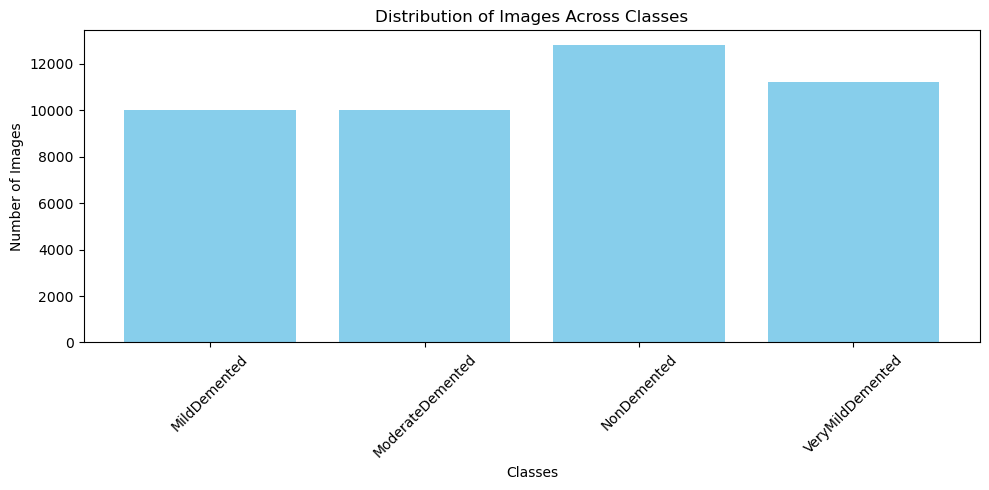

Class distribution plot saved at: C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\EDA_plots\class_distribution.png

Next Steps:
1. Create a new notebook for your project
2. Install required packages:
   - tensorflow or pytorch for deep learning
   - opencv-python for image processing
   - scikit-learn for data splitting
3. Start with data preprocessing


In [133]:
# Basic review of the data set and statistics overview and the setup of project 
# Import necessary libraries
import os
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def setup_local_project():
    # Verify data path
    data_path = Path(r"C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images")
    
    # Define output directory for EDA plots
    output_dir = Path(r"C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/EDA_plots")
    output_dir.mkdir(parents=True, exist_ok=True)  # Ensure folder exists

    if data_path.exists():
        print("✓ Successfully connected to data directory!")
        
        # Create a dictionary to store folder information
        folder_info = {}
        
        # Analyze directory structure
        print("\nDirectory Structure:")
        for item in data_path.iterdir():
            if item.is_dir():
                files = list(item.glob('*.jpg')) + list(item.glob('*.png'))  # Add more formats if needed
                folder_info[item.name] = len(files)
                print(f"└── {item.name}/")
                print(f"    └── {len(files)} images")
        
        # Basic statistics
        print("\nDataset Summary:")
        print(f"Total number of classes: {len(folder_info)}")
        print(f"Total number of images: {sum(folder_info.values())}")
        
        # Create a simple bar plot of class distribution
        plt.figure(figsize=(10, 5))
        plt.bar(folder_info.keys(), folder_info.values(), color="skyblue")
        plt.title('Distribution of Images Across Classes')
        plt.xlabel('Classes')
        plt.ylabel('Number of Images')
        plt.xticks(rotation=45)
        plt.tight_layout()

        # Save the plot
        plot_path = output_dir / "class_distribution.png"
        plt.savefig(plot_path, bbox_inches="tight")
        plt.show()
        
        print(f"Class distribution plot saved at: {plot_path}")
        
        return data_path, folder_info
    else:
        print("✗ Data directory not found!")
        print("\nTroubleshooting steps:")
        print("1. Verify the path exists in File Explorer")
        print("2. Check for typos in the path")
        print("3. Ensure all folder names are correct")
        return None, None

# Run setup
data_path, folder_info = setup_local_project()

if data_path:
    print("\nNext Steps:")
    print("1. Create a new notebook for your project")
    print("2. Install required packages:")
    print("   - tensorflow or pytorch for deep learning")
    print("   - opencv-python for image processing")
    print("   - scikit-learn for data splitting")
    print("3. Start with data preprocessing")


In [128]:
import os
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

def setup_project_environment():
    # Get and display current working directory
    current_dir = Path.cwd()
    print(f"Current working directory: {current_dir}")
    
    # Ask for the data path
    print("\nPlease verify your data path exists:")
    data_path = Path(r"C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images")
    
    try:
        # Check if path exists
        if data_path.exists():
            print(f"\n✓ Successfully found data directory at: {data_path}")
            
            # Count files and show directory structure
            print("\nDirectory Structure:")
            total_files = 0
            for item in data_path.iterdir():
                if item.is_dir():
                    files_in_dir = len(list(item.glob('*')))
                    total_files += files_in_dir
                    print(f"└── {item.name}/")
                    print(f"    └── {files_in_dir} files")
            
            print(f"\nTotal number of files found: {total_files}")
            
            return data_path
            
        else:
            raise FileNotFoundError("Data directory not found!")
            
    except Exception as e:
        print(f"Error: {e}")
        print("\nPlease verify the following:")
        print("1. The path is correct")
        print("2. The directory exists")
        print("3. You have permission to access the directory")
        return None

# Run the setup
data_path = setup_project_environment()

if data_path:
    print("\nSetup completed successfully!")
    print("\nYou can now proceed with your analysis.")
    print("\nSuggested next steps:")
    print("1. Load and preprocess your images")
    print("2. Create train/validation splits")
    print("3. Build your model")
else:
    print("\nPlease fix the path issues before proceeding.")

Current working directory: C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis

Please verify your data path exists:

✓ Successfully found data directory at: C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images

Directory Structure:
└── MildDemented/
    └── 10000 files
└── ModerateDemented/
    └── 10000 files
└── NonDemented/
    └── 12800 files
└── VeryMildDemented/
    └── 11200 files

Total number of files found: 44000

Setup completed successfully!

You can now proceed with your analysis.

Suggested next steps:
1. Load and preprocess your images
2. Create train/validation splits
3. Build your model


In [54]:
import os
import cv2
import shutil
from PIL import Image
import imghdr

def clean_dataset():
    """
    Comprehensive data cleaning process for the Alzheimer's dataset
    """
    base_path = "C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images/"
    categories = ['NonDemented', 'VeryMildDemented', 'MildDemented', 'ModerateDemented']
    
    # Create a log file for tracking cleaning process
    log_file = open('data_cleaning_log.txt', 'w')
    
    def is_valid_image(file_path):
        """Check if file is a valid image"""
        try:
            img = Image.open(file_path)
            img.verify()  # Verify it's an image
            img = Image.open(file_path)
            img.load()    # Load it to check for corruption
            
            # Check dimensions
            if img.size != (224, 224):
                return False
                
            return True
        except Exception as e:
            log_file.write(f"Error in file {file_path}: {str(e)}\n")
            return False

    def standardize_filename(old_name, category, index):
        """Standardize filename format"""
        extension = os.path.splitext(old_name)[1].lower()
        return f"{category}_{str(index).zfill(4)}{extension}"

    # Process each category
    for category in categories:
        category_path = os.path.join(base_path, category)
        print(f"Processing {category}...")
        log_file.write(f"\nProcessing {category}:\n")
        
        # Create temporary directory for cleaned files
        temp_dir = os.path.join(base_path, f"cleaned_{category}")
        os.makedirs(temp_dir, exist_ok=True)
        
        valid_files = 0
        
        # Check each file in category
        for idx, filename in enumerate(os.listdir(category_path)):
            file_path = os.path.join(category_path, filename)
            
            # Skip if not a file
            if not os.path.isfile(file_path):
                continue
                
            # Check if valid image
            if is_valid_image(file_path):
                # Standardize filename
                new_filename = standardize_filename(filename, category, valid_files)
                new_path = os.path.join(temp_dir, new_filename)
                
                # Copy valid file to temp directory with standardized name
                shutil.copy2(file_path, new_path)
                valid_files += 1
            else:
                log_file.write(f"Removed corrupted file: {filename}\n")
        
        # Replace original directory with cleaned files
        shutil.rmtree(category_path)
        os.rename(temp_dir, category_path)
        
        print(f"Completed {category}: {valid_files} valid files")
        log_file.write(f"Completed {category}: {valid_files} valid files\n")

    log_file.close()

def verify_dataset_structure():
    """
    Verify the final dataset structure and generate report
    """
    base_path = "C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images/"
    report = {}
    
    for category in os.listdir(base_path):
        category_path = os.path.join(base_path, category)
        if not os.path.isdir(category_path):
            continue
            
        files = os.listdir(category_path)
        report[category] = {
            'total_files': len(files),
            'file_examples': files[:3],
            'size_check': all(os.path.getsize(os.path.join(category_path, f)) > 0 for f in files)
        }
    
    return report

# Execute cleaning process
if __name__ == "__main__":
    try:
        print("Starting dataset cleaning process...")
        clean_dataset()
        
        print("\nVerifying final dataset structure...")
        report = verify_dataset_structure()
        
        print("\nCleaning Process Complete!")
        print("\nFinal Dataset Report:")
        for category, info in report.items():
            print(f"\n{category}:")
            print(f"Total files: {info['total_files']}")
            print(f"Example filenames: {', '.join(info['file_examples'])}")
            print(f"All files valid: {info['size_check']}")
            
    except Exception as e:
        print(f"Error during cleaning process: {str(e)}")

Starting dataset cleaning process...
Processing NonDemented...
Completed NonDemented: 0 valid files
Processing VeryMildDemented...
Completed VeryMildDemented: 0 valid files
Processing MildDemented...
Completed MildDemented: 0 valid files
Processing ModerateDemented...
Completed ModerateDemented: 0 valid files

Verifying final dataset structure...

Cleaning Process Complete!

Final Dataset Report:

cleaned_mMildDemented:
Total files: 0
Example filenames: 
All files valid: True

cleaned_non_demented:
Total files: 0
Example filenames: 
All files valid: True

MildDemented:
Total files: 0
Example filenames: 
All files valid: True

ModerateDemented:
Total files: 0
Example filenames: 
All files valid: True

NonDemented:
Total files: 0
Example filenames: 
All files valid: True

VeryMildDemented:
Total files: 0
Example filenames: 
All files valid: True


In [56]:
# Code for generating dataset statistics
def get_dataset_stats():
    base_path = "C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images/"
    stats = {}
    
    for category in os.listdir(base_path):
        category_path = os.path.join(base_path, category)
        if os.path.isdir(category_path):
            stats[category] = len(os.listdir(category_path))
    
    return stats

C:\Users\HP USER\AppData\Local\Temp\ipykernel_35240\1082701739.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette="viridis")


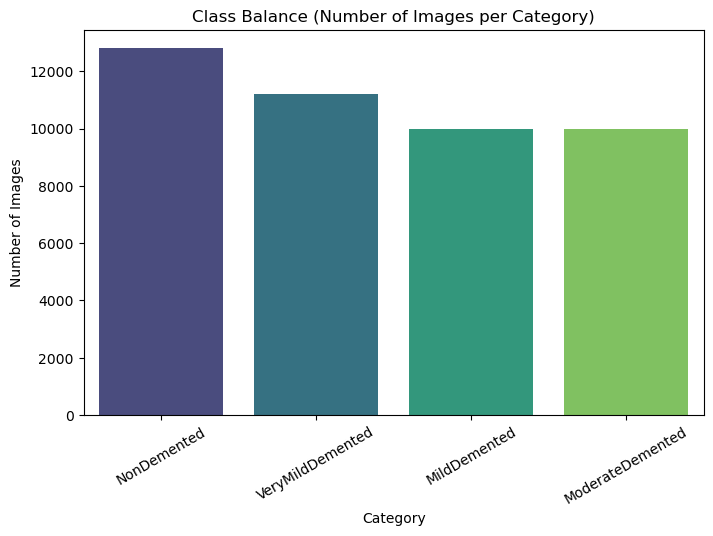


Plotted: Class Balance
X-axis: Category
Y-axis: Number of Images


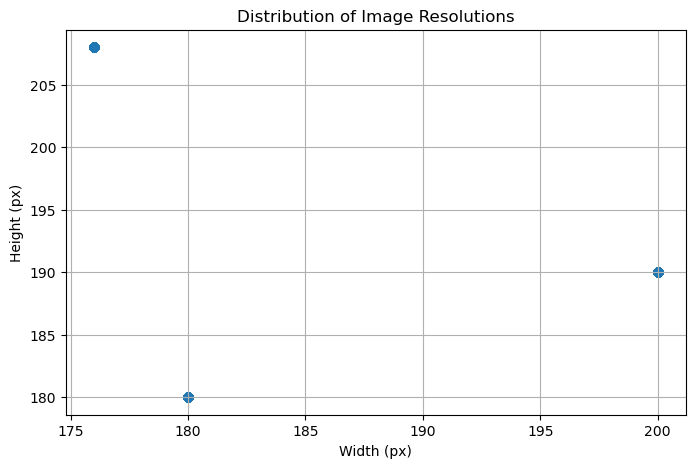


Plotted: Image Resolution Distribution
X-axis: Width (px)
Y-axis: Height (px)


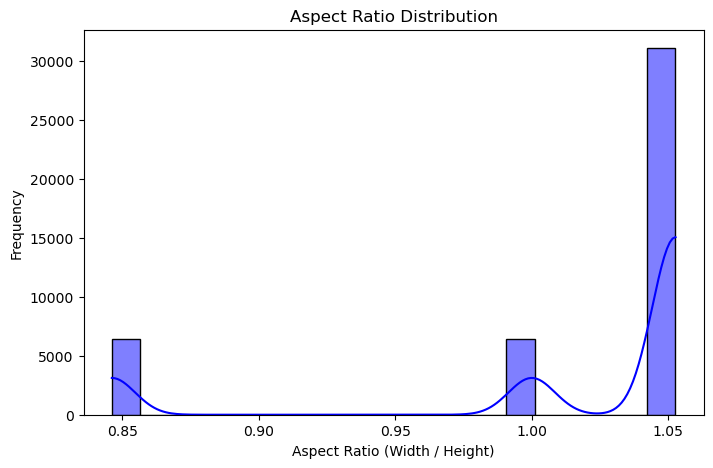


Plotted: Aspect Ratio Distribution
X-axis: Aspect Ratio (Width / Height)
Y-axis: Frequency


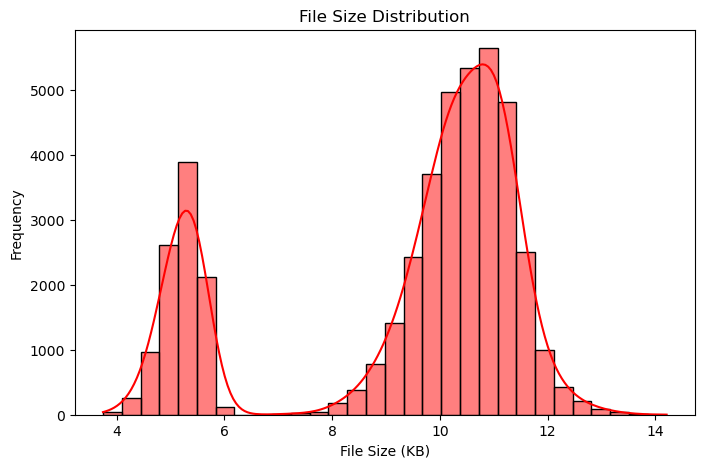


Plotted: File Size Distribution
X-axis: File Size (KB)
Y-axis: Frequency

📌 Data Summary:
Class Counts: {'NonDemented': 12800, 'VeryMildDemented': 11200, 'MildDemented': 10000, 'ModerateDemented': 10000}
Total images analyzed: 44000
Total invalid/corrupted files: 0


In [131]:
# Preliminary Data Analysis
# Initialize separate lists for width and height instead of tuples
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

# Define dataset path
base_path = "C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images/"
categories = ['NonDemented', 'VeryMildDemented', 'MildDemented', 'ModerateDemented']

# Define output directory for plots
output_dir = "EDA_plots"
os.makedirs(output_dir, exist_ok=True)  # Create directory if missing

# Initialize separate lists for width and height instead of tuples
widths = []
heights = []
aspect_ratios = []
file_sizes = []
class_counts = {}
invalid_files = []

# Function to check if an image is valid
def is_valid_image(file_path):
    try:
        img = Image.open(file_path)
        img.verify()  # Verify it's an image
        img = Image.open(file_path)
        img.load()    # Load image
        return True
    except Exception:
        return False

# Analyze dataset
for category in categories:
    category_path = os.path.join(base_path, category)
    if not os.path.exists(category_path):
        print(f"Warning: Category path {category_path} not found.")
        continue
    
    images = os.listdir(category_path)
    class_counts[category] = len(images)
    
    for img_name in images:
        img_path = os.path.join(category_path, img_name)
        
        if not is_valid_image(img_path):
            invalid_files.append(img_path)
            continue
        
        img = Image.open(img_path)
        width, height = img.size
        widths.append(width)
        heights.append(height)
        aspect_ratios.append(width / height)
        file_sizes.append(os.path.getsize(img_path) / 1024)  # Convert bytes to KB

# Convert collected data to NumPy arrays
widths = np.array(widths)
heights = np.array(heights)
aspect_ratios = np.array(aspect_ratios)
file_sizes = np.array(file_sizes)

### 📊 Class Balance Visualization ###
plt.figure(figsize=(8, 5))
sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette="viridis")
plt.title("Class Balance (Number of Images per Category)")
plt.xlabel("Category")
plt.ylabel("Number of Images")
plt.xticks(rotation=30)
plt.savefig(os.path.join(output_dir, "class_balance.png"))  # Save plot
plt.show()

print("\nPlotted: Class Balance")
print("X-axis: Category")
print("Y-axis: Number of Images")

### 🖼️ Image Size Distribution ###
plt.figure(figsize=(8, 5))
plt.scatter(widths, heights, alpha=0.5)
plt.title("Distribution of Image Resolutions")
plt.xlabel("Width (px)")
plt.ylabel("Height (px)")
plt.grid()
plt.savefig(os.path.join(output_dir, "image_size_distribution.png"))  # Save plot
plt.show()

print("\nPlotted: Image Resolution Distribution")
print("X-axis: Width (px)")
print("Y-axis: Height (px)")

### 🔢 Aspect Ratio Distribution ###
plt.figure(figsize=(8, 5))
sns.histplot(aspect_ratios, bins=20, kde=True, color="blue")
plt.title("Aspect Ratio Distribution")
plt.xlabel("Aspect Ratio (Width / Height)")
plt.ylabel("Frequency")
plt.savefig(os.path.join(output_dir, "aspect_ratio_distribution.png"))  # Save plot
plt.show()

print("\nPlotted: Aspect Ratio Distribution")
print("X-axis: Aspect Ratio (Width / Height)")
print("Y-axis: Frequency")

### 📦 File Size Distribution ###
plt.figure(figsize=(8, 5))
sns.histplot(file_sizes, bins=30, kde=True, color="red")
plt.title("File Size Distribution")
plt.xlabel("File Size (KB)")
plt.ylabel("Frequency")
plt.savefig(os.path.join(output_dir, "file_size_distribution.png"))  # Save plot
plt.show()

print("\nPlotted: File Size Distribution")
print("X-axis: File Size (KB)")
print("Y-axis: Frequency")

# Print Summary
print("\n📌 Data Summary:")
print("Class Counts:", class_counts)
print(f"Total images analyzed: {sum(class_counts.values())}")
print(f"Total invalid/corrupted files: {len(invalid_files)}")
if invalid_files:
    print("Example corrupted files:", invalid_files[:5])


In [11]:
!pip list | findstr tensorflow

In [13]:
!pip install tensorflow

   ---------------------------------------- 0.0/390.3 MB ? eta -:--:--
   ---------------------------------------- 0.0/390.3 MB ? eta -:--:--
   ---------------------------------------- 0.3/390.3 MB ? eta -:--:--
   ---------------------------------------- 0.5/390.3 MB 929.6 kB/s eta 0:07:00
   ---------------------------------------- 0.5/390.3 MB 929.6 kB/s eta 0:07:00
   ---------------------------------------- 0.8/390.3 MB 1.0 MB/s eta 0:06:12
   ---------------------------------------- 1.0/390.3 MB 1.1 MB/s eta 0:05:56
   ---------------------------------------- 1.6/390.3 MB 1.2 MB/s eta 0:05:34
   ---------------------------------------- 1.8/390.3 MB 1.2 MB/s eta 0:05:25
   ---------------------------------------- 2.1/390.3 MB 1.2 MB/s eta 0:05:15
   ---------------------------------------- 2.4/390.3 MB 1.2 MB/s eta 0:05:16
   ---------------------------------------- 2.6/390.3 MB 1.2 MB/s eta 0:05:11
   ---------------------------------------- 3.1/390.3 MB 1.3 MB/s eta 0:04:56
   

In [30]:
import tensorflow as tf

print("TensorFlow Version:", tf.__version__)
print("GPU Available:", tf.config.list_physical_devices('GPU'))


TensorFlow Version: 2.18.0
GPU Available: []


In [32]:
pip install opencv-python pandas numpy seaborn matplotlib scikit-learn torch torchvision torchaudio


   ---------------------------------------- 0.0/39.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/39.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/39.5 MB ? eta -:--:--
   ---------------------------------------- 0.3/39.5 MB ? eta -:--:--
    --------------------------------------- 0.5/39.5 MB 1.3 MB/s eta 0:00:31
    --------------------------------------- 0.5/39.5 MB 1.3 MB/s eta 0:00:31
   - -------------------------------------- 1.0/39.5 MB 1.3 MB/s eta 0:00:30
   - -------------------------------------- 1.3/39.5 MB 1.4 MB/s eta 0:00:28
   - -------------------------------------- 1.6/39.5 MB 1.3 MB/s eta 0:00:31
   - -------------------------------------- 1.6/39.5 MB 1.3 MB/s eta 0:00:31
   - -------------------------------------- 1.6/39.5 MB 1.3 MB/s eta 0:00:31
   - -------------------------------------- 1.6/39.5 MB 1.3 MB/s eta 0:00:31
   -- ------------------------------------- 2.4/39.5 MB 1.1 MB/s eta 0:00:35
   -- --------------------

In [36]:
import cv2
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import torch
import sklearn

print("OpenCV Version:", cv2.__version__)
print("Pandas Version:", pd.__version__)
print("NumPy Version:", np.__version__)
print("Seaborn Version:", sns.__version__)
print("Matplotlib Version:", matplotlib.__version__)  # Changed from plt.__version__ to matplotlib.__version__
print("Scikit-Learn Version:", sklearn.__version__)
print("PyTorch Version:", torch.__version__)

OpenCV Version: 4.11.0
Pandas Version: 2.2.2
NumPy Version: 1.26.4
Seaborn Version: 0.13.2
Matplotlib Version: 3.9.2
Scikit-Learn Version: 1.5.1
PyTorch Version: 2.6.0+cpu


In [26]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define image parameters
img_height, img_width = 224, 224
batch_size = 32

# Define the path to your dataset
dataset_path = "C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images/"

# Create an ImageDataGenerator
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

# Load training and validation sets
train_data = datagen.flow_from_directory(
    dataset_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode="categorical",
    subset="training",
    shuffle=True,
    follow_links=False  # This parameter is sufficient for handling symbolic links
)

val_data = datagen.flow_from_directory(
    dataset_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode="categorical",
    subset="validation",
    shuffle=True,
    follow_links=False
)

# Check class labels
print("Class Indices:", train_data.class_indices)

# Print the number of images in each set
print(f"Total training images: {len(train_data.filenames)}")
print(f"Total validation images: {len(val_data.filenames)}")

Found 35200 images belonging to 4 classes.
Found 8800 images belonging to 4 classes.
Class Indices: {'MildDemented': 0, 'ModerateDemented': 1, 'NonDemented': 2, 'VeryMildDemented': 3}
Total training images: 35200
Total validation images: 8800


In [38]:
#  Data Augmentation (Improves Model Robustness)
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=15,  # Randomly rotate images by up to 15 degrees
    width_shift_range=0.1,  # Shift width by 10%
    height_shift_range=0.1,  # Shift height by 10%
    shear_range=0.1,  # Shearing transformations
    zoom_range=0.1,  # Random zoom
    horizontal_flip=True  # Flip images horizontally
)


In [40]:
# Batch Shape Verification (Ensures Data is Correctly Loaded)
x_batch, y_batch = next(train_data)
print("Image batch shape:", x_batch.shape)  # Expected: (32, 224, 224, 3)
print("Label batch shape:", y_batch.shape)  # Expected: (32, number_of_classes)


Image batch shape: (32, 224, 224, 3)
Label batch shape: (32, 4)


Image file found. Proceeding with verification...
Processed Image Shape: (128, 128)
Value Range: 0 - 250


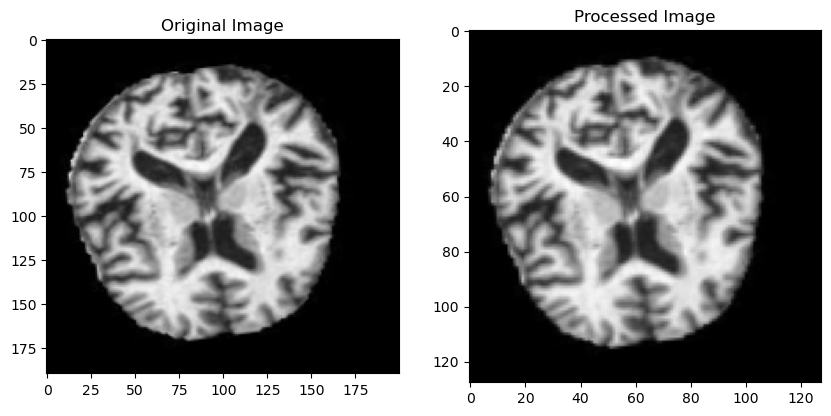

Quality control plot saved at: C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/EDA_plots/quality_control.png


In [122]:
# Quality Control

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define image path correctly
image_path = "C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images/MildDemented/000cdcc4-3e54-4034-a538-203c8047b564.jpg"

# Define output directory for EDA plots
output_dir = "C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/EDA_plots/"
os.makedirs(output_dir, exist_ok=True)  # Ensure the folder exists

# Check if the file exists
if not os.path.exists(image_path):
    print(f"Error: Image file not found at {image_path}")
else:
    print("Image file found. Proceeding with verification...")

def preprocess_images(image_path):
    """
    Dummy preprocessing function: 
    Convert image to grayscale and resize to (128, 128)
    """
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Unable to load image at {image_path}")
        return None
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
    img = cv2.resize(img, (128, 128))  # Resize to 128x128
    return img

def verify_preprocessing(image_path):
    """
    Verification function for preprocessing steps
    """
    # Load and preprocess image
    processed_img = preprocess_images(image_path)
    if processed_img is None:
        print("Error: Processing failed.")
        return

    # Verification checks
    print("Processed Image Shape:", processed_img.shape)
    print("Value Range:", np.min(processed_img), "-", np.max(processed_img))

    # Load original image in RGB format
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Unable to load image at {image_path}")
        return

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Check if processed image is grayscale
    cmap = "gray" if len(processed_img.shape) == 2 else None
    
    # Visualization
    plt.figure(figsize=(10, 5))
    
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title("Original Image")
    
    plt.subplot(1, 2, 2)
    plt.imshow(processed_img, cmap=cmap)
    plt.title("Processed Image")

    # Save the plot
    plot_path = os.path.join(output_dir, "quality_control.png")
    plt.savefig(plot_path, bbox_inches="tight")
    plt.show()

    print(f"Quality control plot saved at: {plot_path}")

# Call function with correct image path
verify_preprocessing(image_path)


In [42]:
# Optimizing CPU-Based Training
import multiprocessing
import psutil

print(f"CPU Cores: {multiprocessing.cpu_count()}")
print(f"Max Frequency: {psutil.cpu_freq().max:.2f} MHz")


CPU Cores: 8
Max Frequency: 2112.00 MHz


In [48]:
# Recommendations before training
batch_size = 16  # Try 16 or 8 if memory runs out

import os, psutil
process = psutil.Process(os.getpid())
print(f"Memory Usage: {process.memory_info().rss / 1024 ** 2:.2f} MB")



Memory Usage: 19.10 MB


Total Images: 44000
                                          image_path        label
0  C:/Users/HP USER/Downloads/20Proj_Challenge_5_...  NonDemented
1  C:/Users/HP USER/Downloads/20Proj_Challenge_5_...  NonDemented
2  C:/Users/HP USER/Downloads/20Proj_Challenge_5_...  NonDemented
3  C:/Users/HP USER/Downloads/20Proj_Challenge_5_...  NonDemented
4  C:/Users/HP USER/Downloads/20Proj_Challenge_5_...  NonDemented


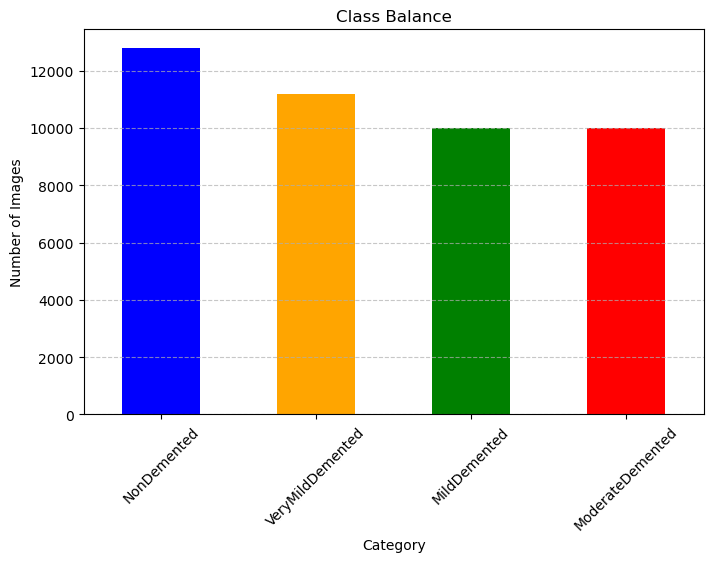

Class balance plot saved at: C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/EDA_plots/class_balance.png


In [121]:
# Process (Data Cleaning & Preprocessing)
# Data Loading and Inspection

import os
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define base path & categories
base_path = "C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images/"
categories = ['NonDemented', 'VeryMildDemented', 'MildDemented', 'ModerateDemented']

# Define output directory for EDA plots
output_dir = "C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/EDA_plots/"
os.makedirs(output_dir, exist_ok=True)  # Ensure the folder exists

# Create a DataFrame to store image paths and labels
data = []

for category in categories:
    category_path = os.path.join(base_path, category)
    for img_name in os.listdir(category_path):
        img_path = os.path.join(category_path, img_name)
        data.append((img_path, category))

# Convert to Pandas DataFrame
df = pd.DataFrame(data, columns=['image_path', 'label'])

# Display dataset information
print("Total Images:", len(df))
print(df.head())

# Check class balance
plt.figure(figsize=(8, 5))
df['label'].value_counts().plot(kind='bar', title="Class Balance", color=['blue', 'orange', 'green', 'red'])
plt.xlabel("Category")
plt.ylabel("Number of Images")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Save the plot
plot_path = os.path.join(output_dir, "class_balance.png")
plt.savefig(plot_path, bbox_inches="tight")
plt.show()

print(f"Class balance plot saved at: {plot_path}")


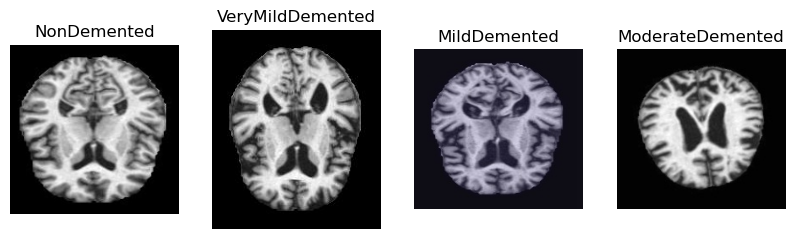

In [120]:
# Process (Data Cleaning & Preprocessing)
# Display Sample Images from Each Class
def display_sample_images(df, categories):
    plt.figure(figsize=(10, 6))

    for i, category in enumerate(categories):
        sample = df[df['label'] == category].sample(1).iloc[0]
        img = cv2.imread(sample.image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

        plt.subplot(1, len(categories), i+1)
        plt.imshow(img)
        plt.title(category)
        plt.axis("off")

    plt.show()

display_sample_images(df, categories)


In [119]:
# Process (Data Cleaning & Preprocessing)
# Preprocess Images
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def preprocess_images(image_path, target_size=(128, 128)):
    """
    Preprocess image: Convert to grayscale, normalize, and resize.
    """
    img = cv2.imread(image_path)
    if img is None:
        return None

    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
    img = cv2.resize(img, target_size)  # Resize
    img = img / 255.0  # Normalize

    return img

# Apply preprocessing
df['processed_image'] = df['image_path'].apply(preprocess_images)

# Drop rows with None (failed images)
df.dropna(subset=['processed_image'], inplace=True)


In [117]:
df['processed_image'].head()

0    [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
1    [[0.08235294117647059, 0.08235294117647059, 0....
2    [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
3    [[0.21176470588235294, 0.21176470588235294, 0....
4    [[0.03529411764705882, 0.03529411764705882, 0....
Name: processed_image, dtype: object

In [115]:
# Convert Processed Images to NumPy Arrays
import numpy as np

# Convert list to NumPy array
sample_index = 0  # Pick an index
sample_img = np.array(df['processed_image'].iloc[sample_index])  # Convert list to array

print("Sample Image Shape:", sample_img.shape)  # Should be (height, width)


Sample Image Shape: (128, 128)


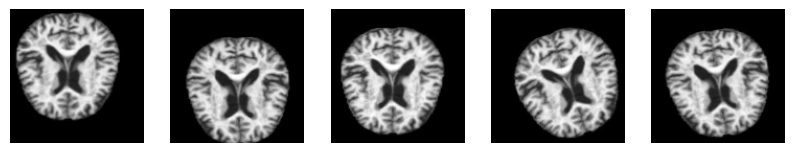

In [113]:
# Process (Data Cleaning & Preprocessing)
# Data Augmentation
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create directory if it doesn't exist
output_dir = "EDA_plots"
os.makedirs(output_dir, exist_ok=True)

# Define Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,  
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,  
    brightness_range=[0.8, 1.2]
)

# Select a processed image and ensure it's a NumPy array
sample_index = 9  # Change this to any index you want
sample_img = np.array(df['processed_image'].iloc[sample_index])  

# Ensure the image has a channel dimension (grayscale -> (128, 128, 1))
if sample_img.ndim == 2:  # If it's (128, 128), add channel dimension
    sample_img = np.expand_dims(sample_img, axis=-1)

# Convert image back to 0-255 range for augmentation
sample_img = (sample_img * 255).astype(np.uint8)

# Add batch dimension → (1, 128, 128, 1)
sample_img = np.expand_dims(sample_img, axis=0)

# Augment the image
aug_iter = datagen.flow(sample_img, batch_size=1)

# Display Augmented Images
plt.figure(figsize=(10, 5))
for i in range(5):
    aug_img = next(aug_iter)[0]  # ✅ Use Python's built-in next() function
    aug_img = aug_img.astype(np.float32) / 255.0  # Scale back to 0-1 for display
    plt.subplot(1, 5, i + 1)
    plt.imshow(aug_img.squeeze(), cmap="gray")  # Ensure correct display
    plt.axis("off")

# Save each augmented image
    plt.imsave(os.path.join(output_dir, f"augmented_image_{i+1}.png"), aug_img.squeeze(), cmap="gray")

plt.savefig(os.path.join(output_dir, "augmented_images_grid.png"))  # Save the entire figure
plt.show()



In [99]:
# Process (Data Cleaning & Preprocessing)
# Feature Extraction (Histogram of Oriented Gradients - HOG)
from skimage.feature import hog

def extract_hog_features(image):
    """
    Extract HOG features from an image.
    """
    features, _ = hog(image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)
    return features

df['hog_features'] = df['processed_image'].apply(extract_hog_features)
print("HOG feature extraction completed.")


HOG feature extraction completed.


In [105]:
# Document Data Cleaning Process
# Log & Save Processed Data
# Save processed DataFrame
df.to_pickle("processed_alzheimer_data.pkl")

# Check for missing values
print("Missing values per column:")
print(df.isnull().sum())

# Display sample of processed dataset
df.head()



Missing values per column:
image_path         0
label              0
processed_image    0
hog_features       0
dtype: int64


,image_path,label,processed_image,hog_features
0,C:/Users/HP USER/Downloads/20Proj_Challenge_5_...,NonDemented,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,C:/Users/HP USER/Downloads/20Proj_Challenge_5_...,NonDemented,"[[0.08235294117647059, 0.08235294117647059, 0....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,C:/Users/HP USER/Downloads/20Proj_Challenge_5_...,NonDemented,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,C:/Users/HP USER/Downloads/20Proj_Challenge_5_...,NonDemented,"[[0.21176470588235294, 0.21176470588235294, 0....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,C:/Users/HP USER/Downloads/20Proj_Challenge_5_...,NonDemented,"[[0.03529411764705882, 0.03529411764705882, 0....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [109]:
import os
print(os.getcwd())  # Prints the current working directory


C:\Users\HP USER\Downloads\Alzheimer_data\combined_images


In [111]:
import os

# Set the correct project directory
project_dir = os.path.expanduser("~/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis")
os.chdir(project_dir)  # Change the working directory
print("Current working directory:", os.getcwd())  # Verify change


Current working directory: C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis


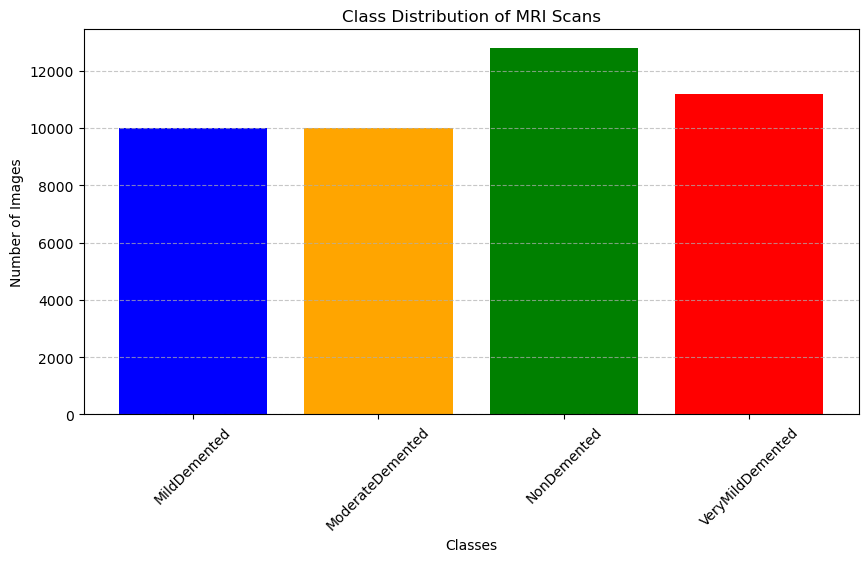


✅ Class Distribution Analysis:
X-axis (Classes): ['MildDemented', 'ModerateDemented', 'NonDemented', 'VeryMildDemented']
Y-axis (Number of Images): [10000, 10000, 12800, 11200]
Total Classes: 4
Total Images: 44000
Class Counts: {'MildDemented': 10000, 'ModerateDemented': 10000, 'NonDemented': 12800, 'VeryMildDemented': 11200}


In [141]:
# Exploratory Data Analysis (EDA)
#  1: Class Distribution Analysis
import os
from pathlib import Path
import matplotlib.pyplot as plt

# Define the dataset path
data_path = Path(r"C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images")

# Dictionary to store class distribution
class_counts = {}

# Count the number of images in each class folder
for folder in data_path.iterdir():
    if folder.is_dir():
        class_counts[folder.name] = len(list(folder.glob("*.jpg"))) + len(list(folder.glob("*.png")))

# Plot Class Distribution
plt.figure(figsize=(10, 5))
plt.bar(class_counts.keys(), class_counts.values(), color=['blue', 'orange', 'green', 'red'])
plt.xlabel("Classes")
plt.ylabel("Number of Images")
plt.title("Class Distribution of MRI Scans")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Save plot
output_dir = Path("EDA_plots")
output_dir.mkdir(exist_ok=True)
plt.savefig(output_dir / "class_distribution.png")

plt.show()

# Print dataset summary and axis labels
print("\n✅ Class Distribution Analysis:")
print("X-axis (Classes):", list(class_counts.keys()))
print("Y-axis (Number of Images):", list(class_counts.values()))
print(f"Total Classes: {len(class_counts)}")
print(f"Total Images: {sum(class_counts.values())}")
print("Class Counts:", class_counts)



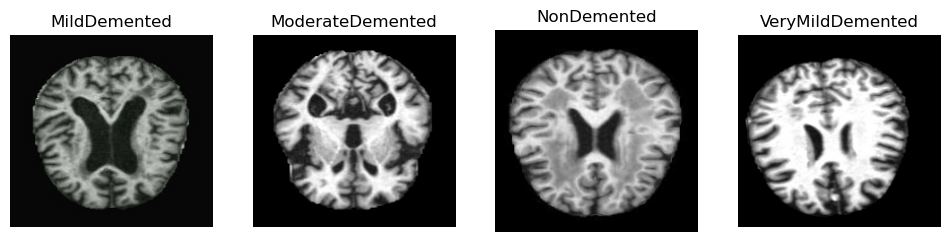


✅ Image Quality Assessment:
Displayed images from each class:
- Class: MildDemented, Sample Image Path: C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images\MildDemented\00046ff7-0fae-4796-9a2b-2df47095bfe6.jpg
- Class: ModerateDemented, Sample Image Path: C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images\ModerateDemented\001ef5a6-893b-4ede-9cf8-60b7fb94a541.jpg
- Class: NonDemented, Sample Image Path: C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images\NonDemented\00005576-2b76-44ca-8572-a5057201433f.jpg
- Class: VeryMildDemented, Sample Image Path: C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images\VeryMildDemented\0001b959-d622-4311-acab-84633370c892.jpg


In [143]:
# Exploratory Data Analysis (EDA)
#  2: Image Quality Assessment
import cv2
import numpy as np

# Select sample images from each class
sample_images = {}
for class_name in class_counts.keys():
    class_folder = data_path / class_name
    sample_image_path = next(class_folder.glob("*.jpg"), None) or next(class_folder.glob("*.png"), None)
    
    if sample_image_path:
        sample_images[class_name] = str(sample_image_path)

# Display sample images
plt.figure(figsize=(12, 6))
for i, (class_name, img_path) in enumerate(sample_images.items()):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
    
    plt.subplot(1, len(sample_images), i + 1)
    plt.imshow(img)
    plt.title(class_name)
    plt.axis("off")

# Save image sample visualization
plt.savefig(output_dir / "sample_images.png")

plt.show()

# Print summary of displayed images
print("\n✅ Image Quality Assessment:")
print("Displayed images from each class:")
for class_name, img_path in sample_images.items():
    print(f"- Class: {class_name}, Sample Image Path: {img_path}")



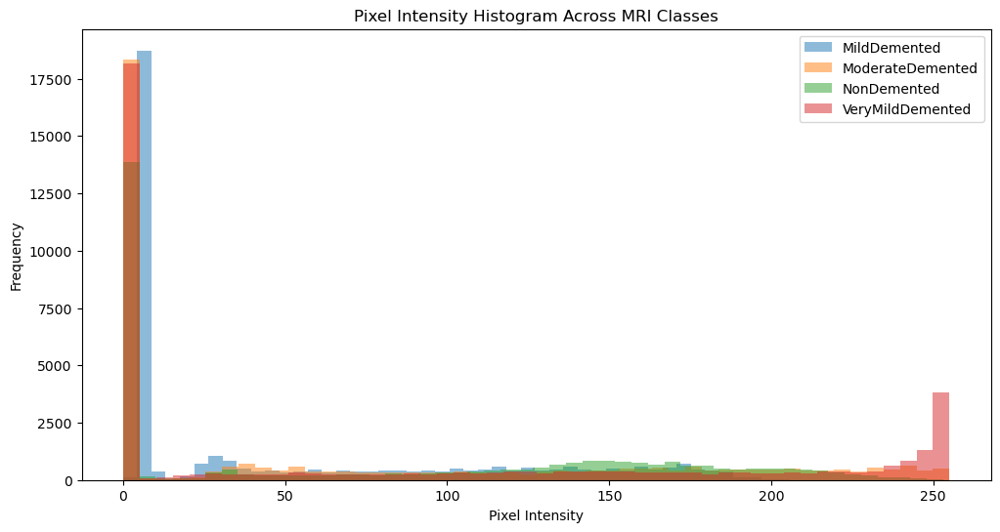


✅ Histogram Analysis:

Class: MildDemented
X-axis (Pixel Intensity Bins): [ 0.    4.38  8.76 13.14 17.52 21.9  26.28 30.66 35.04 39.42] ...
Y-axis (Frequency of Pixels): [  114. 18730.   384.    51.   138.   726.  1049.   829.   490.   369.] ...

Class: ModerateDemented
X-axis (Pixel Intensity Bins): [ 0.   5.1 10.2 15.3 20.4 25.5 30.6 35.7 40.8 45.9] ...
Y-axis (Frequency of Pixels): [18338.    61.    45.    75.    97.   383.   572.   693.   538.   433.] ...

Class: NonDemented
X-axis (Pixel Intensity Bins): [ 0.    5.06 10.12 15.18 20.24 25.3  30.36 35.42 40.48 45.54] ...
Y-axis (Frequency of Pixels): [13879.   157.    89.    77.    85.   308.   467.   235.   204.   183.] ...

Class: VeryMildDemented
X-axis (Pixel Intensity Bins): [ 0.   5.1 10.2 15.3 20.4 25.5 30.6 35.7 40.8 45.9] ...
Y-axis (Frequency of Pixels): [18172.    73.   102.   200.   262.   287.   246.   239.   264.   257.] ...


In [145]:
# Exploratory Data Analysis (EDA)
# 3: Histogram Analysis (Pixel Intensity Variations)
# Analyzing pixel intensity distributions across different MRI scan classes.
# Plot histogram of pixel intensities for sample images
plt.figure(figsize=(12, 6))

hist_data = {}

for class_name, img_path in sample_images.items():
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Load as grayscale
    hist_values, bins, _ = plt.hist(img.ravel(), bins=50, alpha=0.5, label=class_name)  # Flatten & plot histogram
    hist_data[class_name] = (bins[:-1], hist_values)  # Store X (bins) and Y (frequency)

plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.title("Pixel Intensity Histogram Across MRI Classes")
plt.legend()

# Save histogram plot
plt.savefig(output_dir / "pixel_intensity_histogram.png")

plt.show()

# Print histogram data for review
print("\n✅ Histogram Analysis:")
for class_name, (bins, frequencies) in hist_data.items():
    print(f"\nClass: {class_name}")
    print("X-axis (Pixel Intensity Bins):", bins[:10], "...")  # Show first 10 bins for preview
    print("Y-axis (Frequency of Pixels):", frequencies[:10], "...")  # Show first 10 frequencies



In [153]:
# Feature Engineering (Before Data Augmentation)
# 1: Feature Extraction using HOG and LBP
# (1) Load necessary libraries & dataset

import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from skimage.feature import hog, local_binary_pattern
from skimage import color
from sklearn.preprocessing import StandardScaler

# Define image directory
data_dir = "C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images/"

# Define classes
classes = ["MildDemented", "ModerateDemented", "NonDemented", "VeryMildDemented"]

# Initialize empty lists for features and labels
hog_features = []
lbp_features = []
labels = []

# (2) Define HOG and LBP feature extraction functions
def extract_hog_features(image):
    """Extract HOG features from an image."""
    gray = color.rgb2gray(image)
    features, _ = hog(gray, pixels_per_cell=(8, 8), cells_per_block=(2, 2), 
                      visualize=True, block_norm="L2-Hys")
    return features

def extract_lbp_features(image, radius=3, n_points=24):
    """Extract LBP features from an image."""
    gray = color.rgb2gray(image)
    gray = (gray * 255).astype(np.uint8)  # Convert to integer type
    lbp = local_binary_pattern(gray, P=n_points, R=radius, method="uniform")
    hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, n_points + 3), density=True)
    return hist

# (3) Extract features from dataset
# Iterate through each class and extract features
for class_label in classes:
    class_path = os.path.join(data_dir, class_label)
    for img_name in os.listdir(class_path)[:100]:  # Extract from first 100 images per class
        img_path = os.path.join(class_path, img_name)
        image = cv2.imread(img_path)
        if image is None:
            print(f"Could not read image: {img_path}")
            continue
        image = cv2.resize(image, (128, 128))  # Resize for consistency

        # Extract HOG & LBP features
        hog_feat = extract_hog_features(image)
        lbp_feat = extract_lbp_features(image)

        # Store features and labels
        hog_features.append(hog_feat)
        lbp_features.append(lbp_feat)
        labels.append(class_label)

# Convert to NumPy arrays
hog_features = np.array(hog_features)
lbp_features = np.array(lbp_features)
labels = np.array(labels)

print(f"HOG Feature Shape: {hog_features.shape}")
print(f"LBP Feature Shape: {lbp_features.shape}")

# (4) Normalize features for consistency
scaler = StandardScaler()
hog_features = scaler.fit_transform(hog_features)
lbp_features = scaler.fit_transform(lbp_features)

print("Feature extraction completed successfully!")


HOG Feature Shape: (400, 8100)
LBP Feature Shape: (400, 26)
Feature extraction completed successfully!


In [157]:
# ✅ HOG & LBP Feature Visualization

import matplotlib.pyplot as plt
import os

# Create a folder for saving plots if it doesn’t exist
plot_dir = "EDA_plots"
os.makedirs(plot_dir, exist_ok=True)

# Select a sample image for visualization
sample_idx = 0  # Change this index to visualize different images

# HOG Features Visualization
def visualize_hog(image_path, save_path):
    """Display and save the HOG feature visualization."""
    image = cv2.imread(image_path)
    image = cv2.resize(image, (128, 128))  # Ensure size consistency
    gray = color.rgb2gray(image)
    
    # Compute HOG features and visualization
    features, hog_image = hog(gray, pixels_per_cell=(8, 8), 
                              cells_per_block=(2, 2), visualize=True, 
                              block_norm="L2-Hys")
    
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(gray, cmap="gray")
    ax[0].set_title("Original Image")
    
    ax[1].imshow(hog_image, cmap="gray")
    ax[1].set_title("HOG Features")
    
    plt.savefig(save_path)
    plt.close()

# LBP Features Visualization
def visualize_lbp(image_path, save_path):
    """Display and save the LBP histogram visualization."""
    image = cv2.imread(image_path)
    image = cv2.resize(image, (128, 128))
    gray = color.rgb2gray(image)
    gray = (gray * 255).astype(np.uint8)  # Convert to uint8
    
    lbp = local_binary_pattern(gray, P=24, R=3, method="uniform")
    hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, 26), density=True)
    
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(gray, cmap="gray")
    ax[0].set_title("Original Image")
    
    ax[1].bar(range(25), hist)
    ax[1].set_title("LBP Feature Histogram")
    
    plt.savefig(save_path)
    plt.close()

# Select a sample image from one of the classes
sample_class = "MildDemented"  # Change this to visualize other classes
sample_image_name = os.listdir(os.path.join(data_dir, sample_class))[sample_idx]
sample_image_path = os.path.join(data_dir, sample_class, sample_image_name)

# Define file names for saving plots
hog_save_path = os.path.join(plot_dir, f"{sample_class}_HOG.png")
lbp_save_path = os.path.join(plot_dir, f"{sample_class}_LBP.png")

# Generate and save plots
visualize_hog(sample_image_path, hog_save_path)
visualize_lbp(sample_image_path, lbp_save_path)

print(f"HOG visualization saved at: {hog_save_path}")
print(f"LBP visualization saved at: {lbp_save_path}")

# Print Key Observations
print("\n🔹 **HOG Feature Observations:**")
print("- Highlights the edges and structural patterns in the image.")
print("- Focuses on gradient orientation, capturing shape details.")
print("- Useful for detecting structural changes in brain MRI scans.")

print("\n🔹 **LBP Feature Observations:**")
print("- Captures texture patterns, useful for identifying fine details.")
print("- Useful in distinguishing variations in brain tissue textures.")
print("- Histogram provides distribution of texture patterns across the image.")



HOG visualization saved at: EDA_plots\MildDemented_HOG.png
LBP visualization saved at: EDA_plots\MildDemented_LBP.png

🔹 **HOG Feature Observations:**
- Highlights the edges and structural patterns in the image.
- Focuses on gradient orientation, capturing shape details.
- Useful for detecting structural changes in brain MRI scans.

🔹 **LBP Feature Observations:**
- Captures texture patterns, useful for identifying fine details.
- Useful in distinguishing variations in brain tissue textures.
- Histogram provides distribution of texture patterns across the image.


Reduced HOG Features Shape: (400, 302)
Reduced LBP Features Shape: (400, 14)


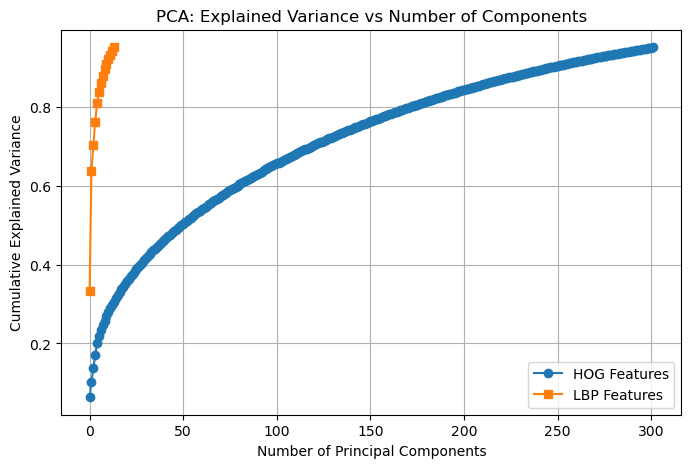

📊 PCA Plot Interpretation:
   - X-axis: Number of Principal Components (Reduced Features)
   - Y-axis: Cumulative Explained Variance (How much data variance is retained)
PCA Explained Variance Plot saved at: EDA_plots\PCA_explained_variance.png



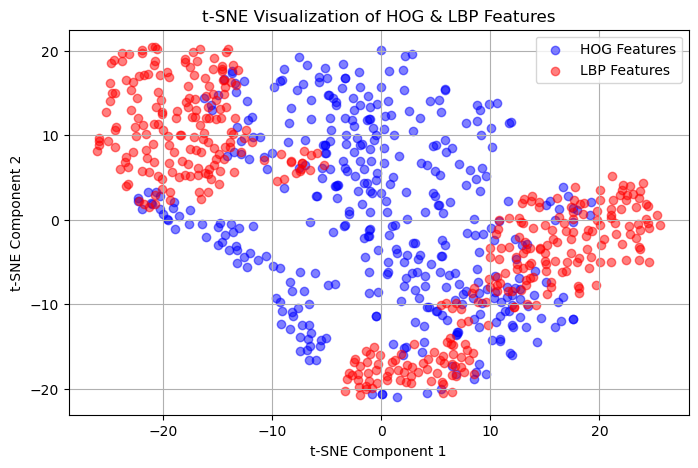

📊 t-SNE Plot Interpretation:
   - X-axis: t-SNE Component 1 (Compressed Feature Representation)
   - Y-axis: t-SNE Component 2 (Compressed Feature Representation)
   - The plot shows how HOG & LBP features are grouped and whether they form distinct clusters.
t-SNE Visualization saved at: EDA_plots\tSNE_visualization.png


In [161]:
# Dimensionality Reduction (PCA & t-SNE)

# Step 2: Dimensionality Reduction (PCA & t-SNE)

import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import os

# Create directory for saving visualizations
eda_plots_dir = "EDA_plots"
os.makedirs(eda_plots_dir, exist_ok=True)

# (1) Apply PCA to reduce dimensions while retaining 95% variance
pca_hog = PCA(n_components=0.95)
pca_lbp = PCA(n_components=0.95)

hog_pca_features = pca_hog.fit_transform(hog_features)
lbp_pca_features = pca_lbp.fit_transform(lbp_features)

print(f"Reduced HOG Features Shape: {hog_pca_features.shape}")
print(f"Reduced LBP Features Shape: {lbp_pca_features.shape}")

# Plot variance explained by PCA
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca_hog.explained_variance_ratio_), marker='o', label="HOG Features")
plt.plot(np.cumsum(pca_lbp.explained_variance_ratio_), marker='s', label="LBP Features")
plt.xlabel("Number of Principal Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA: Explained Variance vs Number of Components")
plt.legend()
plt.grid()

# Save PCA plot
pca_plot_path = os.path.join(eda_plots_dir, "PCA_explained_variance.png")
plt.savefig(pca_plot_path)
plt.show()

# Print interpretation of PCA plot axes
print("📊 PCA Plot Interpretation:")
print("   - X-axis: Number of Principal Components (Reduced Features)")
print("   - Y-axis: Cumulative Explained Variance (How much data variance is retained)")
print(f"PCA Explained Variance Plot saved at: {pca_plot_path}\n")

# (2) Apply t-SNE for visualization
tsne = TSNE(n_components=2, perplexity=30, random_state=42)

hog_tsne_features = tsne.fit_transform(hog_pca_features)
lbp_tsne_features = tsne.fit_transform(lbp_pca_features)

# Plot t-SNE visualization
plt.figure(figsize=(8, 5))
plt.scatter(hog_tsne_features[:, 0], hog_tsne_features[:, 1], c='blue', alpha=0.5, label="HOG Features")
plt.scatter(lbp_tsne_features[:, 0], lbp_tsne_features[:, 1], c='red', alpha=0.5, label="LBP Features")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.title("t-SNE Visualization of HOG & LBP Features")
plt.legend()
plt.grid()

# Save t-SNE plot
tsne_plot_path = os.path.join(eda_plots_dir, "tSNE_visualization.png")
plt.savefig(tsne_plot_path)
plt.show()

# Print interpretation of t-SNE plot axes
print("📊 t-SNE Plot Interpretation:")
print("   - X-axis: t-SNE Component 1 (Compressed Feature Representation)")
print("   - Y-axis: t-SNE Component 2 (Compressed Feature Representation)")
print("   - The plot shows how HOG & LBP features are grouped and whether they form distinct clusters.")
print(f"t-SNE Visualization saved at: {tsne_plot_path}")


Reduced HOG Features Shape: (400, 302)
Reduced LBP Features Shape: (400, 14)


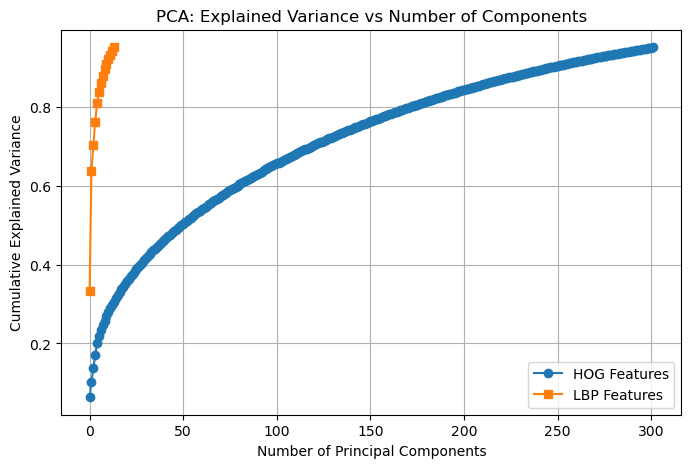


🔹 PCA Plot Data Points (First 10 for each feature set):
   HOG PCA Explained Variance: [0.06377937 0.1025923  0.13756984 0.17067428 0.20010582 0.21794986
 0.23319354 0.24668    0.25817846 0.26928688]
   LBP PCA Explained Variance: [0.3339208  0.63845865 0.70224332 0.76081859 0.81061431 0.83687893
 0.85988792 0.87777502 0.89457653 0.90948045]
PCA Explained Variance Plot saved at: EDA_plots\PCA_explained_variance.png



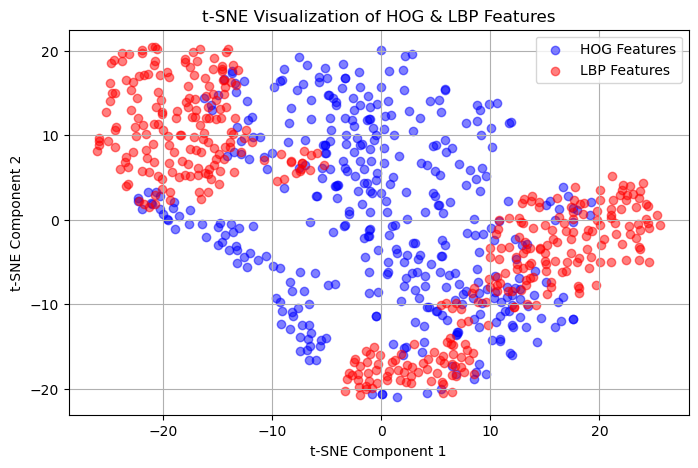


🔹 t-SNE Plot Data Points (First 10 for each feature set):
   HOG t-SNE X-axis: [ 2.8037045  8.73376   -7.111041  11.8700285 -2.1358202 -5.5528417
  1.7903012 -7.4095287 -1.9757646  8.7666855]
   HOG t-SNE Y-axis: [ -6.3164      4.8240995  -8.481562   11.60619     3.4148345 -14.224726
  -9.5805855 -13.889601   13.521241   -5.771525 ]
   LBP t-SNE X-axis: [-16.911951   13.335967    6.5964036   1.5160867  -8.226893    5.990793
  23.697847    6.7781453 -17.942753    8.881778 ]
   LBP t-SNE Y-axis: [ 18.756475   -9.950757  -15.913583  -17.708445    7.0034113 -14.486293
   3.4554968 -17.31913     5.336244   -9.702184 ]
t-SNE Visualization saved at: EDA_plots\tSNE_visualization.png



In [163]:
# Step 2: Dimensionality Reduction (PCA & t-SNE)

import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import os

# Create directory for saving visualizations
eda_plots_dir = "EDA_plots"
os.makedirs(eda_plots_dir, exist_ok=True)

# (1) Apply PCA to reduce dimensions while retaining 95% variance
pca_hog = PCA(n_components=0.95)
pca_lbp = PCA(n_components=0.95)

hog_pca_features = pca_hog.fit_transform(hog_features)
lbp_pca_features = pca_lbp.fit_transform(lbp_features)

print(f"Reduced HOG Features Shape: {hog_pca_features.shape}")
print(f"Reduced LBP Features Shape: {lbp_pca_features.shape}")

# Plot variance explained by PCA
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca_hog.explained_variance_ratio_), marker='o', label="HOG Features")
plt.plot(np.cumsum(pca_lbp.explained_variance_ratio_), marker='s', label="LBP Features")
plt.xlabel("Number of Principal Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA: Explained Variance vs Number of Components")
plt.legend()
plt.grid()

# Save PCA plot
pca_plot_path = os.path.join(eda_plots_dir, "PCA_explained_variance.png")
plt.savefig(pca_plot_path)
plt.show()

# Print actual PCA values plotted
print("\n🔹 PCA Plot Data Points (First 10 for each feature set):")
print("   HOG PCA Explained Variance:", np.cumsum(pca_hog.explained_variance_ratio_)[:10])
print("   LBP PCA Explained Variance:", np.cumsum(pca_lbp.explained_variance_ratio_)[:10])
print(f"PCA Explained Variance Plot saved at: {pca_plot_path}\n")

# (2) Apply t-SNE for visualization
tsne = TSNE(n_components=2, perplexity=30, random_state=42)

hog_tsne_features = tsne.fit_transform(hog_pca_features)
lbp_tsne_features = tsne.fit_transform(lbp_pca_features)

# Plot t-SNE visualization
plt.figure(figsize=(8, 5))
plt.scatter(hog_tsne_features[:, 0], hog_tsne_features[:, 1], c='blue', alpha=0.5, label="HOG Features")
plt.scatter(lbp_tsne_features[:, 0], lbp_tsne_features[:, 1], c='red', alpha=0.5, label="LBP Features")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.title("t-SNE Visualization of HOG & LBP Features")
plt.legend()
plt.grid()

# Save t-SNE plot
tsne_plot_path = os.path.join(eda_plots_dir, "tSNE_visualization.png")
plt.savefig(tsne_plot_path)
plt.show()

# Print actual t-SNE values plotted
print("\n🔹 t-SNE Plot Data Points (First 10 for each feature set):")
print("   HOG t-SNE X-axis:", hog_tsne_features[:10, 0])
print("   HOG t-SNE Y-axis:", hog_tsne_features[:10, 1])
print("   LBP t-SNE X-axis:", lbp_tsne_features[:10, 0])
print("   LBP t-SNE Y-axis:", lbp_tsne_features[:10, 1])
print(f"t-SNE Visualization saved at: {tsne_plot_path}\n")


In [165]:
# 1️⃣ Optimize HOG Feature Selection
from sklearn.feature_selection import VarianceThreshold

# Apply variance thresholding to HOG features
var_thresh = VarianceThreshold(threshold=0.01)  # Remove features with variance < 0.01
hog_features_optimized = var_thresh.fit_transform(hog_features)

print(f"Original HOG Shape: {hog_features.shape}")
print(f"Optimized HOG Shape: {hog_features_optimized.shape}")


Original HOG Shape: (400, 8100)
Optimized HOG Shape: (400, 7688)


In [173]:
# ✅ Update image_paths to Include All Images from Subfolders

import os
import glob

# Define the base directory where the images are stored
dataset_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images"

# Get all image file paths from subfolders
image_paths = glob.glob(os.path.join(dataset_path, "*", "*.jpg"))  # Adjust extension if needed

# Print total images found
print(f"Total images found: {len(image_paths)}")


Total images found: 44000


In [19]:
# 2️⃣ Consider Hybrid Approaches (HOG + LBP + CNN Features)
# Concatenate HOG, LBP, and CNN features into a single feature set.
# 1️⃣ Load the Model Once & Use Batch Processing
#  Process images in small batches (batch_size=16) to avoid running out of memory. 

import numpy as np
import cv2
import os
import glob
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model

# ✅ Define Image Paths
image_folder = "C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images/"
image_paths = glob.glob(os.path.join(image_folder, "**/*.jpg"), recursive=True)
print(f"✅ Found {len(image_paths)} images.")

# ✅ Check if Saved CNN Features Exist
cnn_feature_path = "cnn_features.npy"

if os.path.exists(cnn_feature_path):
    cnn_features = np.load(cnn_feature_path)
    print(f"✅ Loaded saved CNN features! Shape: {cnn_features.shape}")
else:
    print("🔄 No saved CNN features found. Recomputing...")

    # ✅ Load Pretrained VGG16 Model
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
    gap_layer = GlobalAveragePooling2D()(base_model.output)  # Reduce feature maps to (512,)
    model = Model(inputs=base_model.input, outputs=gap_layer)

    # 📌 Process Images in Small Batches (to prevent memory overload)
    cnn_features = []
    batch_size = 16  # ✅ Reduce batch size

    for i in range(0, len(image_paths), batch_size):
        batch_images = []
        
        for img_path in image_paths[i:i+batch_size]:  # Load a batch
            image = cv2.imread(img_path)
            if image is None:
                print(f"⚠ Warning: Could not read {img_path}")
                continue
            image = cv2.resize(image, (128, 128))
            image = image.astype(np.float32) / 255.0  # ✅ Normalize
            batch_images.append(image)

        if len(batch_images) == 0:
            continue  # Skip empty batches

        batch_array = np.array(batch_images)  # Shape: (batch_size, 128, 128, 3)
        
        # 🏎️ Run Model Prediction on Batch
        batch_features = model.predict(batch_array)
        
        # Flatten features
        batch_features = batch_features.reshape(batch_features.shape[0], -1)
        
        cnn_features.append(batch_features)

    # ✅ Convert List to NumPy Array (After Processing All Batches)
    cnn_features = np.vstack(cnn_features)

    # ✅ Save CNN Features for Future Use
    np.save(cnn_feature_path, cnn_features)
    print(f"✅ CNN Features Saved! Shape: {cnn_features.shape}")

print(f"✅ Final CNN Feature Shape: {cnn_features.shape}")  # Should be (num_images, 512)


✅ Found 44000 images.
🔄 No saved CNN features found. Recomputing...
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4

In [9]:
dataset_path = "C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images"


In [15]:
image_paths = glob.glob(os.path.join(dataset_path, "*.*"))  # Finds all files


In [17]:
import os

dataset_path = "C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images"
print(os.listdir(dataset_path))  # Show all files & folders inside


['MildDemented', 'ModerateDemented', 'NonDemented', 'VeryMildDemented']


In [19]:
import glob
import os

dataset_path = "C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images"

# Search for images inside all subfolders
image_paths = glob.glob(os.path.join(dataset_path, "**", "*.jpg"), recursive=True)

print(f"Found {len(image_paths)} images.")  # Should now return a correct count


Found 44000 images.


In [21]:
# Check if feature sets exist in memory
features_status = {
    "HOG": 'hog_features_optimized' in globals(),
    "LBP": 'lbp_features' in globals(),
    "CNN": 'cnn_features' in globals(),
}

print(f"Feature Availability: {features_status}")

# If they exist, print their shapes
if 'hog_features_optimized' in globals():
    print(f"HOG Feature Shape: {hog_features_optimized.shape}")
if 'lbp_features' in globals():
    print(f"LBP Feature Shape: {lbp_features.shape}")
if 'cnn_features' in globals():
    print(f"CNN Feature Shape: {cnn_features.shape}")


Feature Availability: {'HOG': True, 'LBP': True, 'CNN': True}
HOG Feature Shape: (44000, 8100)
LBP Feature Shape: (44000, 26)
CNN Feature Shape: (44000, 512)


In [3]:
import os
import glob

# Define the path to the dataset
dataset_path = "C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images"

# Get all image paths recursively from all subdirectories (MildDemented, ModerateDemented, etc.)
image_paths = glob.glob(os.path.join(dataset_path, "**/*.jpg"), recursive=True)

print(f"✅ Found {len(image_paths)} images.")  # Confirm images are loaded


✅ Found 44000 images.


In [5]:
#  Compute HOG Feature
import cv2
import numpy as np
from skimage.feature import hog

def extract_hog_features(image_paths):
    hog_features = []
    for img_path in image_paths:
        image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        image = cv2.resize(image, (128, 128))
        features = hog(image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), feature_vector=True)
        hog_features.append(features)
    return np.array(hog_features)

# Compute HOG Features
hog_features_optimized = extract_hog_features(image_paths)
print(f"✅ HOG Feature Shape: {hog_features_optimized.shape}")


✅ HOG Feature Shape: (44000, 8100)


In [7]:
# Compute LBP Features
from skimage.feature import local_binary_pattern

def extract_lbp_features(image_paths):
    lbp_features = []
    for img_path in image_paths:
        image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        image = cv2.resize(image, (128, 128))
        lbp = local_binary_pattern(image, P=24, R=3, method="uniform")
        lbp_hist, _ = np.histogram(lbp.ravel(), bins=26, range=(0, 26))
        lbp_features.append(lbp_hist / np.sum(lbp_hist))  # Normalize histogram
    return np.array(lbp_features)

# Compute LBP Features
lbp_features = extract_lbp_features(image_paths)
print(f"✅ LBP Feature Shape: {lbp_features.shape}")


✅ LBP Feature Shape: (44000, 26)


In [11]:
np.save("hog_features_optimized.npy", hog_features_optimized)
np.save("lbp_features.npy", lbp_features)
print("✅ HOG & LBP features saved successfully!")

✅ HOG & LBP features saved successfully!


In [23]:
features_status = {
    "HOG": 'hog_features_optimized' in globals(),
    "LBP": 'lbp_features' in globals(),
    "CNN": 'cnn_features' in globals(),
}

print(f"✅ Feature Availability: {features_status}")

# Print shapes if they exist
if 'hog_features_optimized' in globals():
    print(f"✅ HOG Feature Shape: {hog_features_optimized.shape}")
if 'lbp_features' in globals():
    print(f"✅ LBP Feature Shape: {lbp_features.shape}")
if 'cnn_features' in globals():
    print(f"✅ CNN Feature Shape: {cnn_features.shape}")


✅ Feature Availability: {'HOG': True, 'LBP': True, 'CNN': True}
✅ HOG Feature Shape: (44000, 8100)
✅ LBP Feature Shape: (44000, 26)
✅ CNN Feature Shape: (44000, 512)


In [27]:
import numpy as np
import os

# ✅ Define Save Path
combined_feature_path = "combined_features.npy"

# ✅ Ensure HOG, LBP, and CNN features exist before combining
if 'hog_features_optimized' in globals() and 'lbp_features' in globals() and 'cnn_features' in globals():
    
    if hog_features_optimized.shape[0] == lbp_features.shape[0] == cnn_features.shape[0]:
        combined_features = np.hstack((hog_features_optimized, lbp_features, cnn_features))
        
        # ✅ Save combined features for future use
        np.save(combined_feature_path, combined_features)
        print(f"✅ Final Combined Feature Shape: {combined_features.shape}")  # Expected (44000, total_features)
        print(f"✅ Combined features saved to {combined_feature_path}!")
    
    else:
        raise ValueError(f"❌ Feature size mismatch: HOG={hog_features_optimized.shape}, LBP={lbp_features.shape}, CNN={cnn_features.shape}")

else:
    raise ValueError("❌ One or more feature sets are missing. Ensure they are properly computed.")


✅ Final Combined Feature Shape: (44000, 8638)
✅ Combined features saved to combined_features.npy!


In [77]:
# 3️⃣ Improve Clustering & Feature Selection ~ Instead of t-SNE, let's try UMAP
import numpy as np
import umap
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
import pandas as pd  # ✅ Add this to load labels from CSV

# ✅ Load combined features
combined_features = np.load("combined_features.npy")

# ✅ Load labels (Ensure it's the same length as features)
# If labels are in a CSV file, load them like this:
labels_df = pd.read_csv("path_to_labels.csv")  # 🔹 Update with correct path

# Assuming labels are in a column named 'Diagnosis' (Modify if needed)
labels = labels_df['Diagnosis'].values  

# ✅ Check if labels match features
if len(labels) != combined_features.shape[0]:
    raise ValueError(f"❌ Label count {len(labels)} does not match feature count {combined_features.shape[0]}!")

# ✅ Encode labels (Convert categorical to numerical)
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(labels)

# ✅ Apply UMAP
umap_reducer = umap.UMAP(n_components=2, random_state=42)
umap_features = umap_reducer.fit_transform(combined_features)

# ✅ Plot UMAP visualization
plt.figure(figsize=(10, 6))
scatter = plt.scatter(umap_features[:, 0], umap_features[:, 1], c=encoded_labels, cmap='viridis', alpha=0.6)
plt.colorbar(label="Encoded Labels")
plt.title("UMAP Feature Visualization")
plt.xlabel("UMAP Component 1")
plt.ylabel("UMAP Component 2")

# ✅ Save Plot
save_path = "EDA_plots/UMAP_visualization.png"
plt.savefig(save_path)
print(f"✅ UMAP visualization saved to {save_path}!")

plt.show()


FileNotFoundError: [Errno 2] No such file or directory: 'path_to_labels.csv'

In [47]:
import os
print(os.listdir())  # ✅ Lists all files in the current directory


['.ipynb_checkpoints', 'Alzheimer_Disease_Analysis.ipynb', 'cnn_features.npy', 'combined_features.npy', 'hog_features_optimized.npy', 'lbp_features.npy']


In [49]:
import numpy as np

# Replace 'encoded_labels' with the actual variable containing the labels
np.save("labels.npy", encoded_labels)

print("✅ Labels saved successfully as labels.npy!")


✅ Labels saved successfully as labels.npy!


In [59]:
import numpy as np  

labels = np.load("labels.npy")  
print(f"Labels Shape: {labels.shape}")  
print(f"Labels Content:\n{labels}")


Labels Shape: (1,)
Labels Content:
[0]


In [71]:
import os
import numpy as np

# 🔹 Set the path to the unzipped dataset

dataset_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images"


# 🔹 Get folder names (they should be class labels)
class_folders = sorted(os.listdir(dataset_path))  # Sort to maintain label consistency
class_labels = {folder: idx for idx, folder in enumerate(class_folders)}  # Map folder names to numbers

# 🔹 Create labels based on folder structure
image_labels = []
for folder in class_folders:
    folder_path = os.path.join(dataset_path, folder)
    if os.path.isdir(folder_path):  # Ensure it's a folder
        num_images = len(os.listdir(folder_path))  # Count images in folder
        image_labels.extend([class_labels[folder]] * num_images)  # Assign label

# 🔹 Convert to numpy array and save
labels = np.array(image_labels)
np.save("labels.npy", labels)

print(f"✅ Labels generated & saved! Shape: {labels.shape}")
print(f"🔹 Class mapping: {class_labels}")


✅ Labels generated & saved! Shape: (44000,)
🔹 Class mapping: {'MildDemented': 0, 'ModerateDemented': 1, 'NonDemented': 2, 'VeryMildDemented': 3}


In [73]:
import numpy as np

# ✅ Load labels and features
labels = np.load("labels.npy")
combined_features = np.load("combined_features.npy")

# ✅ Check if they match in shape
if labels.shape[0] != combined_features.shape[0]:
    raise ValueError(f"❌ Label count {labels.shape[0]} does not match feature count {combined_features.shape[0]}!")

print(f"✅ Labels and features match! Labels Shape: {labels.shape}, Features Shape: {combined_features.shape}")


✅ Labels and features match! Labels Shape: (44000,), Features Shape: (44000, 8638)


In [1]:
import numpy as np

# ✅ Load labels and features
labels = np.load("labels.npy")
combined_features = np.load("combined_features.npy")

# ✅ Check if they match in shape
if labels.shape[0] != combined_features.shape[0]:
    raise ValueError(f"❌ Label count {labels.shape[0]} does not match feature count {combined_features.shape[0]}!")

print(f"✅ Labels and features match! Labels Shape: {labels.shape}, Features Shape: {combined_features.shape}")


✅ Labels and features match! Labels Shape: (44000,), Features Shape: (44000, 8638)


In [83]:
pip install albumentations


Note: you may need to restart the kernel to use updated packages.Collecting albumentations
  Using cached typing_extensions-4.12.2-py3-none-any.whl.metadata (3.0 kB)
   ---------------------------------------- 0.0/39.4 MB ? eta -:--:--
   ---------------------------------------- 0.3/39.4 MB ? eta -:--:--
   ---------------------------------------- 0.3/39.4 MB ? eta -:--:--
    --------------------------------------- 0.8/39.4 MB 1.2 MB/s eta 0:00:34
   - -------------------------------------- 1.0/39.4 MB 1.2 MB/s eta 0:00:32
   - -------------------------------------- 1.3/39.4 MB 1.2 MB/s eta 0:00:32
   - -------------------------------------- 1.6/39.4 MB 1.2 MB/s eta 0:00:31
   - -------------------------------------- 1.8/39.4 MB 1.3 MB/s eta 0:00:30
   -- ------------------------------------- 2.1/39.4 MB 1.3 MB/s eta 0:00:29
   -- ------------------------------------- 2.6/39.4 MB 1.4 MB/s eta 0:00:28
   -- ------------------------------------- 2.9/39.4 MB 1.4 MB/s eta 0:00:26
   --- -

ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\HP USER\\anaconda3\\Lib\\site-packages\\cv2\\cv2.pyd'
Consider using the `--user` option or check the permissions.



In [ ]:
# Data Preprocessing & Augmentation
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import albumentations as A
from tqdm import tqdm

# Dataset path
DATASET_PATH = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images"

# Save path for processed images
PROCESSED_PATH = r"C:\Users\HP USER\Downloads\Alzheimer_Processed"

# Create directory if not exists
os.makedirs(PROCESSED_PATH, exist_ok=True)

# Get class folders
class_folders = sorted(os.listdir(DATASET_PATH))
print(f"Classes found: {class_folders}")

# Preprocessing Function
def preprocess_image(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Convert to grayscale
    image = cv2.resize(image, (128, 128))  # Resize to 128x128
    image = cv2.GaussianBlur(image, (5, 5), 0)  # Apply Gaussian Blur
    
    # Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    image = clahe.apply(image)

    # Normalize to [0,1]
    image = image / 255.0  
    return image

# Define Data Augmentation Pipeline
augment = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=30, p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),
])

# Process images & save them
for class_name in class_folders:
    class_path = os.path.join(DATASET_PATH, class_name)
    save_class_path = os.path.join(PROCESSED_PATH, class_name)
    os.makedirs(save_class_path, exist_ok=True)

    print(f"Processing {class_name} images...")
    
    for image_name in tqdm(os.listdir(class_path)):
        image_path = os.path.join(class_path, image_name)
        processed_image = preprocess_image(image_path)  # Preprocess
        
        # Convert back to uint8 for saving
        processed_image = (processed_image * 255).astype(np.uint8)
        
        # Augment Image
        augmented = augment(image=processed_image)
        augmented_image = augmented["image"]
        
        # Save processed image
        save_path = os.path.join(save_class_path, image_name)
        cv2.imwrite(save_path, augmented_image)

print("✅ Preprocessing & Augmentation Complete!")


C:\Users\HP USER\anaconda3\Lib\site-packages\albumentations\core\validation.py:58: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


Classes found: ['MildDemented', 'ModerateDemented', 'NonDemented', 'VeryMildDemented']
Processing MildDemented images...


  0%|          | 0/10000 [00:00<?, ?it/s]

In [11]:
import os
import cv2
import numpy as np
from tqdm import tqdm

# Define paths
DATASET_PATH = "C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images"  # Update this
PROCESSED_PATH = "C:/Users/HP USER/Downloads/Processed_Images"
os.makedirs(PROCESSED_PATH, exist_ok=True)  # Create processed images directory if not exists

# List class folders (each class corresponds to a subfolder)
class_folders = sorted(os.listdir(DATASET_PATH))

# Define preprocess function
def preprocess_image(image_path):
    img = cv2.imread(image_path)  # Read image
    if img is None:
        print(f"Warning: Could not read {image_path}")
        return None  # Skip this image
    
    img = cv2.resize(img, (224, 224))  # Resize to (224x224)
    img = img / 255.0  # Normalize pixel values to [0,1]
    
    return img

# Define augmentation function (Replace with Albumentations or OpenCV augmentations)
def augment(image):
    # Example: Flip image horizontally
    return {"image": cv2.flip(image, 1)}  # Flip horizontally as augmentation

# ✅ Process images & save them
for class_name in class_folders:
    class_path = os.path.join(DATASET_PATH, class_name)
    save_class_path = os.path.join(PROCESSED_PATH, class_name)
    os.makedirs(save_class_path, exist_ok=True)  # Create folder if not exists

    print(f"Processing {class_name} images...")

    for image_name in tqdm(os.listdir(class_path)):
        image_path = os.path.join(class_path, image_name)
        processed_image = preprocess_image(image_path)  # Preprocess
        
        if processed_image is None:
            continue  # Skip unreadable images

        # Convert back to uint8 for saving
        processed_image = (processed_image * 255).astype(np.uint8)

        # Augment Image
        augmented = augment(image=processed_image)
        augmented_image = augmented["image"]

        # Save processed image
        save_path = os.path.join(save_class_path, image_name)
        cv2.imwrite(save_path, augmented_image)

print("✅ Preprocessing & Augmentation Complete!")


Processing MildDemented images...


100%|██████████| 10000/10000 [01:51<00:00, 89.81it/s]


Processing ModerateDemented images...


100%|██████████| 10000/10000 [01:39<00:00, 100.27it/s]


Processing NonDemented images...


100%|██████████| 12800/12800 [02:40<00:00, 79.62it/s] 


Processing VeryMildDemented images...


100%|██████████| 11200/11200 [03:10<00:00, 58.92it/s]

✅ Preprocessing & Augmentation Complete!


In [ ]:
# 🔹 Step 1: Feature Extraction
# 🔥 Phase 1: CNN Feature Extraction (ResNet50)
import tensorflow as tf
import numpy as np
import os
import cv2
from tqdm import tqdm
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

# ✅ Load ResNet50 (excluding top layer for feature extraction)
resnet_model = ResNet50(weights="imagenet", include_top=False, pooling="avg")

# ✅ Set the dataset path
DATASET_PATH = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images"
class_folders = sorted(os.listdir(DATASET_PATH))

# ✅ Initialize feature storage
cnn_features = []
labels = []

# ✅ Extract Features from Images
for class_index, class_name in enumerate(class_folders):
    class_path = os.path.join(DATASET_PATH, class_name)
    print(f"Extracting CNN Features for {class_name}...")
    
    for image_name in tqdm(os.listdir(class_path)):
        image_path = os.path.join(class_path, image_name)
        image = cv2.imread(image_path)
        image = cv2.resize(image, (224, 224))  # Resize for ResNet50
        image = preprocess_input(image)  # Normalize
        image = np.expand_dims(image, axis=0)  # Add batch dimension

        # 🔹 Extract Features
        feature = resnet_model.predict(image)
        cnn_features.append(feature.flatten())  # Flatten feature vector
        labels.append(class_index)  # Save corresponding label

# ✅ Convert to numpy arrays
cnn_features = np.array(cnn_features)
labels = np.array(labels)

# ✅ Save features for later use
np.save("cnn_features.npy", cnn_features)
np.save("labels.npy", labels)

print(f"✅ CNN Feature Extraction Complete! Features Shape: {cnn_features.shape}, Labels Shape: {labels.shape}")


Extracting CNN Features for MildDemented...


  0%|          | 0/10000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 35s 35s/step


  0%|          | 1/10000 [01:10<197:06:47, 70.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 777ms/step


  0%|          | 2/10000 [01:12<83:05:42, 29.92s/it] 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


  0%|          | 3/10000 [01:12<45:44:52, 16.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  0%|          | 4/10000 [01:12<28:03:16, 10.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


  0%|          | 5/10000 [01:13<18:17:26,  6.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  0%|          | 6/10000 [01:13<12:31:14,  4.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  0%|          | 7/10000 [01:14<8:42:39,  3.14s/it] 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  0%|          | 8/10000 [01:14<6:18:35,  2.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


  0%|          | 9/10000 [01:14<4:35:52,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  0%|          | 10/10000 [01:15<3:20:32,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  0%|          | 11/10000 [01:15<2:31:43,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  0%|          | 12/10000 [01:15<2:00:54,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  0%|          | 13/10000 [01:15<1:37:30,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  0%|          | 14/10000 [01:16<1:28:08,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


  0%|          | 15/10000 [01:16<1:16:50,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  0%|          | 16/10000 [01:16<1:05:15,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


  0%|          | 17/10000 [01:16<53:49,  3.09it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  0%|          | 18/10000 [01:17<47:14,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  0%|          | 19/10000 [01:17<43:58,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  0%|          | 20/10000 [01:17<42:49,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  0%|          | 21/10000 [01:17<41:56,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  0%|          | 22/10000 [01:17<37:15,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


  0%|          | 23/10000 [01:18<38:05,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  0%|          | 24/10000 [01:18<37:12,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  0%|          | 25/10000 [01:18<34:13,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  0%|          | 26/10000 [01:18<36:01,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  0%|          | 27/10000 [01:19<35:38,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  0%|          | 28/10000 [01:19<33:55,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  0%|          | 29/10000 [01:19<38:15,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


  0%|          | 30/10000 [01:19<41:57,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  0%|          | 31/10000 [01:20<39:32,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  0%|          | 32/10000 [01:20<35:49,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  0%|          | 33/10000 [01:20<33:17,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  0%|          | 34/10000 [01:20<36:08,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  0%|          | 35/10000 [01:20<35:11,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


  0%|          | 36/10000 [01:21<45:52,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  0%|          | 37/10000 [01:21<41:33,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  0%|          | 38/10000 [01:21<39:17,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  0%|          | 39/10000 [01:21<37:27,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  0%|          | 40/10000 [01:22<35:42,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


  0%|          | 41/10000 [01:22<35:58,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  0%|          | 42/10000 [01:22<34:09,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  0%|          | 43/10000 [01:22<39:01,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  0%|          | 44/10000 [01:22<38:43,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  0%|          | 45/10000 [01:23<37:46,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  0%|          | 46/10000 [01:23<43:07,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  0%|          | 47/10000 [01:23<39:26,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  0%|          | 48/10000 [01:23<38:06,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  0%|          | 49/10000 [01:24<37:19,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  0%|          | 50/10000 [01:24<36:10,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  1%|          | 51/10000 [01:24<37:02,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  1%|          | 52/10000 [01:24<35:15,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  1%|          | 53/10000 [01:25<40:02,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  1%|          | 54/10000 [01:25<39:06,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  1%|          | 55/10000 [01:25<46:06,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  1%|          | 56/10000 [01:25<44:14,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  1%|          | 57/10000 [01:26<41:36,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  1%|          | 58/10000 [01:26<41:34,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  1%|          | 59/10000 [01:26<37:48,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  1%|          | 60/10000 [01:26<35:12,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


  1%|          | 61/10000 [01:26<36:51,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  1%|          | 62/10000 [01:27<34:24,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  1%|          | 63/10000 [01:27<32:58,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  1%|          | 64/10000 [01:27<31:36,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  1%|          | 65/10000 [01:27<31:30,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  1%|          | 66/10000 [01:27<31:59,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  1%|          | 67/10000 [01:28<34:58,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  1%|          | 68/10000 [01:28<42:15,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


  1%|          | 69/10000 [01:28<48:17,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  1%|          | 70/10000 [01:29<51:29,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


  1%|          | 71/10000 [01:29<57:48,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  1%|          | 72/10000 [01:29<50:08,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  1%|          | 73/10000 [01:30<44:40,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  1%|          | 74/10000 [01:30<40:49,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  1%|          | 75/10000 [01:30<37:00,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  1%|          | 76/10000 [01:30<36:39,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  1%|          | 77/10000 [01:30<38:24,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  1%|          | 78/10000 [01:31<45:56,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


  1%|          | 79/10000 [01:31<51:47,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  1%|          | 80/10000 [01:32<54:11,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  1%|          | 81/10000 [01:32<57:23,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  1%|          | 82/10000 [01:32<56:55,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  1%|          | 83/10000 [01:32<49:32,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  1%|          | 84/10000 [01:33<45:02,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  1%|          | 85/10000 [01:33<41:58,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  1%|          | 86/10000 [01:33<38:26,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  1%|          | 87/10000 [01:33<38:35,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  1%|          | 88/10000 [01:33<36:25,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  1%|          | 89/10000 [01:34<43:50,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


  1%|          | 90/10000 [01:34<51:38,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  1%|          | 91/10000 [01:35<56:39,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  1%|          | 92/10000 [01:35<57:25,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  1%|          | 93/10000 [01:35<52:25,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  1%|          | 94/10000 [01:36<47:41,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  1%|          | 95/10000 [01:36<44:59,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  1%|          | 96/10000 [01:36<42:30,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  1%|          | 97/10000 [01:36<39:50,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  1%|          | 98/10000 [01:37<50:24,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  1%|          | 99/10000 [01:37<51:51,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  1%|          | 100/10000 [01:37<47:05,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  1%|          | 101/10000 [01:37<44:38,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


  1%|          | 102/10000 [01:38<42:59,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  1%|          | 103/10000 [01:38<43:06,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  1%|          | 104/10000 [01:38<40:33,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  1%|          | 105/10000 [01:38<42:25,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


  1%|          | 106/10000 [01:39<49:54,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


  1%|          | 107/10000 [01:39<58:27,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


  1%|          | 108/10000 [01:40<1:11:18,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  1%|          | 109/10000 [01:40<59:53,  2.75it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


  1%|          | 110/10000 [01:43<3:17:39,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  1%|          | 111/10000 [01:44<2:39:44,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


  1%|          | 112/10000 [01:44<2:17:16,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  1%|          | 113/10000 [01:45<1:52:17,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  1%|          | 114/10000 [01:47<3:26:53,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  1%|          | 115/10000 [01:47<2:37:54,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  1%|          | 116/10000 [01:48<2:01:10,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  1%|          | 117/10000 [01:48<1:34:15,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  1%|          | 118/10000 [01:48<1:19:02,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  1%|          | 119/10000 [01:48<1:08:37,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  1%|          | 120/10000 [01:49<56:52,  2.90it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  1%|          | 121/10000 [01:49<54:37,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  1%|          | 122/10000 [01:49<52:26,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  1%|          | 123/10000 [01:49<47:43,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  1%|          | 124/10000 [01:50<44:39,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  1%|▏         | 125/10000 [01:50<41:12,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


  1%|▏         | 126/10000 [01:50<41:52,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  1%|▏         | 127/10000 [01:50<38:49,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  1%|▏         | 128/10000 [01:51<45:23,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


  1%|▏         | 129/10000 [01:51<55:14,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


  1%|▏         | 130/10000 [01:51<59:06,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


  1%|▏         | 131/10000 [01:52<1:00:02,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  1%|▏         | 132/10000 [01:52<55:55,  2.94it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  1%|▏         | 133/10000 [01:52<49:09,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  1%|▏         | 134/10000 [01:53<45:34,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  1%|▏         | 135/10000 [01:53<46:59,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  1%|▏         | 136/10000 [01:53<43:05,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  1%|▏         | 137/10000 [01:53<40:16,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


  1%|▏         | 138/10000 [01:54<44:38,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


  1%|▏         | 139/10000 [01:54<56:59,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


  1%|▏         | 140/10000 [01:55<1:02:02,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


  1%|▏         | 141/10000 [01:55<1:02:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  1%|▏         | 142/10000 [01:55<55:09,  2.98it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  1%|▏         | 143/10000 [01:55<48:37,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  1%|▏         | 144/10000 [01:56<44:21,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


  1%|▏         | 145/10000 [01:56<43:57,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  1%|▏         | 146/10000 [01:56<41:12,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  1%|▏         | 147/10000 [01:56<43:45,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  1%|▏         | 148/10000 [01:57<42:14,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


  1%|▏         | 149/10000 [01:57<49:31,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


  2%|▏         | 150/10000 [01:57<54:44,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


  2%|▏         | 151/10000 [01:58<59:59,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  2%|▏         | 152/10000 [01:58<56:52,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  2%|▏         | 153/10000 [01:58<52:48,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  2%|▏         | 154/10000 [01:59<48:52,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  2%|▏         | 155/10000 [01:59<46:01,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  2%|▏         | 156/10000 [01:59<43:07,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  2%|▏         | 157/10000 [01:59<43:29,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


  2%|▏         | 158/10000 [02:00<50:24,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  2%|▏         | 159/10000 [02:00<54:13,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


  2%|▏         | 160/10000 [02:01<57:39,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


  2%|▏         | 161/10000 [02:01<1:04:32,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  2%|▏         | 162/10000 [02:01<56:22,  2.91it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  2%|▏         | 163/10000 [02:02<50:54,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  2%|▏         | 164/10000 [02:02<47:14,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  2%|▏         | 165/10000 [02:02<42:58,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  2%|▏         | 166/10000 [02:02<39:59,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  2%|▏         | 167/10000 [02:02<38:09,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


  2%|▏         | 168/10000 [02:03<40:36,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  2%|▏         | 169/10000 [02:03<46:59,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  2%|▏         | 170/10000 [02:03<50:52,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


  2%|▏         | 171/10000 [02:04<55:03,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  2%|▏         | 172/10000 [02:04<54:26,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  2%|▏         | 173/10000 [02:04<50:34,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  2%|▏         | 174/10000 [02:05<44:30,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  2%|▏         | 175/10000 [02:05<45:58,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  2%|▏         | 176/10000 [02:05<46:10,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  2%|▏         | 177/10000 [02:05<45:17,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


  2%|▏         | 178/10000 [02:06<46:35,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


  2%|▏         | 179/10000 [02:06<1:05:06,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  2%|▏         | 180/10000 [02:07<1:05:14,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  2%|▏         | 181/10000 [02:07<1:05:08,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  2%|▏         | 182/10000 [02:07<56:55,  2.87it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  2%|▏         | 183/10000 [02:08<51:12,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  2%|▏         | 184/10000 [02:08<46:01,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  2%|▏         | 185/10000 [02:08<42:53,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  2%|▏         | 186/10000 [02:08<41:05,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


  2%|▏         | 187/10000 [02:09<43:47,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


  2%|▏         | 188/10000 [02:09<59:44,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


  2%|▏         | 189/10000 [02:10<1:15:23,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


  2%|▏         | 190/10000 [02:10<1:11:24,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


  2%|▏         | 191/10000 [02:11<1:02:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  2%|▏         | 192/10000 [02:11<52:41,  3.10it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  2%|▏         | 193/10000 [02:11<51:57,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  2%|▏         | 194/10000 [02:11<49:38,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  2%|▏         | 195/10000 [02:12<44:58,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  2%|▏         | 196/10000 [02:12<41:50,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


  2%|▏         | 197/10000 [02:13<1:07:21,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


  2%|▏         | 198/10000 [02:13<1:15:19,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


  2%|▏         | 199/10000 [02:13<1:06:31,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  2%|▏         | 200/10000 [02:14<1:20:43,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  2%|▏         | 201/10000 [02:15<1:28:44,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  2%|▏         | 202/10000 [02:15<1:32:23,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  2%|▏         | 203/10000 [02:16<1:17:45,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


  2%|▏         | 204/10000 [02:16<1:06:16,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  2%|▏         | 205/10000 [02:16<1:00:52,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  2%|▏         | 206/10000 [02:16<51:34,  3.17it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


  2%|▏         | 207/10000 [02:17<58:32,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


  2%|▏         | 208/10000 [02:17<59:24,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


  2%|▏         | 209/10000 [02:18<1:03:38,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


  2%|▏         | 210/10000 [02:18<1:05:25,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  2%|▏         | 211/10000 [02:18<1:05:20,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


  2%|▏         | 212/10000 [02:19<59:49,  2.73it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


  2%|▏         | 213/10000 [02:19<54:14,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  2%|▏         | 214/10000 [02:19<50:10,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  2%|▏         | 215/10000 [02:19<46:20,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  2%|▏         | 216/10000 [02:20<53:08,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


  2%|▏         | 217/10000 [02:20<1:02:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


  2%|▏         | 218/10000 [02:21<1:08:33,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


  2%|▏         | 219/10000 [02:21<1:06:15,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  2%|▏         | 220/10000 [02:22<58:02,  2.81it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  2%|▏         | 221/10000 [02:22<53:16,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  2%|▏         | 222/10000 [02:22<49:58,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  2%|▏         | 223/10000 [02:22<51:20,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


  2%|▏         | 224/10000 [02:23<55:53,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


  2%|▏         | 225/10000 [02:23<58:52,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


  2%|▏         | 226/10000 [02:24<1:02:25,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  2%|▏         | 227/10000 [02:24<1:10:57,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


  2%|▏         | 228/10000 [02:24<1:02:13,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  2%|▏         | 229/10000 [02:25<54:18,  3.00it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  2%|▏         | 230/10000 [02:25<48:22,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  2%|▏         | 231/10000 [02:25<45:08,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


  2%|▏         | 232/10000 [02:25<42:35,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


  2%|▏         | 233/10000 [02:26<43:57,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


  2%|▏         | 234/10000 [02:26<53:11,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


  2%|▏         | 235/10000 [02:27<59:02,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


  2%|▏         | 236/10000 [02:27<1:01:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  2%|▏         | 237/10000 [02:27<56:48,  2.86it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


  2%|▏         | 238/10000 [02:27<50:48,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


  2%|▏         | 239/10000 [02:28<48:28,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


  2%|▏         | 240/10000 [02:28<44:51,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  2%|▏         | 241/10000 [02:28<42:50,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


  2%|▏         | 242/10000 [02:28<42:54,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  2%|▏         | 243/10000 [02:29<44:39,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


  2%|▏         | 244/10000 [02:29<54:07,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


  2%|▏         | 245/10000 [02:30<57:47,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


  2%|▏         | 246/10000 [02:30<59:59,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  2%|▏         | 247/10000 [02:30<54:18,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  2%|▏         | 248/10000 [02:30<47:46,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  2%|▏         | 249/10000 [02:31<42:30,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


  2%|▎         | 250/10000 [02:31<40:28,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  3%|▎         | 251/10000 [02:31<38:50,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  3%|▎         | 252/10000 [02:31<36:45,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  3%|▎         | 253/10000 [02:31<34:51,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  3%|▎         | 254/10000 [02:32<38:09,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  3%|▎         | 255/10000 [02:32<46:40,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  3%|▎         | 256/10000 [02:33<50:53,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  3%|▎         | 257/10000 [02:33<55:37,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  3%|▎         | 258/10000 [02:33<54:41,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  3%|▎         | 259/10000 [02:33<48:25,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  3%|▎         | 260/10000 [02:34<43:59,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  3%|▎         | 261/10000 [02:34<46:37,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  3%|▎         | 262/10000 [02:34<41:56,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


  3%|▎         | 263/10000 [02:34<43:13,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  3%|▎         | 264/10000 [02:35<45:46,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


  3%|▎         | 265/10000 [02:35<52:32,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


  3%|▎         | 266/10000 [02:36<55:52,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


  3%|▎         | 267/10000 [02:36<58:49,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


  3%|▎         | 268/10000 [02:36<54:42,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


  3%|▎         | 269/10000 [02:37<51:59,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  3%|▎         | 270/10000 [02:37<47:15,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


  3%|▎         | 271/10000 [02:37<45:02,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  3%|▎         | 272/10000 [02:37<43:11,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  3%|▎         | 273/10000 [02:37<40:01,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


  3%|▎         | 274/10000 [02:38<41:16,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


  3%|▎         | 275/10000 [02:38<49:00,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


  3%|▎         | 276/10000 [02:39<53:10,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  3%|▎         | 277/10000 [02:39<1:04:02,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  3%|▎         | 278/10000 [02:39<57:54,  2.80it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  3%|▎         | 279/10000 [02:40<50:50,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  3%|▎         | 280/10000 [02:40<45:13,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  3%|▎         | 281/10000 [02:40<41:32,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  3%|▎         | 282/10000 [02:40<39:03,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


  3%|▎         | 283/10000 [02:40<39:24,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


  3%|▎         | 284/10000 [02:41<39:59,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


  3%|▎         | 285/10000 [02:41<54:02,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


  3%|▎         | 286/10000 [02:42<1:00:02,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


  3%|▎         | 287/10000 [02:42<1:07:57,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  3%|▎         | 288/10000 [02:43<1:03:51,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


  3%|▎         | 289/10000 [02:43<55:50,  2.90it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


  3%|▎         | 290/10000 [02:43<50:34,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  3%|▎         | 291/10000 [02:43<50:15,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|▎         | 292/10000 [02:44<48:05,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


  3%|▎         | 293/10000 [02:44<51:37,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


  3%|▎         | 294/10000 [02:44<58:34,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


  3%|▎         | 295/10000 [02:45<1:02:56,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


  3%|▎         | 296/10000 [02:45<1:05:10,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


  3%|▎         | 297/10000 [02:46<1:00:52,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  3%|▎         | 298/10000 [02:46<54:36,  2.96it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


  3%|▎         | 299/10000 [02:46<51:00,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


  3%|▎         | 300/10000 [02:46<48:19,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


  3%|▎         | 301/10000 [02:47<46:01,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  3%|▎         | 302/10000 [02:47<42:11,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  3%|▎         | 303/10000 [02:47<48:52,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


  3%|▎         | 304/10000 [02:48<56:19,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  3%|▎         | 305/10000 [02:48<59:07,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  3%|▎         | 306/10000 [02:48<55:37,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  3%|▎         | 307/10000 [02:49<48:30,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  3%|▎         | 308/10000 [02:49<46:54,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  3%|▎         | 309/10000 [02:49<42:53,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  3%|▎         | 310/10000 [02:49<42:02,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  3%|▎         | 311/10000 [02:50<40:19,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  3%|▎         | 312/10000 [02:50<41:39,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  3%|▎         | 313/10000 [02:50<50:38,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  3%|▎         | 314/10000 [02:51<53:05,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  3%|▎         | 315/10000 [02:51<54:57,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


  3%|▎         | 316/10000 [02:51<58:06,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  3%|▎         | 317/10000 [02:52<51:24,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  3%|▎         | 318/10000 [02:52<44:59,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  3%|▎         | 319/10000 [02:52<41:42,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  3%|▎         | 320/10000 [02:52<46:43,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  3%|▎         | 321/10000 [02:53<45:08,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  3%|▎         | 322/10000 [02:53<42:53,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  3%|▎         | 323/10000 [02:53<40:47,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  3%|▎         | 324/10000 [02:53<39:04,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  3%|▎         | 325/10000 [02:54<41:41,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


  3%|▎         | 326/10000 [02:54<37:12,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  3%|▎         | 327/10000 [02:54<38:20,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  3%|▎         | 328/10000 [02:54<39:22,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  3%|▎         | 329/10000 [02:55<38:27,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  3%|▎         | 330/10000 [02:55<38:30,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  3%|▎         | 331/10000 [02:55<35:49,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  3%|▎         | 332/10000 [02:55<33:30,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


  3%|▎         | 333/10000 [02:55<31:28,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  3%|▎         | 334/10000 [02:55<30:01,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


  3%|▎         | 335/10000 [02:56<31:14,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  3%|▎         | 336/10000 [02:56<33:15,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  3%|▎         | 337/10000 [02:56<32:23,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


  3%|▎         | 338/10000 [02:56<31:04,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  3%|▎         | 339/10000 [02:56<29:47,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  3%|▎         | 340/10000 [02:57<28:40,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  3%|▎         | 341/10000 [02:57<31:42,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


  3%|▎         | 342/10000 [02:57<30:52,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  3%|▎         | 343/10000 [02:57<31:04,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  3%|▎         | 344/10000 [02:57<31:28,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  3%|▎         | 345/10000 [02:58<37:08,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  3%|▎         | 346/10000 [02:58<44:37,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  3%|▎         | 347/10000 [02:58<48:43,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  3%|▎         | 348/10000 [02:59<51:44,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  3%|▎         | 349/10000 [02:59<48:41,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  4%|▎         | 350/10000 [02:59<44:49,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  4%|▎         | 351/10000 [03:00<40:49,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  4%|▎         | 352/10000 [03:00<38:56,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  4%|▎         | 353/10000 [03:00<36:20,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  4%|▎         | 354/10000 [03:00<35:10,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


  4%|▎         | 355/10000 [03:01<48:02,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


  4%|▎         | 356/10000 [03:01<54:19,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


  4%|▎         | 357/10000 [03:01<58:32,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


  4%|▎         | 358/10000 [03:02<1:01:21,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  4%|▎         | 359/10000 [03:02<59:32,  2.70it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  4%|▎         | 360/10000 [03:02<51:19,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


  4%|▎         | 361/10000 [03:03<48:21,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  4%|▎         | 362/10000 [03:03<46:48,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  4%|▎         | 363/10000 [03:03<41:55,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  4%|▎         | 364/10000 [03:03<38:23,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  4%|▎         | 365/10000 [03:04<43:32,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


  4%|▎         | 366/10000 [03:04<51:11,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


  4%|▎         | 367/10000 [03:05<56:26,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  4%|▎         | 368/10000 [03:05<58:49,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  4%|▎         | 369/10000 [03:05<59:43,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  4%|▎         | 370/10000 [03:06<51:38,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  4%|▎         | 371/10000 [03:06<44:59,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  4%|▎         | 372/10000 [03:06<44:43,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  4%|▎         | 373/10000 [03:06<43:19,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  4%|▎         | 374/10000 [03:06<41:18,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  4%|▍         | 375/10000 [03:07<38:26,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  4%|▍         | 376/10000 [03:07<35:25,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  4%|▍         | 377/10000 [03:07<36:15,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  4%|▍         | 378/10000 [03:07<34:43,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  4%|▍         | 379/10000 [03:07<33:31,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  4%|▍         | 380/10000 [03:08<32:15,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  4%|▍         | 381/10000 [03:08<36:33,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  4%|▍         | 382/10000 [03:08<34:34,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  4%|▍         | 383/10000 [03:08<35:06,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  4%|▍         | 384/10000 [03:09<34:59,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


  4%|▍         | 385/10000 [03:09<35:43,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  4%|▍         | 386/10000 [03:09<33:40,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  4%|▍         | 387/10000 [03:09<31:29,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  4%|▍         | 388/10000 [03:09<32:27,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  4%|▍         | 389/10000 [03:10<33:08,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  4%|▍         | 390/10000 [03:10<31:12,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  4%|▍         | 391/10000 [03:10<30:11,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  4%|▍         | 392/10000 [03:10<31:02,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  4%|▍         | 393/10000 [03:10<35:48,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  4%|▍         | 394/10000 [03:11<36:50,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  4%|▍         | 395/10000 [03:11<34:21,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  4%|▍         | 396/10000 [03:11<33:14,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  4%|▍         | 397/10000 [03:11<33:38,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  4%|▍         | 398/10000 [03:11<31:50,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  4%|▍         | 399/10000 [03:12<30:47,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  4%|▍         | 400/10000 [03:12<32:19,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  4%|▍         | 401/10000 [03:12<35:31,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  4%|▍         | 402/10000 [03:12<32:57,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  4%|▍         | 403/10000 [03:12<31:26,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


  4%|▍         | 404/10000 [03:13<31:28,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  4%|▍         | 405/10000 [03:13<30:53,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  4%|▍         | 406/10000 [03:13<29:37,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  4%|▍         | 407/10000 [03:13<29:15,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  4%|▍         | 408/10000 [03:13<31:39,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  4%|▍         | 409/10000 [03:14<33:34,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  4%|▍         | 410/10000 [03:14<32:28,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  4%|▍         | 411/10000 [03:14<35:37,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  4%|▍         | 412/10000 [03:14<41:38,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


  4%|▍         | 413/10000 [03:15<48:22,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


  4%|▍         | 414/10000 [03:15<53:15,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


  4%|▍         | 415/10000 [03:16<56:26,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


  4%|▍         | 416/10000 [03:16<53:17,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  4%|▍         | 417/10000 [03:16<47:46,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  4%|▍         | 418/10000 [03:16<44:51,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  4%|▍         | 419/10000 [03:17<42:01,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  4%|▍         | 420/10000 [03:17<38:13,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  4%|▍         | 421/10000 [03:17<38:03,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  4%|▍         | 422/10000 [03:17<48:30,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  4%|▍         | 423/10000 [03:18<52:10,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  4%|▍         | 424/10000 [03:18<53:45,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  4%|▍         | 425/10000 [03:19<53:34,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


  4%|▍         | 426/10000 [03:19<51:17,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  4%|▍         | 427/10000 [03:19<50:02,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  4%|▍         | 428/10000 [03:19<46:09,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  4%|▍         | 429/10000 [03:20<42:35,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  4%|▍         | 430/10000 [03:20<39:16,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  4%|▍         | 431/10000 [03:20<37:28,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  4%|▍         | 432/10000 [03:20<39:30,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  4%|▍         | 433/10000 [03:21<42:39,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


  4%|▍         | 434/10000 [03:21<48:46,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  4%|▍         | 435/10000 [03:21<52:09,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  4%|▍         | 436/10000 [03:22<54:59,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  4%|▍         | 437/10000 [03:22<50:38,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  4%|▍         | 438/10000 [03:22<44:25,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  4%|▍         | 439/10000 [03:22<40:51,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  4%|▍         | 440/10000 [03:23<39:42,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  4%|▍         | 441/10000 [03:23<37:26,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  4%|▍         | 442/10000 [03:23<38:59,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  4%|▍         | 443/10000 [03:23<38:12,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


  4%|▍         | 444/10000 [03:24<46:05,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


  4%|▍         | 445/10000 [03:24<53:05,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


  4%|▍         | 446/10000 [03:25<57:42,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


  4%|▍         | 447/10000 [03:25<59:15,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  4%|▍         | 448/10000 [03:25<52:50,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  4%|▍         | 449/10000 [03:25<48:05,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  4%|▍         | 450/10000 [03:26<41:11,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  5%|▍         | 451/10000 [03:26<39:16,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  5%|▍         | 452/10000 [03:26<36:56,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  5%|▍         | 453/10000 [03:26<37:07,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  5%|▍         | 454/10000 [03:26<34:34,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  5%|▍         | 455/10000 [03:27<32:32,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  5%|▍         | 456/10000 [03:27<30:53,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  5%|▍         | 457/10000 [03:27<32:30,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


  5%|▍         | 458/10000 [03:27<30:36,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  5%|▍         | 459/10000 [03:27<29:39,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  5%|▍         | 460/10000 [03:28<30:41,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  5%|▍         | 461/10000 [03:28<30:53,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


  5%|▍         | 462/10000 [03:28<30:32,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  5%|▍         | 463/10000 [03:28<29:35,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  5%|▍         | 464/10000 [03:28<28:34,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  5%|▍         | 465/10000 [03:29<33:05,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  5%|▍         | 466/10000 [03:29<32:02,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


  5%|▍         | 467/10000 [03:29<32:11,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  5%|▍         | 468/10000 [03:29<30:49,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  5%|▍         | 469/10000 [03:29<32:01,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  5%|▍         | 470/10000 [03:30<31:13,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  5%|▍         | 471/10000 [03:30<32:49,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  5%|▍         | 472/10000 [03:30<32:51,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  5%|▍         | 473/10000 [03:30<32:31,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  5%|▍         | 474/10000 [03:30<32:10,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  5%|▍         | 475/10000 [03:31<33:55,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  5%|▍         | 476/10000 [03:31<33:13,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


  5%|▍         | 477/10000 [03:31<34:24,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  5%|▍         | 478/10000 [03:31<41:14,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  5%|▍         | 479/10000 [03:32<45:47,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  5%|▍         | 480/10000 [03:32<50:06,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  5%|▍         | 481/10000 [03:33<54:36,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  5%|▍         | 482/10000 [03:33<48:31,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  5%|▍         | 483/10000 [03:33<43:40,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  5%|▍         | 484/10000 [03:33<41:27,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  5%|▍         | 485/10000 [03:33<38:46,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  5%|▍         | 486/10000 [03:34<35:55,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  5%|▍         | 487/10000 [03:34<33:51,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  5%|▍         | 488/10000 [03:34<32:49,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


  5%|▍         | 489/10000 [03:34<34:11,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  5%|▍         | 490/10000 [03:35<41:07,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  5%|▍         | 491/10000 [03:35<45:12,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  5%|▍         | 492/10000 [03:35<49:37,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  5%|▍         | 493/10000 [03:36<51:06,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  5%|▍         | 494/10000 [03:36<46:54,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  5%|▍         | 495/10000 [03:36<45:22,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  5%|▍         | 496/10000 [03:36<43:15,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


  5%|▍         | 497/10000 [03:37<40:37,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  5%|▍         | 498/10000 [03:37<37:59,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  5%|▍         | 499/10000 [03:37<34:54,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  5%|▌         | 500/10000 [03:37<34:06,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  5%|▌         | 501/10000 [03:37<33:35,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  5%|▌         | 502/10000 [03:38<34:13,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  5%|▌         | 503/10000 [03:38<35:13,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  5%|▌         | 504/10000 [03:38<32:56,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  5%|▌         | 505/10000 [03:38<32:21,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  5%|▌         | 506/10000 [03:38<35:22,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  5%|▌         | 507/10000 [03:39<37:09,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


  5%|▌         | 508/10000 [03:39<37:33,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


  5%|▌         | 509/10000 [03:39<35:47,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  5%|▌         | 510/10000 [03:39<33:13,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  5%|▌         | 511/10000 [03:40<35:07,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  5%|▌         | 512/10000 [03:40<32:49,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  5%|▌         | 513/10000 [03:40<30:31,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  5%|▌         | 514/10000 [03:40<31:25,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  5%|▌         | 515/10000 [03:40<29:58,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


  5%|▌         | 516/10000 [03:41<35:01,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  5%|▌         | 517/10000 [03:41<32:20,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  5%|▌         | 518/10000 [03:41<32:19,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  5%|▌         | 519/10000 [03:41<33:45,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  5%|▌         | 520/10000 [03:41<32:41,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  5%|▌         | 521/10000 [03:42<31:43,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  5%|▌         | 522/10000 [03:42<30:51,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  5%|▌         | 523/10000 [03:42<32:52,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  5%|▌         | 524/10000 [03:42<31:26,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  5%|▌         | 525/10000 [03:42<35:10,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  5%|▌         | 526/10000 [03:43<33:10,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  5%|▌         | 527/10000 [03:43<35:20,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  5%|▌         | 528/10000 [03:43<32:32,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  5%|▌         | 529/10000 [03:43<34:37,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  5%|▌         | 530/10000 [03:44<34:57,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  5%|▌         | 531/10000 [03:44<36:32,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  5%|▌         | 532/10000 [03:44<34:55,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  5%|▌         | 533/10000 [03:44<35:53,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  5%|▌         | 534/10000 [03:44<33:38,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  5%|▌         | 535/10000 [03:45<32:10,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  5%|▌         | 536/10000 [03:45<30:43,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  5%|▌         | 537/10000 [03:45<32:06,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  5%|▌         | 538/10000 [03:45<32:51,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  5%|▌         | 539/10000 [03:46<36:28,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  5%|▌         | 540/10000 [03:46<38:51,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  5%|▌         | 541/10000 [03:46<38:40,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  5%|▌         | 542/10000 [03:46<36:07,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  5%|▌         | 543/10000 [03:47<46:26,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  5%|▌         | 544/10000 [03:47<49:52,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  5%|▌         | 545/10000 [03:47<53:22,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  5%|▌         | 546/10000 [03:48<55:06,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  5%|▌         | 547/10000 [03:48<48:46,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


  5%|▌         | 548/10000 [03:48<42:57,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  5%|▌         | 549/10000 [03:48<38:27,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  6%|▌         | 550/10000 [03:49<35:32,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  6%|▌         | 551/10000 [03:49<33:51,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  6%|▌         | 552/10000 [03:49<34:36,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  6%|▌         | 553/10000 [03:49<32:23,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  6%|▌         | 554/10000 [03:49<30:48,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  6%|▌         | 555/10000 [03:50<36:32,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  6%|▌         | 556/10000 [03:50<40:47,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  6%|▌         | 557/10000 [03:50<44:06,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  6%|▌         | 558/10000 [03:51<52:34,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


  6%|▌         | 559/10000 [03:51<50:29,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  6%|▌         | 560/10000 [03:51<44:49,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  6%|▌         | 561/10000 [03:51<39:26,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  6%|▌         | 562/10000 [03:52<36:40,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


  6%|▌         | 563/10000 [03:52<34:22,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  6%|▌         | 564/10000 [03:52<32:52,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  6%|▌         | 565/10000 [03:52<35:19,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  6%|▌         | 566/10000 [03:52<35:41,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  6%|▌         | 567/10000 [03:53<34:20,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  6%|▌         | 568/10000 [03:53<32:50,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  6%|▌         | 569/10000 [03:53<31:53,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  6%|▌         | 570/10000 [03:53<31:38,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


  6%|▌         | 571/10000 [03:54<42:47,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  6%|▌         | 572/10000 [03:54<39:53,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  6%|▌         | 573/10000 [03:54<37:16,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  6%|▌         | 574/10000 [03:54<40:03,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  6%|▌         | 575/10000 [03:55<39:15,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


  6%|▌         | 576/10000 [03:55<38:51,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  6%|▌         | 577/10000 [03:55<41:58,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  6%|▌         | 578/10000 [03:56<50:13,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  6%|▌         | 579/10000 [03:56<45:04,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  6%|▌         | 580/10000 [03:56<40:28,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  6%|▌         | 581/10000 [03:56<36:10,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  6%|▌         | 582/10000 [03:56<38:45,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  6%|▌         | 583/10000 [03:57<44:23,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


  6%|▌         | 584/10000 [03:57<45:36,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  6%|▌         | 585/10000 [03:58<51:52,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  6%|▌         | 586/10000 [03:58<47:02,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  6%|▌         | 587/10000 [03:58<43:12,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  6%|▌         | 588/10000 [03:58<38:51,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  6%|▌         | 589/10000 [03:59<40:58,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  6%|▌         | 590/10000 [03:59<46:50,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  6%|▌         | 591/10000 [03:59<53:50,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  6%|▌         | 592/10000 [04:00<55:22,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  6%|▌         | 593/10000 [04:00<54:21,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


  6%|▌         | 594/10000 [04:00<52:19,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  6%|▌         | 595/10000 [04:01<45:18,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  6%|▌         | 596/10000 [04:01<40:38,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  6%|▌         | 597/10000 [04:01<38:07,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  6%|▌         | 598/10000 [04:01<35:22,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  6%|▌         | 599/10000 [04:01<36:13,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


  6%|▌         | 600/10000 [04:02<37:39,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


  6%|▌         | 601/10000 [04:02<43:45,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


  6%|▌         | 602/10000 [04:02<49:32,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


  6%|▌         | 603/10000 [04:03<54:40,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  6%|▌         | 604/10000 [04:03<54:20,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  6%|▌         | 605/10000 [04:03<48:16,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  6%|▌         | 606/10000 [04:04<42:54,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


  6%|▌         | 607/10000 [04:04<41:35,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  6%|▌         | 608/10000 [04:04<38:13,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  6%|▌         | 609/10000 [04:04<35:54,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  6%|▌         | 610/10000 [04:04<34:28,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


  6%|▌         | 611/10000 [04:05<37:59,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


  6%|▌         | 612/10000 [04:05<47:22,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  6%|▌         | 613/10000 [04:06<52:05,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


  6%|▌         | 614/10000 [04:06<57:16,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  6%|▌         | 615/10000 [04:06<52:15,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  6%|▌         | 616/10000 [04:06<46:24,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  6%|▌         | 617/10000 [04:07<42:14,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  6%|▌         | 618/10000 [04:07<38:53,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  6%|▌         | 619/10000 [04:07<38:21,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  6%|▌         | 620/10000 [04:07<36:01,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  6%|▌         | 621/10000 [04:08<35:13,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  6%|▌         | 622/10000 [04:08<34:03,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  6%|▌         | 623/10000 [04:08<44:01,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  6%|▌         | 624/10000 [04:09<47:52,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  6%|▋         | 625/10000 [04:09<51:54,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  6%|▋         | 626/10000 [04:09<52:23,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  6%|▋         | 627/10000 [04:09<47:00,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  6%|▋         | 628/10000 [04:10<42:23,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  6%|▋         | 629/10000 [04:10<40:08,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  6%|▋         | 630/10000 [04:10<38:01,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  6%|▋         | 631/10000 [04:10<37:42,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  6%|▋         | 632/10000 [04:11<36:13,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  6%|▋         | 633/10000 [04:11<36:51,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  6%|▋         | 634/10000 [04:11<41:14,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  6%|▋         | 635/10000 [04:11<44:13,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  6%|▋         | 636/10000 [04:12<46:30,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  6%|▋         | 637/10000 [04:12<47:09,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


  6%|▋         | 638/10000 [04:12<45:46,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  6%|▋         | 639/10000 [04:13<41:01,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  6%|▋         | 640/10000 [04:13<37:29,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  6%|▋         | 641/10000 [04:13<37:06,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  6%|▋         | 642/10000 [04:13<40:53,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  6%|▋         | 643/10000 [04:14<38:25,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  6%|▋         | 644/10000 [04:14<35:30,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  6%|▋         | 645/10000 [04:14<35:34,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  6%|▋         | 646/10000 [04:14<32:50,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  6%|▋         | 647/10000 [04:14<31:39,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  6%|▋         | 648/10000 [04:14<30:53,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  6%|▋         | 649/10000 [04:15<29:55,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


  6%|▋         | 650/10000 [04:15<29:14,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  7%|▋         | 651/10000 [04:15<31:08,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  7%|▋         | 652/10000 [04:15<30:15,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  7%|▋         | 653/10000 [04:16<34:17,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


  7%|▋         | 654/10000 [04:16<49:13,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


  7%|▋         | 655/10000 [04:16<50:44,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  7%|▋         | 656/10000 [04:17<51:19,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  7%|▋         | 657/10000 [04:17<46:26,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  7%|▋         | 658/10000 [04:17<40:51,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  7%|▋         | 659/10000 [04:17<39:05,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  7%|▋         | 660/10000 [04:18<36:15,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  7%|▋         | 661/10000 [04:18<34:51,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  7%|▋         | 662/10000 [04:18<33:04,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  7%|▋         | 663/10000 [04:18<32:09,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  7%|▋         | 664/10000 [04:18<30:55,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


  7%|▋         | 665/10000 [04:19<42:41,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  7%|▋         | 666/10000 [04:19<46:40,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  7%|▋         | 667/10000 [04:20<52:05,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  7%|▋         | 668/10000 [04:20<52:01,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  7%|▋         | 669/10000 [04:20<45:43,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


  7%|▋         | 670/10000 [04:20<42:52,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


  7%|▋         | 671/10000 [04:21<45:28,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  7%|▋         | 672/10000 [04:21<42:21,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  7%|▋         | 673/10000 [04:21<38:45,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  7%|▋         | 674/10000 [04:21<37:19,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  7%|▋         | 675/10000 [04:22<42:26,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


  7%|▋         | 676/10000 [04:22<45:47,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  7%|▋         | 677/10000 [04:22<47:33,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  7%|▋         | 678/10000 [04:23<50:06,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  7%|▋         | 679/10000 [04:23<49:56,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


  7%|▋         | 680/10000 [04:23<47:28,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  7%|▋         | 681/10000 [04:23<42:01,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  7%|▋         | 682/10000 [04:24<53:25,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  7%|▋         | 683/10000 [04:24<45:50,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  7%|▋         | 684/10000 [04:24<40:34,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  7%|▋         | 685/10000 [04:25<37:25,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  7%|▋         | 686/10000 [04:25<35:22,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


  7%|▋         | 687/10000 [04:25<33:37,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  7%|▋         | 688/10000 [04:25<32:16,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  7%|▋         | 689/10000 [04:25<31:34,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  7%|▋         | 690/10000 [04:25<30:30,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  7%|▋         | 691/10000 [04:26<29:22,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  7%|▋         | 692/10000 [04:26<29:46,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  7%|▋         | 693/10000 [04:50<19:26:37,  7.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


  7%|▋         | 694/10000 [04:51<14:02:14,  5.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


  7%|▋         | 695/10000 [04:52<10:13:42,  3.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


  7%|▋         | 696/10000 [04:52<7:30:43,  2.91s/it] 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


  7%|▋         | 697/10000 [04:52<5:27:07,  2.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


  7%|▋         | 698/10000 [04:53<4:05:39,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


  7%|▋         | 699/10000 [04:53<3:03:44,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


  7%|▋         | 700/10000 [04:53<2:20:24,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  7%|▋         | 701/10000 [04:53<1:49:03,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  7%|▋         | 702/10000 [04:54<1:29:03,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  7%|▋         | 703/10000 [04:54<1:20:11,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  7%|▋         | 704/10000 [04:54<1:14:05,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


  7%|▋         | 705/10000 [04:55<1:10:16,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


  7%|▋         | 706/10000 [04:55<1:03:11,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  7%|▋         | 707/10000 [04:55<54:56,  2.82it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


  7%|▋         | 708/10000 [04:56<49:23,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


  7%|▋         | 709/10000 [04:56<44:28,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


  7%|▋         | 710/10000 [04:56<42:08,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  7%|▋         | 711/10000 [04:56<40:50,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  7%|▋         | 712/10000 [04:56<38:07,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  7%|▋         | 713/10000 [04:57<39:46,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


  7%|▋         | 714/10000 [04:57<47:26,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


  7%|▋         | 715/10000 [04:58<52:00,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


  7%|▋         | 716/10000 [04:58<54:45,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


  7%|▋         | 717/10000 [04:58<52:02,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  7%|▋         | 718/10000 [04:58<45:36,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  7%|▋         | 719/10000 [04:59<41:15,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


  7%|▋         | 720/10000 [04:59<39:19,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


  7%|▋         | 721/10000 [04:59<43:20,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  7%|▋         | 722/10000 [04:59<40:00,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  7%|▋         | 723/10000 [05:00<40:45,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  7%|▋         | 724/10000 [05:00<48:41,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


  7%|▋         | 725/10000 [05:01<52:30,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  7%|▋         | 726/10000 [05:01<54:02,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  7%|▋         | 727/10000 [05:01<52:34,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  7%|▋         | 728/10000 [05:01<46:17,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  7%|▋         | 729/10000 [05:02<41:28,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  7%|▋         | 730/10000 [05:02<38:59,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  7%|▋         | 731/10000 [05:02<36:49,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  7%|▋         | 732/10000 [05:02<34:11,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  7%|▋         | 733/10000 [05:02<32:16,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  7%|▋         | 734/10000 [05:03<31:00,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


  7%|▋         | 735/10000 [05:03<36:32,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  7%|▋         | 736/10000 [05:03<44:55,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


  7%|▋         | 737/10000 [05:04<49:54,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


  7%|▋         | 738/10000 [05:04<52:40,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  7%|▋         | 739/10000 [05:04<46:10,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  7%|▋         | 740/10000 [05:05<40:54,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  7%|▋         | 741/10000 [05:05<36:49,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  7%|▋         | 742/10000 [05:05<34:53,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  7%|▋         | 743/10000 [05:05<34:41,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  7%|▋         | 744/10000 [05:05<33:03,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  7%|▋         | 745/10000 [05:05<33:00,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  7%|▋         | 746/10000 [05:06<32:56,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


  7%|▋         | 747/10000 [05:06<41:12,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


  7%|▋         | 748/10000 [05:06<46:48,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  7%|▋         | 749/10000 [05:07<49:58,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


  8%|▊         | 750/10000 [05:07<52:47,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  8%|▊         | 751/10000 [05:07<47:25,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  8%|▊         | 752/10000 [05:08<42:55,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  8%|▊         | 753/10000 [05:08<39:26,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  8%|▊         | 754/10000 [05:08<36:54,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  8%|▊         | 755/10000 [05:08<36:50,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  8%|▊         | 756/10000 [05:09<35:36,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


  8%|▊         | 757/10000 [05:09<35:07,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  8%|▊         | 758/10000 [05:09<41:48,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


  8%|▊         | 759/10000 [05:10<51:02,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


  8%|▊         | 760/10000 [05:10<54:31,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  8%|▊         | 761/10000 [05:10<54:47,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  8%|▊         | 762/10000 [05:11<47:34,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  8%|▊         | 763/10000 [05:11<42:28,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  8%|▊         | 764/10000 [05:11<38:21,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  8%|▊         | 765/10000 [05:11<36:35,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  8%|▊         | 766/10000 [05:11<35:15,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  8%|▊         | 767/10000 [05:12<33:33,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  8%|▊         | 768/10000 [05:12<31:52,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


  8%|▊         | 769/10000 [05:12<36:03,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


  8%|▊         | 770/10000 [05:12<43:20,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


  8%|▊         | 771/10000 [05:13<48:08,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


  8%|▊         | 772/10000 [05:13<52:23,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  8%|▊         | 773/10000 [05:13<47:32,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  8%|▊         | 774/10000 [05:14<42:42,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  8%|▊         | 775/10000 [05:14<39:11,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  8%|▊         | 776/10000 [05:14<37:09,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  8%|▊         | 777/10000 [05:14<35:04,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  8%|▊         | 778/10000 [05:14<32:46,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  8%|▊         | 779/10000 [05:15<31:58,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  8%|▊         | 780/10000 [05:15<30:28,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  8%|▊         | 781/10000 [05:15<36:02,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  8%|▊         | 782/10000 [05:16<41:57,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  8%|▊         | 783/10000 [05:16<46:22,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  8%|▊         | 784/10000 [05:16<49:30,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


  8%|▊         | 785/10000 [05:17<46:48,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  8%|▊         | 786/10000 [05:17<43:49,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  8%|▊         | 787/10000 [05:17<39:35,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  8%|▊         | 788/10000 [05:17<36:47,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  8%|▊         | 789/10000 [05:17<34:35,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  8%|▊         | 790/10000 [05:18<33:10,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  8%|▊         | 791/10000 [05:18<32:52,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


  8%|▊         | 792/10000 [05:18<34:47,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


  8%|▊         | 793/10000 [05:18<40:31,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  8%|▊         | 794/10000 [05:19<44:35,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


  8%|▊         | 795/10000 [05:19<48:49,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  8%|▊         | 796/10000 [05:19<52:03,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  8%|▊         | 797/10000 [05:20<53:45,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  8%|▊         | 798/10000 [05:20<47:00,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  8%|▊         | 799/10000 [05:20<42:27,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  8%|▊         | 800/10000 [05:20<37:59,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  8%|▊         | 801/10000 [05:21<36:00,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  8%|▊         | 802/10000 [05:21<34:01,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  8%|▊         | 803/10000 [05:21<35:06,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  8%|▊         | 804/10000 [05:21<41:19,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


  8%|▊         | 805/10000 [05:22<46:42,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


  8%|▊         | 806/10000 [05:22<51:36,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  8%|▊         | 807/10000 [05:23<49:47,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  8%|▊         | 808/10000 [05:23<44:24,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  8%|▊         | 809/10000 [05:23<39:55,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


  8%|▊         | 810/10000 [05:23<37:40,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


  8%|▊         | 811/10000 [05:23<37:23,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


  8%|▊         | 812/10000 [05:24<36:33,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  8%|▊         | 813/10000 [05:24<35:51,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  8%|▊         | 814/10000 [05:24<34:28,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


  8%|▊         | 815/10000 [05:24<41:29,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


  8%|▊         | 816/10000 [05:25<48:03,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


  8%|▊         | 817/10000 [05:25<57:04,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  8%|▊         | 818/10000 [05:26<54:17,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


  8%|▊         | 819/10000 [05:26<49:48,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  8%|▊         | 820/10000 [05:26<44:26,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  8%|▊         | 821/10000 [05:26<41:26,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  8%|▊         | 822/10000 [05:27<38:17,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  8%|▊         | 823/10000 [05:27<36:38,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  8%|▊         | 824/10000 [05:27<34:58,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  8%|▊         | 825/10000 [05:27<40:44,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


  8%|▊         | 826/10000 [05:28<47:15,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  8%|▊         | 827/10000 [05:28<49:47,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


  8%|▊         | 828/10000 [05:28<52:41,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


  8%|▊         | 829/10000 [05:29<50:10,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  8%|▊         | 830/10000 [05:29<44:06,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  8%|▊         | 831/10000 [05:29<41:10,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  8%|▊         | 832/10000 [05:29<38:14,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


  8%|▊         | 833/10000 [05:30<36:33,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  8%|▊         | 834/10000 [05:30<39:43,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  8%|▊         | 835/10000 [05:30<37:39,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  8%|▊         | 836/10000 [05:31<43:22,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


  8%|▊         | 837/10000 [05:31<46:26,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  8%|▊         | 838/10000 [05:31<48:43,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  8%|▊         | 839/10000 [05:32<50:35,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  8%|▊         | 840/10000 [05:32<45:05,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  8%|▊         | 841/10000 [05:32<40:22,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  8%|▊         | 842/10000 [05:32<36:45,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  8%|▊         | 843/10000 [05:32<34:02,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  8%|▊         | 844/10000 [05:33<32:45,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  8%|▊         | 845/10000 [05:33<32:19,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  8%|▊         | 846/10000 [05:33<30:50,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  8%|▊         | 847/10000 [05:33<31:03,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  8%|▊         | 848/10000 [05:33<35:05,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  8%|▊         | 849/10000 [05:34<43:54,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


  8%|▊         | 850/10000 [05:34<48:57,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


  9%|▊         | 851/10000 [05:35<52:08,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  9%|▊         | 852/10000 [05:35<47:30,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  9%|▊         | 853/10000 [05:35<42:11,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  9%|▊         | 854/10000 [05:35<38:15,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  9%|▊         | 855/10000 [05:35<34:44,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  9%|▊         | 856/10000 [05:36<31:46,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  9%|▊         | 857/10000 [05:36<29:53,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  9%|▊         | 858/10000 [05:36<28:47,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  9%|▊         | 859/10000 [05:36<28:09,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  9%|▊         | 860/10000 [05:36<31:46,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


  9%|▊         | 861/10000 [05:37<37:04,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  9%|▊         | 862/10000 [05:37<40:34,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  9%|▊         | 863/10000 [05:37<44:16,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  9%|▊         | 864/10000 [05:38<47:25,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  9%|▊         | 865/10000 [05:38<43:40,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  9%|▊         | 866/10000 [05:38<38:55,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  9%|▊         | 867/10000 [05:38<35:50,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  9%|▊         | 868/10000 [05:39<33:04,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  9%|▊         | 869/10000 [05:39<33:40,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  9%|▊         | 870/10000 [05:39<31:49,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  9%|▊         | 871/10000 [05:39<30:32,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


  9%|▊         | 872/10000 [05:39<31:02,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


  9%|▊         | 873/10000 [05:40<38:52,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


  9%|▊         | 874/10000 [05:40<50:20,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  9%|▉         | 875/10000 [05:41<52:15,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


  9%|▉         | 876/10000 [05:41<49:37,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  9%|▉         | 877/10000 [05:41<43:38,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  9%|▉         | 878/10000 [05:41<38:28,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  9%|▉         | 879/10000 [05:41<35:56,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  9%|▉         | 880/10000 [05:42<33:55,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  9%|▉         | 881/10000 [05:42<31:46,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  9%|▉         | 882/10000 [05:42<29:40,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  9%|▉         | 883/10000 [05:42<28:43,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  9%|▉         | 884/10000 [05:42<28:48,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  9%|▉         | 885/10000 [05:43<31:23,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|▉         | 886/10000 [05:43<36:51,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  9%|▉         | 887/10000 [05:43<40:49,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  9%|▉         | 888/10000 [05:44<43:34,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  9%|▉         | 889/10000 [05:44<47:10,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  9%|▉         | 890/10000 [05:44<41:06,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  9%|▉         | 891/10000 [05:44<36:22,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  9%|▉         | 892/10000 [05:44<32:55,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  9%|▉         | 893/10000 [05:45<31:06,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  9%|▉         | 894/10000 [05:45<29:58,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  9%|▉         | 895/10000 [05:45<28:55,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


  9%|▉         | 896/10000 [05:45<28:08,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  9%|▉         | 897/10000 [05:45<28:12,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|▉         | 898/10000 [05:46<33:25,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  9%|▉         | 899/10000 [05:46<38:24,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  9%|▉         | 900/10000 [05:46<42:32,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  9%|▉         | 901/10000 [05:47<44:20,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  9%|▉         | 902/10000 [05:47<45:38,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  9%|▉         | 903/10000 [05:47<40:31,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  9%|▉         | 904/10000 [05:47<36:26,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


  9%|▉         | 905/10000 [05:47<33:55,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  9%|▉         | 906/10000 [05:48<31:40,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  9%|▉         | 907/10000 [05:48<30:44,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  9%|▉         | 908/10000 [05:48<29:28,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  9%|▉         | 909/10000 [05:48<28:56,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  9%|▉         | 910/10000 [05:48<28:30,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  9%|▉         | 911/10000 [05:49<31:55,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


  9%|▉         | 912/10000 [05:49<37:07,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  9%|▉         | 913/10000 [05:49<40:18,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  9%|▉         | 914/10000 [05:50<44:57,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


  9%|▉         | 915/10000 [05:50<44:40,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  9%|▉         | 916/10000 [05:50<40:54,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  9%|▉         | 917/10000 [05:50<36:52,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  9%|▉         | 918/10000 [05:51<34:14,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  9%|▉         | 919/10000 [05:51<31:51,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  9%|▉         | 920/10000 [05:51<30:30,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  9%|▉         | 921/10000 [05:51<29:52,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


  9%|▉         | 922/10000 [05:51<28:16,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  9%|▉         | 923/10000 [05:51<27:15,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  9%|▉         | 924/10000 [05:52<27:57,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  9%|▉         | 925/10000 [05:52<34:56,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


  9%|▉         | 926/10000 [05:52<39:00,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


  9%|▉         | 927/10000 [05:53<43:45,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  9%|▉         | 928/10000 [05:53<50:23,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


  9%|▉         | 929/10000 [05:53<42:32,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  9%|▉         | 930/10000 [05:53<39:06,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  9%|▉         | 931/10000 [05:54<35:43,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  9%|▉         | 932/10000 [05:54<33:50,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  9%|▉         | 933/10000 [05:54<32:31,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  9%|▉         | 934/10000 [05:54<30:46,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  9%|▉         | 935/10000 [05:54<30:23,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


  9%|▉         | 936/10000 [05:55<32:15,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


  9%|▉         | 937/10000 [05:55<38:42,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  9%|▉         | 938/10000 [05:55<47:08,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


  9%|▉         | 939/10000 [05:56<48:27,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  9%|▉         | 940/10000 [05:56<51:05,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  9%|▉         | 941/10000 [05:56<45:21,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  9%|▉         | 942/10000 [05:57<39:59,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  9%|▉         | 943/10000 [05:57<36:00,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  9%|▉         | 944/10000 [05:57<33:05,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  9%|▉         | 945/10000 [05:57<32:25,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  9%|▉         | 946/10000 [05:57<31:40,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  9%|▉         | 947/10000 [05:57<30:40,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


  9%|▉         | 948/10000 [05:58<31:11,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  9%|▉         | 949/10000 [05:58<37:39,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 10%|▉         | 950/10000 [05:58<42:17,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 10%|▉         | 951/10000 [05:59<43:53,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 10%|▉         | 952/10000 [05:59<45:20,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


 10%|▉         | 953/10000 [05:59<40:32,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


 10%|▉         | 954/10000 [05:59<36:12,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


 10%|▉         | 955/10000 [06:00<33:41,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


 10%|▉         | 956/10000 [06:00<31:36,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


 10%|▉         | 957/10000 [06:00<36:54,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


 10%|▉         | 958/10000 [06:00<33:42,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


 10%|▉         | 959/10000 [06:00<31:21,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


 10%|▉         | 960/10000 [06:01<30:01,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 10%|▉         | 961/10000 [06:01<31:59,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 10%|▉         | 962/10000 [06:01<40:41,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|▉         | 963/10000 [06:02<43:05,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|▉         | 964/10000 [06:02<44:31,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 10%|▉         | 965/10000 [06:02<45:57,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


 10%|▉         | 966/10000 [06:02<39:42,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


 10%|▉         | 967/10000 [06:03<35:15,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


 10%|▉         | 968/10000 [06:03<32:12,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


 10%|▉         | 969/10000 [06:03<30:11,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


 10%|▉         | 970/10000 [06:03<30:10,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


 10%|▉         | 971/10000 [06:03<28:58,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


 10%|▉         | 972/10000 [06:03<28:02,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


 10%|▉         | 973/10000 [06:04<27:01,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


 10%|▉         | 974/10000 [06:04<26:28,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 10%|▉         | 975/10000 [06:04<28:08,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


 10%|▉         | 976/10000 [06:04<27:02,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


 10%|▉         | 977/10000 [06:04<26:27,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 10%|▉         | 978/10000 [06:04<26:37,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


 10%|▉         | 979/10000 [06:05<27:21,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


 10%|▉         | 980/10000 [06:05<27:29,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 10%|▉         | 981/10000 [06:05<27:15,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 10%|▉         | 982/10000 [06:05<28:54,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 10%|▉         | 983/10000 [06:06<34:45,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 10%|▉         | 984/10000 [06:06<39:05,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 10%|▉         | 985/10000 [06:06<42:35,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 10%|▉         | 986/10000 [06:07<44:06,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 10%|▉         | 987/10000 [06:07<43:36,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


 10%|▉         | 988/10000 [06:07<38:05,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 10%|▉         | 989/10000 [06:07<34:25,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


 10%|▉         | 990/10000 [06:07<32:36,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


 10%|▉         | 991/10000 [06:08<30:06,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 10%|▉         | 992/10000 [06:08<28:54,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


 10%|▉         | 993/10000 [06:08<27:43,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


 10%|▉         | 994/10000 [06:08<27:03,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


 10%|▉         | 995/10000 [06:08<26:33,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 10%|▉         | 996/10000 [06:08<29:58,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 10%|▉         | 997/10000 [06:09<35:36,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 10%|▉         | 998/10000 [06:09<40:24,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 10%|▉         | 999/10000 [06:10<44:59,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 10%|█         | 1000/10000 [06:10<45:45,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 10%|█         | 1001/10000 [06:10<46:02,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 10%|█         | 1002/10000 [06:10<40:27,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 10%|█         | 1003/10000 [06:11<36:41,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 10%|█         | 1004/10000 [06:11<33:50,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 10%|█         | 1005/10000 [06:11<32:53,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 10%|█         | 1006/10000 [06:11<31:30,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 10%|█         | 1007/10000 [06:11<31:19,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 10%|█         | 1008/10000 [06:12<34:15,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 10%|█         | 1009/10000 [06:12<40:58,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 10%|█         | 1010/10000 [06:12<46:04,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 10%|█         | 1011/10000 [06:13<48:31,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 10%|█         | 1012/10000 [06:13<45:53,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 10%|█         | 1013/10000 [06:13<41:56,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 10%|█         | 1014/10000 [06:13<38:07,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 10%|█         | 1015/10000 [06:14<36:25,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


 10%|█         | 1016/10000 [06:14<33:16,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


 10%|█         | 1017/10000 [06:14<31:11,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 10%|█         | 1018/10000 [06:14<30:30,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


 10%|█         | 1019/10000 [06:14<28:48,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|█         | 1020/10000 [06:15<33:57,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|█         | 1021/10000 [06:15<39:05,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 10%|█         | 1022/10000 [06:15<47:05,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 10%|█         | 1023/10000 [06:16<47:54,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 10%|█         | 1024/10000 [06:16<47:26,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


 10%|█         | 1025/10000 [06:16<41:48,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


 10%|█         | 1026/10000 [06:16<37:06,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


 10%|█         | 1027/10000 [06:17<33:43,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


 10%|█         | 1028/10000 [06:17<31:51,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


 10%|█         | 1029/10000 [06:17<29:46,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


 10%|█         | 1030/10000 [06:17<28:47,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


 10%|█         | 1031/10000 [06:17<27:46,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


 10%|█         | 1032/10000 [06:17<27:41,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 10%|█         | 1033/10000 [06:18<33:58,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 10%|█         | 1034/10000 [06:18<38:14,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 10%|█         | 1035/10000 [06:18<42:50,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 10%|█         | 1036/10000 [06:19<45:12,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 10%|█         | 1037/10000 [06:19<42:45,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 10%|█         | 1038/10000 [06:19<37:44,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 10%|█         | 1039/10000 [06:19<34:54,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 10%|█         | 1040/10000 [06:20<32:27,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


 10%|█         | 1041/10000 [06:20<30:43,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


 10%|█         | 1042/10000 [06:20<29:01,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 10%|█         | 1043/10000 [06:20<30:00,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 10%|█         | 1044/10000 [06:20<30:14,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 10%|█         | 1045/10000 [06:21<30:55,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 10%|█         | 1046/10000 [06:21<36:53,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 10%|█         | 1047/10000 [06:21<42:13,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 10%|█         | 1048/10000 [06:22<48:08,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 10%|█         | 1049/10000 [06:22<49:32,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 10%|█         | 1050/10000 [06:22<43:20,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


 11%|█         | 1051/10000 [06:22<37:41,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


 11%|█         | 1052/10000 [06:23<33:59,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 11%|█         | 1053/10000 [06:23<32:25,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


 11%|█         | 1054/10000 [06:23<30:37,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 11%|█         | 1055/10000 [06:23<31:07,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 11%|█         | 1056/10000 [06:23<30:52,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 11%|█         | 1057/10000 [06:24<32:56,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 11%|█         | 1058/10000 [06:24<39:21,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 11%|█         | 1059/10000 [06:24<45:54,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 11%|█         | 1060/10000 [06:25<48:59,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 11%|█         | 1061/10000 [06:25<50:49,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 11%|█         | 1062/10000 [06:25<47:27,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 11%|█         | 1063/10000 [06:26<42:35,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 11%|█         | 1064/10000 [06:26<38:55,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 11%|█         | 1065/10000 [06:26<37:52,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 11%|█         | 1066/10000 [06:26<36:18,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 11%|█         | 1067/10000 [06:26<34:15,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 11%|█         | 1068/10000 [06:27<36:58,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 11%|█         | 1069/10000 [06:27<43:06,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 11%|█         | 1070/10000 [06:28<47:46,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 11%|█         | 1071/10000 [06:28<51:55,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 11%|█         | 1072/10000 [06:28<48:00,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 11%|█         | 1073/10000 [06:28<42:57,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 11%|█         | 1074/10000 [06:29<39:20,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 11%|█         | 1075/10000 [06:29<36:21,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 11%|█         | 1076/10000 [06:29<34:32,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 11%|█         | 1077/10000 [06:29<34:44,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 11%|█         | 1078/10000 [06:29<33:38,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 11%|█         | 1079/10000 [06:30<31:45,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 11%|█         | 1080/10000 [06:30<36:56,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 11%|█         | 1081/10000 [06:30<43:12,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 11%|█         | 1082/10000 [06:31<46:45,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 11%|█         | 1083/10000 [06:31<49:23,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 11%|█         | 1084/10000 [06:31<43:57,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 11%|█         | 1085/10000 [06:32<39:19,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 11%|█         | 1086/10000 [06:32<35:59,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 11%|█         | 1087/10000 [06:32<34:30,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 11%|█         | 1088/10000 [06:32<33:10,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 11%|█         | 1089/10000 [06:32<31:33,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 11%|█         | 1090/10000 [06:33<30:24,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 11%|█         | 1091/10000 [06:33<34:31,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 11%|█         | 1092/10000 [06:33<40:34,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 11%|█         | 1093/10000 [06:34<44:33,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 11%|█         | 1094/10000 [06:34<47:16,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 11%|█         | 1095/10000 [06:34<49:18,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 11%|█         | 1096/10000 [06:34<43:39,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 11%|█         | 1097/10000 [06:35<38:41,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 11%|█         | 1098/10000 [06:35<36:11,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 11%|█         | 1099/10000 [06:35<34:35,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 11%|█         | 1100/10000 [06:35<32:46,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 11%|█         | 1101/10000 [06:35<32:11,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


 11%|█         | 1102/10000 [06:36<32:07,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 11%|█         | 1103/10000 [06:36<35:27,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 11%|█         | 1104/10000 [06:36<40:38,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 11%|█         | 1105/10000 [06:37<46:28,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 11%|█         | 1106/10000 [06:37<48:51,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 11%|█         | 1107/10000 [06:37<45:07,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


 11%|█         | 1108/10000 [06:38<40:44,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 11%|█         | 1109/10000 [06:38<36:49,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 11%|█         | 1110/10000 [06:38<35:16,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 11%|█         | 1111/10000 [06:38<33:26,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 11%|█         | 1112/10000 [06:38<32:03,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 11%|█         | 1113/10000 [06:39<30:44,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 11%|█         | 1114/10000 [06:39<29:46,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 11%|█         | 1115/10000 [06:39<30:59,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 11%|█         | 1116/10000 [06:39<37:36,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|█         | 1117/10000 [06:40<41:53,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 11%|█         | 1118/10000 [06:40<45:16,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 11%|█         | 1119/10000 [06:40<49:45,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 11%|█         | 1120/10000 [06:41<44:00,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 11%|█         | 1121/10000 [06:41<39:35,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 11%|█         | 1122/10000 [06:41<36:29,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 11%|█         | 1123/10000 [06:41<33:26,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 11%|█         | 1124/10000 [06:41<32:58,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 11%|█▏        | 1125/10000 [06:42<32:53,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 11%|█▏        | 1126/10000 [06:42<34:09,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 11%|█▏        | 1127/10000 [06:42<41:17,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 11%|█▏        | 1128/10000 [06:43<45:55,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 11%|█▏        | 1129/10000 [06:43<48:00,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 11%|█▏        | 1130/10000 [06:43<50:43,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 11%|█▏        | 1131/10000 [06:44<46:04,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 11%|█▏        | 1132/10000 [06:44<42:12,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 11%|█▏        | 1133/10000 [06:44<38:55,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 11%|█▏        | 1134/10000 [06:44<36:32,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 11%|█▏        | 1135/10000 [06:45<35:48,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 11%|█▏        | 1136/10000 [06:45<34:37,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


 11%|█▏        | 1137/10000 [06:45<36:09,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 11%|█▏        | 1138/10000 [06:46<48:19,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 11%|█▏        | 1139/10000 [06:46<52:36,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 11%|█▏        | 1140/10000 [06:46<53:29,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 11%|█▏        | 1141/10000 [06:47<47:23,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 11%|█▏        | 1142/10000 [06:47<41:37,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 11%|█▏        | 1143/10000 [06:47<37:16,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 11%|█▏        | 1144/10000 [06:47<34:50,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 11%|█▏        | 1145/10000 [06:47<32:50,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 11%|█▏        | 1146/10000 [06:48<32:00,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 11%|█▏        | 1147/10000 [06:48<32:26,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 11%|█▏        | 1148/10000 [06:48<31:22,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 11%|█▏        | 1149/10000 [06:48<38:12,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 12%|█▏        | 1150/10000 [06:49<43:06,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 12%|█▏        | 1151/10000 [06:49<45:05,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 12%|█▏        | 1152/10000 [06:49<46:35,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 12%|█▏        | 1153/10000 [06:50<45:42,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 12%|█▏        | 1154/10000 [06:50<40:14,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 12%|█▏        | 1155/10000 [06:50<37:30,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 12%|█▏        | 1156/10000 [06:50<34:35,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 12%|█▏        | 1157/10000 [06:50<32:40,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 12%|█▏        | 1158/10000 [06:51<31:25,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 12%|█▏        | 1159/10000 [06:51<30:15,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 12%|█▏        | 1160/10000 [06:51<30:40,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 12%|█▏        | 1161/10000 [06:51<38:02,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 12%|█▏        | 1162/10000 [06:52<42:22,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 12%|█▏        | 1163/10000 [06:52<46:07,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 12%|█▏        | 1164/10000 [06:53<48:27,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 12%|█▏        | 1165/10000 [06:53<45:49,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 12%|█▏        | 1166/10000 [06:53<40:42,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 12%|█▏        | 1167/10000 [06:53<36:57,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 12%|█▏        | 1168/10000 [06:53<34:35,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 12%|█▏        | 1169/10000 [06:54<32:15,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 12%|█▏        | 1170/10000 [06:54<30:33,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 12%|█▏        | 1171/10000 [06:54<31:06,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 12%|█▏        | 1172/10000 [06:54<31:49,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 12%|█▏        | 1173/10000 [06:55<38:03,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 12%|█▏        | 1174/10000 [06:55<43:59,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 12%|█▏        | 1175/10000 [06:55<48:03,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 12%|█▏        | 1176/10000 [06:56<47:36,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 12%|█▏        | 1177/10000 [06:56<42:23,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 12%|█▏        | 1178/10000 [06:56<39:32,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 12%|█▏        | 1179/10000 [06:56<37:30,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 12%|█▏        | 1180/10000 [06:56<34:51,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 12%|█▏        | 1181/10000 [06:57<35:06,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 12%|█▏        | 1182/10000 [06:57<33:07,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 12%|█▏        | 1183/10000 [06:57<31:45,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 12%|█▏        | 1184/10000 [06:57<35:54,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 12%|█▏        | 1185/10000 [06:58<43:38,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 12%|█▏        | 1186/10000 [06:58<47:22,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 12%|█▏        | 1187/10000 [06:59<51:47,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 12%|█▏        | 1188/10000 [06:59<46:01,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 12%|█▏        | 1189/10000 [06:59<41:52,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 12%|█▏        | 1190/10000 [06:59<38:48,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 12%|█▏        | 1191/10000 [07:00<36:47,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 12%|█▏        | 1192/10000 [07:00<35:02,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 12%|█▏        | 1193/10000 [07:00<33:58,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 12%|█▏        | 1194/10000 [07:00<37:32,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 12%|█▏        | 1195/10000 [07:01<48:37,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 12%|█▏        | 1196/10000 [07:01<51:25,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 12%|█▏        | 1197/10000 [07:02<53:35,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 12%|█▏        | 1198/10000 [07:02<50:49,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 12%|█▏        | 1199/10000 [07:02<44:59,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 12%|█▏        | 1200/10000 [07:02<40:45,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 12%|█▏        | 1201/10000 [07:03<38:49,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 12%|█▏        | 1202/10000 [07:03<35:37,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 12%|█▏        | 1203/10000 [07:03<33:19,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 12%|█▏        | 1204/10000 [07:03<31:51,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 12%|█▏        | 1205/10000 [07:03<32:33,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 12%|█▏        | 1206/10000 [07:04<38:48,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 12%|█▏        | 1207/10000 [07:04<42:47,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 12%|█▏        | 1208/10000 [07:04<46:17,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 12%|█▏        | 1209/10000 [07:05<47:32,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 12%|█▏        | 1210/10000 [07:05<41:38,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 12%|█▏        | 1211/10000 [07:05<37:53,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 12%|█▏        | 1212/10000 [07:05<40:04,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 12%|█▏        | 1213/10000 [07:06<36:49,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 12%|█▏        | 1214/10000 [07:06<34:12,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 12%|█▏        | 1215/10000 [07:06<32:15,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 12%|█▏        | 1216/10000 [07:06<31:21,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 12%|█▏        | 1217/10000 [07:07<33:13,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 12%|█▏        | 1218/10000 [07:07<39:53,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 12%|█▏        | 1219/10000 [07:07<44:35,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 12%|█▏        | 1220/10000 [07:08<46:56,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 12%|█▏        | 1221/10000 [07:08<46:26,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 12%|█▏        | 1222/10000 [07:08<41:08,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 12%|█▏        | 1223/10000 [07:08<37:33,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 12%|█▏        | 1224/10000 [07:09<34:11,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 12%|█▏        | 1225/10000 [07:09<33:38,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 12%|█▏        | 1226/10000 [07:09<32:04,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 12%|█▏        | 1227/10000 [07:09<31:30,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 12%|█▏        | 1228/10000 [07:09<31:46,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 12%|█▏        | 1229/10000 [07:10<38:19,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 12%|█▏        | 1230/10000 [07:10<42:58,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 12%|█▏        | 1231/10000 [07:10<46:16,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 12%|█▏        | 1232/10000 [07:11<48:46,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 12%|█▏        | 1233/10000 [07:11<45:08,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 12%|█▏        | 1234/10000 [07:11<40:00,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 12%|█▏        | 1235/10000 [07:11<36:53,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 12%|█▏        | 1236/10000 [07:12<34:10,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 12%|█▏        | 1237/10000 [07:12<32:11,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 12%|█▏        | 1238/10000 [07:12<31:26,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 12%|█▏        | 1239/10000 [07:12<32:17,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 12%|█▏        | 1240/10000 [07:13<33:47,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 12%|█▏        | 1241/10000 [07:13<39:26,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 12%|█▏        | 1242/10000 [07:13<42:41,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 12%|█▏        | 1243/10000 [07:14<47:56,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 12%|█▏        | 1244/10000 [07:14<48:44,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 12%|█▏        | 1245/10000 [07:14<43:28,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 12%|█▏        | 1246/10000 [07:14<39:49,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 12%|█▏        | 1247/10000 [07:15<37:59,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 12%|█▏        | 1248/10000 [07:15<35:11,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 12%|█▏        | 1249/10000 [07:15<34:12,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 12%|█▎        | 1250/10000 [07:15<33:33,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 13%|█▎        | 1251/10000 [07:16<32:56,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 13%|█▎        | 1252/10000 [07:16<40:33,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 13%|█▎        | 1253/10000 [07:16<45:24,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 13%|█▎        | 1254/10000 [07:17<49:04,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 13%|█▎        | 1255/10000 [07:17<49:29,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 13%|█▎        | 1256/10000 [07:17<43:19,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 13%|█▎        | 1257/10000 [07:17<39:07,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 13%|█▎        | 1258/10000 [07:18<37:01,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 13%|█▎        | 1259/10000 [07:18<35:16,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 13%|█▎        | 1260/10000 [07:18<33:16,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 13%|█▎        | 1261/10000 [07:18<31:44,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 13%|█▎        | 1262/10000 [07:18<30:19,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 13%|█▎        | 1263/10000 [07:19<36:02,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 13%|█▎        | 1264/10000 [07:19<41:12,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|█▎        | 1265/10000 [07:20<45:12,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 13%|█▎        | 1266/10000 [07:20<48:54,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 13%|█▎        | 1267/10000 [07:20<48:04,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 13%|█▎        | 1268/10000 [07:21<46:49,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 13%|█▎        | 1269/10000 [07:21<41:50,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 13%|█▎        | 1270/10000 [07:21<37:58,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 13%|█▎        | 1271/10000 [07:21<36:51,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 13%|█▎        | 1272/10000 [07:21<34:23,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 13%|█▎        | 1273/10000 [07:22<33:06,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|█▎        | 1274/10000 [07:22<39:41,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 13%|█▎        | 1275/10000 [07:22<43:46,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 13%|█▎        | 1276/10000 [07:23<47:51,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 13%|█▎        | 1277/10000 [07:23<49:08,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 13%|█▎        | 1278/10000 [07:23<44:04,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 13%|█▎        | 1279/10000 [07:24<38:59,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 13%|█▎        | 1280/10000 [07:24<36:15,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 13%|█▎        | 1281/10000 [07:24<33:58,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 13%|█▎        | 1282/10000 [07:24<32:00,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 13%|█▎        | 1283/10000 [07:24<33:23,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 13%|█▎        | 1284/10000 [07:25<32:14,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 13%|█▎        | 1285/10000 [07:25<33:52,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 13%|█▎        | 1286/10000 [07:25<40:37,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 13%|█▎        | 1287/10000 [07:26<49:45,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 13%|█▎        | 1288/10000 [07:26<51:19,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 13%|█▎        | 1289/10000 [07:26<47:02,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 13%|█▎        | 1290/10000 [07:27<42:14,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 13%|█▎        | 1291/10000 [07:27<39:22,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 13%|█▎        | 1292/10000 [07:27<36:57,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 13%|█▎        | 1293/10000 [07:27<34:26,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 13%|█▎        | 1294/10000 [07:27<32:24,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 13%|█▎        | 1295/10000 [07:28<30:50,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 13%|█▎        | 1296/10000 [07:28<33:07,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 13%|█▎        | 1297/10000 [07:28<38:35,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█▎        | 1298/10000 [07:29<43:05,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 13%|█▎        | 1299/10000 [07:29<45:37,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 13%|█▎        | 1300/10000 [07:29<52:16,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 13%|█▎        | 1301/10000 [07:30<47:05,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 13%|█▎        | 1302/10000 [07:30<42:00,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 13%|█▎        | 1303/10000 [07:30<38:18,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 13%|█▎        | 1304/10000 [07:30<36:02,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 13%|█▎        | 1305/10000 [07:30<34:31,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 13%|█▎        | 1306/10000 [07:31<36:57,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 13%|█▎        | 1307/10000 [07:31<42:24,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 13%|█▎        | 1308/10000 [07:32<48:00,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 13%|█▎        | 1309/10000 [07:32<51:27,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 13%|█▎        | 1310/10000 [07:32<51:05,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 13%|█▎        | 1311/10000 [07:33<46:53,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 13%|█▎        | 1312/10000 [07:33<42:31,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 13%|█▎        | 1313/10000 [07:33<39:00,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 13%|█▎        | 1314/10000 [07:33<36:54,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 13%|█▎        | 1315/10000 [07:33<35:24,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 13%|█▎        | 1316/10000 [07:34<34:07,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 13%|█▎        | 1317/10000 [07:34<32:29,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 13%|█▎        | 1318/10000 [07:34<37:27,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 13%|█▎        | 1319/10000 [07:35<42:15,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 13%|█▎        | 1320/10000 [07:35<46:56,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 13%|█▎        | 1321/10000 [07:35<49:52,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 13%|█▎        | 1322/10000 [07:36<47:22,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 13%|█▎        | 1323/10000 [07:36<41:46,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 13%|█▎        | 1324/10000 [07:36<37:55,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 13%|█▎        | 1325/10000 [07:36<34:27,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 13%|█▎        | 1326/10000 [07:36<34:39,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 13%|█▎        | 1327/10000 [07:37<32:16,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 13%|█▎        | 1328/10000 [07:37<30:28,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 13%|█▎        | 1329/10000 [07:37<37:22,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 13%|█▎        | 1330/10000 [07:38<42:16,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 13%|█▎        | 1331/10000 [07:38<45:58,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 13%|█▎        | 1332/10000 [07:38<47:55,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 13%|█▎        | 1333/10000 [07:39<45:06,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 13%|█▎        | 1334/10000 [07:39<40:03,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 13%|█▎        | 1335/10000 [07:39<36:26,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 13%|█▎        | 1336/10000 [07:39<33:46,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 13%|█▎        | 1337/10000 [07:39<31:59,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 13%|█▎        | 1338/10000 [07:40<30:01,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


 13%|█▎        | 1339/10000 [07:40<28:53,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 13%|█▎        | 1340/10000 [07:40<28:50,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 13%|█▎        | 1341/10000 [07:40<35:15,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 13%|█▎        | 1342/10000 [07:41<40:08,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 13%|█▎        | 1343/10000 [07:41<45:43,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 13%|█▎        | 1344/10000 [07:41<48:06,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 13%|█▎        | 1345/10000 [07:42<42:26,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 13%|█▎        | 1346/10000 [07:42<37:54,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 13%|█▎        | 1347/10000 [07:42<34:32,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 13%|█▎        | 1348/10000 [07:42<32:25,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 13%|█▎        | 1349/10000 [07:42<30:51,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 14%|█▎        | 1350/10000 [07:43<29:29,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 14%|█▎        | 1351/10000 [07:43<29:14,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 14%|█▎        | 1352/10000 [07:43<28:14,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 14%|█▎        | 1353/10000 [07:43<31:44,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|█▎        | 1354/10000 [07:44<38:11,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 14%|█▎        | 1355/10000 [07:44<42:15,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 14%|█▎        | 1356/10000 [07:44<45:36,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 14%|█▎        | 1357/10000 [07:45<45:07,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 14%|█▎        | 1358/10000 [07:45<40:34,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 14%|█▎        | 1359/10000 [07:45<36:27,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 14%|█▎        | 1360/10000 [07:45<33:52,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 14%|█▎        | 1361/10000 [07:45<33:48,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 14%|█▎        | 1362/10000 [07:46<32:52,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 14%|█▎        | 1363/10000 [07:46<33:54,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 14%|█▎        | 1364/10000 [07:46<37:44,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|█▎        | 1365/10000 [07:47<44:14,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 14%|█▎        | 1366/10000 [07:47<48:29,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 14%|█▎        | 1367/10000 [07:47<53:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 14%|█▎        | 1368/10000 [07:48<50:43,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 14%|█▎        | 1369/10000 [07:48<45:39,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 14%|█▎        | 1370/10000 [07:48<41:41,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 14%|█▎        | 1371/10000 [07:48<38:59,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 14%|█▎        | 1372/10000 [07:49<36:27,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 14%|█▎        | 1373/10000 [07:49<35:02,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 14%|█▎        | 1374/10000 [07:49<33:41,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 14%|█▍        | 1375/10000 [07:50<41:10,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 14%|█▍        | 1376/10000 [07:50<46:41,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|█▍        | 1377/10000 [07:50<49:13,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 14%|█▍        | 1378/10000 [07:51<48:11,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 14%|█▍        | 1379/10000 [07:51<41:31,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 14%|█▍        | 1380/10000 [07:51<37:51,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 14%|█▍        | 1381/10000 [07:51<34:40,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 14%|█▍        | 1382/10000 [07:51<32:19,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 14%|█▍        | 1383/10000 [07:52<30:28,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 14%|█▍        | 1384/10000 [07:52<30:14,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 14%|█▍        | 1385/10000 [07:52<29:35,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 14%|█▍        | 1386/10000 [07:52<28:55,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 14%|█▍        | 1387/10000 [07:53<35:16,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 14%|█▍        | 1388/10000 [07:53<41:11,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 14%|█▍        | 1389/10000 [07:53<45:08,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|█▍        | 1390/10000 [07:54<47:59,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 14%|█▍        | 1391/10000 [07:54<43:23,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 14%|█▍        | 1392/10000 [07:54<39:32,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 14%|█▍        | 1393/10000 [07:54<36:57,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 14%|█▍        | 1394/10000 [07:55<35:50,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 14%|█▍        | 1395/10000 [07:55<34:10,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 14%|█▍        | 1396/10000 [07:55<32:49,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 14%|█▍        | 1397/10000 [07:55<33:25,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 14%|█▍        | 1398/10000 [07:56<40:09,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 14%|█▍        | 1399/10000 [07:56<51:36,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 14%|█▍        | 1400/10000 [07:57<53:28,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 14%|█▍        | 1401/10000 [07:57<51:56,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 14%|█▍        | 1402/10000 [07:57<45:42,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 14%|█▍        | 1403/10000 [07:57<40:50,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 14%|█▍        | 1404/10000 [07:58<37:23,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 14%|█▍        | 1405/10000 [07:58<35:23,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 14%|█▍        | 1406/10000 [07:58<32:50,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 14%|█▍        | 1407/10000 [07:58<31:41,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 14%|█▍        | 1408/10000 [07:58<33:51,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 14%|█▍        | 1409/10000 [07:59<39:29,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 14%|█▍        | 1410/10000 [07:59<46:33,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|█▍        | 1411/10000 [08:00<49:37,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 14%|█▍        | 1412/10000 [08:00<46:47,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 14%|█▍        | 1413/10000 [08:00<41:30,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 14%|█▍        | 1414/10000 [08:00<37:06,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 14%|█▍        | 1415/10000 [08:01<34:58,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 14%|█▍        | 1416/10000 [08:01<38:10,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 14%|█▍        | 1417/10000 [08:01<36:09,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 14%|█▍        | 1418/10000 [08:01<35:25,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 14%|█▍        | 1419/10000 [08:02<38:50,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 14%|█▍        | 1420/10000 [08:02<45:07,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 14%|█▍        | 1421/10000 [08:02<48:02,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 14%|█▍        | 1422/10000 [08:03<49:44,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 14%|█▍        | 1423/10000 [08:03<45:00,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 14%|█▍        | 1424/10000 [08:03<40:04,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 14%|█▍        | 1425/10000 [08:03<36:44,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 14%|█▍        | 1426/10000 [08:04<34:23,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 14%|█▍        | 1427/10000 [08:04<32:38,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 14%|█▍        | 1428/10000 [08:04<31:01,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 14%|█▍        | 1429/10000 [08:04<29:59,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 14%|█▍        | 1430/10000 [08:04<31:03,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 14%|█▍        | 1431/10000 [08:05<36:42,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 14%|█▍        | 1432/10000 [08:05<42:18,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 14%|█▍        | 1433/10000 [08:06<45:19,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 14%|█▍        | 1434/10000 [08:06<47:55,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 14%|█▍        | 1435/10000 [08:06<43:23,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 14%|█▍        | 1436/10000 [08:06<38:37,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


 14%|█▍        | 1437/10000 [08:07<34:37,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 14%|█▍        | 1438/10000 [08:07<32:26,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


 14%|█▍        | 1439/10000 [08:07<29:55,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 14%|█▍        | 1440/10000 [08:07<28:24,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 14%|█▍        | 1441/10000 [08:07<27:42,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 14%|█▍        | 1442/10000 [08:07<26:54,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 14%|█▍        | 1443/10000 [08:08<31:45,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 14%|█▍        | 1444/10000 [08:08<36:45,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 14%|█▍        | 1445/10000 [08:08<39:38,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 14%|█▍        | 1446/10000 [08:09<41:43,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 14%|█▍        | 1447/10000 [08:09<41:07,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


 14%|█▍        | 1448/10000 [08:09<36:00,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


 14%|█▍        | 1449/10000 [08:09<34:54,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


 14%|█▍        | 1450/10000 [08:10<31:30,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


 15%|█▍        | 1451/10000 [08:10<29:32,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 15%|█▍        | 1452/10000 [08:10<28:09,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 15%|█▍        | 1453/10000 [08:10<27:15,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 15%|█▍        | 1454/10000 [08:10<26:50,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 15%|█▍        | 1455/10000 [08:10<26:54,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 15%|█▍        | 1456/10000 [08:11<30:25,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 15%|█▍        | 1457/10000 [08:11<39:52,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 15%|█▍        | 1458/10000 [08:12<42:45,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 15%|█▍        | 1459/10000 [08:12<43:53,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 15%|█▍        | 1460/10000 [08:12<42:50,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


 15%|█▍        | 1461/10000 [08:12<38:17,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 15%|█▍        | 1462/10000 [08:12<34:48,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 15%|█▍        | 1463/10000 [08:13<32:35,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


 15%|█▍        | 1464/10000 [08:13<31:00,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 15%|█▍        | 1465/10000 [08:13<29:40,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


 15%|█▍        | 1466/10000 [08:13<28:30,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 15%|█▍        | 1467/10000 [08:13<27:58,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 15%|█▍        | 1468/10000 [08:14<31:14,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 15%|█▍        | 1469/10000 [08:14<35:34,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 15%|█▍        | 1470/10000 [08:14<38:42,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 15%|█▍        | 1471/10000 [08:15<42:11,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 15%|█▍        | 1472/10000 [08:15<43:49,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 15%|█▍        | 1473/10000 [08:15<40:44,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


 15%|█▍        | 1474/10000 [08:16<39:00,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


 15%|█▍        | 1475/10000 [08:16<35:09,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


 15%|█▍        | 1476/10000 [08:16<37:11,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 15%|█▍        | 1477/10000 [08:16<34:01,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


 15%|█▍        | 1478/10000 [08:16<31:59,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


 15%|█▍        | 1479/10000 [08:17<30:36,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 15%|█▍        | 1480/10000 [08:17<34:16,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 15%|█▍        | 1481/10000 [08:17<38:40,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 15%|█▍        | 1482/10000 [08:18<42:28,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 15%|█▍        | 1483/10000 [08:18<45:23,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 15%|█▍        | 1484/10000 [08:18<43:25,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 15%|█▍        | 1485/10000 [08:18<38:35,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 15%|█▍        | 1486/10000 [08:19<34:42,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 15%|█▍        | 1487/10000 [08:19<32:23,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 15%|█▍        | 1488/10000 [08:19<30:36,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 15%|█▍        | 1489/10000 [08:19<31:26,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 15%|█▍        | 1490/10000 [08:19<30:24,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 15%|█▍        | 1491/10000 [08:20<29:27,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


 15%|█▍        | 1492/10000 [08:20<30:37,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 15%|█▍        | 1493/10000 [08:20<38:34,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 15%|█▍        | 1494/10000 [08:21<44:40,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 15%|█▍        | 1495/10000 [08:21<47:10,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 15%|█▍        | 1496/10000 [08:21<45:18,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 15%|█▍        | 1497/10000 [08:22<39:57,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 15%|█▍        | 1498/10000 [08:22<35:43,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 15%|█▍        | 1499/10000 [08:22<33:28,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 15%|█▌        | 1500/10000 [08:22<32:40,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 15%|█▌        | 1501/10000 [08:22<31:13,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 15%|█▌        | 1502/10000 [08:23<30:38,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


 15%|█▌        | 1503/10000 [08:23<31:47,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 15%|█▌        | 1504/10000 [08:23<36:31,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 15%|█▌        | 1505/10000 [08:23<42:28,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 15%|█▌        | 1506/10000 [08:24<45:59,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 15%|█▌        | 1507/10000 [08:24<48:56,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 15%|█▌        | 1508/10000 [08:25<44:35,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 15%|█▌        | 1509/10000 [08:25<39:55,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 15%|█▌        | 1510/10000 [08:25<36:20,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 15%|█▌        | 1511/10000 [08:25<33:33,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 15%|█▌        | 1512/10000 [08:25<31:11,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 15%|█▌        | 1513/10000 [08:25<29:36,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 15%|█▌        | 1514/10000 [08:26<28:35,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 15%|█▌        | 1515/10000 [08:26<29:08,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 15%|█▌        | 1516/10000 [08:26<35:57,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 15%|█▌        | 1517/10000 [08:27<39:31,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 15%|█▌        | 1518/10000 [08:27<41:25,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 15%|█▌        | 1519/10000 [08:27<43:36,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 15%|█▌        | 1520/10000 [08:28<41:11,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 15%|█▌        | 1521/10000 [08:28<37:09,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 15%|█▌        | 1522/10000 [08:28<34:10,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 15%|█▌        | 1523/10000 [08:28<31:39,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 15%|█▌        | 1524/10000 [08:28<30:11,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 15%|█▌        | 1525/10000 [08:28<29:05,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


 15%|█▌        | 1526/10000 [08:29<27:46,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 15%|█▌        | 1527/10000 [08:29<26:47,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 15%|█▌        | 1528/10000 [08:29<29:02,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 15%|█▌        | 1529/10000 [08:29<34:50,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 15%|█▌        | 1530/10000 [08:30<38:22,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 15%|█▌        | 1531/10000 [08:30<41:18,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 15%|█▌        | 1532/10000 [08:30<43:53,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


 15%|█▌        | 1533/10000 [08:31<38:39,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


 15%|█▌        | 1534/10000 [08:31<35:04,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


 15%|█▌        | 1535/10000 [08:31<36:31,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 15%|█▌        | 1536/10000 [08:31<33:00,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 15%|█▌        | 1537/10000 [08:31<31:12,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


 15%|█▌        | 1538/10000 [08:32<29:38,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


 15%|█▌        | 1539/10000 [08:32<28:33,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 15%|█▌        | 1540/10000 [08:32<27:50,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


 15%|█▌        | 1541/10000 [08:32<27:00,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


 15%|█▌        | 1542/10000 [08:32<26:25,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


 15%|█▌        | 1543/10000 [08:33<26:02,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 15%|█▌        | 1544/10000 [08:33<25:55,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


 15%|█▌        | 1545/10000 [08:33<26:09,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


 15%|█▌        | 1546/10000 [08:33<26:27,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 15%|█▌        | 1547/10000 [08:33<27:20,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 15%|█▌        | 1548/10000 [08:34<33:09,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 15%|█▌        | 1549/10000 [08:34<38:06,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 16%|█▌        | 1550/10000 [08:34<42:27,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 16%|█▌        | 1551/10000 [08:35<45:18,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 16%|█▌        | 1552/10000 [08:35<46:13,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 16%|█▌        | 1553/10000 [08:35<40:14,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 16%|█▌        | 1554/10000 [08:35<36:56,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 16%|█▌        | 1555/10000 [08:36<35:14,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 16%|█▌        | 1556/10000 [08:36<33:04,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 16%|█▌        | 1557/10000 [08:36<32:20,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 16%|█▌        | 1558/10000 [08:36<31:33,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 16%|█▌        | 1559/10000 [08:37<31:17,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 16%|█▌        | 1560/10000 [08:37<41:02,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 16%|█▌        | 1561/10000 [08:37<44:48,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 16%|█▌        | 1562/10000 [08:38<47:04,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 16%|█▌        | 1563/10000 [08:38<46:22,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 16%|█▌        | 1564/10000 [08:38<40:48,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 16%|█▌        | 1565/10000 [08:38<37:06,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


 16%|█▌        | 1566/10000 [08:39<33:18,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 16%|█▌        | 1567/10000 [08:39<31:53,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 16%|█▌        | 1568/10000 [08:39<30:12,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 16%|█▌        | 1569/10000 [08:39<29:03,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


 16%|█▌        | 1570/10000 [08:39<28:15,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


 16%|█▌        | 1571/10000 [08:40<27:09,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 16%|█▌        | 1572/10000 [08:40<31:10,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 16%|█▌        | 1573/10000 [08:40<36:36,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 16%|█▌        | 1574/10000 [08:41<40:21,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 16%|█▌        | 1575/10000 [08:41<42:17,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 16%|█▌        | 1576/10000 [08:41<43:12,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 16%|█▌        | 1577/10000 [08:41<37:47,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 16%|█▌        | 1578/10000 [08:42<34:00,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 16%|█▌        | 1579/10000 [08:42<31:12,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 16%|█▌        | 1580/10000 [08:42<29:11,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


 16%|█▌        | 1581/10000 [08:42<27:45,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 16%|█▌        | 1582/10000 [08:42<27:13,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


 16%|█▌        | 1583/10000 [08:42<27:03,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 16%|█▌        | 1584/10000 [08:43<29:52,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 16%|█▌        | 1585/10000 [08:43<34:27,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 16%|█▌        | 1586/10000 [08:43<37:50,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 16%|█▌        | 1587/10000 [08:44<40:18,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 16%|█▌        | 1588/10000 [08:44<42:28,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 16%|█▌        | 1589/10000 [08:44<39:52,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 16%|█▌        | 1590/10000 [08:44<35:36,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


 16%|█▌        | 1591/10000 [08:45<35:03,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 16%|█▌        | 1592/10000 [08:45<31:46,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


 16%|█▌        | 1593/10000 [08:45<29:34,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


 16%|█▌        | 1594/10000 [08:45<27:51,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 16%|█▌        | 1595/10000 [08:45<27:13,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 16%|█▌        | 1596/10000 [08:46<26:56,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 16%|█▌        | 1597/10000 [08:46<29:43,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 16%|█▌        | 1598/10000 [08:46<37:04,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 16%|█▌        | 1599/10000 [08:47<41:00,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 16%|█▌        | 1600/10000 [08:47<46:27,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 16%|█▌        | 1601/10000 [08:47<42:30,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 16%|█▌        | 1602/10000 [08:47<37:20,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 16%|█▌        | 1603/10000 [08:48<34:03,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 16%|█▌        | 1604/10000 [08:48<31:36,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 16%|█▌        | 1605/10000 [08:48<29:52,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 16%|█▌        | 1606/10000 [08:48<28:41,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


 16%|█▌        | 1607/10000 [08:48<27:25,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 16%|█▌        | 1608/10000 [08:49<26:51,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


 16%|█▌        | 1609/10000 [08:49<26:23,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 16%|█▌        | 1610/10000 [08:49<31:34,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 16%|█▌        | 1611/10000 [08:49<35:51,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 16%|█▌        | 1612/10000 [08:50<40:57,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 16%|█▌        | 1613/10000 [08:50<43:58,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 16%|█▌        | 1614/10000 [08:50<41:56,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 16%|█▌        | 1615/10000 [08:51<37:26,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 16%|█▌        | 1616/10000 [08:51<34:17,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 16%|█▌        | 1617/10000 [08:51<32:00,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 16%|█▌        | 1618/10000 [08:51<30:35,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 16%|█▌        | 1619/10000 [08:51<29:31,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 16%|█▌        | 1620/10000 [08:52<28:41,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 16%|█▌        | 1621/10000 [08:52<28:18,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 16%|█▌        | 1622/10000 [08:52<35:38,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 16%|█▌        | 1623/10000 [08:52<40:11,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 16%|█▌        | 1624/10000 [08:53<43:18,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 16%|█▋        | 1625/10000 [08:53<45:05,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 16%|█▋        | 1626/10000 [08:53<43:16,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 16%|█▋        | 1627/10000 [08:54<38:45,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 16%|█▋        | 1628/10000 [08:54<35:43,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 16%|█▋        | 1629/10000 [08:54<34:25,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 16%|█▋        | 1630/10000 [08:54<32:02,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 16%|█▋        | 1631/10000 [08:55<30:58,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 16%|█▋        | 1632/10000 [08:55<30:43,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 16%|█▋        | 1633/10000 [08:55<32:35,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 16%|█▋        | 1634/10000 [08:55<42:20,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|█▋        | 1635/10000 [08:56<45:26,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 16%|█▋        | 1636/10000 [08:56<47:30,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 16%|█▋        | 1637/10000 [08:57<47:38,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 16%|█▋        | 1638/10000 [08:57<41:19,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 16%|█▋        | 1639/10000 [08:57<36:57,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 16%|█▋        | 1640/10000 [08:57<34:15,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 16%|█▋        | 1641/10000 [08:57<32:32,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 16%|█▋        | 1642/10000 [08:58<31:51,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 16%|█▋        | 1643/10000 [08:58<31:25,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


 16%|█▋        | 1644/10000 [09:02<3:34:18,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 16%|█▋        | 1645/10000 [09:03<2:44:00,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 16%|█▋        | 1646/10000 [09:03<2:07:46,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 16%|█▋        | 1647/10000 [09:03<1:37:21,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 16%|█▋        | 1648/10000 [09:04<1:54:12,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 16%|█▋        | 1649/10000 [09:05<1:27:57,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 16%|█▋        | 1650/10000 [09:05<1:09:31,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 17%|█▋        | 1651/10000 [09:05<56:13,  2.47it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 17%|█▋        | 1652/10000 [09:05<46:45,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


 17%|█▋        | 1653/10000 [09:05<40:28,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 17%|█▋        | 1654/10000 [09:06<41:07,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|█▋        | 1655/10000 [09:06<43:39,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 17%|█▋        | 1656/10000 [09:06<46:59,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|█▋        | 1657/10000 [09:07<48:56,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 17%|█▋        | 1658/10000 [09:07<50:14,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 17%|█▋        | 1659/10000 [09:07<43:51,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 17%|█▋        | 1660/10000 [09:07<38:40,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 17%|█▋        | 1661/10000 [09:08<35:04,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 17%|█▋        | 1662/10000 [09:08<36:55,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 17%|█▋        | 1663/10000 [09:08<34:09,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 17%|█▋        | 1664/10000 [09:08<31:45,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 17%|█▋        | 1665/10000 [09:09<30:43,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|█▋        | 1666/10000 [09:09<35:38,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 17%|█▋        | 1667/10000 [09:09<39:59,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 17%|█▋        | 1668/10000 [09:10<42:36,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|█▋        | 1669/10000 [09:10<45:43,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 17%|█▋        | 1670/10000 [09:10<44:58,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 17%|█▋        | 1671/10000 [09:11<41:03,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 17%|█▋        | 1672/10000 [09:11<36:14,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 17%|█▋        | 1673/10000 [09:11<33:13,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 17%|█▋        | 1674/10000 [09:11<31:21,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 17%|█▋        | 1675/10000 [09:11<29:56,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 17%|█▋        | 1676/10000 [09:11<28:33,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 17%|█▋        | 1677/10000 [09:12<27:55,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 17%|█▋        | 1678/10000 [09:12<32:35,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 17%|█▋        | 1679/10000 [09:12<36:37,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 17%|█▋        | 1680/10000 [09:13<39:07,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 17%|█▋        | 1681/10000 [09:13<41:43,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 17%|█▋        | 1682/10000 [09:13<41:04,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 17%|█▋        | 1683/10000 [09:13<36:10,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


 17%|█▋        | 1684/10000 [09:14<32:42,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


 17%|█▋        | 1685/10000 [09:14<30:06,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 17%|█▋        | 1686/10000 [09:14<28:51,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 17%|█▋        | 1687/10000 [09:14<28:19,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 17%|█▋        | 1688/10000 [09:14<27:33,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 17%|█▋        | 1689/10000 [09:15<26:56,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 17%|█▋        | 1690/10000 [09:15<26:43,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 17%|█▋        | 1691/10000 [09:15<30:55,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 17%|█▋        | 1692/10000 [09:15<34:47,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 17%|█▋        | 1693/10000 [09:16<37:47,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 17%|█▋        | 1694/10000 [09:16<40:07,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 17%|█▋        | 1695/10000 [09:16<40:55,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


 17%|█▋        | 1696/10000 [09:16<36:39,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 17%|█▋        | 1697/10000 [09:17<33:25,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


 17%|█▋        | 1698/10000 [09:17<30:21,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 17%|█▋        | 1699/10000 [09:17<28:59,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 17%|█▋        | 1700/10000 [09:17<28:09,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


 17%|█▋        | 1701/10000 [09:17<27:12,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


 17%|█▋        | 1702/10000 [09:18<25:47,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 17%|█▋        | 1703/10000 [09:18<25:42,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 17%|█▋        | 1704/10000 [09:18<34:52,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 17%|█▋        | 1705/10000 [09:18<37:40,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 17%|█▋        | 1706/10000 [09:19<40:49,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 17%|█▋        | 1707/10000 [09:19<44:49,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 17%|█▋        | 1708/10000 [09:19<41:28,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 17%|█▋        | 1709/10000 [09:20<37:04,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


 17%|█▋        | 1710/10000 [09:20<33:00,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


 17%|█▋        | 1711/10000 [09:20<31:02,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 17%|█▋        | 1712/10000 [09:20<30:37,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 17%|█▋        | 1713/10000 [09:20<29:28,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 17%|█▋        | 1714/10000 [09:21<28:02,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 17%|█▋        | 1715/10000 [09:21<27:01,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 17%|█▋        | 1716/10000 [09:21<31:51,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 17%|█▋        | 1717/10000 [09:22<40:22,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 17%|█▋        | 1718/10000 [09:22<44:00,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 17%|█▋        | 1719/10000 [09:22<45:42,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 17%|█▋        | 1720/10000 [09:23<41:22,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 17%|█▋        | 1721/10000 [09:23<38:07,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 17%|█▋        | 1722/10000 [09:23<34:39,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 17%|█▋        | 1723/10000 [09:23<32:26,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 17%|█▋        | 1724/10000 [09:23<32:22,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 17%|█▋        | 1725/10000 [09:24<31:16,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 17%|█▋        | 1726/10000 [09:24<30:47,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 17%|█▋        | 1727/10000 [09:24<31:15,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 17%|█▋        | 1728/10000 [09:24<37:29,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 17%|█▋        | 1729/10000 [09:25<43:08,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|█▋        | 1730/10000 [09:25<45:42,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 17%|█▋        | 1731/10000 [09:25<45:18,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 17%|█▋        | 1732/10000 [09:26<39:38,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 17%|█▋        | 1733/10000 [09:26<36:25,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 17%|█▋        | 1734/10000 [09:26<34:08,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 17%|█▋        | 1735/10000 [09:26<32:16,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 17%|█▋        | 1736/10000 [09:26<30:41,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 17%|█▋        | 1737/10000 [09:27<30:06,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 17%|█▋        | 1738/10000 [09:27<29:39,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 17%|█▋        | 1739/10000 [09:27<35:39,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 17%|█▋        | 1740/10000 [09:28<41:31,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 17%|█▋        | 1741/10000 [09:28<48:52,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 17%|█▋        | 1742/10000 [09:29<48:34,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 17%|█▋        | 1743/10000 [09:29<42:59,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 17%|█▋        | 1744/10000 [09:29<37:44,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 17%|█▋        | 1745/10000 [09:29<34:52,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 17%|█▋        | 1746/10000 [09:29<32:22,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 17%|█▋        | 1747/10000 [09:30<31:16,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 17%|█▋        | 1748/10000 [09:30<29:42,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 17%|█▋        | 1749/10000 [09:30<28:37,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 18%|█▊        | 1750/10000 [09:30<30:31,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 18%|█▊        | 1751/10000 [09:31<36:13,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 18%|█▊        | 1752/10000 [09:31<40:10,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█▊        | 1753/10000 [09:31<43:31,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 18%|█▊        | 1754/10000 [09:32<43:17,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 18%|█▊        | 1755/10000 [09:32<38:32,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 18%|█▊        | 1756/10000 [09:32<34:53,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 18%|█▊        | 1757/10000 [09:32<33:09,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 18%|█▊        | 1758/10000 [09:32<31:06,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 18%|█▊        | 1759/10000 [09:33<31:06,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 18%|█▊        | 1760/10000 [09:33<32:34,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 18%|█▊        | 1761/10000 [09:33<34:35,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 18%|█▊        | 1762/10000 [09:34<41:12,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 18%|█▊        | 1763/10000 [09:34<45:59,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 18%|█▊        | 1764/10000 [09:34<49:09,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 18%|█▊        | 1765/10000 [09:35<47:52,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 18%|█▊        | 1766/10000 [09:35<41:58,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 18%|█▊        | 1767/10000 [09:35<38:17,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 18%|█▊        | 1768/10000 [09:35<35:26,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 18%|█▊        | 1769/10000 [09:36<33:37,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 18%|█▊        | 1770/10000 [09:36<31:40,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 18%|█▊        | 1771/10000 [09:36<30:50,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 18%|█▊        | 1772/10000 [09:36<35:41,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 18%|█▊        | 1773/10000 [09:37<40:58,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 18%|█▊        | 1774/10000 [09:37<44:00,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 18%|█▊        | 1775/10000 [09:37<47:57,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 18%|█▊        | 1776/10000 [09:38<48:52,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 18%|█▊        | 1777/10000 [09:38<49:33,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 18%|█▊        | 1778/10000 [09:38<46:19,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 18%|█▊        | 1779/10000 [09:39<42:18,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 18%|█▊        | 1780/10000 [09:39<39:49,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 18%|█▊        | 1781/10000 [09:39<39:34,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 18%|█▊        | 1782/10000 [09:40<46:03,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 18%|█▊        | 1783/10000 [09:40<49:03,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 18%|█▊        | 1784/10000 [09:41<52:22,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 18%|█▊        | 1785/10000 [09:41<48:31,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 18%|█▊        | 1786/10000 [09:41<43:53,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 18%|█▊        | 1787/10000 [09:41<39:55,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 18%|█▊        | 1788/10000 [09:42<37:19,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 18%|█▊        | 1789/10000 [09:42<36:50,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 18%|█▊        | 1790/10000 [09:42<35:07,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 18%|█▊        | 1791/10000 [09:42<34:12,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█▊        | 1792/10000 [09:43<40:46,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 18%|█▊        | 1793/10000 [09:43<44:42,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 18%|█▊        | 1794/10000 [09:43<46:25,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 18%|█▊        | 1795/10000 [09:44<47:48,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 18%|█▊        | 1796/10000 [09:44<41:44,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 18%|█▊        | 1797/10000 [09:44<37:29,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 18%|█▊        | 1798/10000 [09:44<34:32,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 18%|█▊        | 1799/10000 [09:45<32:43,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 18%|█▊        | 1800/10000 [09:45<30:44,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 18%|█▊        | 1801/10000 [09:45<29:53,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 18%|█▊        | 1802/10000 [09:45<29:18,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 18%|█▊        | 1803/10000 [09:46<35:56,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 18%|█▊        | 1804/10000 [09:46<40:08,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 18%|█▊        | 1805/10000 [09:46<43:25,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 18%|█▊        | 1806/10000 [09:47<45:27,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 18%|█▊        | 1807/10000 [09:47<43:08,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 18%|█▊        | 1808/10000 [09:47<38:08,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 18%|█▊        | 1809/10000 [09:47<34:34,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 18%|█▊        | 1810/10000 [09:48<32:05,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 18%|█▊        | 1811/10000 [09:48<30:44,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 18%|█▊        | 1812/10000 [09:48<30:59,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 18%|█▊        | 1813/10000 [09:48<34:06,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 18%|█▊        | 1814/10000 [09:49<38:23,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 18%|█▊        | 1815/10000 [09:49<45:19,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 18%|█▊        | 1816/10000 [09:49<46:54,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 18%|█▊        | 1817/10000 [09:50<47:39,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 18%|█▊        | 1818/10000 [09:50<41:12,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 18%|█▊        | 1819/10000 [09:50<36:36,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 18%|█▊        | 1820/10000 [09:50<33:43,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 18%|█▊        | 1821/10000 [09:51<31:41,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 18%|█▊        | 1822/10000 [09:51<30:26,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 18%|█▊        | 1823/10000 [09:51<29:21,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 18%|█▊        | 1824/10000 [09:51<28:41,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 18%|█▊        | 1825/10000 [09:51<28:11,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█▊        | 1826/10000 [09:52<33:18,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 18%|█▊        | 1827/10000 [09:52<38:40,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█▊        | 1828/10000 [09:52<42:02,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 18%|█▊        | 1829/10000 [09:53<46:14,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 18%|█▊        | 1830/10000 [09:53<41:42,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 18%|█▊        | 1831/10000 [09:53<38:00,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 18%|█▊        | 1832/10000 [09:54<35:36,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 18%|█▊        | 1833/10000 [09:54<34:06,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 18%|█▊        | 1834/10000 [09:54<32:55,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 18%|█▊        | 1835/10000 [09:54<32:00,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 18%|█▊        | 1836/10000 [09:54<31:31,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█▊        | 1837/10000 [09:55<38:23,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█▊        | 1838/10000 [09:55<43:31,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█▊        | 1839/10000 [09:56<46:54,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 18%|█▊        | 1840/10000 [09:56<49:47,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 18%|█▊        | 1841/10000 [09:56<44:23,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 18%|█▊        | 1842/10000 [09:57<39:59,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 18%|█▊        | 1843/10000 [09:57<37:34,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 18%|█▊        | 1844/10000 [09:57<35:16,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 18%|█▊        | 1845/10000 [09:57<34:07,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 18%|█▊        | 1846/10000 [09:57<33:58,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 18%|█▊        | 1847/10000 [09:58<39:04,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█▊        | 1848/10000 [09:58<43:35,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 18%|█▊        | 1849/10000 [09:59<47:04,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 18%|█▊        | 1850/10000 [09:59<48:16,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 19%|█▊        | 1851/10000 [09:59<42:04,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 19%|█▊        | 1852/10000 [10:00<40:37,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 19%|█▊        | 1853/10000 [10:00<36:37,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 19%|█▊        | 1854/10000 [10:00<33:19,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 19%|█▊        | 1855/10000 [10:00<31:58,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 19%|█▊        | 1856/10000 [10:00<30:56,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 19%|█▊        | 1857/10000 [10:01<30:13,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 19%|█▊        | 1858/10000 [10:01<32:34,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 19%|█▊        | 1859/10000 [10:01<38:29,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 19%|█▊        | 1860/10000 [10:02<42:47,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 19%|█▊        | 1861/10000 [10:02<46:34,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 19%|█▊        | 1862/10000 [10:02<48:26,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 19%|█▊        | 1863/10000 [10:03<43:12,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 19%|█▊        | 1864/10000 [10:03<38:44,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 19%|█▊        | 1865/10000 [10:03<36:55,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 19%|█▊        | 1866/10000 [10:03<34:41,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 19%|█▊        | 1867/10000 [10:04<35:00,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|█▊        | 1868/10000 [10:04<37:50,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 19%|█▊        | 1869/10000 [10:04<43:12,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 19%|█▊        | 1870/10000 [10:05<46:37,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 19%|█▊        | 1871/10000 [10:05<48:07,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 19%|█▊        | 1872/10000 [10:05<44:39,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 19%|█▊        | 1873/10000 [10:06<40:13,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 19%|█▊        | 1874/10000 [10:06<36:51,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 19%|█▉        | 1875/10000 [10:06<34:41,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 19%|█▉        | 1876/10000 [10:06<32:55,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 19%|█▉        | 1877/10000 [10:06<32:09,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 19%|█▉        | 1878/10000 [10:07<30:57,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 19%|█▉        | 1879/10000 [10:07<35:00,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 19%|█▉        | 1880/10000 [10:07<38:54,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 19%|█▉        | 1881/10000 [10:08<43:18,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 19%|█▉        | 1882/10000 [10:08<46:05,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


 19%|█▉        | 1883/10000 [10:08<45:16,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 19%|█▉        | 1884/10000 [10:09<39:45,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 19%|█▉        | 1885/10000 [10:09<36:01,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 19%|█▉        | 1886/10000 [10:09<34:35,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 19%|█▉        | 1887/10000 [10:09<32:17,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 19%|█▉        | 1888/10000 [10:09<31:19,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 19%|█▉        | 1889/10000 [10:10<31:56,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 19%|█▉        | 1890/10000 [10:10<35:33,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|█▉        | 1891/10000 [10:10<40:58,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 19%|█▉        | 1892/10000 [10:11<44:22,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 19%|█▉        | 1893/10000 [10:11<48:23,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 19%|█▉        | 1894/10000 [10:12<43:36,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 19%|█▉        | 1895/10000 [10:12<39:33,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 19%|█▉        | 1896/10000 [10:12<37:47,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 19%|█▉        | 1897/10000 [10:12<35:25,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 19%|█▉        | 1898/10000 [10:12<33:27,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 19%|█▉        | 1899/10000 [10:13<33:38,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 19%|█▉        | 1900/10000 [10:13<35:33,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 19%|█▉        | 1901/10000 [10:13<42:01,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 19%|█▉        | 1902/10000 [10:14<46:39,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 19%|█▉        | 1903/10000 [10:14<49:41,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 19%|█▉        | 1904/10000 [10:15<47:05,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 19%|█▉        | 1905/10000 [10:15<41:44,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 19%|█▉        | 1906/10000 [10:15<37:41,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 19%|█▉        | 1907/10000 [10:15<34:59,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 19%|█▉        | 1908/10000 [10:15<32:53,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 19%|█▉        | 1909/10000 [10:16<31:18,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 19%|█▉        | 1910/10000 [10:16<30:12,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 19%|█▉        | 1911/10000 [10:16<33:19,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|█▉        | 1912/10000 [10:16<38:18,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 19%|█▉        | 1913/10000 [10:17<41:41,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|█▉        | 1914/10000 [10:17<44:54,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 19%|█▉        | 1915/10000 [10:17<42:44,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 19%|█▉        | 1916/10000 [10:18<39:22,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 19%|█▉        | 1917/10000 [10:18<35:56,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 19%|█▉        | 1918/10000 [10:18<33:26,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 19%|█▉        | 1919/10000 [10:18<36:25,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 19%|█▉        | 1920/10000 [10:19<36:06,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 19%|█▉        | 1921/10000 [10:19<34:05,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|█▉        | 1922/10000 [10:19<37:46,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 19%|█▉        | 1923/10000 [10:20<41:57,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|█▉        | 1924/10000 [10:20<45:18,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 19%|█▉        | 1925/10000 [10:21<49:14,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 19%|█▉        | 1926/10000 [10:21<43:26,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 19%|█▉        | 1927/10000 [10:21<38:42,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 19%|█▉        | 1928/10000 [10:21<35:18,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 19%|█▉        | 1929/10000 [10:21<33:19,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 19%|█▉        | 1930/10000 [10:22<31:32,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 19%|█▉        | 1931/10000 [10:22<31:28,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 19%|█▉        | 1932/10000 [10:22<31:05,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 19%|█▉        | 1933/10000 [10:22<37:23,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 19%|█▉        | 1934/10000 [10:23<42:31,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|█▉        | 1935/10000 [10:23<45:42,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 19%|█▉        | 1936/10000 [10:24<48:19,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 19%|█▉        | 1937/10000 [10:24<42:18,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 19%|█▉        | 1938/10000 [10:24<37:56,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 19%|█▉        | 1939/10000 [10:24<34:43,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 19%|█▉        | 1940/10000 [10:24<32:09,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 19%|█▉        | 1941/10000 [10:25<30:58,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 19%|█▉        | 1942/10000 [10:25<29:36,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 19%|█▉        | 1943/10000 [10:25<28:36,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|█▉        | 1944/10000 [10:25<34:34,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 19%|█▉        | 1945/10000 [10:26<40:47,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|█▉        | 1946/10000 [10:26<44:35,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|█▉        | 1947/10000 [10:27<46:39,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 19%|█▉        | 1948/10000 [10:27<41:31,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 19%|█▉        | 1949/10000 [10:27<37:27,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 20%|█▉        | 1950/10000 [10:27<35:35,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 20%|█▉        | 1951/10000 [10:28<36:43,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 20%|█▉        | 1952/10000 [10:28<35:07,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 20%|█▉        | 1953/10000 [10:28<33:37,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 20%|█▉        | 1954/10000 [10:28<35:04,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 20%|█▉        | 1955/10000 [10:29<40:44,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 20%|█▉        | 1956/10000 [10:29<47:23,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 20%|█▉        | 1957/10000 [10:30<48:07,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 20%|█▉        | 1958/10000 [10:30<50:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 20%|█▉        | 1959/10000 [10:30<51:56,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 20%|█▉        | 1960/10000 [10:31<53:06,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 20%|█▉        | 1961/10000 [10:31<53:25,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 20%|█▉        | 1962/10000 [10:31<45:36,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 20%|█▉        | 1963/10000 [10:32<40:01,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 20%|█▉        | 1964/10000 [10:32<36:20,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 20%|█▉        | 1965/10000 [10:32<33:27,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 20%|█▉        | 1966/10000 [10:32<31:15,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 20%|█▉        | 1967/10000 [10:32<29:31,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 20%|█▉        | 1968/10000 [10:33<28:41,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 20%|█▉        | 1969/10000 [10:33<33:14,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|█▉        | 1970/10000 [10:33<38:23,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 20%|█▉        | 1971/10000 [10:34<41:42,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 20%|█▉        | 1972/10000 [10:34<43:50,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 20%|█▉        | 1973/10000 [10:34<44:05,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 20%|█▉        | 1974/10000 [10:35<39:09,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 20%|█▉        | 1975/10000 [10:35<35:03,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 20%|█▉        | 1976/10000 [10:35<32:03,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 20%|█▉        | 1977/10000 [10:35<30:39,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 20%|█▉        | 1978/10000 [10:35<29:44,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 20%|█▉        | 1979/10000 [10:36<28:48,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 20%|█▉        | 1980/10000 [10:36<28:52,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 20%|█▉        | 1981/10000 [10:36<35:53,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 20%|█▉        | 1982/10000 [10:37<40:25,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 20%|█▉        | 1983/10000 [10:37<43:04,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|█▉        | 1984/10000 [10:37<45:14,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 20%|█▉        | 1985/10000 [10:37<40:33,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 20%|█▉        | 1986/10000 [10:38<36:39,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 20%|█▉        | 1987/10000 [10:38<36:52,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 20%|█▉        | 1988/10000 [10:38<34:19,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 20%|█▉        | 1989/10000 [10:38<32:36,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 20%|█▉        | 1990/10000 [10:39<31:44,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 20%|█▉        | 1991/10000 [10:39<30:43,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 20%|█▉        | 1992/10000 [10:39<37:09,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 20%|█▉        | 1993/10000 [10:40<41:53,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 20%|█▉        | 1994/10000 [10:40<45:15,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 20%|█▉        | 1995/10000 [10:40<46:26,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 20%|█▉        | 1996/10000 [10:41<40:45,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 20%|█▉        | 1997/10000 [10:41<37:24,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 20%|█▉        | 1998/10000 [10:41<35:18,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 20%|█▉        | 1999/10000 [10:41<33:13,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 20%|██        | 2000/10000 [10:41<32:01,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 20%|██        | 2001/10000 [10:42<31:49,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|██        | 2002/10000 [10:42<35:23,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 20%|██        | 2003/10000 [10:43<49:21,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 20%|██        | 2004/10000 [10:43<52:23,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|██        | 2005/10000 [10:43<52:05,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 20%|██        | 2006/10000 [10:44<45:29,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 20%|██        | 2007/10000 [10:44<41:31,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 20%|██        | 2008/10000 [10:44<42:21,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 20%|██        | 2009/10000 [10:45<38:40,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 20%|██        | 2010/10000 [10:45<36:35,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 20%|██        | 2011/10000 [10:45<37:00,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 20%|██        | 2012/10000 [10:46<43:56,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 20%|██        | 2013/10000 [10:46<48:07,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 20%|██        | 2014/10000 [10:46<50:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 20%|██        | 2015/10000 [10:47<52:21,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 20%|██        | 2016/10000 [10:47<53:52,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 20%|██        | 2017/10000 [10:48<53:48,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 20%|██        | 2018/10000 [10:48<52:35,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 20%|██        | 2019/10000 [10:48<44:58,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 20%|██        | 2020/10000 [10:48<40:24,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 20%|██        | 2021/10000 [10:49<36:51,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 20%|██        | 2022/10000 [10:49<36:24,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 20%|██        | 2023/10000 [10:49<34:10,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 20%|██        | 2024/10000 [10:49<32:27,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 20%|██        | 2025/10000 [10:50<31:13,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 20%|██        | 2026/10000 [10:50<37:17,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 20%|██        | 2027/10000 [10:50<42:27,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 20%|██        | 2028/10000 [10:51<45:57,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 20%|██        | 2029/10000 [10:51<46:28,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 20%|██        | 2030/10000 [10:51<41:30,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 20%|██        | 2031/10000 [10:52<37:50,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 20%|██        | 2032/10000 [10:52<36:09,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 20%|██        | 2033/10000 [10:52<34:06,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 20%|██        | 2034/10000 [10:52<32:54,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 20%|██        | 2035/10000 [10:52<31:54,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 20%|██        | 2036/10000 [10:53<36:22,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 20%|██        | 2037/10000 [10:53<41:50,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 20%|██        | 2038/10000 [10:54<45:25,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 20%|██        | 2039/10000 [10:54<47:07,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 20%|██        | 2040/10000 [10:54<44:31,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 20%|██        | 2041/10000 [10:55<39:43,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 20%|██        | 2042/10000 [10:55<36:24,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 20%|██        | 2043/10000 [10:55<34:11,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 20%|██        | 2044/10000 [10:55<32:32,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 20%|██        | 2045/10000 [10:55<32:12,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 20%|██        | 2046/10000 [10:56<31:56,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 20%|██        | 2047/10000 [10:56<37:21,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 20%|██        | 2048/10000 [10:56<41:34,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 20%|██        | 2049/10000 [10:57<44:23,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 20%|██        | 2050/10000 [10:57<44:55,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 21%|██        | 2051/10000 [10:57<39:35,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 21%|██        | 2052/10000 [10:58<36:13,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 21%|██        | 2053/10000 [10:58<34:45,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 21%|██        | 2054/10000 [10:58<37:15,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 21%|██        | 2055/10000 [10:58<35:10,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 21%|██        | 2056/10000 [10:59<33:32,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 21%|██        | 2057/10000 [10:59<34:27,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 21%|██        | 2058/10000 [10:59<48:00,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 21%|██        | 2059/10000 [11:00<50:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 21%|██        | 2060/10000 [11:00<50:40,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 21%|██        | 2061/10000 [11:01<45:38,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 21%|██        | 2062/10000 [11:01<41:52,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 21%|██        | 2063/10000 [11:01<39:29,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 21%|██        | 2064/10000 [11:01<37:59,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 21%|██        | 2065/10000 [11:02<36:06,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 21%|██        | 2066/10000 [11:02<37:46,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 21%|██        | 2067/10000 [11:02<43:22,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 21%|██        | 2068/10000 [11:03<47:12,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 21%|██        | 2069/10000 [11:03<47:44,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 21%|██        | 2070/10000 [11:03<46:05,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 21%|██        | 2071/10000 [11:04<39:33,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 21%|██        | 2072/10000 [11:04<35:34,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 21%|██        | 2073/10000 [11:04<33:03,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 21%|██        | 2074/10000 [11:04<34:09,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 21%|██        | 2075/10000 [11:04<31:23,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 21%|██        | 2076/10000 [11:05<29:37,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 21%|██        | 2077/10000 [11:05<31:40,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 21%|██        | 2078/10000 [11:05<36:43,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|██        | 2079/10000 [11:06<40:51,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 21%|██        | 2080/10000 [11:06<42:44,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 21%|██        | 2081/10000 [11:06<42:41,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 21%|██        | 2082/10000 [11:07<37:47,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 21%|██        | 2083/10000 [11:07<34:28,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 21%|██        | 2084/10000 [11:07<33:13,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 21%|██        | 2085/10000 [11:07<31:33,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 21%|██        | 2086/10000 [11:07<30:09,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 21%|██        | 2087/10000 [11:08<32:25,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 21%|██        | 2088/10000 [11:08<30:09,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 21%|██        | 2089/10000 [11:08<33:15,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 21%|██        | 2090/10000 [11:09<36:37,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 21%|██        | 2091/10000 [11:09<39:21,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 21%|██        | 2092/10000 [11:09<41:04,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 21%|██        | 2093/10000 [11:09<39:37,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 21%|██        | 2094/10000 [11:10<34:52,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 21%|██        | 2095/10000 [11:10<32:09,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 21%|██        | 2096/10000 [11:10<29:57,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 21%|██        | 2097/10000 [11:10<28:20,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 21%|██        | 2098/10000 [11:10<26:56,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 21%|██        | 2099/10000 [11:11<26:40,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 21%|██        | 2100/10000 [11:11<26:07,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 21%|██        | 2101/10000 [11:11<28:53,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 21%|██        | 2102/10000 [11:11<33:43,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 21%|██        | 2103/10000 [11:12<36:32,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 21%|██        | 2104/10000 [11:12<39:07,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 21%|██        | 2105/10000 [11:12<41:15,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 21%|██        | 2106/10000 [11:13<39:08,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 21%|██        | 2107/10000 [11:13<34:38,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 21%|██        | 2108/10000 [11:13<31:25,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 21%|██        | 2109/10000 [11:13<29:21,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 21%|██        | 2110/10000 [11:13<27:48,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 21%|██        | 2111/10000 [11:14<27:45,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 21%|██        | 2112/10000 [11:14<27:12,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 21%|██        | 2113/10000 [11:14<29:57,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 21%|██        | 2114/10000 [11:15<38:00,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 21%|██        | 2115/10000 [11:15<40:46,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 21%|██        | 2116/10000 [11:15<43:04,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 21%|██        | 2117/10000 [11:16<41:44,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 21%|██        | 2118/10000 [11:16<37:19,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 21%|██        | 2119/10000 [11:16<33:55,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 21%|██        | 2120/10000 [11:16<31:39,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 21%|██        | 2121/10000 [11:16<31:26,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 21%|██        | 2122/10000 [11:17<32:48,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 21%|██        | 2123/10000 [11:17<30:49,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 21%|██        | 2124/10000 [11:17<29:24,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|██▏       | 2125/10000 [11:17<34:06,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|██▏       | 2126/10000 [11:18<38:37,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 21%|██▏       | 2127/10000 [11:18<41:10,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 21%|██▏       | 2128/10000 [11:19<44:17,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 21%|██▏       | 2129/10000 [11:19<39:13,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 21%|██▏       | 2130/10000 [11:19<34:40,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 21%|██▏       | 2131/10000 [11:19<31:37,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 21%|██▏       | 2132/10000 [11:19<29:20,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 21%|██▏       | 2133/10000 [11:19<27:29,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 21%|██▏       | 2134/10000 [11:20<26:53,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 21%|██▏       | 2135/10000 [11:20<26:22,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 21%|██▏       | 2136/10000 [11:20<27:25,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 21%|██▏       | 2137/10000 [11:21<35:01,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 21%|██▏       | 2138/10000 [11:21<37:55,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 21%|██▏       | 2139/10000 [11:21<40:01,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 21%|██▏       | 2140/10000 [11:22<41:58,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 21%|██▏       | 2141/10000 [11:22<39:28,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 21%|██▏       | 2142/10000 [11:22<35:03,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 21%|██▏       | 2143/10000 [11:22<33:11,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 21%|██▏       | 2144/10000 [11:22<30:46,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 21%|██▏       | 2145/10000 [11:23<29:18,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 21%|██▏       | 2146/10000 [11:23<28:49,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 21%|██▏       | 2147/10000 [11:23<27:31,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 21%|██▏       | 2148/10000 [11:23<27:55,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|██▏       | 2149/10000 [11:24<35:25,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|██▏       | 2150/10000 [11:24<39:34,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|██▏       | 2151/10000 [11:25<47:28,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 22%|██▏       | 2152/10000 [11:25<44:05,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 22%|██▏       | 2153/10000 [11:25<40:05,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 22%|██▏       | 2154/10000 [11:25<37:36,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 22%|██▏       | 2155/10000 [11:25<33:47,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 22%|██▏       | 2156/10000 [11:26<31:12,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 22%|██▏       | 2157/10000 [11:26<29:18,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 22%|██▏       | 2158/10000 [11:26<28:26,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 22%|██▏       | 2159/10000 [11:26<27:15,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 22%|██▏       | 2160/10000 [11:27<30:13,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 22%|██▏       | 2161/10000 [11:27<34:34,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 22%|██▏       | 2162/10000 [11:27<37:11,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 22%|██▏       | 2163/10000 [11:28<39:24,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 22%|██▏       | 2164/10000 [11:28<39:28,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 22%|██▏       | 2165/10000 [11:28<34:42,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 22%|██▏       | 2166/10000 [11:28<31:31,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 22%|██▏       | 2167/10000 [11:28<29:26,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 22%|██▏       | 2168/10000 [11:29<27:57,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 22%|██▏       | 2169/10000 [11:29<27:07,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 22%|██▏       | 2170/10000 [11:29<26:31,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 22%|██▏       | 2171/10000 [11:29<26:12,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 22%|██▏       | 2172/10000 [11:30<35:11,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|██▏       | 2173/10000 [11:30<39:35,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 22%|██▏       | 2174/10000 [11:30<42:49,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|██▏       | 2175/10000 [11:31<44:37,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 22%|██▏       | 2176/10000 [11:31<42:12,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 22%|██▏       | 2177/10000 [11:31<37:04,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 22%|██▏       | 2178/10000 [11:31<33:18,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 22%|██▏       | 2179/10000 [11:32<31:07,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 22%|██▏       | 2180/10000 [11:32<33:25,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 22%|██▏       | 2181/10000 [11:32<32:41,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 22%|██▏       | 2182/10000 [11:32<30:34,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 22%|██▏       | 2183/10000 [11:33<35:24,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|██▏       | 2184/10000 [11:33<39:26,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 22%|██▏       | 2185/10000 [11:33<41:44,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 22%|██▏       | 2186/10000 [11:34<44:30,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 22%|██▏       | 2187/10000 [11:34<40:22,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 22%|██▏       | 2188/10000 [11:34<37:10,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 22%|██▏       | 2189/10000 [11:34<34:04,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 22%|██▏       | 2190/10000 [11:35<31:53,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 22%|██▏       | 2191/10000 [11:35<30:07,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 22%|██▏       | 2192/10000 [11:35<28:11,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 22%|██▏       | 2193/10000 [11:35<27:05,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 22%|██▏       | 2194/10000 [11:35<26:00,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 22%|██▏       | 2195/10000 [11:36<31:52,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 22%|██▏       | 2196/10000 [11:36<36:24,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 22%|██▏       | 2197/10000 [11:36<38:46,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 22%|██▏       | 2198/10000 [11:37<40:49,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 22%|██▏       | 2199/10000 [11:37<38:10,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 22%|██▏       | 2200/10000 [11:37<33:55,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 22%|██▏       | 2201/10000 [11:37<30:59,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 22%|██▏       | 2202/10000 [11:38<29:14,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 22%|██▏       | 2203/10000 [11:38<27:58,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 22%|██▏       | 2204/10000 [11:38<26:59,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 22%|██▏       | 2205/10000 [11:38<26:28,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 22%|██▏       | 2206/10000 [11:38<25:39,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 22%|██▏       | 2207/10000 [11:39<30:30,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 22%|██▏       | 2208/10000 [11:39<34:20,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 22%|██▏       | 2209/10000 [11:39<40:24,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 22%|██▏       | 2210/10000 [11:40<41:41,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 22%|██▏       | 2211/10000 [11:40<40:28,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 22%|██▏       | 2212/10000 [11:40<35:48,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 22%|██▏       | 2213/10000 [11:41<32:38,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 22%|██▏       | 2214/10000 [11:41<30:46,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 22%|██▏       | 2215/10000 [11:41<28:48,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 22%|██▏       | 2216/10000 [11:41<29:59,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 22%|██▏       | 2217/10000 [11:41<28:32,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 22%|██▏       | 2218/10000 [11:42<27:37,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 22%|██▏       | 2219/10000 [11:42<33:31,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 22%|██▏       | 2220/10000 [11:42<36:06,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 22%|██▏       | 2221/10000 [11:43<38:54,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 22%|██▏       | 2222/10000 [11:43<40:11,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 22%|██▏       | 2223/10000 [11:43<37:35,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 22%|██▏       | 2224/10000 [11:43<33:35,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 22%|██▏       | 2225/10000 [11:44<30:55,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 22%|██▏       | 2226/10000 [11:44<28:38,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 22%|██▏       | 2227/10000 [11:44<27:59,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 22%|██▏       | 2228/10000 [11:44<27:30,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


 22%|██▏       | 2229/10000 [11:44<29:44,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 22%|██▏       | 2230/10000 [11:45<27:55,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 22%|██▏       | 2231/10000 [11:45<29:54,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 22%|██▏       | 2232/10000 [11:45<34:18,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 22%|██▏       | 2233/10000 [11:46<37:17,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 22%|██▏       | 2234/10000 [11:46<40:38,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 22%|██▏       | 2235/10000 [11:46<41:01,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 22%|██▏       | 2236/10000 [11:46<36:04,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 22%|██▏       | 2237/10000 [11:47<32:44,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 22%|██▏       | 2238/10000 [11:47<30:54,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 22%|██▏       | 2239/10000 [11:47<29:27,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 22%|██▏       | 2240/10000 [11:47<28:15,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 22%|██▏       | 2241/10000 [11:47<27:41,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 22%|██▏       | 2242/10000 [11:48<27:18,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|██▏       | 2243/10000 [11:48<33:29,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|██▏       | 2244/10000 [11:48<37:38,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 22%|██▏       | 2245/10000 [11:49<43:40,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|██▏       | 2246/10000 [11:49<44:39,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 22%|██▏       | 2247/10000 [11:49<43:54,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 22%|██▏       | 2248/10000 [11:50<38:09,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 22%|██▏       | 2249/10000 [11:50<34:25,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 22%|██▎       | 2250/10000 [11:50<31:52,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 23%|██▎       | 2251/10000 [11:50<30:07,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 23%|██▎       | 2252/10000 [11:50<28:25,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 23%|██▎       | 2253/10000 [11:51<27:18,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|██▎       | 2254/10000 [11:51<31:44,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 23%|██▎       | 2255/10000 [11:51<35:16,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 23%|██▎       | 2256/10000 [11:52<37:32,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 23%|██▎       | 2257/10000 [11:52<40:13,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 23%|██▎       | 2258/10000 [11:52<38:54,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 23%|██▎       | 2259/10000 [11:52<34:47,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 23%|██▎       | 2260/10000 [11:53<32:22,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 23%|██▎       | 2261/10000 [11:53<30:08,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 23%|██▎       | 2262/10000 [11:53<28:27,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 23%|██▎       | 2263/10000 [11:53<27:08,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 23%|██▎       | 2264/10000 [11:53<26:59,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 23%|██▎       | 2265/10000 [11:54<27:07,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 23%|██▎       | 2266/10000 [11:54<29:23,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 23%|██▎       | 2267/10000 [11:54<37:08,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 23%|██▎       | 2268/10000 [11:55<44:37,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 23%|██▎       | 2269/10000 [11:55<47:33,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 23%|██▎       | 2270/10000 [11:56<42:00,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 23%|██▎       | 2271/10000 [11:56<38:07,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 23%|██▎       | 2272/10000 [11:56<34:40,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 23%|██▎       | 2273/10000 [11:56<31:17,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


 23%|██▎       | 2274/10000 [11:56<29:23,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 23%|██▎       | 2275/10000 [11:57<27:27,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


 23%|██▎       | 2276/10000 [11:57<25:39,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 23%|██▎       | 2277/10000 [11:57<27:56,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 23%|██▎       | 2278/10000 [11:57<35:58,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 23%|██▎       | 2279/10000 [11:58<38:57,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 23%|██▎       | 2280/10000 [11:58<40:59,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 23%|██▎       | 2281/10000 [11:58<41:50,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 23%|██▎       | 2282/10000 [11:59<37:06,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 23%|██▎       | 2283/10000 [11:59<33:21,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 23%|██▎       | 2284/10000 [11:59<31:05,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 23%|██▎       | 2285/10000 [11:59<29:00,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 23%|██▎       | 2286/10000 [11:59<27:25,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 23%|██▎       | 2287/10000 [12:00<25:58,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 23%|██▎       | 2288/10000 [12:00<26:04,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 23%|██▎       | 2289/10000 [12:00<35:58,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 23%|██▎       | 2290/10000 [12:01<41:23,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 23%|██▎       | 2291/10000 [12:01<45:16,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 23%|██▎       | 2292/10000 [12:01<45:07,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 23%|██▎       | 2293/10000 [12:02<39:49,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 23%|██▎       | 2294/10000 [12:02<36:15,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 23%|██▎       | 2295/10000 [12:02<34:17,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 23%|██▎       | 2296/10000 [12:02<32:40,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 23%|██▎       | 2297/10000 [12:03<32:00,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 23%|██▎       | 2298/10000 [12:03<31:42,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 23%|██▎       | 2299/10000 [12:03<31:59,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 23%|██▎       | 2300/10000 [12:03<38:35,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 23%|██▎       | 2301/10000 [12:04<44:23,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 23%|██▎       | 2302/10000 [12:04<47:00,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 23%|██▎       | 2303/10000 [12:05<44:27,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 23%|██▎       | 2304/10000 [12:05<39:34,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 23%|██▎       | 2305/10000 [12:05<42:40,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 23%|██▎       | 2306/10000 [12:05<38:13,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 23%|██▎       | 2307/10000 [12:06<35:46,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 23%|██▎       | 2308/10000 [12:06<32:51,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 23%|██▎       | 2309/10000 [12:06<33:41,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 23%|██▎       | 2310/10000 [12:07<40:29,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 23%|██▎       | 2311/10000 [12:07<42:52,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 23%|██▎       | 2312/10000 [12:07<43:53,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 23%|██▎       | 2313/10000 [12:08<41:55,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 23%|██▎       | 2314/10000 [12:08<36:32,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 23%|██▎       | 2315/10000 [12:08<32:38,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 23%|██▎       | 2316/10000 [12:08<30:33,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 23%|██▎       | 2317/10000 [12:08<29:02,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 23%|██▎       | 2318/10000 [12:09<28:09,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 23%|██▎       | 2319/10000 [12:09<26:55,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 23%|██▎       | 2320/10000 [12:09<25:55,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 23%|██▎       | 2321/10000 [12:09<29:48,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 23%|██▎       | 2322/10000 [12:10<34:15,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 23%|██▎       | 2323/10000 [12:10<37:00,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 23%|██▎       | 2324/10000 [12:10<38:44,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 23%|██▎       | 2325/10000 [12:11<40:01,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 23%|██▎       | 2326/10000 [12:11<35:02,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 23%|██▎       | 2327/10000 [12:11<31:20,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 23%|██▎       | 2328/10000 [12:11<29:12,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 23%|██▎       | 2329/10000 [12:11<27:55,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 23%|██▎       | 2330/10000 [12:12<26:53,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 23%|██▎       | 2331/10000 [12:12<26:14,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 23%|██▎       | 2332/10000 [12:12<25:15,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 23%|██▎       | 2333/10000 [12:12<30:00,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 23%|██▎       | 2334/10000 [12:13<34:47,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 23%|██▎       | 2335/10000 [12:13<38:20,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 23%|██▎       | 2336/10000 [12:13<40:03,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 23%|██▎       | 2337/10000 [12:14<40:32,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 23%|██▎       | 2338/10000 [12:14<36:13,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 23%|██▎       | 2339/10000 [12:14<33:21,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 23%|██▎       | 2340/10000 [12:14<30:51,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


 23%|██▎       | 2341/10000 [12:14<29:40,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 23%|██▎       | 2342/10000 [12:15<28:09,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 23%|██▎       | 2343/10000 [12:15<28:38,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 23%|██▎       | 2344/10000 [12:15<27:14,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 23%|██▎       | 2345/10000 [12:15<33:11,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 23%|██▎       | 2346/10000 [12:16<38:20,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 23%|██▎       | 2347/10000 [12:16<40:47,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 23%|██▎       | 2348/10000 [12:17<41:04,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 23%|██▎       | 2349/10000 [12:17<39:17,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 24%|██▎       | 2350/10000 [12:17<34:31,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 24%|██▎       | 2351/10000 [12:17<31:29,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 24%|██▎       | 2352/10000 [12:17<29:10,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 24%|██▎       | 2353/10000 [12:18<28:24,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 24%|██▎       | 2354/10000 [12:18<27:48,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 24%|██▎       | 2355/10000 [12:18<27:12,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 24%|██▎       | 2356/10000 [12:18<28:00,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 24%|██▎       | 2357/10000 [12:19<33:29,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|██▎       | 2358/10000 [12:19<38:24,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|██▎       | 2359/10000 [12:19<41:52,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 24%|██▎       | 2360/10000 [12:20<42:49,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 24%|██▎       | 2361/10000 [12:20<38:02,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 24%|██▎       | 2362/10000 [12:20<34:49,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 24%|██▎       | 2363/10000 [12:20<33:46,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 24%|██▎       | 2364/10000 [12:21<34:08,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 24%|██▎       | 2365/10000 [12:21<32:23,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 24%|██▎       | 2366/10000 [12:21<30:52,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 24%|██▎       | 2367/10000 [12:21<31:04,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 24%|██▎       | 2368/10000 [12:22<37:32,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 24%|██▎       | 2369/10000 [12:22<41:41,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 24%|██▎       | 2370/10000 [12:23<42:25,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 24%|██▎       | 2371/10000 [12:23<42:01,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 24%|██▎       | 2372/10000 [12:23<39:03,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 24%|██▎       | 2373/10000 [12:23<35:58,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 24%|██▎       | 2374/10000 [12:24<32:41,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 24%|██▍       | 2375/10000 [12:24<30:23,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 24%|██▍       | 2376/10000 [12:24<29:42,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 24%|██▍       | 2377/10000 [12:24<31:45,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 24%|██▍       | 2378/10000 [12:25<36:11,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 24%|██▍       | 2379/10000 [12:25<42:37,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 24%|██▍       | 2380/10000 [12:26<48:18,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 24%|██▍       | 2381/10000 [12:26<50:06,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 24%|██▍       | 2382/10000 [12:26<43:32,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 24%|██▍       | 2383/10000 [12:26<39:03,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 24%|██▍       | 2384/10000 [12:27<35:16,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 24%|██▍       | 2385/10000 [12:27<32:41,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 24%|██▍       | 2386/10000 [12:27<31:24,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 24%|██▍       | 2387/10000 [12:27<30:56,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 24%|██▍       | 2388/10000 [12:28<34:34,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 24%|██▍       | 2389/10000 [12:28<41:11,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 24%|██▍       | 2390/10000 [12:29<45:01,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 24%|██▍       | 2391/10000 [12:29<46:52,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 24%|██▍       | 2392/10000 [12:29<40:47,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 24%|██▍       | 2393/10000 [12:29<40:16,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 24%|██▍       | 2394/10000 [12:30<36:46,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 24%|██▍       | 2395/10000 [12:30<34:26,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 24%|██▍       | 2396/10000 [12:30<32:19,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 24%|██▍       | 2397/10000 [12:30<31:05,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 24%|██▍       | 2398/10000 [12:31<32:03,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 24%|██▍       | 2399/10000 [12:31<38:51,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 24%|██▍       | 2400/10000 [12:31<43:40,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 24%|██▍       | 2401/10000 [12:32<46:55,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 24%|██▍       | 2402/10000 [12:32<43:38,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 24%|██▍       | 2403/10000 [12:32<39:48,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 24%|██▍       | 2404/10000 [12:33<38:58,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 24%|██▍       | 2405/10000 [12:33<35:29,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 24%|██▍       | 2406/10000 [12:35<1:55:02,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 24%|██▍       | 2407/10000 [12:36<1:33:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 24%|██▍       | 2408/10000 [12:36<1:14:46,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 24%|██▍       | 2409/10000 [12:36<1:02:16,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 24%|██▍       | 2410/10000 [12:36<53:32,  2.36it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 24%|██▍       | 2411/10000 [12:37<49:51,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 24%|██▍       | 2412/10000 [12:37<52:26,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 24%|██▍       | 2413/10000 [12:38<54:11,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 24%|██▍       | 2414/10000 [12:38<55:45,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 24%|██▍       | 2415/10000 [12:39<56:09,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 24%|██▍       | 2416/10000 [12:39<55:03,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|██▍       | 2417/10000 [12:39<52:52,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 24%|██▍       | 2418/10000 [12:40<48:10,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 24%|██▍       | 2419/10000 [12:40<41:44,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 24%|██▍       | 2420/10000 [12:40<36:56,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 24%|██▍       | 2421/10000 [12:40<33:48,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 24%|██▍       | 2422/10000 [12:41<39:32,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 24%|██▍       | 2423/10000 [12:41<36:58,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 24%|██▍       | 2424/10000 [12:41<33:43,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|██▍       | 2425/10000 [12:42<38:55,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 24%|██▍       | 2426/10000 [12:42<42:16,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 24%|██▍       | 2427/10000 [12:43<50:34,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 24%|██▍       | 2428/10000 [12:43<51:31,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 24%|██▍       | 2429/10000 [12:43<50:59,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 24%|██▍       | 2430/10000 [12:44<50:24,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 24%|██▍       | 2431/10000 [12:44<49:58,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 24%|██▍       | 2432/10000 [12:44<44:01,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 24%|██▍       | 2433/10000 [12:45<39:05,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 24%|██▍       | 2434/10000 [12:45<35:12,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 24%|██▍       | 2435/10000 [12:45<34:39,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 24%|██▍       | 2436/10000 [12:45<32:10,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 24%|██▍       | 2437/10000 [12:46<34:42,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 24%|██▍       | 2438/10000 [12:46<38:17,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 24%|██▍       | 2439/10000 [12:46<42:30,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 24%|██▍       | 2440/10000 [12:47<45:41,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 24%|██▍       | 2441/10000 [12:47<46:39,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 24%|██▍       | 2442/10000 [12:47<42:44,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 24%|██▍       | 2443/10000 [12:48<37:41,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 24%|██▍       | 2444/10000 [12:48<34:59,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 24%|██▍       | 2445/10000 [12:48<32:15,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 24%|██▍       | 2446/10000 [12:48<31:07,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 24%|██▍       | 2447/10000 [12:49<30:53,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 24%|██▍       | 2448/10000 [12:49<30:21,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|██▍       | 2449/10000 [12:49<35:36,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 24%|██▍       | 2450/10000 [12:50<39:47,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 25%|██▍       | 2451/10000 [12:50<43:19,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 25%|██▍       | 2452/10000 [12:50<44:02,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 25%|██▍       | 2453/10000 [12:51<39:12,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 25%|██▍       | 2454/10000 [12:51<38:05,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 25%|██▍       | 2455/10000 [12:51<36:27,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 25%|██▍       | 2456/10000 [12:51<35:36,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 25%|██▍       | 2457/10000 [12:52<33:39,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 25%|██▍       | 2458/10000 [12:52<49:11,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 25%|██▍       | 2459/10000 [12:53<51:34,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


 25%|██▍       | 2460/10000 [12:53<57:25,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|██▍       | 2461/10000 [12:54<54:50,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 25%|██▍       | 2462/10000 [12:54<54:03,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 25%|██▍       | 2463/10000 [12:55<54:14,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|██▍       | 2464/10000 [12:55<52:13,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 25%|██▍       | 2465/10000 [12:55<44:39,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 25%|██▍       | 2466/10000 [12:55<38:38,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 25%|██▍       | 2467/10000 [12:56<34:58,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 25%|██▍       | 2468/10000 [12:56<31:39,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 25%|██▍       | 2469/10000 [12:56<30:49,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 25%|██▍       | 2470/10000 [12:56<33:54,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 25%|██▍       | 2471/10000 [12:57<34:11,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 25%|██▍       | 2472/10000 [12:57<40:06,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 25%|██▍       | 2473/10000 [12:57<44:17,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 25%|██▍       | 2474/10000 [12:58<46:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 25%|██▍       | 2475/10000 [12:58<48:38,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 25%|██▍       | 2476/10000 [12:59<49:30,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 25%|██▍       | 2477/10000 [12:59<50:28,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 25%|██▍       | 2478/10000 [13:00<51:14,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 25%|██▍       | 2479/10000 [13:00<44:13,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 25%|██▍       | 2480/10000 [13:00<43:19,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 25%|██▍       | 2481/10000 [13:00<38:46,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 25%|██▍       | 2482/10000 [13:01<38:18,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 25%|██▍       | 2483/10000 [13:01<36:54,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 25%|██▍       | 2484/10000 [13:01<37:41,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 25%|██▍       | 2485/10000 [13:02<41:06,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 25%|██▍       | 2486/10000 [13:02<43:23,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 25%|██▍       | 2487/10000 [13:02<45:08,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 25%|██▍       | 2488/10000 [13:03<44:09,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 25%|██▍       | 2489/10000 [13:03<38:38,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 25%|██▍       | 2490/10000 [13:03<36:23,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 25%|██▍       | 2491/10000 [13:03<33:46,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 25%|██▍       | 2492/10000 [13:04<31:52,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 25%|██▍       | 2493/10000 [13:04<30:24,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 25%|██▍       | 2494/10000 [13:04<28:55,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 25%|██▍       | 2495/10000 [13:04<32:08,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 25%|██▍       | 2496/10000 [13:05<37:25,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 25%|██▍       | 2497/10000 [13:05<41:01,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 25%|██▍       | 2498/10000 [13:06<43:15,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 25%|██▍       | 2499/10000 [13:06<40:24,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 25%|██▌       | 2500/10000 [13:06<37:03,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 25%|██▌       | 2501/10000 [13:06<34:53,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 25%|██▌       | 2502/10000 [13:07<33:24,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 25%|██▌       | 2503/10000 [13:07<31:56,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 25%|██▌       | 2504/10000 [13:07<31:04,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 25%|██▌       | 2505/10000 [13:07<30:51,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 25%|██▌       | 2506/10000 [13:08<39:08,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 25%|██▌       | 2507/10000 [13:08<45:23,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 25%|██▌       | 2508/10000 [13:09<47:53,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 25%|██▌       | 2509/10000 [13:09<49:40,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 25%|██▌       | 2510/10000 [13:09<50:20,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 25%|██▌       | 2511/10000 [13:10<50:51,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 25%|██▌       | 2512/10000 [13:10<50:22,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 25%|██▌       | 2513/10000 [13:10<43:20,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 25%|██▌       | 2514/10000 [13:11<38:59,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 25%|██▌       | 2515/10000 [13:11<36:10,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 25%|██▌       | 2516/10000 [13:11<34:00,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 25%|██▌       | 2517/10000 [13:11<31:53,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 25%|██▌       | 2518/10000 [13:12<30:32,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 25%|██▌       | 2519/10000 [13:12<33:09,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 25%|██▌       | 2520/10000 [13:12<38:13,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 25%|██▌       | 2521/10000 [13:13<44:55,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 25%|██▌       | 2522/10000 [13:13<46:23,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 25%|██▌       | 2523/10000 [13:14<44:48,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 25%|██▌       | 2524/10000 [13:14<39:21,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 25%|██▌       | 2525/10000 [13:14<35:37,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 25%|██▌       | 2526/10000 [13:14<32:45,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 25%|██▌       | 2527/10000 [13:14<30:42,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 25%|██▌       | 2528/10000 [13:15<29:45,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 25%|██▌       | 2529/10000 [13:15<29:22,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 25%|██▌       | 2530/10000 [13:15<35:26,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 25%|██▌       | 2531/10000 [13:16<39:43,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 25%|██▌       | 2532/10000 [13:16<42:43,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 25%|██▌       | 2533/10000 [13:16<42:07,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 25%|██▌       | 2534/10000 [13:17<37:07,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 25%|██▌       | 2535/10000 [13:17<33:37,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 25%|██▌       | 2536/10000 [13:17<31:37,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 25%|██▌       | 2537/10000 [13:17<31:00,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 25%|██▌       | 2538/10000 [13:17<29:53,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 25%|██▌       | 2539/10000 [13:18<32:44,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 25%|██▌       | 2540/10000 [13:18<31:37,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 25%|██▌       | 2541/10000 [13:18<36:43,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|██▌       | 2542/10000 [13:19<40:31,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 25%|██▌       | 2543/10000 [13:19<42:13,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 25%|██▌       | 2544/10000 [13:19<41:14,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 25%|██▌       | 2545/10000 [13:20<36:32,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 25%|██▌       | 2546/10000 [13:20<32:57,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 25%|██▌       | 2547/10000 [13:20<30:30,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 25%|██▌       | 2548/10000 [13:20<29:39,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 25%|██▌       | 2549/10000 [13:20<28:39,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 26%|██▌       | 2550/10000 [13:21<27:44,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 26%|██▌       | 2551/10000 [13:21<30:50,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 26%|██▌       | 2552/10000 [13:21<36:04,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 26%|██▌       | 2553/10000 [13:22<40:01,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 26%|██▌       | 2554/10000 [13:22<47:55,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 26%|██▌       | 2555/10000 [13:23<52:07,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 26%|██▌       | 2556/10000 [13:23<51:49,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 26%|██▌       | 2557/10000 [13:24<52:46,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██▌       | 2558/10000 [13:24<50:59,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 26%|██▌       | 2559/10000 [13:24<45:03,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 26%|██▌       | 2560/10000 [13:25<39:33,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 26%|██▌       | 2561/10000 [13:25<35:58,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 26%|██▌       | 2562/10000 [13:25<33:35,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 26%|██▌       | 2563/10000 [13:25<31:54,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 26%|██▌       | 2564/10000 [13:25<30:49,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 26%|██▌       | 2565/10000 [13:26<34:43,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 26%|██▌       | 2566/10000 [13:26<39:59,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 26%|██▌       | 2567/10000 [13:27<45:40,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 26%|██▌       | 2568/10000 [13:27<45:05,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 26%|██▌       | 2569/10000 [13:27<40:17,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 26%|██▌       | 2570/10000 [13:27<36:12,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 26%|██▌       | 2571/10000 [13:28<32:57,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 26%|██▌       | 2572/10000 [13:28<30:34,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 26%|██▌       | 2573/10000 [13:28<29:41,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 26%|██▌       | 2574/10000 [13:28<28:22,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 26%|██▌       | 2575/10000 [13:29<27:16,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 26%|██▌       | 2576/10000 [13:29<30:26,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 26%|██▌       | 2577/10000 [13:29<35:15,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██▌       | 2578/10000 [13:30<38:27,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 26%|██▌       | 2579/10000 [13:30<40:42,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 26%|██▌       | 2580/10000 [13:30<38:38,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 26%|██▌       | 2581/10000 [13:30<34:31,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 26%|██▌       | 2582/10000 [13:31<31:21,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 26%|██▌       | 2583/10000 [13:31<30:24,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 26%|██▌       | 2584/10000 [13:31<29:21,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 26%|██▌       | 2585/10000 [13:31<28:33,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 26%|██▌       | 2586/10000 [13:31<27:35,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 26%|██▌       | 2587/10000 [13:32<30:32,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 26%|██▌       | 2588/10000 [13:32<40:33,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 26%|██▌       | 2589/10000 [13:33<43:03,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██▌       | 2590/10000 [13:33<44:56,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 26%|██▌       | 2591/10000 [13:33<40:43,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 26%|██▌       | 2592/10000 [13:34<35:34,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 26%|██▌       | 2593/10000 [13:34<32:07,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 26%|██▌       | 2594/10000 [13:34<30:11,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 26%|██▌       | 2595/10000 [13:34<28:18,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 26%|██▌       | 2596/10000 [13:34<27:36,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 26%|██▌       | 2597/10000 [13:35<27:17,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 26%|██▌       | 2598/10000 [13:35<30:21,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██▌       | 2599/10000 [13:35<36:13,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 26%|██▌       | 2600/10000 [13:36<39:45,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|██▌       | 2601/10000 [13:36<43:11,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 26%|██▌       | 2602/10000 [13:36<39:13,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 26%|██▌       | 2603/10000 [13:37<34:56,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 26%|██▌       | 2604/10000 [13:37<31:41,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 26%|██▌       | 2605/10000 [13:37<29:57,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 26%|██▌       | 2606/10000 [13:37<28:04,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 26%|██▌       | 2607/10000 [13:37<26:57,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 26%|██▌       | 2608/10000 [13:38<26:14,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 26%|██▌       | 2609/10000 [13:38<26:41,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 26%|██▌       | 2610/10000 [13:38<32:42,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 26%|██▌       | 2611/10000 [13:39<37:59,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 26%|██▌       | 2612/10000 [13:39<41:37,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 26%|██▌       | 2613/10000 [13:39<43:57,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 26%|██▌       | 2614/10000 [13:40<45:35,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 26%|██▌       | 2615/10000 [13:40<47:11,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 26%|██▌       | 2616/10000 [13:41<57:07,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 26%|██▌       | 2617/10000 [13:41<48:25,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 26%|██▌       | 2618/10000 [13:41<41:49,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 26%|██▌       | 2619/10000 [13:41<37:39,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 26%|██▌       | 2620/10000 [13:42<36:03,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 26%|██▌       | 2621/10000 [13:42<33:52,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 26%|██▌       | 2622/10000 [13:42<32:15,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 26%|██▌       | 2623/10000 [13:43<39:42,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 26%|██▌       | 2624/10000 [13:43<46:03,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 26%|██▋       | 2625/10000 [13:44<46:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 26%|██▋       | 2626/10000 [13:44<46:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 26%|██▋       | 2627/10000 [13:44<39:50,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 26%|██▋       | 2628/10000 [13:44<35:16,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 26%|██▋       | 2629/10000 [13:45<31:59,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 26%|██▋       | 2630/10000 [13:45<30:20,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 26%|██▋       | 2631/10000 [13:45<28:32,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 26%|██▋       | 2632/10000 [13:45<27:28,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 26%|██▋       | 2633/10000 [13:45<26:33,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 26%|██▋       | 2634/10000 [13:46<31:43,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 26%|██▋       | 2635/10000 [13:46<38:03,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██▋       | 2636/10000 [13:47<40:26,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 26%|██▋       | 2637/10000 [13:47<41:37,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 26%|██▋       | 2638/10000 [13:47<36:53,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 26%|██▋       | 2639/10000 [13:47<34:10,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 26%|██▋       | 2640/10000 [13:48<31:22,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 26%|██▋       | 2641/10000 [13:48<32:47,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 26%|██▋       | 2642/10000 [13:48<30:30,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 26%|██▋       | 2643/10000 [13:48<29:12,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 26%|██▋       | 2644/10000 [13:48<27:44,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 26%|██▋       | 2645/10000 [13:49<31:48,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██▋       | 2646/10000 [13:49<36:12,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██▋       | 2647/10000 [13:50<39:05,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 26%|██▋       | 2648/10000 [13:50<41:45,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 26%|██▋       | 2649/10000 [13:50<37:16,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 26%|██▋       | 2650/10000 [13:50<34:08,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 27%|██▋       | 2651/10000 [13:51<32:20,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 27%|██▋       | 2652/10000 [13:51<31:34,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 27%|██▋       | 2653/10000 [13:51<29:48,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 27%|██▋       | 2654/10000 [13:51<28:04,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 27%|██▋       | 2655/10000 [13:51<27:57,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|██▋       | 2656/10000 [13:52<33:17,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|██▋       | 2657/10000 [13:52<37:12,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 27%|██▋       | 2658/10000 [13:53<39:58,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 27%|██▋       | 2659/10000 [13:53<42:10,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 27%|██▋       | 2660/10000 [13:53<39:23,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 27%|██▋       | 2661/10000 [13:53<35:36,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 27%|██▋       | 2662/10000 [13:54<32:30,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 27%|██▋       | 2663/10000 [13:54<31:57,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 27%|██▋       | 2664/10000 [13:54<31:54,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 27%|██▋       | 2665/10000 [13:54<30:58,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 27%|██▋       | 2666/10000 [13:55<32:46,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 27%|██▋       | 2667/10000 [13:55<38:34,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 27%|██▋       | 2668/10000 [13:56<42:40,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 27%|██▋       | 2669/10000 [13:56<45:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 27%|██▋       | 2670/10000 [13:56<47:10,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 27%|██▋       | 2671/10000 [13:57<48:12,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 27%|██▋       | 2672/10000 [13:57<48:44,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 27%|██▋       | 2673/10000 [13:58<49:31,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 27%|██▋       | 2674/10000 [13:58<45:42,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 27%|██▋       | 2675/10000 [13:58<39:53,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 27%|██▋       | 2676/10000 [13:58<36:02,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 27%|██▋       | 2677/10000 [13:59<33:33,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 27%|██▋       | 2678/10000 [13:59<31:17,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 27%|██▋       | 2679/10000 [13:59<29:04,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 27%|██▋       | 2680/10000 [13:59<30:14,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 27%|██▋       | 2681/10000 [14:00<35:47,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|██▋       | 2682/10000 [14:00<39:04,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 27%|██▋       | 2683/10000 [14:01<45:21,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 27%|██▋       | 2684/10000 [14:01<40:27,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 27%|██▋       | 2685/10000 [14:01<36:00,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 27%|██▋       | 2686/10000 [14:01<32:26,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 27%|██▋       | 2687/10000 [14:01<30:26,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 27%|██▋       | 2688/10000 [14:02<29:23,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 27%|██▋       | 2689/10000 [14:02<28:11,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 27%|██▋       | 2690/10000 [14:02<28:21,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 27%|██▋       | 2691/10000 [14:02<28:07,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 27%|██▋       | 2692/10000 [14:03<33:53,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|██▋       | 2693/10000 [14:03<43:12,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 27%|██▋       | 2694/10000 [14:04<44:56,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 27%|██▋       | 2695/10000 [14:04<41:56,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 27%|██▋       | 2696/10000 [14:04<38:09,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 27%|██▋       | 2697/10000 [14:04<35:21,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 27%|██▋       | 2698/10000 [14:05<33:47,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 27%|██▋       | 2699/10000 [14:05<31:46,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 27%|██▋       | 2700/10000 [14:05<30:43,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 27%|██▋       | 2701/10000 [14:05<33:36,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 27%|██▋       | 2702/10000 [14:06<38:44,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 27%|██▋       | 2703/10000 [14:06<43:30,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|██▋       | 2704/10000 [14:07<44:16,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 27%|██▋       | 2705/10000 [14:07<41:43,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 27%|██▋       | 2706/10000 [14:07<35:59,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 27%|██▋       | 2707/10000 [14:07<32:42,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 27%|██▋       | 2708/10000 [14:08<30:08,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 27%|██▋       | 2709/10000 [14:08<28:38,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 27%|██▋       | 2710/10000 [14:08<27:15,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 27%|██▋       | 2711/10000 [14:08<26:28,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 27%|██▋       | 2712/10000 [14:08<27:55,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|██▋       | 2713/10000 [14:09<33:11,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|██▋       | 2714/10000 [14:09<36:59,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 27%|██▋       | 2715/10000 [14:10<44:01,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 27%|██▋       | 2716/10000 [14:10<45:52,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 27%|██▋       | 2717/10000 [14:11<47:15,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 27%|██▋       | 2718/10000 [14:11<49:04,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 27%|██▋       | 2719/10000 [14:11<49:19,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 27%|██▋       | 2720/10000 [14:12<42:25,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 27%|██▋       | 2721/10000 [14:12<38:27,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 27%|██▋       | 2722/10000 [14:12<36:10,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 27%|██▋       | 2723/10000 [14:12<33:35,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 27%|██▋       | 2724/10000 [14:13<32:18,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 27%|██▋       | 2725/10000 [14:13<31:29,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 27%|██▋       | 2726/10000 [14:13<39:31,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 27%|██▋       | 2727/10000 [14:14<42:48,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 27%|██▋       | 2728/10000 [14:14<44:28,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|██▋       | 2729/10000 [14:14<44:44,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 27%|██▋       | 2730/10000 [14:15<39:31,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 27%|██▋       | 2731/10000 [14:15<35:45,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 27%|██▋       | 2732/10000 [14:15<32:27,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 27%|██▋       | 2733/10000 [14:15<29:39,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 27%|██▋       | 2734/10000 [14:16<27:55,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 27%|██▋       | 2735/10000 [14:16<26:12,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 27%|██▋       | 2736/10000 [14:16<25:05,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|██▋       | 2737/10000 [14:16<30:41,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 27%|██▋       | 2738/10000 [14:17<34:18,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 27%|██▋       | 2739/10000 [14:17<36:42,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 27%|██▋       | 2740/10000 [14:17<38:32,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 27%|██▋       | 2741/10000 [14:18<38:17,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 27%|██▋       | 2742/10000 [14:18<33:42,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 27%|██▋       | 2743/10000 [14:18<30:19,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 27%|██▋       | 2744/10000 [14:18<28:08,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 27%|██▋       | 2745/10000 [14:18<27:05,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 27%|██▋       | 2746/10000 [14:19<29:29,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 27%|██▋       | 2747/10000 [14:19<27:45,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 27%|██▋       | 2748/10000 [14:19<27:33,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 27%|██▋       | 2749/10000 [14:19<32:06,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 28%|██▊       | 2750/10000 [14:20<35:33,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 28%|██▊       | 2751/10000 [14:20<38:37,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 28%|██▊       | 2752/10000 [14:21<40:23,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 28%|██▊       | 2753/10000 [14:21<35:55,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 28%|██▊       | 2754/10000 [14:21<32:59,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 28%|██▊       | 2755/10000 [14:21<30:37,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 28%|██▊       | 2756/10000 [14:21<28:12,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 28%|██▊       | 2757/10000 [14:22<26:21,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 28%|██▊       | 2758/10000 [14:22<26:08,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 28%|██▊       | 2759/10000 [14:22<26:06,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 28%|██▊       | 2760/10000 [14:22<26:34,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 28%|██▊       | 2761/10000 [14:23<31:12,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 28%|██▊       | 2762/10000 [14:23<35:09,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 28%|██▊       | 2763/10000 [14:23<38:53,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 28%|██▊       | 2764/10000 [14:24<40:04,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 28%|██▊       | 2765/10000 [14:24<35:49,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 28%|██▊       | 2766/10000 [14:24<32:39,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 28%|██▊       | 2767/10000 [14:24<30:38,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 28%|██▊       | 2768/10000 [14:25<28:49,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 28%|██▊       | 2769/10000 [14:25<28:42,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 28%|██▊       | 2770/10000 [14:25<26:47,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 28%|██▊       | 2771/10000 [14:25<26:44,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 28%|██▊       | 2772/10000 [14:26<31:47,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 28%|██▊       | 2773/10000 [14:26<36:36,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 28%|██▊       | 2774/10000 [14:26<39:13,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 28%|██▊       | 2775/10000 [14:27<41:58,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 28%|██▊       | 2776/10000 [14:27<36:42,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 28%|██▊       | 2777/10000 [14:27<33:33,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 28%|██▊       | 2778/10000 [14:27<34:17,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 28%|██▊       | 2779/10000 [14:28<37:43,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 28%|██▊       | 2780/10000 [14:28<43:02,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 28%|██▊       | 2781/10000 [14:29<45:11,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 28%|██▊       | 2782/10000 [14:29<46:48,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 28%|██▊       | 2783/10000 [14:30<50:30,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 28%|██▊       | 2784/10000 [14:30<53:12,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 28%|██▊       | 2785/10000 [14:31<54:20,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 28%|██▊       | 2786/10000 [14:31<52:19,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 28%|██▊       | 2787/10000 [14:31<48:15,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 28%|██▊       | 2788/10000 [14:32<41:28,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 28%|██▊       | 2789/10000 [14:32<35:58,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 28%|██▊       | 2790/10000 [14:32<32:55,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 28%|██▊       | 2791/10000 [14:32<31:17,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 28%|██▊       | 2792/10000 [14:32<30:14,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 28%|██▊       | 2793/10000 [14:33<29:24,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 28%|██▊       | 2794/10000 [14:33<28:55,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 28%|██▊       | 2795/10000 [14:33<36:42,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 28%|██▊       | 2796/10000 [14:34<39:40,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 28%|██▊       | 2797/10000 [14:34<41:02,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 28%|██▊       | 2798/10000 [14:34<40:53,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 28%|██▊       | 2799/10000 [14:35<35:12,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 28%|██▊       | 2800/10000 [14:35<31:40,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 28%|██▊       | 2801/10000 [14:35<28:47,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 28%|██▊       | 2802/10000 [14:35<27:37,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 28%|██▊       | 2803/10000 [14:35<26:31,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 28%|██▊       | 2804/10000 [14:36<25:32,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 28%|██▊       | 2805/10000 [14:36<24:29,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|██▊       | 2806/10000 [14:36<29:12,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 28%|██▊       | 2807/10000 [14:36<33:19,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 28%|██▊       | 2808/10000 [14:37<35:50,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 28%|██▊       | 2809/10000 [14:37<37:51,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 28%|██▊       | 2810/10000 [14:37<38:45,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 28%|██▊       | 2811/10000 [14:38<34:12,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 28%|██▊       | 2812/10000 [14:38<31:01,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 28%|██▊       | 2813/10000 [14:38<34:59,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 28%|██▊       | 2814/10000 [14:38<31:12,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 28%|██▊       | 2815/10000 [14:39<28:36,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 28%|██▊       | 2816/10000 [14:39<27:09,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 28%|██▊       | 2817/10000 [14:39<28:10,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 28%|██▊       | 2818/10000 [14:39<32:39,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 28%|██▊       | 2819/10000 [14:40<35:40,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 28%|██▊       | 2820/10000 [14:40<37:32,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 28%|██▊       | 2821/10000 [14:40<37:37,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 28%|██▊       | 2822/10000 [14:41<33:04,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 28%|██▊       | 2823/10000 [14:41<30:11,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 28%|██▊       | 2824/10000 [14:41<27:47,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 28%|██▊       | 2825/10000 [14:41<26:01,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 28%|██▊       | 2826/10000 [14:41<25:09,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 28%|██▊       | 2827/10000 [14:42<24:55,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 28%|██▊       | 2828/10000 [14:42<24:41,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 28%|██▊       | 2829/10000 [14:42<24:31,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|██▊       | 2830/10000 [14:42<30:08,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 28%|██▊       | 2831/10000 [14:43<34:53,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 28%|██▊       | 2832/10000 [14:43<38:02,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 28%|██▊       | 2833/10000 [14:44<41:55,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 28%|██▊       | 2834/10000 [14:44<36:32,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 28%|██▊       | 2835/10000 [14:44<32:49,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 28%|██▊       | 2836/10000 [14:44<30:12,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 28%|██▊       | 2837/10000 [14:44<28:54,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 28%|██▊       | 2838/10000 [14:45<27:28,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 28%|██▊       | 2839/10000 [14:45<26:38,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 28%|██▊       | 2840/10000 [14:45<26:50,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 28%|██▊       | 2841/10000 [14:45<32:54,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 28%|██▊       | 2842/10000 [14:46<36:48,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 28%|██▊       | 2843/10000 [14:46<39:24,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 28%|██▊       | 2844/10000 [14:47<41:59,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 28%|██▊       | 2845/10000 [14:47<36:55,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 28%|██▊       | 2846/10000 [14:47<32:14,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 28%|██▊       | 2847/10000 [14:47<29:16,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 28%|██▊       | 2848/10000 [14:47<27:27,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 28%|██▊       | 2849/10000 [14:48<26:13,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 28%|██▊       | 2850/10000 [14:48<25:16,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 29%|██▊       | 2851/10000 [14:48<25:59,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 29%|██▊       | 2852/10000 [14:48<33:28,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 29%|██▊       | 2853/10000 [14:49<35:42,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|██▊       | 2854/10000 [14:49<37:57,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 29%|██▊       | 2855/10000 [14:49<39:57,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 29%|██▊       | 2856/10000 [14:50<36:50,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 29%|██▊       | 2857/10000 [14:50<32:23,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 29%|██▊       | 2858/10000 [14:50<29:55,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 29%|██▊       | 2859/10000 [14:50<29:23,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 29%|██▊       | 2860/10000 [14:51<27:41,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 29%|██▊       | 2861/10000 [14:51<26:28,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 29%|██▊       | 2862/10000 [14:51<25:23,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 29%|██▊       | 2863/10000 [14:51<24:19,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 29%|██▊       | 2864/10000 [14:51<28:00,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 29%|██▊       | 2865/10000 [14:52<32:25,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 29%|██▊       | 2866/10000 [14:52<35:24,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 29%|██▊       | 2867/10000 [14:53<37:47,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 29%|██▊       | 2868/10000 [14:53<36:22,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 29%|██▊       | 2869/10000 [14:53<32:13,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 29%|██▊       | 2870/10000 [14:53<29:03,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 29%|██▊       | 2871/10000 [14:53<27:12,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 29%|██▊       | 2872/10000 [14:54<25:59,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 29%|██▊       | 2873/10000 [14:54<25:04,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 29%|██▊       | 2874/10000 [14:54<24:06,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 29%|██▉       | 2875/10000 [14:54<23:22,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 29%|██▉       | 2876/10000 [14:54<27:31,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 29%|██▉       | 2877/10000 [14:55<32:24,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 29%|██▉       | 2878/10000 [14:55<35:09,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 29%|██▉       | 2879/10000 [14:56<37:13,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 29%|██▉       | 2880/10000 [14:56<38:34,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 29%|██▉       | 2881/10000 [14:56<33:27,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 29%|██▉       | 2882/10000 [14:56<30:28,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 29%|██▉       | 2883/10000 [14:56<28:26,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 29%|██▉       | 2884/10000 [14:57<26:31,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 29%|██▉       | 2885/10000 [14:57<26:14,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 29%|██▉       | 2886/10000 [14:57<25:14,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 29%|██▉       | 2887/10000 [14:57<24:08,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 29%|██▉       | 2888/10000 [14:58<27:37,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 29%|██▉       | 2889/10000 [14:58<33:23,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 29%|██▉       | 2890/10000 [14:58<37:06,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 29%|██▉       | 2891/10000 [14:59<40:42,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 29%|██▉       | 2892/10000 [14:59<36:19,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 29%|██▉       | 2893/10000 [14:59<32:10,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 29%|██▉       | 2894/10000 [14:59<29:28,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 29%|██▉       | 2895/10000 [15:00<27:52,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 29%|██▉       | 2896/10000 [15:00<28:17,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 29%|██▉       | 2897/10000 [15:00<26:59,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 29%|██▉       | 2898/10000 [15:00<26:43,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 29%|██▉       | 2899/10000 [15:00<26:42,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 29%|██▉       | 2900/10000 [15:01<32:47,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 29%|██▉       | 2901/10000 [15:01<36:53,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 29%|██▉       | 2902/10000 [15:02<39:22,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 29%|██▉       | 2903/10000 [15:02<38:53,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 29%|██▉       | 2904/10000 [15:02<34:02,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 29%|██▉       | 2905/10000 [15:02<31:27,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 29%|██▉       | 2906/10000 [15:03<29:09,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 29%|██▉       | 2907/10000 [15:03<27:03,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 29%|██▉       | 2908/10000 [15:03<25:36,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 29%|██▉       | 2909/10000 [15:03<24:56,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 29%|██▉       | 2910/10000 [15:03<29:39,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 29%|██▉       | 2911/10000 [15:04<33:43,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 29%|██▉       | 2912/10000 [15:04<37:00,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 29%|██▉       | 2913/10000 [15:05<38:18,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|██▉       | 2914/10000 [15:05<39:41,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 29%|██▉       | 2915/10000 [15:05<35:34,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 29%|██▉       | 2916/10000 [15:05<31:34,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 29%|██▉       | 2917/10000 [15:06<31:22,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 29%|██▉       | 2918/10000 [15:06<29:38,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 29%|██▉       | 2919/10000 [15:06<27:32,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 29%|██▉       | 2920/10000 [15:06<26:56,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 29%|██▉       | 2921/10000 [15:06<25:30,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 29%|██▉       | 2922/10000 [15:07<28:05,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 29%|██▉       | 2923/10000 [15:07<32:30,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|██▉       | 2924/10000 [15:07<35:30,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 29%|██▉       | 2925/10000 [15:08<37:55,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


 29%|██▉       | 2926/10000 [15:08<36:11,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


 29%|██▉       | 2927/10000 [15:08<35:06,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 29%|██▉       | 2928/10000 [15:08<31:11,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 29%|██▉       | 2929/10000 [15:09<28:21,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 29%|██▉       | 2930/10000 [15:09<26:23,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 29%|██▉       | 2931/10000 [15:09<24:51,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 29%|██▉       | 2932/10000 [15:09<23:44,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 29%|██▉       | 2933/10000 [15:09<23:15,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 29%|██▉       | 2934/10000 [15:10<24:17,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 29%|██▉       | 2935/10000 [15:10<30:11,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 29%|██▉       | 2936/10000 [15:10<34:15,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 29%|██▉       | 2937/10000 [15:11<36:42,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 29%|██▉       | 2938/10000 [15:11<37:28,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 29%|██▉       | 2939/10000 [15:11<32:55,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 29%|██▉       | 2940/10000 [15:11<29:24,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 29%|██▉       | 2941/10000 [15:12<26:45,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 29%|██▉       | 2942/10000 [15:12<25:15,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 29%|██▉       | 2943/10000 [15:12<24:26,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 29%|██▉       | 2944/10000 [15:12<23:29,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 29%|██▉       | 2945/10000 [15:12<23:03,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 29%|██▉       | 2946/10000 [15:13<23:29,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 29%|██▉       | 2947/10000 [15:13<29:18,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 29%|██▉       | 2948/10000 [15:13<37:17,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 29%|██▉       | 2949/10000 [15:14<40:51,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 30%|██▉       | 2950/10000 [15:14<41:07,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 30%|██▉       | 2951/10000 [15:14<35:37,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 30%|██▉       | 2952/10000 [15:15<33:11,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 30%|██▉       | 2953/10000 [15:15<30:41,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 30%|██▉       | 2954/10000 [15:15<29:28,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 30%|██▉       | 2955/10000 [15:15<27:23,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 30%|██▉       | 2956/10000 [15:15<26:04,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 30%|██▉       | 2957/10000 [15:16<26:02,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 30%|██▉       | 2958/10000 [15:16<31:52,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|██▉       | 2959/10000 [15:16<35:39,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 30%|██▉       | 2960/10000 [15:17<38:41,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 30%|██▉       | 2961/10000 [15:17<39:02,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 30%|██▉       | 2962/10000 [15:17<34:35,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 30%|██▉       | 2963/10000 [15:18<31:00,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 30%|██▉       | 2964/10000 [15:18<29:00,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 30%|██▉       | 2965/10000 [15:18<27:20,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 30%|██▉       | 2966/10000 [15:18<26:15,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 30%|██▉       | 2967/10000 [15:18<25:28,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 30%|██▉       | 2968/10000 [15:19<25:32,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 30%|██▉       | 2969/10000 [15:19<26:24,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|██▉       | 2970/10000 [15:19<31:20,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 30%|██▉       | 2971/10000 [15:20<35:09,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 30%|██▉       | 2972/10000 [15:20<37:49,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 30%|██▉       | 2973/10000 [15:20<38:33,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 30%|██▉       | 2974/10000 [15:21<34:45,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 30%|██▉       | 2975/10000 [15:21<31:53,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 30%|██▉       | 2976/10000 [15:21<29:44,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 30%|██▉       | 2977/10000 [15:21<27:22,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 30%|██▉       | 2978/10000 [15:21<25:45,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 30%|██▉       | 2979/10000 [15:22<24:31,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 30%|██▉       | 2980/10000 [15:22<24:27,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 30%|██▉       | 2981/10000 [15:22<29:44,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|██▉       | 2982/10000 [15:22<33:23,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 30%|██▉       | 2983/10000 [15:23<36:20,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 30%|██▉       | 2984/10000 [15:23<38:12,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 30%|██▉       | 2985/10000 [15:23<37:02,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 30%|██▉       | 2986/10000 [15:24<33:11,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 30%|██▉       | 2987/10000 [15:24<31:20,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 30%|██▉       | 2988/10000 [15:24<28:33,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 30%|██▉       | 2989/10000 [15:24<26:48,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 30%|██▉       | 2990/10000 [15:24<25:44,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 30%|██▉       | 2991/10000 [15:25<25:04,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 30%|██▉       | 2992/10000 [15:25<27:08,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 30%|██▉       | 2993/10000 [15:25<32:30,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 30%|██▉       | 2994/10000 [15:26<35:50,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 30%|██▉       | 2995/10000 [15:26<39:14,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


 30%|██▉       | 2996/10000 [15:26<37:48,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 30%|██▉       | 2997/10000 [15:27<34:02,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 30%|██▉       | 2998/10000 [15:27<31:12,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 30%|██▉       | 2999/10000 [15:27<28:48,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 30%|███       | 3000/10000 [15:27<27:01,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 30%|███       | 3001/10000 [15:27<25:48,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 30%|███       | 3002/10000 [15:28<25:12,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 30%|███       | 3003/10000 [15:28<24:48,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 30%|███       | 3004/10000 [15:28<29:44,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 30%|███       | 3005/10000 [15:29<34:26,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 30%|███       | 3006/10000 [15:29<37:29,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 30%|███       | 3007/10000 [15:29<40:11,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 30%|███       | 3008/10000 [15:30<35:10,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 30%|███       | 3009/10000 [15:30<32:16,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 30%|███       | 3010/10000 [15:30<30:42,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 30%|███       | 3011/10000 [15:30<29:36,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 30%|███       | 3012/10000 [15:30<28:19,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 30%|███       | 3013/10000 [15:31<26:54,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 30%|███       | 3014/10000 [15:31<28:35,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 30%|███       | 3015/10000 [15:31<34:10,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 30%|███       | 3016/10000 [15:32<38:38,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 30%|███       | 3017/10000 [15:32<42:17,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 30%|███       | 3018/10000 [15:33<45:47,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 30%|███       | 3019/10000 [15:33<48:42,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 30%|███       | 3020/10000 [15:34<49:13,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 30%|███       | 3021/10000 [15:34<49:12,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 30%|███       | 3022/10000 [15:34<43:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 30%|███       | 3023/10000 [15:34<37:56,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 30%|███       | 3024/10000 [15:35<34:09,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 30%|███       | 3025/10000 [15:35<31:26,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 30%|███       | 3026/10000 [15:35<28:59,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 30%|███       | 3027/10000 [15:35<27:07,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 30%|███       | 3028/10000 [15:36<27:35,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 30%|███       | 3029/10000 [15:36<33:12,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 30%|███       | 3030/10000 [15:36<36:59,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 30%|███       | 3031/10000 [15:37<39:47,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 30%|███       | 3032/10000 [15:37<38:36,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 30%|███       | 3033/10000 [15:37<33:48,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 30%|███       | 3034/10000 [15:37<31:27,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 30%|███       | 3035/10000 [15:38<28:52,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 30%|███       | 3036/10000 [15:38<27:27,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 30%|███       | 3037/10000 [15:38<27:10,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 30%|███       | 3038/10000 [15:38<27:04,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 30%|███       | 3039/10000 [15:39<25:56,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 30%|███       | 3040/10000 [15:39<30:05,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 30%|███       | 3041/10000 [15:39<35:07,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 30%|███       | 3042/10000 [15:40<37:42,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 30%|███       | 3043/10000 [15:40<40:02,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 30%|███       | 3044/10000 [15:40<35:36,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 30%|███       | 3045/10000 [15:40<31:39,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 30%|███       | 3046/10000 [15:41<29:04,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 30%|███       | 3047/10000 [15:41<27:16,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 30%|███       | 3048/10000 [15:41<26:06,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 30%|███       | 3049/10000 [15:41<25:35,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 30%|███       | 3050/10000 [15:41<24:29,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 31%|███       | 3051/10000 [15:42<34:13,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 31%|███       | 3052/10000 [15:42<37:41,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|███       | 3053/10000 [15:43<42:14,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 31%|███       | 3054/10000 [15:43<42:30,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 31%|███       | 3055/10000 [15:43<36:38,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 31%|███       | 3056/10000 [15:44<32:35,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 31%|███       | 3057/10000 [15:44<29:45,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 31%|███       | 3058/10000 [15:44<31:21,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 31%|███       | 3059/10000 [15:44<29:01,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 31%|███       | 3060/10000 [15:45<27:18,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 31%|███       | 3061/10000 [15:45<27:16,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 31%|███       | 3062/10000 [15:45<32:27,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 31%|███       | 3063/10000 [15:46<35:29,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 31%|███       | 3064/10000 [15:46<38:33,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 31%|███       | 3065/10000 [15:46<39:03,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 31%|███       | 3066/10000 [15:46<35:32,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 31%|███       | 3067/10000 [15:47<33:21,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 31%|███       | 3068/10000 [15:47<31:00,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 31%|███       | 3069/10000 [15:47<30:11,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 31%|███       | 3070/10000 [15:47<29:28,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 31%|███       | 3071/10000 [15:48<28:46,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 31%|███       | 3072/10000 [15:48<31:50,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 31%|███       | 3073/10000 [15:48<37:19,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 31%|███       | 3074/10000 [15:49<41:31,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 31%|███       | 3075/10000 [15:49<44:02,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 31%|███       | 3076/10000 [15:50<38:51,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 31%|███       | 3077/10000 [15:50<34:46,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 31%|███       | 3078/10000 [15:50<38:48,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 31%|███       | 3079/10000 [15:50<36:07,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 31%|███       | 3080/10000 [15:51<32:56,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 31%|███       | 3081/10000 [15:51<37:43,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 31%|███       | 3082/10000 [15:52<41:12,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 31%|███       | 3083/10000 [15:52<42:17,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 31%|███       | 3084/10000 [15:52<43:22,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 31%|███       | 3085/10000 [15:53<38:14,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 31%|███       | 3086/10000 [15:53<33:31,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 31%|███       | 3087/10000 [15:53<30:17,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 31%|███       | 3088/10000 [15:53<28:17,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 31%|███       | 3089/10000 [15:53<26:31,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 31%|███       | 3090/10000 [15:54<25:18,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 31%|███       | 3091/10000 [15:54<24:40,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 31%|███       | 3092/10000 [15:54<27:07,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 31%|███       | 3093/10000 [15:54<31:56,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 31%|███       | 3094/10000 [15:55<35:26,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 31%|███       | 3095/10000 [15:55<38:19,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 31%|███       | 3096/10000 [15:55<36:41,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 31%|███       | 3097/10000 [15:56<32:19,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 31%|███       | 3098/10000 [15:56<29:39,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 31%|███       | 3099/10000 [15:56<27:38,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 31%|███       | 3100/10000 [15:56<26:48,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 31%|███       | 3101/10000 [15:56<25:49,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 31%|███       | 3102/10000 [15:57<25:16,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 31%|███       | 3103/10000 [15:57<24:24,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 31%|███       | 3104/10000 [15:57<28:32,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 31%|███       | 3105/10000 [15:58<32:56,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 31%|███       | 3106/10000 [15:58<36:44,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 31%|███       | 3107/10000 [15:58<39:00,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 31%|███       | 3108/10000 [15:59<36:29,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 31%|███       | 3109/10000 [15:59<32:14,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 31%|███       | 3110/10000 [15:59<32:53,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 31%|███       | 3111/10000 [15:59<31:59,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 31%|███       | 3112/10000 [16:00<29:37,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 31%|███       | 3113/10000 [16:00<27:40,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 31%|███       | 3114/10000 [16:00<28:47,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 31%|███       | 3115/10000 [16:01<36:54,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 31%|███       | 3116/10000 [16:01<38:48,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 31%|███       | 3117/10000 [16:01<40:59,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 31%|███       | 3118/10000 [16:02<39:34,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 31%|███       | 3119/10000 [16:02<35:25,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 31%|███       | 3120/10000 [16:02<32:29,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 31%|███       | 3121/10000 [16:02<30:33,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 31%|███       | 3122/10000 [16:03<29:05,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 31%|███       | 3123/10000 [16:03<28:03,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 31%|███       | 3124/10000 [16:03<27:28,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 31%|███▏      | 3125/10000 [16:03<34:12,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 31%|███▏      | 3126/10000 [16:04<37:30,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 31%|███▏      | 3127/10000 [16:04<40:43,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 31%|███▏      | 3128/10000 [16:05<43:03,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 31%|███▏      | 3129/10000 [16:05<45:08,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 31%|███▏      | 3130/10000 [16:06<45:58,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 31%|███▏      | 3131/10000 [16:06<47:03,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 31%|███▏      | 3132/10000 [16:06<46:28,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 31%|███▏      | 3133/10000 [16:07<46:51,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 31%|███▏      | 3134/10000 [16:07<47:02,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 31%|███▏      | 3135/10000 [16:08<46:40,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 31%|███▏      | 3136/10000 [16:08<41:42,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 31%|███▏      | 3137/10000 [16:08<35:42,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 31%|███▏      | 3138/10000 [16:08<31:47,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 31%|███▏      | 3139/10000 [16:08<29:26,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 31%|███▏      | 3140/10000 [16:09<28:37,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 31%|███▏      | 3141/10000 [16:09<27:03,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 31%|███▏      | 3142/10000 [16:09<26:30,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 31%|███▏      | 3143/10000 [16:09<30:12,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 31%|███▏      | 3144/10000 [16:10<38:08,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 31%|███▏      | 3145/10000 [16:10<40:43,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 31%|███▏      | 3146/10000 [16:11<39:55,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 31%|███▏      | 3147/10000 [16:11<34:49,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 31%|███▏      | 3148/10000 [16:11<32:10,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 31%|███▏      | 3149/10000 [16:11<29:54,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 32%|███▏      | 3150/10000 [16:12<27:33,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 32%|███▏      | 3151/10000 [16:12<26:10,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 32%|███▏      | 3152/10000 [16:12<24:49,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 32%|███▏      | 3153/10000 [16:12<24:44,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 32%|███▏      | 3154/10000 [16:12<26:46,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 32%|███▏      | 3155/10000 [16:13<33:04,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 32%|███▏      | 3156/10000 [16:13<37:15,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 32%|███▏      | 3157/10000 [16:14<39:52,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 32%|███▏      | 3158/10000 [16:14<37:13,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 32%|███▏      | 3159/10000 [16:14<33:02,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 32%|███▏      | 3160/10000 [16:14<29:45,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 32%|███▏      | 3161/10000 [16:15<27:42,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 32%|███▏      | 3162/10000 [16:15<29:54,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 32%|███▏      | 3163/10000 [16:15<29:41,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 32%|███▏      | 3164/10000 [16:15<29:30,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 32%|███▏      | 3165/10000 [16:16<34:13,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 32%|███▏      | 3166/10000 [16:16<37:18,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 32%|███▏      | 3167/10000 [16:17<39:54,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 32%|███▏      | 3168/10000 [16:17<40:55,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 32%|███▏      | 3169/10000 [16:17<35:13,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 32%|███▏      | 3170/10000 [16:17<31:16,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 32%|███▏      | 3171/10000 [16:17<28:54,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 32%|███▏      | 3172/10000 [16:18<27:34,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 32%|███▏      | 3173/10000 [16:18<26:58,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 32%|███▏      | 3174/10000 [16:18<26:45,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 32%|███▏      | 3175/10000 [16:18<28:31,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 32%|███▏      | 3176/10000 [16:19<33:31,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 32%|███▏      | 3177/10000 [16:19<37:16,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 32%|███▏      | 3178/10000 [16:20<44:05,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 32%|███▏      | 3179/10000 [16:20<45:48,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 32%|███▏      | 3180/10000 [16:21<47:37,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 32%|███▏      | 3181/10000 [16:21<48:16,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 32%|███▏      | 3182/10000 [16:21<45:12,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 32%|███▏      | 3183/10000 [16:22<39:18,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 32%|███▏      | 3184/10000 [16:22<37:13,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 32%|███▏      | 3185/10000 [16:22<33:19,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 32%|███▏      | 3186/10000 [16:22<30:16,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 32%|███▏      | 3187/10000 [16:23<28:35,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 32%|███▏      | 3188/10000 [16:23<27:59,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 32%|███▏      | 3189/10000 [16:23<28:53,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 32%|███▏      | 3190/10000 [16:24<34:03,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 32%|███▏      | 3191/10000 [16:24<37:48,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 32%|███▏      | 3192/10000 [16:24<40:18,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 32%|███▏      | 3193/10000 [16:25<37:46,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 32%|███▏      | 3194/10000 [16:25<36:47,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 32%|███▏      | 3195/10000 [16:25<32:48,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 32%|███▏      | 3196/10000 [16:25<29:52,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 32%|███▏      | 3197/10000 [16:26<27:49,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 32%|███▏      | 3198/10000 [16:26<26:49,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 32%|███▏      | 3199/10000 [16:26<28:32,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 32%|███▏      | 3200/10000 [16:26<33:11,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 32%|███▏      | 3201/10000 [16:27<36:36,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 32%|███▏      | 3202/10000 [16:27<38:56,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 32%|███▏      | 3203/10000 [16:28<40:01,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 32%|███▏      | 3204/10000 [16:28<35:22,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 32%|███▏      | 3205/10000 [16:28<31:44,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 32%|███▏      | 3206/10000 [16:28<29:03,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 32%|███▏      | 3207/10000 [16:28<30:16,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 32%|███▏      | 3208/10000 [16:29<27:47,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 32%|███▏      | 3209/10000 [16:29<26:15,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 32%|███▏      | 3210/10000 [16:29<26:41,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 32%|███▏      | 3211/10000 [16:30<32:08,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 32%|███▏      | 3212/10000 [16:30<35:54,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 32%|███▏      | 3213/10000 [16:30<39:47,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 32%|███▏      | 3214/10000 [16:31<38:06,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 32%|███▏      | 3215/10000 [16:31<34:16,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 32%|███▏      | 3216/10000 [16:31<31:09,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 32%|███▏      | 3217/10000 [16:31<28:59,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 32%|███▏      | 3218/10000 [16:32<27:15,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 32%|███▏      | 3219/10000 [16:32<26:09,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 32%|███▏      | 3220/10000 [16:32<24:58,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 32%|███▏      | 3221/10000 [16:32<24:22,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 32%|███▏      | 3222/10000 [16:32<29:23,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 32%|███▏      | 3223/10000 [16:33<34:11,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 32%|███▏      | 3224/10000 [16:33<36:36,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 32%|███▏      | 3225/10000 [16:34<39:01,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 32%|███▏      | 3226/10000 [16:34<35:03,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 32%|███▏      | 3227/10000 [16:34<32:15,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 32%|███▏      | 3228/10000 [16:34<30:20,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 32%|███▏      | 3229/10000 [16:35<29:28,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 32%|███▏      | 3230/10000 [16:35<28:20,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 32%|███▏      | 3231/10000 [16:35<27:12,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 32%|███▏      | 3232/10000 [16:35<33:22,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 32%|███▏      | 3233/10000 [16:36<37:42,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 32%|███▏      | 3234/10000 [16:36<41:41,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 32%|███▏      | 3235/10000 [16:37<42:56,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 32%|███▏      | 3236/10000 [16:37<44:55,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 32%|███▏      | 3237/10000 [16:38<48:59,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 32%|███▏      | 3238/10000 [16:38<48:56,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 32%|███▏      | 3239/10000 [16:39<47:35,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 32%|███▏      | 3240/10000 [16:39<47:16,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 32%|███▏      | 3241/10000 [16:39<47:37,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 32%|███▏      | 3242/10000 [16:41<1:17:05,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 32%|███▏      | 3243/10000 [16:41<1:03:40,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 32%|███▏      | 3244/10000 [16:41<51:33,  2.18it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 32%|███▏      | 3245/10000 [16:42<51:48,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 32%|███▏      | 3246/10000 [16:42<55:08,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 32%|███▏      | 3247/10000 [16:43<51:42,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 32%|███▏      | 3248/10000 [16:43<48:15,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 32%|███▏      | 3249/10000 [16:43<40:50,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 32%|███▎      | 3250/10000 [16:44<41:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 33%|███▎      | 3251/10000 [16:44<36:51,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 33%|███▎      | 3252/10000 [16:44<39:22,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 33%|███▎      | 3253/10000 [16:44<36:20,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 33%|███▎      | 3254/10000 [16:45<39:06,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 33%|███▎      | 3255/10000 [16:45<40:41,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 33%|███▎      | 3256/10000 [16:46<42:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 33%|███▎      | 3257/10000 [16:46<43:19,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 33%|███▎      | 3258/10000 [16:46<38:31,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 33%|███▎      | 3259/10000 [16:47<36:34,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 33%|███▎      | 3260/10000 [16:47<33:29,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 33%|███▎      | 3261/10000 [16:47<31:11,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 33%|███▎      | 3262/10000 [16:47<31:50,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 33%|███▎      | 3263/10000 [16:48<36:15,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 33%|███▎      | 3264/10000 [16:48<41:37,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 33%|███▎      | 3265/10000 [16:49<42:32,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 33%|███▎      | 3266/10000 [16:49<42:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 33%|███▎      | 3267/10000 [16:49<36:22,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 33%|███▎      | 3268/10000 [16:49<32:28,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 33%|███▎      | 3269/10000 [16:50<31:28,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 33%|███▎      | 3270/10000 [16:50<29:41,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 33%|███▎      | 3271/10000 [16:50<28:22,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 33%|███▎      | 3272/10000 [16:50<27:18,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 33%|███▎      | 3273/10000 [16:51<31:06,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 33%|███▎      | 3274/10000 [16:51<35:36,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 33%|███▎      | 3275/10000 [16:52<38:15,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 33%|███▎      | 3276/10000 [16:52<40:28,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 33%|███▎      | 3277/10000 [16:52<36:34,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 33%|███▎      | 3278/10000 [16:52<33:15,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 33%|███▎      | 3279/10000 [16:53<30:44,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 33%|███▎      | 3280/10000 [16:53<29:30,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 33%|███▎      | 3281/10000 [16:53<28:13,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 33%|███▎      | 3282/10000 [16:53<27:32,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 33%|███▎      | 3283/10000 [16:54<26:27,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 33%|███▎      | 3284/10000 [16:54<31:27,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 33%|███▎      | 3285/10000 [16:54<35:52,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 33%|███▎      | 3286/10000 [16:55<39:38,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 33%|███▎      | 3287/10000 [16:55<39:34,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 33%|███▎      | 3288/10000 [16:55<35:40,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 33%|███▎      | 3289/10000 [16:56<32:12,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 33%|███▎      | 3290/10000 [16:56<29:19,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 33%|███▎      | 3291/10000 [16:56<27:08,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 33%|███▎      | 3292/10000 [16:56<25:52,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 33%|███▎      | 3293/10000 [16:57<31:03,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 33%|███▎      | 3294/10000 [16:57<34:34,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 33%|███▎      | 3295/10000 [16:57<37:43,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 33%|███▎      | 3296/10000 [16:58<39:52,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 33%|███▎      | 3297/10000 [16:58<42:15,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 33%|███▎      | 3298/10000 [16:58<37:37,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 33%|███▎      | 3299/10000 [16:59<34:03,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 33%|███▎      | 3300/10000 [16:59<30:38,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 33%|███▎      | 3301/10000 [16:59<28:04,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 33%|███▎      | 3302/10000 [16:59<26:46,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 33%|███▎      | 3303/10000 [16:59<25:48,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 33%|███▎      | 3304/10000 [17:00<27:11,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 33%|███▎      | 3305/10000 [17:00<32:16,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 33%|███▎      | 3306/10000 [17:01<35:55,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 33%|███▎      | 3307/10000 [17:01<38:54,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 33%|███▎      | 3308/10000 [17:01<36:54,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 33%|███▎      | 3309/10000 [17:01<33:25,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 33%|███▎      | 3310/10000 [17:02<30:46,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 33%|███▎      | 3311/10000 [17:02<28:56,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 33%|███▎      | 3312/10000 [17:02<27:52,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 33%|███▎      | 3313/10000 [17:02<26:49,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 33%|███▎      | 3314/10000 [17:03<26:20,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 33%|███▎      | 3315/10000 [17:03<28:09,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 33%|███▎      | 3316/10000 [17:03<33:34,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 33%|███▎      | 3317/10000 [17:04<36:39,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 33%|███▎      | 3318/10000 [17:04<39:12,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 33%|███▎      | 3319/10000 [17:04<37:12,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 33%|███▎      | 3320/10000 [17:05<33:35,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 33%|███▎      | 3321/10000 [17:05<30:58,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 33%|███▎      | 3322/10000 [17:05<28:23,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 33%|███▎      | 3323/10000 [17:05<26:08,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 33%|███▎      | 3324/10000 [17:05<25:02,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 33%|███▎      | 3325/10000 [17:06<24:22,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 33%|███▎      | 3326/10000 [17:06<29:11,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 33%|███▎      | 3327/10000 [17:06<34:00,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 33%|███▎      | 3328/10000 [17:07<37:36,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 33%|███▎      | 3329/10000 [17:07<42:31,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 33%|███▎      | 3330/10000 [17:08<37:24,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 33%|███▎      | 3331/10000 [17:08<33:23,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 33%|███▎      | 3332/10000 [17:08<30:28,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 33%|███▎      | 3333/10000 [17:08<29:21,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 33%|███▎      | 3334/10000 [17:08<30:18,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 33%|███▎      | 3335/10000 [17:09<29:22,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 33%|███▎      | 3336/10000 [17:09<31:59,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 33%|███▎      | 3337/10000 [17:09<37:03,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 33%|███▎      | 3338/10000 [17:10<40:03,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 33%|███▎      | 3339/10000 [17:10<44:52,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 33%|███▎      | 3340/10000 [17:11<45:04,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 33%|███▎      | 3341/10000 [17:11<45:59,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 33%|███▎      | 3342/10000 [17:12<45:35,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 33%|███▎      | 3343/10000 [17:12<40:13,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 33%|███▎      | 3344/10000 [17:12<34:10,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 33%|███▎      | 3345/10000 [17:12<29:53,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 33%|███▎      | 3346/10000 [17:12<27:32,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 33%|███▎      | 3347/10000 [17:13<25:43,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 33%|███▎      | 3348/10000 [17:13<24:32,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 33%|███▎      | 3349/10000 [17:13<23:28,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 34%|███▎      | 3350/10000 [17:13<22:38,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 34%|███▎      | 3351/10000 [17:13<23:05,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 34%|███▎      | 3352/10000 [17:14<27:52,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|███▎      | 3353/10000 [17:14<31:27,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|███▎      | 3354/10000 [17:15<34:10,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 34%|███▎      | 3355/10000 [17:15<35:59,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 34%|███▎      | 3356/10000 [17:15<32:11,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 34%|███▎      | 3357/10000 [17:15<28:44,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 34%|███▎      | 3358/10000 [17:16<26:51,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 34%|███▎      | 3359/10000 [17:16<25:14,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 34%|███▎      | 3360/10000 [17:16<23:52,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 34%|███▎      | 3361/10000 [17:16<24:09,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 34%|███▎      | 3362/10000 [17:16<23:06,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 34%|███▎      | 3363/10000 [17:17<26:47,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 34%|███▎      | 3364/10000 [17:17<31:36,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 34%|███▎      | 3365/10000 [17:17<33:52,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 34%|███▎      | 3366/10000 [17:18<35:39,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 34%|███▎      | 3367/10000 [17:18<36:35,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 34%|███▎      | 3368/10000 [17:18<32:58,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 34%|███▎      | 3369/10000 [17:18<29:10,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 34%|███▎      | 3370/10000 [17:19<26:39,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 34%|███▎      | 3371/10000 [17:19<24:36,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 34%|███▎      | 3372/10000 [17:19<23:24,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 34%|███▎      | 3373/10000 [17:19<22:34,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 34%|███▎      | 3374/10000 [17:19<21:38,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 34%|███▍      | 3375/10000 [17:20<24:32,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 34%|███▍      | 3376/10000 [17:20<30:31,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 34%|███▍      | 3377/10000 [17:20<35:02,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 34%|███▍      | 3378/10000 [17:21<36:55,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 34%|███▍      | 3379/10000 [17:21<34:00,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 34%|███▍      | 3380/10000 [17:21<30:02,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 34%|███▍      | 3381/10000 [17:21<27:04,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 34%|███▍      | 3382/10000 [17:22<25:34,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 34%|███▍      | 3383/10000 [17:22<24:52,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 34%|███▍      | 3384/10000 [17:22<24:31,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 34%|███▍      | 3385/10000 [17:22<23:48,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 34%|███▍      | 3386/10000 [17:23<24:28,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 34%|███▍      | 3387/10000 [17:23<28:42,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 34%|███▍      | 3388/10000 [17:23<32:37,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 34%|███▍      | 3389/10000 [17:24<36:33,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 34%|███▍      | 3390/10000 [17:24<40:06,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 34%|███▍      | 3391/10000 [17:25<42:24,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 34%|███▍      | 3392/10000 [17:25<44:13,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 34%|███▍      | 3393/10000 [17:25<45:01,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 34%|███▍      | 3394/10000 [17:26<46:04,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 34%|███▍      | 3395/10000 [17:26<39:32,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 34%|███▍      | 3396/10000 [17:26<34:00,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 34%|███▍      | 3397/10000 [17:26<30:05,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 34%|███▍      | 3398/10000 [17:27<27:49,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 34%|███▍      | 3399/10000 [17:27<26:07,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 34%|███▍      | 3400/10000 [17:27<27:29,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 34%|███▍      | 3401/10000 [17:27<29:04,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 34%|███▍      | 3402/10000 [17:28<35:13,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 34%|███▍      | 3403/10000 [17:28<36:56,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 34%|███▍      | 3404/10000 [17:29<37:31,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 34%|███▍      | 3405/10000 [17:29<33:30,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 34%|███▍      | 3406/10000 [17:29<30:32,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 34%|███▍      | 3407/10000 [17:29<27:30,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 34%|███▍      | 3408/10000 [17:29<25:50,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 34%|███▍      | 3409/10000 [17:30<24:04,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 34%|███▍      | 3410/10000 [17:30<23:05,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 34%|███▍      | 3411/10000 [17:30<23:00,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 34%|███▍      | 3412/10000 [17:30<23:30,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 34%|███▍      | 3413/10000 [17:31<28:19,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 34%|███▍      | 3414/10000 [17:31<31:40,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 34%|███▍      | 3415/10000 [17:31<33:39,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 34%|███▍      | 3416/10000 [17:32<35:48,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 34%|███▍      | 3417/10000 [17:32<33:12,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 34%|███▍      | 3418/10000 [17:32<29:33,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 34%|███▍      | 3419/10000 [17:32<26:40,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 34%|███▍      | 3420/10000 [17:33<24:53,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 34%|███▍      | 3421/10000 [17:33<24:01,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 34%|███▍      | 3422/10000 [17:33<25:01,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 34%|███▍      | 3423/10000 [17:33<24:02,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 34%|███▍      | 3424/10000 [17:33<26:00,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 34%|███▍      | 3425/10000 [17:34<30:06,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 34%|███▍      | 3426/10000 [17:34<33:22,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 34%|███▍      | 3427/10000 [17:35<35:20,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 34%|███▍      | 3428/10000 [17:35<34:56,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 34%|███▍      | 3429/10000 [17:35<30:30,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 34%|███▍      | 3430/10000 [17:35<27:36,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 34%|███▍      | 3431/10000 [17:35<25:19,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 34%|███▍      | 3432/10000 [17:36<23:54,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 34%|███▍      | 3433/10000 [17:36<22:41,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 34%|███▍      | 3434/10000 [17:36<22:45,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 34%|███▍      | 3435/10000 [17:36<22:55,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 34%|███▍      | 3436/10000 [17:36<23:16,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 34%|███▍      | 3437/10000 [17:37<29:03,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 34%|███▍      | 3438/10000 [17:37<38:46,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 34%|███▍      | 3439/10000 [17:38<39:19,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 34%|███▍      | 3440/10000 [17:38<37:04,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 34%|███▍      | 3441/10000 [17:38<32:33,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 34%|███▍      | 3442/10000 [17:38<29:17,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 34%|███▍      | 3443/10000 [17:39<27:26,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 34%|███▍      | 3444/10000 [17:39<25:40,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 34%|███▍      | 3445/10000 [17:39<24:05,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 34%|███▍      | 3446/10000 [17:39<25:13,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 34%|███▍      | 3447/10000 [17:40<34:25,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 34%|███▍      | 3448/10000 [17:40<40:11,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 34%|███▍      | 3449/10000 [17:41<43:03,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 34%|███▍      | 3450/10000 [17:41<42:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 35%|███▍      | 3451/10000 [17:41<37:05,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 35%|███▍      | 3452/10000 [17:42<33:31,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 35%|███▍      | 3453/10000 [17:42<30:49,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 35%|███▍      | 3454/10000 [17:42<28:51,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 35%|███▍      | 3455/10000 [17:42<30:00,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 35%|███▍      | 3456/10000 [17:43<29:13,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 35%|███▍      | 3457/10000 [17:43<33:16,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 35%|███▍      | 3458/10000 [17:43<35:37,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 35%|███▍      | 3459/10000 [17:44<36:41,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 35%|███▍      | 3460/10000 [17:44<35:51,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 35%|███▍      | 3461/10000 [17:44<31:03,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 35%|███▍      | 3462/10000 [17:44<27:42,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 35%|███▍      | 3463/10000 [17:45<25:32,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 35%|███▍      | 3464/10000 [17:45<23:55,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 35%|███▍      | 3465/10000 [17:45<22:52,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 35%|███▍      | 3466/10000 [17:45<22:07,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 35%|███▍      | 3467/10000 [17:45<21:39,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 35%|███▍      | 3468/10000 [17:46<21:56,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 35%|███▍      | 3469/10000 [17:46<25:34,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 35%|███▍      | 3470/10000 [17:46<30:27,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|███▍      | 3471/10000 [17:47<33:03,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|███▍      | 3472/10000 [17:47<34:46,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 35%|███▍      | 3473/10000 [17:47<35:40,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 35%|███▍      | 3474/10000 [17:47<31:40,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 35%|███▍      | 3475/10000 [17:48<28:48,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 35%|███▍      | 3476/10000 [17:48<26:29,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 35%|███▍      | 3477/10000 [17:48<24:24,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 35%|███▍      | 3478/10000 [17:48<22:51,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 35%|███▍      | 3479/10000 [17:48<21:53,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 35%|███▍      | 3480/10000 [17:49<22:56,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 35%|███▍      | 3481/10000 [17:49<27:47,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 35%|███▍      | 3482/10000 [17:49<31:08,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 35%|███▍      | 3483/10000 [17:50<33:59,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 35%|███▍      | 3484/10000 [17:50<37:29,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 35%|███▍      | 3485/10000 [17:50<32:57,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 35%|███▍      | 3486/10000 [17:51<29:28,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 35%|███▍      | 3487/10000 [17:51<27:18,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 35%|███▍      | 3488/10000 [17:51<25:30,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 35%|███▍      | 3489/10000 [17:51<23:47,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 35%|███▍      | 3490/10000 [17:51<22:46,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 35%|███▍      | 3491/10000 [17:52<21:54,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 35%|███▍      | 3492/10000 [17:52<23:32,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|███▍      | 3493/10000 [17:52<28:14,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 35%|███▍      | 3494/10000 [17:53<31:49,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 35%|███▍      | 3495/10000 [17:53<34:39,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 35%|███▍      | 3496/10000 [17:53<34:26,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 35%|███▍      | 3497/10000 [17:53<31:43,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 35%|███▍      | 3498/10000 [17:54<29:04,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 35%|███▍      | 3499/10000 [17:54<28:31,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 35%|███▌      | 3500/10000 [17:54<27:49,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 35%|███▌      | 3501/10000 [17:54<28:04,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 35%|███▌      | 3502/10000 [17:55<26:58,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 35%|███▌      | 3503/10000 [17:55<26:55,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 35%|███▌      | 3504/10000 [17:55<32:29,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 35%|███▌      | 3505/10000 [17:56<34:44,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 35%|███▌      | 3506/10000 [17:56<37:17,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 35%|███▌      | 3507/10000 [17:56<35:22,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 35%|███▌      | 3508/10000 [17:57<32:03,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 35%|███▌      | 3509/10000 [17:57<28:51,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 35%|███▌      | 3510/10000 [17:57<26:42,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 35%|███▌      | 3511/10000 [17:57<29:17,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 35%|███▌      | 3512/10000 [17:58<27:10,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 35%|███▌      | 3513/10000 [17:58<25:24,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 35%|███▌      | 3514/10000 [17:58<30:01,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 35%|███▌      | 3515/10000 [17:59<34:30,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 35%|███▌      | 3516/10000 [17:59<37:37,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 35%|███▌      | 3517/10000 [17:59<37:40,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 35%|███▌      | 3518/10000 [18:00<33:58,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 35%|███▌      | 3519/10000 [18:00<31:07,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 35%|███▌      | 3520/10000 [18:00<28:08,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 35%|███▌      | 3521/10000 [18:00<26:04,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 35%|███▌      | 3522/10000 [18:00<24:13,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 35%|███▌      | 3523/10000 [18:01<23:36,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 35%|███▌      | 3524/10000 [18:01<22:16,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 35%|███▌      | 3525/10000 [18:01<23:09,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 35%|███▌      | 3526/10000 [18:01<28:13,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 35%|███▌      | 3527/10000 [18:02<31:10,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 35%|███▌      | 3528/10000 [18:02<33:33,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 35%|███▌      | 3529/10000 [18:02<34:03,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 35%|███▌      | 3530/10000 [18:03<30:26,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 35%|███▌      | 3531/10000 [18:03<27:48,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 35%|███▌      | 3532/10000 [18:03<25:17,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 35%|███▌      | 3533/10000 [18:03<23:48,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 35%|███▌      | 3534/10000 [18:03<22:40,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 35%|███▌      | 3535/10000 [18:03<21:53,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 35%|███▌      | 3536/10000 [18:04<21:38,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 35%|███▌      | 3537/10000 [18:04<21:00,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 35%|███▌      | 3538/10000 [18:04<25:08,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 35%|███▌      | 3539/10000 [18:05<29:11,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 35%|███▌      | 3540/10000 [18:05<31:54,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 35%|███▌      | 3541/10000 [18:05<34:08,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 35%|███▌      | 3542/10000 [18:06<32:11,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 35%|███▌      | 3543/10000 [18:06<28:28,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 35%|███▌      | 3544/10000 [18:06<25:49,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 35%|███▌      | 3545/10000 [18:06<24:43,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 35%|███▌      | 3546/10000 [18:06<23:45,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 35%|███▌      | 3547/10000 [18:07<22:59,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 35%|███▌      | 3548/10000 [18:07<21:59,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 35%|███▌      | 3549/10000 [18:07<23:57,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 36%|███▌      | 3550/10000 [18:07<33:01,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|███▌      | 3551/10000 [18:08<35:11,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 36%|███▌      | 3552/10000 [18:08<35:56,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|███▌      | 3553/10000 [18:09<36:43,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 36%|███▌      | 3554/10000 [18:09<31:50,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 36%|███▌      | 3555/10000 [18:09<28:16,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 36%|███▌      | 3556/10000 [18:09<25:49,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 36%|███▌      | 3557/10000 [18:09<24:09,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 36%|███▌      | 3558/10000 [18:09<23:08,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 36%|███▌      | 3559/10000 [18:10<22:36,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 36%|███▌      | 3560/10000 [18:10<22:09,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 36%|███▌      | 3561/10000 [18:10<23:45,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 36%|███▌      | 3562/10000 [18:11<29:06,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|███▌      | 3563/10000 [18:11<32:13,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 36%|███▌      | 3564/10000 [18:11<35:08,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 36%|███▌      | 3565/10000 [18:12<34:40,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 36%|███▌      | 3566/10000 [18:12<30:38,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 36%|███▌      | 3567/10000 [18:12<27:57,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 36%|███▌      | 3568/10000 [18:12<29:36,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 36%|███▌      | 3569/10000 [18:13<27:00,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 36%|███▌      | 3570/10000 [18:13<25:57,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 36%|███▌      | 3571/10000 [18:13<26:33,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 36%|███▌      | 3572/10000 [18:13<26:14,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|███▌      | 3573/10000 [18:14<30:46,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 36%|███▌      | 3574/10000 [18:14<34:08,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 36%|███▌      | 3575/10000 [18:14<35:55,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 36%|███▌      | 3576/10000 [18:15<35:25,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 36%|███▌      | 3577/10000 [18:15<31:58,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 36%|███▌      | 3578/10000 [18:15<28:38,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 36%|███▌      | 3579/10000 [18:15<25:56,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 36%|███▌      | 3580/10000 [18:15<24:09,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 36%|███▌      | 3581/10000 [18:16<22:53,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 36%|███▌      | 3582/10000 [18:16<23:40,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 36%|███▌      | 3583/10000 [18:16<24:04,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 36%|███▌      | 3584/10000 [18:16<28:02,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 36%|███▌      | 3585/10000 [18:17<30:46,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 36%|███▌      | 3586/10000 [18:17<32:59,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 36%|███▌      | 3587/10000 [18:18<36:31,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 36%|███▌      | 3588/10000 [18:18<33:46,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 36%|███▌      | 3589/10000 [18:18<29:16,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 36%|███▌      | 3590/10000 [18:18<27:22,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 36%|███▌      | 3591/10000 [18:18<25:16,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 36%|███▌      | 3592/10000 [18:19<23:58,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 36%|███▌      | 3593/10000 [18:19<23:20,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 36%|███▌      | 3594/10000 [18:19<22:21,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 36%|███▌      | 3595/10000 [18:19<21:56,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 36%|███▌      | 3596/10000 [18:20<26:50,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|███▌      | 3597/10000 [18:20<30:26,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 36%|███▌      | 3598/10000 [18:20<33:58,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 36%|███▌      | 3599/10000 [18:21<35:22,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 36%|███▌      | 3600/10000 [18:21<30:33,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 36%|███▌      | 3601/10000 [18:21<27:29,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 36%|███▌      | 3602/10000 [18:21<25:31,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 36%|███▌      | 3603/10000 [18:21<24:02,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 36%|███▌      | 3604/10000 [18:22<22:38,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 36%|███▌      | 3605/10000 [18:22<21:36,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 36%|███▌      | 3606/10000 [18:22<21:38,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 36%|███▌      | 3607/10000 [18:22<21:23,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 36%|███▌      | 3608/10000 [18:23<25:52,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|███▌      | 3609/10000 [18:23<31:03,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 36%|███▌      | 3610/10000 [18:23<33:39,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 36%|███▌      | 3611/10000 [18:24<36:09,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 36%|███▌      | 3612/10000 [18:24<32:17,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 36%|███▌      | 3613/10000 [18:24<28:41,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 36%|███▌      | 3614/10000 [18:24<25:49,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 36%|███▌      | 3615/10000 [18:25<24:02,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 36%|███▌      | 3616/10000 [18:25<22:50,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 36%|███▌      | 3617/10000 [18:25<24:10,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 36%|███▌      | 3618/10000 [18:25<23:12,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 36%|███▌      | 3619/10000 [18:25<26:17,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 36%|███▌      | 3620/10000 [18:26<30:26,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 36%|███▌      | 3621/10000 [18:26<35:16,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 36%|███▌      | 3622/10000 [18:27<38:40,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 36%|███▌      | 3623/10000 [18:27<37:23,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 36%|███▌      | 3624/10000 [18:27<33:28,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 36%|███▋      | 3625/10000 [18:28<31:20,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 36%|███▋      | 3626/10000 [18:28<29:21,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 36%|███▋      | 3627/10000 [18:28<27:48,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 36%|███▋      | 3628/10000 [18:28<26:46,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 36%|███▋      | 3629/10000 [18:29<28:48,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 36%|███▋      | 3630/10000 [18:29<34:06,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 36%|███▋      | 3631/10000 [18:29<38:05,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 36%|███▋      | 3632/10000 [18:30<40:22,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 36%|███▋      | 3633/10000 [18:30<35:22,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 36%|███▋      | 3634/10000 [18:30<32:26,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 36%|███▋      | 3635/10000 [18:31<29:50,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 36%|███▋      | 3636/10000 [18:31<28:52,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 36%|███▋      | 3637/10000 [18:31<27:37,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 36%|███▋      | 3638/10000 [18:31<26:12,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 36%|███▋      | 3639/10000 [18:31<24:37,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 36%|███▋      | 3640/10000 [18:32<28:35,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 36%|███▋      | 3641/10000 [18:32<32:33,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 36%|███▋      | 3642/10000 [18:33<35:01,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 36%|███▋      | 3643/10000 [18:33<36:44,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 36%|███▋      | 3644/10000 [18:33<32:30,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 36%|███▋      | 3645/10000 [18:33<30:23,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 36%|███▋      | 3646/10000 [18:34<27:45,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 36%|███▋      | 3647/10000 [18:34<26:52,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 36%|███▋      | 3648/10000 [18:34<25:47,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 36%|███▋      | 3649/10000 [18:34<24:43,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 36%|███▋      | 3650/10000 [18:35<27:11,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 37%|███▋      | 3651/10000 [18:35<31:52,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|███▋      | 3652/10000 [18:35<34:26,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 37%|███▋      | 3653/10000 [18:36<36:55,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 37%|███▋      | 3654/10000 [18:36<38:08,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 37%|███▋      | 3655/10000 [18:36<33:06,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 37%|███▋      | 3656/10000 [18:37<29:21,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 37%|███▋      | 3657/10000 [18:37<26:35,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 37%|███▋      | 3658/10000 [18:37<24:52,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 37%|███▋      | 3659/10000 [18:37<23:46,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 37%|███▋      | 3660/10000 [18:37<24:05,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 37%|███▋      | 3661/10000 [18:38<25:16,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|███▋      | 3662/10000 [18:38<29:52,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 37%|███▋      | 3663/10000 [18:38<33:15,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|███▋      | 3664/10000 [18:39<34:57,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|███▋      | 3665/10000 [18:39<36:31,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|███▋      | 3666/10000 [18:40<37:21,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|███▋      | 3667/10000 [18:40<38:07,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 37%|███▋      | 3668/10000 [18:40<39:02,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 37%|███▋      | 3669/10000 [18:41<36:58,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 37%|███▋      | 3670/10000 [18:41<32:35,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 37%|███▋      | 3671/10000 [18:41<29:33,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 37%|███▋      | 3672/10000 [18:41<26:57,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 37%|███▋      | 3673/10000 [18:41<25:06,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 37%|███▋      | 3674/10000 [18:42<24:07,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 37%|███▋      | 3675/10000 [18:42<23:36,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 37%|███▋      | 3676/10000 [18:42<24:02,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 37%|███▋      | 3677/10000 [18:43<28:42,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 37%|███▋      | 3678/10000 [18:43<33:41,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 37%|███▋      | 3679/10000 [18:43<36:57,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 37%|███▋      | 3680/10000 [18:44<41:45,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 37%|███▋      | 3681/10000 [18:44<42:55,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 37%|███▋      | 3682/10000 [18:45<43:44,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 37%|███▋      | 3683/10000 [18:45<44:43,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 37%|███▋      | 3684/10000 [18:45<39:05,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 37%|███▋      | 3685/10000 [18:46<35:21,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 37%|███▋      | 3686/10000 [18:46<31:59,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 37%|███▋      | 3687/10000 [18:46<29:57,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 37%|███▋      | 3688/10000 [18:46<30:20,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 37%|███▋      | 3689/10000 [18:47<28:18,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 37%|███▋      | 3690/10000 [18:47<32:55,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 37%|███▋      | 3691/10000 [18:47<35:51,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 37%|███▋      | 3692/10000 [18:48<37:18,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 37%|███▋      | 3693/10000 [18:48<38:49,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 37%|███▋      | 3694/10000 [18:49<36:55,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 37%|███▋      | 3695/10000 [18:49<32:55,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 37%|███▋      | 3696/10000 [18:49<29:32,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 37%|███▋      | 3697/10000 [18:49<27:23,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 37%|███▋      | 3698/10000 [18:49<25:35,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 37%|███▋      | 3699/10000 [18:50<24:59,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 37%|███▋      | 3700/10000 [18:50<27:04,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 37%|███▋      | 3701/10000 [18:50<30:54,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 37%|███▋      | 3702/10000 [18:51<34:07,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 37%|███▋      | 3703/10000 [18:51<36:22,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 37%|███▋      | 3704/10000 [18:51<33:59,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 37%|███▋      | 3705/10000 [18:52<31:05,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 37%|███▋      | 3706/10000 [18:52<28:48,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 37%|███▋      | 3707/10000 [18:52<26:44,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 37%|███▋      | 3708/10000 [18:52<25:24,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 37%|███▋      | 3709/10000 [18:52<24:13,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 37%|███▋      | 3710/10000 [18:53<23:27,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 37%|███▋      | 3711/10000 [18:53<23:25,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 37%|███▋      | 3712/10000 [18:53<28:33,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|███▋      | 3713/10000 [18:54<31:53,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 37%|███▋      | 3714/10000 [18:54<34:25,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 37%|███▋      | 3715/10000 [18:54<34:33,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 37%|███▋      | 3716/10000 [18:55<30:39,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 37%|███▋      | 3717/10000 [18:55<27:49,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 37%|███▋      | 3718/10000 [18:55<28:15,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 37%|███▋      | 3719/10000 [18:55<27:07,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 37%|███▋      | 3720/10000 [18:56<26:22,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 37%|███▋      | 3721/10000 [18:56<25:07,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 37%|███▋      | 3722/10000 [18:56<28:12,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 37%|███▋      | 3723/10000 [18:57<32:03,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 37%|███▋      | 3724/10000 [18:57<38:18,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 37%|███▋      | 3725/10000 [18:57<40:35,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 37%|███▋      | 3726/10000 [18:58<35:42,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 37%|███▋      | 3727/10000 [18:58<31:44,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 37%|███▋      | 3728/10000 [18:58<29:31,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 37%|███▋      | 3729/10000 [18:58<27:53,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 37%|███▋      | 3730/10000 [18:59<30:35,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 37%|███▋      | 3731/10000 [18:59<28:19,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 37%|███▋      | 3732/10000 [18:59<32:25,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 37%|███▋      | 3733/10000 [19:00<35:45,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 37%|███▋      | 3734/10000 [19:00<38:00,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 37%|███▋      | 3735/10000 [19:01<40:06,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 37%|███▋      | 3736/10000 [19:01<41:24,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 37%|███▋      | 3737/10000 [19:01<41:34,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 37%|███▋      | 3738/10000 [19:02<42:18,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 37%|███▋      | 3739/10000 [19:02<37:57,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 37%|███▋      | 3740/10000 [19:02<33:10,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 37%|███▋      | 3741/10000 [19:03<30:20,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 37%|███▋      | 3742/10000 [19:03<28:52,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 37%|███▋      | 3743/10000 [19:03<27:00,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 37%|███▋      | 3744/10000 [19:03<25:12,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 37%|███▋      | 3745/10000 [19:03<23:44,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 37%|███▋      | 3746/10000 [19:04<25:01,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 37%|███▋      | 3747/10000 [19:04<30:57,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 37%|███▋      | 3748/10000 [19:05<34:48,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 37%|███▋      | 3749/10000 [19:05<37:06,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 38%|███▊      | 3750/10000 [19:05<36:36,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 38%|███▊      | 3751/10000 [19:05<31:48,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 38%|███▊      | 3752/10000 [19:06<29:40,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 38%|███▊      | 3753/10000 [19:06<27:22,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 38%|███▊      | 3754/10000 [19:06<25:41,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 38%|███▊      | 3755/10000 [19:06<24:17,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 38%|███▊      | 3756/10000 [19:07<23:25,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███▊      | 3757/10000 [19:07<28:00,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 38%|███▊      | 3758/10000 [19:07<31:57,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 38%|███▊      | 3759/10000 [19:08<34:36,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 38%|███▊      | 3760/10000 [19:08<36:43,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 38%|███▊      | 3761/10000 [19:08<33:20,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 38%|███▊      | 3762/10000 [19:09<29:32,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 38%|███▊      | 3763/10000 [19:09<31:38,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 38%|███▊      | 3764/10000 [19:09<27:44,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 38%|███▊      | 3765/10000 [19:09<25:37,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 38%|███▊      | 3766/10000 [19:09<24:15,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 38%|███▊      | 3767/10000 [19:10<24:31,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 38%|███▊      | 3768/10000 [19:10<30:04,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 38%|███▊      | 3769/10000 [19:11<33:14,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 38%|███▊      | 3770/10000 [19:11<35:30,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


 38%|███▊      | 3771/10000 [19:11<34:07,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 38%|███▊      | 3772/10000 [19:11<29:54,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 38%|███▊      | 3773/10000 [19:12<27:02,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 38%|███▊      | 3774/10000 [19:12<25:23,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 38%|███▊      | 3775/10000 [19:12<24:21,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 38%|███▊      | 3776/10000 [19:12<22:42,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 38%|███▊      | 3777/10000 [19:12<22:12,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 38%|███▊      | 3778/10000 [19:13<21:29,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 38%|███▊      | 3779/10000 [19:13<23:04,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 38%|███▊      | 3780/10000 [19:13<27:59,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 38%|███▊      | 3781/10000 [19:14<31:33,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 38%|███▊      | 3782/10000 [19:14<37:25,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 38%|███▊      | 3783/10000 [19:14<34:36,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 38%|███▊      | 3784/10000 [19:15<31:57,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 38%|███▊      | 3785/10000 [19:15<29:19,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 38%|███▊      | 3786/10000 [19:15<27:03,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 38%|███▊      | 3787/10000 [19:15<25:17,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 38%|███▊      | 3788/10000 [19:16<24:41,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 38%|███▊      | 3789/10000 [19:16<29:57,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 38%|███▊      | 3790/10000 [19:16<34:46,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 38%|███▊      | 3791/10000 [19:17<36:59,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 38%|███▊      | 3792/10000 [19:17<38:40,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 38%|███▊      | 3793/10000 [19:18<39:46,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 38%|███▊      | 3794/10000 [19:18<40:54,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 38%|███▊      | 3795/10000 [19:18<41:24,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 38%|███▊      | 3796/10000 [19:19<41:19,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 38%|███▊      | 3797/10000 [19:19<42:27,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 38%|███▊      | 3798/10000 [19:20<42:47,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 38%|███▊      | 3799/10000 [19:20<42:56,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 38%|███▊      | 3800/10000 [19:20<40:53,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 38%|███▊      | 3801/10000 [19:21<35:30,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 38%|███▊      | 3802/10000 [19:21<31:24,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 38%|███▊      | 3803/10000 [19:21<28:15,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 38%|███▊      | 3804/10000 [19:21<25:45,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 38%|███▊      | 3805/10000 [19:21<24:22,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 38%|███▊      | 3806/10000 [19:22<23:30,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 38%|███▊      | 3807/10000 [19:22<23:42,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 38%|███▊      | 3808/10000 [19:22<28:22,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 38%|███▊      | 3809/10000 [19:23<32:56,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███▊      | 3810/10000 [19:23<34:54,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 38%|███▊      | 3811/10000 [19:23<36:21,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 38%|███▊      | 3812/10000 [19:24<31:53,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 38%|███▊      | 3813/10000 [19:24<28:08,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 38%|███▊      | 3814/10000 [19:24<25:35,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 38%|███▊      | 3815/10000 [19:24<24:10,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 38%|███▊      | 3816/10000 [19:24<23:03,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 38%|███▊      | 3817/10000 [19:25<22:22,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 38%|███▊      | 3818/10000 [19:25<21:47,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███▊      | 3819/10000 [19:25<25:27,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 38%|███▊      | 3820/10000 [19:26<29:41,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 38%|███▊      | 3821/10000 [19:26<35:55,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███▊      | 3822/10000 [19:26<36:56,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 38%|███▊      | 3823/10000 [19:27<32:07,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 38%|███▊      | 3824/10000 [19:27<28:08,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 38%|███▊      | 3825/10000 [19:27<26:11,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 38%|███▊      | 3826/10000 [19:27<24:51,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 38%|███▊      | 3827/10000 [19:27<23:50,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 38%|███▊      | 3828/10000 [19:28<23:06,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 38%|███▊      | 3829/10000 [19:28<22:29,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 38%|███▊      | 3830/10000 [19:28<23:06,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 38%|███▊      | 3831/10000 [19:29<27:44,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 38%|███▊      | 3832/10000 [19:29<31:21,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 38%|███▊      | 3833/10000 [19:29<34:46,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 38%|███▊      | 3834/10000 [19:30<34:07,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 38%|███▊      | 3835/10000 [19:30<29:51,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 38%|███▊      | 3836/10000 [19:30<30:25,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 38%|███▊      | 3837/10000 [19:30<28:49,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 38%|███▊      | 3838/10000 [19:31<27:17,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 38%|███▊      | 3839/10000 [19:31<26:12,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 38%|███▊      | 3840/10000 [19:31<25:50,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 38%|███▊      | 3841/10000 [19:31<30:02,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 38%|███▊      | 3842/10000 [19:32<33:25,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 38%|███▊      | 3843/10000 [19:32<36:15,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 38%|███▊      | 3844/10000 [19:33<38:32,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 38%|███▊      | 3845/10000 [19:33<39:39,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 38%|███▊      | 3846/10000 [19:34<40:27,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 38%|███▊      | 3847/10000 [19:34<40:59,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 38%|███▊      | 3848/10000 [19:34<38:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 38%|███▊      | 3849/10000 [19:35<33:53,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 38%|███▊      | 3850/10000 [19:35<30:10,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 39%|███▊      | 3851/10000 [19:35<28:36,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 39%|███▊      | 3852/10000 [19:35<27:06,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 39%|███▊      | 3853/10000 [19:35<25:50,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 39%|███▊      | 3854/10000 [19:36<24:27,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 39%|███▊      | 3855/10000 [19:36<27:22,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 39%|███▊      | 3856/10000 [19:36<31:05,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 39%|███▊      | 3857/10000 [19:37<34:04,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 39%|███▊      | 3858/10000 [19:37<38:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 39%|███▊      | 3859/10000 [19:37<33:17,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 39%|███▊      | 3860/10000 [19:38<30:40,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 39%|███▊      | 3861/10000 [19:38<27:44,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 39%|███▊      | 3862/10000 [19:38<26:00,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 39%|███▊      | 3863/10000 [19:38<24:07,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 39%|███▊      | 3864/10000 [19:38<22:49,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 39%|███▊      | 3865/10000 [19:39<22:11,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 39%|███▊      | 3866/10000 [19:39<24:28,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 39%|███▊      | 3867/10000 [19:39<29:06,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|███▊      | 3868/10000 [19:40<33:11,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 39%|███▊      | 3869/10000 [19:40<35:58,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 39%|███▊      | 3870/10000 [19:40<32:37,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 39%|███▊      | 3871/10000 [19:41<29:23,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 39%|███▊      | 3872/10000 [19:41<27:20,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 39%|███▊      | 3873/10000 [19:41<25:47,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 39%|███▊      | 3874/10000 [19:41<23:58,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 39%|███▉      | 3875/10000 [19:41<22:56,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 39%|███▉      | 3876/10000 [19:42<22:14,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 39%|███▉      | 3877/10000 [19:42<26:33,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 39%|███▉      | 3878/10000 [19:42<31:34,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 39%|███▉      | 3879/10000 [19:43<35:22,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 39%|███▉      | 3880/10000 [19:43<36:43,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 39%|███▉      | 3881/10000 [19:44<34:14,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 39%|███▉      | 3882/10000 [19:44<30:06,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 39%|███▉      | 3883/10000 [19:44<30:30,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 39%|███▉      | 3884/10000 [19:44<27:50,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 39%|███▉      | 3885/10000 [19:44<25:25,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 39%|███▉      | 3886/10000 [19:45<24:07,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 39%|███▉      | 3887/10000 [19:45<26:46,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 39%|███▉      | 3888/10000 [19:45<31:20,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 39%|███▉      | 3889/10000 [19:46<33:48,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 39%|███▉      | 3890/10000 [19:46<36:34,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 39%|███▉      | 3891/10000 [19:46<33:33,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 39%|███▉      | 3892/10000 [19:47<30:29,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 39%|███▉      | 3893/10000 [19:47<28:07,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 39%|███▉      | 3894/10000 [19:47<28:07,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 39%|███▉      | 3895/10000 [19:47<26:32,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 39%|███▉      | 3896/10000 [19:48<26:03,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 39%|███▉      | 3897/10000 [19:48<25:07,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 39%|███▉      | 3898/10000 [19:48<30:32,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 39%|███▉      | 3899/10000 [19:49<34:11,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 39%|███▉      | 3900/10000 [19:49<39:21,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 39%|███▉      | 3901/10000 [19:50<40:50,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 39%|███▉      | 3902/10000 [19:50<40:53,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 39%|███▉      | 3903/10000 [19:51<40:55,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 39%|███▉      | 3904/10000 [19:51<41:11,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 39%|███▉      | 3905/10000 [19:51<36:19,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 39%|███▉      | 3906/10000 [19:51<31:39,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 39%|███▉      | 3907/10000 [19:52<28:21,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 39%|███▉      | 3908/10000 [19:52<25:56,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 39%|███▉      | 3909/10000 [19:52<24:12,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 39%|███▉      | 3910/10000 [19:52<23:18,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 39%|███▉      | 3911/10000 [19:52<22:46,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 39%|███▉      | 3912/10000 [19:53<29:13,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 39%|███▉      | 3913/10000 [19:53<32:14,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 39%|███▉      | 3914/10000 [19:54<34:21,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 39%|███▉      | 3915/10000 [19:54<36:06,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 39%|███▉      | 3916/10000 [19:54<32:39,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 39%|███▉      | 3917/10000 [19:54<29:09,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 39%|███▉      | 3918/10000 [19:55<26:22,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 39%|███▉      | 3919/10000 [19:55<24:13,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 39%|███▉      | 3920/10000 [19:55<23:21,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 39%|███▉      | 3921/10000 [19:55<22:56,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 39%|███▉      | 3922/10000 [19:55<21:57,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 39%|███▉      | 3923/10000 [19:56<24:10,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 39%|███▉      | 3924/10000 [19:56<28:51,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 39%|███▉      | 3925/10000 [19:57<31:51,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 39%|███▉      | 3926/10000 [19:57<35:15,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 39%|███▉      | 3927/10000 [19:57<33:15,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 39%|███▉      | 3928/10000 [19:57<29:29,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 39%|███▉      | 3929/10000 [19:58<26:36,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 39%|███▉      | 3930/10000 [19:58<24:47,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 39%|███▉      | 3931/10000 [19:58<23:24,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 39%|███▉      | 3932/10000 [19:58<22:30,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 39%|███▉      | 3933/10000 [19:58<21:43,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 39%|███▉      | 3934/10000 [19:59<21:34,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 39%|███▉      | 3935/10000 [19:59<27:16,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 39%|███▉      | 3936/10000 [19:59<31:20,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 39%|███▉      | 3937/10000 [20:00<33:48,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 39%|███▉      | 3938/10000 [20:00<34:14,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 39%|███▉      | 3939/10000 [20:00<31:07,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 39%|███▉      | 3940/10000 [20:01<27:55,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 39%|███▉      | 3941/10000 [20:01<25:30,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 39%|███▉      | 3942/10000 [20:01<23:38,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 39%|███▉      | 3943/10000 [20:01<22:23,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 39%|███▉      | 3944/10000 [20:01<22:03,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 39%|███▉      | 3945/10000 [20:02<22:03,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 39%|███▉      | 3946/10000 [20:02<28:17,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 39%|███▉      | 3947/10000 [20:02<32:28,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 39%|███▉      | 3948/10000 [20:03<35:21,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 39%|███▉      | 3949/10000 [20:03<37:40,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 40%|███▉      | 3950/10000 [20:04<38:29,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 40%|███▉      | 3951/10000 [20:04<39:27,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 40%|███▉      | 3952/10000 [20:05<40:07,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 40%|███▉      | 3953/10000 [20:05<38:32,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 40%|███▉      | 3954/10000 [20:05<36:17,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


 40%|███▉      | 3955/10000 [20:05<32:46,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 40%|███▉      | 3956/10000 [20:06<29:41,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 40%|███▉      | 3957/10000 [20:06<28:36,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 40%|███▉      | 3958/10000 [20:06<27:59,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 40%|███▉      | 3959/10000 [20:07<32:04,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 40%|███▉      | 3960/10000 [20:07<34:25,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 40%|███▉      | 3961/10000 [20:07<36:18,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 40%|███▉      | 3962/10000 [20:08<38:29,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 40%|███▉      | 3963/10000 [20:08<39:39,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 40%|███▉      | 3964/10000 [20:09<40:18,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 40%|███▉      | 3965/10000 [20:09<40:44,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 40%|███▉      | 3966/10000 [20:09<37:36,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 40%|███▉      | 3967/10000 [20:10<33:08,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 40%|███▉      | 3968/10000 [20:10<29:37,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 40%|███▉      | 3969/10000 [20:10<27:27,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 40%|███▉      | 3970/10000 [20:10<25:23,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 40%|███▉      | 3971/10000 [20:10<23:52,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 40%|███▉      | 3972/10000 [20:11<22:45,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 40%|███▉      | 3973/10000 [20:11<22:04,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|███▉      | 3974/10000 [20:11<27:10,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 40%|███▉      | 3975/10000 [20:12<30:17,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 40%|███▉      | 3976/10000 [20:12<32:35,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 40%|███▉      | 3977/10000 [20:12<33:36,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 40%|███▉      | 3978/10000 [20:13<29:21,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 40%|███▉      | 3979/10000 [20:13<26:08,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 40%|███▉      | 3980/10000 [20:13<24:06,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 40%|███▉      | 3981/10000 [20:13<23:39,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 40%|███▉      | 3982/10000 [20:13<22:47,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 40%|███▉      | 3983/10000 [20:14<22:08,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 40%|███▉      | 3984/10000 [20:14<29:05,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 40%|███▉      | 3985/10000 [20:14<32:12,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 40%|███▉      | 3986/10000 [20:15<34:28,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 40%|███▉      | 3987/10000 [20:15<36:18,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 40%|███▉      | 3988/10000 [20:16<34:36,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 40%|███▉      | 3989/10000 [20:16<29:51,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 40%|███▉      | 3990/10000 [20:16<26:25,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 40%|███▉      | 3991/10000 [20:16<24:18,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 40%|███▉      | 3992/10000 [20:16<22:34,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 40%|███▉      | 3993/10000 [20:16<21:09,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 40%|███▉      | 3994/10000 [20:17<20:23,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 40%|███▉      | 3995/10000 [20:17<19:54,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 40%|███▉      | 3996/10000 [20:17<26:05,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 40%|███▉      | 3997/10000 [20:18<29:10,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 40%|███▉      | 3998/10000 [20:18<31:56,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 40%|███▉      | 3999/10000 [20:18<33:33,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 40%|████      | 4000/10000 [20:19<30:35,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 40%|████      | 4001/10000 [20:19<27:06,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 40%|████      | 4002/10000 [20:19<25:11,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 40%|████      | 4003/10000 [20:19<26:04,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 40%|████      | 4004/10000 [20:19<24:10,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 40%|████      | 4005/10000 [20:20<23:31,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 40%|████      | 4006/10000 [20:20<23:10,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 40%|████      | 4007/10000 [20:20<28:11,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 40%|████      | 4008/10000 [20:21<32:53,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 40%|████      | 4009/10000 [20:21<34:35,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 40%|████      | 4010/10000 [20:22<35:15,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 40%|████      | 4011/10000 [20:22<30:27,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 40%|████      | 4012/10000 [20:22<27:09,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 40%|████      | 4013/10000 [20:22<25:25,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 40%|████      | 4014/10000 [20:22<24:00,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 40%|████      | 4015/10000 [20:23<22:20,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 40%|████      | 4016/10000 [20:23<21:41,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 40%|████      | 4017/10000 [20:23<20:44,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 40%|████      | 4018/10000 [20:23<22:35,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 40%|████      | 4019/10000 [20:24<26:18,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 40%|████      | 4020/10000 [20:24<28:50,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 40%|████      | 4021/10000 [20:24<31:32,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 40%|████      | 4022/10000 [20:25<33:29,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 40%|████      | 4023/10000 [20:25<29:02,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 40%|████      | 4024/10000 [20:25<25:59,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 40%|████      | 4025/10000 [20:25<23:49,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 40%|████      | 4026/10000 [20:25<22:13,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 40%|████      | 4027/10000 [20:26<21:15,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 40%|████      | 4028/10000 [20:26<20:43,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 40%|████      | 4029/10000 [20:26<21:46,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 40%|████      | 4030/10000 [20:26<25:23,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 40%|████      | 4031/10000 [20:27<28:06,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 40%|████      | 4032/10000 [20:27<30:07,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 40%|████      | 4033/10000 [20:27<31:40,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 40%|████      | 4034/10000 [20:28<30:30,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 40%|████      | 4035/10000 [20:28<27:04,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 40%|████      | 4036/10000 [20:28<25:10,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 40%|████      | 4037/10000 [20:28<23:09,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 40%|████      | 4038/10000 [20:28<21:37,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 40%|████      | 4039/10000 [20:29<20:35,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 40%|████      | 4040/10000 [20:29<19:54,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 40%|████      | 4041/10000 [20:29<19:26,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 40%|████      | 4042/10000 [20:29<23:17,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 40%|████      | 4043/10000 [20:30<26:43,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 40%|████      | 4044/10000 [20:30<29:36,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 40%|████      | 4045/10000 [20:30<31:10,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 40%|████      | 4046/10000 [20:31<31:26,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 40%|████      | 4047/10000 [20:31<27:18,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 40%|████      | 4048/10000 [20:31<24:49,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 40%|████      | 4049/10000 [20:31<22:54,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 40%|████      | 4050/10000 [20:31<21:30,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 41%|████      | 4051/10000 [20:32<20:57,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 41%|████      | 4052/10000 [20:32<20:08,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 41%|████      | 4053/10000 [20:32<19:27,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 41%|████      | 4054/10000 [20:32<20:02,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 41%|████      | 4055/10000 [20:33<24:41,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 41%|████      | 4056/10000 [20:33<28:59,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 41%|████      | 4057/10000 [20:33<30:17,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 41%|████      | 4058/10000 [20:34<32:16,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 41%|████      | 4059/10000 [20:34<30:05,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 41%|████      | 4060/10000 [20:34<30:07,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 41%|████      | 4061/10000 [20:35<28:00,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 41%|████      | 4062/10000 [20:35<25:28,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 41%|████      | 4063/10000 [20:35<23:29,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 41%|████      | 4064/10000 [20:35<22:21,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 41%|████      | 4065/10000 [20:35<24:59,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 41%|████      | 4066/10000 [20:36<28:39,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 41%|████      | 4067/10000 [20:36<31:16,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 41%|████      | 4068/10000 [20:37<33:07,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 41%|████      | 4069/10000 [20:37<32:19,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 41%|████      | 4070/10000 [20:37<28:15,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 41%|████      | 4071/10000 [20:37<25:44,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 41%|████      | 4072/10000 [20:37<23:53,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 41%|████      | 4073/10000 [20:38<22:32,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 41%|████      | 4074/10000 [20:38<22:05,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 41%|████      | 4075/10000 [20:38<22:14,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 41%|████      | 4076/10000 [20:38<21:40,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 41%|████      | 4077/10000 [20:39<22:17,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 41%|████      | 4078/10000 [20:39<27:20,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 41%|████      | 4079/10000 [20:39<29:26,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 41%|████      | 4080/10000 [20:40<31:11,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 41%|████      | 4081/10000 [20:40<31:20,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 41%|████      | 4082/10000 [20:40<29:31,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 41%|████      | 4083/10000 [20:40<26:48,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 41%|████      | 4084/10000 [20:41<24:34,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 41%|████      | 4085/10000 [20:41<23:10,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 41%|████      | 4086/10000 [20:41<22:17,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 41%|████      | 4087/10000 [20:41<22:11,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 41%|████      | 4088/10000 [20:42<23:19,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|████      | 4089/10000 [20:42<27:35,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 41%|████      | 4090/10000 [20:42<33:26,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 41%|████      | 4091/10000 [20:43<39:24,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 41%|████      | 4092/10000 [20:43<42:20,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 41%|████      | 4093/10000 [20:44<41:10,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 41%|████      | 4094/10000 [20:44<40:34,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 41%|████      | 4095/10000 [20:45<41:02,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 41%|████      | 4096/10000 [20:45<35:19,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 41%|████      | 4097/10000 [20:45<33:10,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 41%|████      | 4098/10000 [20:45<28:52,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 41%|████      | 4099/10000 [20:46<25:54,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 41%|████      | 4100/10000 [20:46<23:58,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 41%|████      | 4101/10000 [20:46<23:16,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|████      | 4102/10000 [20:46<25:54,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 41%|████      | 4103/10000 [20:47<29:57,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 41%|████      | 4104/10000 [20:47<32:39,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 41%|████      | 4105/10000 [20:47<34:24,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 41%|████      | 4106/10000 [20:48<32:45,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 41%|████      | 4107/10000 [20:48<29:21,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 41%|████      | 4108/10000 [20:48<26:40,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 41%|████      | 4109/10000 [20:48<24:44,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 41%|████      | 4110/10000 [20:49<23:00,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 41%|████      | 4111/10000 [20:49<23:45,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 41%|████      | 4112/10000 [20:49<24:57,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 41%|████      | 4113/10000 [20:49<28:40,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 41%|████      | 4114/10000 [20:50<30:22,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 41%|████      | 4115/10000 [20:50<32:58,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 41%|████      | 4116/10000 [20:51<34:44,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 41%|████      | 4117/10000 [20:51<30:05,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 41%|████      | 4118/10000 [20:51<26:56,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 41%|████      | 4119/10000 [20:51<24:36,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 41%|████      | 4120/10000 [20:51<22:58,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 41%|████      | 4121/10000 [20:52<22:34,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 41%|████      | 4122/10000 [20:52<21:35,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 41%|████      | 4123/10000 [20:52<21:00,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 41%|████      | 4124/10000 [20:52<20:47,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 41%|████▏     | 4125/10000 [20:53<25:28,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 41%|████▏     | 4126/10000 [20:53<29:25,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 41%|████▏     | 4127/10000 [20:53<34:29,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 41%|████▏     | 4128/10000 [20:54<33:15,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 41%|████▏     | 4129/10000 [20:54<28:56,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 41%|████▏     | 4130/10000 [20:54<26:11,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 41%|████▏     | 4131/10000 [20:54<24:02,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 41%|████▏     | 4132/10000 [20:55<22:49,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 41%|████▏     | 4133/10000 [20:55<21:30,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 41%|████▏     | 4134/10000 [20:55<20:37,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 41%|████▏     | 4135/10000 [20:55<19:53,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|████▏     | 4136/10000 [20:56<26:03,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|████▏     | 4137/10000 [20:56<28:44,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 41%|████▏     | 4138/10000 [20:56<31:22,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|████▏     | 4139/10000 [20:57<32:26,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 41%|████▏     | 4140/10000 [20:57<30:31,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 41%|████▏     | 4141/10000 [20:57<26:47,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 41%|████▏     | 4142/10000 [20:57<24:18,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 41%|████▏     | 4143/10000 [20:58<22:32,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 41%|████▏     | 4144/10000 [20:58<21:25,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 41%|████▏     | 4145/10000 [20:58<20:20,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 41%|████▏     | 4146/10000 [20:58<19:33,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 41%|████▏     | 4147/10000 [20:59<31:33,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 41%|████▏     | 4148/10000 [20:59<32:23,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 41%|████▏     | 4149/10000 [20:59<33:07,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 42%|████▏     | 4150/10000 [21:00<33:14,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 42%|████▏     | 4151/10000 [21:00<38:54,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 42%|████▏     | 4152/10000 [21:00<33:14,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 42%|████▏     | 4153/10000 [21:01<28:38,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 42%|████▏     | 4154/10000 [21:01<25:52,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 42%|████▏     | 4155/10000 [21:01<24:29,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 42%|████▏     | 4156/10000 [21:01<22:31,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 42%|████▏     | 4157/10000 [21:02<23:40,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 42%|████▏     | 4158/10000 [21:02<26:52,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 42%|████▏     | 4159/10000 [21:02<29:09,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|████▏     | 4160/10000 [21:03<31:25,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 42%|████▏     | 4161/10000 [21:03<31:42,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 42%|████▏     | 4162/10000 [21:03<27:38,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 42%|████▏     | 4163/10000 [21:03<27:09,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 42%|████▏     | 4164/10000 [21:04<24:50,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 42%|████▏     | 4165/10000 [21:04<22:59,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 42%|████▏     | 4166/10000 [21:04<22:07,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 42%|████▏     | 4167/10000 [21:04<21:42,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 42%|████▏     | 4168/10000 [21:04<22:10,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|████▏     | 4169/10000 [21:05<26:30,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 42%|████▏     | 4170/10000 [21:05<32:39,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 42%|████▏     | 4171/10000 [21:06<33:02,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 42%|████▏     | 4172/10000 [21:06<33:56,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 42%|████▏     | 4173/10000 [21:06<29:26,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 42%|████▏     | 4174/10000 [21:06<26:35,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 42%|████▏     | 4175/10000 [21:07<24:22,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 42%|████▏     | 4176/10000 [21:07<22:45,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 42%|████▏     | 4177/10000 [21:07<21:42,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 42%|████▏     | 4178/10000 [21:07<22:46,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 42%|████▏     | 4179/10000 [21:08<22:52,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 42%|████▏     | 4180/10000 [21:08<27:22,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 42%|████▏     | 4181/10000 [21:08<30:05,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 42%|████▏     | 4182/10000 [21:09<32:41,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 42%|████▏     | 4183/10000 [21:09<32:50,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 42%|████▏     | 4184/10000 [21:09<28:53,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 42%|████▏     | 4185/10000 [21:09<25:55,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 42%|████▏     | 4186/10000 [21:10<23:49,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 42%|████▏     | 4187/10000 [21:10<22:26,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 42%|████▏     | 4188/10000 [21:10<21:37,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 42%|████▏     | 4189/10000 [21:10<21:02,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 42%|████▏     | 4190/10000 [21:10<20:23,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 42%|████▏     | 4191/10000 [21:11<21:20,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 42%|████▏     | 4192/10000 [21:11<25:38,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 42%|████▏     | 4193/10000 [21:11<28:59,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 42%|████▏     | 4194/10000 [21:12<30:31,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 42%|████▏     | 4195/10000 [21:12<30:55,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 42%|████▏     | 4196/10000 [21:12<26:55,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 42%|████▏     | 4197/10000 [21:13<26:00,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 42%|████▏     | 4198/10000 [21:13<25:44,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 42%|████▏     | 4199/10000 [21:13<24:32,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 42%|████▏     | 4200/10000 [21:13<22:42,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 42%|████▏     | 4201/10000 [21:13<21:19,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 42%|████▏     | 4202/10000 [21:14<24:26,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 42%|████▏     | 4203/10000 [21:14<28:16,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 42%|████▏     | 4204/10000 [21:14<30:10,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 42%|████▏     | 4205/10000 [21:15<31:34,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 42%|████▏     | 4206/10000 [21:15<34:44,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 42%|████▏     | 4207/10000 [21:15<29:37,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 42%|████▏     | 4208/10000 [21:16<26:08,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 42%|████▏     | 4209/10000 [21:16<23:31,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 42%|████▏     | 4210/10000 [21:16<22:07,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 42%|████▏     | 4211/10000 [21:16<21:53,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 42%|████▏     | 4212/10000 [21:16<20:38,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 42%|████▏     | 4213/10000 [21:17<19:37,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 42%|████▏     | 4214/10000 [21:17<22:07,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 42%|████▏     | 4215/10000 [21:17<28:15,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 42%|████▏     | 4216/10000 [21:18<30:04,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 42%|████▏     | 4217/10000 [21:18<31:35,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 42%|████▏     | 4218/10000 [21:18<29:10,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 42%|████▏     | 4219/10000 [21:19<26:34,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 42%|████▏     | 4220/10000 [21:19<24:51,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 42%|████▏     | 4221/10000 [21:19<22:34,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 42%|████▏     | 4222/10000 [21:19<21:08,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 42%|████▏     | 4223/10000 [21:19<21:24,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 42%|████▏     | 4224/10000 [21:20<20:31,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 42%|████▏     | 4225/10000 [21:20<19:39,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 42%|████▏     | 4226/10000 [21:20<22:50,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 42%|████▏     | 4227/10000 [21:21<31:30,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 42%|████▏     | 4228/10000 [21:21<34:47,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 42%|████▏     | 4229/10000 [21:21<33:35,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 42%|████▏     | 4230/10000 [21:22<29:19,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 42%|████▏     | 4231/10000 [21:22<26:46,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 42%|████▏     | 4232/10000 [21:22<25:42,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 42%|████▏     | 4233/10000 [21:22<25:09,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 42%|████▏     | 4234/10000 [21:23<26:16,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 42%|████▏     | 4235/10000 [21:23<24:26,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 42%|████▏     | 4236/10000 [21:23<28:04,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 42%|████▏     | 4237/10000 [21:24<31:14,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 42%|████▏     | 4238/10000 [21:24<33:07,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 42%|████▏     | 4239/10000 [21:24<34:43,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 42%|████▏     | 4240/10000 [21:25<31:19,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 42%|████▏     | 4241/10000 [21:25<28:34,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 42%|████▏     | 4242/10000 [21:25<26:02,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 42%|████▏     | 4243/10000 [21:25<28:27,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 42%|████▏     | 4244/10000 [21:26<26:06,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 42%|████▏     | 4245/10000 [21:26<24:19,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 42%|████▏     | 4246/10000 [21:26<26:06,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 42%|████▏     | 4247/10000 [21:26<29:47,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 42%|████▏     | 4248/10000 [21:27<36:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 42%|████▏     | 4249/10000 [21:27<35:36,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 42%|████▎     | 4250/10000 [21:28<32:00,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 43%|████▎     | 4251/10000 [21:28<30:14,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 43%|████▎     | 4252/10000 [21:28<26:58,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 43%|████▎     | 4253/10000 [21:28<24:28,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 43%|████▎     | 4254/10000 [21:28<22:52,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 43%|████▎     | 4255/10000 [21:29<22:08,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 43%|████▎     | 4256/10000 [21:29<21:17,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 43%|████▎     | 4257/10000 [21:29<27:26,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 43%|████▎     | 4258/10000 [21:30<30:50,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 43%|████▎     | 4259/10000 [21:30<33:12,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 43%|████▎     | 4260/10000 [21:31<33:37,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 43%|████▎     | 4261/10000 [21:31<29:05,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 43%|████▎     | 4262/10000 [21:31<26:21,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 43%|████▎     | 4263/10000 [21:31<25:17,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 43%|████▎     | 4264/10000 [21:31<23:20,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 43%|████▎     | 4265/10000 [21:32<22:05,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 43%|████▎     | 4266/10000 [21:32<21:23,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 43%|████▎     | 4267/10000 [21:32<21:35,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 43%|████▎     | 4268/10000 [21:32<26:35,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 43%|████▎     | 4269/10000 [21:33<31:53,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 43%|████▎     | 4270/10000 [21:33<33:05,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 43%|████▎     | 4271/10000 [21:34<33:44,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 43%|████▎     | 4272/10000 [21:34<29:55,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 43%|████▎     | 4273/10000 [21:34<26:51,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 43%|████▎     | 4274/10000 [21:34<24:35,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 43%|████▎     | 4275/10000 [21:34<22:38,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 43%|████▎     | 4276/10000 [21:35<21:38,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 43%|████▎     | 4277/10000 [21:35<20:44,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 43%|████▎     | 4278/10000 [21:35<20:02,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 43%|████▎     | 4279/10000 [21:35<25:07,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 43%|████▎     | 4280/10000 [21:36<29:14,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 43%|████▎     | 4281/10000 [21:36<31:34,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 43%|████▎     | 4282/10000 [21:37<32:27,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 43%|████▎     | 4283/10000 [21:37<28:41,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 43%|████▎     | 4284/10000 [21:37<26:27,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 43%|████▎     | 4285/10000 [21:37<24:06,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 43%|████▎     | 4286/10000 [21:37<22:29,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 43%|████▎     | 4287/10000 [21:38<23:57,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 43%|████▎     | 4288/10000 [21:38<22:31,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 43%|████▎     | 4289/10000 [21:38<22:01,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 43%|████▎     | 4290/10000 [21:39<27:37,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 43%|████▎     | 4291/10000 [21:39<31:50,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 43%|████▎     | 4292/10000 [21:39<35:09,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 43%|████▎     | 4293/10000 [21:40<35:55,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 43%|████▎     | 4294/10000 [21:40<36:36,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 43%|████▎     | 4295/10000 [21:41<38:52,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 43%|████▎     | 4296/10000 [21:41<38:50,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 43%|████▎     | 4297/10000 [21:41<34:29,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 43%|████▎     | 4298/10000 [21:42<31:31,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 43%|████▎     | 4299/10000 [21:42<28:19,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 43%|████▎     | 4300/10000 [21:42<26:10,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 43%|████▎     | 4301/10000 [21:42<25:23,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 43%|████▎     | 4302/10000 [21:43<27:24,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 43%|████▎     | 4303/10000 [21:43<31:56,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 43%|████▎     | 4304/10000 [21:44<34:58,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 43%|████▎     | 4305/10000 [21:44<37:37,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 43%|████▎     | 4306/10000 [21:44<37:52,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 43%|████▎     | 4307/10000 [21:45<37:35,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|████▎     | 4308/10000 [21:45<36:55,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|████▎     | 4309/10000 [21:46<39:05,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 43%|████▎     | 4310/10000 [21:46<35:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 43%|████▎     | 4311/10000 [21:46<31:11,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 43%|████▎     | 4312/10000 [21:46<28:23,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 43%|████▎     | 4313/10000 [21:47<25:28,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 43%|████▎     | 4314/10000 [21:47<23:38,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 43%|████▎     | 4315/10000 [21:47<22:39,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 43%|████▎     | 4316/10000 [21:47<21:49,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 43%|████▎     | 4317/10000 [21:47<23:47,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 43%|████▎     | 4318/10000 [21:48<27:55,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 43%|████▎     | 4319/10000 [21:48<30:33,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 43%|████▎     | 4320/10000 [21:49<32:56,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 43%|████▎     | 4321/10000 [21:49<29:46,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 43%|████▎     | 4322/10000 [21:49<28:24,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 43%|████▎     | 4323/10000 [21:49<26:18,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 43%|████▎     | 4324/10000 [21:50<24:02,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 43%|████▎     | 4325/10000 [21:50<22:23,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 43%|████▎     | 4326/10000 [21:50<21:11,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 43%|████▎     | 4327/10000 [21:50<23:34,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 43%|████▎     | 4328/10000 [21:51<26:11,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 43%|████▎     | 4329/10000 [21:51<30:03,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 43%|████▎     | 4330/10000 [21:51<32:07,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 43%|████▎     | 4331/10000 [21:52<33:19,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 43%|████▎     | 4332/10000 [21:52<30:09,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 43%|████▎     | 4333/10000 [21:52<27:21,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 43%|████▎     | 4334/10000 [21:52<24:49,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 43%|████▎     | 4335/10000 [21:53<22:58,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 43%|████▎     | 4336/10000 [21:53<22:03,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 43%|████▎     | 4337/10000 [21:53<21:15,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 43%|████▎     | 4338/10000 [21:54<29:27,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 43%|████▎     | 4339/10000 [21:54<36:27,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 43%|████▎     | 4340/10000 [21:55<37:53,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 43%|████▎     | 4341/10000 [21:55<39:20,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 43%|████▎     | 4342/10000 [21:56<43:26,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 43%|████▎     | 4343/10000 [21:56<42:48,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 43%|████▎     | 4344/10000 [21:56<41:14,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 43%|████▎     | 4345/10000 [21:57<35:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 43%|████▎     | 4346/10000 [21:57<30:39,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 43%|████▎     | 4347/10000 [21:57<30:24,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 43%|████▎     | 4348/10000 [21:58<30:19,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 43%|████▎     | 4349/10000 [21:58<29:54,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 44%|████▎     | 4350/10000 [21:58<31:01,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 44%|████▎     | 4351/10000 [21:59<33:21,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 44%|████▎     | 4352/10000 [21:59<35:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 44%|████▎     | 4353/10000 [21:59<36:05,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 44%|████▎     | 4354/10000 [22:00<33:37,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 44%|████▎     | 4355/10000 [22:00<30:49,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 44%|████▎     | 4356/10000 [22:00<27:56,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 44%|████▎     | 4357/10000 [22:01<28:52,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 44%|████▎     | 4358/10000 [22:01<26:00,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 44%|████▎     | 4359/10000 [22:01<24:12,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 44%|████▎     | 4360/10000 [22:01<27:54,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 44%|████▎     | 4361/10000 [22:02<30:27,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 44%|████▎     | 4362/10000 [22:02<32:17,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|████▎     | 4363/10000 [22:03<33:09,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 44%|████▎     | 4364/10000 [22:03<29:15,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 44%|████▎     | 4365/10000 [22:03<26:43,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 44%|████▎     | 4366/10000 [22:03<24:25,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 44%|████▎     | 4367/10000 [22:03<23:14,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 44%|████▎     | 4368/10000 [22:04<21:38,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 44%|████▎     | 4369/10000 [22:04<20:38,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 44%|████▎     | 4370/10000 [22:04<20:14,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 44%|████▎     | 4371/10000 [22:04<27:43,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 44%|████▎     | 4372/10000 [22:05<30:52,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 44%|████▎     | 4373/10000 [22:05<32:43,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|████▎     | 4374/10000 [22:06<33:18,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 44%|████▍     | 4375/10000 [22:06<29:17,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 44%|████▍     | 4376/10000 [22:06<27:13,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 44%|████▍     | 4377/10000 [22:06<24:40,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 44%|████▍     | 4378/10000 [22:06<22:39,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 44%|████▍     | 4379/10000 [22:07<21:38,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 44%|████▍     | 4380/10000 [22:07<20:33,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 44%|████▍     | 4381/10000 [22:07<19:47,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 44%|████▍     | 4382/10000 [22:07<22:20,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 44%|████▍     | 4383/10000 [22:08<26:31,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 44%|████▍     | 4384/10000 [22:08<29:19,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 44%|████▍     | 4385/10000 [22:09<31:46,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 44%|████▍     | 4386/10000 [22:09<29:30,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 44%|████▍     | 4387/10000 [22:09<26:45,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 44%|████▍     | 4388/10000 [22:09<24:27,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 44%|████▍     | 4389/10000 [22:09<22:56,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 44%|████▍     | 4390/10000 [22:10<23:46,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 44%|████▍     | 4391/10000 [22:10<22:04,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 44%|████▍     | 4392/10000 [22:10<21:47,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 44%|████▍     | 4393/10000 [22:11<30:15,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 44%|████▍     | 4394/10000 [22:11<32:33,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 44%|████▍     | 4395/10000 [22:11<33:58,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 44%|████▍     | 4396/10000 [22:12<35:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 44%|████▍     | 4397/10000 [22:12<36:11,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 44%|████▍     | 4398/10000 [22:13<36:55,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 44%|████▍     | 4399/10000 [22:13<37:32,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 44%|████▍     | 4400/10000 [22:13<34:16,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 44%|████▍     | 4401/10000 [22:14<30:08,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 44%|████▍     | 4402/10000 [22:14<27:06,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 44%|████▍     | 4403/10000 [22:14<25:12,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 44%|████▍     | 4404/10000 [22:14<23:43,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 44%|████▍     | 4405/10000 [22:14<22:53,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 44%|████▍     | 4406/10000 [22:15<23:19,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 44%|████▍     | 4407/10000 [22:15<30:35,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 44%|████▍     | 4408/10000 [22:16<34:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 44%|████▍     | 4409/10000 [22:16<35:08,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 44%|████▍     | 4410/10000 [22:17<35:30,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 44%|████▍     | 4411/10000 [22:17<35:47,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 44%|████▍     | 4412/10000 [22:17<36:47,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 44%|████▍     | 4413/10000 [22:18<36:13,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 44%|████▍     | 4414/10000 [22:18<33:26,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 44%|████▍     | 4415/10000 [22:18<28:53,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 44%|████▍     | 4416/10000 [22:18<25:40,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 44%|████▍     | 4417/10000 [22:19<23:31,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 44%|████▍     | 4418/10000 [22:19<22:11,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 44%|████▍     | 4419/10000 [22:19<22:12,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 44%|████▍     | 4420/10000 [22:19<21:04,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 44%|████▍     | 4421/10000 [22:20<22:44,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 44%|████▍     | 4422/10000 [22:20<26:36,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 44%|████▍     | 4423/10000 [22:20<30:19,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 44%|████▍     | 4424/10000 [22:21<33:17,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 44%|████▍     | 4425/10000 [22:21<35:13,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 44%|████▍     | 4426/10000 [22:21<30:11,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 44%|████▍     | 4427/10000 [22:22<26:36,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 44%|████▍     | 4428/10000 [22:22<24:25,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 44%|████▍     | 4429/10000 [22:22<22:33,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 44%|████▍     | 4430/10000 [22:22<21:23,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 44%|████▍     | 4431/10000 [22:22<20:34,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 44%|████▍     | 4432/10000 [22:23<23:30,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 44%|████▍     | 4433/10000 [22:23<27:45,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 44%|████▍     | 4434/10000 [22:23<29:55,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 44%|████▍     | 4435/10000 [22:24<31:49,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 44%|████▍     | 4436/10000 [22:24<28:46,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 44%|████▍     | 4437/10000 [22:24<25:39,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 44%|████▍     | 4438/10000 [22:25<23:39,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 44%|████▍     | 4439/10000 [22:25<22:25,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 44%|████▍     | 4440/10000 [22:25<21:33,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 44%|████▍     | 4441/10000 [22:25<20:33,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 44%|████▍     | 4442/10000 [22:25<20:05,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 44%|████▍     | 4443/10000 [22:26<24:02,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 44%|████▍     | 4444/10000 [22:26<31:35,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 44%|████▍     | 4445/10000 [22:27<35:19,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 44%|████▍     | 4446/10000 [22:27<36:47,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 44%|████▍     | 4447/10000 [22:28<42:03,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 44%|████▍     | 4448/10000 [22:28<42:36,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 44%|████▍     | 4449/10000 [22:29<40:32,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 44%|████▍     | 4450/10000 [22:29<34:24,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 45%|████▍     | 4451/10000 [22:29<30:57,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 45%|████▍     | 4452/10000 [22:29<27:54,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 45%|████▍     | 4453/10000 [22:30<25:48,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 45%|████▍     | 4454/10000 [22:30<23:58,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 45%|████▍     | 4455/10000 [22:30<23:20,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 45%|████▍     | 4456/10000 [22:30<26:27,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 45%|████▍     | 4457/10000 [22:31<32:03,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 45%|████▍     | 4458/10000 [22:31<33:36,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 45%|████▍     | 4459/10000 [22:32<34:26,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 45%|████▍     | 4460/10000 [22:32<31:01,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 45%|████▍     | 4461/10000 [22:32<27:33,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 45%|████▍     | 4462/10000 [22:32<27:07,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 45%|████▍     | 4463/10000 [22:33<24:54,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 45%|████▍     | 4464/10000 [22:33<23:22,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 45%|████▍     | 4465/10000 [22:33<21:57,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 45%|████▍     | 4466/10000 [22:33<22:08,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████▍     | 4467/10000 [22:34<26:05,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 45%|████▍     | 4468/10000 [22:34<28:57,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████▍     | 4469/10000 [22:34<31:22,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 45%|████▍     | 4470/10000 [22:35<30:33,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 45%|████▍     | 4471/10000 [22:35<26:55,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 45%|████▍     | 4472/10000 [22:35<24:48,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 45%|████▍     | 4473/10000 [22:35<22:25,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 45%|████▍     | 4474/10000 [22:36<23:01,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 45%|████▍     | 4475/10000 [22:36<21:49,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 45%|████▍     | 4476/10000 [22:36<20:57,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 45%|████▍     | 4477/10000 [22:36<19:59,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 45%|████▍     | 4478/10000 [22:36<22:53,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 45%|████▍     | 4479/10000 [22:37<26:42,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 45%|████▍     | 4480/10000 [22:37<29:31,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 45%|████▍     | 4481/10000 [22:38<33:54,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 45%|████▍     | 4482/10000 [22:38<29:16,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 45%|████▍     | 4483/10000 [22:38<26:06,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 45%|████▍     | 4484/10000 [22:38<23:45,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 45%|████▍     | 4485/10000 [22:39<21:59,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 45%|████▍     | 4486/10000 [22:39<20:44,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 45%|████▍     | 4487/10000 [22:39<19:57,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 45%|████▍     | 4488/10000 [22:39<19:18,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 45%|████▍     | 4489/10000 [22:39<22:16,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 45%|████▍     | 4490/10000 [22:40<26:15,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 45%|████▍     | 4491/10000 [22:40<29:36,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 45%|████▍     | 4492/10000 [22:41<31:30,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 45%|████▍     | 4493/10000 [22:41<30:26,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 45%|████▍     | 4494/10000 [22:41<26:24,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 45%|████▍     | 4495/10000 [22:41<24:03,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 45%|████▍     | 4496/10000 [22:42<23:16,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 45%|████▍     | 4497/10000 [22:42<23:19,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 45%|████▍     | 4498/10000 [22:42<22:27,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 45%|████▍     | 4499/10000 [22:42<22:19,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


 45%|████▌     | 4500/10000 [22:43<33:33,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 45%|████▌     | 4501/10000 [22:43<34:50,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 45%|████▌     | 4502/10000 [22:44<35:27,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 45%|████▌     | 4503/10000 [22:44<36:07,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 45%|████▌     | 4504/10000 [22:45<36:31,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 45%|████▌     | 4505/10000 [22:45<37:15,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 45%|████▌     | 4506/10000 [22:45<36:47,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 45%|████▌     | 4507/10000 [22:46<34:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 45%|████▌     | 4508/10000 [22:46<30:18,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 45%|████▌     | 4509/10000 [22:46<27:37,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 45%|████▌     | 4510/10000 [22:46<25:31,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 45%|████▌     | 4511/10000 [22:47<24:06,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 45%|████▌     | 4512/10000 [22:47<22:45,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 45%|████▌     | 4513/10000 [22:47<24:11,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 45%|████▌     | 4514/10000 [22:48<27:51,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 45%|████▌     | 4515/10000 [22:48<30:24,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 45%|████▌     | 4516/10000 [22:48<31:52,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 45%|████▌     | 4517/10000 [22:49<36:44,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████▌     | 4518/10000 [22:49<36:01,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 45%|████▌     | 4519/10000 [22:50<36:35,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 45%|████▌     | 4520/10000 [22:50<35:14,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 45%|████▌     | 4521/10000 [22:50<30:11,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 45%|████▌     | 4522/10000 [22:50<26:47,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 45%|████▌     | 4523/10000 [22:51<24:09,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 45%|████▌     | 4524/10000 [22:51<22:18,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 45%|████▌     | 4525/10000 [22:51<21:07,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 45%|████▌     | 4526/10000 [22:51<21:50,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 45%|████▌     | 4527/10000 [22:51<21:04,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 45%|████▌     | 4528/10000 [22:52<25:14,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 45%|████▌     | 4529/10000 [22:52<28:18,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 45%|████▌     | 4530/10000 [22:53<30:16,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 45%|████▌     | 4531/10000 [22:53<31:55,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 45%|████▌     | 4532/10000 [22:53<29:39,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 45%|████▌     | 4533/10000 [22:53<26:08,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 45%|████▌     | 4534/10000 [22:54<23:41,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 45%|████▌     | 4535/10000 [22:54<22:40,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 45%|████▌     | 4536/10000 [22:54<22:19,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 45%|████▌     | 4537/10000 [22:54<21:47,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 45%|████▌     | 4538/10000 [22:55<20:58,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 45%|████▌     | 4539/10000 [22:55<24:57,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 45%|████▌     | 4540/10000 [22:55<28:05,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████▌     | 4541/10000 [22:56<30:15,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 45%|████▌     | 4542/10000 [22:56<30:44,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 45%|████▌     | 4543/10000 [22:56<26:55,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 45%|████▌     | 4544/10000 [22:56<24:18,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 45%|████▌     | 4545/10000 [22:57<22:08,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 45%|████▌     | 4546/10000 [22:57<21:03,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 45%|████▌     | 4547/10000 [22:57<20:12,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 45%|████▌     | 4548/10000 [22:57<19:55,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 45%|████▌     | 4549/10000 [22:57<19:05,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 46%|████▌     | 4550/10000 [22:58<19:24,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 46%|████▌     | 4551/10000 [22:58<24:56,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 46%|████▌     | 4552/10000 [22:59<29:15,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 46%|████▌     | 4553/10000 [22:59<31:52,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 46%|████▌     | 4554/10000 [22:59<33:28,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 46%|████▌     | 4555/10000 [23:00<37:31,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 46%|████▌     | 4556/10000 [23:00<37:29,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|████▌     | 4557/10000 [23:01<36:59,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 46%|████▌     | 4558/10000 [23:01<32:07,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 46%|████▌     | 4559/10000 [23:01<28:49,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 46%|████▌     | 4560/10000 [23:01<26:03,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 46%|████▌     | 4561/10000 [23:02<24:21,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 46%|████▌     | 4562/10000 [23:02<23:23,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 46%|████▌     | 4563/10000 [23:02<22:29,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 46%|████▌     | 4564/10000 [23:02<25:04,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 46%|████▌     | 4565/10000 [23:03<28:23,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 46%|████▌     | 4566/10000 [23:03<30:29,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 46%|████▌     | 4567/10000 [23:04<32:26,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 46%|████▌     | 4568/10000 [23:04<33:34,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 46%|████▌     | 4569/10000 [23:04<34:38,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 46%|████▌     | 4570/10000 [23:05<34:49,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 46%|████▌     | 4571/10000 [23:05<38:48,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 46%|████▌     | 4572/10000 [23:06<33:21,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 46%|████▌     | 4573/10000 [23:06<29:26,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 46%|████▌     | 4574/10000 [23:06<27:00,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 46%|████▌     | 4575/10000 [23:06<27:48,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 46%|████▌     | 4576/10000 [23:07<25:22,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 46%|████▌     | 4577/10000 [23:07<24:01,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 46%|████▌     | 4578/10000 [23:07<27:46,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 46%|████▌     | 4579/10000 [23:08<30:37,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 46%|████▌     | 4580/10000 [23:08<32:56,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 46%|████▌     | 4581/10000 [23:08<33:38,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 46%|████▌     | 4582/10000 [23:09<29:33,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 46%|████▌     | 4583/10000 [23:09<27:09,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 46%|████▌     | 4584/10000 [23:09<25:01,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 46%|████▌     | 4585/10000 [23:09<22:34,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 46%|████▌     | 4586/10000 [23:09<20:49,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 46%|████▌     | 4587/10000 [23:10<19:44,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 46%|████▌     | 4588/10000 [23:10<19:08,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|████▌     | 4589/10000 [23:10<23:16,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 46%|████▌     | 4590/10000 [23:11<26:41,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 46%|████▌     | 4591/10000 [23:11<32:05,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 46%|████▌     | 4592/10000 [23:12<33:32,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 46%|████▌     | 4593/10000 [23:12<35:20,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 46%|████▌     | 4594/10000 [23:12<35:03,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|████▌     | 4595/10000 [23:13<34:43,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 46%|████▌     | 4596/10000 [23:13<31:41,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 46%|████▌     | 4597/10000 [23:13<27:19,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 46%|████▌     | 4598/10000 [23:13<24:24,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 46%|████▌     | 4599/10000 [23:14<23:01,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 46%|████▌     | 4600/10000 [23:14<21:39,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 46%|████▌     | 4601/10000 [23:14<24:47,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 46%|████▌     | 4602/10000 [23:14<24:23,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|████▌     | 4603/10000 [23:15<26:01,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 46%|████▌     | 4604/10000 [23:15<29:12,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|████▌     | 4605/10000 [23:16<30:51,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|████▌     | 4606/10000 [23:16<31:39,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 46%|████▌     | 4607/10000 [23:16<28:38,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 46%|████▌     | 4608/10000 [23:16<28:39,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 46%|████▌     | 4609/10000 [23:17<25:14,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 46%|████▌     | 4610/10000 [23:17<25:01,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 46%|████▌     | 4611/10000 [23:17<24:34,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 46%|████▌     | 4612/10000 [23:17<23:05,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 46%|████▌     | 4613/10000 [23:18<26:24,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 46%|████▌     | 4614/10000 [23:18<29:05,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 46%|████▌     | 4615/10000 [23:19<31:40,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 46%|████▌     | 4616/10000 [23:19<33:10,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 46%|████▌     | 4617/10000 [23:19<34:07,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|████▌     | 4618/10000 [23:20<33:58,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 46%|████▌     | 4619/10000 [23:20<33:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 46%|████▌     | 4620/10000 [23:21<34:30,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 46%|████▌     | 4621/10000 [23:21<29:56,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 46%|████▌     | 4622/10000 [23:21<26:05,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 46%|████▌     | 4623/10000 [23:21<23:20,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 46%|████▌     | 4624/10000 [23:21<24:21,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 46%|████▋     | 4625/10000 [23:22<21:58,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 46%|████▋     | 4626/10000 [23:22<20:26,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 46%|████▋     | 4627/10000 [23:22<19:37,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 46%|████▋     | 4628/10000 [23:22<18:41,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 46%|████▋     | 4629/10000 [23:22<18:09,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 46%|████▋     | 4630/10000 [23:23<17:42,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 46%|████▋     | 4631/10000 [23:23<17:45,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 46%|████▋     | 4632/10000 [23:23<17:51,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 46%|████▋     | 4633/10000 [23:23<17:53,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 46%|████▋     | 4634/10000 [23:23<18:54,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 46%|████▋     | 4635/10000 [23:24<20:31,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 46%|████▋     | 4636/10000 [23:24<24:02,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 46%|████▋     | 4637/10000 [23:24<26:18,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|████▋     | 4638/10000 [23:25<27:58,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 46%|████▋     | 4639/10000 [23:25<28:22,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 46%|████▋     | 4640/10000 [23:25<24:44,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 46%|████▋     | 4641/10000 [23:25<22:29,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 46%|████▋     | 4642/10000 [23:26<21:13,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 46%|████▋     | 4643/10000 [23:26<20:13,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 46%|████▋     | 4644/10000 [23:26<20:17,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 46%|████▋     | 4645/10000 [23:26<20:07,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 46%|████▋     | 4646/10000 [23:27<19:17,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 46%|████▋     | 4647/10000 [23:27<18:52,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 46%|████▋     | 4648/10000 [23:27<23:00,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|████▋     | 4649/10000 [23:27<25:44,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|████▋     | 4650/10000 [23:28<27:41,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|████▋     | 4651/10000 [23:28<29:10,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 47%|████▋     | 4652/10000 [23:28<25:55,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 47%|████▋     | 4653/10000 [23:29<23:20,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 47%|████▋     | 4654/10000 [23:29<21:16,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 47%|████▋     | 4655/10000 [23:29<20:07,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 47%|████▋     | 4656/10000 [23:29<18:52,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 47%|████▋     | 4657/10000 [23:29<18:03,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 47%|████▋     | 4658/10000 [23:30<17:26,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 47%|████▋     | 4659/10000 [23:30<18:12,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 47%|████▋     | 4660/10000 [23:30<22:55,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 47%|████▋     | 4661/10000 [23:31<26:02,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|████▋     | 4662/10000 [23:31<28:29,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|████▋     | 4663/10000 [23:31<30:52,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 47%|████▋     | 4664/10000 [23:32<27:31,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 47%|████▋     | 4665/10000 [23:32<24:27,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 47%|████▋     | 4666/10000 [23:32<24:46,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 47%|████▋     | 4667/10000 [23:32<22:48,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 4668/10000 [23:32<21:09,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 47%|████▋     | 4669/10000 [23:33<20:04,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 47%|████▋     | 4670/10000 [23:33<19:44,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 47%|████▋     | 4671/10000 [23:33<24:04,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 47%|████▋     | 4672/10000 [23:34<27:02,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|████▋     | 4673/10000 [23:34<28:59,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|████▋     | 4674/10000 [23:34<29:46,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 47%|████▋     | 4675/10000 [23:35<26:18,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 4676/10000 [23:35<24:01,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 4677/10000 [23:35<22:02,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 47%|████▋     | 4678/10000 [23:35<20:37,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 47%|████▋     | 4679/10000 [23:35<19:22,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 47%|████▋     | 4680/10000 [23:35<18:31,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 47%|████▋     | 4681/10000 [23:36<17:56,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 47%|████▋     | 4682/10000 [23:36<17:35,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|████▋     | 4683/10000 [23:36<20:53,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|████▋     | 4684/10000 [23:37<23:58,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|████▋     | 4685/10000 [23:37<26:17,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|████▋     | 4686/10000 [23:37<27:45,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 47%|████▋     | 4687/10000 [23:38<26:19,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 47%|████▋     | 4688/10000 [23:38<23:34,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 47%|████▋     | 4689/10000 [23:38<22:31,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 47%|████▋     | 4690/10000 [23:38<20:40,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 47%|████▋     | 4691/10000 [23:38<19:44,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 47%|████▋     | 4692/10000 [23:39<18:43,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 47%|████▋     | 4693/10000 [23:39<18:06,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 4694/10000 [23:39<17:46,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 47%|████▋     | 4695/10000 [23:39<21:38,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 47%|████▋     | 4696/10000 [23:40<25:41,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 47%|████▋     | 4697/10000 [23:40<27:02,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|████▋     | 4698/10000 [23:40<28:50,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 47%|████▋     | 4699/10000 [23:41<27:36,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 47%|████▋     | 4700/10000 [23:41<24:20,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 47%|████▋     | 4701/10000 [23:41<22:34,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 47%|████▋     | 4702/10000 [23:41<20:43,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 47%|████▋     | 4703/10000 [23:41<19:58,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 47%|████▋     | 4704/10000 [23:42<18:44,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 47%|████▋     | 4705/10000 [23:42<17:55,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 47%|████▋     | 4706/10000 [23:42<17:24,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|████▋     | 4707/10000 [23:42<22:27,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|████▋     | 4708/10000 [23:43<25:22,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 47%|████▋     | 4709/10000 [23:43<27:13,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|████▋     | 4710/10000 [23:43<28:53,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 47%|████▋     | 4711/10000 [23:44<25:21,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 47%|████▋     | 4712/10000 [23:44<22:51,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 47%|████▋     | 4713/10000 [23:44<20:42,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 47%|████▋     | 4714/10000 [23:44<19:19,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 47%|████▋     | 4715/10000 [23:44<18:28,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 47%|████▋     | 4716/10000 [23:45<17:47,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 47%|████▋     | 4717/10000 [23:45<18:06,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 47%|████▋     | 4718/10000 [23:45<18:01,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 47%|████▋     | 4719/10000 [23:45<19:02,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|████▋     | 4720/10000 [23:46<22:40,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|████▋     | 4721/10000 [23:46<25:22,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|████▋     | 4722/10000 [23:46<28:33,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 47%|████▋     | 4723/10000 [23:47<28:17,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 47%|████▋     | 4724/10000 [23:47<24:56,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 47%|████▋     | 4725/10000 [23:47<25:45,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 47%|████▋     | 4726/10000 [23:47<22:54,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 47%|████▋     | 4727/10000 [23:48<21:10,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 47%|████▋     | 4728/10000 [23:48<20:13,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 47%|████▋     | 4729/10000 [23:48<19:26,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 47%|████▋     | 4730/10000 [23:48<21:22,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 47%|████▋     | 4731/10000 [23:49<25:01,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 47%|████▋     | 4732/10000 [23:49<27:30,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 47%|████▋     | 4733/10000 [23:49<29:12,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 47%|████▋     | 4734/10000 [23:50<29:22,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 47%|████▋     | 4735/10000 [23:50<25:21,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 47%|████▋     | 4736/10000 [23:50<22:46,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 47%|████▋     | 4737/10000 [23:50<21:49,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 47%|████▋     | 4738/10000 [23:51<20:44,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 47%|████▋     | 4739/10000 [23:51<19:34,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 47%|████▋     | 4740/10000 [23:51<18:36,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 47%|████▋     | 4741/10000 [23:51<17:53,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 47%|████▋     | 4742/10000 [23:51<20:19,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 47%|████▋     | 4743/10000 [23:52<24:03,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 47%|████▋     | 4744/10000 [23:52<28:06,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|████▋     | 4745/10000 [23:53<29:05,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 47%|████▋     | 4746/10000 [23:53<26:39,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 47%|████▋     | 4747/10000 [23:53<23:27,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 47%|████▋     | 4748/10000 [23:53<21:19,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 47%|████▋     | 4749/10000 [23:53<20:09,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 48%|████▊     | 4750/10000 [23:54<19:05,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 48%|████▊     | 4751/10000 [23:54<18:31,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 48%|████▊     | 4752/10000 [23:54<17:47,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 48%|████▊     | 4753/10000 [23:54<18:20,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 48%|████▊     | 4754/10000 [23:54<20:00,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|████▊     | 4755/10000 [23:55<23:29,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 48%|████▊     | 4756/10000 [23:55<25:37,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 48%|████▊     | 4757/10000 [23:56<27:52,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 48%|████▊     | 4758/10000 [23:56<27:49,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 48%|████▊     | 4759/10000 [23:56<24:19,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 48%|████▊     | 4760/10000 [23:56<21:58,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 48%|████▊     | 4761/10000 [23:56<20:16,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 48%|████▊     | 4762/10000 [23:57<19:05,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 48%|████▊     | 4763/10000 [23:57<18:18,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 48%|████▊     | 4764/10000 [23:57<17:53,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 48%|████▊     | 4765/10000 [23:57<20:14,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 48%|████▊     | 4766/10000 [23:57<18:57,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 48%|████▊     | 4767/10000 [23:58<18:17,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 48%|████▊     | 4768/10000 [23:58<17:53,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 48%|████▊     | 4769/10000 [23:58<17:39,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 48%|████▊     | 4770/10000 [23:58<17:11,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 48%|████▊     | 4771/10000 [23:58<17:31,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 48%|████▊     | 4772/10000 [23:59<17:07,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 48%|████▊     | 4773/10000 [23:59<19:45,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|████▊     | 4774/10000 [23:59<23:05,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 48%|████▊     | 4775/10000 [24:00<25:25,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 48%|████▊     | 4776/10000 [24:00<28:00,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 48%|████▊     | 4777/10000 [24:00<31:05,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 48%|████▊     | 4778/10000 [24:01<26:42,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 48%|████▊     | 4779/10000 [24:01<23:30,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 48%|████▊     | 4780/10000 [24:01<21:48,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 48%|████▊     | 4781/10000 [24:01<20:12,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 48%|████▊     | 4782/10000 [24:01<18:58,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 48%|████▊     | 4783/10000 [24:02<18:21,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 48%|████▊     | 4784/10000 [24:02<17:42,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 48%|████▊     | 4785/10000 [24:02<19:22,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|████▊     | 4786/10000 [24:02<23:16,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 48%|████▊     | 4787/10000 [24:03<26:36,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|████▊     | 4788/10000 [24:03<28:20,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 48%|████▊     | 4789/10000 [24:03<26:58,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 48%|████▊     | 4790/10000 [24:04<23:55,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 48%|████▊     | 4791/10000 [24:04<21:41,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 48%|████▊     | 4792/10000 [24:04<20:15,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 48%|████▊     | 4793/10000 [24:04<20:36,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 48%|████▊     | 4794/10000 [24:05<20:12,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 48%|████▊     | 4795/10000 [24:05<19:41,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 48%|████▊     | 4796/10000 [24:05<19:03,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 48%|████▊     | 4797/10000 [24:05<22:00,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 48%|████▊     | 4798/10000 [24:06<25:28,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|████▊     | 4799/10000 [24:06<27:38,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|████▊     | 4800/10000 [24:06<29:12,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 48%|████▊     | 4801/10000 [24:07<26:14,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 48%|████▊     | 4802/10000 [24:07<23:49,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 48%|████▊     | 4803/10000 [24:07<23:55,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 48%|████▊     | 4804/10000 [24:07<22:09,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 48%|████▊     | 4805/10000 [24:08<20:36,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 48%|████▊     | 4806/10000 [24:08<20:03,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 48%|████▊     | 4807/10000 [24:08<22:45,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|████▊     | 4808/10000 [24:08<25:31,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 48%|████▊     | 4809/10000 [24:09<27:34,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 48%|████▊     | 4810/10000 [24:09<28:46,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 48%|████▊     | 4811/10000 [24:10<29:36,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 48%|████▊     | 4812/10000 [24:10<25:48,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 48%|████▊     | 4813/10000 [24:10<22:58,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 48%|████▊     | 4814/10000 [24:10<20:54,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 48%|████▊     | 4815/10000 [24:10<19:27,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 48%|████▊     | 4816/10000 [24:11<18:46,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 48%|████▊     | 4817/10000 [24:11<18:06,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 48%|████▊     | 4818/10000 [24:11<17:17,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 48%|████▊     | 4819/10000 [24:11<17:37,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 48%|████▊     | 4820/10000 [24:11<21:54,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 48%|████▊     | 4821/10000 [24:12<24:28,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 48%|████▊     | 4822/10000 [24:12<26:15,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|████▊     | 4823/10000 [24:13<28:16,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 48%|████▊     | 4824/10000 [24:13<26:10,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 48%|████▊     | 4825/10000 [24:13<25:31,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 48%|████▊     | 4826/10000 [24:13<22:47,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 48%|████▊     | 4827/10000 [24:13<20:47,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 48%|████▊     | 4828/10000 [24:14<20:08,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 48%|████▊     | 4829/10000 [24:14<19:32,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 48%|████▊     | 4830/10000 [24:14<18:40,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 48%|████▊     | 4831/10000 [24:14<22:04,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 48%|████▊     | 4832/10000 [24:15<24:37,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|████▊     | 4833/10000 [24:15<26:46,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 48%|████▊     | 4834/10000 [24:16<28:50,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 48%|████▊     | 4835/10000 [24:16<27:25,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 48%|████▊     | 4836/10000 [24:16<24:34,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 48%|████▊     | 4837/10000 [24:16<22:29,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 48%|████▊     | 4838/10000 [24:16<20:58,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 48%|████▊     | 4839/10000 [24:17<20:08,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 48%|████▊     | 4840/10000 [24:17<21:12,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


 48%|████▊     | 4841/10000 [24:17<21:00,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|████▊     | 4842/10000 [24:18<25:46,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 48%|████▊     | 4843/10000 [24:18<30:53,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 48%|████▊     | 4844/10000 [24:19<32:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 48%|████▊     | 4845/10000 [24:19<31:56,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 48%|████▊     | 4846/10000 [24:19<28:07,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 48%|████▊     | 4847/10000 [24:19<25:13,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 48%|████▊     | 4848/10000 [24:20<22:50,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 48%|████▊     | 4849/10000 [24:20<21:07,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 48%|████▊     | 4850/10000 [24:20<19:58,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 49%|████▊     | 4851/10000 [24:20<19:27,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|████▊     | 4852/10000 [24:20<22:13,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 49%|████▊     | 4853/10000 [24:21<25:43,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 49%|████▊     | 4854/10000 [24:21<27:56,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 49%|████▊     | 4855/10000 [24:22<29:28,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 49%|████▊     | 4856/10000 [24:22<27:04,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 49%|████▊     | 4857/10000 [24:22<24:02,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 49%|████▊     | 4858/10000 [24:22<21:44,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 49%|████▊     | 4859/10000 [24:22<20:22,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 49%|████▊     | 4860/10000 [24:23<19:32,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 49%|████▊     | 4861/10000 [24:23<20:41,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 49%|████▊     | 4862/10000 [24:23<19:25,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 49%|████▊     | 4863/10000 [24:23<18:36,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|████▊     | 4864/10000 [24:24<23:00,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 49%|████▊     | 4865/10000 [24:24<25:27,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|████▊     | 4866/10000 [24:25<30:35,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 49%|████▊     | 4867/10000 [24:25<29:35,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 49%|████▊     | 4868/10000 [24:25<26:18,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 49%|████▊     | 4869/10000 [24:25<23:19,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 49%|████▊     | 4870/10000 [24:26<21:19,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 49%|████▊     | 4871/10000 [24:26<19:54,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 49%|████▊     | 4872/10000 [24:26<18:44,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 49%|████▊     | 4873/10000 [24:26<18:48,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 49%|████▊     | 4874/10000 [24:26<18:08,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|████▉     | 4875/10000 [24:27<22:33,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|████▉     | 4876/10000 [24:27<25:16,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 49%|████▉     | 4877/10000 [24:27<27:26,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 49%|████▉     | 4878/10000 [24:28<29:41,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 49%|████▉     | 4879/10000 [24:28<27:16,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 49%|████▉     | 4880/10000 [24:28<24:02,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 49%|████▉     | 4881/10000 [24:29<21:54,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 49%|████▉     | 4882/10000 [24:29<20:24,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 49%|████▉     | 4883/10000 [24:29<19:26,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 49%|████▉     | 4884/10000 [24:29<19:27,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 49%|████▉     | 4885/10000 [24:29<18:38,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 49%|████▉     | 4886/10000 [24:30<20:57,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 49%|████▉     | 4887/10000 [24:30<24:27,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 49%|████▉     | 4888/10000 [24:30<27:01,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 49%|████▉     | 4889/10000 [24:31<28:54,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 49%|████▉     | 4890/10000 [24:31<27:02,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 49%|████▉     | 4891/10000 [24:31<23:43,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 49%|████▉     | 4892/10000 [24:31<21:39,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 49%|████▉     | 4893/10000 [24:32<20:12,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 49%|████▉     | 4894/10000 [24:32<19:13,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 49%|████▉     | 4895/10000 [24:32<18:34,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 49%|████▉     | 4896/10000 [24:32<18:37,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 49%|████▉     | 4897/10000 [24:32<17:53,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 49%|████▉     | 4898/10000 [24:33<20:20,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 49%|████▉     | 4899/10000 [24:33<24:02,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 49%|████▉     | 4900/10000 [24:34<26:28,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|████▉     | 4901/10000 [24:34<27:57,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 49%|████▉     | 4902/10000 [24:34<27:05,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 49%|████▉     | 4903/10000 [24:34<25:21,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 49%|████▉     | 4904/10000 [24:35<23:43,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 49%|████▉     | 4905/10000 [24:35<22:38,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 49%|████▉     | 4906/10000 [24:35<21:32,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 49%|████▉     | 4907/10000 [24:35<22:18,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|████▉     | 4908/10000 [24:36<24:05,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 49%|████▉     | 4909/10000 [24:36<27:57,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 49%|████▉     | 4910/10000 [24:37<30:12,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 49%|████▉     | 4911/10000 [24:37<31:46,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 49%|████▉     | 4912/10000 [24:37<33:47,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 49%|████▉     | 4913/10000 [24:38<34:11,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 49%|████▉     | 4914/10000 [24:38<35:20,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 49%|████▉     | 4915/10000 [24:39<33:52,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 49%|████▉     | 4916/10000 [24:39<28:54,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 49%|████▉     | 4917/10000 [24:39<25:52,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 49%|████▉     | 4918/10000 [24:39<23:41,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 49%|████▉     | 4919/10000 [24:40<21:34,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 49%|████▉     | 4920/10000 [24:40<20:12,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 49%|████▉     | 4921/10000 [24:40<19:41,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 49%|████▉     | 4922/10000 [24:40<20:23,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 49%|████▉     | 4923/10000 [24:41<24:12,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 49%|████▉     | 4924/10000 [24:41<27:49,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 49%|████▉     | 4925/10000 [24:41<29:20,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|████▉     | 4926/10000 [24:42<29:45,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 49%|████▉     | 4927/10000 [24:42<25:47,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 49%|████▉     | 4928/10000 [24:42<23:07,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 49%|████▉     | 4929/10000 [24:42<22:23,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 49%|████▉     | 4930/10000 [24:43<20:51,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 49%|████▉     | 4931/10000 [24:43<22:05,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 49%|████▉     | 4932/10000 [24:43<20:51,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 49%|████▉     | 4933/10000 [24:43<22:13,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 49%|████▉     | 4934/10000 [24:44<25:02,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 49%|████▉     | 4935/10000 [24:44<27:53,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|████▉     | 4936/10000 [24:45<29:28,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 49%|████▉     | 4937/10000 [24:45<27:19,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 49%|████▉     | 4938/10000 [24:45<24:51,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 49%|████▉     | 4939/10000 [24:45<22:43,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 49%|████▉     | 4940/10000 [24:46<20:52,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 49%|████▉     | 4941/10000 [24:46<19:37,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 49%|████▉     | 4942/10000 [24:46<18:52,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 49%|████▉     | 4943/10000 [24:46<18:23,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 49%|████▉     | 4944/10000 [24:46<18:08,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 49%|████▉     | 4945/10000 [24:47<24:56,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 49%|████▉     | 4946/10000 [24:47<28:56,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 49%|████▉     | 4947/10000 [24:48<29:58,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 49%|████▉     | 4948/10000 [24:48<32:50,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 49%|████▉     | 4949/10000 [24:49<32:49,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 50%|████▉     | 4950/10000 [24:49<33:19,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|████▉     | 4951/10000 [24:49<33:00,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 50%|████▉     | 4952/10000 [24:50<29:17,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 50%|████▉     | 4953/10000 [24:50<25:35,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 50%|████▉     | 4954/10000 [24:50<22:56,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 50%|████▉     | 4955/10000 [24:50<21:52,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 50%|████▉     | 4956/10000 [24:50<21:02,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 50%|████▉     | 4957/10000 [24:51<20:37,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 50%|████▉     | 4958/10000 [24:51<20:51,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 50%|████▉     | 4959/10000 [24:51<24:42,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 50%|████▉     | 4960/10000 [24:52<27:45,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 50%|████▉     | 4961/10000 [24:52<29:51,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 50%|████▉     | 4962/10000 [24:53<30:34,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 50%|████▉     | 4963/10000 [24:53<27:08,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 50%|████▉     | 4964/10000 [24:53<27:35,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 50%|████▉     | 4965/10000 [24:53<25:34,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 50%|████▉     | 4966/10000 [24:54<23:16,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 50%|████▉     | 4967/10000 [24:54<21:33,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 50%|████▉     | 4968/10000 [24:54<21:07,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 50%|████▉     | 4969/10000 [24:54<25:11,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 50%|████▉     | 4970/10000 [24:55<27:52,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 50%|████▉     | 4971/10000 [24:55<29:25,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 50%|████▉     | 4972/10000 [24:56<28:30,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 50%|████▉     | 4973/10000 [24:56<24:56,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 50%|████▉     | 4974/10000 [24:56<22:20,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 50%|████▉     | 4975/10000 [24:56<20:34,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 50%|████▉     | 4976/10000 [24:56<19:13,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 50%|████▉     | 4977/10000 [24:57<18:22,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 50%|████▉     | 4978/10000 [24:57<20:01,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 50%|████▉     | 4979/10000 [24:57<19:14,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|████▉     | 4980/10000 [24:57<21:46,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 50%|████▉     | 4981/10000 [24:58<25:23,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 50%|████▉     | 4982/10000 [24:58<29:36,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|████▉     | 4983/10000 [24:59<29:39,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 50%|████▉     | 4984/10000 [24:59<25:42,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 50%|████▉     | 4985/10000 [24:59<22:56,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 50%|████▉     | 4986/10000 [24:59<21:02,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 50%|████▉     | 4987/10000 [24:59<19:33,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 50%|████▉     | 4988/10000 [25:00<18:36,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 50%|████▉     | 4989/10000 [25:00<19:42,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 50%|████▉     | 4990/10000 [25:00<18:45,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 50%|████▉     | 4991/10000 [25:00<22:39,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 50%|████▉     | 4992/10000 [25:01<25:18,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 50%|████▉     | 4993/10000 [25:01<27:21,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 50%|████▉     | 4994/10000 [25:02<29:11,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 50%|████▉     | 4995/10000 [25:02<26:44,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 50%|████▉     | 4996/10000 [25:02<23:52,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 50%|████▉     | 4997/10000 [25:02<21:27,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 50%|████▉     | 4998/10000 [25:02<20:02,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 50%|████▉     | 4999/10000 [25:03<18:55,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 50%|█████     | 5000/10000 [25:03<18:32,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 50%|█████     | 5001/10000 [25:03<18:11,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 50%|█████     | 5002/10000 [25:03<20:08,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 50%|█████     | 5003/10000 [25:04<24:08,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 50%|█████     | 5004/10000 [25:04<26:29,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 50%|█████     | 5005/10000 [25:05<28:23,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 50%|█████     | 5006/10000 [25:05<26:36,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 50%|█████     | 5007/10000 [25:05<23:34,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 50%|█████     | 5008/10000 [25:05<21:04,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 50%|█████     | 5009/10000 [25:05<19:44,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 50%|█████     | 5010/10000 [25:06<18:43,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 50%|█████     | 5011/10000 [25:06<18:19,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 50%|█████     | 5012/10000 [25:06<17:50,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 50%|█████     | 5013/10000 [25:06<17:52,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 50%|█████     | 5014/10000 [25:07<21:31,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 50%|█████     | 5015/10000 [25:07<25:48,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 50%|█████     | 5016/10000 [25:07<28:29,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 50%|█████     | 5017/10000 [25:08<30:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 50%|█████     | 5018/10000 [25:08<34:11,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 50%|█████     | 5019/10000 [25:09<34:26,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 50%|█████     | 5020/10000 [25:09<34:25,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 50%|█████     | 5021/10000 [25:09<30:47,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 50%|█████     | 5022/10000 [25:10<26:37,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 50%|█████     | 5023/10000 [25:10<24:48,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 50%|█████     | 5024/10000 [25:10<23:18,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 50%|█████     | 5025/10000 [25:10<21:47,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 50%|█████     | 5026/10000 [25:11<20:37,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 50%|█████     | 5027/10000 [25:11<21:12,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 50%|█████     | 5028/10000 [25:11<26:35,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 50%|█████     | 5029/10000 [25:12<28:26,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|█████     | 5030/10000 [25:12<29:24,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|█████     | 5031/10000 [25:12<30:02,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 50%|█████     | 5032/10000 [25:13<30:44,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 50%|█████     | 5033/10000 [25:13<30:56,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 50%|█████     | 5034/10000 [25:14<30:58,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 50%|█████     | 5035/10000 [25:14<29:51,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 50%|█████     | 5036/10000 [25:14<25:50,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 50%|█████     | 5037/10000 [25:14<23:09,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 50%|█████     | 5038/10000 [25:15<20:54,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 50%|█████     | 5039/10000 [25:15<19:45,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 50%|█████     | 5040/10000 [25:15<18:54,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 50%|█████     | 5041/10000 [25:15<18:07,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 50%|█████     | 5042/10000 [25:15<17:43,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 50%|█████     | 5043/10000 [25:16<21:28,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 50%|█████     | 5044/10000 [25:16<24:23,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 50%|█████     | 5045/10000 [25:16<26:39,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 50%|█████     | 5046/10000 [25:17<27:48,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 50%|█████     | 5047/10000 [25:17<24:26,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 50%|█████     | 5048/10000 [25:17<22:10,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 50%|█████     | 5049/10000 [25:17<20:58,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 50%|█████     | 5050/10000 [25:18<20:27,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 51%|█████     | 5051/10000 [25:18<19:42,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 51%|█████     | 5052/10000 [25:18<21:29,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 51%|█████     | 5053/10000 [25:18<19:52,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 51%|█████     | 5054/10000 [25:19<23:11,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 51%|█████     | 5055/10000 [25:19<25:49,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 51%|█████     | 5056/10000 [25:20<27:31,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 51%|█████     | 5057/10000 [25:20<28:35,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 51%|█████     | 5058/10000 [25:20<26:32,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 51%|█████     | 5059/10000 [25:20<24:13,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 51%|█████     | 5060/10000 [25:21<22:06,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 51%|█████     | 5061/10000 [25:21<20:41,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 51%|█████     | 5062/10000 [25:21<19:31,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 51%|█████     | 5063/10000 [25:21<18:53,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 51%|█████     | 5064/10000 [25:22<21:13,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 51%|█████     | 5065/10000 [25:22<24:59,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 51%|█████     | 5066/10000 [25:22<27:32,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 51%|█████     | 5067/10000 [25:23<29:57,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 51%|█████     | 5068/10000 [25:23<33:34,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 51%|█████     | 5069/10000 [25:24<33:30,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 51%|█████     | 5070/10000 [25:24<33:39,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 51%|█████     | 5071/10000 [25:25<33:27,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 51%|█████     | 5072/10000 [25:25<29:03,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 51%|█████     | 5073/10000 [25:25<25:45,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 51%|█████     | 5074/10000 [25:25<24:06,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 51%|█████     | 5075/10000 [25:26<22:37,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 51%|█████     | 5076/10000 [25:26<21:36,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 51%|█████     | 5077/10000 [25:26<21:05,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 51%|█████     | 5078/10000 [25:26<23:58,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 51%|█████     | 5079/10000 [25:27<26:59,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 51%|█████     | 5080/10000 [25:27<29:22,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 51%|█████     | 5081/10000 [25:28<29:53,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 51%|█████     | 5082/10000 [25:28<26:16,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 51%|█████     | 5083/10000 [25:28<23:02,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 51%|█████     | 5084/10000 [25:28<23:06,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 51%|█████     | 5085/10000 [25:28<21:00,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████     | 5086/10000 [25:29<19:37,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 51%|█████     | 5087/10000 [25:29<18:38,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 51%|█████     | 5088/10000 [25:29<18:26,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 51%|█████     | 5089/10000 [25:29<21:29,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 51%|█████     | 5090/10000 [25:30<24:25,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 51%|█████     | 5091/10000 [25:30<26:30,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 51%|█████     | 5092/10000 [25:31<27:59,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 51%|█████     | 5093/10000 [25:31<25:09,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████     | 5094/10000 [25:31<22:21,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 51%|█████     | 5095/10000 [25:31<20:34,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 51%|█████     | 5096/10000 [25:31<19:16,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████     | 5097/10000 [25:32<18:20,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 51%|█████     | 5098/10000 [25:32<17:53,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 51%|█████     | 5099/10000 [25:32<18:13,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 51%|█████     | 5100/10000 [25:32<20:14,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 51%|█████     | 5101/10000 [25:33<23:41,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 51%|█████     | 5102/10000 [25:33<26:20,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 51%|█████     | 5103/10000 [25:34<27:35,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 51%|█████     | 5104/10000 [25:34<27:20,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 51%|█████     | 5105/10000 [25:34<24:31,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 51%|█████     | 5106/10000 [25:34<22:26,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 51%|█████     | 5107/10000 [25:35<20:56,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 51%|█████     | 5108/10000 [25:35<19:20,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████     | 5109/10000 [25:35<18:22,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 51%|█████     | 5110/10000 [25:35<17:37,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 51%|█████     | 5111/10000 [25:35<18:46,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 51%|█████     | 5112/10000 [25:36<22:53,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 51%|█████     | 5113/10000 [25:36<29:49,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 51%|█████     | 5114/10000 [25:37<31:09,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 51%|█████     | 5115/10000 [25:37<26:58,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 51%|█████     | 5116/10000 [25:37<24:04,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 51%|█████     | 5117/10000 [25:37<21:43,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 51%|█████     | 5118/10000 [25:38<20:14,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 51%|█████     | 5119/10000 [25:38<20:10,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 51%|█████     | 5120/10000 [25:38<23:52,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 51%|█████     | 5121/10000 [25:39<24:09,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 51%|█████     | 5122/10000 [25:39<30:03,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 51%|█████     | 5123/10000 [25:40<31:39,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 51%|█████     | 5124/10000 [25:40<32:16,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 51%|█████▏    | 5125/10000 [25:40<32:03,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 51%|█████▏    | 5126/10000 [25:41<32:24,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 51%|█████▏    | 5127/10000 [25:41<33:14,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 51%|█████▏    | 5128/10000 [25:41<31:05,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 51%|█████▏    | 5129/10000 [25:42<27:25,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 51%|█████▏    | 5130/10000 [25:42<24:32,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 51%|█████▏    | 5131/10000 [25:42<22:26,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 51%|█████▏    | 5132/10000 [25:42<21:09,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 51%|█████▏    | 5133/10000 [25:43<20:06,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 51%|█████▏    | 5134/10000 [25:43<20:08,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 51%|█████▏    | 5135/10000 [25:43<20:31,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 51%|█████▏    | 5136/10000 [25:44<24:50,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 51%|█████▏    | 5137/10000 [25:44<29:43,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|█████▏    | 5138/10000 [25:44<30:00,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 51%|█████▏    | 5139/10000 [25:45<26:28,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████▏    | 5140/10000 [25:45<23:03,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 51%|█████▏    | 5141/10000 [25:45<20:48,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████▏    | 5142/10000 [25:45<19:15,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 51%|█████▏    | 5143/10000 [25:45<18:28,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 51%|█████▏    | 5144/10000 [25:46<17:43,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 51%|█████▏    | 5145/10000 [25:46<17:26,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 51%|█████▏    | 5146/10000 [25:46<20:14,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|█████▏    | 5147/10000 [25:47<24:03,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 51%|█████▏    | 5148/10000 [25:47<26:25,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|█████▏    | 5149/10000 [25:47<27:32,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 52%|█████▏    | 5150/10000 [25:48<28:41,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 52%|█████▏    | 5151/10000 [25:48<29:54,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 52%|█████▏    | 5152/10000 [25:49<30:11,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████▏    | 5153/10000 [25:49<30:14,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 52%|█████▏    | 5154/10000 [25:49<28:44,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 52%|█████▏    | 5155/10000 [25:49<25:13,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 52%|█████▏    | 5156/10000 [25:50<22:21,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 52%|█████▏    | 5157/10000 [25:50<20:38,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 52%|█████▏    | 5158/10000 [25:50<19:40,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 52%|█████▏    | 5159/10000 [25:50<19:03,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 52%|█████▏    | 5160/10000 [25:50<18:08,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 52%|█████▏    | 5161/10000 [25:51<18:48,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 52%|█████▏    | 5162/10000 [25:51<22:51,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 52%|█████▏    | 5163/10000 [25:51<25:17,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████▏    | 5164/10000 [25:52<26:42,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 52%|█████▏    | 5165/10000 [25:52<25:48,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 52%|█████▏    | 5166/10000 [25:52<23:07,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 52%|█████▏    | 5167/10000 [25:53<20:58,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 52%|█████▏    | 5168/10000 [25:53<19:33,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 52%|█████▏    | 5169/10000 [25:53<18:30,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 52%|█████▏    | 5170/10000 [25:53<17:32,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 52%|█████▏    | 5171/10000 [25:53<17:25,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 52%|█████▏    | 5172/10000 [25:54<18:26,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 52%|█████▏    | 5173/10000 [25:54<20:03,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 52%|█████▏    | 5174/10000 [25:54<23:57,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 52%|█████▏    | 5175/10000 [25:55<26:52,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 52%|█████▏    | 5176/10000 [25:55<28:42,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 52%|█████▏    | 5177/10000 [25:56<30:24,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 52%|█████▏    | 5178/10000 [25:56<32:21,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 52%|█████▏    | 5179/10000 [25:56<32:33,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 52%|█████▏    | 5180/10000 [25:57<31:03,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 52%|█████▏    | 5181/10000 [25:57<27:07,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 52%|█████▏    | 5182/10000 [25:57<24:48,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 52%|█████▏    | 5183/10000 [25:58<23:12,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 52%|█████▏    | 5184/10000 [25:58<21:35,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 52%|█████▏    | 5185/10000 [25:58<20:41,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 52%|█████▏    | 5186/10000 [25:58<19:31,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 52%|█████▏    | 5187/10000 [25:59<22:49,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 52%|█████▏    | 5188/10000 [25:59<25:40,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 52%|█████▏    | 5189/10000 [25:59<28:29,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████▏    | 5190/10000 [26:00<29:37,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 52%|█████▏    | 5191/10000 [26:00<25:51,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 52%|█████▏    | 5192/10000 [26:00<22:42,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 52%|█████▏    | 5193/10000 [26:00<20:50,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 52%|█████▏    | 5194/10000 [26:01<19:44,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 52%|█████▏    | 5195/10000 [26:01<18:24,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 52%|█████▏    | 5196/10000 [26:01<17:53,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 52%|█████▏    | 5197/10000 [26:01<17:20,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 52%|█████▏    | 5198/10000 [26:02<19:24,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 52%|█████▏    | 5199/10000 [26:02<23:01,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 52%|█████▏    | 5200/10000 [26:02<25:41,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 52%|█████▏    | 5201/10000 [26:03<27:13,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 52%|█████▏    | 5202/10000 [26:03<25:08,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 52%|█████▏    | 5203/10000 [26:03<22:45,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 52%|█████▏    | 5204/10000 [26:03<20:57,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 52%|█████▏    | 5205/10000 [26:04<19:49,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 52%|█████▏    | 5206/10000 [26:04<19:03,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 52%|█████▏    | 5207/10000 [26:04<18:43,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 52%|█████▏    | 5208/10000 [26:04<18:01,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 52%|█████▏    | 5209/10000 [26:05<19:19,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 52%|█████▏    | 5210/10000 [26:05<23:44,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 52%|█████▏    | 5211/10000 [26:05<27:38,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 52%|█████▏    | 5212/10000 [26:06<30:10,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 52%|█████▏    | 5213/10000 [26:06<32:25,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 52%|█████▏    | 5214/10000 [26:07<33:22,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 52%|█████▏    | 5215/10000 [26:07<33:06,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 52%|█████▏    | 5216/10000 [26:08<31:41,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 52%|█████▏    | 5217/10000 [26:08<27:53,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 52%|█████▏    | 5218/10000 [26:08<24:30,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 52%|█████▏    | 5219/10000 [26:08<21:49,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 52%|█████▏    | 5220/10000 [26:08<20:14,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 52%|█████▏    | 5221/10000 [26:09<18:38,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 52%|█████▏    | 5222/10000 [26:09<17:45,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 52%|█████▏    | 5223/10000 [26:09<22:17,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 52%|█████▏    | 5224/10000 [26:10<24:32,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 52%|█████▏    | 5225/10000 [26:10<26:18,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 52%|█████▏    | 5226/10000 [26:10<28:16,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 52%|█████▏    | 5227/10000 [26:11<29:37,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 52%|█████▏    | 5228/10000 [26:11<31:07,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 52%|█████▏    | 5229/10000 [26:12<31:42,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 52%|█████▏    | 5230/10000 [26:12<32:07,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 52%|█████▏    | 5231/10000 [26:12<28:07,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 52%|█████▏    | 5232/10000 [26:12<25:00,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


 52%|█████▏    | 5233/10000 [26:13<23:16,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 52%|█████▏    | 5234/10000 [26:13<21:56,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 52%|█████▏    | 5235/10000 [26:13<21:08,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 52%|█████▏    | 5236/10000 [26:13<20:01,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 52%|█████▏    | 5237/10000 [26:14<22:30,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 52%|█████▏    | 5238/10000 [26:14<25:02,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 52%|█████▏    | 5239/10000 [26:15<26:37,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 52%|█████▏    | 5240/10000 [26:15<27:57,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 52%|█████▏    | 5241/10000 [26:15<24:48,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 52%|█████▏    | 5242/10000 [26:15<22:10,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 52%|█████▏    | 5243/10000 [26:16<20:21,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 52%|█████▏    | 5244/10000 [26:16<19:02,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 52%|█████▏    | 5245/10000 [26:16<18:10,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 52%|█████▏    | 5246/10000 [26:16<17:00,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 52%|█████▏    | 5247/10000 [26:16<16:29,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 52%|█████▏    | 5248/10000 [26:17<16:07,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 52%|█████▏    | 5249/10000 [26:17<18:02,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████▎    | 5250/10000 [26:17<21:17,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 53%|█████▎    | 5251/10000 [26:18<23:10,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 53%|█████▎    | 5252/10000 [26:18<24:58,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 53%|█████▎    | 5253/10000 [26:18<24:14,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 53%|█████▎    | 5254/10000 [26:18<21:21,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 53%|█████▎    | 5255/10000 [26:19<19:24,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 53%|█████▎    | 5256/10000 [26:19<18:06,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 53%|█████▎    | 5257/10000 [26:19<19:58,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 53%|█████▎    | 5258/10000 [26:19<19:01,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 53%|█████▎    | 5259/10000 [26:19<17:41,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 53%|█████▎    | 5260/10000 [26:20<19:18,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 53%|█████▎    | 5261/10000 [26:20<22:32,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 53%|█████▎    | 5262/10000 [26:21<25:42,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 53%|█████▎    | 5263/10000 [26:21<26:45,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 53%|█████▎    | 5264/10000 [26:21<26:25,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 53%|█████▎    | 5265/10000 [26:21<22:51,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 53%|█████▎    | 5266/10000 [26:22<20:15,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 53%|█████▎    | 5267/10000 [26:22<18:30,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 53%|█████▎    | 5268/10000 [26:22<17:40,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 53%|█████▎    | 5269/10000 [26:22<18:46,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 53%|█████▎    | 5270/10000 [26:22<18:07,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 53%|█████▎    | 5271/10000 [26:23<17:13,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 53%|█████▎    | 5272/10000 [26:23<20:28,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 53%|█████▎    | 5273/10000 [26:23<23:08,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|█████▎    | 5274/10000 [26:24<27:39,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 53%|█████▎    | 5275/10000 [26:24<27:10,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 53%|█████▎    | 5276/10000 [26:24<23:40,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 53%|█████▎    | 5277/10000 [26:25<21:48,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 53%|█████▎    | 5278/10000 [26:25<20:09,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 53%|█████▎    | 5279/10000 [26:25<19:11,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 53%|█████▎    | 5280/10000 [26:25<17:54,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 53%|█████▎    | 5281/10000 [26:25<16:52,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 53%|█████▎    | 5282/10000 [26:26<16:11,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 53%|█████▎    | 5283/10000 [26:26<16:12,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 53%|█████▎    | 5284/10000 [26:26<20:14,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 53%|█████▎    | 5285/10000 [26:27<22:59,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 53%|█████▎    | 5286/10000 [26:27<29:18,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|█████▎    | 5287/10000 [26:28<30:21,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 53%|█████▎    | 5288/10000 [26:28<30:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 53%|█████▎    | 5289/10000 [26:28<30:10,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|█████▎    | 5290/10000 [26:29<29:47,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 53%|█████▎    | 5291/10000 [26:29<26:55,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 53%|█████▎    | 5292/10000 [26:29<25:42,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 53%|█████▎    | 5293/10000 [26:29<22:59,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 53%|█████▎    | 5294/10000 [26:30<20:54,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 53%|█████▎    | 5295/10000 [26:30<19:06,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 53%|█████▎    | 5296/10000 [26:30<18:12,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 53%|█████▎    | 5297/10000 [26:30<17:23,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 53%|█████▎    | 5298/10000 [26:30<17:19,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 53%|█████▎    | 5299/10000 [26:31<20:48,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 53%|█████▎    | 5300/10000 [26:31<23:52,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 53%|█████▎    | 5301/10000 [26:32<25:54,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 53%|█████▎    | 5302/10000 [26:32<25:47,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 53%|█████▎    | 5303/10000 [26:32<22:48,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 53%|█████▎    | 5304/10000 [26:32<20:16,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 53%|█████▎    | 5305/10000 [26:33<18:33,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 53%|█████▎    | 5306/10000 [26:33<17:34,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 53%|█████▎    | 5307/10000 [26:33<17:02,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 53%|█████▎    | 5308/10000 [26:33<16:26,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 53%|█████▎    | 5309/10000 [26:33<15:47,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 53%|█████▎    | 5310/10000 [26:34<17:40,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 53%|█████▎    | 5311/10000 [26:34<21:16,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 53%|█████▎    | 5312/10000 [26:34<23:26,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 53%|█████▎    | 5313/10000 [26:35<24:42,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 53%|█████▎    | 5314/10000 [26:35<25:35,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 53%|█████▎    | 5315/10000 [26:35<22:41,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 53%|█████▎    | 5316/10000 [26:35<20:06,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 53%|█████▎    | 5317/10000 [26:36<18:37,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 53%|█████▎    | 5318/10000 [26:36<17:56,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 53%|█████▎    | 5319/10000 [26:36<17:11,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 53%|█████▎    | 5320/10000 [26:36<16:59,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 53%|█████▎    | 5321/10000 [26:36<16:11,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 53%|█████▎    | 5322/10000 [26:37<19:54,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 53%|█████▎    | 5323/10000 [26:37<21:54,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 53%|█████▎    | 5324/10000 [26:37<23:36,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 53%|█████▎    | 5325/10000 [26:38<25:03,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 53%|█████▎    | 5326/10000 [26:38<23:32,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 53%|█████▎    | 5327/10000 [26:38<21:54,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 53%|█████▎    | 5328/10000 [26:39<19:54,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 53%|█████▎    | 5329/10000 [26:39<18:23,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 53%|█████▎    | 5330/10000 [26:39<17:08,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 53%|█████▎    | 5331/10000 [26:39<18:43,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 53%|█████▎    | 5332/10000 [26:39<17:24,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 53%|█████▎    | 5333/10000 [26:40<16:22,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 53%|█████▎    | 5334/10000 [26:40<17:54,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 53%|█████▎    | 5335/10000 [26:40<21:07,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 53%|█████▎    | 5336/10000 [26:41<22:42,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 53%|█████▎    | 5337/10000 [26:41<24:22,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 53%|█████▎    | 5338/10000 [26:41<23:36,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 53%|█████▎    | 5339/10000 [26:41<20:49,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 53%|█████▎    | 5340/10000 [26:42<19:48,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 53%|█████▎    | 5341/10000 [26:42<18:28,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 53%|█████▎    | 5342/10000 [26:42<17:07,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 53%|█████▎    | 5343/10000 [26:42<16:38,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 53%|█████▎    | 5344/10000 [26:42<16:16,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 53%|█████▎    | 5345/10000 [26:43<15:58,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 53%|█████▎    | 5346/10000 [26:43<20:13,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|█████▎    | 5347/10000 [26:43<22:53,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 53%|█████▎    | 5348/10000 [26:44<24:41,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 53%|█████▎    | 5349/10000 [26:44<26:23,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 54%|█████▎    | 5350/10000 [26:44<24:56,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 54%|█████▎    | 5351/10000 [26:45<22:56,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 54%|█████▎    | 5352/10000 [26:45<21:05,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 54%|█████▎    | 5353/10000 [26:45<19:20,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 54%|█████▎    | 5354/10000 [26:45<18:05,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 54%|█████▎    | 5355/10000 [26:45<17:13,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 54%|█████▎    | 5356/10000 [26:46<16:44,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|█████▎    | 5357/10000 [26:46<19:34,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|█████▎    | 5358/10000 [26:46<22:45,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 54%|█████▎    | 5359/10000 [26:47<24:57,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|█████▎    | 5360/10000 [26:47<26:50,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 54%|█████▎    | 5361/10000 [26:47<23:25,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 54%|█████▎    | 5362/10000 [26:48<20:36,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 54%|█████▎    | 5363/10000 [26:48<19:02,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▎    | 5364/10000 [26:48<17:37,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 54%|█████▎    | 5365/10000 [26:48<16:42,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 54%|█████▎    | 5366/10000 [26:48<16:04,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▎    | 5367/10000 [26:48<15:41,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 54%|█████▎    | 5368/10000 [26:49<15:07,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 54%|█████▎    | 5369/10000 [26:49<16:20,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 54%|█████▎    | 5370/10000 [26:49<21:30,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 54%|█████▎    | 5371/10000 [26:50<23:07,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 54%|█████▎    | 5372/10000 [26:50<24:11,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 54%|█████▎    | 5373/10000 [26:50<23:55,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▎    | 5374/10000 [26:51<21:46,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 54%|█████▍    | 5375/10000 [26:51<19:46,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 54%|█████▍    | 5376/10000 [26:51<18:15,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 54%|█████▍    | 5377/10000 [26:51<17:09,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▍    | 5378/10000 [26:51<16:16,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 54%|█████▍    | 5379/10000 [26:52<15:42,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▍    | 5380/10000 [26:52<15:29,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|█████▍    | 5381/10000 [26:52<18:41,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|█████▍    | 5382/10000 [26:52<21:22,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|█████▍    | 5383/10000 [26:53<23:17,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|█████▍    | 5384/10000 [26:53<24:31,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 54%|█████▍    | 5385/10000 [26:53<24:22,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 54%|█████▍    | 5386/10000 [26:54<21:29,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 54%|█████▍    | 5387/10000 [26:54<19:19,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▍    | 5388/10000 [26:54<18:19,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▍    | 5389/10000 [26:54<19:26,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 54%|█████▍    | 5390/10000 [26:54<17:54,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 54%|█████▍    | 5391/10000 [26:55<17:06,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 54%|█████▍    | 5392/10000 [26:55<16:45,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 54%|█████▍    | 5393/10000 [26:55<20:21,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|█████▍    | 5394/10000 [26:56<23:08,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|█████▍    | 5395/10000 [26:56<25:06,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 54%|█████▍    | 5396/10000 [26:56<25:25,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 54%|█████▍    | 5397/10000 [26:57<21:56,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 54%|█████▍    | 5398/10000 [26:57<19:32,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 54%|█████▍    | 5399/10000 [26:57<17:55,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 54%|█████▍    | 5400/10000 [26:57<16:40,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 54%|█████▍    | 5401/10000 [26:57<15:51,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 54%|█████▍    | 5402/10000 [26:57<15:30,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 54%|█████▍    | 5403/10000 [26:58<15:03,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 54%|█████▍    | 5404/10000 [26:58<14:54,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 54%|█████▍    | 5405/10000 [26:58<16:18,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 54%|█████▍    | 5406/10000 [26:59<20:40,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 54%|█████▍    | 5407/10000 [26:59<23:09,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|█████▍    | 5408/10000 [26:59<24:43,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 54%|█████▍    | 5409/10000 [27:00<23:53,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 54%|█████▍    | 5410/10000 [27:00<21:04,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▍    | 5411/10000 [27:00<19:19,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 54%|█████▍    | 5412/10000 [27:00<18:02,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 54%|█████▍    | 5413/10000 [27:00<17:07,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 54%|█████▍    | 5414/10000 [27:01<16:38,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▍    | 5415/10000 [27:01<16:05,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 54%|█████▍    | 5416/10000 [27:01<15:56,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 54%|█████▍    | 5417/10000 [27:01<20:10,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|█████▍    | 5418/10000 [27:02<22:35,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 54%|█████▍    | 5419/10000 [27:02<24:32,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 54%|█████▍    | 5420/10000 [27:02<25:54,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 54%|█████▍    | 5421/10000 [27:03<25:39,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 54%|█████▍    | 5422/10000 [27:03<23:01,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 54%|█████▍    | 5423/10000 [27:03<21:13,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▍    | 5424/10000 [27:03<19:46,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 54%|█████▍    | 5425/10000 [27:04<18:24,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▍    | 5426/10000 [27:04<17:05,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 54%|█████▍    | 5427/10000 [27:04<16:14,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|█████▍    | 5428/10000 [27:05<23:28,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 54%|█████▍    | 5429/10000 [27:05<24:32,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 54%|█████▍    | 5430/10000 [27:05<25:16,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 54%|█████▍    | 5431/10000 [27:06<25:22,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 54%|█████▍    | 5432/10000 [27:06<22:53,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 54%|█████▍    | 5433/10000 [27:06<20:23,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 54%|█████▍    | 5434/10000 [27:06<18:26,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 54%|█████▍    | 5435/10000 [27:06<17:52,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 54%|█████▍    | 5436/10000 [27:07<17:45,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 54%|█████▍    | 5437/10000 [27:07<17:00,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▍    | 5438/10000 [27:07<16:21,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 54%|█████▍    | 5439/10000 [27:07<17:12,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 54%|█████▍    | 5440/10000 [27:08<20:03,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 54%|█████▍    | 5441/10000 [27:08<22:21,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 54%|█████▍    | 5442/10000 [27:08<23:33,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 54%|█████▍    | 5443/10000 [27:09<23:47,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 54%|█████▍    | 5444/10000 [27:09<21:32,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 54%|█████▍    | 5445/10000 [27:09<19:14,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▍    | 5446/10000 [27:09<19:55,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 54%|█████▍    | 5447/10000 [27:10<18:29,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 54%|█████▍    | 5448/10000 [27:10<17:03,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 54%|█████▍    | 5449/10000 [27:10<16:45,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 55%|█████▍    | 5450/10000 [27:10<16:18,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 55%|█████▍    | 5451/10000 [27:11<19:51,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 55%|█████▍    | 5452/10000 [27:11<21:50,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 55%|█████▍    | 5453/10000 [27:11<23:18,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 55%|█████▍    | 5454/10000 [27:12<24:43,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 55%|█████▍    | 5455/10000 [27:12<23:23,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 55%|█████▍    | 5456/10000 [27:12<20:42,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 55%|█████▍    | 5457/10000 [27:12<19:24,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 55%|█████▍    | 5458/10000 [27:12<17:47,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 55%|█████▍    | 5459/10000 [27:13<16:41,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 55%|█████▍    | 5460/10000 [27:13<16:04,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 55%|█████▍    | 5461/10000 [27:13<15:28,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 55%|█████▍    | 5462/10000 [27:13<15:22,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 55%|█████▍    | 5463/10000 [27:14<18:43,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|█████▍    | 5464/10000 [27:14<21:17,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 55%|█████▍    | 5465/10000 [27:14<23:31,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 55%|█████▍    | 5466/10000 [27:15<25:23,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 55%|█████▍    | 5467/10000 [27:15<22:20,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 55%|█████▍    | 5468/10000 [27:15<20:06,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 55%|█████▍    | 5469/10000 [27:15<19:01,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 55%|█████▍    | 5470/10000 [27:16<17:41,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 55%|█████▍    | 5471/10000 [27:16<16:52,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 55%|█████▍    | 5472/10000 [27:16<16:25,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 55%|█████▍    | 5473/10000 [27:16<16:04,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 55%|█████▍    | 5474/10000 [27:16<15:45,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 55%|█████▍    | 5475/10000 [27:17<19:14,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|█████▍    | 5476/10000 [27:17<21:53,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 55%|█████▍    | 5477/10000 [27:17<24:09,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 55%|█████▍    | 5478/10000 [27:18<25:19,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 55%|█████▍    | 5479/10000 [27:18<22:03,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 55%|█████▍    | 5480/10000 [27:18<19:41,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 55%|█████▍    | 5481/10000 [27:18<18:36,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 55%|█████▍    | 5482/10000 [27:19<17:38,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 55%|█████▍    | 5483/10000 [27:19<17:01,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 55%|█████▍    | 5484/10000 [27:19<16:07,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 55%|█████▍    | 5485/10000 [27:19<18:48,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 55%|█████▍    | 5486/10000 [27:20<22:05,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 55%|█████▍    | 5487/10000 [27:20<24:24,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 55%|█████▍    | 5488/10000 [27:21<27:45,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 55%|█████▍    | 5489/10000 [27:21<28:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 55%|█████▍    | 5490/10000 [27:21<26:59,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 55%|█████▍    | 5491/10000 [27:22<23:47,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 55%|█████▍    | 5492/10000 [27:22<20:44,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 55%|█████▍    | 5493/10000 [27:22<18:39,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 55%|█████▍    | 5494/10000 [27:22<17:09,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 55%|█████▍    | 5495/10000 [27:22<16:12,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 55%|█████▍    | 5496/10000 [27:23<16:59,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 55%|█████▍    | 5497/10000 [27:23<20:26,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|█████▍    | 5498/10000 [27:23<22:13,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 55%|█████▍    | 5499/10000 [27:24<23:53,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 55%|█████▌    | 5500/10000 [27:24<23:35,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 55%|█████▌    | 5501/10000 [27:24<20:59,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 55%|█████▌    | 5502/10000 [27:24<21:20,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 55%|█████▌    | 5503/10000 [27:25<22:06,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 55%|█████▌    | 5504/10000 [27:25<19:49,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 55%|█████▌    | 5505/10000 [27:25<18:06,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 55%|█████▌    | 5506/10000 [27:25<16:56,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 55%|█████▌    | 5507/10000 [27:26<16:58,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|█████▌    | 5508/10000 [27:26<20:06,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|█████▌    | 5509/10000 [27:26<23:15,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 55%|█████▌    | 5510/10000 [27:27<24:46,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 55%|█████▌    | 5511/10000 [27:27<24:48,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 55%|█████▌    | 5512/10000 [27:27<21:45,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 55%|█████▌    | 5513/10000 [27:27<19:38,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 55%|█████▌    | 5514/10000 [27:28<18:15,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 55%|█████▌    | 5515/10000 [27:28<17:42,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 55%|█████▌    | 5516/10000 [27:28<16:35,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 55%|█████▌    | 5517/10000 [27:28<16:09,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 55%|█████▌    | 5518/10000 [27:28<15:36,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 55%|█████▌    | 5519/10000 [27:29<19:07,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 55%|█████▌    | 5520/10000 [27:29<22:05,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|█████▌    | 5521/10000 [27:30<25:32,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 55%|█████▌    | 5522/10000 [27:30<27:14,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 55%|█████▌    | 5523/10000 [27:30<24:18,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 55%|█████▌    | 5524/10000 [27:31<22:28,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 55%|█████▌    | 5525/10000 [27:31<21:19,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 55%|█████▌    | 5526/10000 [27:31<19:54,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 55%|█████▌    | 5527/10000 [27:31<18:51,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 55%|█████▌    | 5528/10000 [27:31<18:17,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 55%|█████▌    | 5529/10000 [27:32<20:01,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 55%|█████▌    | 5530/10000 [27:32<23:01,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 55%|█████▌    | 5531/10000 [27:33<25:28,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 55%|█████▌    | 5532/10000 [27:33<27:02,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 55%|█████▌    | 5533/10000 [27:33<28:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 55%|█████▌    | 5534/10000 [27:34<28:59,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 55%|█████▌    | 5535/10000 [27:34<29:53,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 55%|█████▌    | 5536/10000 [27:35<29:39,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 55%|█████▌    | 5537/10000 [27:35<25:32,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 55%|█████▌    | 5538/10000 [27:35<22:50,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 55%|█████▌    | 5539/10000 [27:35<20:39,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 55%|█████▌    | 5540/10000 [27:36<19:00,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 55%|█████▌    | 5541/10000 [27:36<18:04,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 55%|█████▌    | 5542/10000 [27:36<17:18,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 55%|█████▌    | 5543/10000 [27:36<16:48,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|█████▌    | 5544/10000 [27:37<19:49,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 55%|█████▌    | 5545/10000 [27:37<22:19,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 55%|█████▌    | 5546/10000 [27:37<24:04,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 55%|█████▌    | 5547/10000 [27:38<25:20,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 55%|█████▌    | 5548/10000 [27:38<22:38,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 55%|█████▌    | 5549/10000 [27:38<20:15,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 56%|█████▌    | 5550/10000 [27:38<18:56,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 56%|█████▌    | 5551/10000 [27:39<17:50,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 56%|█████▌    | 5552/10000 [27:39<17:08,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 56%|█████▌    | 5553/10000 [27:39<16:38,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 56%|█████▌    | 5554/10000 [27:39<15:44,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|█████▌    | 5555/10000 [27:39<18:10,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 56%|█████▌    | 5556/10000 [27:40<21:10,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|█████▌    | 5557/10000 [27:40<23:07,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 56%|█████▌    | 5558/10000 [27:41<24:45,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 56%|█████▌    | 5559/10000 [27:41<24:06,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 56%|█████▌    | 5560/10000 [27:41<21:33,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 56%|█████▌    | 5561/10000 [27:41<19:20,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 56%|█████▌    | 5562/10000 [27:41<17:50,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 56%|█████▌    | 5563/10000 [27:42<16:38,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 56%|█████▌    | 5564/10000 [27:42<16:59,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 56%|█████▌    | 5565/10000 [27:42<16:14,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 56%|█████▌    | 5566/10000 [27:42<15:34,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 56%|█████▌    | 5567/10000 [27:43<19:20,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|█████▌    | 5568/10000 [27:43<21:54,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 56%|█████▌    | 5569/10000 [27:43<23:51,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 56%|█████▌    | 5570/10000 [27:44<24:51,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 56%|█████▌    | 5571/10000 [27:44<21:44,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 56%|█████▌    | 5572/10000 [27:44<19:40,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 56%|█████▌    | 5573/10000 [27:44<20:11,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 56%|█████▌    | 5574/10000 [27:45<18:28,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 56%|█████▌    | 5575/10000 [27:45<17:18,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 56%|█████▌    | 5576/10000 [27:45<16:31,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 56%|█████▌    | 5577/10000 [27:45<15:52,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 56%|█████▌    | 5578/10000 [27:46<18:43,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 56%|█████▌    | 5579/10000 [27:46<22:18,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 56%|█████▌    | 5580/10000 [27:46<24:41,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 56%|█████▌    | 5581/10000 [27:47<26:33,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 56%|█████▌    | 5582/10000 [27:47<23:58,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 56%|█████▌    | 5583/10000 [27:47<23:42,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 56%|█████▌    | 5584/10000 [27:48<21:48,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 56%|█████▌    | 5585/10000 [27:48<20:17,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 56%|█████▌    | 5586/10000 [27:48<18:50,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 56%|█████▌    | 5587/10000 [27:48<18:25,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 56%|█████▌    | 5588/10000 [27:49<21:54,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 56%|█████▌    | 5589/10000 [27:49<24:19,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 56%|█████▌    | 5590/10000 [27:50<26:00,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 56%|█████▌    | 5591/10000 [27:50<27:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 56%|█████▌    | 5592/10000 [27:50<24:45,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 56%|█████▌    | 5593/10000 [27:50<22:25,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 56%|█████▌    | 5594/10000 [27:51<21:10,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 56%|█████▌    | 5595/10000 [27:51<21:20,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 56%|█████▌    | 5596/10000 [27:51<19:34,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 56%|█████▌    | 5597/10000 [27:51<17:59,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|█████▌    | 5598/10000 [27:52<20:44,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 56%|█████▌    | 5599/10000 [27:52<22:40,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 56%|█████▌    | 5600/10000 [27:53<24:39,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 56%|█████▌    | 5601/10000 [27:53<25:55,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 56%|█████▌    | 5602/10000 [27:53<22:16,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 56%|█████▌    | 5603/10000 [27:53<19:52,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 56%|█████▌    | 5604/10000 [27:54<18:16,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 56%|█████▌    | 5605/10000 [27:54<17:06,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 56%|█████▌    | 5606/10000 [27:54<16:14,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 56%|█████▌    | 5607/10000 [27:54<16:00,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 56%|█████▌    | 5608/10000 [27:54<15:34,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 56%|█████▌    | 5609/10000 [27:55<15:20,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 56%|█████▌    | 5610/10000 [27:55<18:22,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 56%|█████▌    | 5611/10000 [27:55<21:18,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 56%|█████▌    | 5612/10000 [27:56<23:04,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 56%|█████▌    | 5613/10000 [27:56<24:56,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 56%|█████▌    | 5614/10000 [27:56<22:20,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 56%|█████▌    | 5615/10000 [27:56<20:11,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 56%|█████▌    | 5616/10000 [27:57<19:01,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 56%|█████▌    | 5617/10000 [27:57<18:01,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 56%|█████▌    | 5618/10000 [27:57<17:15,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 56%|█████▌    | 5619/10000 [27:57<16:41,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 56%|█████▌    | 5620/10000 [27:58<16:19,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 56%|█████▌    | 5621/10000 [27:58<20:13,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 56%|█████▌    | 5622/10000 [27:58<22:08,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 56%|█████▌    | 5623/10000 [27:59<24:04,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|█████▌    | 5624/10000 [27:59<25:05,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 56%|█████▋    | 5625/10000 [27:59<23:19,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 56%|█████▋    | 5626/10000 [28:00<22:56,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 56%|█████▋    | 5627/10000 [28:00<20:15,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 56%|█████▋    | 5628/10000 [28:00<18:59,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 56%|█████▋    | 5629/10000 [28:00<17:31,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 56%|█████▋    | 5630/10000 [28:00<16:43,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 56%|█████▋    | 5631/10000 [28:01<16:17,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 56%|█████▋    | 5632/10000 [28:01<19:58,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 56%|█████▋    | 5633/10000 [28:01<22:01,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 56%|█████▋    | 5634/10000 [28:02<23:22,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 56%|█████▋    | 5635/10000 [28:02<24:39,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 56%|█████▋    | 5636/10000 [28:02<22:15,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 56%|█████▋    | 5637/10000 [28:03<20:31,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 56%|█████▋    | 5638/10000 [28:03<19:14,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 56%|█████▋    | 5639/10000 [28:03<18:56,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 56%|█████▋    | 5640/10000 [28:03<18:05,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 56%|█████▋    | 5641/10000 [28:04<17:15,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 56%|█████▋    | 5642/10000 [28:04<17:38,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 56%|█████▋    | 5643/10000 [28:04<21:17,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 56%|█████▋    | 5644/10000 [28:05<23:48,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 56%|█████▋    | 5645/10000 [28:05<25:36,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 56%|█████▋    | 5646/10000 [28:05<27:48,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 56%|█████▋    | 5647/10000 [28:06<28:22,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 56%|█████▋    | 5648/10000 [28:06<29:21,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 56%|█████▋    | 5649/10000 [28:07<29:01,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 56%|█████▋    | 5650/10000 [28:07<25:38,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 57%|█████▋    | 5651/10000 [28:07<22:34,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 57%|█████▋    | 5652/10000 [28:07<20:11,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 57%|█████▋    | 5653/10000 [28:08<18:14,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 57%|█████▋    | 5654/10000 [28:08<17:16,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 57%|█████▋    | 5655/10000 [28:08<16:22,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 57%|█████▋    | 5656/10000 [28:08<15:24,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 57%|█████▋    | 5657/10000 [28:08<16:56,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 57%|█████▋    | 5658/10000 [28:09<19:59,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████▋    | 5659/10000 [28:09<22:13,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 57%|█████▋    | 5660/10000 [28:10<23:55,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 57%|█████▋    | 5661/10000 [28:10<24:13,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 57%|█████▋    | 5662/10000 [28:10<21:00,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 57%|█████▋    | 5663/10000 [28:10<18:50,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 57%|█████▋    | 5664/10000 [28:10<17:24,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 57%|█████▋    | 5665/10000 [28:11<16:26,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 57%|█████▋    | 5666/10000 [28:11<15:57,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 57%|█████▋    | 5667/10000 [28:11<15:33,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 57%|█████▋    | 5668/10000 [28:11<15:38,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 57%|█████▋    | 5669/10000 [28:12<18:13,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 57%|█████▋    | 5670/10000 [28:12<21:35,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


 57%|█████▋    | 5671/10000 [28:13<28:35,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|█████▋    | 5672/10000 [28:13<28:14,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 57%|█████▋    | 5673/10000 [28:13<28:02,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 57%|█████▋    | 5674/10000 [28:14<27:37,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 57%|█████▋    | 5675/10000 [28:14<28:15,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 57%|█████▋    | 5676/10000 [28:14<25:41,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 57%|█████▋    | 5677/10000 [28:15<22:13,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 57%|█████▋    | 5678/10000 [28:15<19:51,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 57%|█████▋    | 5679/10000 [28:15<18:01,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 57%|█████▋    | 5680/10000 [28:15<16:46,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 57%|█████▋    | 5681/10000 [28:15<15:52,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 57%|█████▋    | 5682/10000 [28:16<15:30,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 57%|█████▋    | 5683/10000 [28:16<15:01,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 57%|█████▋    | 5684/10000 [28:16<16:42,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 57%|█████▋    | 5685/10000 [28:17<20:04,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 57%|█████▋    | 5686/10000 [28:17<22:34,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 57%|█████▋    | 5687/10000 [28:17<23:57,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 57%|█████▋    | 5688/10000 [28:18<22:48,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 57%|█████▋    | 5689/10000 [28:18<20:28,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 57%|█████▋    | 5690/10000 [28:18<19:07,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 57%|█████▋    | 5691/10000 [28:18<17:57,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 57%|█████▋    | 5692/10000 [28:18<17:24,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 57%|█████▋    | 5693/10000 [28:19<17:08,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 57%|█████▋    | 5694/10000 [28:19<16:51,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 57%|█████▋    | 5695/10000 [28:19<20:53,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 57%|█████▋    | 5696/10000 [28:20<25:25,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 57%|█████▋    | 5697/10000 [28:20<27:24,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 57%|█████▋    | 5698/10000 [28:21<28:45,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 57%|█████▋    | 5699/10000 [28:21<29:41,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 57%|█████▋    | 5700/10000 [28:22<29:38,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 57%|█████▋    | 5701/10000 [28:22<29:19,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 57%|█████▋    | 5702/10000 [28:22<26:30,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 57%|█████▋    | 5703/10000 [28:22<23:26,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 57%|█████▋    | 5704/10000 [28:23<21:15,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 57%|█████▋    | 5705/10000 [28:23<19:30,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 57%|█████▋    | 5706/10000 [28:23<18:28,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 57%|█████▋    | 5707/10000 [28:23<17:44,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 57%|█████▋    | 5708/10000 [28:24<17:26,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 57%|█████▋    | 5709/10000 [28:24<20:19,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 57%|█████▋    | 5710/10000 [28:24<22:25,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 57%|█████▋    | 5711/10000 [28:25<23:53,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 57%|█████▋    | 5712/10000 [28:25<24:09,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 57%|█████▋    | 5713/10000 [28:25<21:35,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 57%|█████▋    | 5714/10000 [28:26<19:36,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 57%|█████▋    | 5715/10000 [28:26<17:57,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 57%|█████▋    | 5716/10000 [28:26<16:51,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 57%|█████▋    | 5717/10000 [28:26<16:09,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 57%|█████▋    | 5718/10000 [28:26<15:40,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 57%|█████▋    | 5719/10000 [28:27<15:05,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 57%|█████▋    | 5720/10000 [28:27<16:34,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 57%|█████▋    | 5721/10000 [28:27<19:49,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|█████▋    | 5722/10000 [28:28<21:58,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 57%|█████▋    | 5723/10000 [28:28<23:38,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 57%|█████▋    | 5724/10000 [28:28<24:27,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|█████▋    | 5725/10000 [28:29<25:00,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 57%|█████▋    | 5726/10000 [28:29<25:17,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 57%|█████▋    | 5727/10000 [28:29<25:35,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 57%|█████▋    | 5728/10000 [28:30<24:40,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 57%|█████▋    | 5729/10000 [28:30<21:55,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 57%|█████▋    | 5730/10000 [28:30<19:23,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 57%|█████▋    | 5731/10000 [28:30<17:38,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 57%|█████▋    | 5732/10000 [28:31<16:17,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 57%|█████▋    | 5733/10000 [28:31<15:45,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 57%|█████▋    | 5734/10000 [28:31<15:21,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 57%|█████▋    | 5735/10000 [28:31<15:10,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 57%|█████▋    | 5736/10000 [28:31<15:30,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 57%|█████▋    | 5737/10000 [28:32<18:31,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 57%|█████▋    | 5738/10000 [28:32<21:12,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 57%|█████▋    | 5739/10000 [28:33<25:12,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 57%|█████▋    | 5740/10000 [28:33<26:34,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 57%|█████▋    | 5741/10000 [28:33<26:42,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 57%|█████▋    | 5742/10000 [28:34<26:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 57%|█████▋    | 5743/10000 [28:34<27:04,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 57%|█████▋    | 5744/10000 [28:34<24:53,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 57%|█████▋    | 5745/10000 [28:35<24:08,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 57%|█████▋    | 5746/10000 [28:35<21:52,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 57%|█████▋    | 5747/10000 [28:35<19:59,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 57%|█████▋    | 5748/10000 [28:35<19:02,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 57%|█████▋    | 5749/10000 [28:36<17:51,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 57%|█████▊    | 5750/10000 [28:36<19:37,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 58%|█████▊    | 5751/10000 [28:36<22:28,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 58%|█████▊    | 5752/10000 [28:37<24:49,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 58%|█████▊    | 5753/10000 [28:37<25:57,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 58%|█████▊    | 5754/10000 [28:38<24:56,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 58%|█████▊    | 5755/10000 [28:38<22:16,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 58%|█████▊    | 5756/10000 [28:38<19:57,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 58%|█████▊    | 5757/10000 [28:38<18:39,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 58%|█████▊    | 5758/10000 [28:38<17:54,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 58%|█████▊    | 5759/10000 [28:39<17:33,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 58%|█████▊    | 5760/10000 [28:39<16:40,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 58%|█████▊    | 5761/10000 [28:39<19:45,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 58%|█████▊    | 5762/10000 [28:40<21:37,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 58%|█████▊    | 5763/10000 [28:40<23:32,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 58%|█████▊    | 5764/10000 [28:40<24:07,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 58%|█████▊    | 5765/10000 [28:41<21:18,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 58%|█████▊    | 5766/10000 [28:41<19:11,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 58%|█████▊    | 5767/10000 [28:41<17:44,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 58%|█████▊    | 5768/10000 [28:41<16:45,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 58%|█████▊    | 5769/10000 [28:41<15:46,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 58%|█████▊    | 5770/10000 [28:42<15:27,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 58%|█████▊    | 5771/10000 [28:42<15:15,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 58%|█████▊    | 5772/10000 [28:42<15:59,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 58%|█████▊    | 5773/10000 [28:42<19:06,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 58%|█████▊    | 5774/10000 [28:43<21:50,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 58%|█████▊    | 5775/10000 [28:43<23:29,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████▊    | 5776/10000 [28:44<24:23,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 58%|█████▊    | 5777/10000 [28:44<25:12,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 58%|█████▊    | 5778/10000 [28:44<25:30,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 58%|█████▊    | 5779/10000 [28:45<26:04,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 58%|█████▊    | 5780/10000 [28:45<25:24,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 58%|█████▊    | 5781/10000 [28:45<22:38,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 58%|█████▊    | 5782/10000 [28:46<20:30,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 58%|█████▊    | 5783/10000 [28:46<19:03,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 58%|█████▊    | 5784/10000 [28:46<17:47,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 58%|█████▊    | 5785/10000 [28:46<16:47,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 58%|█████▊    | 5786/10000 [28:46<15:51,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 58%|█████▊    | 5787/10000 [28:47<17:28,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 58%|█████▊    | 5788/10000 [28:47<20:27,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 58%|█████▊    | 5789/10000 [28:48<22:31,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 58%|█████▊    | 5790/10000 [28:48<23:56,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 58%|█████▊    | 5791/10000 [28:48<23:59,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 58%|█████▊    | 5792/10000 [28:48<20:55,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 58%|█████▊    | 5793/10000 [28:49<18:59,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 58%|█████▊    | 5794/10000 [28:49<17:34,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 58%|█████▊    | 5795/10000 [28:49<16:24,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 58%|█████▊    | 5796/10000 [28:49<15:26,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 58%|█████▊    | 5797/10000 [28:49<14:54,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 58%|█████▊    | 5798/10000 [28:50<14:31,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 58%|█████▊    | 5799/10000 [28:50<19:53,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 58%|█████▊    | 5800/10000 [28:50<22:32,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 58%|█████▊    | 5801/10000 [28:51<24:50,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 58%|█████▊    | 5802/10000 [28:51<26:16,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 58%|█████▊    | 5803/10000 [28:52<27:03,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 58%|█████▊    | 5804/10000 [28:52<27:23,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 58%|█████▊    | 5805/10000 [28:53<27:25,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 58%|█████▊    | 5806/10000 [28:53<27:56,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 58%|█████▊    | 5807/10000 [28:53<28:09,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 58%|█████▊    | 5808/10000 [28:54<28:36,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 58%|█████▊    | 5809/10000 [28:54<27:56,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 58%|█████▊    | 5810/10000 [28:54<24:28,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 58%|█████▊    | 5811/10000 [28:55<21:41,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 58%|█████▊    | 5812/10000 [28:55<19:51,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 58%|█████▊    | 5813/10000 [28:55<18:20,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 58%|█████▊    | 5814/10000 [28:55<17:16,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 58%|█████▊    | 5815/10000 [28:56<17:13,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 58%|█████▊    | 5816/10000 [28:56<16:31,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 58%|█████▊    | 5817/10000 [28:56<19:49,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 58%|█████▊    | 5818/10000 [28:57<21:58,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 58%|█████▊    | 5819/10000 [28:57<23:31,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 58%|█████▊    | 5820/10000 [28:57<24:13,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 58%|█████▊    | 5821/10000 [28:57<20:57,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 58%|█████▊    | 5822/10000 [28:58<18:37,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 58%|█████▊    | 5823/10000 [28:58<17:20,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 58%|█████▊    | 5824/10000 [28:58<16:21,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 58%|█████▊    | 5825/10000 [28:58<15:30,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 58%|█████▊    | 5826/10000 [28:59<16:06,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 58%|█████▊    | 5827/10000 [28:59<15:35,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 58%|█████▊    | 5828/10000 [28:59<18:56,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 58%|█████▊    | 5829/10000 [28:59<21:08,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 58%|█████▊    | 5830/10000 [29:00<22:35,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 58%|█████▊    | 5831/10000 [29:00<24:35,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 58%|█████▊    | 5832/10000 [29:01<22:20,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 58%|█████▊    | 5833/10000 [29:01<19:53,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 58%|█████▊    | 5834/10000 [29:01<18:22,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 58%|█████▊    | 5835/10000 [29:01<16:59,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 58%|█████▊    | 5836/10000 [29:01<15:59,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 58%|█████▊    | 5837/10000 [29:02<15:13,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 58%|█████▊    | 5838/10000 [29:02<14:46,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 58%|█████▊    | 5839/10000 [29:02<16:32,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 58%|█████▊    | 5840/10000 [29:02<19:58,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 58%|█████▊    | 5841/10000 [29:03<22:30,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 58%|█████▊    | 5842/10000 [29:03<23:43,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 58%|█████▊    | 5843/10000 [29:03<21:58,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 58%|█████▊    | 5844/10000 [29:04<20:13,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 58%|█████▊    | 5845/10000 [29:04<19:09,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 58%|█████▊    | 5846/10000 [29:04<18:07,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 58%|█████▊    | 5847/10000 [29:05<19:43,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 58%|█████▊    | 5848/10000 [29:05<19:49,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 58%|█████▊    | 5849/10000 [29:05<19:49,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 58%|█████▊    | 5850/10000 [29:06<22:26,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 59%|█████▊    | 5851/10000 [29:06<24:42,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 59%|█████▊    | 5852/10000 [29:06<26:17,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 59%|█████▊    | 5853/10000 [29:07<24:05,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 59%|█████▊    | 5854/10000 [29:07<22:04,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 59%|█████▊    | 5855/10000 [29:07<20:45,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 59%|█████▊    | 5856/10000 [29:07<19:17,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 59%|█████▊    | 5857/10000 [29:08<18:18,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 59%|█████▊    | 5858/10000 [29:08<17:41,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 59%|█████▊    | 5859/10000 [29:08<20:11,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 59%|█████▊    | 5860/10000 [29:09<22:33,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 59%|█████▊    | 5861/10000 [29:09<24:14,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 59%|█████▊    | 5862/10000 [29:09<25:09,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 59%|█████▊    | 5863/10000 [29:10<25:55,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 59%|█████▊    | 5864/10000 [29:10<28:19,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 59%|█████▊    | 5865/10000 [29:11<28:00,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 59%|█████▊    | 5866/10000 [29:11<27:12,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 59%|█████▊    | 5867/10000 [29:11<23:26,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 59%|█████▊    | 5868/10000 [29:12<21:18,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 59%|█████▊    | 5869/10000 [29:12<19:11,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 59%|█████▊    | 5870/10000 [29:12<17:50,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 59%|█████▊    | 5871/10000 [29:12<17:30,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 59%|█████▊    | 5872/10000 [29:12<16:27,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 59%|█████▊    | 5873/10000 [29:13<17:05,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 59%|█████▊    | 5874/10000 [29:13<20:18,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 59%|█████▉    | 5875/10000 [29:14<22:08,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 59%|█████▉    | 5876/10000 [29:14<23:15,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 59%|█████▉    | 5877/10000 [29:14<23:30,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 59%|█████▉    | 5878/10000 [29:14<20:21,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 59%|█████▉    | 5879/10000 [29:15<18:10,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 59%|█████▉    | 5880/10000 [29:15<21:27,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 59%|█████▉    | 5881/10000 [29:15<18:52,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 59%|█████▉    | 5882/10000 [29:15<17:02,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 59%|█████▉    | 5883/10000 [29:16<15:55,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 59%|█████▉    | 5884/10000 [29:16<17:31,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 59%|█████▉    | 5885/10000 [29:16<20:26,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 59%|█████▉    | 5886/10000 [29:17<21:39,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 59%|█████▉    | 5887/10000 [29:17<22:34,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 59%|█████▉    | 5888/10000 [29:17<21:25,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 59%|█████▉    | 5889/10000 [29:18<19:36,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 59%|█████▉    | 5890/10000 [29:18<17:45,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 59%|█████▉    | 5891/10000 [29:18<16:29,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 59%|█████▉    | 5892/10000 [29:18<15:46,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 59%|█████▉    | 5893/10000 [29:18<14:59,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 59%|█████▉    | 5894/10000 [29:19<14:44,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 59%|█████▉    | 5895/10000 [29:19<14:28,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 59%|█████▉    | 5896/10000 [29:19<16:02,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 59%|█████▉    | 5897/10000 [29:19<18:24,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 59%|█████▉    | 5898/10000 [29:20<20:12,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 59%|█████▉    | 5899/10000 [29:20<25:16,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 59%|█████▉    | 5900/10000 [29:21<22:32,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 59%|█████▉    | 5901/10000 [29:21<19:35,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 59%|█████▉    | 5902/10000 [29:21<17:21,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 59%|█████▉    | 5903/10000 [29:21<15:56,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 59%|█████▉    | 5904/10000 [29:21<15:05,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 59%|█████▉    | 5905/10000 [29:21<14:54,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 59%|█████▉    | 5906/10000 [29:22<14:26,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 59%|█████▉    | 5907/10000 [29:22<15:17,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 59%|█████▉    | 5908/10000 [29:22<18:54,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 59%|█████▉    | 5909/10000 [29:23<21:32,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 59%|█████▉    | 5910/10000 [29:23<23:54,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 59%|█████▉    | 5911/10000 [29:23<23:14,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 59%|█████▉    | 5912/10000 [29:24<20:44,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 59%|█████▉    | 5913/10000 [29:24<19:05,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 59%|█████▉    | 5914/10000 [29:24<17:42,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 59%|█████▉    | 5915/10000 [29:24<17:14,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 59%|█████▉    | 5916/10000 [29:25<16:49,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 59%|█████▉    | 5917/10000 [29:25<16:32,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 59%|█████▉    | 5918/10000 [29:25<17:08,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 59%|█████▉    | 5919/10000 [29:25<19:47,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 59%|█████▉    | 5920/10000 [29:26<22:14,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 59%|█████▉    | 5921/10000 [29:26<23:21,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 59%|█████▉    | 5922/10000 [29:27<23:52,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 59%|█████▉    | 5923/10000 [29:27<24:30,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 59%|█████▉    | 5924/10000 [29:27<25:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 59%|█████▉    | 5925/10000 [29:28<25:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 59%|█████▉    | 5926/10000 [29:28<23:41,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 59%|█████▉    | 5927/10000 [29:28<20:11,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 59%|█████▉    | 5928/10000 [29:28<18:24,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 59%|█████▉    | 5929/10000 [29:29<16:32,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 59%|█████▉    | 5930/10000 [29:29<15:38,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 59%|█████▉    | 5931/10000 [29:29<14:48,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 59%|█████▉    | 5932/10000 [29:29<14:12,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 59%|█████▉    | 5933/10000 [29:29<13:35,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 59%|█████▉    | 5934/10000 [29:30<16:17,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 59%|█████▉    | 5935/10000 [29:30<18:34,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 59%|█████▉    | 5936/10000 [29:30<20:41,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 59%|█████▉    | 5937/10000 [29:31<21:35,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 59%|█████▉    | 5938/10000 [29:31<20:20,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 59%|█████▉    | 5939/10000 [29:31<18:29,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 59%|█████▉    | 5940/10000 [29:32<17:13,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 59%|█████▉    | 5941/10000 [29:32<15:47,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 59%|█████▉    | 5942/10000 [29:32<15:05,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 59%|█████▉    | 5943/10000 [29:32<14:42,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 59%|█████▉    | 5944/10000 [29:32<14:16,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 59%|█████▉    | 5945/10000 [29:33<14:02,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 59%|█████▉    | 5946/10000 [29:33<16:35,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 59%|█████▉    | 5947/10000 [29:33<19:23,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 59%|█████▉    | 5948/10000 [29:34<22:04,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 59%|█████▉    | 5949/10000 [29:34<22:49,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 60%|█████▉    | 5950/10000 [29:34<20:43,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 60%|█████▉    | 5951/10000 [29:34<18:41,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 60%|█████▉    | 5952/10000 [29:35<17:00,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 60%|█████▉    | 5953/10000 [29:35<16:04,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 60%|█████▉    | 5954/10000 [29:35<15:26,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 60%|█████▉    | 5955/10000 [29:35<16:45,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 60%|█████▉    | 5956/10000 [29:36<15:43,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 60%|█████▉    | 5957/10000 [29:36<15:11,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 60%|█████▉    | 5958/10000 [29:36<14:42,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 60%|█████▉    | 5959/10000 [29:36<14:13,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 60%|█████▉    | 5960/10000 [29:36<13:51,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 60%|█████▉    | 5961/10000 [29:37<13:35,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 60%|█████▉    | 5962/10000 [29:37<13:24,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 60%|█████▉    | 5963/10000 [29:37<13:28,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 60%|█████▉    | 5964/10000 [29:37<14:58,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 60%|█████▉    | 5965/10000 [29:38<17:31,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 60%|█████▉    | 5966/10000 [29:38<20:07,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 60%|█████▉    | 5967/10000 [29:38<22:13,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 60%|█████▉    | 5968/10000 [29:39<22:57,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 60%|█████▉    | 5969/10000 [29:39<20:37,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 60%|█████▉    | 5970/10000 [29:39<19:30,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 60%|█████▉    | 5971/10000 [29:39<18:04,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 60%|█████▉    | 5972/10000 [29:40<16:27,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 60%|█████▉    | 5973/10000 [29:40<15:32,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 60%|█████▉    | 5974/10000 [29:40<15:00,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 60%|█████▉    | 5975/10000 [29:40<15:38,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 60%|█████▉    | 5976/10000 [29:41<19:14,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 60%|█████▉    | 5977/10000 [29:41<22:55,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 60%|█████▉    | 5978/10000 [29:42<23:32,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 60%|█████▉    | 5979/10000 [29:42<21:48,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 60%|█████▉    | 5980/10000 [29:42<19:04,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 60%|█████▉    | 5981/10000 [29:42<17:13,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 60%|█████▉    | 5982/10000 [29:42<16:04,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 60%|█████▉    | 5983/10000 [29:43<15:26,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 60%|█████▉    | 5984/10000 [29:43<14:39,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 60%|█████▉    | 5985/10000 [29:43<14:00,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 60%|█████▉    | 5986/10000 [29:43<13:34,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 60%|█████▉    | 5987/10000 [29:43<14:17,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 60%|█████▉    | 5988/10000 [29:44<17:07,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 60%|█████▉    | 5989/10000 [29:44<19:12,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|█████▉    | 5990/10000 [29:44<20:36,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 60%|█████▉    | 5991/10000 [29:45<21:09,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 60%|█████▉    | 5992/10000 [29:45<19:14,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 60%|█████▉    | 5993/10000 [29:45<17:36,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 60%|█████▉    | 5994/10000 [29:45<16:03,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 60%|█████▉    | 5995/10000 [29:46<15:11,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 60%|█████▉    | 5996/10000 [29:46<14:35,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 60%|█████▉    | 5997/10000 [29:46<14:07,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 60%|█████▉    | 5998/10000 [29:46<14:38,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 60%|█████▉    | 5999/10000 [29:47<17:15,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 60%|██████    | 6000/10000 [29:47<19:16,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|██████    | 6001/10000 [29:47<20:37,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 60%|██████    | 6002/10000 [29:48<21:55,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 60%|██████    | 6003/10000 [29:48<21:25,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 60%|██████    | 6004/10000 [29:48<18:42,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 60%|██████    | 6005/10000 [29:48<16:47,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 60%|██████    | 6006/10000 [29:49<15:24,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 60%|██████    | 6007/10000 [29:49<14:20,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 60%|██████    | 6008/10000 [29:49<13:40,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 60%|██████    | 6009/10000 [29:49<13:17,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 60%|██████    | 6010/10000 [29:49<13:02,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 60%|██████    | 6011/10000 [29:50<14:32,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 60%|██████    | 6012/10000 [29:50<17:22,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 60%|██████    | 6013/10000 [29:50<19:09,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|██████    | 6014/10000 [29:51<20:46,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 60%|██████    | 6015/10000 [29:51<21:15,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 60%|██████    | 6016/10000 [29:51<18:39,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 60%|██████    | 6017/10000 [29:51<17:01,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 60%|██████    | 6018/10000 [29:52<17:27,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 60%|██████    | 6019/10000 [29:52<16:36,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 60%|██████    | 6020/10000 [29:52<15:46,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 60%|██████    | 6021/10000 [29:52<14:41,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 60%|██████    | 6022/10000 [29:52<13:49,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 60%|██████    | 6023/10000 [29:53<15:31,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 60%|██████    | 6024/10000 [29:53<18:15,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 60%|██████    | 6025/10000 [29:53<20:27,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 60%|██████    | 6026/10000 [29:54<21:38,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 60%|██████    | 6027/10000 [29:54<20:12,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 60%|██████    | 6028/10000 [29:54<19:06,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 60%|██████    | 6029/10000 [29:55<17:18,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 60%|██████    | 6030/10000 [29:55<15:56,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 60%|██████    | 6031/10000 [29:55<15:09,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 60%|██████    | 6032/10000 [29:55<14:31,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 60%|██████    | 6033/10000 [29:55<14:14,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 60%|██████    | 6034/10000 [29:56<16:38,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 60%|██████    | 6035/10000 [29:56<21:26,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 60%|██████    | 6036/10000 [29:57<22:38,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 60%|██████    | 6037/10000 [29:57<23:24,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 60%|██████    | 6038/10000 [29:57<21:42,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 60%|██████    | 6039/10000 [29:57<19:07,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 60%|██████    | 6040/10000 [29:58<17:41,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 60%|██████    | 6041/10000 [29:58<16:22,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 60%|██████    | 6042/10000 [29:58<15:24,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 60%|██████    | 6043/10000 [29:58<15:38,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 60%|██████    | 6044/10000 [29:58<14:52,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 60%|██████    | 6045/10000 [29:59<15:57,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 60%|██████    | 6046/10000 [29:59<18:21,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 60%|██████    | 6047/10000 [29:59<19:46,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 60%|██████    | 6048/10000 [30:00<21:05,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 60%|██████    | 6049/10000 [30:00<20:20,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 60%|██████    | 6050/10000 [30:00<17:49,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 61%|██████    | 6051/10000 [30:00<16:20,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 61%|██████    | 6052/10000 [30:01<15:00,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 61%|██████    | 6053/10000 [30:01<16:35,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 61%|██████    | 6054/10000 [30:01<15:32,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 61%|██████    | 6055/10000 [30:01<14:34,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 61%|██████    | 6056/10000 [30:02<13:52,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 61%|██████    | 6057/10000 [30:02<15:02,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 61%|██████    | 6058/10000 [30:02<18:17,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|██████    | 6059/10000 [30:03<20:20,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 61%|██████    | 6060/10000 [30:03<21:57,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 61%|██████    | 6061/10000 [30:03<20:27,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 61%|██████    | 6062/10000 [30:03<18:14,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 61%|██████    | 6063/10000 [30:04<16:42,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 61%|██████    | 6064/10000 [30:04<16:23,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 61%|██████    | 6065/10000 [30:04<15:25,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 61%|██████    | 6066/10000 [30:04<14:24,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 61%|██████    | 6067/10000 [30:04<13:48,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 61%|██████    | 6068/10000 [30:05<14:21,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|██████    | 6069/10000 [30:05<17:11,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 61%|██████    | 6070/10000 [30:05<18:53,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 61%|██████    | 6071/10000 [30:06<22:45,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 61%|██████    | 6072/10000 [30:06<23:26,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 61%|██████    | 6073/10000 [30:06<20:13,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 61%|██████    | 6074/10000 [30:07<17:42,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 61%|██████    | 6075/10000 [30:07<16:19,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 61%|██████    | 6076/10000 [30:07<15:01,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 61%|██████    | 6077/10000 [30:07<14:23,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 61%|██████    | 6078/10000 [30:07<13:43,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 61%|██████    | 6079/10000 [30:08<13:14,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 61%|██████    | 6080/10000 [30:08<14:36,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 61%|██████    | 6081/10000 [30:08<17:02,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 61%|██████    | 6082/10000 [30:09<18:53,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 61%|██████    | 6083/10000 [30:09<19:59,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 61%|██████    | 6084/10000 [30:09<20:15,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 61%|██████    | 6085/10000 [30:09<18:10,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 61%|██████    | 6086/10000 [30:10<16:28,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 61%|██████    | 6087/10000 [30:10<15:39,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 61%|██████    | 6088/10000 [30:10<14:36,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 61%|██████    | 6089/10000 [30:10<14:02,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 61%|██████    | 6090/10000 [30:10<13:41,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 61%|██████    | 6091/10000 [30:11<13:27,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 61%|██████    | 6092/10000 [30:11<17:03,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 61%|██████    | 6093/10000 [30:11<19:06,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 61%|██████    | 6094/10000 [30:12<20:43,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 61%|██████    | 6095/10000 [30:12<21:43,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 61%|██████    | 6096/10000 [30:12<20:37,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 61%|██████    | 6097/10000 [30:13<18:10,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 61%|██████    | 6098/10000 [30:13<16:37,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 61%|██████    | 6099/10000 [30:13<15:47,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 61%|██████    | 6100/10000 [30:13<15:00,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 61%|██████    | 6101/10000 [30:13<14:20,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 61%|██████    | 6102/10000 [30:14<13:47,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 61%|██████    | 6103/10000 [30:14<14:06,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 61%|██████    | 6104/10000 [30:14<17:09,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|██████    | 6105/10000 [30:15<19:23,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 61%|██████    | 6106/10000 [30:15<21:07,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 61%|██████    | 6107/10000 [30:15<22:19,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 61%|██████    | 6108/10000 [30:16<19:50,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 61%|██████    | 6109/10000 [30:16<17:51,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 61%|██████    | 6110/10000 [30:16<18:10,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 61%|██████    | 6111/10000 [30:16<16:36,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 61%|██████    | 6112/10000 [30:16<15:09,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 61%|██████    | 6113/10000 [30:17<14:13,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 61%|██████    | 6114/10000 [30:17<13:34,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 61%|██████    | 6115/10000 [30:17<15:14,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 61%|██████    | 6116/10000 [30:17<17:46,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 61%|██████    | 6117/10000 [30:18<19:37,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 61%|██████    | 6118/10000 [30:18<20:44,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 61%|██████    | 6119/10000 [30:18<19:40,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 61%|██████    | 6120/10000 [30:19<17:53,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 61%|██████    | 6121/10000 [30:19<16:26,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 61%|██████    | 6122/10000 [30:19<15:20,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 61%|██████    | 6123/10000 [30:19<14:21,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 61%|██████    | 6124/10000 [30:19<13:44,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 61%|██████▏   | 6125/10000 [30:20<13:08,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 61%|██████▏   | 6126/10000 [30:20<12:54,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


 61%|██████▏   | 6127/10000 [30:20<13:25,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 61%|██████▏   | 6128/10000 [30:21<17:36,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 61%|██████▏   | 6129/10000 [30:21<19:47,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 61%|██████▏   | 6130/10000 [30:21<22:48,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 61%|██████▏   | 6131/10000 [30:22<21:05,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 61%|██████▏   | 6132/10000 [30:22<18:42,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 61%|██████▏   | 6133/10000 [30:22<16:31,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 61%|██████▏   | 6134/10000 [30:22<15:11,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 61%|██████▏   | 6135/10000 [30:22<14:07,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 61%|██████▏   | 6136/10000 [30:23<14:22,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 61%|██████▏   | 6137/10000 [30:23<14:07,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 61%|██████▏   | 6138/10000 [30:23<15:55,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 61%|██████▏   | 6139/10000 [30:24<18:59,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 61%|██████▏   | 6140/10000 [30:24<20:53,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 61%|██████▏   | 6141/10000 [30:24<21:52,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 61%|██████▏   | 6142/10000 [30:25<21:57,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 61%|██████▏   | 6143/10000 [30:25<19:03,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 61%|██████▏   | 6144/10000 [30:25<17:16,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 61%|██████▏   | 6145/10000 [30:25<17:35,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 61%|██████▏   | 6146/10000 [30:26<17:09,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 61%|██████▏   | 6147/10000 [30:26<17:17,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 61%|██████▏   | 6148/10000 [30:26<16:02,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 61%|██████▏   | 6149/10000 [30:27<20:21,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 62%|██████▏   | 6150/10000 [30:27<22:23,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 62%|██████▏   | 6151/10000 [30:27<24:01,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 62%|██████▏   | 6152/10000 [30:28<23:20,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 62%|██████▏   | 6153/10000 [30:28<20:53,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 62%|██████▏   | 6154/10000 [30:28<19:21,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 62%|██████▏   | 6155/10000 [30:28<18:12,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 62%|██████▏   | 6156/10000 [30:29<17:32,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 62%|██████▏   | 6157/10000 [30:29<17:19,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 62%|██████▏   | 6158/10000 [30:29<16:54,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 62%|██████▏   | 6159/10000 [30:30<21:15,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 62%|██████▏   | 6160/10000 [30:30<24:28,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 62%|██████▏   | 6161/10000 [30:31<25:35,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 62%|██████▏   | 6162/10000 [30:31<27:48,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 62%|██████▏   | 6163/10000 [30:32<27:35,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 62%|██████▏   | 6164/10000 [30:32<27:32,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 62%|██████▏   | 6165/10000 [30:32<25:04,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 62%|██████▏   | 6166/10000 [30:33<21:46,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 62%|██████▏   | 6167/10000 [30:33<19:15,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 62%|██████▏   | 6168/10000 [30:33<18:10,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 62%|██████▏   | 6169/10000 [30:33<20:05,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 62%|██████▏   | 6170/10000 [30:34<27:09,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 62%|██████▏   | 6171/10000 [30:35<29:26,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 62%|██████▏   | 6172/10000 [30:35<28:21,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 62%|██████▏   | 6173/10000 [30:35<28:17,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 62%|██████▏   | 6174/10000 [30:36<24:04,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 62%|██████▏   | 6175/10000 [30:36<22:00,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 62%|██████▏   | 6176/10000 [30:36<22:12,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 62%|██████▏   | 6177/10000 [30:37<19:38,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 62%|██████▏   | 6178/10000 [30:37<17:24,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|██████▏   | 6179/10000 [30:37<18:34,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 62%|██████▏   | 6180/10000 [30:37<21:17,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 62%|██████▏   | 6181/10000 [30:38<27:54,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 62%|██████▏   | 6182/10000 [30:41<1:11:58,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 62%|██████▏   | 6183/10000 [30:41<55:10,  1.15it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 62%|██████▏   | 6184/10000 [30:41<43:04,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 62%|██████▏   | 6185/10000 [30:42<38:08,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 62%|██████▏   | 6186/10000 [30:42<35:33,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 62%|██████▏   | 6187/10000 [30:43<33:11,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 62%|██████▏   | 6188/10000 [30:43<31:52,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 62%|██████▏   | 6189/10000 [30:44<29:51,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 62%|██████▏   | 6190/10000 [30:44<28:53,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 62%|██████▏   | 6191/10000 [30:44<28:24,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 62%|██████▏   | 6192/10000 [30:45<24:06,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 62%|██████▏   | 6193/10000 [30:45<21:32,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 62%|██████▏   | 6194/10000 [30:45<24:45,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 62%|██████▏   | 6195/10000 [30:46<21:21,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 62%|██████▏   | 6196/10000 [30:46<19:59,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 62%|██████▏   | 6197/10000 [30:46<21:24,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 62%|██████▏   | 6198/10000 [30:47<23:14,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 62%|██████▏   | 6199/10000 [30:47<24:11,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 62%|██████▏   | 6200/10000 [30:48<25:10,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 62%|██████▏   | 6201/10000 [30:48<21:31,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 62%|██████▏   | 6202/10000 [30:48<19:12,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 62%|██████▏   | 6203/10000 [30:48<17:09,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 62%|██████▏   | 6204/10000 [30:48<15:39,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 62%|██████▏   | 6205/10000 [30:49<14:56,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 62%|██████▏   | 6206/10000 [30:49<14:09,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 62%|██████▏   | 6207/10000 [30:49<13:55,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 62%|██████▏   | 6208/10000 [30:49<16:24,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|██████▏   | 6209/10000 [30:50<18:41,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 62%|██████▏   | 6210/10000 [30:50<19:57,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 62%|██████▏   | 6211/10000 [30:50<21:17,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 62%|██████▏   | 6212/10000 [30:51<19:01,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 62%|██████▏   | 6213/10000 [30:51<17:27,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 62%|██████▏   | 6214/10000 [30:51<16:01,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 62%|██████▏   | 6215/10000 [30:51<16:44,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 62%|██████▏   | 6216/10000 [30:52<15:42,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 62%|██████▏   | 6217/10000 [30:52<14:44,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 62%|██████▏   | 6218/10000 [30:52<13:56,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 62%|██████▏   | 6219/10000 [30:52<17:24,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 62%|██████▏   | 6220/10000 [30:53<19:06,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 62%|██████▏   | 6221/10000 [30:53<20:49,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 62%|██████▏   | 6222/10000 [30:54<21:46,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 62%|██████▏   | 6223/10000 [30:54<19:56,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 62%|██████▏   | 6224/10000 [30:54<17:43,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 62%|██████▏   | 6225/10000 [30:54<16:21,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 62%|██████▏   | 6226/10000 [30:54<15:40,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 62%|██████▏   | 6227/10000 [30:55<14:27,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 62%|██████▏   | 6228/10000 [30:55<14:08,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 62%|██████▏   | 6229/10000 [30:55<13:40,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 62%|██████▏   | 6230/10000 [30:55<15:04,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 62%|██████▏   | 6231/10000 [30:56<17:41,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 62%|██████▏   | 6232/10000 [30:56<19:04,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 62%|██████▏   | 6233/10000 [30:56<20:38,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 62%|██████▏   | 6234/10000 [30:57<20:57,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 62%|██████▏   | 6235/10000 [30:57<18:32,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 62%|██████▏   | 6236/10000 [30:57<17:07,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 62%|██████▏   | 6237/10000 [30:57<17:33,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 62%|██████▏   | 6238/10000 [30:58<16:06,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 62%|██████▏   | 6239/10000 [30:58<15:02,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 62%|██████▏   | 6240/10000 [30:58<14:43,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 62%|██████▏   | 6241/10000 [30:58<16:35,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 62%|██████▏   | 6242/10000 [30:59<19:36,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|██████▏   | 6243/10000 [30:59<20:51,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 62%|██████▏   | 6244/10000 [31:00<22:30,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 62%|██████▏   | 6245/10000 [31:00<19:33,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 62%|██████▏   | 6246/10000 [31:00<17:39,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 62%|██████▏   | 6247/10000 [31:00<16:26,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 62%|██████▏   | 6248/10000 [31:01<15:50,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 62%|██████▏   | 6249/10000 [31:01<15:27,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 62%|██████▎   | 6250/10000 [31:01<15:02,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 63%|██████▎   | 6251/10000 [31:01<14:44,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 63%|██████▎   | 6252/10000 [31:02<16:35,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 63%|██████▎   | 6253/10000 [31:02<18:59,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 63%|██████▎   | 6254/10000 [31:02<20:47,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 63%|██████▎   | 6255/10000 [31:03<21:57,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 63%|██████▎   | 6256/10000 [31:03<23:02,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 63%|██████▎   | 6257/10000 [31:04<23:26,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|██████▎   | 6258/10000 [31:04<23:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 63%|██████▎   | 6259/10000 [31:04<23:45,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 63%|██████▎   | 6260/10000 [31:05<20:38,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 63%|██████▎   | 6261/10000 [31:05<18:22,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 63%|██████▎   | 6262/10000 [31:05<16:51,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 63%|██████▎   | 6263/10000 [31:05<15:28,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 63%|██████▎   | 6264/10000 [31:05<14:37,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 63%|██████▎   | 6265/10000 [31:06<13:52,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 63%|██████▎   | 6266/10000 [31:06<13:24,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 63%|██████▎   | 6267/10000 [31:06<13:57,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 63%|██████▎   | 6268/10000 [31:06<17:09,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 63%|██████▎   | 6269/10000 [31:07<19:33,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 63%|██████▎   | 6270/10000 [31:07<20:49,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 63%|██████▎   | 6271/10000 [31:08<21:21,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 63%|██████▎   | 6272/10000 [31:08<18:43,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 63%|██████▎   | 6273/10000 [31:08<16:46,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 63%|██████▎   | 6274/10000 [31:08<15:25,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 63%|██████▎   | 6275/10000 [31:08<14:50,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 63%|██████▎   | 6276/10000 [31:09<14:12,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 63%|██████▎   | 6277/10000 [31:09<13:38,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 63%|██████▎   | 6278/10000 [31:09<16:57,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|██████▎   | 6279/10000 [31:10<18:59,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 63%|██████▎   | 6280/10000 [31:10<20:29,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 63%|██████▎   | 6281/10000 [31:10<21:14,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 63%|██████▎   | 6282/10000 [31:11<20:40,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 63%|██████▎   | 6283/10000 [31:11<18:36,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 63%|██████▎   | 6284/10000 [31:11<16:49,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 63%|██████▎   | 6285/10000 [31:11<15:38,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 63%|██████▎   | 6286/10000 [31:11<14:45,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 63%|██████▎   | 6287/10000 [31:12<14:46,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 63%|██████▎   | 6288/10000 [31:12<14:11,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 63%|██████▎   | 6289/10000 [31:12<16:03,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|██████▎   | 6290/10000 [31:13<19:47,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 63%|██████▎   | 6291/10000 [31:13<20:59,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|██████▎   | 6292/10000 [31:13<21:47,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 63%|██████▎   | 6293/10000 [31:14<19:20,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 63%|██████▎   | 6294/10000 [31:14<17:11,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 63%|██████▎   | 6295/10000 [31:14<15:47,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 63%|██████▎   | 6296/10000 [31:14<15:02,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 63%|██████▎   | 6297/10000 [31:15<14:20,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 63%|██████▎   | 6298/10000 [31:15<14:57,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 63%|██████▎   | 6299/10000 [31:15<14:34,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 63%|██████▎   | 6300/10000 [31:15<15:21,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 63%|██████▎   | 6301/10000 [31:16<18:11,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 63%|██████▎   | 6302/10000 [31:16<20:24,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 63%|██████▎   | 6303/10000 [31:17<22:03,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 63%|██████▎   | 6304/10000 [31:17<23:09,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 63%|██████▎   | 6305/10000 [31:17<24:04,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 63%|██████▎   | 6306/10000 [31:18<24:57,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 63%|██████▎   | 6307/10000 [31:18<24:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 63%|██████▎   | 6308/10000 [31:18<21:07,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 63%|██████▎   | 6309/10000 [31:19<18:42,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 63%|██████▎   | 6310/10000 [31:19<16:55,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 63%|██████▎   | 6311/10000 [31:19<16:18,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 63%|██████▎   | 6312/10000 [31:19<15:22,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 63%|██████▎   | 6313/10000 [31:19<14:28,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 63%|██████▎   | 6314/10000 [31:20<14:50,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 63%|██████▎   | 6315/10000 [31:20<17:52,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 63%|██████▎   | 6316/10000 [31:21<20:36,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 63%|██████▎   | 6317/10000 [31:21<21:43,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 63%|██████▎   | 6318/10000 [31:21<21:22,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 63%|██████▎   | 6319/10000 [31:22<19:00,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 63%|██████▎   | 6320/10000 [31:22<17:17,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 63%|██████▎   | 6321/10000 [31:22<16:22,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 63%|██████▎   | 6322/10000 [31:22<15:26,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 63%|██████▎   | 6323/10000 [31:22<15:44,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 63%|██████▎   | 6324/10000 [31:23<14:39,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 63%|██████▎   | 6325/10000 [31:23<18:33,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 63%|██████▎   | 6326/10000 [31:24<20:04,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 63%|██████▎   | 6327/10000 [31:24<21:11,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 63%|██████▎   | 6328/10000 [31:24<21:15,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 63%|██████▎   | 6329/10000 [31:24<18:35,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 63%|██████▎   | 6330/10000 [31:25<16:52,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 63%|██████▎   | 6331/10000 [31:25<16:50,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 63%|██████▎   | 6332/10000 [31:25<15:54,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 63%|██████▎   | 6333/10000 [31:25<16:21,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 63%|██████▎   | 6334/10000 [31:26<15:14,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 63%|██████▎   | 6335/10000 [31:26<15:37,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|██████▎   | 6336/10000 [31:26<18:25,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 63%|██████▎   | 6337/10000 [31:27<19:50,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 63%|██████▎   | 6338/10000 [31:27<21:00,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 63%|██████▎   | 6339/10000 [31:27<21:08,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 63%|██████▎   | 6340/10000 [31:28<18:49,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 63%|██████▎   | 6341/10000 [31:28<17:09,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 63%|██████▎   | 6342/10000 [31:28<16:36,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 63%|██████▎   | 6343/10000 [31:28<16:26,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 63%|██████▎   | 6344/10000 [31:29<15:22,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 63%|██████▎   | 6345/10000 [31:29<16:15,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 63%|██████▎   | 6346/10000 [31:29<18:51,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 63%|██████▎   | 6347/10000 [31:30<20:32,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 63%|██████▎   | 6348/10000 [31:30<21:51,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 63%|██████▎   | 6349/10000 [31:31<22:04,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 64%|██████▎   | 6350/10000 [31:31<20:35,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 64%|██████▎   | 6351/10000 [31:31<21:31,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 64%|██████▎   | 6352/10000 [31:31<19:35,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 64%|██████▎   | 6353/10000 [31:32<18:18,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 64%|██████▎   | 6354/10000 [31:32<19:12,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 64%|██████▎   | 6355/10000 [31:32<21:25,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 64%|██████▎   | 6356/10000 [31:33<22:48,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 64%|██████▎   | 6357/10000 [31:33<23:46,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 64%|██████▎   | 6358/10000 [31:34<24:14,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 64%|██████▎   | 6359/10000 [31:34<25:33,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 64%|██████▎   | 6360/10000 [31:35<26:27,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 64%|██████▎   | 6361/10000 [31:35<25:52,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 64%|██████▎   | 6362/10000 [31:36<29:21,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 64%|██████▎   | 6363/10000 [31:36<27:57,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 64%|██████▎   | 6364/10000 [31:36<26:04,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 64%|██████▎   | 6365/10000 [31:37<22:49,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 64%|██████▎   | 6366/10000 [31:37<20:59,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 64%|██████▎   | 6367/10000 [31:37<19:13,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 64%|██████▎   | 6368/10000 [31:37<17:23,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 64%|██████▎   | 6369/10000 [31:38<17:43,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 64%|██████▎   | 6370/10000 [31:38<16:25,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 64%|██████▎   | 6371/10000 [31:38<17:53,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 64%|██████▎   | 6372/10000 [31:39<19:44,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 64%|██████▎   | 6373/10000 [31:39<20:38,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 64%|██████▎   | 6374/10000 [31:40<21:21,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 64%|██████▍   | 6375/10000 [31:40<19:01,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 64%|██████▍   | 6376/10000 [31:40<17:13,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 64%|██████▍   | 6377/10000 [31:40<15:41,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 64%|██████▍   | 6378/10000 [31:40<14:27,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 64%|██████▍   | 6379/10000 [31:41<13:49,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 64%|██████▍   | 6380/10000 [31:41<13:32,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 64%|██████▍   | 6381/10000 [31:41<13:52,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 64%|██████▍   | 6382/10000 [31:41<16:51,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 64%|██████▍   | 6383/10000 [31:42<19:23,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 64%|██████▍   | 6384/10000 [31:42<20:53,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 64%|██████▍   | 6385/10000 [31:43<21:57,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 64%|██████▍   | 6386/10000 [31:43<19:14,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 64%|██████▍   | 6387/10000 [31:43<17:10,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 64%|██████▍   | 6388/10000 [31:43<16:05,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 64%|██████▍   | 6389/10000 [31:44<15:40,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 64%|██████▍   | 6390/10000 [31:44<15:01,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 64%|██████▍   | 6391/10000 [31:44<14:32,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 64%|██████▍   | 6392/10000 [31:44<15:35,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 64%|██████▍   | 6393/10000 [31:45<18:15,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 64%|██████▍   | 6394/10000 [31:45<19:34,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 64%|██████▍   | 6395/10000 [31:45<21:17,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 64%|██████▍   | 6396/10000 [31:46<19:44,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 64%|██████▍   | 6397/10000 [31:46<17:08,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 64%|██████▍   | 6398/10000 [31:46<16:13,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 64%|██████▍   | 6399/10000 [31:46<15:30,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 64%|██████▍   | 6400/10000 [31:47<15:06,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 64%|██████▍   | 6401/10000 [31:47<14:43,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 64%|██████▍   | 6402/10000 [31:47<14:26,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 64%|██████▍   | 6403/10000 [31:47<14:51,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 64%|██████▍   | 6404/10000 [31:48<19:09,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 64%|██████▍   | 6405/10000 [31:48<20:46,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 64%|██████▍   | 6406/10000 [31:49<21:57,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 64%|██████▍   | 6407/10000 [31:49<23:12,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 64%|██████▍   | 6408/10000 [31:50<23:44,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 64%|██████▍   | 6409/10000 [31:50<24:20,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 64%|██████▍   | 6410/10000 [31:50<23:40,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 64%|██████▍   | 6411/10000 [31:51<20:19,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 64%|██████▍   | 6412/10000 [31:51<18:16,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 64%|██████▍   | 6413/10000 [31:51<16:59,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 64%|██████▍   | 6414/10000 [31:51<15:46,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 64%|██████▍   | 6415/10000 [31:51<14:38,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 64%|██████▍   | 6416/10000 [31:52<13:53,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 64%|██████▍   | 6417/10000 [31:52<15:26,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 64%|██████▍   | 6418/10000 [31:52<18:14,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 64%|██████▍   | 6419/10000 [31:53<21:07,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 64%|██████▍   | 6420/10000 [31:53<22:01,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 64%|██████▍   | 6421/10000 [31:53<20:32,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 64%|██████▍   | 6422/10000 [31:54<18:13,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 64%|██████▍   | 6423/10000 [31:54<17:06,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 64%|██████▍   | 6424/10000 [31:54<15:50,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 64%|██████▍   | 6425/10000 [31:54<14:40,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 64%|██████▍   | 6426/10000 [31:55<14:57,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 64%|██████▍   | 6427/10000 [31:55<15:17,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 64%|██████▍   | 6428/10000 [31:55<17:50,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 64%|██████▍   | 6429/10000 [31:56<19:18,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 64%|██████▍   | 6430/10000 [31:56<20:58,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 64%|██████▍   | 6431/10000 [31:56<20:12,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 64%|██████▍   | 6432/10000 [31:57<18:00,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 64%|██████▍   | 6433/10000 [31:57<16:15,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 64%|██████▍   | 6434/10000 [31:57<15:20,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 64%|██████▍   | 6435/10000 [31:57<14:55,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 64%|██████▍   | 6436/10000 [31:58<14:29,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 64%|██████▍   | 6437/10000 [31:58<14:08,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 64%|██████▍   | 6438/10000 [31:58<15:03,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 64%|██████▍   | 6439/10000 [31:59<20:04,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 64%|██████▍   | 6440/10000 [31:59<22:02,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 64%|██████▍   | 6441/10000 [31:59<22:45,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 64%|██████▍   | 6442/10000 [32:00<20:30,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 64%|██████▍   | 6443/10000 [32:00<18:54,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 64%|██████▍   | 6444/10000 [32:00<17:43,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 64%|██████▍   | 6445/10000 [32:00<16:36,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 64%|██████▍   | 6446/10000 [32:01<15:56,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 64%|██████▍   | 6447/10000 [32:01<15:06,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 64%|██████▍   | 6448/10000 [32:01<17:39,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 64%|██████▍   | 6449/10000 [32:02<19:20,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 64%|██████▍   | 6450/10000 [32:02<20:51,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 65%|██████▍   | 6451/10000 [32:03<21:43,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 65%|██████▍   | 6452/10000 [32:03<19:30,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 65%|██████▍   | 6453/10000 [32:03<17:32,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 65%|██████▍   | 6454/10000 [32:03<16:02,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 65%|██████▍   | 6455/10000 [32:03<16:46,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 65%|██████▍   | 6456/10000 [32:04<16:11,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 65%|██████▍   | 6457/10000 [32:04<15:34,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 65%|██████▍   | 6458/10000 [32:04<18:05,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 65%|██████▍   | 6459/10000 [32:05<19:56,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 65%|██████▍   | 6460/10000 [32:05<21:44,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 65%|██████▍   | 6461/10000 [32:06<22:36,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 65%|██████▍   | 6462/10000 [32:06<22:53,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 65%|██████▍   | 6463/10000 [32:06<23:14,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 65%|██████▍   | 6464/10000 [32:07<23:37,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 65%|██████▍   | 6465/10000 [32:07<22:52,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 65%|██████▍   | 6466/10000 [32:07<19:35,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 65%|██████▍   | 6467/10000 [32:08<17:16,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 65%|██████▍   | 6468/10000 [32:08<15:20,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 65%|██████▍   | 6469/10000 [32:08<13:53,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 65%|██████▍   | 6470/10000 [32:08<12:57,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 65%|██████▍   | 6471/10000 [32:08<12:15,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 65%|██████▍   | 6472/10000 [32:09<11:54,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 65%|██████▍   | 6473/10000 [32:09<13:16,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 65%|██████▍   | 6474/10000 [32:09<15:25,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 65%|██████▍   | 6475/10000 [32:10<16:46,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 65%|██████▍   | 6476/10000 [32:10<17:54,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 65%|██████▍   | 6477/10000 [32:10<17:49,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 65%|██████▍   | 6478/10000 [32:10<15:46,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 65%|██████▍   | 6479/10000 [32:11<14:27,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 65%|██████▍   | 6480/10000 [32:11<13:52,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 65%|██████▍   | 6481/10000 [32:11<13:17,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 65%|██████▍   | 6482/10000 [32:11<12:23,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 65%|██████▍   | 6483/10000 [32:11<11:50,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 65%|██████▍   | 6484/10000 [32:12<11:34,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 65%|██████▍   | 6485/10000 [32:12<11:17,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 65%|██████▍   | 6486/10000 [32:12<12:58,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 65%|██████▍   | 6487/10000 [32:12<14:59,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 65%|██████▍   | 6488/10000 [32:13<16:33,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 65%|██████▍   | 6489/10000 [32:13<17:41,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 65%|██████▍   | 6490/10000 [32:13<17:25,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 65%|██████▍   | 6491/10000 [32:14<16:47,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 65%|██████▍   | 6492/10000 [32:14<15:01,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 65%|██████▍   | 6493/10000 [32:14<13:54,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 65%|██████▍   | 6494/10000 [32:14<12:59,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 65%|██████▍   | 6495/10000 [32:14<12:09,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 65%|██████▍   | 6496/10000 [32:15<11:59,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 65%|██████▍   | 6497/10000 [32:15<11:48,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 65%|██████▍   | 6498/10000 [32:15<14:26,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 65%|██████▍   | 6499/10000 [32:15<16:10,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 65%|██████▌   | 6500/10000 [32:16<17:25,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 65%|██████▌   | 6501/10000 [32:16<18:48,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 65%|██████▌   | 6502/10000 [32:16<18:18,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 65%|██████▌   | 6503/10000 [32:17<16:03,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 65%|██████▌   | 6504/10000 [32:17<14:29,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 65%|██████▌   | 6505/10000 [32:17<13:18,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 65%|██████▌   | 6506/10000 [32:17<12:48,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 65%|██████▌   | 6507/10000 [32:17<12:13,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 65%|██████▌   | 6508/10000 [32:18<11:45,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 65%|██████▌   | 6509/10000 [32:18<11:29,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 65%|██████▌   | 6510/10000 [32:18<12:43,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 65%|██████▌   | 6511/10000 [32:18<15:15,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 65%|██████▌   | 6512/10000 [32:19<17:14,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 65%|██████▌   | 6513/10000 [32:19<18:27,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 65%|██████▌   | 6514/10000 [32:19<17:53,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 65%|██████▌   | 6515/10000 [32:20<15:45,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 65%|██████▌   | 6516/10000 [32:20<14:20,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 65%|██████▌   | 6517/10000 [32:20<13:31,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 65%|██████▌   | 6518/10000 [32:20<13:19,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 65%|██████▌   | 6519/10000 [32:20<13:47,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 65%|██████▌   | 6520/10000 [32:21<13:18,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 65%|██████▌   | 6521/10000 [32:21<13:09,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 65%|██████▌   | 6522/10000 [32:21<14:54,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 65%|██████▌   | 6523/10000 [32:22<16:48,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 65%|██████▌   | 6524/10000 [32:22<18:14,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 65%|██████▌   | 6525/10000 [32:22<18:59,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 65%|██████▌   | 6526/10000 [32:23<17:47,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 65%|██████▌   | 6527/10000 [32:23<16:01,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 65%|██████▌   | 6528/10000 [32:23<14:44,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 65%|██████▌   | 6529/10000 [32:23<13:30,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 65%|██████▌   | 6530/10000 [32:23<14:29,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 65%|██████▌   | 6531/10000 [32:24<13:52,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 65%|██████▌   | 6532/10000 [32:24<13:11,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 65%|██████▌   | 6533/10000 [32:24<15:57,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 65%|██████▌   | 6534/10000 [32:25<18:08,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 65%|██████▌   | 6535/10000 [32:25<19:32,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 65%|██████▌   | 6536/10000 [32:25<20:28,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 65%|██████▌   | 6537/10000 [32:26<19:35,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 65%|██████▌   | 6538/10000 [32:26<17:22,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 65%|██████▌   | 6539/10000 [32:26<15:17,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 65%|██████▌   | 6540/10000 [32:26<14:09,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 65%|██████▌   | 6541/10000 [32:27<13:00,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 65%|██████▌   | 6542/10000 [32:27<12:17,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 65%|██████▌   | 6543/10000 [32:27<11:40,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 65%|██████▌   | 6544/10000 [32:27<12:11,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 65%|██████▌   | 6545/10000 [32:28<15:50,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 65%|██████▌   | 6546/10000 [32:28<17:06,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 65%|██████▌   | 6547/10000 [32:28<18:09,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 65%|██████▌   | 6548/10000 [32:29<18:00,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 65%|██████▌   | 6549/10000 [32:29<15:41,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 66%|██████▌   | 6550/10000 [32:29<13:59,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 66%|██████▌   | 6551/10000 [32:29<12:57,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 66%|██████▌   | 6552/10000 [32:29<12:16,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 66%|██████▌   | 6553/10000 [32:29<11:46,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 66%|██████▌   | 6554/10000 [32:30<11:18,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 66%|██████▌   | 6555/10000 [32:30<11:23,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 66%|██████▌   | 6556/10000 [32:30<11:26,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 66%|██████▌   | 6557/10000 [32:30<12:31,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 66%|██████▌   | 6558/10000 [32:31<14:39,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 66%|██████▌   | 6559/10000 [32:31<16:18,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 66%|██████▌   | 6560/10000 [32:31<17:22,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 66%|██████▌   | 6561/10000 [32:32<17:24,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 66%|██████▌   | 6562/10000 [32:32<15:22,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 66%|██████▌   | 6563/10000 [32:32<14:00,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 66%|██████▌   | 6564/10000 [32:32<12:52,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 66%|██████▌   | 6565/10000 [32:32<12:10,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 66%|██████▌   | 6566/10000 [32:33<11:32,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 66%|██████▌   | 6567/10000 [32:33<11:28,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 66%|██████▌   | 6568/10000 [32:33<11:01,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 66%|██████▌   | 6569/10000 [32:33<11:29,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 66%|██████▌   | 6570/10000 [32:34<14:04,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 66%|██████▌   | 6571/10000 [32:34<15:38,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 66%|██████▌   | 6572/10000 [32:34<18:21,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 66%|██████▌   | 6573/10000 [32:35<19:20,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 66%|██████▌   | 6574/10000 [32:35<17:33,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 66%|██████▌   | 6575/10000 [32:35<15:35,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 66%|██████▌   | 6576/10000 [32:35<14:14,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 66%|██████▌   | 6577/10000 [32:35<13:16,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 66%|██████▌   | 6578/10000 [32:36<12:26,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 66%|██████▌   | 6579/10000 [32:36<12:01,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 66%|██████▌   | 6580/10000 [32:36<11:45,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 66%|██████▌   | 6581/10000 [32:36<13:31,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 66%|██████▌   | 6582/10000 [32:37<15:59,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 66%|██████▌   | 6583/10000 [32:37<17:26,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 66%|██████▌   | 6584/10000 [32:37<18:40,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 66%|██████▌   | 6585/10000 [32:38<18:06,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 66%|██████▌   | 6586/10000 [32:38<15:51,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 66%|██████▌   | 6587/10000 [32:38<15:07,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 66%|██████▌   | 6588/10000 [32:38<14:00,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 66%|██████▌   | 6589/10000 [32:39<13:13,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 66%|██████▌   | 6590/10000 [32:39<12:27,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 66%|██████▌   | 6591/10000 [32:39<11:54,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 66%|██████▌   | 6592/10000 [32:39<11:27,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 66%|██████▌   | 6593/10000 [32:39<12:26,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 66%|██████▌   | 6594/10000 [32:40<14:27,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 66%|██████▌   | 6595/10000 [32:40<16:03,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 66%|██████▌   | 6596/10000 [32:40<17:21,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 66%|██████▌   | 6597/10000 [32:41<17:51,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 66%|██████▌   | 6598/10000 [32:41<15:40,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 66%|██████▌   | 6599/10000 [32:41<14:11,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 66%|██████▌   | 6600/10000 [32:41<13:09,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 66%|██████▌   | 6601/10000 [32:42<12:26,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 66%|██████▌   | 6602/10000 [32:42<11:44,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 66%|██████▌   | 6603/10000 [32:42<11:16,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 66%|██████▌   | 6604/10000 [32:42<11:00,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 66%|██████▌   | 6605/10000 [32:42<11:11,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 66%|██████▌   | 6606/10000 [32:43<13:43,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 66%|██████▌   | 6607/10000 [32:43<15:56,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 66%|██████▌   | 6608/10000 [32:43<17:03,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 66%|██████▌   | 6609/10000 [32:44<19:38,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 66%|██████▌   | 6610/10000 [32:44<17:21,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 66%|██████▌   | 6611/10000 [32:44<15:42,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 66%|██████▌   | 6612/10000 [32:44<14:03,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 66%|██████▌   | 6613/10000 [32:45<12:50,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 66%|██████▌   | 6614/10000 [32:45<12:02,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 66%|██████▌   | 6615/10000 [32:45<11:30,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 66%|██████▌   | 6616/10000 [32:45<12:03,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 66%|██████▌   | 6617/10000 [32:45<11:49,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 66%|██████▌   | 6618/10000 [32:46<14:12,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 66%|██████▌   | 6619/10000 [32:46<15:53,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 66%|██████▌   | 6620/10000 [32:46<17:03,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 66%|██████▌   | 6621/10000 [32:47<17:53,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 66%|██████▌   | 6622/10000 [32:47<16:06,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 66%|██████▌   | 6623/10000 [32:47<14:42,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 66%|██████▌   | 6624/10000 [32:47<13:24,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 66%|██████▋   | 6625/10000 [32:48<12:31,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 66%|██████▋   | 6626/10000 [32:48<11:56,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 66%|██████▋   | 6627/10000 [32:48<11:26,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 66%|██████▋   | 6628/10000 [32:48<11:25,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 66%|██████▋   | 6629/10000 [32:48<10:58,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 66%|██████▋   | 6630/10000 [32:49<14:28,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 66%|██████▋   | 6631/10000 [32:49<16:18,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 66%|██████▋   | 6632/10000 [32:49<17:11,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 66%|██████▋   | 6633/10000 [32:50<17:49,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 66%|██████▋   | 6634/10000 [32:50<17:01,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 66%|██████▋   | 6635/10000 [32:50<15:36,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 66%|██████▋   | 6636/10000 [32:51<14:13,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 66%|██████▋   | 6637/10000 [32:51<13:26,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 66%|██████▋   | 6638/10000 [32:51<12:44,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 66%|██████▋   | 6639/10000 [32:51<12:23,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 66%|██████▋   | 6640/10000 [32:51<11:48,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 66%|██████▋   | 6641/10000 [32:52<12:27,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 66%|██████▋   | 6642/10000 [32:52<15:33,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 66%|██████▋   | 6643/10000 [32:52<17:11,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 66%|██████▋   | 6644/10000 [32:53<18:21,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 66%|██████▋   | 6645/10000 [32:53<19:25,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 66%|██████▋   | 6646/10000 [32:53<17:09,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 66%|██████▋   | 6647/10000 [32:54<16:41,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 66%|██████▋   | 6648/10000 [32:54<15:15,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 66%|██████▋   | 6649/10000 [32:54<14:00,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 66%|██████▋   | 6650/10000 [32:54<13:08,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 67%|██████▋   | 6651/10000 [32:54<12:50,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 67%|██████▋   | 6652/10000 [32:55<12:44,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 67%|██████▋   | 6653/10000 [32:55<14:51,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 67%|██████▋   | 6654/10000 [32:55<16:07,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 67%|██████▋   | 6655/10000 [32:56<17:09,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 67%|██████▋   | 6656/10000 [32:56<17:47,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 67%|██████▋   | 6657/10000 [32:56<15:53,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 67%|██████▋   | 6658/10000 [32:56<14:23,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 67%|██████▋   | 6659/10000 [32:57<13:07,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 67%|██████▋   | 6660/10000 [32:57<12:12,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 67%|██████▋   | 6661/10000 [32:57<11:31,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 67%|██████▋   | 6662/10000 [32:57<11:00,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 67%|██████▋   | 6663/10000 [32:57<10:40,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 67%|██████▋   | 6664/10000 [32:58<10:26,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 67%|██████▋   | 6665/10000 [32:58<11:00,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 67%|██████▋   | 6666/10000 [32:58<13:33,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 67%|██████▋   | 6667/10000 [32:58<15:33,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 67%|██████▋   | 6668/10000 [32:59<18:11,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 67%|██████▋   | 6669/10000 [32:59<18:03,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 67%|██████▋   | 6670/10000 [32:59<15:54,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 67%|██████▋   | 6671/10000 [33:00<14:04,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 67%|██████▋   | 6672/10000 [33:00<12:59,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 67%|██████▋   | 6673/10000 [33:00<12:06,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 67%|██████▋   | 6674/10000 [33:00<11:26,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 67%|██████▋   | 6675/10000 [33:00<11:12,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 67%|██████▋   | 6676/10000 [33:01<10:51,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 67%|██████▋   | 6677/10000 [33:01<11:49,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 67%|██████▋   | 6678/10000 [33:01<14:33,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 67%|██████▋   | 6679/10000 [33:02<16:27,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 67%|██████▋   | 6680/10000 [33:02<17:21,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 67%|██████▋   | 6681/10000 [33:02<18:27,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 67%|██████▋   | 6682/10000 [33:02<16:11,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 67%|██████▋   | 6683/10000 [33:03<14:34,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 67%|██████▋   | 6684/10000 [33:03<13:23,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 67%|██████▋   | 6685/10000 [33:03<12:27,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 67%|██████▋   | 6686/10000 [33:03<12:01,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 67%|██████▋   | 6687/10000 [33:03<11:35,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 67%|██████▋   | 6688/10000 [33:04<12:59,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 67%|██████▋   | 6689/10000 [33:04<12:12,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 67%|██████▋   | 6690/10000 [33:04<11:34,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 67%|██████▋   | 6691/10000 [33:04<11:07,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 67%|██████▋   | 6692/10000 [33:04<10:47,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 67%|██████▋   | 6693/10000 [33:05<10:37,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 67%|██████▋   | 6694/10000 [33:05<10:34,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 67%|██████▋   | 6695/10000 [33:05<10:23,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 67%|██████▋   | 6696/10000 [33:05<10:16,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 67%|██████▋   | 6697/10000 [33:06<12:27,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 67%|██████▋   | 6698/10000 [33:06<14:32,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 67%|██████▋   | 6699/10000 [33:06<15:55,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 67%|██████▋   | 6700/10000 [33:07<17:07,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 67%|██████▋   | 6701/10000 [33:07<16:35,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 67%|██████▋   | 6702/10000 [33:07<14:51,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 67%|██████▋   | 6703/10000 [33:07<13:41,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 67%|██████▋   | 6704/10000 [33:07<12:45,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 67%|██████▋   | 6705/10000 [33:08<12:12,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 67%|██████▋   | 6706/10000 [33:08<12:00,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 67%|██████▋   | 6707/10000 [33:08<11:48,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 67%|██████▋   | 6708/10000 [33:08<11:39,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 67%|██████▋   | 6709/10000 [33:09<12:51,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 67%|██████▋   | 6710/10000 [33:09<15:35,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 67%|██████▋   | 6711/10000 [33:09<17:01,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 67%|██████▋   | 6712/10000 [33:10<17:48,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


 67%|██████▋   | 6713/10000 [33:10<16:59,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 67%|██████▋   | 6714/10000 [33:10<15:07,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 67%|██████▋   | 6715/10000 [33:10<14:11,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 67%|██████▋   | 6716/10000 [33:11<13:48,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 67%|██████▋   | 6717/10000 [33:11<13:04,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 67%|██████▋   | 6718/10000 [33:11<12:28,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 67%|██████▋   | 6719/10000 [33:11<11:40,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 67%|██████▋   | 6720/10000 [33:11<12:39,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 67%|██████▋   | 6721/10000 [33:12<14:27,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 67%|██████▋   | 6722/10000 [33:12<15:50,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 67%|██████▋   | 6723/10000 [33:13<16:55,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 67%|██████▋   | 6724/10000 [33:13<17:41,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 67%|██████▋   | 6725/10000 [33:13<16:20,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 67%|██████▋   | 6726/10000 [33:13<14:18,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 67%|██████▋   | 6727/10000 [33:13<12:54,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 67%|██████▋   | 6728/10000 [33:14<13:33,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 67%|██████▋   | 6729/10000 [33:14<12:39,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 67%|██████▋   | 6730/10000 [33:14<12:49,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 67%|██████▋   | 6731/10000 [33:14<12:15,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 67%|██████▋   | 6732/10000 [33:15<13:43,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 67%|██████▋   | 6733/10000 [33:15<15:34,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 67%|██████▋   | 6734/10000 [33:15<16:34,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 67%|██████▋   | 6735/10000 [33:16<17:20,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 67%|██████▋   | 6736/10000 [33:16<16:39,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 67%|██████▋   | 6737/10000 [33:16<14:54,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 67%|██████▋   | 6738/10000 [33:16<14:13,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 67%|██████▋   | 6739/10000 [33:17<12:48,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 67%|██████▋   | 6740/10000 [33:17<12:00,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 67%|██████▋   | 6741/10000 [33:17<11:31,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 67%|██████▋   | 6742/10000 [33:17<10:57,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 67%|██████▋   | 6743/10000 [33:17<10:32,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 67%|██████▋   | 6744/10000 [33:18<10:23,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 67%|██████▋   | 6745/10000 [33:18<13:00,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 67%|██████▋   | 6746/10000 [33:18<14:39,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 67%|██████▋   | 6747/10000 [33:19<15:43,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 67%|██████▋   | 6748/10000 [33:19<16:37,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 67%|██████▋   | 6749/10000 [33:19<15:25,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 68%|██████▊   | 6750/10000 [33:19<13:47,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 68%|██████▊   | 6751/10000 [33:20<12:41,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 68%|██████▊   | 6752/10000 [33:20<11:39,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 68%|██████▊   | 6753/10000 [33:20<11:00,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 68%|██████▊   | 6754/10000 [33:20<10:59,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 68%|██████▊   | 6755/10000 [33:20<11:17,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 68%|██████▊   | 6756/10000 [33:21<11:44,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 68%|██████▊   | 6757/10000 [33:21<14:36,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 68%|██████▊   | 6758/10000 [33:21<16:54,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 68%|██████▊   | 6759/10000 [33:22<17:49,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 68%|██████▊   | 6760/10000 [33:22<18:24,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 68%|██████▊   | 6761/10000 [33:22<16:51,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 68%|██████▊   | 6762/10000 [33:23<15:23,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 68%|██████▊   | 6763/10000 [33:23<14:14,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 68%|██████▊   | 6764/10000 [33:23<13:05,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 68%|██████▊   | 6765/10000 [33:23<12:25,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 68%|██████▊   | 6766/10000 [33:23<11:56,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 68%|██████▊   | 6767/10000 [33:24<11:50,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 68%|██████▊   | 6768/10000 [33:24<16:08,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 68%|██████▊   | 6769/10000 [33:24<17:48,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 68%|██████▊   | 6770/10000 [33:25<18:37,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 68%|██████▊   | 6771/10000 [33:25<18:17,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 68%|██████▊   | 6772/10000 [33:25<16:05,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 68%|██████▊   | 6773/10000 [33:26<14:42,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 68%|██████▊   | 6774/10000 [33:26<13:36,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 68%|██████▊   | 6775/10000 [33:26<13:15,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 68%|██████▊   | 6776/10000 [33:26<12:42,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 68%|██████▊   | 6777/10000 [33:26<12:20,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 68%|██████▊   | 6778/10000 [33:27<12:01,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 68%|██████▊   | 6779/10000 [33:27<14:28,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 68%|██████▊   | 6780/10000 [33:27<16:42,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 68%|██████▊   | 6781/10000 [33:28<17:56,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 68%|██████▊   | 6782/10000 [33:28<18:25,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 68%|██████▊   | 6783/10000 [33:28<16:09,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 68%|██████▊   | 6784/10000 [33:29<14:25,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 68%|██████▊   | 6785/10000 [33:29<15:06,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 68%|██████▊   | 6786/10000 [33:29<13:36,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 68%|██████▊   | 6787/10000 [33:29<12:49,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 68%|██████▊   | 6788/10000 [33:30<12:48,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 68%|██████▊   | 6789/10000 [33:30<13:07,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 68%|██████▊   | 6790/10000 [33:30<15:46,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 68%|██████▊   | 6791/10000 [33:31<17:04,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 68%|██████▊   | 6792/10000 [33:31<19:12,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 68%|██████▊   | 6793/10000 [33:31<18:40,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 68%|██████▊   | 6794/10000 [33:32<16:17,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 68%|██████▊   | 6795/10000 [33:32<14:40,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 68%|██████▊   | 6796/10000 [33:32<13:17,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 68%|██████▊   | 6797/10000 [33:32<12:22,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 68%|██████▊   | 6798/10000 [33:32<11:49,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 68%|██████▊   | 6799/10000 [33:33<11:20,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 68%|██████▊   | 6800/10000 [33:33<11:02,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 68%|██████▊   | 6801/10000 [33:33<13:05,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 68%|██████▊   | 6802/10000 [33:33<14:59,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 68%|██████▊   | 6803/10000 [33:34<16:19,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 68%|██████▊   | 6804/10000 [33:34<17:39,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 68%|██████▊   | 6805/10000 [33:34<16:21,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 68%|██████▊   | 6806/10000 [33:35<14:34,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 68%|██████▊   | 6807/10000 [33:35<13:22,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 68%|██████▊   | 6808/10000 [33:35<12:23,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 68%|██████▊   | 6809/10000 [33:35<11:46,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 68%|██████▊   | 6810/10000 [33:35<11:19,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 68%|██████▊   | 6811/10000 [33:36<11:16,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 68%|██████▊   | 6812/10000 [33:36<10:55,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 68%|██████▊   | 6813/10000 [33:36<12:12,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 68%|██████▊   | 6814/10000 [33:37<14:45,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 68%|██████▊   | 6815/10000 [33:37<16:49,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 68%|██████▊   | 6816/10000 [33:37<18:04,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 68%|██████▊   | 6817/10000 [33:38<16:34,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 68%|██████▊   | 6818/10000 [33:38<14:36,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 68%|██████▊   | 6819/10000 [33:38<13:33,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 68%|██████▊   | 6820/10000 [33:38<12:37,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 68%|██████▊   | 6821/10000 [33:38<12:10,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 68%|██████▊   | 6822/10000 [33:39<12:10,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 68%|██████▊   | 6823/10000 [33:39<13:12,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 68%|██████▊   | 6824/10000 [33:39<15:30,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 68%|██████▊   | 6825/10000 [33:40<17:00,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 68%|██████▊   | 6826/10000 [33:40<18:16,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 68%|██████▊   | 6827/10000 [33:40<19:14,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 68%|██████▊   | 6828/10000 [33:41<19:57,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 68%|██████▊   | 6829/10000 [33:41<20:22,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 68%|██████▊   | 6830/10000 [33:42<20:35,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 68%|██████▊   | 6831/10000 [33:42<20:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 68%|██████▊   | 6832/10000 [33:42<18:14,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 68%|██████▊   | 6833/10000 [33:43<16:02,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 68%|██████▊   | 6834/10000 [33:43<14:57,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 68%|██████▊   | 6835/10000 [33:43<14:37,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 68%|██████▊   | 6836/10000 [33:43<13:41,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 68%|██████▊   | 6837/10000 [33:43<12:48,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 68%|██████▊   | 6838/10000 [33:44<14:55,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 68%|██████▊   | 6839/10000 [33:44<16:27,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 68%|██████▊   | 6840/10000 [33:45<17:29,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 68%|██████▊   | 6841/10000 [33:45<18:07,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 68%|██████▊   | 6842/10000 [33:45<16:04,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 68%|██████▊   | 6843/10000 [33:45<14:20,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 68%|██████▊   | 6844/10000 [33:46<13:05,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 68%|██████▊   | 6845/10000 [33:46<12:23,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 68%|██████▊   | 6846/10000 [33:46<11:53,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 68%|██████▊   | 6847/10000 [33:46<11:37,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 68%|██████▊   | 6848/10000 [33:46<11:17,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 68%|██████▊   | 6849/10000 [33:47<11:04,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 68%|██████▊   | 6850/10000 [33:47<13:32,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 69%|██████▊   | 6851/10000 [33:47<15:21,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 69%|██████▊   | 6852/10000 [33:48<16:42,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 69%|██████▊   | 6853/10000 [33:48<18:17,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 69%|██████▊   | 6854/10000 [33:48<16:01,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 69%|██████▊   | 6855/10000 [33:49<14:09,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 69%|██████▊   | 6856/10000 [33:49<13:10,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 69%|██████▊   | 6857/10000 [33:49<13:47,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 69%|██████▊   | 6858/10000 [33:49<12:46,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 69%|██████▊   | 6859/10000 [33:49<11:50,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 69%|██████▊   | 6860/10000 [33:50<11:17,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 69%|██████▊   | 6861/10000 [33:50<13:44,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 69%|██████▊   | 6862/10000 [33:50<15:48,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 69%|██████▊   | 6863/10000 [33:51<16:58,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 69%|██████▊   | 6864/10000 [33:51<17:55,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 69%|██████▊   | 6865/10000 [33:51<16:42,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 69%|██████▊   | 6866/10000 [33:52<14:30,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 69%|██████▊   | 6867/10000 [33:52<13:01,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 69%|██████▊   | 6868/10000 [33:52<12:09,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 69%|██████▊   | 6869/10000 [33:52<11:40,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 69%|██████▊   | 6870/10000 [33:52<11:26,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 69%|██████▊   | 6871/10000 [33:53<10:54,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 69%|██████▊   | 6872/10000 [33:53<11:34,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 69%|██████▊   | 6873/10000 [33:53<14:07,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 69%|██████▊   | 6874/10000 [33:54<15:51,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 69%|██████▉   | 6875/10000 [33:54<17:37,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 69%|██████▉   | 6876/10000 [33:54<17:58,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 69%|██████▉   | 6877/10000 [33:55<15:50,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 69%|██████▉   | 6878/10000 [33:55<14:38,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 69%|██████▉   | 6879/10000 [33:55<13:43,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 69%|██████▉   | 6880/10000 [33:55<13:01,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 69%|██████▉   | 6881/10000 [33:55<12:34,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 69%|██████▉   | 6882/10000 [33:56<12:16,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 69%|██████▉   | 6883/10000 [33:56<13:04,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 69%|██████▉   | 6884/10000 [33:56<15:49,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 69%|██████▉   | 6885/10000 [33:57<17:26,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 69%|██████▉   | 6886/10000 [33:57<18:37,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 69%|██████▉   | 6887/10000 [33:58<19:26,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 69%|██████▉   | 6888/10000 [33:58<20:37,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 69%|██████▉   | 6889/10000 [33:58<20:51,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 69%|██████▉   | 6890/10000 [33:59<20:53,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 69%|██████▉   | 6891/10000 [33:59<21:31,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 69%|██████▉   | 6892/10000 [34:00<22:38,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 69%|██████▉   | 6893/10000 [34:00<21:31,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 69%|██████▉   | 6894/10000 [34:00<19:21,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 69%|██████▉   | 6895/10000 [34:01<16:28,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 69%|██████▉   | 6896/10000 [34:01<14:25,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 69%|██████▉   | 6897/10000 [34:01<13:10,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 69%|██████▉   | 6898/10000 [34:01<12:22,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 69%|██████▉   | 6899/10000 [34:01<11:35,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 69%|██████▉   | 6900/10000 [34:02<11:05,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 69%|██████▉   | 6901/10000 [34:02<10:46,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 69%|██████▉   | 6902/10000 [34:02<15:24,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 69%|██████▉   | 6903/10000 [34:03<16:38,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 69%|██████▉   | 6904/10000 [34:03<17:52,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 69%|██████▉   | 6905/10000 [34:03<18:20,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 69%|██████▉   | 6906/10000 [34:04<15:51,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 69%|██████▉   | 6907/10000 [34:04<14:18,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 69%|██████▉   | 6908/10000 [34:04<12:57,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 69%|██████▉   | 6909/10000 [34:04<12:28,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 69%|██████▉   | 6910/10000 [34:05<12:05,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 69%|██████▉   | 6911/10000 [34:05<11:31,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 69%|██████▉   | 6912/10000 [34:05<11:15,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 69%|██████▉   | 6913/10000 [34:05<13:31,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 69%|██████▉   | 6914/10000 [34:06<15:19,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 69%|██████▉   | 6915/10000 [34:06<16:31,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 69%|██████▉   | 6916/10000 [34:06<17:35,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 69%|██████▉   | 6917/10000 [34:07<15:16,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 69%|██████▉   | 6918/10000 [34:07<13:37,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 69%|██████▉   | 6919/10000 [34:07<12:44,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 69%|██████▉   | 6920/10000 [34:07<12:04,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 69%|██████▉   | 6921/10000 [34:07<11:40,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 69%|██████▉   | 6922/10000 [34:08<11:15,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 69%|██████▉   | 6923/10000 [34:08<10:55,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 69%|██████▉   | 6924/10000 [34:08<10:57,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 69%|██████▉   | 6925/10000 [34:08<13:29,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 69%|██████▉   | 6926/10000 [34:09<15:41,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 69%|██████▉   | 6927/10000 [34:09<16:49,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 69%|██████▉   | 6928/10000 [34:10<17:14,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 69%|██████▉   | 6929/10000 [34:10<15:22,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 69%|██████▉   | 6930/10000 [34:10<13:48,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 69%|██████▉   | 6931/10000 [34:10<12:42,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 69%|██████▉   | 6932/10000 [34:10<12:10,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 69%|██████▉   | 6933/10000 [34:11<11:59,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 69%|██████▉   | 6934/10000 [34:11<11:55,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 69%|██████▉   | 6935/10000 [34:11<12:52,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 69%|██████▉   | 6936/10000 [34:12<15:00,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 69%|██████▉   | 6937/10000 [34:12<16:39,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 69%|██████▉   | 6938/10000 [34:12<17:44,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 69%|██████▉   | 6939/10000 [34:13<18:49,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 69%|██████▉   | 6940/10000 [34:13<19:31,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 69%|██████▉   | 6941/10000 [34:14<19:43,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 69%|██████▉   | 6942/10000 [34:14<20:34,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 69%|██████▉   | 6943/10000 [34:14<19:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 69%|██████▉   | 6944/10000 [34:15<16:54,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 69%|██████▉   | 6945/10000 [34:15<15:49,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 69%|██████▉   | 6946/10000 [34:15<14:22,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 69%|██████▉   | 6947/10000 [34:15<13:31,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 69%|██████▉   | 6948/10000 [34:15<12:37,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 69%|██████▉   | 6949/10000 [34:16<11:59,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 70%|██████▉   | 6950/10000 [34:16<14:23,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 70%|██████▉   | 6951/10000 [34:16<15:52,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 70%|██████▉   | 6952/10000 [34:17<16:47,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 70%|██████▉   | 6953/10000 [34:17<17:28,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 70%|██████▉   | 6954/10000 [34:17<16:13,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 70%|██████▉   | 6955/10000 [34:18<14:21,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 70%|██████▉   | 6956/10000 [34:18<13:30,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 70%|██████▉   | 6957/10000 [34:18<12:34,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 70%|██████▉   | 6958/10000 [34:18<11:40,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 70%|██████▉   | 6959/10000 [34:19<11:57,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 70%|██████▉   | 6960/10000 [34:19<11:18,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 70%|██████▉   | 6961/10000 [34:19<12:59,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 70%|██████▉   | 6962/10000 [34:19<15:27,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 70%|██████▉   | 6963/10000 [34:20<16:59,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 70%|██████▉   | 6964/10000 [34:20<17:56,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 70%|██████▉   | 6965/10000 [34:20<15:50,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 70%|██████▉   | 6966/10000 [34:21<14:36,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 70%|██████▉   | 6967/10000 [34:21<13:24,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 70%|██████▉   | 6968/10000 [34:21<12:31,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 70%|██████▉   | 6969/10000 [34:21<11:48,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 70%|██████▉   | 6970/10000 [34:22<11:26,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 70%|██████▉   | 6971/10000 [34:22<11:14,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 70%|██████▉   | 6972/10000 [34:22<12:32,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 70%|██████▉   | 6973/10000 [34:22<14:39,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 70%|██████▉   | 6974/10000 [34:23<16:01,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 70%|██████▉   | 6975/10000 [34:23<16:57,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 70%|██████▉   | 6976/10000 [34:24<18:11,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 70%|██████▉   | 6977/10000 [34:24<18:41,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 70%|██████▉   | 6978/10000 [34:24<18:50,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 70%|██████▉   | 6979/10000 [34:25<20:21,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 70%|██████▉   | 6980/10000 [34:25<17:11,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 70%|██████▉   | 6981/10000 [34:25<15:02,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 70%|██████▉   | 6982/10000 [34:25<13:32,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 70%|██████▉   | 6983/10000 [34:26<12:40,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 70%|██████▉   | 6984/10000 [34:26<12:11,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 70%|██████▉   | 6985/10000 [34:26<11:32,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 70%|██████▉   | 6986/10000 [34:26<11:32,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 70%|██████▉   | 6987/10000 [34:27<14:09,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 70%|██████▉   | 6988/10000 [34:27<16:05,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 70%|██████▉   | 6989/10000 [34:28<17:24,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 70%|██████▉   | 6990/10000 [34:28<18:05,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 70%|██████▉   | 6991/10000 [34:28<15:59,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 70%|██████▉   | 6992/10000 [34:28<14:46,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 70%|██████▉   | 6993/10000 [34:29<13:49,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 70%|██████▉   | 6994/10000 [34:29<13:05,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 70%|██████▉   | 6995/10000 [34:29<12:36,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 70%|██████▉   | 6996/10000 [34:29<12:30,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 70%|██████▉   | 6997/10000 [34:30<13:39,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 70%|██████▉   | 6998/10000 [34:30<15:58,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 70%|██████▉   | 6999/10000 [34:31<17:33,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 70%|███████   | 7000/10000 [34:31<18:21,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 70%|███████   | 7001/10000 [34:31<19:19,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 70%|███████   | 7002/10000 [34:32<19:50,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 70%|███████   | 7003/10000 [34:32<20:41,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 70%|███████   | 7004/10000 [34:33<20:48,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 70%|███████   | 7005/10000 [34:33<20:52,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 70%|███████   | 7006/10000 [34:34<21:05,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 70%|███████   | 7007/10000 [34:34<21:15,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 70%|███████   | 7008/10000 [34:34<18:25,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 70%|███████   | 7009/10000 [34:34<15:53,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 70%|███████   | 7010/10000 [34:35<14:33,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 70%|███████   | 7011/10000 [34:35<14:57,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 70%|███████   | 7012/10000 [34:35<13:32,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 70%|███████   | 7013/10000 [34:35<12:35,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 70%|███████   | 7014/10000 [34:36<11:47,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 70%|███████   | 7015/10000 [34:36<13:22,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 70%|███████   | 7016/10000 [34:36<15:08,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 70%|███████   | 7017/10000 [34:37<16:48,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 70%|███████   | 7018/10000 [34:37<17:26,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 70%|███████   | 7019/10000 [34:37<17:50,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 70%|███████   | 7020/10000 [34:38<18:21,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 70%|███████   | 7021/10000 [34:38<18:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 70%|███████   | 7022/10000 [34:39<18:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 70%|███████   | 7023/10000 [34:39<15:55,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 70%|███████   | 7024/10000 [34:39<13:58,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 70%|███████   | 7025/10000 [34:39<12:56,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 70%|███████   | 7026/10000 [34:39<12:50,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 70%|███████   | 7027/10000 [34:40<12:17,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 70%|███████   | 7028/10000 [34:40<12:44,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 70%|███████   | 7029/10000 [34:40<13:11,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 70%|███████   | 7030/10000 [34:41<15:22,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 70%|███████   | 7031/10000 [34:41<16:44,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 70%|███████   | 7032/10000 [34:41<17:31,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 70%|███████   | 7033/10000 [34:42<17:08,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 70%|███████   | 7034/10000 [34:42<14:40,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 70%|███████   | 7035/10000 [34:42<13:05,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 70%|███████   | 7036/10000 [34:42<12:32,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 70%|███████   | 7037/10000 [34:43<12:11,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 70%|███████   | 7038/10000 [34:43<12:08,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 70%|███████   | 7039/10000 [34:43<11:58,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 70%|███████   | 7040/10000 [34:43<12:22,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 70%|███████   | 7041/10000 [34:44<14:28,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 70%|███████   | 7042/10000 [34:44<16:21,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 70%|███████   | 7043/10000 [34:45<17:30,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 70%|███████   | 7044/10000 [34:45<16:11,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 70%|███████   | 7045/10000 [34:45<14:25,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 70%|███████   | 7046/10000 [34:45<13:21,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 70%|███████   | 7047/10000 [34:46<13:53,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 70%|███████   | 7048/10000 [34:46<12:46,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 70%|███████   | 7049/10000 [34:46<12:19,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 70%|███████   | 7050/10000 [34:46<12:10,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 71%|███████   | 7051/10000 [34:47<13:59,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 71%|███████   | 7052/10000 [34:47<15:15,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 71%|███████   | 7053/10000 [34:47<16:28,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 71%|███████   | 7054/10000 [34:48<16:56,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 71%|███████   | 7055/10000 [34:48<15:00,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 71%|███████   | 7056/10000 [34:48<13:46,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 71%|███████   | 7057/10000 [34:48<12:38,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 71%|███████   | 7058/10000 [34:49<11:42,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 71%|███████   | 7059/10000 [34:49<10:58,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 71%|███████   | 7060/10000 [34:49<10:36,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 71%|███████   | 7061/10000 [34:49<10:20,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 71%|███████   | 7062/10000 [34:50<11:34,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 71%|███████   | 7063/10000 [34:50<13:39,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 71%|███████   | 7064/10000 [34:50<15:15,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 71%|███████   | 7065/10000 [34:51<16:18,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 71%|███████   | 7066/10000 [34:51<16:07,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 71%|███████   | 7067/10000 [34:51<14:09,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 71%|███████   | 7068/10000 [34:51<13:02,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 71%|███████   | 7069/10000 [34:52<12:16,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 71%|███████   | 7070/10000 [34:52<11:28,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 71%|███████   | 7071/10000 [34:52<10:55,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 71%|███████   | 7072/10000 [34:52<10:45,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 71%|███████   | 7073/10000 [34:52<10:52,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 71%|███████   | 7074/10000 [34:53<13:03,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 71%|███████   | 7075/10000 [34:53<14:43,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 71%|███████   | 7076/10000 [34:54<15:58,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 71%|███████   | 7077/10000 [34:54<16:12,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 71%|███████   | 7078/10000 [34:54<14:08,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 71%|███████   | 7079/10000 [34:54<14:02,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 71%|███████   | 7080/10000 [34:55<13:00,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 71%|███████   | 7081/10000 [34:55<12:02,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 71%|███████   | 7082/10000 [34:55<11:17,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 71%|███████   | 7083/10000 [34:55<10:52,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 71%|███████   | 7084/10000 [34:55<10:28,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 71%|███████   | 7085/10000 [34:56<11:55,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 71%|███████   | 7086/10000 [34:56<15:15,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 71%|███████   | 7087/10000 [34:57<16:18,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 71%|███████   | 7088/10000 [34:57<17:14,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 71%|███████   | 7089/10000 [34:57<14:47,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 71%|███████   | 7090/10000 [34:57<13:08,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 71%|███████   | 7091/10000 [34:58<11:52,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 71%|███████   | 7092/10000 [34:58<11:35,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 71%|███████   | 7093/10000 [34:58<10:53,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 71%|███████   | 7094/10000 [34:58<10:28,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 71%|███████   | 7095/10000 [34:58<10:18,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 71%|███████   | 7096/10000 [34:59<11:59,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 71%|███████   | 7097/10000 [34:59<14:18,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 71%|███████   | 7098/10000 [35:00<15:50,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 71%|███████   | 7099/10000 [35:00<16:50,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 71%|███████   | 7100/10000 [35:00<17:31,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 71%|███████   | 7101/10000 [35:01<18:49,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 71%|███████   | 7102/10000 [35:01<19:53,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 71%|███████   | 7103/10000 [35:02<19:52,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 71%|███████   | 7104/10000 [35:02<17:24,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 71%|███████   | 7105/10000 [35:02<15:35,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 71%|███████   | 7106/10000 [35:02<14:18,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 71%|███████   | 7107/10000 [35:03<13:07,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 71%|███████   | 7108/10000 [35:03<12:19,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 71%|███████   | 7109/10000 [35:03<11:51,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 71%|███████   | 7110/10000 [35:03<13:29,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 71%|███████   | 7111/10000 [35:04<15:28,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 71%|███████   | 7112/10000 [35:04<16:37,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 71%|███████   | 7113/10000 [35:05<17:16,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 71%|███████   | 7114/10000 [35:05<16:30,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 71%|███████   | 7115/10000 [35:05<14:50,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 71%|███████   | 7116/10000 [35:05<13:50,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 71%|███████   | 7117/10000 [35:06<12:46,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 71%|███████   | 7118/10000 [35:06<12:09,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 71%|███████   | 7119/10000 [35:06<12:55,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 71%|███████   | 7120/10000 [35:06<13:29,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 71%|███████   | 7121/10000 [35:07<14:54,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 71%|███████   | 7122/10000 [35:07<15:59,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 71%|███████   | 7123/10000 [35:08<16:51,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 71%|███████   | 7124/10000 [35:08<15:59,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 71%|███████▏  | 7125/10000 [35:08<14:02,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 71%|███████▏  | 7126/10000 [35:08<12:39,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 71%|███████▏  | 7127/10000 [35:08<11:39,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 71%|███████▏  | 7128/10000 [35:09<10:56,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 71%|███████▏  | 7129/10000 [35:09<10:33,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 71%|███████▏  | 7130/10000 [35:09<10:12,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 71%|███████▏  | 7131/10000 [35:09<10:22,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 71%|███████▏  | 7132/10000 [35:10<12:25,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 71%|███████▏  | 7133/10000 [35:10<14:56,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 71%|███████▏  | 7134/10000 [35:10<16:20,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 71%|███████▏  | 7135/10000 [35:11<17:08,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 71%|███████▏  | 7136/10000 [35:11<19:27,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 71%|███████▏  | 7137/10000 [35:12<19:33,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 71%|███████▏  | 7138/10000 [35:12<19:30,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 71%|███████▏  | 7139/10000 [35:12<17:29,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 71%|███████▏  | 7140/10000 [35:13<15:02,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 71%|███████▏  | 7141/10000 [35:13<13:10,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 71%|███████▏  | 7142/10000 [35:13<11:52,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 71%|███████▏  | 7143/10000 [35:13<10:53,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 71%|███████▏  | 7144/10000 [35:13<10:13,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 71%|███████▏  | 7145/10000 [35:14<09:39,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 71%|███████▏  | 7146/10000 [35:14<09:20,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 71%|███████▏  | 7147/10000 [35:14<10:53,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 71%|███████▏  | 7148/10000 [35:14<12:41,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 71%|███████▏  | 7149/10000 [35:15<14:33,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 72%|███████▏  | 7150/10000 [35:15<15:51,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 72%|███████▏  | 7151/10000 [35:16<15:20,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 72%|███████▏  | 7152/10000 [35:16<13:34,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 72%|███████▏  | 7153/10000 [35:16<12:23,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 72%|███████▏  | 7154/10000 [35:16<11:32,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 72%|███████▏  | 7155/10000 [35:16<10:50,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 72%|███████▏  | 7156/10000 [35:17<10:17,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 72%|███████▏  | 7157/10000 [35:17<10:01,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 72%|███████▏  | 7158/10000 [35:17<10:22,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 72%|███████▏  | 7159/10000 [35:17<12:32,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 72%|███████▏  | 7160/10000 [35:18<14:20,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 72%|███████▏  | 7161/10000 [35:18<15:13,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 72%|███████▏  | 7162/10000 [35:18<15:35,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 72%|███████▏  | 7163/10000 [35:19<13:39,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 72%|███████▏  | 7164/10000 [35:19<12:26,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 72%|███████▏  | 7165/10000 [35:19<11:31,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 72%|███████▏  | 7166/10000 [35:19<10:38,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 72%|███████▏  | 7167/10000 [35:19<09:59,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 72%|███████▏  | 7168/10000 [35:20<09:39,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 72%|███████▏  | 7169/10000 [35:20<09:16,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 72%|███████▏  | 7170/10000 [35:20<09:02,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 72%|███████▏  | 7171/10000 [35:20<10:12,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 72%|███████▏  | 7172/10000 [35:21<12:48,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 72%|███████▏  | 7173/10000 [35:21<15:30,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 72%|███████▏  | 7174/10000 [35:21<16:23,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 72%|███████▏  | 7175/10000 [35:22<14:40,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 72%|███████▏  | 7176/10000 [35:22<12:50,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 72%|███████▏  | 7177/10000 [35:22<12:03,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 72%|███████▏  | 7178/10000 [35:22<11:06,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 72%|███████▏  | 7179/10000 [35:22<10:17,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 72%|███████▏  | 7180/10000 [35:23<09:52,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 72%|███████▏  | 7181/10000 [35:23<09:37,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 72%|███████▏  | 7182/10000 [35:23<09:26,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 72%|███████▏  | 7183/10000 [35:23<11:26,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 72%|███████▏  | 7184/10000 [35:24<13:20,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 72%|███████▏  | 7185/10000 [35:24<14:50,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 72%|███████▏  | 7186/10000 [35:25<16:00,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 72%|███████▏  | 7187/10000 [35:25<14:38,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 72%|███████▏  | 7188/10000 [35:25<13:14,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 72%|███████▏  | 7189/10000 [35:25<12:06,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 72%|███████▏  | 7190/10000 [35:25<11:14,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 72%|███████▏  | 7191/10000 [35:26<10:25,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 72%|███████▏  | 7192/10000 [35:26<09:50,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 72%|███████▏  | 7193/10000 [35:26<09:23,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 72%|███████▏  | 7194/10000 [35:26<09:22,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 72%|███████▏  | 7195/10000 [35:27<13:16,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 72%|███████▏  | 7196/10000 [35:27<14:41,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 72%|███████▏  | 7197/10000 [35:27<15:21,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 72%|███████▏  | 7198/10000 [35:28<14:54,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 72%|███████▏  | 7199/10000 [35:28<12:52,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 72%|███████▏  | 7200/10000 [35:28<11:35,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 72%|███████▏  | 7201/10000 [35:28<10:48,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 72%|███████▏  | 7202/10000 [35:28<10:06,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 72%|███████▏  | 7203/10000 [35:29<09:38,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 72%|███████▏  | 7204/10000 [35:29<09:16,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 72%|███████▏  | 7205/10000 [35:29<09:04,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 72%|███████▏  | 7206/10000 [35:29<08:54,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 72%|███████▏  | 7207/10000 [35:29<09:51,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 72%|███████▏  | 7208/10000 [35:30<12:20,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 72%|███████▏  | 7209/10000 [35:30<13:35,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 72%|███████▏  | 7210/10000 [35:31<15:19,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 72%|███████▏  | 7211/10000 [35:31<14:34,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 72%|███████▏  | 7212/10000 [35:31<13:01,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 72%|███████▏  | 7213/10000 [35:31<12:26,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 72%|███████▏  | 7214/10000 [35:31<11:39,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 72%|███████▏  | 7215/10000 [35:32<10:47,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 72%|███████▏  | 7216/10000 [35:32<10:16,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 72%|███████▏  | 7217/10000 [35:32<10:10,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 72%|███████▏  | 7218/10000 [35:32<11:47,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 72%|███████▏  | 7219/10000 [35:33<13:26,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 72%|███████▏  | 7220/10000 [35:33<14:43,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 72%|███████▏  | 7221/10000 [35:34<15:53,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 72%|███████▏  | 7222/10000 [35:34<16:08,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 72%|███████▏  | 7223/10000 [35:34<14:04,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 72%|███████▏  | 7224/10000 [35:34<12:39,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 72%|███████▏  | 7225/10000 [35:35<12:00,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 72%|███████▏  | 7226/10000 [35:35<11:05,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 72%|███████▏  | 7227/10000 [35:35<10:15,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 72%|███████▏  | 7228/10000 [35:35<09:46,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 72%|███████▏  | 7229/10000 [35:35<09:49,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 72%|███████▏  | 7230/10000 [35:36<11:56,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 72%|███████▏  | 7231/10000 [35:36<13:12,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 72%|███████▏  | 7232/10000 [35:36<14:00,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 72%|███████▏  | 7233/10000 [35:37<14:49,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 72%|███████▏  | 7234/10000 [35:37<14:07,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 72%|███████▏  | 7235/10000 [35:37<12:19,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 72%|███████▏  | 7236/10000 [35:37<11:14,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 72%|███████▏  | 7237/10000 [35:38<10:20,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 72%|███████▏  | 7238/10000 [35:38<09:40,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 72%|███████▏  | 7239/10000 [35:38<09:15,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 72%|███████▏  | 7240/10000 [35:38<09:06,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 72%|███████▏  | 7241/10000 [35:38<08:56,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 72%|███████▏  | 7242/10000 [35:39<10:04,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 72%|███████▏  | 7243/10000 [35:39<12:10,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 72%|███████▏  | 7244/10000 [35:39<13:22,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 72%|███████▏  | 7245/10000 [35:40<14:11,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 72%|███████▏  | 7246/10000 [35:40<13:50,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 72%|███████▏  | 7247/10000 [35:40<12:09,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 72%|███████▏  | 7248/10000 [35:40<11:04,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 72%|███████▏  | 7249/10000 [35:41<10:20,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 72%|███████▎  | 7250/10000 [35:41<09:58,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 73%|███████▎  | 7251/10000 [35:41<09:26,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 73%|███████▎  | 7252/10000 [35:41<09:05,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 73%|███████▎  | 7253/10000 [35:41<09:00,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 73%|███████▎  | 7254/10000 [35:42<09:46,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 73%|███████▎  | 7255/10000 [35:42<11:33,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 73%|███████▎  | 7256/10000 [35:42<14:20,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 73%|███████▎  | 7257/10000 [35:43<14:43,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 73%|███████▎  | 7258/10000 [35:43<15:00,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 73%|███████▎  | 7259/10000 [35:43<12:56,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 73%|███████▎  | 7260/10000 [35:43<11:50,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 73%|███████▎  | 7261/10000 [35:44<10:48,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 73%|███████▎  | 7262/10000 [35:44<11:13,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 73%|███████▎  | 7263/10000 [35:44<10:33,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 73%|███████▎  | 7264/10000 [35:44<10:09,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 73%|███████▎  | 7265/10000 [35:44<09:37,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 73%|███████▎  | 7266/10000 [35:45<10:27,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 73%|███████▎  | 7267/10000 [35:45<12:35,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 73%|███████▎  | 7268/10000 [35:45<13:27,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 73%|███████▎  | 7269/10000 [35:46<14:05,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 73%|███████▎  | 7270/10000 [35:46<13:40,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 73%|███████▎  | 7271/10000 [35:46<12:02,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 73%|███████▎  | 7272/10000 [35:46<10:58,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 73%|███████▎  | 7273/10000 [35:47<10:17,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 73%|███████▎  | 7274/10000 [35:47<09:51,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 73%|███████▎  | 7275/10000 [35:47<10:49,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 73%|███████▎  | 7276/10000 [35:47<10:12,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 73%|███████▎  | 7277/10000 [35:47<09:44,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 73%|███████▎  | 7278/10000 [35:48<10:10,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 73%|███████▎  | 7279/10000 [35:48<12:11,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 73%|███████▎  | 7280/10000 [35:48<13:42,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 73%|███████▎  | 7281/10000 [35:49<14:24,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 73%|███████▎  | 7282/10000 [35:49<14:31,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 73%|███████▎  | 7283/10000 [35:49<12:44,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 73%|███████▎  | 7284/10000 [35:50<11:34,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 73%|███████▎  | 7285/10000 [35:50<10:57,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 73%|███████▎  | 7286/10000 [35:50<10:17,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 73%|███████▎  | 7287/10000 [35:50<10:02,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 73%|███████▎  | 7288/10000 [35:50<10:29,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 73%|███████▎  | 7289/10000 [35:51<10:20,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 73%|███████▎  | 7290/10000 [35:51<12:12,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 73%|███████▎  | 7291/10000 [35:51<13:14,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 73%|███████▎  | 7292/10000 [35:52<14:15,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 73%|███████▎  | 7293/10000 [35:52<15:13,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 73%|███████▎  | 7294/10000 [35:52<14:01,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 73%|███████▎  | 7295/10000 [35:53<12:14,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 73%|███████▎  | 7296/10000 [35:53<11:08,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 73%|███████▎  | 7297/10000 [35:53<10:19,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 73%|███████▎  | 7298/10000 [35:53<09:34,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 73%|███████▎  | 7299/10000 [35:53<09:19,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 73%|███████▎  | 7300/10000 [35:53<08:53,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 73%|███████▎  | 7301/10000 [35:54<09:03,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 73%|███████▎  | 7302/10000 [35:54<10:39,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 73%|███████▎  | 7303/10000 [35:54<12:27,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 73%|███████▎  | 7304/10000 [35:55<13:16,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 73%|███████▎  | 7305/10000 [35:55<13:59,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 73%|███████▎  | 7306/10000 [35:55<13:05,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 73%|███████▎  | 7307/10000 [35:55<11:33,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 73%|███████▎  | 7308/10000 [35:56<10:27,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 73%|███████▎  | 7309/10000 [35:56<09:37,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 73%|███████▎  | 7310/10000 [35:56<09:04,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 73%|███████▎  | 7311/10000 [35:56<08:50,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 73%|███████▎  | 7312/10000 [35:56<08:35,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 73%|███████▎  | 7313/10000 [35:57<08:28,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 73%|███████▎  | 7314/10000 [35:57<08:44,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 73%|███████▎  | 7315/10000 [35:57<10:31,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 73%|███████▎  | 7316/10000 [35:57<12:00,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 73%|███████▎  | 7317/10000 [35:58<14:10,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 73%|███████▎  | 7318/10000 [35:58<14:34,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 73%|███████▎  | 7319/10000 [35:58<13:12,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 73%|███████▎  | 7320/10000 [35:59<11:38,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 73%|███████▎  | 7321/10000 [35:59<10:30,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 73%|███████▎  | 7322/10000 [35:59<09:41,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 73%|███████▎  | 7323/10000 [35:59<09:05,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 73%|███████▎  | 7324/10000 [35:59<08:44,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 73%|███████▎  | 7325/10000 [35:59<08:28,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 73%|███████▎  | 7326/10000 [36:00<08:18,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 73%|███████▎  | 7327/10000 [36:00<09:14,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 73%|███████▎  | 7328/10000 [36:00<11:12,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 73%|███████▎  | 7329/10000 [36:01<12:23,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 73%|███████▎  | 7330/10000 [36:01<13:13,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 73%|███████▎  | 7331/10000 [36:01<13:58,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 73%|███████▎  | 7332/10000 [36:02<12:52,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 73%|███████▎  | 7333/10000 [36:02<11:23,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 73%|███████▎  | 7334/10000 [36:02<10:26,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 73%|███████▎  | 7335/10000 [36:02<09:39,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 73%|███████▎  | 7336/10000 [36:02<09:10,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 73%|███████▎  | 7337/10000 [36:02<09:20,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 73%|███████▎  | 7338/10000 [36:03<10:29,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 73%|███████▎  | 7339/10000 [36:03<10:58,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 73%|███████▎  | 7340/10000 [36:03<12:25,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 73%|███████▎  | 7341/10000 [36:04<13:20,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 73%|███████▎  | 7342/10000 [36:04<14:06,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 73%|███████▎  | 7343/10000 [36:04<14:05,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 73%|███████▎  | 7344/10000 [36:05<12:43,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 73%|███████▎  | 7345/10000 [36:05<11:35,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 73%|███████▎  | 7346/10000 [36:05<10:58,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 73%|███████▎  | 7347/10000 [36:05<10:24,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 73%|███████▎  | 7348/10000 [36:05<10:00,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 73%|███████▎  | 7349/10000 [36:06<09:30,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 74%|███████▎  | 7350/10000 [36:06<09:05,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 74%|███████▎  | 7351/10000 [36:06<09:37,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 74%|███████▎  | 7352/10000 [36:06<11:40,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 74%|███████▎  | 7353/10000 [36:07<13:20,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 74%|███████▎  | 7354/10000 [36:07<14:01,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 74%|███████▎  | 7355/10000 [36:07<13:44,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 74%|███████▎  | 7356/10000 [36:08<12:01,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 74%|███████▎  | 7357/10000 [36:08<10:49,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 74%|███████▎  | 7358/10000 [36:08<09:54,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 74%|███████▎  | 7359/10000 [36:08<09:13,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 74%|███████▎  | 7360/10000 [36:08<08:54,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 74%|███████▎  | 7361/10000 [36:09<08:33,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 74%|███████▎  | 7362/10000 [36:09<08:33,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 74%|███████▎  | 7363/10000 [36:09<08:49,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 74%|███████▎  | 7364/10000 [36:09<10:37,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 74%|███████▎  | 7365/10000 [36:10<12:00,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 74%|███████▎  | 7366/10000 [36:10<12:53,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 74%|███████▎  | 7367/10000 [36:10<13:31,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 74%|███████▎  | 7368/10000 [36:11<13:07,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 74%|███████▎  | 7369/10000 [36:11<11:35,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 74%|███████▎  | 7370/10000 [36:11<10:23,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 74%|███████▎  | 7371/10000 [36:11<09:38,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 74%|███████▎  | 7372/10000 [36:11<09:13,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 74%|███████▎  | 7373/10000 [36:12<08:50,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 74%|███████▎  | 7374/10000 [36:12<08:32,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 74%|███████▍  | 7375/10000 [36:12<08:19,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 74%|███████▍  | 7376/10000 [36:12<09:10,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 74%|███████▍  | 7377/10000 [36:12<10:44,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 74%|███████▍  | 7378/10000 [36:13<12:20,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 74%|███████▍  | 7379/10000 [36:13<13:04,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 74%|███████▍  | 7380/10000 [36:14<13:41,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 74%|███████▍  | 7381/10000 [36:14<12:21,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 74%|███████▍  | 7382/10000 [36:14<10:56,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 74%|███████▍  | 7383/10000 [36:14<10:04,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 74%|███████▍  | 7384/10000 [36:14<09:16,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 74%|███████▍  | 7385/10000 [36:14<09:18,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 74%|███████▍  | 7386/10000 [36:15<08:53,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 74%|███████▍  | 7387/10000 [36:15<08:36,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 74%|███████▍  | 7388/10000 [36:15<08:17,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


 74%|███████▍  | 7389/10000 [36:15<08:49,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 74%|███████▍  | 7390/10000 [36:16<12:08,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 74%|███████▍  | 7391/10000 [36:16<13:10,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 74%|███████▍  | 7392/10000 [36:16<13:45,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 74%|███████▍  | 7393/10000 [36:17<13:19,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 74%|███████▍  | 7394/10000 [36:17<11:35,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 74%|███████▍  | 7395/10000 [36:17<10:24,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 74%|███████▍  | 7396/10000 [36:17<09:40,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 74%|███████▍  | 7397/10000 [36:17<09:13,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 74%|███████▍  | 7398/10000 [36:18<08:50,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 74%|███████▍  | 7399/10000 [36:18<09:38,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 74%|███████▍  | 7400/10000 [36:18<09:02,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 74%|███████▍  | 7401/10000 [36:18<08:44,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 74%|███████▍  | 7402/10000 [36:18<08:32,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 74%|███████▍  | 7403/10000 [36:19<08:24,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 74%|███████▍  | 7404/10000 [36:19<08:28,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 74%|███████▍  | 7405/10000 [36:19<08:19,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 74%|███████▍  | 7406/10000 [36:19<08:13,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 74%|███████▍  | 7407/10000 [36:19<08:15,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 74%|███████▍  | 7408/10000 [36:20<08:06,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 74%|███████▍  | 7409/10000 [36:20<09:35,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 74%|███████▍  | 7410/10000 [36:20<11:45,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 74%|███████▍  | 7411/10000 [36:21<14:05,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 74%|███████▍  | 7412/10000 [36:21<15:13,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 74%|███████▍  | 7413/10000 [36:21<14:23,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 74%|███████▍  | 7414/10000 [36:22<12:34,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 74%|███████▍  | 7415/10000 [36:22<11:19,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 74%|███████▍  | 7416/10000 [36:22<10:26,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 74%|███████▍  | 7417/10000 [36:22<09:46,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 74%|███████▍  | 7418/10000 [36:22<09:17,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 74%|███████▍  | 7419/10000 [36:23<09:13,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 74%|███████▍  | 7420/10000 [36:23<11:38,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 74%|███████▍  | 7421/10000 [36:23<12:51,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 74%|███████▍  | 7422/10000 [36:24<13:45,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 74%|███████▍  | 7423/10000 [36:24<14:16,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 74%|███████▍  | 7424/10000 [36:24<13:24,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 74%|███████▍  | 7425/10000 [36:25<11:48,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 74%|███████▍  | 7426/10000 [36:25<10:44,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 74%|███████▍  | 7427/10000 [36:25<09:56,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 74%|███████▍  | 7428/10000 [36:25<09:18,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 74%|███████▍  | 7429/10000 [36:25<09:08,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 74%|███████▍  | 7430/10000 [36:25<08:50,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 74%|███████▍  | 7431/10000 [36:26<08:38,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 74%|███████▍  | 7432/10000 [36:26<08:29,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 74%|███████▍  | 7433/10000 [36:26<10:38,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 74%|███████▍  | 7434/10000 [36:27<12:06,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 74%|███████▍  | 7435/10000 [36:27<13:13,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 74%|███████▍  | 7436/10000 [36:27<14:09,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 74%|███████▍  | 7437/10000 [36:28<12:24,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 74%|███████▍  | 7438/10000 [36:28<11:10,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 74%|███████▍  | 7439/10000 [36:28<10:24,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 74%|███████▍  | 7440/10000 [36:28<09:44,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 74%|███████▍  | 7441/10000 [36:28<09:20,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 74%|███████▍  | 7442/10000 [36:29<09:04,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 74%|███████▍  | 7443/10000 [36:29<08:56,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 74%|███████▍  | 7444/10000 [36:29<10:12,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 74%|███████▍  | 7445/10000 [36:29<11:56,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 74%|███████▍  | 7446/10000 [36:30<13:19,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 74%|███████▍  | 7447/10000 [36:30<14:04,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 74%|███████▍  | 7448/10000 [36:31<14:04,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 74%|███████▍  | 7449/10000 [36:31<12:09,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 74%|███████▍  | 7450/10000 [36:31<11:06,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 75%|███████▍  | 7451/10000 [36:31<10:10,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 75%|███████▍  | 7452/10000 [36:31<10:01,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 75%|███████▍  | 7453/10000 [36:32<09:21,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 75%|███████▍  | 7454/10000 [36:32<08:59,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 75%|███████▍  | 7455/10000 [36:32<08:44,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 75%|███████▍  | 7456/10000 [36:32<10:43,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 75%|███████▍  | 7457/10000 [36:33<12:29,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 75%|███████▍  | 7458/10000 [36:33<14:55,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 75%|███████▍  | 7459/10000 [36:33<14:40,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 75%|███████▍  | 7460/10000 [36:34<12:47,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 75%|███████▍  | 7461/10000 [36:34<11:21,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 75%|███████▍  | 7462/10000 [36:34<10:32,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 75%|███████▍  | 7463/10000 [36:34<10:02,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 75%|███████▍  | 7464/10000 [36:34<09:39,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 75%|███████▍  | 7465/10000 [36:35<09:38,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 75%|███████▍  | 7466/10000 [36:35<10:45,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 75%|███████▍  | 7467/10000 [36:35<12:44,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 75%|███████▍  | 7468/10000 [36:36<14:02,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 75%|███████▍  | 7469/10000 [36:36<14:51,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 75%|███████▍  | 7470/10000 [36:37<16:05,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 75%|███████▍  | 7471/10000 [36:37<16:32,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 75%|███████▍  | 7472/10000 [36:38<16:51,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 75%|███████▍  | 7473/10000 [36:38<17:15,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 75%|███████▍  | 7474/10000 [36:38<15:29,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 75%|███████▍  | 7475/10000 [36:39<14:25,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 75%|███████▍  | 7476/10000 [36:39<12:54,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 75%|███████▍  | 7477/10000 [36:39<11:47,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 75%|███████▍  | 7478/10000 [36:39<10:56,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 75%|███████▍  | 7479/10000 [36:39<10:24,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 75%|███████▍  | 7480/10000 [36:40<10:35,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 75%|███████▍  | 7481/10000 [36:40<12:05,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 75%|███████▍  | 7482/10000 [36:40<13:19,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 75%|███████▍  | 7483/10000 [36:41<14:08,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 75%|███████▍  | 7484/10000 [36:41<14:44,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 75%|███████▍  | 7485/10000 [36:41<12:52,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 75%|███████▍  | 7486/10000 [36:42<11:35,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 75%|███████▍  | 7487/10000 [36:42<10:46,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 75%|███████▍  | 7488/10000 [36:42<10:01,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 75%|███████▍  | 7489/10000 [36:42<09:39,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 75%|███████▍  | 7490/10000 [36:42<09:11,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 75%|███████▍  | 7491/10000 [36:43<08:55,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 75%|███████▍  | 7492/10000 [36:43<12:09,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 75%|███████▍  | 7493/10000 [36:43<13:41,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 75%|███████▍  | 7494/10000 [36:44<14:27,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 75%|███████▍  | 7495/10000 [36:44<15:08,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 75%|███████▍  | 7496/10000 [36:45<15:21,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 75%|███████▍  | 7497/10000 [36:45<15:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 75%|███████▍  | 7498/10000 [36:45<15:59,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 75%|███████▍  | 7499/10000 [36:46<15:03,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 75%|███████▌  | 7500/10000 [36:46<13:11,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 75%|███████▌  | 7501/10000 [36:46<11:43,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 75%|███████▌  | 7502/10000 [36:46<10:43,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 75%|███████▌  | 7503/10000 [36:47<10:08,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 75%|███████▌  | 7504/10000 [36:47<09:50,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 75%|███████▌  | 7505/10000 [36:47<09:20,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 75%|███████▌  | 7506/10000 [36:47<09:05,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 75%|███████▌  | 7507/10000 [36:48<10:15,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 75%|███████▌  | 7508/10000 [36:48<11:57,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 75%|███████▌  | 7509/10000 [36:48<13:26,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 75%|███████▌  | 7510/10000 [36:49<13:52,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 75%|███████▌  | 7511/10000 [36:49<12:50,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 75%|███████▌  | 7512/10000 [36:49<11:25,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 75%|███████▌  | 7513/10000 [36:49<10:20,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 75%|███████▌  | 7514/10000 [36:49<09:40,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 75%|███████▌  | 7515/10000 [36:50<09:14,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 75%|███████▌  | 7516/10000 [36:50<09:04,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 75%|███████▌  | 7517/10000 [36:50<08:48,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 75%|███████▌  | 7518/10000 [36:50<09:26,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 75%|███████▌  | 7519/10000 [36:51<11:38,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 75%|███████▌  | 7520/10000 [36:51<13:06,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 75%|███████▌  | 7521/10000 [36:52<14:10,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 75%|███████▌  | 7522/10000 [36:52<14:58,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 75%|███████▌  | 7523/10000 [36:52<15:14,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 75%|███████▌  | 7524/10000 [36:53<15:43,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 75%|███████▌  | 7525/10000 [36:53<16:03,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 75%|███████▌  | 7526/10000 [36:53<15:02,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 75%|███████▌  | 7527/10000 [36:54<13:23,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 75%|███████▌  | 7528/10000 [36:54<12:01,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 75%|███████▌  | 7529/10000 [36:54<11:01,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 75%|███████▌  | 7530/10000 [36:54<10:26,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 75%|███████▌  | 7531/10000 [36:55<09:54,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 75%|███████▌  | 7532/10000 [36:55<09:34,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 75%|███████▌  | 7533/10000 [36:55<11:26,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 75%|███████▌  | 7534/10000 [36:56<12:56,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 75%|███████▌  | 7535/10000 [36:56<14:08,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 75%|███████▌  | 7536/10000 [36:56<14:45,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 75%|███████▌  | 7537/10000 [36:57<13:32,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 75%|███████▌  | 7538/10000 [36:57<11:55,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 75%|███████▌  | 7539/10000 [36:57<10:46,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 75%|███████▌  | 7540/10000 [36:57<10:04,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 75%|███████▌  | 7541/10000 [36:57<09:28,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 75%|███████▌  | 7542/10000 [36:58<08:53,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 75%|███████▌  | 7543/10000 [36:58<09:50,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 75%|███████▌  | 7544/10000 [36:58<10:56,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 75%|███████▌  | 7545/10000 [36:59<12:17,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 75%|███████▌  | 7546/10000 [36:59<13:14,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 75%|███████▌  | 7547/10000 [36:59<14:23,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 75%|███████▌  | 7548/10000 [37:00<12:43,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 75%|███████▌  | 7549/10000 [37:00<11:31,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 76%|███████▌  | 7550/10000 [37:00<10:30,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 76%|███████▌  | 7551/10000 [37:00<09:42,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 76%|███████▌  | 7552/10000 [37:00<09:13,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 76%|███████▌  | 7553/10000 [37:01<08:55,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 76%|███████▌  | 7554/10000 [37:01<08:42,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 76%|███████▌  | 7555/10000 [37:01<08:28,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 76%|███████▌  | 7556/10000 [37:01<10:02,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 76%|███████▌  | 7557/10000 [37:02<11:43,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 76%|███████▌  | 7558/10000 [37:02<12:29,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 76%|███████▌  | 7559/10000 [37:02<13:12,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 76%|███████▌  | 7560/10000 [37:03<12:21,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 76%|███████▌  | 7561/10000 [37:03<12:13,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 76%|███████▌  | 7562/10000 [37:03<10:48,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 76%|███████▌  | 7563/10000 [37:03<09:58,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 76%|███████▌  | 7564/10000 [37:04<09:21,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 76%|███████▌  | 7565/10000 [37:04<09:04,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 76%|███████▌  | 7566/10000 [37:04<09:11,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 76%|███████▌  | 7567/10000 [37:04<11:17,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 76%|███████▌  | 7568/10000 [37:05<12:29,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 76%|███████▌  | 7569/10000 [37:05<13:20,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 76%|███████▌  | 7570/10000 [37:06<14:03,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 76%|███████▌  | 7571/10000 [37:06<12:55,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 76%|███████▌  | 7572/10000 [37:06<11:28,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 76%|███████▌  | 7573/10000 [37:06<10:23,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 76%|███████▌  | 7574/10000 [37:06<09:52,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 76%|███████▌  | 7575/10000 [37:07<09:44,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 76%|███████▌  | 7576/10000 [37:07<09:32,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 76%|███████▌  | 7577/10000 [37:07<09:14,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 76%|███████▌  | 7578/10000 [37:08<11:10,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 76%|███████▌  | 7579/10000 [37:08<12:34,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 76%|███████▌  | 7580/10000 [37:08<14:25,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 76%|███████▌  | 7581/10000 [37:09<14:55,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 76%|███████▌  | 7582/10000 [37:09<15:14,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 76%|███████▌  | 7583/10000 [37:10<15:27,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 76%|███████▌  | 7584/10000 [37:10<15:43,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


 76%|███████▌  | 7585/10000 [37:10<14:32,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 76%|███████▌  | 7586/10000 [37:10<12:37,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 76%|███████▌  | 7587/10000 [37:11<11:16,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 76%|███████▌  | 7588/10000 [37:11<10:20,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 76%|███████▌  | 7589/10000 [37:11<09:51,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 76%|███████▌  | 7590/10000 [37:11<09:41,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 76%|███████▌  | 7591/10000 [37:12<09:14,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 76%|███████▌  | 7592/10000 [37:12<08:56,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 76%|███████▌  | 7593/10000 [37:12<10:53,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 76%|███████▌  | 7594/10000 [37:13<12:18,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 76%|███████▌  | 7595/10000 [37:13<13:06,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 76%|███████▌  | 7596/10000 [37:13<14:17,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 76%|███████▌  | 7597/10000 [37:14<12:17,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 76%|███████▌  | 7598/10000 [37:14<10:59,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 76%|███████▌  | 7599/10000 [37:14<09:57,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 76%|███████▌  | 7600/10000 [37:14<09:14,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 76%|███████▌  | 7601/10000 [37:14<08:51,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 76%|███████▌  | 7602/10000 [37:14<08:27,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 76%|███████▌  | 7603/10000 [37:15<08:13,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 76%|███████▌  | 7604/10000 [37:15<09:14,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 76%|███████▌  | 7605/10000 [37:15<10:53,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 76%|███████▌  | 7606/10000 [37:16<12:06,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 76%|███████▌  | 7607/10000 [37:16<13:03,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 76%|███████▌  | 7608/10000 [37:16<13:17,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 76%|███████▌  | 7609/10000 [37:17<14:41,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 76%|███████▌  | 7610/10000 [37:17<12:37,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 76%|███████▌  | 7611/10000 [37:17<11:07,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 76%|███████▌  | 7612/10000 [37:17<10:07,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 76%|███████▌  | 7613/10000 [37:18<09:19,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 76%|███████▌  | 7614/10000 [37:18<10:31,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 76%|███████▌  | 7615/10000 [37:18<12:06,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 76%|███████▌  | 7616/10000 [37:19<13:09,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 76%|███████▌  | 7617/10000 [37:19<14:10,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 76%|███████▌  | 7618/10000 [37:19<13:15,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 76%|███████▌  | 7619/10000 [37:20<11:35,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 76%|███████▌  | 7620/10000 [37:20<10:17,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 76%|███████▌  | 7621/10000 [37:20<09:53,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 76%|███████▌  | 7622/10000 [37:20<09:47,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 76%|███████▌  | 7623/10000 [37:21<09:25,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 76%|███████▌  | 7624/10000 [37:21<08:56,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 76%|███████▋  | 7625/10000 [37:21<08:35,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 76%|███████▋  | 7626/10000 [37:21<09:51,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 76%|███████▋  | 7627/10000 [37:22<11:15,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 76%|███████▋  | 7628/10000 [37:22<12:50,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 76%|███████▋  | 7629/10000 [37:22<13:51,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 76%|███████▋  | 7630/10000 [37:23<12:18,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 76%|███████▋  | 7631/10000 [37:23<11:10,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 76%|███████▋  | 7632/10000 [37:23<10:26,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 76%|███████▋  | 7633/10000 [37:23<09:56,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 76%|███████▋  | 7634/10000 [37:24<10:17,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 76%|███████▋  | 7635/10000 [37:24<09:57,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 76%|███████▋  | 7636/10000 [37:24<10:45,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 76%|███████▋  | 7637/10000 [37:25<12:22,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 76%|███████▋  | 7638/10000 [37:25<13:22,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 76%|███████▋  | 7639/10000 [37:25<14:12,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 76%|███████▋  | 7640/10000 [37:26<14:46,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 76%|███████▋  | 7641/10000 [37:26<15:03,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 76%|███████▋  | 7642/10000 [37:27<15:03,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 76%|███████▋  | 7643/10000 [37:27<14:59,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 76%|███████▋  | 7644/10000 [37:27<15:17,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 76%|███████▋  | 7645/10000 [37:28<15:34,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 76%|███████▋  | 7646/10000 [37:28<15:52,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 76%|███████▋  | 7647/10000 [37:29<15:20,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 76%|███████▋  | 7648/10000 [37:29<14:18,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 76%|███████▋  | 7649/10000 [37:29<12:22,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 76%|███████▋  | 7650/10000 [37:29<11:12,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 77%|███████▋  | 7651/10000 [37:29<10:09,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 77%|███████▋  | 7652/10000 [37:30<09:31,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 77%|███████▋  | 7653/10000 [37:30<08:49,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 77%|███████▋  | 7654/10000 [37:30<08:41,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 77%|███████▋  | 7655/10000 [37:30<10:37,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 77%|███████▋  | 7656/10000 [37:31<12:52,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 77%|███████▋  | 7657/10000 [37:31<14:23,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 77%|███████▋  | 7658/10000 [37:32<13:26,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 77%|███████▋  | 7659/10000 [37:32<11:54,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 77%|███████▋  | 7660/10000 [37:32<10:36,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 77%|███████▋  | 7661/10000 [37:32<09:41,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 77%|███████▋  | 7662/10000 [37:32<09:02,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 77%|███████▋  | 7663/10000 [37:33<08:35,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 77%|███████▋  | 7664/10000 [37:33<08:13,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 77%|███████▋  | 7665/10000 [37:33<08:04,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 77%|███████▋  | 7666/10000 [37:33<08:56,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 77%|███████▋  | 7667/10000 [37:34<10:49,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 77%|███████▋  | 7668/10000 [37:34<12:10,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 77%|███████▋  | 7669/10000 [37:35<13:24,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 77%|███████▋  | 7670/10000 [37:35<12:33,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 77%|███████▋  | 7671/10000 [37:35<10:52,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 77%|███████▋  | 7672/10000 [37:35<09:54,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 77%|███████▋  | 7673/10000 [37:35<09:16,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 77%|███████▋  | 7674/10000 [37:36<08:48,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 77%|███████▋  | 7675/10000 [37:36<08:20,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 77%|███████▋  | 7676/10000 [37:36<08:07,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 77%|███████▋  | 7677/10000 [37:36<08:21,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 77%|███████▋  | 7678/10000 [37:37<10:08,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 77%|███████▋  | 7679/10000 [37:37<11:21,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 77%|███████▋  | 7680/10000 [37:37<12:10,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 77%|███████▋  | 7681/10000 [37:38<13:05,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 77%|███████▋  | 7682/10000 [37:38<11:53,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 77%|███████▋  | 7683/10000 [37:38<10:52,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 77%|███████▋  | 7684/10000 [37:38<09:52,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 77%|███████▋  | 7685/10000 [37:39<09:20,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 77%|███████▋  | 7686/10000 [37:39<09:02,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 77%|███████▋  | 7687/10000 [37:39<08:50,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 77%|███████▋  | 7688/10000 [37:39<08:48,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 77%|███████▋  | 7689/10000 [37:40<10:08,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 77%|███████▋  | 7690/10000 [37:40<11:57,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 77%|███████▋  | 7691/10000 [37:40<12:57,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 77%|███████▋  | 7692/10000 [37:41<13:38,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 77%|███████▋  | 7693/10000 [37:41<14:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 77%|███████▋  | 7694/10000 [37:42<14:41,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 77%|███████▋  | 7695/10000 [37:42<15:03,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 77%|███████▋  | 7696/10000 [37:42<14:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 77%|███████▋  | 7697/10000 [37:43<12:25,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 77%|███████▋  | 7698/10000 [37:43<11:10,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 77%|███████▋  | 7699/10000 [37:43<10:20,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 77%|███████▋  | 7700/10000 [37:43<09:49,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 77%|███████▋  | 7701/10000 [37:43<09:12,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 77%|███████▋  | 7702/10000 [37:44<10:15,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 77%|███████▋  | 7703/10000 [37:44<10:16,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 77%|███████▋  | 7704/10000 [37:44<11:57,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 77%|███████▋  | 7705/10000 [37:45<12:54,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 77%|███████▋  | 7706/10000 [37:45<13:18,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 77%|███████▋  | 7707/10000 [37:46<12:36,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 77%|███████▋  | 7708/10000 [37:46<11:04,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 77%|███████▋  | 7709/10000 [37:46<09:59,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 77%|███████▋  | 7710/10000 [37:46<09:14,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 77%|███████▋  | 7711/10000 [37:46<08:49,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 77%|███████▋  | 7712/10000 [37:47<08:34,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 77%|███████▋  | 7713/10000 [37:47<08:23,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 77%|███████▋  | 7714/10000 [37:47<08:57,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 77%|███████▋  | 7715/10000 [37:47<10:32,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 77%|███████▋  | 7716/10000 [37:48<11:44,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 77%|███████▋  | 7717/10000 [37:48<12:46,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 77%|███████▋  | 7718/10000 [37:49<13:04,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 77%|███████▋  | 7719/10000 [37:49<11:24,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 77%|███████▋  | 7720/10000 [37:49<10:08,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 77%|███████▋  | 7721/10000 [37:49<09:20,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 77%|███████▋  | 7722/10000 [37:49<08:44,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 77%|███████▋  | 7723/10000 [37:49<08:19,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 77%|███████▋  | 7724/10000 [37:50<07:56,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 77%|███████▋  | 7725/10000 [37:50<07:41,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 77%|███████▋  | 7726/10000 [37:50<08:44,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 77%|███████▋  | 7727/10000 [37:51<10:49,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 77%|███████▋  | 7728/10000 [37:51<12:09,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 77%|███████▋  | 7729/10000 [37:51<12:55,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 77%|███████▋  | 7730/10000 [37:52<11:55,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 77%|███████▋  | 7731/10000 [37:52<10:29,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 77%|███████▋  | 7732/10000 [37:52<09:35,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 77%|███████▋  | 7733/10000 [37:52<08:49,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 77%|███████▋  | 7734/10000 [37:52<08:19,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 77%|███████▋  | 7735/10000 [37:53<07:58,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 77%|███████▋  | 7736/10000 [37:53<07:49,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 77%|███████▋  | 7737/10000 [37:53<07:45,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 77%|███████▋  | 7738/10000 [37:53<08:30,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 77%|███████▋  | 7739/10000 [37:54<10:15,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 77%|███████▋  | 7740/10000 [37:54<12:27,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 77%|███████▋  | 7741/10000 [37:55<13:25,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 77%|███████▋  | 7742/10000 [37:55<12:17,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 77%|███████▋  | 7743/10000 [37:55<11:05,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 77%|███████▋  | 7744/10000 [37:55<10:11,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 77%|███████▋  | 7745/10000 [37:55<09:34,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 77%|███████▋  | 7746/10000 [37:56<09:01,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 77%|███████▋  | 7747/10000 [37:56<08:54,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


 77%|███████▋  | 7748/10000 [37:56<09:04,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 77%|███████▋  | 7749/10000 [37:57<10:59,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 78%|███████▊  | 7750/10000 [37:57<12:21,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 78%|███████▊  | 7751/10000 [37:57<13:14,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 78%|███████▊  | 7752/10000 [37:58<13:47,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 78%|███████▊  | 7753/10000 [37:58<14:11,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 78%|███████▊  | 7754/10000 [37:59<14:29,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 78%|███████▊  | 7755/10000 [37:59<14:30,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 78%|███████▊  | 7756/10000 [37:59<14:34,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 78%|███████▊  | 7757/10000 [38:00<14:37,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 78%|███████▊  | 7758/10000 [38:00<14:45,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 78%|███████▊  | 7759/10000 [38:01<14:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 78%|███████▊  | 7760/10000 [38:01<13:37,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 78%|███████▊  | 7761/10000 [38:01<12:10,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 78%|███████▊  | 7762/10000 [38:01<10:58,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 78%|███████▊  | 7763/10000 [38:01<09:54,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 78%|███████▊  | 7764/10000 [38:02<09:04,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 78%|███████▊  | 7765/10000 [38:02<08:52,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 78%|███████▊  | 7766/10000 [38:02<08:41,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 78%|███████▊  | 7767/10000 [38:02<09:32,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 78%|███████▊  | 7768/10000 [38:03<11:16,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 78%|███████▊  | 7769/10000 [38:03<12:38,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 78%|███████▊  | 7770/10000 [38:04<12:59,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 78%|███████▊  | 7771/10000 [38:04<12:38,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 78%|███████▊  | 7772/10000 [38:04<11:26,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 78%|███████▊  | 7773/10000 [38:04<10:14,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 78%|███████▊  | 7774/10000 [38:05<09:53,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 78%|███████▊  | 7775/10000 [38:05<09:24,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 78%|███████▊  | 7776/10000 [38:05<09:04,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 78%|███████▊  | 7777/10000 [38:05<08:57,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 78%|███████▊  | 7778/10000 [38:06<10:47,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 78%|███████▊  | 7779/10000 [38:06<11:53,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 78%|███████▊  | 7780/10000 [38:06<12:28,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 78%|███████▊  | 7781/10000 [38:07<12:44,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 78%|███████▊  | 7782/10000 [38:07<11:06,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 78%|███████▊  | 7783/10000 [38:07<10:02,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 78%|███████▊  | 7784/10000 [38:07<09:12,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 78%|███████▊  | 7785/10000 [38:08<08:38,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 78%|███████▊  | 7786/10000 [38:08<08:34,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 78%|███████▊  | 7787/10000 [38:08<08:12,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 78%|███████▊  | 7788/10000 [38:08<07:53,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 78%|███████▊  | 7789/10000 [38:08<07:57,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 78%|███████▊  | 7790/10000 [38:09<09:43,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 78%|███████▊  | 7791/10000 [38:09<11:19,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 78%|███████▊  | 7792/10000 [38:10<12:13,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 78%|███████▊  | 7793/10000 [38:10<12:17,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 78%|███████▊  | 7794/10000 [38:10<10:49,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 78%|███████▊  | 7795/10000 [38:10<09:45,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 78%|███████▊  | 7796/10000 [38:11<09:14,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 78%|███████▊  | 7797/10000 [38:11<08:52,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 78%|███████▊  | 7798/10000 [38:11<08:41,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 78%|███████▊  | 7799/10000 [38:11<08:30,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 78%|███████▊  | 7800/10000 [38:12<08:59,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 78%|███████▊  | 7801/10000 [38:12<10:22,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 78%|███████▊  | 7802/10000 [38:12<11:12,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 78%|███████▊  | 7803/10000 [38:13<12:00,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 78%|███████▊  | 7804/10000 [38:13<12:27,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 78%|███████▊  | 7805/10000 [38:13<11:10,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 78%|███████▊  | 7806/10000 [38:13<09:52,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 78%|███████▊  | 7807/10000 [38:14<09:01,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 78%|███████▊  | 7808/10000 [38:14<08:27,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 78%|███████▊  | 7809/10000 [38:14<07:55,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 78%|███████▊  | 7810/10000 [38:14<07:44,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 78%|███████▊  | 7811/10000 [38:14<07:28,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 78%|███████▊  | 7812/10000 [38:15<08:17,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 78%|███████▊  | 7813/10000 [38:15<10:11,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 78%|███████▊  | 7814/10000 [38:15<11:00,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 78%|███████▊  | 7815/10000 [38:16<11:28,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 78%|███████▊  | 7816/10000 [38:16<10:57,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 78%|███████▊  | 7817/10000 [38:16<09:39,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 78%|███████▊  | 7818/10000 [38:16<08:43,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 78%|███████▊  | 7819/10000 [38:17<08:19,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 78%|███████▊  | 7820/10000 [38:17<07:45,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 78%|███████▊  | 7821/10000 [38:17<07:31,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 78%|███████▊  | 7822/10000 [38:17<07:24,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 78%|███████▊  | 7823/10000 [38:17<07:05,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 78%|███████▊  | 7824/10000 [38:18<06:56,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 78%|███████▊  | 7825/10000 [38:18<08:00,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 78%|███████▊  | 7826/10000 [38:18<09:17,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 78%|███████▊  | 7827/10000 [38:19<10:12,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 78%|███████▊  | 7828/10000 [38:19<10:58,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 78%|███████▊  | 7829/10000 [38:19<10:48,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 78%|███████▊  | 7830/10000 [38:19<09:32,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 78%|███████▊  | 7831/10000 [38:20<08:54,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 78%|███████▊  | 7832/10000 [38:20<08:15,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 78%|███████▊  | 7833/10000 [38:20<07:44,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 78%|███████▊  | 7834/10000 [38:20<07:36,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 78%|███████▊  | 7835/10000 [38:20<08:35,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 78%|███████▊  | 7836/10000 [38:21<08:32,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 78%|███████▊  | 7837/10000 [38:21<09:42,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 78%|███████▊  | 7838/10000 [38:21<10:33,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 78%|███████▊  | 7839/10000 [38:22<11:07,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 78%|███████▊  | 7840/10000 [38:22<11:33,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 78%|███████▊  | 7841/10000 [38:22<10:56,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 78%|███████▊  | 7842/10000 [38:23<09:40,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 78%|███████▊  | 7843/10000 [38:23<08:43,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 78%|███████▊  | 7844/10000 [38:23<08:54,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 78%|███████▊  | 7845/10000 [38:23<08:10,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 78%|███████▊  | 7846/10000 [38:23<07:48,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 78%|███████▊  | 7847/10000 [38:24<07:31,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 78%|███████▊  | 7848/10000 [38:24<07:56,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 78%|███████▊  | 7849/10000 [38:24<10:36,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 78%|███████▊  | 7850/10000 [38:25<11:51,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 79%|███████▊  | 7851/10000 [38:25<12:31,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 79%|███████▊  | 7852/10000 [38:25<11:51,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 79%|███████▊  | 7853/10000 [38:26<10:28,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 79%|███████▊  | 7854/10000 [38:26<09:24,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 79%|███████▊  | 7855/10000 [38:26<08:55,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 79%|███████▊  | 7856/10000 [38:26<08:15,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 79%|███████▊  | 7857/10000 [38:26<07:53,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 79%|███████▊  | 7858/10000 [38:27<07:40,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 79%|███████▊  | 7859/10000 [38:27<08:59,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 79%|███████▊  | 7860/10000 [38:27<10:34,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 79%|███████▊  | 7861/10000 [38:28<11:50,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 79%|███████▊  | 7862/10000 [38:28<14:03,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 79%|███████▊  | 7863/10000 [38:28<12:30,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 79%|███████▊  | 7864/10000 [38:29<11:06,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 79%|███████▊  | 7865/10000 [38:29<09:52,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 79%|███████▊  | 7866/10000 [38:29<09:03,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 79%|███████▊  | 7867/10000 [38:29<08:35,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 79%|███████▊  | 7868/10000 [38:29<08:04,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 79%|███████▊  | 7869/10000 [38:30<08:33,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 79%|███████▊  | 7870/10000 [38:30<10:23,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 79%|███████▊  | 7871/10000 [38:31<11:01,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 79%|███████▊  | 7872/10000 [38:31<11:39,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 79%|███████▊  | 7873/10000 [38:31<12:09,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 79%|███████▊  | 7874/10000 [38:32<11:35,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 79%|███████▉  | 7875/10000 [38:32<10:30,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 79%|███████▉  | 7876/10000 [38:32<09:37,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 79%|███████▉  | 7877/10000 [38:32<08:37,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 79%|███████▉  | 7878/10000 [38:32<08:35,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 79%|███████▉  | 7879/10000 [38:33<08:16,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 79%|███████▉  | 7880/10000 [38:33<07:55,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 79%|███████▉  | 7881/10000 [38:33<09:15,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 79%|███████▉  | 7882/10000 [38:34<10:34,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 79%|███████▉  | 7883/10000 [38:34<12:48,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 79%|███████▉  | 7884/10000 [38:34<12:28,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 79%|███████▉  | 7885/10000 [38:35<10:54,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 79%|███████▉  | 7886/10000 [38:35<10:46,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 79%|███████▉  | 7887/10000 [38:35<09:34,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 79%|███████▉  | 7888/10000 [38:35<08:43,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 79%|███████▉  | 7889/10000 [38:36<08:11,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 79%|███████▉  | 7890/10000 [38:36<08:17,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 79%|███████▉  | 7891/10000 [38:36<07:50,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 79%|███████▉  | 7892/10000 [38:36<10:10,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 79%|███████▉  | 7893/10000 [38:37<11:29,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 79%|███████▉  | 7894/10000 [38:37<11:48,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 79%|███████▉  | 7895/10000 [38:37<11:46,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 79%|███████▉  | 7896/10000 [38:38<10:20,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 79%|███████▉  | 7897/10000 [38:38<09:06,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 79%|███████▉  | 7898/10000 [38:38<08:18,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 79%|███████▉  | 7899/10000 [38:38<07:43,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 79%|███████▉  | 7900/10000 [38:38<07:28,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 79%|███████▉  | 7901/10000 [38:39<07:13,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 79%|███████▉  | 7902/10000 [38:39<07:13,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 79%|███████▉  | 7903/10000 [38:39<07:58,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 79%|███████▉  | 7904/10000 [38:39<09:18,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 79%|███████▉  | 7905/10000 [38:40<10:12,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 79%|███████▉  | 7906/10000 [38:40<10:48,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 79%|███████▉  | 7907/10000 [38:41<11:21,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 79%|███████▉  | 7908/10000 [38:41<10:12,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 79%|███████▉  | 7909/10000 [38:41<09:22,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 79%|███████▉  | 7910/10000 [38:41<08:32,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 79%|███████▉  | 7911/10000 [38:41<07:59,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 79%|███████▉  | 7912/10000 [38:42<07:33,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 79%|███████▉  | 7913/10000 [38:42<07:47,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 79%|███████▉  | 7914/10000 [38:42<07:26,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 79%|███████▉  | 7915/10000 [38:42<09:48,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 79%|███████▉  | 7916/10000 [38:43<10:47,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 79%|███████▉  | 7917/10000 [38:43<11:40,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 79%|███████▉  | 7918/10000 [38:44<12:10,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 79%|███████▉  | 7919/10000 [38:44<10:34,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 79%|███████▉  | 7920/10000 [38:44<09:21,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 79%|███████▉  | 7921/10000 [38:44<08:37,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 79%|███████▉  | 7922/10000 [38:44<08:01,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 79%|███████▉  | 7923/10000 [38:45<07:43,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 79%|███████▉  | 7924/10000 [38:45<09:33,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 79%|███████▉  | 7925/10000 [38:45<09:04,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 79%|███████▉  | 7926/10000 [38:46<10:14,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 79%|███████▉  | 7927/10000 [38:46<10:52,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 79%|███████▉  | 7928/10000 [38:46<11:36,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 79%|███████▉  | 7929/10000 [38:47<11:55,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 79%|███████▉  | 7930/10000 [38:47<11:06,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 79%|███████▉  | 7931/10000 [38:47<09:46,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 79%|███████▉  | 7932/10000 [38:47<09:02,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 79%|███████▉  | 7933/10000 [38:48<08:30,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 79%|███████▉  | 7934/10000 [38:48<07:47,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 79%|███████▉  | 7935/10000 [38:48<07:24,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 79%|███████▉  | 7936/10000 [38:48<07:01,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 79%|███████▉  | 7937/10000 [38:48<08:18,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 79%|███████▉  | 7938/10000 [38:49<09:40,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 79%|███████▉  | 7939/10000 [38:49<10:26,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 79%|███████▉  | 7940/10000 [38:50<11:08,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 79%|███████▉  | 7941/10000 [38:50<10:47,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 79%|███████▉  | 7942/10000 [38:50<09:29,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 79%|███████▉  | 7943/10000 [38:50<08:33,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 79%|███████▉  | 7944/10000 [38:50<09:04,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 79%|███████▉  | 7945/10000 [38:51<08:15,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 79%|███████▉  | 7946/10000 [38:51<08:14,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 79%|███████▉  | 7947/10000 [38:51<07:45,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 79%|███████▉  | 7948/10000 [38:51<08:16,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 79%|███████▉  | 7949/10000 [38:52<09:29,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 80%|███████▉  | 7950/10000 [38:52<10:39,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 80%|███████▉  | 7951/10000 [38:52<10:52,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 80%|███████▉  | 7952/10000 [38:53<10:42,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 80%|███████▉  | 7953/10000 [38:53<09:20,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 80%|███████▉  | 7954/10000 [38:53<08:33,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 80%|███████▉  | 7955/10000 [38:53<07:53,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 80%|███████▉  | 7956/10000 [38:54<07:23,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 80%|███████▉  | 7957/10000 [38:54<07:08,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 80%|███████▉  | 7958/10000 [38:54<08:37,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 80%|███████▉  | 7959/10000 [38:54<09:22,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 80%|███████▉  | 7960/10000 [38:55<08:32,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 80%|███████▉  | 7961/10000 [38:55<08:19,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 80%|███████▉  | 7962/10000 [38:55<08:06,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 80%|███████▉  | 7963/10000 [38:55<07:49,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 80%|███████▉  | 7964/10000 [38:55<07:52,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 80%|███████▉  | 7965/10000 [38:56<07:49,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 80%|███████▉  | 7966/10000 [38:56<08:16,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 80%|███████▉  | 7967/10000 [38:56<10:15,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 80%|███████▉  | 7968/10000 [38:57<11:28,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 80%|███████▉  | 7969/10000 [38:57<12:44,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 80%|███████▉  | 7970/10000 [38:58<13:25,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 80%|███████▉  | 7971/10000 [38:58<13:28,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 80%|███████▉  | 7972/10000 [38:59<15:34,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 80%|███████▉  | 7973/10000 [38:59<13:25,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 80%|███████▉  | 7974/10000 [38:59<11:44,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 80%|███████▉  | 7975/10000 [38:59<10:17,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 80%|███████▉  | 7976/10000 [39:00<10:51,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 80%|███████▉  | 7977/10000 [39:00<13:32,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 80%|███████▉  | 7978/10000 [39:01<14:16,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 80%|███████▉  | 7979/10000 [39:01<14:00,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 80%|███████▉  | 7980/10000 [39:02<14:11,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 80%|███████▉  | 7981/10000 [39:02<14:17,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 80%|███████▉  | 7982/10000 [39:03<13:55,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 80%|███████▉  | 7983/10000 [39:03<13:51,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 80%|███████▉  | 7984/10000 [39:03<13:39,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 80%|███████▉  | 7985/10000 [39:04<12:19,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 80%|███████▉  | 7986/10000 [39:04<10:55,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 80%|███████▉  | 7987/10000 [39:04<10:41,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 80%|███████▉  | 7988/10000 [39:04<09:33,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 80%|███████▉  | 7989/10000 [39:05<09:18,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 80%|███████▉  | 7990/10000 [39:05<08:38,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 80%|███████▉  | 7991/10000 [39:05<08:40,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 80%|███████▉  | 7992/10000 [39:06<10:43,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 80%|███████▉  | 7993/10000 [39:06<11:13,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 80%|███████▉  | 7994/10000 [39:06<11:25,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 80%|███████▉  | 7995/10000 [39:07<10:58,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 80%|███████▉  | 7996/10000 [39:07<10:08,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 80%|███████▉  | 7997/10000 [39:07<09:04,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 80%|███████▉  | 7998/10000 [39:07<08:28,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 80%|███████▉  | 7999/10000 [39:08<08:50,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 80%|████████  | 8000/10000 [39:08<08:07,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 80%|████████  | 8001/10000 [39:08<07:44,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


 80%|████████  | 8002/10000 [39:08<07:47,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 80%|████████  | 8003/10000 [39:09<09:21,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 80%|████████  | 8004/10000 [39:09<10:21,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 80%|████████  | 8005/10000 [39:09<11:08,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 80%|████████  | 8006/10000 [39:10<11:26,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 80%|████████  | 8007/10000 [39:10<10:05,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 80%|████████  | 8008/10000 [39:10<08:58,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 80%|████████  | 8009/10000 [39:11<10:19,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 80%|████████  | 8010/10000 [39:11<09:21,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 80%|████████  | 8011/10000 [39:11<08:51,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 80%|████████  | 8012/10000 [39:11<08:58,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 80%|████████  | 8013/10000 [39:12<10:10,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 80%|████████  | 8014/10000 [39:12<12:04,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 80%|████████  | 8015/10000 [39:13<12:49,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 80%|████████  | 8016/10000 [39:13<11:28,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 80%|████████  | 8017/10000 [39:13<10:03,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 80%|████████  | 8018/10000 [39:13<08:51,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 80%|████████  | 8019/10000 [39:13<08:02,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 80%|████████  | 8020/10000 [39:14<08:11,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 80%|████████  | 8021/10000 [39:14<07:51,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 80%|████████  | 8022/10000 [39:14<07:28,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 80%|████████  | 8023/10000 [39:14<08:14,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 80%|████████  | 8024/10000 [39:15<09:50,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 80%|████████  | 8025/10000 [39:15<10:58,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 80%|████████  | 8026/10000 [39:16<12:12,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 80%|████████  | 8027/10000 [39:16<10:30,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 80%|████████  | 8028/10000 [39:16<09:13,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 80%|████████  | 8029/10000 [39:16<08:27,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 80%|████████  | 8030/10000 [39:16<08:08,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 80%|████████  | 8031/10000 [39:17<07:41,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 80%|████████  | 8032/10000 [39:17<07:54,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 80%|████████  | 8033/10000 [39:17<07:36,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 80%|████████  | 8034/10000 [39:17<08:39,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 80%|████████  | 8035/10000 [39:18<09:53,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 80%|████████  | 8036/10000 [39:18<10:36,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 80%|████████  | 8037/10000 [39:19<11:08,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 80%|████████  | 8038/10000 [39:19<10:39,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 80%|████████  | 8039/10000 [39:19<09:41,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 80%|████████  | 8040/10000 [39:19<09:11,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 80%|████████  | 8041/10000 [39:20<08:18,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 80%|████████  | 8042/10000 [39:20<07:47,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 80%|████████  | 8043/10000 [39:20<07:22,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 80%|████████  | 8044/10000 [39:20<07:12,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 80%|████████  | 8045/10000 [39:21<10:16,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 80%|████████  | 8046/10000 [39:21<11:20,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 80%|████████  | 8047/10000 [39:22<11:38,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 80%|████████  | 8048/10000 [39:22<11:44,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 80%|████████  | 8049/10000 [39:22<10:07,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 80%|████████  | 8050/10000 [39:22<09:22,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 81%|████████  | 8051/10000 [39:23<08:29,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 81%|████████  | 8052/10000 [39:23<07:44,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 81%|████████  | 8053/10000 [39:23<07:17,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 81%|████████  | 8054/10000 [39:23<07:01,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 81%|████████  | 8055/10000 [39:23<07:35,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 81%|████████  | 8056/10000 [39:24<08:53,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 81%|████████  | 8057/10000 [39:24<09:49,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 81%|████████  | 8058/10000 [39:25<11:13,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 81%|████████  | 8059/10000 [39:25<11:30,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 81%|████████  | 8060/10000 [39:25<10:00,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 81%|████████  | 8061/10000 [39:25<08:58,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 81%|████████  | 8062/10000 [39:26<08:21,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 81%|████████  | 8063/10000 [39:26<07:42,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 81%|████████  | 8064/10000 [39:26<07:18,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 81%|████████  | 8065/10000 [39:26<07:25,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 81%|████████  | 8066/10000 [39:26<07:23,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 81%|████████  | 8067/10000 [39:27<08:51,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 81%|████████  | 8068/10000 [39:27<09:50,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|████████  | 8069/10000 [39:28<10:38,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 81%|████████  | 8070/10000 [39:28<11:08,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 81%|████████  | 8071/10000 [39:28<09:40,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 81%|████████  | 8072/10000 [39:28<08:42,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 81%|████████  | 8073/10000 [39:29<08:04,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 81%|████████  | 8074/10000 [39:29<07:34,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 81%|████████  | 8075/10000 [39:29<07:19,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 81%|████████  | 8076/10000 [39:29<07:19,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 81%|████████  | 8077/10000 [39:29<07:13,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 81%|████████  | 8078/10000 [39:30<08:45,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 81%|████████  | 8079/10000 [39:30<09:48,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|████████  | 8080/10000 [39:31<10:29,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 81%|████████  | 8081/10000 [39:31<11:22,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 81%|████████  | 8082/10000 [39:31<10:25,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 81%|████████  | 8083/10000 [39:31<09:25,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 81%|████████  | 8084/10000 [39:32<08:45,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 81%|████████  | 8085/10000 [39:32<08:21,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 81%|████████  | 8086/10000 [39:32<08:06,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 81%|████████  | 8087/10000 [39:32<07:53,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 81%|████████  | 8088/10000 [39:33<08:26,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 81%|████████  | 8089/10000 [39:33<10:01,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 81%|████████  | 8090/10000 [39:34<11:00,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 81%|████████  | 8091/10000 [39:34<11:37,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 81%|████████  | 8092/10000 [39:34<12:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 81%|████████  | 8093/10000 [39:35<12:23,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 81%|████████  | 8094/10000 [39:35<12:36,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 81%|████████  | 8095/10000 [39:36<12:48,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 81%|████████  | 8096/10000 [39:36<11:25,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 81%|████████  | 8097/10000 [39:36<10:18,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 81%|████████  | 8098/10000 [39:36<09:13,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 81%|████████  | 8099/10000 [39:37<08:28,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 81%|████████  | 8100/10000 [39:37<07:50,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 81%|████████  | 8101/10000 [39:37<07:27,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 81%|████████  | 8102/10000 [39:37<07:49,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 81%|████████  | 8103/10000 [39:38<09:09,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 81%|████████  | 8104/10000 [39:38<10:17,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 81%|████████  | 8105/10000 [39:39<11:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 81%|████████  | 8106/10000 [39:39<10:52,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 81%|████████  | 8107/10000 [39:39<09:25,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 81%|████████  | 8108/10000 [39:39<08:23,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 81%|████████  | 8109/10000 [39:39<08:20,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 81%|████████  | 8110/10000 [39:40<07:50,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 81%|████████  | 8111/10000 [39:40<07:30,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 81%|████████  | 8112/10000 [39:40<07:10,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 81%|████████  | 8113/10000 [39:40<06:50,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 81%|████████  | 8114/10000 [39:41<08:09,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 81%|████████  | 8115/10000 [39:41<09:16,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 81%|████████  | 8116/10000 [39:41<10:23,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 81%|████████  | 8117/10000 [39:42<10:43,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 81%|████████  | 8118/10000 [39:42<09:13,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 81%|████████  | 8119/10000 [39:42<08:22,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 81%|████████  | 8120/10000 [39:42<08:01,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 81%|████████  | 8121/10000 [39:43<07:35,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 81%|████████  | 8122/10000 [39:43<07:30,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 81%|████████  | 8123/10000 [39:43<07:10,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 81%|████████  | 8124/10000 [39:43<06:47,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 81%|████████▏ | 8125/10000 [39:44<08:14,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 81%|████████▏ | 8126/10000 [39:44<09:15,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 81%|████████▏ | 8127/10000 [39:44<10:10,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 81%|████████▏ | 8128/10000 [39:45<10:45,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 81%|████████▏ | 8129/10000 [39:45<10:00,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 81%|████████▏ | 8130/10000 [39:45<08:57,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 81%|████████▏ | 8131/10000 [39:45<08:10,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 81%|████████▏ | 8132/10000 [39:46<08:32,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 81%|████████▏ | 8133/10000 [39:46<07:48,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 81%|████████▏ | 8134/10000 [39:46<07:23,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 81%|████████▏ | 8135/10000 [39:46<07:01,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 81%|████████▏ | 8136/10000 [39:47<08:33,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 81%|████████▏ | 8137/10000 [39:47<09:58,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 81%|████████▏ | 8138/10000 [39:48<10:44,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 81%|████████▏ | 8139/10000 [39:48<10:43,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 81%|████████▏ | 8140/10000 [39:48<09:16,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 81%|████████▏ | 8141/10000 [39:48<08:28,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 81%|████████▏ | 8142/10000 [39:49<07:59,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 81%|████████▏ | 8143/10000 [39:49<07:53,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 81%|████████▏ | 8144/10000 [39:49<07:46,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 81%|████████▏ | 8145/10000 [39:49<07:25,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 81%|████████▏ | 8146/10000 [39:49<07:11,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 81%|████████▏ | 8147/10000 [39:50<08:55,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 81%|████████▏ | 8148/10000 [39:50<09:54,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 81%|████████▏ | 8149/10000 [39:51<10:34,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 82%|████████▏ | 8150/10000 [39:51<11:02,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 82%|████████▏ | 8151/10000 [39:51<11:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 82%|████████▏ | 8152/10000 [39:52<12:02,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 82%|████████▏ | 8153/10000 [39:52<11:53,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 82%|████████▏ | 8154/10000 [39:53<11:01,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 82%|████████▏ | 8155/10000 [39:53<09:45,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 82%|████████▏ | 8156/10000 [39:53<08:47,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 82%|████████▏ | 8157/10000 [39:53<08:08,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 82%|████████▏ | 8158/10000 [39:53<07:28,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 82%|████████▏ | 8159/10000 [39:54<07:00,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 82%|████████▏ | 8160/10000 [39:54<06:41,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 82%|████████▏ | 8161/10000 [39:54<07:03,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 82%|████████▏ | 8162/10000 [39:54<08:29,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 82%|████████▏ | 8163/10000 [39:55<09:26,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 82%|████████▏ | 8164/10000 [39:55<10:04,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 82%|████████▏ | 8165/10000 [39:56<10:24,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 82%|████████▏ | 8166/10000 [39:56<09:09,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 82%|████████▏ | 8167/10000 [39:56<08:22,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 82%|████████▏ | 8168/10000 [39:56<07:34,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 82%|████████▏ | 8169/10000 [39:56<07:04,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 82%|████████▏ | 8170/10000 [39:57<06:48,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 82%|████████▏ | 8171/10000 [39:57<06:36,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 82%|████████▏ | 8172/10000 [39:57<06:28,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 82%|████████▏ | 8173/10000 [39:57<07:08,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 82%|████████▏ | 8174/10000 [39:58<08:31,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 82%|████████▏ | 8175/10000 [39:58<09:25,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 82%|████████▏ | 8176/10000 [39:58<09:51,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 82%|████████▏ | 8177/10000 [39:59<09:27,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 82%|████████▏ | 8178/10000 [39:59<08:16,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 82%|████████▏ | 8179/10000 [39:59<07:32,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 82%|████████▏ | 8180/10000 [39:59<07:03,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 82%|████████▏ | 8181/10000 [39:59<06:40,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 82%|████████▏ | 8182/10000 [40:00<06:40,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 82%|████████▏ | 8183/10000 [40:00<06:35,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 82%|████████▏ | 8184/10000 [40:00<06:29,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 82%|████████▏ | 8185/10000 [40:00<07:15,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 82%|████████▏ | 8186/10000 [40:01<09:14,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 82%|████████▏ | 8187/10000 [40:01<09:58,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 82%|████████▏ | 8188/10000 [40:02<10:36,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 82%|████████▏ | 8189/10000 [40:02<09:20,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 82%|████████▏ | 8190/10000 [40:02<08:17,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 82%|████████▏ | 8191/10000 [40:02<07:38,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 82%|████████▏ | 8192/10000 [40:02<07:05,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 82%|████████▏ | 8193/10000 [40:03<06:57,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 82%|████████▏ | 8194/10000 [40:03<07:00,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 82%|████████▏ | 8195/10000 [40:03<06:46,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 82%|████████▏ | 8196/10000 [40:03<08:11,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 82%|████████▏ | 8197/10000 [40:04<09:23,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 82%|████████▏ | 8198/10000 [40:04<10:03,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 82%|████████▏ | 8199/10000 [40:05<10:35,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 82%|████████▏ | 8200/10000 [40:05<11:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 82%|████████▏ | 8201/10000 [40:05<11:31,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 82%|████████▏ | 8202/10000 [40:06<12:48,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 82%|████████▏ | 8203/10000 [40:06<12:02,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 82%|████████▏ | 8204/10000 [40:07<10:25,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 82%|████████▏ | 8205/10000 [40:07<09:21,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 82%|████████▏ | 8206/10000 [40:07<08:31,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 82%|████████▏ | 8207/10000 [40:07<07:55,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 82%|████████▏ | 8208/10000 [40:07<07:35,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 82%|████████▏ | 8209/10000 [40:08<07:16,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 82%|████████▏ | 8210/10000 [40:08<08:05,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 82%|████████▏ | 8211/10000 [40:08<09:04,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 82%|████████▏ | 8212/10000 [40:09<10:06,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 82%|████████▏ | 8213/10000 [40:09<10:34,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 82%|████████▏ | 8214/10000 [40:09<09:22,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 82%|████████▏ | 8215/10000 [40:10<08:18,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 82%|████████▏ | 8216/10000 [40:10<07:33,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 82%|████████▏ | 8217/10000 [40:10<07:07,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 82%|████████▏ | 8218/10000 [40:10<06:38,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 82%|████████▏ | 8219/10000 [40:10<06:25,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 82%|████████▏ | 8220/10000 [40:11<07:03,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 82%|████████▏ | 8221/10000 [40:11<07:16,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 82%|████████▏ | 8222/10000 [40:11<08:23,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 82%|████████▏ | 8223/10000 [40:12<09:06,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 82%|████████▏ | 8224/10000 [40:12<09:40,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 82%|████████▏ | 8225/10000 [40:12<09:54,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 82%|████████▏ | 8226/10000 [40:13<10:16,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 82%|████████▏ | 8227/10000 [40:13<10:27,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 82%|████████▏ | 8228/10000 [40:14<10:54,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 82%|████████▏ | 8229/10000 [40:14<10:29,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 82%|████████▏ | 8230/10000 [40:14<09:06,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 82%|████████▏ | 8231/10000 [40:14<08:12,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 82%|████████▏ | 8232/10000 [40:15<08:18,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 82%|████████▏ | 8233/10000 [40:15<07:51,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 82%|████████▏ | 8234/10000 [40:15<07:21,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 82%|████████▏ | 8235/10000 [40:15<07:02,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 82%|████████▏ | 8236/10000 [40:16<07:35,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 82%|████████▏ | 8237/10000 [40:16<09:10,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 82%|████████▏ | 8238/10000 [40:16<09:59,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 82%|████████▏ | 8239/10000 [40:17<10:27,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


 82%|████████▏ | 8240/10000 [40:17<09:43,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 82%|████████▏ | 8241/10000 [40:17<08:35,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 82%|████████▏ | 8242/10000 [40:17<07:49,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 82%|████████▏ | 8243/10000 [40:18<07:10,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 82%|████████▏ | 8244/10000 [40:18<06:43,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 82%|████████▏ | 8245/10000 [40:18<06:31,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 82%|████████▏ | 8246/10000 [40:18<06:17,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 82%|████████▏ | 8247/10000 [40:19<06:42,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 82%|████████▏ | 8248/10000 [40:19<08:04,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 82%|████████▏ | 8249/10000 [40:19<09:12,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 82%|████████▎ | 8250/10000 [40:20<10:07,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 83%|████████▎ | 8251/10000 [40:20<10:40,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 83%|████████▎ | 8252/10000 [40:21<11:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 83%|████████▎ | 8253/10000 [40:21<12:21,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 83%|████████▎ | 8254/10000 [40:21<11:58,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 83%|████████▎ | 8255/10000 [40:22<10:14,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 83%|████████▎ | 8256/10000 [40:22<09:07,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 83%|████████▎ | 8257/10000 [40:22<08:17,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 83%|████████▎ | 8258/10000 [40:22<07:40,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 83%|████████▎ | 8259/10000 [40:23<07:19,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 83%|████████▎ | 8260/10000 [40:23<07:09,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 83%|████████▎ | 8261/10000 [40:23<06:54,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 83%|████████▎ | 8262/10000 [40:23<07:59,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 83%|████████▎ | 8263/10000 [40:24<09:08,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 83%|████████▎ | 8264/10000 [40:24<09:54,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 83%|████████▎ | 8265/10000 [40:25<10:02,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 83%|████████▎ | 8266/10000 [40:25<09:01,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 83%|████████▎ | 8267/10000 [40:25<07:58,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 83%|████████▎ | 8268/10000 [40:25<07:29,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 83%|████████▎ | 8269/10000 [40:25<06:57,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 83%|████████▎ | 8270/10000 [40:26<07:24,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 83%|████████▎ | 8271/10000 [40:26<06:50,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 83%|████████▎ | 8272/10000 [40:26<07:00,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 83%|████████▎ | 8273/10000 [40:27<08:11,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 83%|████████▎ | 8274/10000 [40:27<09:11,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 83%|████████▎ | 8275/10000 [40:27<09:48,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 83%|████████▎ | 8276/10000 [40:28<09:56,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 83%|████████▎ | 8277/10000 [40:28<08:40,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 83%|████████▎ | 8278/10000 [40:28<07:47,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 83%|████████▎ | 8279/10000 [40:28<07:14,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 83%|████████▎ | 8280/10000 [40:29<06:48,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 83%|████████▎ | 8281/10000 [40:29<06:41,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 83%|████████▎ | 8282/10000 [40:29<06:27,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 83%|████████▎ | 8283/10000 [40:29<06:12,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 83%|████████▎ | 8284/10000 [40:30<07:34,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 83%|████████▎ | 8285/10000 [40:30<08:48,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 83%|████████▎ | 8286/10000 [40:30<09:26,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 83%|████████▎ | 8287/10000 [40:31<09:40,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 83%|████████▎ | 8288/10000 [40:31<08:25,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 83%|████████▎ | 8289/10000 [40:31<07:43,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 83%|████████▎ | 8290/10000 [40:31<07:06,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 83%|████████▎ | 8291/10000 [40:31<06:39,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 83%|████████▎ | 8292/10000 [40:32<06:18,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 83%|████████▎ | 8293/10000 [40:32<06:03,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 83%|████████▎ | 8294/10000 [40:32<05:56,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 83%|████████▎ | 8295/10000 [40:32<05:48,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 83%|████████▎ | 8296/10000 [40:33<07:19,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 83%|████████▎ | 8297/10000 [40:33<08:35,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 83%|████████▎ | 8298/10000 [40:33<09:11,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 83%|████████▎ | 8299/10000 [40:34<09:28,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 83%|████████▎ | 8300/10000 [40:34<08:12,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 83%|████████▎ | 8301/10000 [40:34<07:28,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 83%|████████▎ | 8302/10000 [40:34<06:54,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 83%|████████▎ | 8303/10000 [40:35<06:20,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 83%|████████▎ | 8304/10000 [40:35<06:14,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 83%|████████▎ | 8305/10000 [40:35<06:24,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 83%|████████▎ | 8306/10000 [40:35<06:22,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 83%|████████▎ | 8307/10000 [40:36<07:59,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 83%|████████▎ | 8308/10000 [40:36<08:49,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 83%|████████▎ | 8309/10000 [40:36<09:22,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 83%|████████▎ | 8310/10000 [40:37<09:57,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 83%|████████▎ | 8311/10000 [40:37<10:25,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 83%|████████▎ | 8312/10000 [40:38<10:54,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 83%|████████▎ | 8313/10000 [40:38<10:56,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 83%|████████▎ | 8314/10000 [40:38<11:03,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 83%|████████▎ | 8315/10000 [40:39<09:39,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 83%|████████▎ | 8316/10000 [40:39<08:52,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 83%|████████▎ | 8317/10000 [40:39<08:14,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 83%|████████▎ | 8318/10000 [40:39<07:31,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 83%|████████▎ | 8319/10000 [40:40<07:08,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 83%|████████▎ | 8320/10000 [40:40<06:44,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 83%|████████▎ | 8321/10000 [40:40<07:25,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 83%|████████▎ | 8322/10000 [40:40<08:24,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 83%|████████▎ | 8323/10000 [40:41<09:29,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 83%|████████▎ | 8324/10000 [40:41<09:55,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 83%|████████▎ | 8325/10000 [40:42<09:15,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 83%|████████▎ | 8326/10000 [40:42<08:20,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 83%|████████▎ | 8327/10000 [40:42<07:30,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 83%|████████▎ | 8328/10000 [40:42<06:59,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 83%|████████▎ | 8329/10000 [40:42<06:39,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 83%|████████▎ | 8330/10000 [40:43<06:17,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 83%|████████▎ | 8331/10000 [40:43<06:03,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 83%|████████▎ | 8332/10000 [40:43<06:32,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 83%|████████▎ | 8333/10000 [40:43<07:39,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 83%|████████▎ | 8334/10000 [40:44<08:26,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 83%|████████▎ | 8335/10000 [40:44<09:01,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 83%|████████▎ | 8336/10000 [40:45<08:55,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 83%|████████▎ | 8337/10000 [40:45<07:48,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 83%|████████▎ | 8338/10000 [40:45<07:05,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 83%|████████▎ | 8339/10000 [40:45<06:35,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 83%|████████▎ | 8340/10000 [40:45<06:08,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 83%|████████▎ | 8341/10000 [40:45<05:55,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 83%|████████▎ | 8342/10000 [40:46<05:47,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 83%|████████▎ | 8343/10000 [40:46<06:36,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 83%|████████▎ | 8344/10000 [40:46<07:11,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 83%|████████▎ | 8345/10000 [40:47<08:18,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 83%|████████▎ | 8346/10000 [40:47<08:58,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 83%|████████▎ | 8347/10000 [40:47<09:35,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 83%|████████▎ | 8348/10000 [40:48<08:41,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 83%|████████▎ | 8349/10000 [40:48<07:43,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 84%|████████▎ | 8350/10000 [40:48<07:09,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 84%|████████▎ | 8351/10000 [40:48<06:45,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 84%|████████▎ | 8352/10000 [40:49<06:25,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 84%|████████▎ | 8353/10000 [40:49<06:08,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 84%|████████▎ | 8354/10000 [40:49<05:55,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 84%|████████▎ | 8355/10000 [40:49<06:41,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 84%|████████▎ | 8356/10000 [40:50<07:54,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 84%|████████▎ | 8357/10000 [40:50<08:53,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 84%|████████▎ | 8358/10000 [40:50<09:21,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 84%|████████▎ | 8359/10000 [40:51<09:05,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 84%|████████▎ | 8360/10000 [40:51<08:10,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 84%|████████▎ | 8361/10000 [40:51<07:32,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 84%|████████▎ | 8362/10000 [40:51<07:13,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 84%|████████▎ | 8363/10000 [40:52<06:44,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 84%|████████▎ | 8364/10000 [40:52<06:35,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 84%|████████▎ | 8365/10000 [40:52<06:29,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 84%|████████▎ | 8366/10000 [40:52<07:30,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 84%|████████▎ | 8367/10000 [40:53<08:39,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 84%|████████▎ | 8368/10000 [40:53<09:33,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 84%|████████▎ | 8369/10000 [40:54<10:12,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 84%|████████▎ | 8370/10000 [40:54<10:23,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 84%|████████▎ | 8371/10000 [40:55<10:22,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 84%|████████▎ | 8372/10000 [40:55<10:44,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 84%|████████▎ | 8373/10000 [40:55<09:57,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 84%|████████▎ | 8374/10000 [40:55<08:42,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 84%|████████▍ | 8375/10000 [40:56<07:47,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 84%|████████▍ | 8376/10000 [40:56<07:39,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 84%|████████▍ | 8377/10000 [40:56<07:02,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 84%|████████▍ | 8378/10000 [40:56<06:35,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 84%|████████▍ | 8379/10000 [40:57<06:17,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 84%|████████▍ | 8380/10000 [40:57<06:07,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 84%|████████▍ | 8381/10000 [40:57<07:23,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 84%|████████▍ | 8382/10000 [40:58<08:09,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 84%|████████▍ | 8383/10000 [40:58<08:50,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 84%|████████▍ | 8384/10000 [40:58<09:08,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 84%|████████▍ | 8385/10000 [40:58<07:58,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 84%|████████▍ | 8386/10000 [40:59<07:09,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 84%|████████▍ | 8387/10000 [40:59<06:41,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 84%|████████▍ | 8388/10000 [40:59<06:18,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 84%|████████▍ | 8389/10000 [40:59<06:06,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 84%|████████▍ | 8390/10000 [41:00<05:54,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 84%|████████▍ | 8391/10000 [41:00<05:51,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 84%|████████▍ | 8392/10000 [41:00<07:07,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 84%|████████▍ | 8393/10000 [41:00<08:04,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 84%|████████▍ | 8394/10000 [41:01<08:44,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 84%|████████▍ | 8395/10000 [41:01<09:29,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 84%|████████▍ | 8396/10000 [41:02<08:50,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 84%|████████▍ | 8397/10000 [41:02<08:07,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 84%|████████▍ | 8398/10000 [41:02<07:28,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 84%|████████▍ | 8399/10000 [41:02<06:57,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 84%|████████▍ | 8400/10000 [41:02<06:39,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 84%|████████▍ | 8401/10000 [41:03<06:23,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 84%|████████▍ | 8402/10000 [41:03<06:51,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 84%|████████▍ | 8403/10000 [41:03<07:57,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 84%|████████▍ | 8404/10000 [41:04<08:43,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 84%|████████▍ | 8405/10000 [41:04<09:19,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 84%|████████▍ | 8406/10000 [41:04<08:55,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 84%|████████▍ | 8407/10000 [41:05<08:03,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 84%|████████▍ | 8408/10000 [41:05<07:24,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 84%|████████▍ | 8409/10000 [41:05<06:42,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 84%|████████▍ | 8410/10000 [41:05<06:17,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 84%|████████▍ | 8411/10000 [41:06<06:02,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 84%|████████▍ | 8412/10000 [41:06<05:47,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 84%|████████▍ | 8413/10000 [41:06<05:40,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 84%|████████▍ | 8414/10000 [41:06<06:34,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 84%|████████▍ | 8415/10000 [41:07<07:38,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 84%|████████▍ | 8416/10000 [41:07<08:38,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 84%|████████▍ | 8417/10000 [41:07<09:18,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 84%|████████▍ | 8418/10000 [41:08<09:38,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 84%|████████▍ | 8419/10000 [41:08<10:01,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 84%|████████▍ | 8420/10000 [41:09<10:13,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 84%|████████▍ | 8421/10000 [41:09<09:56,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 84%|████████▍ | 8422/10000 [41:09<08:39,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 84%|████████▍ | 8423/10000 [41:09<07:45,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 84%|████████▍ | 8424/10000 [41:10<07:20,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 84%|████████▍ | 8425/10000 [41:10<07:01,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 84%|████████▍ | 8426/10000 [41:10<06:46,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 84%|████████▍ | 8427/10000 [41:10<06:37,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 84%|████████▍ | 8428/10000 [41:11<07:58,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 84%|████████▍ | 8429/10000 [41:11<08:54,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 84%|████████▍ | 8430/10000 [41:12<10:53,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 84%|████████▍ | 8431/10000 [41:12<11:11,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 84%|████████▍ | 8432/10000 [41:13<11:06,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 84%|████████▍ | 8433/10000 [41:13<10:52,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 84%|████████▍ | 8434/10000 [41:14<10:40,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 84%|████████▍ | 8435/10000 [41:14<09:19,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 84%|████████▍ | 8436/10000 [41:14<08:12,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 84%|████████▍ | 8437/10000 [41:14<07:18,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 84%|████████▍ | 8438/10000 [41:14<06:31,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 84%|████████▍ | 8439/10000 [41:15<05:54,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 84%|████████▍ | 8440/10000 [41:15<05:31,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 84%|████████▍ | 8441/10000 [41:15<05:16,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 84%|████████▍ | 8442/10000 [41:15<05:24,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 84%|████████▍ | 8443/10000 [41:15<06:30,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 84%|████████▍ | 8444/10000 [41:16<07:26,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 84%|████████▍ | 8445/10000 [41:16<08:31,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 84%|████████▍ | 8446/10000 [41:17<08:25,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 84%|████████▍ | 8447/10000 [41:17<07:18,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 84%|████████▍ | 8448/10000 [41:17<06:35,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 84%|████████▍ | 8449/10000 [41:17<06:06,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 84%|████████▍ | 8450/10000 [41:17<05:39,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 85%|████████▍ | 8451/10000 [41:18<05:23,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 85%|████████▍ | 8452/10000 [41:18<05:10,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 85%|████████▍ | 8453/10000 [41:18<05:06,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 85%|████████▍ | 8454/10000 [41:18<05:02,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 85%|████████▍ | 8455/10000 [41:18<05:22,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 85%|████████▍ | 8456/10000 [41:19<06:34,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 85%|████████▍ | 8457/10000 [41:19<07:15,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 85%|████████▍ | 8458/10000 [41:19<08:17,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 85%|████████▍ | 8459/10000 [41:20<08:13,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 85%|████████▍ | 8460/10000 [41:20<07:24,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 85%|████████▍ | 8461/10000 [41:20<06:42,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 85%|████████▍ | 8462/10000 [41:20<06:19,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 85%|████████▍ | 8463/10000 [41:21<06:13,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 85%|████████▍ | 8464/10000 [41:21<05:49,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 85%|████████▍ | 8465/10000 [41:21<05:55,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 85%|████████▍ | 8466/10000 [41:21<06:17,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 85%|████████▍ | 8467/10000 [41:22<07:01,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 85%|████████▍ | 8468/10000 [41:22<07:31,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 85%|████████▍ | 8469/10000 [41:22<07:59,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 85%|████████▍ | 8470/10000 [41:23<08:44,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 85%|████████▍ | 8471/10000 [41:23<07:36,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 85%|████████▍ | 8472/10000 [41:23<06:52,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 85%|████████▍ | 8473/10000 [41:23<06:21,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 85%|████████▍ | 8474/10000 [41:24<05:59,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 85%|████████▍ | 8475/10000 [41:24<05:55,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 85%|████████▍ | 8476/10000 [41:24<05:49,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 85%|████████▍ | 8477/10000 [41:24<05:56,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 85%|████████▍ | 8478/10000 [41:25<07:15,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 85%|████████▍ | 8479/10000 [41:25<08:28,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 85%|████████▍ | 8480/10000 [41:26<09:08,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


 85%|████████▍ | 8481/10000 [41:26<08:39,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 85%|████████▍ | 8482/10000 [41:26<08:13,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 85%|████████▍ | 8483/10000 [41:26<07:14,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 85%|████████▍ | 8484/10000 [41:27<06:28,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 85%|████████▍ | 8485/10000 [41:27<06:07,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 85%|████████▍ | 8486/10000 [41:27<05:46,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 85%|████████▍ | 8487/10000 [41:27<05:36,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 85%|████████▍ | 8488/10000 [41:27<05:19,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 85%|████████▍ | 8489/10000 [41:28<06:03,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 85%|████████▍ | 8490/10000 [41:28<07:07,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 85%|████████▍ | 8491/10000 [41:28<07:33,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 85%|████████▍ | 8492/10000 [41:29<07:56,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 85%|████████▍ | 8493/10000 [41:29<07:40,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 85%|████████▍ | 8494/10000 [41:29<06:48,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 85%|████████▍ | 8495/10000 [41:29<06:09,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 85%|████████▍ | 8496/10000 [41:30<05:39,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 85%|████████▍ | 8497/10000 [41:30<05:23,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 85%|████████▍ | 8498/10000 [41:30<05:14,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 85%|████████▍ | 8499/10000 [41:30<04:59,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 85%|████████▌ | 8500/10000 [41:30<04:56,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 85%|████████▌ | 8501/10000 [41:31<05:52,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 85%|████████▌ | 8502/10000 [41:31<06:40,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 85%|████████▌ | 8503/10000 [41:31<08:00,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 85%|████████▌ | 8504/10000 [41:32<08:05,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 85%|████████▌ | 8505/10000 [41:32<07:46,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 85%|████████▌ | 8506/10000 [41:32<06:58,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 85%|████████▌ | 8507/10000 [41:32<06:14,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 85%|████████▌ | 8508/10000 [41:33<05:46,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 85%|████████▌ | 8509/10000 [41:33<05:23,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 85%|████████▌ | 8510/10000 [41:33<05:09,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 85%|████████▌ | 8511/10000 [41:33<04:59,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 85%|████████▌ | 8512/10000 [41:33<04:54,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 85%|████████▌ | 8513/10000 [41:34<05:21,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 85%|████████▌ | 8514/10000 [41:34<06:18,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 85%|████████▌ | 8515/10000 [41:34<07:20,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 85%|████████▌ | 8516/10000 [41:35<07:53,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 85%|████████▌ | 8517/10000 [41:35<07:38,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 85%|████████▌ | 8518/10000 [41:35<06:40,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 85%|████████▌ | 8519/10000 [41:35<05:57,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 85%|████████▌ | 8520/10000 [41:36<05:31,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 85%|████████▌ | 8521/10000 [41:36<05:11,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 85%|████████▌ | 8522/10000 [41:36<05:00,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 85%|████████▌ | 8523/10000 [41:36<05:33,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 85%|████████▌ | 8524/10000 [41:36<05:11,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 85%|████████▌ | 8525/10000 [41:37<04:57,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 85%|████████▌ | 8526/10000 [41:37<05:54,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 85%|████████▌ | 8527/10000 [41:37<06:41,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 85%|████████▌ | 8528/10000 [41:38<07:26,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 85%|████████▌ | 8529/10000 [41:38<07:40,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 85%|████████▌ | 8530/10000 [41:38<07:05,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 85%|████████▌ | 8531/10000 [41:38<06:15,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 85%|████████▌ | 8532/10000 [41:39<06:01,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 85%|████████▌ | 8533/10000 [41:39<05:47,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 85%|████████▌ | 8534/10000 [41:39<05:34,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 85%|████████▌ | 8535/10000 [41:39<05:27,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 85%|████████▌ | 8536/10000 [41:39<05:38,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 85%|████████▌ | 8537/10000 [41:40<06:59,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 85%|████████▌ | 8538/10000 [41:40<08:25,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 85%|████████▌ | 8539/10000 [41:41<08:46,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 85%|████████▌ | 8540/10000 [41:41<09:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 85%|████████▌ | 8541/10000 [41:41<08:04,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 85%|████████▌ | 8542/10000 [41:42<07:18,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 85%|████████▌ | 8543/10000 [41:42<06:33,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 85%|████████▌ | 8544/10000 [41:42<06:04,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 85%|████████▌ | 8545/10000 [41:42<05:40,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 85%|████████▌ | 8546/10000 [41:42<05:23,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 85%|████████▌ | 8547/10000 [41:43<05:21,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 85%|████████▌ | 8548/10000 [41:43<06:31,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 85%|████████▌ | 8549/10000 [41:43<07:38,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 86%|████████▌ | 8550/10000 [41:44<07:58,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 86%|████████▌ | 8551/10000 [41:44<07:59,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 86%|████████▌ | 8552/10000 [41:44<06:54,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 86%|████████▌ | 8553/10000 [41:44<06:08,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 86%|████████▌ | 8554/10000 [41:45<05:40,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 86%|████████▌ | 8555/10000 [41:45<05:17,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 86%|████████▌ | 8556/10000 [41:45<04:59,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 86%|████████▌ | 8557/10000 [41:45<04:47,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 86%|████████▌ | 8558/10000 [41:45<04:38,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 86%|████████▌ | 8559/10000 [41:46<04:32,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 86%|████████▌ | 8560/10000 [41:46<04:46,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 86%|████████▌ | 8561/10000 [41:46<05:52,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 86%|████████▌ | 8562/10000 [41:47<06:52,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 86%|████████▌ | 8563/10000 [41:47<07:28,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 86%|████████▌ | 8564/10000 [41:47<07:34,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 86%|████████▌ | 8565/10000 [41:47<06:49,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 86%|████████▌ | 8566/10000 [41:48<06:02,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 86%|████████▌ | 8567/10000 [41:48<05:30,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 86%|████████▌ | 8568/10000 [41:48<05:08,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 86%|████████▌ | 8569/10000 [41:48<04:58,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 86%|████████▌ | 8570/10000 [41:48<04:44,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 86%|████████▌ | 8571/10000 [41:49<04:42,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 86%|████████▌ | 8572/10000 [41:49<05:22,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 86%|████████▌ | 8573/10000 [41:49<06:21,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 86%|████████▌ | 8574/10000 [41:50<06:50,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 86%|████████▌ | 8575/10000 [41:50<07:13,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 86%|████████▌ | 8576/10000 [41:50<07:40,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 86%|████████▌ | 8577/10000 [41:50<06:56,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 86%|████████▌ | 8578/10000 [41:51<06:18,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 86%|████████▌ | 8579/10000 [41:51<05:52,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 86%|████████▌ | 8580/10000 [41:51<05:24,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 86%|████████▌ | 8581/10000 [41:51<05:10,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 86%|████████▌ | 8582/10000 [41:51<05:00,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 86%|████████▌ | 8583/10000 [41:52<04:48,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 86%|████████▌ | 8584/10000 [41:52<04:45,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 86%|████████▌ | 8585/10000 [41:52<05:53,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 86%|████████▌ | 8586/10000 [41:53<06:47,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 86%|████████▌ | 8587/10000 [41:53<07:25,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 86%|████████▌ | 8588/10000 [41:53<07:41,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 86%|████████▌ | 8589/10000 [41:53<06:37,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 86%|████████▌ | 8590/10000 [41:54<05:54,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 86%|████████▌ | 8591/10000 [41:54<05:26,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 86%|████████▌ | 8592/10000 [41:54<05:03,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 86%|████████▌ | 8593/10000 [41:54<04:52,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 86%|████████▌ | 8594/10000 [41:54<04:39,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 86%|████████▌ | 8595/10000 [41:55<04:29,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 86%|████████▌ | 8596/10000 [41:55<04:35,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 86%|████████▌ | 8597/10000 [41:55<05:11,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 86%|████████▌ | 8598/10000 [41:55<06:23,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 86%|████████▌ | 8599/10000 [41:56<07:00,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 86%|████████▌ | 8600/10000 [41:56<07:36,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 86%|████████▌ | 8601/10000 [41:57<07:38,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 86%|████████▌ | 8602/10000 [41:57<06:44,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 86%|████████▌ | 8603/10000 [41:57<06:08,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 86%|████████▌ | 8604/10000 [41:57<05:37,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 86%|████████▌ | 8605/10000 [41:57<05:16,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 86%|████████▌ | 8606/10000 [41:58<05:08,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 86%|████████▌ | 8607/10000 [41:58<05:07,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 86%|████████▌ | 8608/10000 [41:58<05:34,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 86%|████████▌ | 8609/10000 [41:58<06:22,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 86%|████████▌ | 8610/10000 [41:59<07:09,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 86%|████████▌ | 8611/10000 [41:59<07:31,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 86%|████████▌ | 8612/10000 [42:00<07:51,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 86%|████████▌ | 8613/10000 [42:00<06:52,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 86%|████████▌ | 8614/10000 [42:00<06:15,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 86%|████████▌ | 8615/10000 [42:00<05:43,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 86%|████████▌ | 8616/10000 [42:00<05:13,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 86%|████████▌ | 8617/10000 [42:00<04:54,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 86%|████████▌ | 8618/10000 [42:01<04:41,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 86%|████████▌ | 8619/10000 [42:01<04:32,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 86%|████████▌ | 8620/10000 [42:01<04:35,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 86%|████████▌ | 8621/10000 [42:01<05:33,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 86%|████████▌ | 8622/10000 [42:02<06:13,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 86%|████████▌ | 8623/10000 [42:02<07:05,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 86%|████████▌ | 8624/10000 [42:02<07:19,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 86%|████████▋ | 8625/10000 [42:03<06:24,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 86%|████████▋ | 8626/10000 [42:03<05:50,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 86%|████████▋ | 8627/10000 [42:03<05:24,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 86%|████████▋ | 8628/10000 [42:03<04:59,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 86%|████████▋ | 8629/10000 [42:03<04:54,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 86%|████████▋ | 8630/10000 [42:04<04:40,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 86%|████████▋ | 8631/10000 [42:04<04:31,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 86%|████████▋ | 8632/10000 [42:04<04:25,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 86%|████████▋ | 8633/10000 [42:04<04:40,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 86%|████████▋ | 8634/10000 [42:05<05:42,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 86%|████████▋ | 8635/10000 [42:05<06:19,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 86%|████████▋ | 8636/10000 [42:05<06:52,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 86%|████████▋ | 8637/10000 [42:06<07:03,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 86%|████████▋ | 8638/10000 [42:06<06:08,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 86%|████████▋ | 8639/10000 [42:06<05:31,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 86%|████████▋ | 8640/10000 [42:06<05:14,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 86%|████████▋ | 8641/10000 [42:06<04:58,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 86%|████████▋ | 8642/10000 [42:07<04:43,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 86%|████████▋ | 8643/10000 [42:07<04:40,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 86%|████████▋ | 8644/10000 [42:07<04:30,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 86%|████████▋ | 8645/10000 [42:07<04:36,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 86%|████████▋ | 8646/10000 [42:07<05:33,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 86%|████████▋ | 8647/10000 [42:08<06:07,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 86%|████████▋ | 8648/10000 [42:08<07:27,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 86%|████████▋ | 8649/10000 [42:09<07:51,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 86%|████████▋ | 8650/10000 [42:09<06:56,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 87%|████████▋ | 8651/10000 [42:09<06:02,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 87%|████████▋ | 8652/10000 [42:09<05:29,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 87%|████████▋ | 8653/10000 [42:09<05:05,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 87%|████████▋ | 8654/10000 [42:10<04:45,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 87%|████████▋ | 8655/10000 [42:10<04:30,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 87%|████████▋ | 8656/10000 [42:10<04:24,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 87%|████████▋ | 8657/10000 [42:10<04:16,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 87%|████████▋ | 8658/10000 [42:10<05:06,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 87%|████████▋ | 8659/10000 [42:11<06:03,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 87%|████████▋ | 8660/10000 [42:11<06:40,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 87%|████████▋ | 8661/10000 [42:12<07:11,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 87%|████████▋ | 8662/10000 [42:12<07:06,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 87%|████████▋ | 8663/10000 [42:12<06:15,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 87%|████████▋ | 8664/10000 [42:12<05:42,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 87%|████████▋ | 8665/10000 [42:12<05:24,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 87%|████████▋ | 8666/10000 [42:13<05:06,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 87%|████████▋ | 8667/10000 [42:13<04:58,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 87%|████████▋ | 8668/10000 [42:13<04:45,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 87%|████████▋ | 8669/10000 [42:13<04:36,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 87%|████████▋ | 8670/10000 [42:14<05:42,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 87%|████████▋ | 8671/10000 [42:14<06:26,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 87%|████████▋ | 8672/10000 [42:14<06:51,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 87%|████████▋ | 8673/10000 [42:15<07:10,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 87%|████████▋ | 8674/10000 [42:15<06:23,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 87%|████████▋ | 8675/10000 [42:15<05:56,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 87%|████████▋ | 8676/10000 [42:15<05:24,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 87%|████████▋ | 8677/10000 [42:16<04:56,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 87%|████████▋ | 8678/10000 [42:16<04:46,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 87%|████████▋ | 8679/10000 [42:16<04:35,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 87%|████████▋ | 8680/10000 [42:16<04:24,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 87%|████████▋ | 8681/10000 [42:16<04:31,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 87%|████████▋ | 8682/10000 [42:17<05:51,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 87%|████████▋ | 8683/10000 [42:17<06:22,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 87%|████████▋ | 8684/10000 [42:17<06:41,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 87%|████████▋ | 8685/10000 [42:18<06:52,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 87%|████████▋ | 8686/10000 [42:18<06:29,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 87%|████████▋ | 8687/10000 [42:18<05:48,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 87%|████████▋ | 8688/10000 [42:18<05:14,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 87%|████████▋ | 8689/10000 [42:19<04:52,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 87%|████████▋ | 8690/10000 [42:19<04:46,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 87%|████████▋ | 8691/10000 [42:19<04:35,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 87%|████████▋ | 8692/10000 [42:19<04:23,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 87%|████████▋ | 8693/10000 [42:19<04:17,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 87%|████████▋ | 8694/10000 [42:20<05:05,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 87%|████████▋ | 8695/10000 [42:20<05:54,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 87%|████████▋ | 8696/10000 [42:20<06:45,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 87%|████████▋ | 8697/10000 [42:21<07:15,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 87%|████████▋ | 8698/10000 [42:21<06:25,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 87%|████████▋ | 8699/10000 [42:21<05:51,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 87%|████████▋ | 8700/10000 [42:21<05:11,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 87%|████████▋ | 8701/10000 [42:22<04:49,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 87%|████████▋ | 8702/10000 [42:22<04:33,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 87%|████████▋ | 8703/10000 [42:22<04:21,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 87%|████████▋ | 8704/10000 [42:22<04:15,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 87%|████████▋ | 8705/10000 [42:22<04:09,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 87%|████████▋ | 8706/10000 [42:22<04:07,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 87%|████████▋ | 8707/10000 [42:23<05:15,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 87%|████████▋ | 8708/10000 [42:23<05:55,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 87%|████████▋ | 8709/10000 [42:24<06:29,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 87%|████████▋ | 8710/10000 [42:24<07:02,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 87%|████████▋ | 8711/10000 [42:24<06:10,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 87%|████████▋ | 8712/10000 [42:24<05:32,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 87%|████████▋ | 8713/10000 [42:25<05:10,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 87%|████████▋ | 8714/10000 [42:25<04:45,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 87%|████████▋ | 8715/10000 [42:25<04:35,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 87%|████████▋ | 8716/10000 [42:25<04:23,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 87%|████████▋ | 8717/10000 [42:25<04:12,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 87%|████████▋ | 8718/10000 [42:25<04:12,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 87%|████████▋ | 8719/10000 [42:26<05:11,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 87%|████████▋ | 8720/10000 [42:26<05:56,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 87%|████████▋ | 8721/10000 [42:27<06:25,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 87%|████████▋ | 8722/10000 [42:27<06:59,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 87%|████████▋ | 8723/10000 [42:27<06:53,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 87%|████████▋ | 8724/10000 [42:27<06:19,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 87%|████████▋ | 8725/10000 [42:28<05:50,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 87%|████████▋ | 8726/10000 [42:28<05:25,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 87%|████████▋ | 8727/10000 [42:28<05:06,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 87%|████████▋ | 8728/10000 [42:28<04:59,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 87%|████████▋ | 8729/10000 [42:29<04:51,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 87%|████████▋ | 8730/10000 [42:29<06:00,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 87%|████████▋ | 8731/10000 [42:29<06:51,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 87%|████████▋ | 8732/10000 [42:30<07:21,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 87%|████████▋ | 8733/10000 [42:30<07:16,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 87%|████████▋ | 8734/10000 [42:30<06:27,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 87%|████████▋ | 8735/10000 [42:31<05:51,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 87%|████████▋ | 8736/10000 [42:31<05:24,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 87%|████████▋ | 8737/10000 [42:31<05:10,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 87%|████████▋ | 8738/10000 [42:31<04:56,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 87%|████████▋ | 8739/10000 [42:31<04:52,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 87%|████████▋ | 8740/10000 [42:32<04:37,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 87%|████████▋ | 8741/10000 [42:32<05:13,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 87%|████████▋ | 8742/10000 [42:32<06:07,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 87%|████████▋ | 8743/10000 [42:33<06:38,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 87%|████████▋ | 8744/10000 [42:33<07:01,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 87%|████████▋ | 8745/10000 [42:33<06:29,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 87%|████████▋ | 8746/10000 [42:34<05:48,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 87%|████████▋ | 8747/10000 [42:34<05:16,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 87%|████████▋ | 8748/10000 [42:34<04:54,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 87%|████████▋ | 8749/10000 [42:34<04:40,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 88%|████████▊ | 8750/10000 [42:34<04:33,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 88%|████████▊ | 8751/10000 [42:35<04:23,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 88%|████████▊ | 8752/10000 [42:35<04:48,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 88%|████████▊ | 8753/10000 [42:35<05:46,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 88%|████████▊ | 8754/10000 [42:36<06:18,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 88%|████████▊ | 8755/10000 [42:36<06:41,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 88%|████████▊ | 8756/10000 [42:36<07:00,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 88%|████████▊ | 8757/10000 [42:36<06:06,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 88%|████████▊ | 8758/10000 [42:37<05:35,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 88%|████████▊ | 8759/10000 [42:37<05:08,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 88%|████████▊ | 8760/10000 [42:37<04:53,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 88%|████████▊ | 8761/10000 [42:37<04:38,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 88%|████████▊ | 8762/10000 [42:37<04:27,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 88%|████████▊ | 8763/10000 [42:38<04:19,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 88%|████████▊ | 8764/10000 [42:38<05:03,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 88%|████████▊ | 8765/10000 [42:38<05:54,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 88%|████████▊ | 8766/10000 [42:39<06:32,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 88%|████████▊ | 8767/10000 [42:39<06:50,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 88%|████████▊ | 8768/10000 [42:39<06:27,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 88%|████████▊ | 8769/10000 [42:40<05:41,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 88%|████████▊ | 8770/10000 [42:40<05:10,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 88%|████████▊ | 8771/10000 [42:40<04:50,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 88%|████████▊ | 8772/10000 [42:40<04:34,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 88%|████████▊ | 8773/10000 [42:40<04:26,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 88%|████████▊ | 8774/10000 [42:41<04:19,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 88%|████████▊ | 8775/10000 [42:41<04:09,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 88%|████████▊ | 8776/10000 [42:41<04:49,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 88%|████████▊ | 8777/10000 [42:42<05:47,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 88%|████████▊ | 8778/10000 [42:42<06:20,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 88%|████████▊ | 8779/10000 [42:42<06:45,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 88%|████████▊ | 8780/10000 [42:43<06:16,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 88%|████████▊ | 8781/10000 [42:43<05:40,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 88%|████████▊ | 8782/10000 [42:43<05:20,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 88%|████████▊ | 8783/10000 [42:43<05:07,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 88%|████████▊ | 8784/10000 [42:43<04:51,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 88%|████████▊ | 8785/10000 [42:44<04:42,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 88%|████████▊ | 8786/10000 [42:44<04:48,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 88%|████████▊ | 8787/10000 [42:44<05:46,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 88%|████████▊ | 8788/10000 [42:45<06:30,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 88%|████████▊ | 8789/10000 [42:45<07:14,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 88%|████████▊ | 8790/10000 [42:46<07:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 88%|████████▊ | 8791/10000 [42:46<07:50,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 88%|████████▊ | 8792/10000 [42:46<07:59,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 88%|████████▊ | 8793/10000 [42:47<08:13,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 88%|████████▊ | 8794/10000 [42:47<08:36,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 88%|████████▊ | 8795/10000 [42:48<08:25,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 88%|████████▊ | 8796/10000 [42:48<08:28,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 88%|████████▊ | 8797/10000 [42:48<08:23,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 88%|████████▊ | 8798/10000 [42:49<07:07,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 88%|████████▊ | 8799/10000 [42:49<06:08,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 88%|████████▊ | 8800/10000 [42:49<05:28,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 88%|████████▊ | 8801/10000 [42:49<04:58,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 88%|████████▊ | 8802/10000 [42:49<04:38,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 88%|████████▊ | 8803/10000 [42:50<04:25,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 88%|████████▊ | 8804/10000 [42:50<04:16,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 88%|████████▊ | 8805/10000 [42:50<04:48,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 88%|████████▊ | 8806/10000 [42:51<06:02,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 88%|████████▊ | 8807/10000 [42:51<06:43,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 88%|████████▊ | 8808/10000 [42:51<07:02,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 88%|████████▊ | 8809/10000 [42:52<06:37,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 88%|████████▊ | 8810/10000 [42:52<05:49,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 88%|████████▊ | 8811/10000 [42:52<05:13,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 88%|████████▊ | 8812/10000 [42:52<04:54,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 88%|████████▊ | 8813/10000 [42:53<04:36,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 88%|████████▊ | 8814/10000 [42:53<04:23,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 88%|████████▊ | 8815/10000 [42:53<04:07,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 88%|████████▊ | 8816/10000 [42:53<04:04,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 88%|████████▊ | 8817/10000 [42:54<05:11,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 88%|████████▊ | 8818/10000 [42:54<05:56,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 88%|████████▊ | 8819/10000 [42:54<06:23,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 88%|████████▊ | 8820/10000 [42:55<06:28,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 88%|████████▊ | 8821/10000 [42:55<05:52,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 88%|████████▊ | 8822/10000 [42:55<05:24,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 88%|████████▊ | 8823/10000 [42:55<05:02,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 88%|████████▊ | 8824/10000 [42:55<04:37,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 88%|████████▊ | 8825/10000 [42:56<04:21,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 88%|████████▊ | 8826/10000 [42:56<04:14,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 88%|████████▊ | 8827/10000 [42:56<04:10,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 88%|████████▊ | 8828/10000 [42:56<04:28,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 88%|████████▊ | 8829/10000 [42:57<05:27,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 88%|████████▊ | 8830/10000 [42:57<06:01,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 88%|████████▊ | 8831/10000 [42:57<06:18,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 88%|████████▊ | 8832/10000 [42:58<06:10,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 88%|████████▊ | 8833/10000 [42:58<05:23,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 88%|████████▊ | 8834/10000 [42:58<04:53,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 88%|████████▊ | 8835/10000 [42:58<04:37,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 88%|████████▊ | 8836/10000 [42:59<04:35,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 88%|████████▊ | 8837/10000 [42:59<04:35,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 88%|████████▊ | 8838/10000 [42:59<04:37,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 88%|████████▊ | 8839/10000 [42:59<05:03,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 88%|████████▊ | 8840/10000 [43:00<05:54,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 88%|████████▊ | 8841/10000 [43:00<06:27,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 88%|████████▊ | 8842/10000 [43:01<06:47,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 88%|████████▊ | 8843/10000 [43:01<07:01,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 88%|████████▊ | 8844/10000 [43:01<07:14,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 88%|████████▊ | 8845/10000 [43:02<07:29,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 88%|████████▊ | 8846/10000 [43:02<07:31,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 88%|████████▊ | 8847/10000 [43:02<06:52,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 88%|████████▊ | 8848/10000 [43:03<06:04,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 88%|████████▊ | 8849/10000 [43:03<05:31,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 88%|████████▊ | 8850/10000 [43:03<05:04,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 89%|████████▊ | 8851/10000 [43:03<04:42,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 89%|████████▊ | 8852/10000 [43:04<04:43,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 89%|████████▊ | 8853/10000 [43:04<04:32,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 89%|████████▊ | 8854/10000 [43:04<05:24,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 89%|████████▊ | 8855/10000 [43:05<05:50,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 89%|████████▊ | 8856/10000 [43:05<06:15,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 89%|████████▊ | 8857/10000 [43:05<06:31,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 89%|████████▊ | 8858/10000 [43:05<05:38,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 89%|████████▊ | 8859/10000 [43:06<05:17,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 89%|████████▊ | 8860/10000 [43:06<04:50,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 89%|████████▊ | 8861/10000 [43:06<04:58,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 89%|████████▊ | 8862/10000 [43:06<04:47,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 89%|████████▊ | 8863/10000 [43:07<04:32,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 89%|████████▊ | 8864/10000 [43:07<04:22,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 89%|████████▊ | 8865/10000 [43:07<04:44,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|████████▊ | 8866/10000 [43:08<05:37,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 89%|████████▊ | 8867/10000 [43:08<06:31,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 89%|████████▊ | 8868/10000 [43:08<06:48,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 89%|████████▊ | 8869/10000 [43:09<05:53,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 89%|████████▊ | 8870/10000 [43:09<05:16,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 89%|████████▊ | 8871/10000 [43:09<04:45,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 89%|████████▊ | 8872/10000 [43:09<04:26,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 89%|████████▊ | 8873/10000 [43:09<04:13,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 89%|████████▊ | 8874/10000 [43:10<04:05,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 89%|████████▉ | 8875/10000 [43:10<04:02,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 89%|████████▉ | 8876/10000 [43:10<04:43,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|████████▉ | 8877/10000 [43:11<05:31,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 89%|████████▉ | 8878/10000 [43:11<05:58,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 89%|████████▉ | 8879/10000 [43:11<06:16,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 89%|████████▉ | 8880/10000 [43:12<06:09,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 89%|████████▉ | 8881/10000 [43:12<05:29,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 89%|████████▉ | 8882/10000 [43:12<04:56,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 89%|████████▉ | 8883/10000 [43:12<04:27,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 89%|████████▉ | 8884/10000 [43:12<04:15,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 89%|████████▉ | 8885/10000 [43:13<04:02,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 89%|████████▉ | 8886/10000 [43:13<03:57,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 89%|████████▉ | 8887/10000 [43:13<03:54,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 89%|████████▉ | 8888/10000 [43:13<04:56,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 89%|████████▉ | 8889/10000 [43:14<05:38,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 89%|████████▉ | 8890/10000 [43:14<06:04,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 89%|████████▉ | 8891/10000 [43:15<06:07,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 89%|████████▉ | 8892/10000 [43:15<05:35,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 89%|████████▉ | 8893/10000 [43:15<05:16,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 89%|████████▉ | 8894/10000 [43:15<04:56,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 89%|████████▉ | 8895/10000 [43:15<04:44,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 89%|████████▉ | 8896/10000 [43:16<04:28,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 89%|████████▉ | 8897/10000 [43:16<04:24,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 89%|████████▉ | 8898/10000 [43:16<04:17,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|████████▉ | 8899/10000 [43:17<05:15,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 89%|████████▉ | 8900/10000 [43:17<06:04,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 89%|████████▉ | 8901/10000 [43:17<06:29,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 89%|████████▉ | 8902/10000 [43:18<06:46,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 89%|████████▉ | 8903/10000 [43:18<07:03,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 89%|████████▉ | 8904/10000 [43:19<07:09,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 89%|████████▉ | 8905/10000 [43:19<07:14,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 89%|████████▉ | 8906/10000 [43:19<07:09,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 89%|████████▉ | 8907/10000 [43:20<07:11,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 89%|████████▉ | 8908/10000 [43:20<07:19,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 89%|████████▉ | 8909/10000 [43:21<07:31,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 89%|████████▉ | 8910/10000 [43:21<06:21,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 89%|████████▉ | 8911/10000 [43:21<05:30,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 89%|████████▉ | 8912/10000 [43:21<04:50,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 89%|████████▉ | 8913/10000 [43:21<04:30,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 89%|████████▉ | 8914/10000 [43:22<04:10,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 89%|████████▉ | 8915/10000 [43:22<03:59,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 89%|████████▉ | 8916/10000 [43:22<03:51,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 89%|████████▉ | 8917/10000 [43:22<04:30,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 89%|████████▉ | 8918/10000 [43:23<05:14,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 89%|████████▉ | 8919/10000 [43:23<06:10,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 89%|████████▉ | 8920/10000 [43:24<06:18,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 89%|████████▉ | 8921/10000 [43:24<05:56,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 89%|████████▉ | 8922/10000 [43:24<05:14,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 89%|████████▉ | 8923/10000 [43:24<04:49,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 89%|████████▉ | 8924/10000 [43:24<04:32,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 89%|████████▉ | 8925/10000 [43:25<04:23,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 89%|████████▉ | 8926/10000 [43:25<04:07,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 89%|████████▉ | 8927/10000 [43:25<03:53,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 89%|████████▉ | 8928/10000 [43:25<04:18,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 89%|████████▉ | 8929/10000 [43:26<05:00,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 89%|████████▉ | 8930/10000 [43:26<05:32,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 89%|████████▉ | 8931/10000 [43:27<05:52,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 89%|████████▉ | 8932/10000 [43:27<05:39,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 89%|████████▉ | 8933/10000 [43:27<05:01,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 89%|████████▉ | 8934/10000 [43:27<04:35,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 89%|████████▉ | 8935/10000 [43:27<04:15,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 89%|████████▉ | 8936/10000 [43:28<04:01,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 89%|████████▉ | 8937/10000 [43:28<04:22,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 89%|████████▉ | 8938/10000 [43:28<04:04,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 89%|████████▉ | 8939/10000 [43:28<03:55,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 89%|████████▉ | 8940/10000 [43:29<04:34,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 89%|████████▉ | 8941/10000 [43:29<05:10,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 89%|████████▉ | 8942/10000 [43:29<05:37,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 89%|████████▉ | 8943/10000 [43:30<05:56,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 89%|████████▉ | 8944/10000 [43:30<05:17,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 89%|████████▉ | 8945/10000 [43:30<04:47,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 89%|████████▉ | 8946/10000 [43:30<04:24,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 89%|████████▉ | 8947/10000 [43:31<04:07,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 89%|████████▉ | 8948/10000 [43:31<04:00,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 89%|████████▉ | 8949/10000 [43:31<03:56,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 90%|████████▉ | 8950/10000 [43:31<03:58,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 90%|████████▉ | 8951/10000 [43:32<04:47,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 90%|████████▉ | 8952/10000 [43:32<05:27,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 90%|████████▉ | 8953/10000 [43:32<05:55,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 90%|████████▉ | 8954/10000 [43:33<06:21,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 90%|████████▉ | 8955/10000 [43:33<07:08,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 90%|████████▉ | 8956/10000 [43:34<07:07,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 90%|████████▉ | 8957/10000 [43:34<07:07,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 90%|████████▉ | 8958/10000 [43:35<06:42,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 90%|████████▉ | 8959/10000 [43:35<05:52,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 90%|████████▉ | 8960/10000 [43:35<05:11,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 90%|████████▉ | 8961/10000 [43:35<04:46,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 90%|████████▉ | 8962/10000 [43:35<04:25,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 90%|████████▉ | 8963/10000 [43:36<04:18,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 90%|████████▉ | 8964/10000 [43:36<04:06,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|████████▉ | 8965/10000 [43:36<04:53,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 90%|████████▉ | 8966/10000 [43:37<05:20,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 90%|████████▉ | 8967/10000 [43:37<05:41,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 90%|████████▉ | 8968/10000 [43:37<05:56,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 90%|████████▉ | 8969/10000 [43:38<05:18,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 90%|████████▉ | 8970/10000 [43:38<04:42,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 90%|████████▉ | 8971/10000 [43:38<04:49,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 90%|████████▉ | 8972/10000 [43:38<04:22,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 90%|████████▉ | 8973/10000 [43:38<04:02,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 90%|████████▉ | 8974/10000 [43:39<03:53,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 90%|████████▉ | 8975/10000 [43:39<03:46,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 90%|████████▉ | 8976/10000 [43:39<03:53,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 90%|████████▉ | 8977/10000 [43:40<04:46,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 90%|████████▉ | 8978/10000 [43:40<05:18,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 90%|████████▉ | 8979/10000 [43:40<05:43,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 90%|████████▉ | 8980/10000 [43:41<05:33,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 90%|████████▉ | 8981/10000 [43:41<04:52,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 90%|████████▉ | 8982/10000 [43:41<04:21,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 90%|████████▉ | 8983/10000 [43:41<04:00,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 90%|████████▉ | 8984/10000 [43:41<03:46,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 90%|████████▉ | 8985/10000 [43:42<03:35,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 90%|████████▉ | 8986/10000 [43:42<03:28,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 90%|████████▉ | 8987/10000 [43:42<04:06,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 90%|████████▉ | 8988/10000 [43:42<04:47,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|████████▉ | 8989/10000 [43:43<05:18,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 90%|████████▉ | 8990/10000 [43:43<05:40,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 90%|████████▉ | 8991/10000 [43:44<05:51,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 90%|████████▉ | 8992/10000 [43:44<05:11,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 90%|████████▉ | 8993/10000 [43:44<04:34,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 90%|████████▉ | 8994/10000 [43:44<04:14,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 90%|████████▉ | 8995/10000 [43:44<03:56,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 90%|████████▉ | 8996/10000 [43:45<03:46,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 90%|████████▉ | 8997/10000 [43:45<03:41,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 90%|████████▉ | 8998/10000 [43:45<03:34,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 90%|████████▉ | 8999/10000 [43:45<03:58,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 90%|█████████ | 9000/10000 [43:46<04:59,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 90%|█████████ | 9001/10000 [43:46<05:27,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 90%|█████████ | 9002/10000 [43:47<05:49,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 90%|█████████ | 9003/10000 [43:47<05:15,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 90%|█████████ | 9004/10000 [43:47<04:41,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 90%|█████████ | 9005/10000 [43:47<04:25,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 90%|█████████ | 9006/10000 [43:47<04:10,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 90%|█████████ | 9007/10000 [43:48<04:06,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 90%|█████████ | 9008/10000 [43:48<03:59,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 90%|█████████ | 9009/10000 [43:48<04:23,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 90%|█████████ | 9010/10000 [43:49<05:10,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 90%|█████████ | 9011/10000 [43:49<05:35,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 90%|█████████ | 9012/10000 [43:50<06:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 90%|█████████ | 9013/10000 [43:50<06:23,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 90%|█████████ | 9014/10000 [43:50<06:33,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|█████████ | 9015/10000 [43:51<06:29,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 90%|█████████ | 9016/10000 [43:51<06:24,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|█████████ | 9017/10000 [43:52<06:30,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 90%|█████████ | 9018/10000 [43:52<06:32,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 90%|█████████ | 9019/10000 [43:52<06:36,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 90%|█████████ | 9020/10000 [43:53<06:31,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 90%|█████████ | 9021/10000 [43:53<05:41,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 90%|█████████ | 9022/10000 [43:53<04:57,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 90%|█████████ | 9023/10000 [43:53<04:22,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 90%|█████████ | 9024/10000 [43:54<04:02,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 90%|█████████ | 9025/10000 [43:54<03:48,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 90%|█████████ | 9026/10000 [43:54<03:39,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 90%|█████████ | 9027/10000 [43:54<03:37,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 90%|█████████ | 9028/10000 [43:54<03:36,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 90%|█████████ | 9029/10000 [43:55<04:23,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 90%|█████████ | 9030/10000 [43:55<04:53,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 90%|█████████ | 9031/10000 [43:56<05:14,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 90%|█████████ | 9032/10000 [43:56<05:23,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 90%|█████████ | 9033/10000 [43:56<04:53,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 90%|█████████ | 9034/10000 [43:56<04:20,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 90%|█████████ | 9035/10000 [43:57<03:58,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 90%|█████████ | 9036/10000 [43:57<03:40,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 90%|█████████ | 9037/10000 [43:57<03:36,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 90%|█████████ | 9038/10000 [43:57<03:31,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 90%|█████████ | 9039/10000 [43:57<03:22,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 90%|█████████ | 9040/10000 [43:58<04:07,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 90%|█████████ | 9041/10000 [43:58<04:42,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 90%|█████████ | 9042/10000 [43:58<05:17,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 90%|█████████ | 9043/10000 [43:59<05:34,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 90%|█████████ | 9044/10000 [43:59<05:01,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 90%|█████████ | 9045/10000 [43:59<04:31,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 90%|█████████ | 9046/10000 [44:00<04:08,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 90%|█████████ | 9047/10000 [44:00<03:55,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 90%|█████████ | 9048/10000 [44:00<03:42,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 90%|█████████ | 9049/10000 [44:00<03:40,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 90%|█████████ | 9050/10000 [44:00<03:33,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 91%|█████████ | 9051/10000 [44:01<04:11,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 91%|█████████ | 9052/10000 [44:01<04:52,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 91%|█████████ | 9053/10000 [44:02<05:18,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 91%|█████████ | 9054/10000 [44:02<05:35,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 91%|█████████ | 9055/10000 [44:02<04:57,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 91%|█████████ | 9056/10000 [44:02<04:36,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 91%|█████████ | 9057/10000 [44:03<04:16,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 91%|█████████ | 9058/10000 [44:03<04:07,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 91%|█████████ | 9059/10000 [44:03<04:02,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 91%|█████████ | 9060/10000 [44:03<03:57,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 91%|█████████ | 9061/10000 [44:04<04:22,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 91%|█████████ | 9062/10000 [44:04<04:57,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 91%|█████████ | 9063/10000 [44:05<05:23,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 91%|█████████ | 9064/10000 [44:05<06:20,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 91%|█████████ | 9065/10000 [44:06<06:32,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 91%|█████████ | 9066/10000 [44:06<06:32,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 91%|█████████ | 9067/10000 [44:06<06:37,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


 91%|█████████ | 9068/10000 [44:07<06:04,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 91%|█████████ | 9069/10000 [44:07<05:18,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 91%|█████████ | 9070/10000 [44:07<04:45,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 91%|█████████ | 9071/10000 [44:07<04:20,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 91%|█████████ | 9072/10000 [44:08<03:59,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 91%|█████████ | 9073/10000 [44:08<03:50,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 91%|█████████ | 9074/10000 [44:08<03:41,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 91%|█████████ | 9075/10000 [44:08<04:19,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 91%|█████████ | 9076/10000 [44:09<04:48,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 91%|█████████ | 9077/10000 [44:09<05:08,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 91%|█████████ | 9078/10000 [44:10<05:21,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 91%|█████████ | 9079/10000 [44:10<05:00,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 91%|█████████ | 9080/10000 [44:10<04:34,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 91%|█████████ | 9081/10000 [44:10<04:08,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 91%|█████████ | 9082/10000 [44:10<03:48,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 91%|█████████ | 9083/10000 [44:11<03:33,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 91%|█████████ | 9084/10000 [44:11<03:24,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 91%|█████████ | 9085/10000 [44:11<03:16,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 91%|█████████ | 9086/10000 [44:11<03:29,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 91%|█████████ | 9087/10000 [44:12<04:00,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 91%|█████████ | 9088/10000 [44:12<04:20,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 91%|█████████ | 9089/10000 [44:12<04:39,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 91%|█████████ | 9090/10000 [44:13<04:42,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 91%|█████████ | 9091/10000 [44:13<04:06,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 91%|█████████ | 9092/10000 [44:13<03:39,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 91%|█████████ | 9093/10000 [44:13<03:21,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 91%|█████████ | 9094/10000 [44:13<03:09,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 91%|█████████ | 9095/10000 [44:14<03:02,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 91%|█████████ | 9096/10000 [44:14<03:32,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 91%|█████████ | 9097/10000 [44:14<03:17,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 91%|█████████ | 9098/10000 [44:14<03:07,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 91%|█████████ | 9099/10000 [44:15<03:41,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 91%|█████████ | 9100/10000 [44:15<04:11,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 91%|█████████ | 9101/10000 [44:15<04:29,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 91%|█████████ | 9102/10000 [44:16<04:40,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 91%|█████████ | 9103/10000 [44:16<04:23,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 91%|█████████ | 9104/10000 [44:16<04:09,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 91%|█████████ | 9105/10000 [44:16<03:44,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 91%|█████████ | 9106/10000 [44:16<03:23,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 91%|█████████ | 9107/10000 [44:17<03:15,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 91%|█████████ | 9108/10000 [44:17<03:05,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 91%|█████████ | 9109/10000 [44:17<02:57,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 91%|█████████ | 9110/10000 [44:17<02:54,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 91%|█████████ | 9111/10000 [44:18<03:37,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 91%|█████████ | 9112/10000 [44:18<04:06,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 91%|█████████ | 9113/10000 [44:18<04:25,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 91%|█████████ | 9114/10000 [44:19<04:40,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 91%|█████████ | 9115/10000 [44:19<04:37,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 91%|█████████ | 9116/10000 [44:19<04:08,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 91%|█████████ | 9117/10000 [44:19<03:52,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 91%|█████████ | 9118/10000 [44:20<03:42,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 91%|█████████ | 9119/10000 [44:20<03:26,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 91%|█████████ | 9120/10000 [44:20<03:13,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 91%|█████████ | 9121/10000 [44:20<03:13,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 91%|█████████ | 9122/10000 [44:21<03:44,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 91%|█████████ | 9123/10000 [44:21<04:24,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 91%|█████████ | 9124/10000 [44:21<04:41,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 91%|█████████▏| 9125/10000 [44:22<04:55,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 91%|█████████▏| 9126/10000 [44:22<04:35,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 91%|█████████▏| 9127/10000 [44:22<04:03,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 91%|█████████▏| 9128/10000 [44:22<03:39,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 91%|█████████▏| 9129/10000 [44:23<03:28,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 91%|█████████▏| 9130/10000 [44:23<03:18,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 91%|█████████▏| 9131/10000 [44:23<03:13,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 91%|█████████▏| 9132/10000 [44:23<03:08,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 91%|█████████▏| 9133/10000 [44:23<03:04,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 91%|█████████▏| 9134/10000 [44:24<03:19,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 91%|█████████▏| 9135/10000 [44:24<04:05,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 91%|█████████▏| 9136/10000 [44:24<04:40,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 91%|█████████▏| 9137/10000 [44:25<05:05,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 91%|█████████▏| 9138/10000 [44:25<05:16,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 91%|█████████▏| 9139/10000 [44:26<05:28,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 91%|█████████▏| 9140/10000 [44:26<05:35,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 91%|█████████▏| 9141/10000 [44:26<05:28,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 91%|█████████▏| 9142/10000 [44:27<04:39,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 91%|█████████▏| 9143/10000 [44:27<04:05,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 91%|█████████▏| 9144/10000 [44:27<03:42,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 91%|█████████▏| 9145/10000 [44:27<03:28,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 91%|█████████▏| 9146/10000 [44:27<03:13,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 91%|█████████▏| 9147/10000 [44:28<03:04,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 91%|█████████▏| 9148/10000 [44:28<03:00,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 91%|█████████▏| 9149/10000 [44:28<03:17,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 92%|█████████▏| 9150/10000 [44:28<03:44,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 92%|█████████▏| 9151/10000 [44:29<04:07,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 92%|█████████▏| 9152/10000 [44:29<04:21,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 92%|█████████▏| 9153/10000 [44:30<04:50,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 92%|█████████▏| 9154/10000 [44:30<04:07,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 92%|█████████▏| 9155/10000 [44:30<03:39,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 92%|█████████▏| 9156/10000 [44:30<03:19,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 92%|█████████▏| 9157/10000 [44:30<03:05,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 92%|█████████▏| 9158/10000 [44:31<03:00,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 92%|█████████▏| 9159/10000 [44:31<02:53,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 92%|█████████▏| 9160/10000 [44:31<02:50,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 92%|█████████▏| 9161/10000 [44:31<02:54,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 92%|█████████▏| 9162/10000 [44:31<03:32,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 92%|█████████▏| 9163/10000 [44:32<03:53,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 92%|█████████▏| 9164/10000 [44:32<04:08,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 92%|█████████▏| 9165/10000 [44:33<04:22,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 92%|█████████▏| 9166/10000 [44:33<03:49,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 92%|█████████▏| 9167/10000 [44:33<03:27,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 92%|█████████▏| 9168/10000 [44:33<03:12,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 92%|█████████▏| 9169/10000 [44:33<03:00,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 92%|█████████▏| 9170/10000 [44:33<02:50,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 92%|█████████▏| 9171/10000 [44:34<02:45,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 92%|█████████▏| 9172/10000 [44:34<02:41,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 92%|█████████▏| 9173/10000 [44:34<02:37,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 92%|█████████▏| 9174/10000 [44:34<02:43,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 92%|█████████▏| 9175/10000 [44:35<03:52,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 92%|█████████▏| 9176/10000 [44:35<04:19,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 92%|█████████▏| 9177/10000 [44:35<04:37,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 92%|█████████▏| 9178/10000 [44:36<04:25,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 92%|█████████▏| 9179/10000 [44:36<03:55,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 92%|█████████▏| 9180/10000 [44:36<03:39,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 92%|█████████▏| 9181/10000 [44:36<03:26,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 92%|█████████▏| 9182/10000 [44:37<03:17,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 92%|█████████▏| 9183/10000 [44:37<03:11,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 92%|█████████▏| 9184/10000 [44:37<03:09,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 92%|█████████▏| 9185/10000 [44:37<03:40,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 92%|█████████▏| 9186/10000 [44:38<04:11,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 92%|█████████▏| 9187/10000 [44:38<04:32,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 92%|█████████▏| 9188/10000 [44:39<04:39,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 92%|█████████▏| 9189/10000 [44:39<04:22,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 92%|█████████▏| 9190/10000 [44:39<03:48,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 92%|█████████▏| 9191/10000 [44:39<03:29,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 92%|█████████▏| 9192/10000 [44:40<03:41,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 92%|█████████▏| 9193/10000 [44:40<03:26,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 92%|█████████▏| 9194/10000 [44:40<03:17,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 92%|█████████▏| 9195/10000 [44:40<03:18,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 92%|█████████▏| 9196/10000 [44:40<03:04,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 92%|█████████▏| 9197/10000 [44:41<02:52,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 92%|█████████▏| 9198/10000 [44:41<02:43,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 92%|█████████▏| 9199/10000 [44:41<02:40,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 92%|█████████▏| 9200/10000 [44:41<02:36,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 92%|█████████▏| 9201/10000 [44:41<02:36,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 92%|█████████▏| 9202/10000 [44:42<02:34,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 92%|█████████▏| 9203/10000 [44:42<02:31,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 92%|█████████▏| 9204/10000 [44:42<03:15,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 92%|█████████▏| 9205/10000 [44:42<03:39,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 92%|█████████▏| 9206/10000 [44:43<03:55,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 92%|█████████▏| 9207/10000 [44:43<04:08,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 92%|█████████▏| 9208/10000 [44:43<03:49,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 92%|█████████▏| 9209/10000 [44:44<03:22,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 92%|█████████▏| 9210/10000 [44:44<03:08,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 92%|█████████▏| 9211/10000 [44:44<02:53,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 92%|█████████▏| 9212/10000 [44:44<02:45,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 92%|█████████▏| 9213/10000 [44:44<02:37,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 92%|█████████▏| 9214/10000 [44:45<02:56,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 92%|█████████▏| 9215/10000 [44:45<02:46,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 92%|█████████▏| 9216/10000 [44:45<03:00,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 92%|█████████▏| 9217/10000 [44:45<03:30,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 92%|█████████▏| 9218/10000 [44:46<03:47,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 92%|█████████▏| 9219/10000 [44:46<03:57,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 92%|█████████▏| 9220/10000 [44:46<03:56,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 92%|█████████▏| 9221/10000 [44:47<03:27,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 92%|█████████▏| 9222/10000 [44:47<03:08,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 92%|█████████▏| 9223/10000 [44:47<02:56,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 92%|█████████▏| 9224/10000 [44:47<02:46,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 92%|█████████▏| 9225/10000 [44:47<02:39,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 92%|█████████▏| 9226/10000 [44:47<02:33,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 92%|█████████▏| 9227/10000 [44:48<02:29,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 92%|█████████▏| 9228/10000 [44:48<02:34,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 92%|█████████▏| 9229/10000 [44:48<03:05,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 92%|█████████▏| 9230/10000 [44:49<03:37,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 92%|█████████▏| 9231/10000 [44:49<03:51,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 92%|█████████▏| 9232/10000 [44:49<04:05,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 92%|█████████▏| 9233/10000 [44:50<03:57,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 92%|█████████▏| 9234/10000 [44:50<03:27,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 92%|█████████▏| 9235/10000 [44:50<03:06,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 92%|█████████▏| 9236/10000 [44:50<02:50,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 92%|█████████▏| 9237/10000 [44:50<02:52,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 92%|█████████▏| 9238/10000 [44:51<02:41,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 92%|█████████▏| 9239/10000 [44:51<02:41,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 92%|█████████▏| 9240/10000 [44:51<02:43,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 35%|███▌      | 3535/10000 [16:26<32:55,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 35%|███▌      | 3536/10000 [16:27<36:40,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 35%|███▌      | 3537/10000 [16:27<39:17,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 35%|███▌      | 3538/10000 [16:27<38:49,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 35%|███▌      | 3539/10000 [16:28<34:58,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 35%|███▌      | 3540/10000 [16:28<30:57,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 35%|███▌      | 3541/10000 [16:28<29:13,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 35%|███▌      | 3542/10000 [16:28<27:56,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 35%|███▌      | 3543/10000 [16:28<27:32,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 35%|███▌      | 3544/10000 [16:29<26:33,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 35%|███▌      | 3545/10000 [16:29<31:44,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 35%|███▌      | 3546/10000 [16:29<35:23,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 35%|███▌      | 3547/10000 [16:30<38:27,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 35%|███▌      | 3548/10000 [16:30<40:21,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 35%|███▌      | 3549/10000 [16:31<40:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|███▌      | 3550/10000 [16:31<40:18,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 36%|███▌      | 3551/10000 [16:31<40:24,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 36%|███▌      | 3552/10000 [16:32<41:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 36%|███▌      | 3553/10000 [16:32<35:07,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 36%|███▌      | 3554/10000 [16:32<31:33,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 36%|███▌      | 3555/10000 [16:32<28:46,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 36%|███▌      | 3556/10000 [16:33<26:47,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 36%|███▌      | 3557/10000 [16:33<25:16,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 36%|███▌      | 3558/10000 [16:33<24:47,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 36%|███▌      | 3559/10000 [16:33<24:24,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 36%|███▌      | 3560/10000 [16:34<29:16,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 36%|███▌      | 3561/10000 [16:34<33:12,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 36%|███▌      | 3562/10000 [16:35<37:15,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 36%|███▌      | 3563/10000 [16:35<37:15,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 36%|███▌      | 3564/10000 [16:35<32:58,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 36%|███▌      | 3565/10000 [16:35<29:55,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 36%|███▌      | 3566/10000 [16:36<28:19,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 36%|███▌      | 3567/10000 [16:36<27:07,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 36%|███▌      | 3568/10000 [16:36<26:43,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 36%|███▌      | 3569/10000 [16:36<25:45,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


 36%|███▌      | 3570/10000 [16:36<25:51,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 36%|███▌      | 3571/10000 [16:37<33:46,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|███▌      | 3572/10000 [16:37<35:48,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 36%|███▌      | 3573/10000 [16:38<38:19,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 36%|███▌      | 3574/10000 [16:38<36:27,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 36%|███▌      | 3575/10000 [16:38<32:23,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 36%|███▌      | 3576/10000 [16:38<29:25,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 36%|███▌      | 3577/10000 [16:39<27:38,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 36%|███▌      | 3578/10000 [16:39<25:50,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 36%|███▌      | 3579/10000 [16:39<25:12,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 36%|███▌      | 3580/10000 [16:39<24:42,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 36%|███▌      | 3581/10000 [16:40<29:07,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 36%|███▌      | 3582/10000 [16:40<33:16,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 36%|███▌      | 3583/10000 [16:41<36:08,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 36%|███▌      | 3584/10000 [16:41<38:12,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 36%|███▌      | 3585/10000 [16:41<39:28,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 36%|███▌      | 3586/10000 [16:42<41:03,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 36%|███▌      | 3587/10000 [16:42<42:08,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 36%|███▌      | 3588/10000 [16:43<43:02,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 36%|███▌      | 3589/10000 [16:43<37:38,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 36%|███▌      | 3590/10000 [16:43<33:05,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 36%|███▌      | 3591/10000 [16:43<29:25,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 36%|███▌      | 3592/10000 [16:43<26:37,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 36%|███▌      | 3593/10000 [16:44<24:46,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 36%|███▌      | 3594/10000 [16:44<22:56,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 36%|███▌      | 3595/10000 [16:44<21:58,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 36%|███▌      | 3596/10000 [16:44<23:33,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|███▌      | 3597/10000 [16:45<28:32,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 36%|███▌      | 3598/10000 [16:45<30:57,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 36%|███▌      | 3599/10000 [16:45<33:53,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 36%|███▌      | 3600/10000 [16:46<33:09,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 36%|███▌      | 3601/10000 [16:46<29:27,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 36%|███▌      | 3602/10000 [16:46<26:34,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 36%|███▌      | 3603/10000 [16:46<24:22,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 36%|███▌      | 3604/10000 [16:46<22:46,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 36%|███▌      | 3605/10000 [16:47<21:43,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 36%|███▌      | 3606/10000 [16:47<24:53,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 36%|███▌      | 3607/10000 [16:47<23:40,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 36%|███▌      | 3608/10000 [16:47<24:16,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 36%|███▌      | 3609/10000 [16:48<28:23,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 36%|███▌      | 3610/10000 [16:48<30:59,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 36%|███▌      | 3611/10000 [16:48<32:48,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 36%|███▌      | 3612/10000 [16:49<34:05,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 36%|███▌      | 3613/10000 [16:49<29:36,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 36%|███▌      | 3614/10000 [16:49<26:46,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 36%|███▌      | 3615/10000 [16:49<24:36,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 36%|███▌      | 3616/10000 [16:49<22:56,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 36%|███▌      | 3617/10000 [16:50<22:09,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 36%|███▌      | 3618/10000 [16:50<21:24,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 36%|███▌      | 3619/10000 [16:50<21:17,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 36%|███▌      | 3620/10000 [16:50<24:24,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 36%|███▌      | 3621/10000 [16:51<29:07,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|███▌      | 3622/10000 [16:51<32:17,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 36%|███▌      | 3623/10000 [16:51<33:45,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 36%|███▌      | 3624/10000 [16:52<36:02,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 36%|███▋      | 3625/10000 [16:52<31:57,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 36%|███▋      | 3626/10000 [16:52<27:56,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 36%|███▋      | 3627/10000 [16:52<25:48,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 36%|███▋      | 3628/10000 [16:53<24:55,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 36%|███▋      | 3629/10000 [16:53<24:13,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 36%|███▋      | 3630/10000 [16:53<25:19,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 36%|███▋      | 3631/10000 [16:53<27:19,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 36%|███▋      | 3632/10000 [16:54<33:23,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 36%|███▋      | 3633/10000 [16:54<45:13,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 36%|███▋      | 3634/10000 [16:55<42:59,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 36%|███▋      | 3635/10000 [16:55<37:10,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 36%|███▋      | 3636/10000 [16:55<33:18,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 36%|███▋      | 3637/10000 [16:55<29:44,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 36%|███▋      | 3638/10000 [16:56<27:41,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 36%|███▋      | 3639/10000 [16:56<26:34,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 36%|███▋      | 3640/10000 [16:56<26:01,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 36%|███▋      | 3641/10000 [16:56<24:33,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 36%|███▋      | 3642/10000 [16:57<29:40,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 36%|███▋      | 3643/10000 [16:57<32:48,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 36%|███▋      | 3644/10000 [16:58<36:22,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 36%|███▋      | 3645/10000 [16:58<36:17,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 36%|███▋      | 3646/10000 [16:58<31:20,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 36%|███▋      | 3647/10000 [16:58<28:32,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 36%|███▋      | 3648/10000 [16:59<27:37,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 36%|███▋      | 3649/10000 [16:59<27:59,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 36%|███▋      | 3650/10000 [16:59<27:31,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 37%|███▋      | 3651/10000 [16:59<27:23,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 37%|███▋      | 3652/10000 [16:59<24:51,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 37%|███▋      | 3653/10000 [17:00<29:37,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 37%|███▋      | 3654/10000 [17:00<31:50,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 37%|███▋      | 3655/10000 [17:00<28:52,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 37%|███▋      | 3656/10000 [17:01<26:09,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 37%|███▋      | 3657/10000 [17:01<32:55,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 37%|███▋      | 3658/10000 [17:01<34:27,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 37%|███▋      | 3659/10000 [17:02<40:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 37%|███▋      | 3660/10000 [17:02<40:53,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 37%|███▋      | 3661/10000 [17:03<37:44,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 37%|███▋      | 3662/10000 [17:03<38:03,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 37%|███▋      | 3663/10000 [17:03<33:01,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 37%|███▋      | 3664/10000 [17:03<29:19,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 37%|███▋      | 3665/10000 [17:04<27:29,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 37%|███▋      | 3666/10000 [17:04<26:20,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 37%|███▋      | 3667/10000 [17:04<24:12,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 37%|███▋      | 3668/10000 [17:04<23:04,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 37%|███▋      | 3669/10000 [17:04<22:29,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 37%|███▋      | 3670/10000 [17:05<21:35,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 37%|███▋      | 3671/10000 [17:05<21:31,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 37%|███▋      | 3672/10000 [17:05<21:06,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 37%|███▋      | 3673/10000 [17:05<21:09,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 37%|███▋      | 3674/10000 [17:06<24:31,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|███▋      | 3675/10000 [17:06<28:54,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 37%|███▋      | 3676/10000 [17:06<33:10,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 37%|███▋      | 3677/10000 [17:07<35:05,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 37%|███▋      | 3678/10000 [17:07<34:58,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 37%|███▋      | 3679/10000 [17:07<32:20,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 37%|███▋      | 3680/10000 [17:08<31:17,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 37%|███▋      | 3681/10000 [17:08<29:41,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 37%|███▋      | 3682/10000 [17:08<28:05,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 37%|███▋      | 3683/10000 [17:08<26:02,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 37%|███▋      | 3684/10000 [17:08<25:35,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 37%|███▋      | 3685/10000 [17:09<25:43,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 37%|███▋      | 3686/10000 [17:09<29:57,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 37%|███▋      | 3687/10000 [17:09<33:15,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 37%|███▋      | 3688/10000 [17:10<38:01,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 37%|███▋      | 3689/10000 [17:10<35:43,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 37%|███▋      | 3690/10000 [17:10<31:07,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 37%|███▋      | 3691/10000 [17:11<28:33,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 37%|███▋      | 3692/10000 [17:11<26:42,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 37%|███▋      | 3693/10000 [17:11<26:31,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 37%|███▋      | 3694/10000 [17:11<25:50,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 37%|███▋      | 3695/10000 [17:12<24:49,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 37%|███▋      | 3696/10000 [17:12<29:52,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 37%|███▋      | 3697/10000 [17:12<33:40,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 37%|███▋      | 3698/10000 [17:13<37:27,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 37%|███▋      | 3699/10000 [17:13<39:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 37%|███▋      | 3700/10000 [17:13<34:17,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 37%|███▋      | 3701/10000 [17:14<31:07,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 37%|███▋      | 3702/10000 [17:14<28:37,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 37%|███▋      | 3703/10000 [17:14<26:24,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 37%|███▋      | 3704/10000 [17:14<24:36,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 37%|███▋      | 3705/10000 [17:14<22:53,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 37%|███▋      | 3706/10000 [17:15<21:47,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 37%|███▋      | 3707/10000 [17:15<24:28,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 37%|███▋      | 3708/10000 [17:15<29:00,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 37%|███▋      | 3709/10000 [17:16<31:12,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 37%|███▋      | 3710/10000 [17:16<32:45,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


 37%|███▋      | 3711/10000 [17:16<31:16,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 37%|███▋      | 3712/10000 [17:16<28:02,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 37%|███▋      | 3713/10000 [17:17<25:25,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 37%|███▋      | 3714/10000 [17:17<23:42,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 37%|███▋      | 3715/10000 [17:17<22:46,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 37%|███▋      | 3716/10000 [17:17<21:37,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 37%|███▋      | 3717/10000 [17:17<21:16,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 37%|███▋      | 3718/10000 [17:18<20:48,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 37%|███▋      | 3719/10000 [17:18<20:54,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 37%|███▋      | 3720/10000 [17:18<28:59,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 37%|███▋      | 3721/10000 [17:19<31:09,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 37%|███▋      | 3722/10000 [17:19<32:59,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 37%|███▋      | 3723/10000 [17:19<33:40,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 37%|███▋      | 3724/10000 [17:19<29:14,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 37%|███▋      | 3725/10000 [17:20<26:05,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 37%|███▋      | 3726/10000 [17:20<23:56,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 37%|███▋      | 3727/10000 [17:20<22:32,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 37%|███▋      | 3728/10000 [17:20<22:05,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 37%|███▋      | 3729/10000 [17:20<21:35,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 37%|███▋      | 3730/10000 [17:21<20:48,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 37%|███▋      | 3731/10000 [17:21<21:41,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 37%|███▋      | 3732/10000 [17:21<25:48,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 37%|███▋      | 3733/10000 [17:21<28:46,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 37%|███▋      | 3734/10000 [17:22<31:19,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 37%|███▋      | 3735/10000 [17:22<33:22,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 37%|███▋      | 3736/10000 [17:22<31:47,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 37%|███▋      | 3737/10000 [17:23<28:39,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 37%|███▋      | 3738/10000 [17:23<25:59,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 37%|███▋      | 3739/10000 [17:23<27:42,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 37%|███▋      | 3740/10000 [17:23<25:20,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 37%|███▋      | 3741/10000 [17:24<23:22,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 37%|███▋      | 3742/10000 [17:24<22:31,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 37%|███▋      | 3743/10000 [17:24<23:40,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 37%|███▋      | 3744/10000 [17:24<27:21,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 37%|███▋      | 3745/10000 [17:25<30:11,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 37%|███▋      | 3746/10000 [17:25<32:31,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 37%|███▋      | 3747/10000 [17:25<32:52,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 37%|███▋      | 3748/10000 [17:26<29:16,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 37%|███▋      | 3749/10000 [17:26<26:40,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 38%|███▊      | 3750/10000 [17:26<24:39,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 38%|███▊      | 3751/10000 [17:26<23:27,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 38%|███▊      | 3752/10000 [17:26<22:21,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 38%|███▊      | 3753/10000 [17:27<21:49,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 38%|███▊      | 3754/10000 [17:27<21:18,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 38%|███▊      | 3755/10000 [17:27<21:01,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███▊      | 3756/10000 [17:27<26:39,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 38%|███▊      | 3757/10000 [17:28<30:50,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 38%|███▊      | 3758/10000 [17:28<36:24,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 38%|███▊      | 3759/10000 [17:28<35:29,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 38%|███▊      | 3760/10000 [17:29<31:41,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 38%|███▊      | 3761/10000 [17:29<28:40,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 38%|███▊      | 3762/10000 [17:29<26:20,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 38%|███▊      | 3763/10000 [17:29<24:40,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 38%|███▊      | 3764/10000 [17:30<23:40,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 38%|███▊      | 3765/10000 [17:30<22:17,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 38%|███▊      | 3766/10000 [17:30<21:28,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███▊      | 3767/10000 [17:30<26:46,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███▊      | 3768/10000 [17:31<30:02,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 38%|███▊      | 3769/10000 [17:31<31:55,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 38%|███▊      | 3770/10000 [17:31<33:25,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 38%|███▊      | 3771/10000 [17:32<31:58,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 38%|███▊      | 3772/10000 [17:32<27:59,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 38%|███▊      | 3773/10000 [17:32<25:49,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 38%|███▊      | 3774/10000 [17:32<23:40,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 38%|███▊      | 3775/10000 [17:32<22:04,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 38%|███▊      | 3776/10000 [17:33<21:14,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 38%|███▊      | 3777/10000 [17:33<20:39,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 38%|███▊      | 3778/10000 [17:33<20:38,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 38%|███▊      | 3779/10000 [17:33<22:15,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 38%|███▊      | 3780/10000 [17:34<27:04,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 38%|███▊      | 3781/10000 [17:34<29:27,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 38%|███▊      | 3782/10000 [17:34<31:11,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 38%|███▊      | 3783/10000 [17:35<31:42,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 38%|███▊      | 3784/10000 [17:35<27:40,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 38%|███▊      | 3785/10000 [17:35<24:43,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 38%|███▊      | 3786/10000 [17:35<23:12,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 38%|███▊      | 3787/10000 [17:35<21:32,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 38%|███▊      | 3788/10000 [17:35<20:47,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 38%|███▊      | 3789/10000 [17:36<20:30,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 38%|███▊      | 3790/10000 [17:36<20:03,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 38%|███▊      | 3791/10000 [17:36<19:52,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 38%|███▊      | 3792/10000 [17:36<21:01,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 38%|███▊      | 3793/10000 [17:37<25:38,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 38%|███▊      | 3794/10000 [17:37<28:55,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 38%|███▊      | 3795/10000 [17:37<30:46,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 38%|███▊      | 3796/10000 [17:38<32:37,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 38%|███▊      | 3797/10000 [17:38<28:50,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 38%|███▊      | 3798/10000 [17:38<29:02,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 38%|███▊      | 3799/10000 [17:38<26:38,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 38%|███▊      | 3800/10000 [17:39<24:37,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 38%|███▊      | 3801/10000 [17:39<22:58,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 38%|███▊      | 3802/10000 [17:39<21:42,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 38%|███▊      | 3803/10000 [17:39<20:28,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 38%|███▊      | 3804/10000 [17:39<23:16,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███▊      | 3805/10000 [17:40<27:06,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 38%|███▊      | 3806/10000 [17:40<30:20,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 38%|███▊      | 3807/10000 [17:40<32:17,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 38%|███▊      | 3808/10000 [17:41<33:15,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 38%|███▊      | 3809/10000 [17:41<30:34,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 38%|███▊      | 3810/10000 [17:41<27:35,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 38%|███▊      | 3811/10000 [17:41<28:07,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 38%|███▊      | 3812/10000 [17:42<26:32,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 38%|███▊      | 3813/10000 [17:42<24:35,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 38%|███▊      | 3814/10000 [17:42<23:16,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 38%|███▊      | 3815/10000 [17:42<23:40,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 38%|███▊      | 3816/10000 [17:43<27:53,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 38%|███▊      | 3817/10000 [17:43<31:21,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 38%|███▊      | 3818/10000 [17:43<34:54,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 38%|███▊      | 3819/10000 [17:44<33:39,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 38%|███▊      | 3820/10000 [17:44<29:47,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 38%|███▊      | 3821/10000 [17:44<27:04,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 38%|███▊      | 3822/10000 [17:44<25:26,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 38%|███▊      | 3823/10000 [17:45<23:49,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 38%|███▊      | 3824/10000 [17:45<22:26,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 38%|███▊      | 3825/10000 [17:45<22:03,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 38%|███▊      | 3826/10000 [17:45<21:28,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 38%|███▊      | 3827/10000 [17:45<23:29,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 38%|███▊      | 3828/10000 [17:46<28:30,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 38%|███▊      | 3829/10000 [17:46<30:52,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 38%|███▊      | 3830/10000 [17:47<32:40,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 38%|███▊      | 3831/10000 [17:47<32:37,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 38%|███▊      | 3832/10000 [17:47<28:13,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 38%|███▊      | 3833/10000 [17:47<25:18,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 38%|███▊      | 3834/10000 [17:47<23:16,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 38%|███▊      | 3835/10000 [17:48<21:51,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 38%|███▊      | 3836/10000 [17:48<20:59,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 38%|███▊      | 3837/10000 [17:48<21:04,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 38%|███▊      | 3838/10000 [17:48<23:10,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 38%|███▊      | 3839/10000 [17:48<21:44,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 38%|███▊      | 3840/10000 [17:49<20:53,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 38%|███▊      | 3841/10000 [17:49<20:13,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 38%|███▊      | 3842/10000 [17:49<19:53,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 38%|███▊      | 3843/10000 [17:49<19:35,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 38%|███▊      | 3844/10000 [17:49<19:43,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 38%|███▊      | 3845/10000 [17:50<19:31,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 38%|███▊      | 3846/10000 [17:50<20:18,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 38%|███▊      | 3847/10000 [17:50<25:23,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 38%|███▊      | 3848/10000 [17:51<30:12,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 38%|███▊      | 3849/10000 [17:51<31:40,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 38%|███▊      | 3850/10000 [17:51<32:43,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 39%|███▊      | 3851/10000 [17:52<31:29,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 39%|███▊      | 3852/10000 [17:52<28:15,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 39%|███▊      | 3853/10000 [17:52<25:29,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 39%|███▊      | 3854/10000 [17:52<23:20,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 39%|███▊      | 3855/10000 [17:52<22:19,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 39%|███▊      | 3856/10000 [17:52<21:49,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 39%|███▊      | 3857/10000 [17:53<21:28,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 39%|███▊      | 3858/10000 [17:53<20:53,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 39%|███▊      | 3859/10000 [17:53<28:28,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 39%|███▊      | 3860/10000 [17:54<31:18,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 39%|███▊      | 3861/10000 [17:54<33:45,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 39%|███▊      | 3862/10000 [17:54<34:19,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 39%|███▊      | 3863/10000 [17:55<29:45,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|████      | 4091/10000 [19:00<33:12,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 41%|████      | 4092/10000 [19:00<33:07,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 41%|████      | 4093/10000 [19:01<28:59,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 41%|████      | 4094/10000 [19:01<26:16,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 41%|████      | 4095/10000 [19:01<24:21,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 41%|████      | 4096/10000 [19:01<23:03,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 41%|████      | 4097/10000 [19:01<21:51,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 41%|████      | 4098/10000 [19:02<21:51,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 41%|████      | 4099/10000 [19:02<24:25,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 41%|████      | 4100/10000 [19:02<29:39,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 41%|████      | 4101/10000 [19:03<32:09,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 41%|████      | 4102/10000 [19:03<34:08,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 41%|████      | 4103/10000 [19:04<35:26,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 41%|████      | 4104/10000 [19:04<37:23,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 41%|████      | 4105/10000 [19:04<38:22,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 41%|████      | 4106/10000 [19:05<39:08,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 41%|████      | 4107/10000 [19:05<35:06,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 41%|████      | 4108/10000 [19:05<31:10,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 41%|████      | 4109/10000 [19:05<27:52,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 41%|████      | 4110/10000 [19:06<25:37,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 41%|████      | 4111/10000 [19:06<25:04,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 41%|████      | 4112/10000 [19:06<25:13,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 41%|████      | 4113/10000 [19:06<24:11,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 41%|████      | 4114/10000 [19:07<25:59,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 41%|████      | 4115/10000 [19:07<29:51,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 41%|████      | 4116/10000 [19:08<32:12,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 41%|████      | 4117/10000 [19:08<34:05,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 41%|████      | 4118/10000 [19:08<31:06,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 41%|████      | 4119/10000 [19:08<26:55,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 41%|████      | 4120/10000 [19:09<24:34,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 41%|████      | 4121/10000 [19:09<23:19,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 41%|████      | 4122/10000 [19:09<22:01,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 41%|████      | 4123/10000 [19:09<21:39,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 41%|████      | 4124/10000 [19:09<21:11,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 41%|████▏     | 4125/10000 [19:10<22:38,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 41%|████▏     | 4126/10000 [19:10<27:02,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 41%|████▏     | 4127/10000 [19:10<30:09,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 41%|████▏     | 4128/10000 [19:11<32:47,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 41%|████▏     | 4129/10000 [19:11<34:16,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 41%|████▏     | 4130/10000 [19:11<29:25,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 41%|████▏     | 4131/10000 [19:12<26:22,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 41%|████▏     | 4132/10000 [19:12<24:39,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 41%|████▏     | 4133/10000 [19:12<23:17,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 41%|████▏     | 4134/10000 [19:12<22:06,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 41%|████▏     | 4135/10000 [19:12<21:13,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 41%|████▏     | 4136/10000 [19:13<20:15,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 41%|████▏     | 4137/10000 [19:13<24:27,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 41%|████▏     | 4138/10000 [19:13<28:35,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 41%|████▏     | 4139/10000 [19:14<32:08,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 41%|████▏     | 4140/10000 [19:14<33:50,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 41%|████▏     | 4141/10000 [19:14<29:40,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 41%|████▏     | 4142/10000 [19:14<26:39,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 41%|████▏     | 4143/10000 [19:15<24:39,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 41%|████▏     | 4144/10000 [19:15<23:20,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 41%|████▏     | 4145/10000 [19:15<22:38,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 41%|████▏     | 4146/10000 [19:15<25:33,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 41%|████▏     | 4147/10000 [19:16<23:47,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 41%|████▏     | 4148/10000 [19:16<26:19,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 41%|████▏     | 4149/10000 [19:16<29:05,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 42%|████▏     | 4150/10000 [19:17<31:33,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 42%|████▏     | 4151/10000 [19:17<33:08,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 42%|████▏     | 4152/10000 [19:17<30:05,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 42%|████▏     | 4153/10000 [19:18<26:56,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 42%|████▏     | 4154/10000 [19:18<25:11,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 42%|████▏     | 4155/10000 [19:18<24:02,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 42%|████▏     | 4156/10000 [19:18<23:54,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 42%|████▏     | 4157/10000 [19:18<23:41,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 42%|████▏     | 4158/10000 [19:19<23:02,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 42%|████▏     | 4159/10000 [19:19<28:14,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 42%|████▏     | 4160/10000 [19:20<31:47,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 42%|████▏     | 4161/10000 [19:20<34:09,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 42%|████▏     | 4162/10000 [19:20<35:40,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 42%|████▏     | 4163/10000 [19:21<37:01,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 42%|████▏     | 4164/10000 [19:21<38:56,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 42%|████▏     | 4165/10000 [19:22<39:00,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 42%|████▏     | 4166/10000 [19:22<38:55,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 42%|████▏     | 4167/10000 [19:22<39:03,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 42%|████▏     | 4168/10000 [19:23<40:20,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 42%|████▏     | 4169/10000 [19:23<39:48,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 42%|████▏     | 4170/10000 [19:23<35:19,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 42%|████▏     | 4171/10000 [19:24<30:20,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 42%|████▏     | 4172/10000 [19:24<26:53,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 42%|████▏     | 4173/10000 [19:24<24:47,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 42%|████▏     | 4174/10000 [19:24<22:53,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 42%|████▏     | 4175/10000 [19:24<21:51,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 42%|████▏     | 4176/10000 [19:25<21:05,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 42%|████▏     | 4177/10000 [19:25<21:27,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 42%|████▏     | 4178/10000 [19:25<26:14,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 42%|████▏     | 4179/10000 [19:26<29:16,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 42%|████▏     | 4180/10000 [19:26<34:35,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 42%|████▏     | 4181/10000 [19:26<32:32,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 42%|████▏     | 4182/10000 [19:27<28:09,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 42%|████▏     | 4183/10000 [19:27<25:24,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 42%|████▏     | 4184/10000 [19:27<23:40,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 42%|████▏     | 4185/10000 [19:27<22:44,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 42%|████▏     | 4186/10000 [19:27<21:30,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 42%|████▏     | 4187/10000 [19:28<20:58,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 42%|████▏     | 4188/10000 [19:28<20:23,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 42%|████▏     | 4189/10000 [19:28<23:02,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 42%|████▏     | 4190/10000 [19:28<27:12,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 42%|████▏     | 4191/10000 [19:29<30:16,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 42%|████▏     | 4192/10000 [19:29<33:20,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 42%|████▏     | 4193/10000 [19:30<33:09,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 42%|████▏     | 4194/10000 [19:30<30:07,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 42%|████▏     | 4195/10000 [19:30<27:35,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 42%|████▏     | 4196/10000 [19:30<25:55,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 42%|████▏     | 4197/10000 [19:31<24:53,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 42%|████▏     | 4198/10000 [19:31<23:29,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 42%|████▏     | 4199/10000 [19:31<31:18,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 42%|████▏     | 4200/10000 [19:32<33:29,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 42%|████▏     | 4201/10000 [19:32<35:04,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 42%|████▏     | 4202/10000 [19:32<36:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 42%|████▏     | 4203/10000 [19:33<32:23,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 42%|████▏     | 4204/10000 [19:33<29:31,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 42%|████▏     | 4205/10000 [19:33<27:07,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 42%|████▏     | 4206/10000 [19:33<25:13,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 42%|████▏     | 4207/10000 [19:34<24:47,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 42%|████▏     | 4208/10000 [19:34<27:21,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 42%|████▏     | 4209/10000 [19:34<30:51,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 42%|████▏     | 4210/10000 [19:35<32:35,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 42%|████▏     | 4211/10000 [19:35<34:09,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 42%|████▏     | 4212/10000 [19:36<36:26,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 42%|████▏     | 4213/10000 [19:36<37:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 42%|████▏     | 4214/10000 [19:36<38:02,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 42%|████▏     | 4215/10000 [19:37<38:13,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 42%|████▏     | 4216/10000 [19:37<35:11,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 42%|████▏     | 4217/10000 [19:37<30:41,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 42%|████▏     | 4218/10000 [19:38<27:56,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 42%|████▏     | 4219/10000 [19:38<25:30,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 42%|████▏     | 4220/10000 [19:38<24:07,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 42%|████▏     | 4221/10000 [19:38<23:34,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 42%|████▏     | 4222/10000 [19:38<23:31,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 42%|████▏     | 4223/10000 [19:39<23:26,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 42%|████▏     | 4224/10000 [19:39<27:28,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 42%|████▏     | 4225/10000 [19:39<30:10,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 42%|████▏     | 4226/10000 [19:40<32:36,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 42%|████▏     | 4227/10000 [19:40<31:49,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 42%|████▏     | 4228/10000 [19:40<28:14,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 42%|████▏     | 4229/10000 [19:41<24:55,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 42%|████▏     | 4230/10000 [19:41<22:20,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 42%|████▏     | 4231/10000 [19:41<20:56,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 42%|████▏     | 4232/10000 [19:41<19:46,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 42%|████▏     | 4233/10000 [19:41<19:31,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 42%|████▏     | 4234/10000 [19:41<18:57,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 42%|████▏     | 4235/10000 [19:42<20:04,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 42%|████▏     | 4236/10000 [19:42<24:04,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 42%|████▏     | 4237/10000 [19:42<27:50,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 42%|████▏     | 4238/10000 [19:43<29:24,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 42%|████▏     | 4239/10000 [19:43<30:49,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 42%|████▏     | 4240/10000 [19:43<28:23,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 42%|████▏     | 4241/10000 [19:44<26:01,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 42%|████▏     | 4242/10000 [19:44<23:30,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 42%|████▏     | 4243/10000 [19:44<21:54,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 42%|████▏     | 4244/10000 [19:44<20:51,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 42%|████▏     | 4245/10000 [19:44<19:49,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 42%|████▏     | 4246/10000 [19:45<19:12,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 42%|████▏     | 4247/10000 [19:45<19:13,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 42%|████▏     | 4248/10000 [19:45<23:45,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 42%|████▏     | 4249/10000 [19:45<26:41,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 42%|████▎     | 4250/10000 [19:46<28:50,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 43%|████▎     | 4251/10000 [19:46<32:33,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 43%|████▎     | 4252/10000 [19:46<27:54,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 43%|████▎     | 4253/10000 [19:47<24:42,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 43%|████▎     | 4254/10000 [19:47<22:35,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 43%|████▎     | 4255/10000 [19:47<21:22,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 43%|████▎     | 4256/10000 [19:47<20:09,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 43%|████▎     | 4257/10000 [19:47<19:13,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 43%|████▎     | 4258/10000 [19:47<18:32,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 43%|████▎     | 4259/10000 [19:48<18:13,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 43%|████▎     | 4260/10000 [19:48<19:00,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 43%|████▎     | 4261/10000 [19:48<23:08,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|████▎     | 4262/10000 [19:49<27:08,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|████▎     | 4263/10000 [19:49<29:41,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 43%|████▎     | 4264/10000 [19:49<30:48,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 43%|████▎     | 4265/10000 [19:50<27:01,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 43%|████▎     | 4266/10000 [19:50<24:32,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 43%|████▎     | 4267/10000 [19:50<23:15,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 43%|████▎     | 4268/10000 [19:50<23:54,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 43%|████▎     | 4269/10000 [19:50<22:47,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 43%|████▎     | 4270/10000 [19:51<21:21,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 43%|████▎     | 4271/10000 [19:51<21:09,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 43%|████▎     | 4272/10000 [19:51<25:58,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 43%|████▎     | 4273/10000 [19:52<29:01,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 43%|████▎     | 4274/10000 [19:52<31:28,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 43%|████▎     | 4275/10000 [19:52<32:46,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 43%|████▎     | 4276/10000 [19:53<30:14,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 43%|████▎     | 4277/10000 [19:53<27:44,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 43%|████▎     | 4278/10000 [19:53<25:34,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 43%|████▎     | 4279/10000 [19:53<24:11,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 43%|████▎     | 4280/10000 [19:53<23:28,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 43%|████▎     | 4281/10000 [19:54<23:55,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 43%|████▎     | 4282/10000 [19:54<25:16,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 43%|████▎     | 4283/10000 [19:54<27:46,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 43%|████▎     | 4284/10000 [19:55<29:38,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 43%|████▎     | 4285/10000 [19:55<31:02,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 43%|████▎     | 4286/10000 [19:55<30:08,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 43%|████▎     | 4287/10000 [19:56<26:36,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 43%|████▎     | 4288/10000 [19:56<23:58,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 43%|████▎     | 4289/10000 [19:56<25:44,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 43%|████▎     | 4290/10000 [19:56<23:30,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 43%|████▎     | 4291/10000 [19:56<21:34,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 43%|████▎     | 4292/10000 [19:57<20:41,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 43%|████▎     | 4293/10000 [19:57<20:12,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 43%|████▎     | 4294/10000 [19:57<21:12,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 43%|████▎     | 4295/10000 [19:57<25:19,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 43%|████▎     | 4296/10000 [19:58<28:21,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 43%|████▎     | 4297/10000 [19:58<30:16,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 43%|████▎     | 4298/10000 [19:59<29:55,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 43%|████▎     | 4299/10000 [19:59<27:37,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 43%|████▎     | 4300/10000 [19:59<25:02,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 43%|████▎     | 4301/10000 [19:59<22:52,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 43%|████▎     | 4302/10000 [19:59<21:52,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 43%|████▎     | 4303/10000 [20:00<20:33,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 43%|████▎     | 4304/10000 [20:00<19:39,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 43%|████▎     | 4305/10000 [20:00<18:56,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 43%|████▎     | 4306/10000 [20:00<23:13,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 43%|████▎     | 4307/10000 [20:01<28:02,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 43%|████▎     | 4308/10000 [20:01<29:40,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 43%|████▎     | 4309/10000 [20:01<32:45,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 43%|████▎     | 4310/10000 [20:02<29:58,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 43%|████▎     | 4311/10000 [20:02<26:17,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 43%|████▎     | 4312/10000 [20:02<23:28,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 43%|████▎     | 4313/10000 [20:02<21:39,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 43%|████▎     | 4314/10000 [20:02<20:44,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 43%|████▎     | 4315/10000 [20:03<19:50,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 43%|████▎     | 4316/10000 [20:03<18:53,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 43%|████▎     | 4317/10000 [20:03<18:27,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 43%|████▎     | 4318/10000 [20:03<21:43,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 43%|████▎     | 4319/10000 [20:04<25:01,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 43%|████▎     | 4320/10000 [20:04<27:49,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 43%|████▎     | 4321/10000 [20:04<29:56,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 43%|████▎     | 4322/10000 [20:05<28:23,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 43%|████▎     | 4323/10000 [20:05<25:03,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 43%|████▎     | 4324/10000 [20:05<22:38,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 43%|████▎     | 4325/10000 [20:05<21:53,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 43%|████▎     | 4326/10000 [20:05<21:48,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 43%|████▎     | 4327/10000 [20:06<21:49,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 43%|████▎     | 4328/10000 [20:06<21:27,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 43%|████▎     | 4329/10000 [20:06<20:25,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 43%|████▎     | 4330/10000 [20:06<23:04,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|████▎     | 4331/10000 [20:07<26:42,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 43%|████▎     | 4332/10000 [20:07<30:15,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 43%|████▎     | 4333/10000 [20:08<32:33,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 43%|████▎     | 4334/10000 [20:08<29:23,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 43%|████▎     | 4335/10000 [20:08<26:42,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 43%|████▎     | 4336/10000 [20:08<24:59,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 43%|████▎     | 4337/10000 [20:08<23:36,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 43%|████▎     | 4338/10000 [20:09<22:22,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 43%|████▎     | 4339/10000 [20:09<21:02,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 43%|████▎     | 4340/10000 [20:09<20:49,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 43%|████▎     | 4341/10000 [20:09<24:56,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 43%|████▎     | 4342/10000 [20:10<28:48,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 43%|████▎     | 4343/10000 [20:10<30:48,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 43%|████▎     | 4344/10000 [20:11<33:04,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 43%|████▎     | 4345/10000 [20:11<31:02,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 43%|████▎     | 4346/10000 [20:11<26:56,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 43%|████▎     | 4347/10000 [20:11<24:19,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 43%|████▎     | 4348/10000 [20:11<22:21,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 43%|████▎     | 4349/10000 [20:12<20:52,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 44%|████▎     | 4350/10000 [20:12<19:33,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 44%|████▎     | 4351/10000 [20:12<19:23,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 44%|████▎     | 4352/10000 [20:12<20:49,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 44%|████▎     | 4353/10000 [20:13<24:32,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 44%|████▎     | 4354/10000 [20:13<26:44,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 44%|████▎     | 4355/10000 [20:13<28:10,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 44%|████▎     | 4356/10000 [20:14<29:30,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 44%|████▎     | 4357/10000 [20:14<26:27,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 44%|████▎     | 4358/10000 [20:14<23:34,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 44%|████▎     | 4359/10000 [20:14<21:33,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 44%|████▎     | 4360/10000 [20:14<20:07,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 44%|████▎     | 4361/10000 [20:15<19:05,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 44%|████▎     | 4362/10000 [20:15<20:52,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 44%|████▎     | 4363/10000 [20:15<19:37,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 44%|████▎     | 4364/10000 [20:15<18:48,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 44%|████▎     | 4365/10000 [20:15<19:30,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 44%|████▎     | 4366/10000 [20:16<23:45,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 44%|████▎     | 4367/10000 [20:16<26:40,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 44%|████▎     | 4368/10000 [20:17<29:31,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 44%|████▎     | 4369/10000 [20:17<30:39,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 44%|████▎     | 4370/10000 [20:17<26:44,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 44%|████▎     | 4371/10000 [20:17<24:31,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 44%|████▎     | 4372/10000 [20:18<22:52,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 44%|████▎     | 4373/10000 [20:18<22:00,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 44%|████▎     | 4374/10000 [20:18<21:19,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 44%|████▍     | 4375/10000 [20:18<20:29,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 44%|████▍     | 4376/10000 [20:18<19:43,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 44%|████▍     | 4377/10000 [20:19<24:29,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 44%|████▍     | 4378/10000 [20:19<27:19,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 44%|████▍     | 4379/10000 [20:19<29:43,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 44%|████▍     | 4380/10000 [20:20<31:04,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 44%|████▍     | 4381/10000 [20:20<29:01,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 44%|████▍     | 4382/10000 [20:20<25:47,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 44%|████▍     | 4383/10000 [20:20<22:59,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 44%|████▍     | 4384/10000 [20:21<21:40,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 44%|████▍     | 4385/10000 [20:21<20:22,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 44%|████▍     | 4386/10000 [20:21<19:20,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 44%|████▍     | 4387/10000 [20:21<21:31,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 44%|████▍     | 4388/10000 [20:21<20:58,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 44%|████▍     | 4389/10000 [20:22<20:21,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 44%|████▍     | 4390/10000 [20:22<19:46,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 51%|█████     | 5112/10000 [23:43<19:52,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 51%|█████     | 5113/10000 [23:44<18:22,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 51%|█████     | 5114/10000 [23:44<17:41,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████     | 5115/10000 [23:44<17:01,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 51%|█████     | 5116/10000 [23:44<16:14,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 51%|█████     | 5117/10000 [23:44<16:09,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 51%|█████     | 5118/10000 [23:44<15:52,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 51%|█████     | 5119/10000 [23:45<15:37,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 51%|█████     | 5120/10000 [23:45<15:17,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 51%|█████     | 5121/10000 [23:45<15:32,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 51%|█████     | 5122/10000 [23:45<16:10,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 51%|█████     | 5123/10000 [23:46<21:08,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 51%|█████     | 5124/10000 [23:46<23:37,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 51%|█████▏    | 5125/10000 [23:46<25:21,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 51%|█████▏    | 5126/10000 [23:47<25:52,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 51%|█████▏    | 5127/10000 [23:47<23:32,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 51%|█████▏    | 5128/10000 [23:47<20:45,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 51%|█████▏    | 5129/10000 [23:47<19:08,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 51%|█████▏    | 5130/10000 [23:47<17:40,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 51%|█████▏    | 5131/10000 [23:48<17:00,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████▏    | 5132/10000 [23:48<16:35,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 51%|█████▏    | 5133/10000 [23:48<16:11,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 51%|█████▏    | 5134/10000 [23:48<15:54,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 51%|█████▏    | 5135/10000 [23:49<18:54,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 51%|█████▏    | 5136/10000 [23:49<22:07,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|█████▏    | 5137/10000 [23:49<24:15,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 51%|█████▏    | 5138/10000 [23:50<25:42,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 51%|█████▏    | 5139/10000 [23:50<24:40,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 51%|█████▏    | 5140/10000 [23:50<22:59,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 51%|█████▏    | 5141/10000 [23:50<21:43,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████▏    | 5142/10000 [23:51<19:48,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 51%|█████▏    | 5143/10000 [23:51<18:46,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████▏    | 5144/10000 [23:51<18:01,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 51%|█████▏    | 5145/10000 [23:51<17:27,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 51%|█████▏    | 5146/10000 [23:51<19:26,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 51%|█████▏    | 5147/10000 [23:52<23:13,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|█████▏    | 5148/10000 [23:52<25:42,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 51%|█████▏    | 5149/10000 [23:53<28:37,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 52%|█████▏    | 5150/10000 [23:53<27:07,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 52%|█████▏    | 5151/10000 [23:53<26:16,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 52%|█████▏    | 5152/10000 [23:54<24:18,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


 52%|█████▏    | 5153/10000 [23:54<23:23,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 52%|█████▏    | 5154/10000 [23:54<21:39,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 52%|█████▏    | 5155/10000 [23:54<20:58,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 52%|█████▏    | 5156/10000 [23:55<21:43,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 52%|█████▏    | 5157/10000 [23:55<24:42,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████▏    | 5158/10000 [23:55<26:52,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████▏    | 5159/10000 [23:56<28:02,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 52%|█████▏    | 5160/10000 [23:56<26:10,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 52%|█████▏    | 5161/10000 [23:56<23:51,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 52%|█████▏    | 5162/10000 [23:56<22:30,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 52%|█████▏    | 5163/10000 [23:57<20:42,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 52%|█████▏    | 5164/10000 [23:57<19:45,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 52%|█████▏    | 5165/10000 [23:57<19:01,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 52%|█████▏    | 5166/10000 [23:57<18:03,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 52%|█████▏    | 5167/10000 [23:58<18:42,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 52%|█████▏    | 5168/10000 [23:58<25:32,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 52%|█████▏    | 5169/10000 [23:58<27:48,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 52%|█████▏    | 5170/10000 [23:59<30:10,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 52%|█████▏    | 5171/10000 [23:59<31:09,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 52%|█████▏    | 5172/10000 [24:00<31:10,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 52%|█████▏    | 5173/10000 [24:00<31:29,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████▏    | 5174/10000 [24:00<31:01,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 52%|█████▏    | 5175/10000 [24:01<26:28,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 52%|█████▏    | 5176/10000 [24:01<23:32,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 52%|█████▏    | 5177/10000 [24:01<21:36,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 52%|█████▏    | 5178/10000 [24:01<19:51,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 52%|█████▏    | 5179/10000 [24:02<19:34,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 52%|█████▏    | 5180/10000 [24:02<19:37,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 52%|█████▏    | 5181/10000 [24:02<21:09,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 52%|█████▏    | 5182/10000 [24:03<25:52,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 52%|█████▏    | 5183/10000 [24:03<28:08,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 52%|█████▏    | 5184/10000 [24:03<30:07,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 52%|█████▏    | 5185/10000 [24:04<28:37,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 52%|█████▏    | 5186/10000 [24:04<25:07,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 52%|█████▏    | 5187/10000 [24:04<24:35,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 52%|█████▏    | 5188/10000 [24:04<22:31,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 52%|█████▏    | 5189/10000 [24:05<20:30,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 52%|█████▏    | 5190/10000 [24:05<20:34,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 52%|█████▏    | 5191/10000 [24:05<20:32,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 52%|█████▏    | 5192/10000 [24:06<24:18,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 52%|█████▏    | 5193/10000 [24:06<27:34,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 52%|█████▏    | 5194/10000 [24:06<29:32,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 52%|█████▏    | 5195/10000 [24:07<27:38,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 52%|█████▏    | 5196/10000 [24:07<25:08,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 52%|█████▏    | 5197/10000 [24:07<25:02,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 52%|█████▏    | 5198/10000 [24:09<1:09:19,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 52%|█████▏    | 5199/10000 [24:10<56:30,  1.42it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 52%|█████▏    | 5200/10000 [24:10<45:20,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 52%|█████▏    | 5201/10000 [24:10<36:54,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 52%|█████▏    | 5202/10000 [24:10<31:30,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 52%|█████▏    | 5203/10000 [24:11<27:56,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 52%|█████▏    | 5204/10000 [24:11<24:56,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 52%|█████▏    | 5205/10000 [24:11<23:54,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 52%|█████▏    | 5206/10000 [24:12<27:04,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 52%|█████▏    | 5207/10000 [24:12<29:30,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 52%|█████▏    | 5208/10000 [24:13<31:24,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 52%|█████▏    | 5209/10000 [24:13<32:06,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 52%|█████▏    | 5210/10000 [24:13<32:25,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 52%|█████▏    | 5211/10000 [24:14<32:29,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 52%|█████▏    | 5212/10000 [24:14<32:31,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 52%|█████▏    | 5213/10000 [24:14<29:25,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 52%|█████▏    | 5214/10000 [24:15<27:07,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 52%|█████▏    | 5215/10000 [24:15<23:48,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 52%|█████▏    | 5216/10000 [24:15<26:10,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 52%|█████▏    | 5217/10000 [24:16<23:38,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 52%|█████▏    | 5218/10000 [24:16<21:35,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 52%|█████▏    | 5219/10000 [24:16<25:13,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 52%|█████▏    | 5220/10000 [24:17<27:24,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 52%|█████▏    | 5221/10000 [24:17<28:51,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 52%|█████▏    | 5222/10000 [24:17<28:15,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 52%|█████▏    | 5223/10000 [24:18<24:53,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 52%|█████▏    | 5224/10000 [24:18<24:27,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 52%|█████▏    | 5225/10000 [24:18<24:02,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 52%|█████▏    | 5226/10000 [24:18<22:19,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 52%|█████▏    | 5227/10000 [24:19<21:12,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 52%|█████▏    | 5228/10000 [24:19<19:47,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 52%|█████▏    | 5229/10000 [24:19<21:10,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 52%|█████▏    | 5230/10000 [24:19<24:25,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 52%|█████▏    | 5231/10000 [24:20<28:44,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 52%|█████▏    | 5232/10000 [24:20<30:17,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 52%|█████▏    | 5233/10000 [24:21<26:06,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 52%|█████▏    | 5234/10000 [24:21<23:37,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 52%|█████▏    | 5235/10000 [24:21<21:52,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 52%|█████▏    | 5236/10000 [24:21<21:54,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 52%|█████▏    | 5237/10000 [24:22<20:21,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 52%|█████▏    | 5238/10000 [24:22<20:10,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 52%|█████▏    | 5239/10000 [24:22<25:32,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 52%|█████▏    | 5240/10000 [24:23<28:11,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 52%|█████▏    | 5241/10000 [24:23<29:43,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 52%|█████▏    | 5242/10000 [24:24<30:41,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 52%|█████▏    | 5243/10000 [24:24<32:03,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 52%|█████▏    | 5244/10000 [24:24<32:41,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 52%|█████▏    | 5245/10000 [24:25<33:05,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 52%|█████▏    | 5246/10000 [24:25<30:09,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 52%|█████▏    | 5247/10000 [24:25<26:37,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 52%|█████▏    | 5248/10000 [24:26<25:05,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 52%|█████▏    | 5249/10000 [24:26<23:56,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 52%|█████▎    | 5250/10000 [24:26<23:24,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 53%|█████▎    | 5251/10000 [24:26<22:36,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 53%|█████▎    | 5252/10000 [24:27<26:38,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 53%|█████▎    | 5253/10000 [24:27<28:38,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 53%|█████▎    | 5254/10000 [24:28<30:16,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 53%|█████▎    | 5255/10000 [24:28<30:00,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 53%|█████▎    | 5256/10000 [24:28<25:50,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 53%|█████▎    | 5257/10000 [24:29<23:08,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 53%|█████▎    | 5258/10000 [24:29<21:21,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 53%|█████▎    | 5259/10000 [24:29<20:23,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 53%|█████▎    | 5260/10000 [24:29<18:58,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 53%|█████▎    | 5261/10000 [24:29<19:11,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 53%|█████▎    | 5262/10000 [24:30<21:10,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 53%|█████▎    | 5263/10000 [24:30<24:37,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 53%|█████▎    | 5264/10000 [24:31<27:21,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 53%|█████▎    | 5265/10000 [24:31<28:18,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 53%|█████▎    | 5266/10000 [24:31<25:21,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 53%|█████▎    | 5267/10000 [24:31<22:45,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 53%|█████▎    | 5268/10000 [24:32<21:19,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 53%|█████▎    | 5269/10000 [24:32<20:54,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 53%|█████▎    | 5270/10000 [24:32<20:15,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 53%|█████▎    | 5271/10000 [24:32<19:26,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 53%|█████▎    | 5272/10000 [24:33<19:03,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 53%|█████▎    | 5273/10000 [24:33<22:09,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 53%|█████▎    | 5274/10000 [24:33<25:01,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 53%|█████▎    | 5275/10000 [24:34<27:49,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 53%|█████▎    | 5276/10000 [24:34<29:15,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 53%|█████▎    | 5277/10000 [24:35<30:13,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 53%|█████▎    | 5278/10000 [24:35<31:37,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 53%|█████▎    | 5279/10000 [24:36<32:45,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 53%|█████▎    | 5280/10000 [24:36<29:31,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 53%|█████▎    | 5281/10000 [24:36<25:51,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 53%|█████▎    | 5282/10000 [24:36<22:54,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 53%|█████▎    | 5283/10000 [24:37<22:58,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 53%|█████▎    | 5284/10000 [24:37<21:23,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 53%|█████▎    | 5285/10000 [24:37<20:26,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 53%|█████▎    | 5286/10000 [24:37<21:25,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 53%|█████▎    | 5287/10000 [24:38<24:58,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 53%|█████▎    | 5288/10000 [24:38<27:35,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 53%|█████▎    | 5289/10000 [24:39<29:17,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 53%|█████▎    | 5290/10000 [24:39<30:08,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 53%|█████▎    | 5291/10000 [24:39<31:04,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 53%|█████▎    | 5292/10000 [24:40<32:20,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 53%|█████▎    | 5293/10000 [24:40<32:46,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 53%|█████▎    | 5294/10000 [24:41<33:09,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 53%|█████▎    | 5295/10000 [24:41<33:24,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 53%|█████▎    | 5296/10000 [24:42<33:33,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 53%|█████▎    | 5297/10000 [24:42<31:28,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 53%|█████▎    | 5298/10000 [24:42<28:02,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 53%|█████▎    | 5299/10000 [24:42<24:49,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 53%|█████▎    | 5300/10000 [24:43<23:16,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 53%|█████▎    | 5301/10000 [24:43<22:40,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 53%|█████▎    | 5302/10000 [24:43<22:01,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 53%|█████▎    | 5303/10000 [24:44<24:47,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 53%|█████▎    | 5304/10000 [24:44<28:46,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 53%|█████▎    | 5305/10000 [24:45<30:48,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 53%|█████▎    | 5306/10000 [24:45<29:41,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 53%|█████▎    | 5307/10000 [24:45<27:01,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 53%|█████▎    | 5308/10000 [24:45<24:25,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 53%|█████▎    | 5309/10000 [24:46<21:58,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 53%|█████▎    | 5310/10000 [24:46<21:07,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 53%|█████▎    | 5311/10000 [24:46<20:21,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 53%|█████▎    | 5312/10000 [24:46<19:27,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 53%|█████▎    | 5313/10000 [24:47<19:54,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 53%|█████▎    | 5314/10000 [24:47<23:39,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 53%|█████▎    | 5315/10000 [24:47<26:12,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 53%|█████▎    | 5316/10000 [24:48<27:29,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 53%|█████▎    | 5317/10000 [24:48<25:11,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 53%|█████▎    | 5318/10000 [24:48<22:18,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 53%|█████▎    | 5319/10000 [24:49<21:37,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 53%|█████▎    | 5320/10000 [24:49<19:54,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 53%|█████▎    | 5321/10000 [24:49<19:21,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 53%|█████▎    | 5322/10000 [24:49<19:02,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 53%|█████▎    | 5323/10000 [24:49<19:22,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 53%|█████▎    | 5324/10000 [24:50<23:33,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 53%|█████▎    | 5325/10000 [24:51<31:18,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 53%|█████▎    | 5326/10000 [24:51<32:06,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 53%|█████▎    | 5327/10000 [24:51<31:42,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|█████▎    | 5328/10000 [24:52<31:40,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 53%|█████▎    | 5329/10000 [24:52<31:49,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 53%|█████▎    | 5330/10000 [24:53<31:47,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 53%|█████▎    | 5331/10000 [24:53<27:08,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 53%|█████▎    | 5332/10000 [24:53<24:08,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 53%|█████▎    | 5333/10000 [24:53<22:07,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 53%|█████▎    | 5334/10000 [24:53<21:03,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 53%|█████▎    | 5335/10000 [24:54<19:35,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 53%|█████▎    | 5336/10000 [24:54<19:20,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 53%|█████▎    | 5337/10000 [24:54<23:10,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 53%|█████▎    | 5338/10000 [24:55<27:47,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 53%|█████▎    | 5339/10000 [24:55<30:10,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 53%|█████▎    | 5340/10000 [24:56<28:37,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 53%|█████▎    | 5341/10000 [24:56<25:16,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 53%|█████▎    | 5342/10000 [24:56<22:43,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 53%|█████▎    | 5343/10000 [24:56<21:50,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 53%|█████▎    | 5344/10000 [24:57<20:47,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 53%|█████▎    | 5345/10000 [24:57<20:25,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 53%|█████▎    | 5346/10000 [24:57<19:49,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 53%|█████▎    | 5347/10000 [24:57<20:56,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 53%|█████▎    | 5348/10000 [24:58<24:34,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 53%|█████▎    | 5349/10000 [24:58<26:26,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 54%|█████▎    | 5350/10000 [24:59<28:12,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|█████▎    | 5351/10000 [24:59<29:17,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 54%|█████▎    | 5352/10000 [24:59<30:02,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|█████▎    | 5353/10000 [25:00<30:13,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 54%|█████▎    | 5354/10000 [25:00<31:06,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 54%|█████▎    | 5355/10000 [25:00<26:26,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 54%|█████▎    | 5356/10000 [25:01<23:10,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 54%|█████▎    | 5357/10000 [25:01<20:59,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 54%|█████▎    | 5358/10000 [25:01<19:29,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 54%|█████▎    | 5359/10000 [25:01<18:18,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 54%|█████▎    | 5360/10000 [25:01<17:28,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 54%|█████▎    | 5361/10000 [25:02<17:08,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 54%|█████▎    | 5362/10000 [25:02<18:30,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 54%|█████▎    | 5363/10000 [25:02<22:23,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|█████▎    | 5364/10000 [25:03<24:50,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|█████▎    | 5365/10000 [25:03<26:45,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 54%|█████▎    | 5366/10000 [25:03<25:12,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 54%|█████▎    | 5367/10000 [25:04<23:00,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 54%|█████▎    | 5368/10000 [25:04<20:52,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 54%|█████▎    | 5369/10000 [25:04<19:23,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 54%|█████▎    | 5370/10000 [25:04<18:22,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 54%|█████▎    | 5371/10000 [25:04<17:50,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 54%|█████▎    | 5372/10000 [25:05<17:42,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 54%|█████▎    | 5373/10000 [25:05<21:37,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 54%|█████▎    | 5374/10000 [25:05<24:19,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|█████▍    | 5375/10000 [25:06<26:24,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 54%|█████▍    | 5376/10000 [25:06<27:45,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 54%|█████▍    | 5377/10000 [25:07<25:02,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 54%|█████▍    | 5378/10000 [25:07<24:36,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 54%|█████▍    | 5379/10000 [25:07<22:14,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 54%|█████▍    | 5380/10000 [25:07<20:06,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 54%|█████▍    | 5381/10000 [25:07<18:49,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 54%|█████▍    | 5382/10000 [25:08<18:13,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 54%|█████▍    | 5383/10000 [25:08<22:39,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 54%|█████▍    | 5384/10000 [25:09<26:24,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 54%|█████▍    | 5385/10000 [25:09<27:55,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 54%|█████▍    | 5386/10000 [25:09<28:10,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 54%|█████▍    | 5387/10000 [25:10<24:43,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 54%|█████▍    | 5388/10000 [25:10<22:46,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 54%|█████▍    | 5389/10000 [25:10<21:51,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 54%|█████▍    | 5390/10000 [25:10<20:32,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 54%|█████▍    | 5391/10000 [25:11<19:31,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 54%|█████▍    | 5392/10000 [25:11<19:10,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 54%|█████▍    | 5393/10000 [25:11<19:48,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 54%|█████▍    | 5394/10000 [25:11<23:35,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 54%|█████▍    | 5395/10000 [25:12<26:50,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 54%|█████▍    | 5396/10000 [25:12<28:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 54%|█████▍    | 5397/10000 [25:13<29:28,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 54%|█████▍    | 5398/10000 [25:13<30:24,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 54%|█████▍    | 5399/10000 [25:14<31:10,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 54%|█████▍    | 5400/10000 [25:14<30:39,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 54%|█████▍    | 5401/10000 [25:14<26:50,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 54%|█████▍    | 5402/10000 [25:14<24:09,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 61%|██████    | 6077/10000 [28:19<23:43,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 61%|██████    | 6078/10000 [28:19<20:43,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 61%|██████    | 6079/10000 [28:20<18:40,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 61%|██████    | 6080/10000 [28:20<17:30,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 61%|██████    | 6081/10000 [28:20<16:06,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 61%|██████    | 6082/10000 [28:20<15:23,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 61%|██████    | 6083/10000 [28:21<14:52,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 61%|██████    | 6084/10000 [28:21<14:24,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 61%|██████    | 6085/10000 [28:21<16:04,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 61%|██████    | 6086/10000 [28:21<18:47,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 61%|██████    | 6087/10000 [28:22<20:52,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 61%|██████    | 6088/10000 [28:22<22:57,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 61%|██████    | 6089/10000 [28:22<20:41,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 61%|██████    | 6090/10000 [28:23<18:28,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 61%|██████    | 6091/10000 [28:23<17:36,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 61%|██████    | 6092/10000 [28:23<16:10,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 61%|██████    | 6093/10000 [28:23<15:28,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 61%|██████    | 6094/10000 [28:24<15:50,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 61%|██████    | 6095/10000 [28:24<16:28,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 61%|██████    | 6096/10000 [28:24<21:23,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 61%|██████    | 6097/10000 [28:25<22:57,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 61%|██████    | 6098/10000 [28:25<24:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|██████    | 6099/10000 [28:26<24:32,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 61%|██████    | 6100/10000 [28:26<24:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 61%|██████    | 6101/10000 [28:26<25:22,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 61%|██████    | 6102/10000 [28:27<26:11,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 61%|██████    | 6103/10000 [28:27<23:30,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 61%|██████    | 6104/10000 [28:27<20:27,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 61%|██████    | 6105/10000 [28:28<18:31,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 61%|██████    | 6106/10000 [28:28<17:31,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 61%|██████    | 6107/10000 [28:28<16:19,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 61%|██████    | 6108/10000 [28:28<15:18,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 61%|██████    | 6109/10000 [28:28<15:29,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 61%|██████    | 6110/10000 [28:29<18:30,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 61%|██████    | 6111/10000 [28:29<22:12,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 61%|██████    | 6112/10000 [28:30<23:25,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 61%|██████    | 6113/10000 [28:30<22:57,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 61%|██████    | 6114/10000 [28:30<19:56,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 61%|██████    | 6115/10000 [28:30<18:07,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 61%|██████    | 6116/10000 [28:31<16:52,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 61%|██████    | 6117/10000 [28:31<16:10,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 61%|██████    | 6118/10000 [28:31<15:43,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 61%|██████    | 6119/10000 [28:31<15:34,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 61%|██████    | 6120/10000 [28:32<15:25,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 61%|██████    | 6121/10000 [28:32<19:14,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 61%|██████    | 6122/10000 [28:32<22:04,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 61%|██████    | 6123/10000 [28:33<23:29,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 61%|██████    | 6124/10000 [28:33<22:02,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 61%|██████▏   | 6125/10000 [28:33<19:48,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 61%|██████▏   | 6126/10000 [28:34<18:19,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 61%|██████▏   | 6127/10000 [28:34<17:32,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 61%|██████▏   | 6128/10000 [28:34<17:00,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 61%|██████▏   | 6129/10000 [28:34<16:39,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 61%|██████▏   | 6130/10000 [28:35<17:11,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 61%|██████▏   | 6131/10000 [28:35<20:01,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 61%|██████▏   | 6132/10000 [28:35<21:33,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 61%|██████▏   | 6133/10000 [28:36<22:39,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 61%|██████▏   | 6134/10000 [28:36<23:06,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 61%|██████▏   | 6135/10000 [28:36<20:23,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 61%|██████▏   | 6136/10000 [28:37<18:34,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 61%|██████▏   | 6137/10000 [28:37<18:55,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 61%|██████▏   | 6138/10000 [28:37<17:57,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 61%|██████▏   | 6139/10000 [28:37<16:55,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 61%|██████▏   | 6140/10000 [28:38<17:29,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 61%|██████▏   | 6141/10000 [28:38<20:26,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 61%|██████▏   | 6142/10000 [28:39<22:43,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 61%|██████▏   | 6143/10000 [28:39<24:16,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 61%|██████▏   | 6144/10000 [28:39<25:12,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 61%|██████▏   | 6145/10000 [28:40<25:47,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 61%|██████▏   | 6146/10000 [28:40<26:04,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 61%|██████▏   | 6147/10000 [28:41<26:32,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 61%|██████▏   | 6148/10000 [28:41<23:19,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 61%|██████▏   | 6149/10000 [28:41<20:27,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 62%|██████▏   | 6150/10000 [28:41<18:42,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 62%|██████▏   | 6151/10000 [28:42<17:59,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 62%|██████▏   | 6152/10000 [28:42<17:27,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 62%|██████▏   | 6153/10000 [28:42<16:24,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 62%|██████▏   | 6154/10000 [28:42<16:52,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 62%|██████▏   | 6155/10000 [28:43<19:54,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 62%|██████▏   | 6156/10000 [28:43<21:03,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 62%|██████▏   | 6157/10000 [28:44<21:45,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 62%|██████▏   | 6158/10000 [28:44<20:30,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 62%|██████▏   | 6159/10000 [28:44<17:59,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 62%|██████▏   | 6160/10000 [28:44<16:14,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 62%|██████▏   | 6161/10000 [28:44<14:58,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 62%|██████▏   | 6162/10000 [28:45<14:29,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 62%|██████▏   | 6163/10000 [28:45<14:43,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 62%|██████▏   | 6164/10000 [28:45<13:41,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 62%|██████▏   | 6165/10000 [28:45<13:41,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 62%|██████▏   | 6166/10000 [28:46<16:23,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 62%|██████▏   | 6167/10000 [28:46<18:47,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 62%|██████▏   | 6168/10000 [28:46<19:59,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 62%|██████▏   | 6169/10000 [28:47<20:49,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 62%|██████▏   | 6170/10000 [28:47<19:46,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 62%|██████▏   | 6171/10000 [28:47<17:31,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 62%|██████▏   | 6172/10000 [28:47<15:56,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 62%|██████▏   | 6173/10000 [28:48<14:48,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 62%|██████▏   | 6174/10000 [28:48<14:24,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 62%|██████▏   | 6175/10000 [28:48<13:52,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 62%|██████▏   | 6176/10000 [28:48<13:43,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 62%|██████▏   | 6177/10000 [28:48<14:00,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 62%|██████▏   | 6178/10000 [28:49<17:00,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 62%|██████▏   | 6179/10000 [28:49<18:34,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 62%|██████▏   | 6180/10000 [28:50<22:01,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 62%|██████▏   | 6181/10000 [28:50<21:39,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 62%|██████▏   | 6182/10000 [28:50<19:35,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 62%|██████▏   | 6183/10000 [28:50<18:42,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 62%|██████▏   | 6184/10000 [28:51<16:40,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 62%|██████▏   | 6185/10000 [28:51<15:21,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 62%|██████▏   | 6186/10000 [28:51<14:25,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 62%|██████▏   | 6187/10000 [28:51<13:39,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 62%|██████▏   | 6188/10000 [28:51<13:33,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 62%|██████▏   | 6189/10000 [28:52<15:09,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 62%|██████▏   | 6190/10000 [28:52<17:12,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|██████▏   | 6191/10000 [28:52<19:47,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 62%|██████▏   | 6192/10000 [28:53<21:05,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 62%|██████▏   | 6193/10000 [28:53<19:56,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 62%|██████▏   | 6194/10000 [28:53<18:09,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 62%|██████▏   | 6195/10000 [28:54<16:48,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 62%|██████▏   | 6196/10000 [28:54<16:16,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 62%|██████▏   | 6197/10000 [28:54<16:13,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 62%|██████▏   | 6198/10000 [28:54<15:37,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 62%|██████▏   | 6199/10000 [28:54<16:14,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 62%|██████▏   | 6200/10000 [28:55<18:31,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 62%|██████▏   | 6201/10000 [28:55<19:55,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 62%|██████▏   | 6202/10000 [28:56<21:51,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 62%|██████▏   | 6203/10000 [28:56<22:35,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 62%|██████▏   | 6204/10000 [28:56<19:55,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 62%|██████▏   | 6205/10000 [28:56<18:02,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 62%|██████▏   | 6206/10000 [28:57<16:27,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 62%|██████▏   | 6207/10000 [28:57<15:22,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 62%|██████▏   | 6208/10000 [28:57<16:03,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 62%|██████▏   | 6209/10000 [28:57<14:45,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 62%|██████▏   | 6210/10000 [28:58<14:44,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 62%|██████▏   | 6211/10000 [28:58<17:33,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 62%|██████▏   | 6212/10000 [28:58<19:42,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 62%|██████▏   | 6213/10000 [28:59<20:26,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 62%|██████▏   | 6214/10000 [28:59<20:10,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 62%|██████▏   | 6215/10000 [28:59<19:56,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 62%|██████▏   | 6216/10000 [28:59<17:18,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 62%|██████▏   | 6217/10000 [29:00<15:49,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 62%|██████▏   | 6218/10000 [29:00<14:48,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 62%|██████▏   | 6219/10000 [29:00<13:38,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 62%|██████▏   | 6220/10000 [29:00<13:04,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 62%|██████▏   | 6221/10000 [29:00<12:33,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 62%|██████▏   | 6222/10000 [29:01<12:22,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 62%|██████▏   | 6223/10000 [29:01<14:57,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 62%|██████▏   | 6224/10000 [29:01<16:45,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 62%|██████▏   | 6225/10000 [29:02<18:08,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 62%|██████▏   | 6226/10000 [29:02<19:08,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 62%|██████▏   | 6227/10000 [29:02<17:57,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 62%|██████▏   | 6228/10000 [29:02<16:17,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 62%|██████▏   | 6229/10000 [29:03<14:58,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 62%|██████▏   | 6230/10000 [29:03<13:52,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 62%|██████▏   | 6231/10000 [29:03<13:14,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 62%|██████▏   | 6232/10000 [29:03<12:41,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 62%|██████▏   | 6233/10000 [29:03<12:10,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 62%|██████▏   | 6234/10000 [29:03<11:49,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 62%|██████▏   | 6235/10000 [29:04<13:30,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 62%|██████▏   | 6236/10000 [29:04<16:44,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 62%|██████▏   | 6237/10000 [29:05<19:35,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 62%|██████▏   | 6238/10000 [29:05<20:02,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 62%|██████▏   | 6239/10000 [29:05<19:53,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 62%|██████▏   | 6240/10000 [29:05<17:27,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 62%|██████▏   | 6241/10000 [29:06<15:36,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 62%|██████▏   | 6242/10000 [29:06<14:33,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 62%|██████▏   | 6243/10000 [29:06<13:38,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 62%|██████▏   | 6244/10000 [29:06<12:59,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


 62%|██████▏   | 6245/10000 [29:06<12:13,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 62%|██████▏   | 6246/10000 [29:07<11:51,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 62%|██████▏   | 6247/10000 [29:07<11:28,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 62%|██████▏   | 6248/10000 [29:07<14:28,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 62%|██████▏   | 6249/10000 [29:07<16:33,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 62%|██████▎   | 6250/10000 [29:08<18:03,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 63%|██████▎   | 6251/10000 [29:08<19:28,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 63%|██████▎   | 6252/10000 [29:08<18:00,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 63%|██████▎   | 6253/10000 [29:08<16:11,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 63%|██████▎   | 6254/10000 [29:09<18:42,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 63%|██████▎   | 6255/10000 [29:09<16:31,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 63%|██████▎   | 6256/10000 [29:09<17:01,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 63%|██████▎   | 6257/10000 [29:10<15:13,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 63%|██████▎   | 6258/10000 [29:10<14:20,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 63%|██████▎   | 6259/10000 [29:10<16:03,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 63%|██████▎   | 6260/10000 [29:10<18:28,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 63%|██████▎   | 6261/10000 [29:11<19:45,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 63%|██████▎   | 6262/10000 [29:11<20:45,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 63%|██████▎   | 6263/10000 [29:11<19:06,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 63%|██████▎   | 6264/10000 [29:12<17:08,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 63%|██████▎   | 6265/10000 [29:12<15:40,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 63%|██████▎   | 6266/10000 [29:12<14:40,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 63%|██████▎   | 6267/10000 [29:12<14:01,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 63%|██████▎   | 6268/10000 [29:12<13:47,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 63%|██████▎   | 6269/10000 [29:13<13:20,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 63%|██████▎   | 6270/10000 [29:13<14:29,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 63%|██████▎   | 6271/10000 [29:13<17:03,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|██████▎   | 6272/10000 [29:14<18:48,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 63%|██████▎   | 6273/10000 [29:14<20:11,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 63%|██████▎   | 6274/10000 [29:14<21:43,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 63%|██████▎   | 6275/10000 [29:15<19:06,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 63%|██████▎   | 6276/10000 [29:15<17:34,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 63%|██████▎   | 6277/10000 [29:15<15:45,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 63%|██████▎   | 6278/10000 [29:15<14:20,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 63%|██████▎   | 6279/10000 [29:15<13:30,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 63%|██████▎   | 6280/10000 [29:16<12:51,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 63%|██████▎   | 6281/10000 [29:16<12:18,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 63%|██████▎   | 6282/10000 [29:16<14:18,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 63%|██████▎   | 6283/10000 [29:16<16:23,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 63%|██████▎   | 6284/10000 [29:17<17:56,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 63%|██████▎   | 6285/10000 [29:17<19:00,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 63%|██████▎   | 6286/10000 [29:17<18:48,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 63%|██████▎   | 6287/10000 [29:18<17:09,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 63%|██████▎   | 6288/10000 [29:18<15:32,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 63%|██████▎   | 6289/10000 [29:18<14:17,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 63%|██████▎   | 6290/10000 [29:18<13:34,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 63%|██████▎   | 6291/10000 [29:18<12:45,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 63%|██████▎   | 6292/10000 [29:19<12:24,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 63%|██████▎   | 6293/10000 [29:19<11:56,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 63%|██████▎   | 6294/10000 [29:19<11:46,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 63%|██████▎   | 6295/10000 [29:19<13:38,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 63%|██████▎   | 6296/10000 [29:20<18:13,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 63%|██████▎   | 6297/10000 [29:20<19:22,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 63%|██████▎   | 6298/10000 [29:20<20:45,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 63%|██████▎   | 6299/10000 [29:21<18:44,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 63%|██████▎   | 6300/10000 [29:21<16:55,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 63%|██████▎   | 6301/10000 [29:21<15:05,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 63%|██████▎   | 6302/10000 [29:21<13:52,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 63%|██████▎   | 6303/10000 [29:21<13:01,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 63%|██████▎   | 6304/10000 [29:22<12:25,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 63%|██████▎   | 6305/10000 [29:22<11:59,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 63%|██████▎   | 6306/10000 [29:22<11:50,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 63%|██████▎   | 6307/10000 [29:22<14:37,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 63%|██████▎   | 6308/10000 [29:23<17:11,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 63%|██████▎   | 6309/10000 [29:23<18:22,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 63%|██████▎   | 6310/10000 [29:23<19:09,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 63%|██████▎   | 6311/10000 [29:24<18:38,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 63%|██████▎   | 6312/10000 [29:24<16:39,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 63%|██████▎   | 6313/10000 [29:24<15:18,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 63%|██████▎   | 6314/10000 [29:24<14:11,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 63%|██████▎   | 6315/10000 [29:24<13:25,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 63%|██████▎   | 6316/10000 [29:25<12:46,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 63%|██████▎   | 6317/10000 [29:25<12:35,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 63%|██████▎   | 6318/10000 [29:25<12:23,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 63%|██████▎   | 6319/10000 [29:25<14:02,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 63%|██████▎   | 6320/10000 [29:26<16:45,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 63%|██████▎   | 6321/10000 [29:26<18:41,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|██████▎   | 6322/10000 [29:26<19:49,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 63%|██████▎   | 6323/10000 [29:27<18:43,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 63%|██████▎   | 6324/10000 [29:27<16:36,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 63%|██████▎   | 6325/10000 [29:27<15:00,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 63%|██████▎   | 6326/10000 [29:27<13:58,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 63%|██████▎   | 6327/10000 [29:27<13:17,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 63%|██████▎   | 6328/10000 [29:28<13:15,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 63%|██████▎   | 6329/10000 [29:28<12:47,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 63%|██████▎   | 6330/10000 [29:28<13:28,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 63%|██████▎   | 6331/10000 [29:28<14:35,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 63%|██████▎   | 6332/10000 [29:29<18:01,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 63%|██████▎   | 6333/10000 [29:29<20:29,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 63%|██████▎   | 6334/10000 [29:30<22:53,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 63%|██████▎   | 6335/10000 [29:30<20:31,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 63%|██████▎   | 6336/10000 [29:30<18:58,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 63%|██████▎   | 6337/10000 [29:30<17:04,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 63%|██████▎   | 6338/10000 [29:31<16:33,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 63%|██████▎   | 6339/10000 [29:31<15:11,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 63%|██████▎   | 6340/10000 [29:31<17:44,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 63%|██████▎   | 6341/10000 [29:31<16:06,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 63%|██████▎   | 6342/10000 [29:32<15:03,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 63%|██████▎   | 6343/10000 [29:32<14:19,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 63%|██████▎   | 6344/10000 [29:32<13:54,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 63%|██████▎   | 6345/10000 [29:32<13:02,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 63%|██████▎   | 6346/10000 [29:32<12:20,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 63%|██████▎   | 6347/10000 [29:33<12:52,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 63%|██████▎   | 6348/10000 [29:33<14:00,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 63%|██████▎   | 6349/10000 [29:33<16:44,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 64%|██████▎   | 6350/10000 [29:34<18:03,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 64%|██████▎   | 6351/10000 [29:34<19:00,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 64%|██████▎   | 6352/10000 [29:34<19:10,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 71%|███████   | 7101/10000 [33:02<10:33,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 71%|███████   | 7102/10000 [33:02<10:18,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 71%|███████   | 7103/10000 [33:03<11:14,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 71%|███████   | 7104/10000 [33:03<14:07,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 71%|███████   | 7105/10000 [33:04<15:09,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 71%|███████   | 7106/10000 [33:04<16:34,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 71%|███████   | 7107/10000 [33:04<15:12,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 71%|███████   | 7108/10000 [33:04<13:37,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 71%|███████   | 7109/10000 [33:05<12:18,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 71%|███████   | 7110/10000 [33:05<11:40,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 71%|███████   | 7111/10000 [33:05<10:58,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 71%|███████   | 7112/10000 [33:05<10:26,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 71%|███████   | 7113/10000 [33:05<10:09,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 71%|███████   | 7114/10000 [33:06<11:08,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 71%|███████   | 7115/10000 [33:06<13:36,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 71%|███████   | 7116/10000 [33:06<15:26,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 71%|███████   | 7117/10000 [33:07<16:18,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 71%|███████   | 7118/10000 [33:07<16:37,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 71%|███████   | 7119/10000 [33:07<14:20,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 71%|███████   | 7120/10000 [33:08<13:00,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 71%|███████   | 7121/10000 [33:08<13:15,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 71%|███████   | 7122/10000 [33:08<12:20,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 71%|███████   | 7123/10000 [33:08<11:23,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 71%|███████   | 7124/10000 [33:09<11:07,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 71%|███████▏  | 7125/10000 [33:09<12:56,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 71%|███████▏  | 7126/10000 [33:09<15:07,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 71%|███████▏  | 7127/10000 [33:10<16:42,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 71%|███████▏  | 7128/10000 [33:10<17:40,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 71%|███████▏  | 7129/10000 [33:10<15:58,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 71%|███████▏  | 7130/10000 [33:11<14:36,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 71%|███████▏  | 7131/10000 [33:11<13:45,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 71%|███████▏  | 7132/10000 [33:11<12:54,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 71%|███████▏  | 7133/10000 [33:11<12:05,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 71%|███████▏  | 7134/10000 [33:12<11:45,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 71%|███████▏  | 7135/10000 [33:12<11:49,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 71%|███████▏  | 7136/10000 [33:12<14:03,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 71%|███████▏  | 7137/10000 [33:13<16:12,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 71%|███████▏  | 7138/10000 [33:13<17:06,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 71%|███████▏  | 7139/10000 [33:13<17:31,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 71%|███████▏  | 7140/10000 [33:14<18:04,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 71%|███████▏  | 7141/10000 [33:14<18:25,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 71%|███████▏  | 7142/10000 [33:15<18:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 71%|███████▏  | 7143/10000 [33:15<16:48,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 71%|███████▏  | 7144/10000 [33:15<14:57,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 71%|███████▏  | 7145/10000 [33:15<13:14,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 71%|███████▏  | 7146/10000 [33:16<11:57,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 71%|███████▏  | 7147/10000 [33:16<11:14,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 71%|███████▏  | 7148/10000 [33:16<10:47,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 71%|███████▏  | 7149/10000 [33:16<10:38,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 72%|███████▏  | 7150/10000 [33:16<11:46,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 72%|███████▏  | 7151/10000 [33:17<13:52,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 72%|███████▏  | 7152/10000 [33:17<15:04,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 72%|███████▏  | 7153/10000 [33:18<16:04,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 72%|███████▏  | 7154/10000 [33:18<16:36,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 72%|███████▏  | 7155/10000 [33:18<14:18,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 72%|███████▏  | 7156/10000 [33:18<12:36,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 72%|███████▏  | 7157/10000 [33:19<11:37,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 72%|███████▏  | 7158/10000 [33:19<10:51,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 72%|███████▏  | 7159/10000 [33:19<10:32,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 72%|███████▏  | 7160/10000 [33:19<10:09,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 72%|███████▏  | 7161/10000 [33:19<10:20,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 72%|███████▏  | 7162/10000 [33:20<12:25,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 72%|███████▏  | 7163/10000 [33:20<13:53,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 72%|███████▏  | 7164/10000 [33:21<15:03,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 72%|███████▏  | 7165/10000 [33:21<15:32,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 72%|███████▏  | 7166/10000 [33:21<13:42,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 72%|███████▏  | 7167/10000 [33:21<12:35,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 72%|███████▏  | 7168/10000 [33:22<12:05,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 72%|███████▏  | 7169/10000 [33:22<11:25,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 72%|███████▏  | 7170/10000 [33:22<11:06,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 72%|███████▏  | 7171/10000 [33:22<10:49,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 72%|███████▏  | 7172/10000 [33:22<10:26,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 72%|███████▏  | 7173/10000 [33:23<11:14,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 72%|███████▏  | 7174/10000 [33:23<17:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 72%|███████▏  | 7175/10000 [33:24<18:29,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 72%|███████▏  | 7176/10000 [33:24<18:59,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 72%|███████▏  | 7177/10000 [33:25<19:35,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 72%|███████▏  | 7178/10000 [33:25<19:40,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 72%|███████▏  | 7179/10000 [33:25<19:36,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 72%|███████▏  | 7180/10000 [33:26<17:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 72%|███████▏  | 7181/10000 [33:26<15:28,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 72%|███████▏  | 7182/10000 [33:26<13:58,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 72%|███████▏  | 7183/10000 [33:26<13:00,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 72%|███████▏  | 7184/10000 [33:27<12:33,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 72%|███████▏  | 7185/10000 [33:27<12:02,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 72%|███████▏  | 7186/10000 [33:27<12:14,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 72%|███████▏  | 7187/10000 [33:28<15:23,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 72%|███████▏  | 7188/10000 [33:28<17:53,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 72%|███████▏  | 7189/10000 [33:29<19:32,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 72%|███████▏  | 7190/10000 [33:29<19:52,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 72%|███████▏  | 7191/10000 [33:30<19:47,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 72%|███████▏  | 7192/10000 [33:30<20:21,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 72%|███████▏  | 7193/10000 [33:30<20:02,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 72%|███████▏  | 7194/10000 [33:31<19:57,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 72%|███████▏  | 7195/10000 [33:31<19:49,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 72%|███████▏  | 7196/10000 [33:32<19:45,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 72%|███████▏  | 7197/10000 [33:32<16:49,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 72%|███████▏  | 7198/10000 [33:32<14:42,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 72%|███████▏  | 7199/10000 [33:32<13:08,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 72%|███████▏  | 7200/10000 [33:33<12:29,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 72%|███████▏  | 7201/10000 [33:33<11:52,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 72%|███████▏  | 7202/10000 [33:33<11:39,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 72%|███████▏  | 7203/10000 [33:33<11:56,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 72%|███████▏  | 7204/10000 [33:34<13:59,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 72%|███████▏  | 7205/10000 [33:34<15:55,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 72%|███████▏  | 7206/10000 [33:35<17:22,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


 72%|███████▏  | 7207/10000 [33:35<16:26,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 72%|███████▏  | 7208/10000 [33:35<15:04,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 72%|███████▏  | 7209/10000 [33:35<13:50,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 72%|███████▏  | 7210/10000 [33:36<12:25,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 72%|███████▏  | 7211/10000 [33:36<12:20,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 72%|███████▏  | 7212/10000 [33:36<11:57,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 72%|███████▏  | 7213/10000 [33:37<14:57,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 72%|███████▏  | 7214/10000 [33:37<16:36,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 72%|███████▏  | 7215/10000 [33:37<17:22,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 72%|███████▏  | 7216/10000 [33:38<17:23,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 72%|███████▏  | 7217/10000 [33:38<16:36,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 72%|███████▏  | 7218/10000 [33:38<14:48,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 72%|███████▏  | 7219/10000 [33:39<14:12,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 72%|███████▏  | 7220/10000 [33:39<13:01,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 72%|███████▏  | 7221/10000 [33:39<12:12,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 72%|███████▏  | 7222/10000 [33:39<11:55,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 72%|███████▏  | 7223/10000 [33:40<13:03,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 72%|███████▏  | 7224/10000 [33:40<14:37,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 72%|███████▏  | 7225/10000 [33:40<16:00,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 72%|███████▏  | 7226/10000 [33:41<16:49,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 72%|███████▏  | 7227/10000 [33:41<16:45,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 72%|███████▏  | 7228/10000 [33:41<15:03,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 72%|███████▏  | 7229/10000 [33:42<13:51,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 72%|███████▏  | 7230/10000 [33:42<12:47,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 72%|███████▏  | 7231/10000 [33:42<12:34,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 72%|███████▏  | 7232/10000 [33:42<13:38,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 72%|███████▏  | 7233/10000 [33:43<16:46,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 72%|███████▏  | 7234/10000 [33:43<17:50,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 72%|███████▏  | 7235/10000 [33:44<18:16,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 72%|███████▏  | 7236/10000 [33:44<19:05,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 72%|███████▏  | 7237/10000 [33:45<19:37,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 72%|███████▏  | 7238/10000 [33:45<20:11,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 72%|███████▏  | 7239/10000 [33:46<18:46,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 72%|███████▏  | 7240/10000 [33:46<17:06,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 72%|███████▏  | 7241/10000 [33:46<15:41,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 72%|███████▏  | 7242/10000 [33:46<14:20,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 72%|███████▏  | 7243/10000 [33:47<13:25,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 72%|███████▏  | 7244/10000 [33:47<12:43,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 72%|███████▏  | 7245/10000 [33:47<14:17,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 72%|███████▏  | 7246/10000 [33:48<15:25,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 72%|███████▏  | 7247/10000 [33:48<16:47,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 72%|███████▏  | 7248/10000 [33:48<16:30,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 72%|███████▏  | 7249/10000 [33:49<14:47,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 72%|███████▎  | 7250/10000 [33:49<13:23,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 73%|███████▎  | 7251/10000 [33:49<12:36,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 73%|███████▎  | 7252/10000 [33:49<12:30,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 73%|███████▎  | 7253/10000 [33:50<12:03,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 73%|███████▎  | 7254/10000 [33:50<11:44,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 73%|███████▎  | 7255/10000 [33:50<14:55,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 73%|███████▎  | 7256/10000 [33:51<16:36,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 73%|███████▎  | 7257/10000 [33:51<16:56,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 73%|███████▎  | 7258/10000 [33:52<17:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 73%|███████▎  | 7259/10000 [33:52<17:46,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 73%|███████▎  | 7260/10000 [33:52<18:18,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 73%|███████▎  | 7261/10000 [33:53<19:19,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 73%|███████▎  | 7262/10000 [33:53<17:07,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 73%|███████▎  | 7263/10000 [33:53<15:11,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 73%|███████▎  | 7264/10000 [33:54<13:35,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 73%|███████▎  | 7265/10000 [33:54<13:07,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 73%|███████▎  | 7266/10000 [33:54<12:14,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 73%|███████▎  | 7267/10000 [33:54<11:42,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 73%|███████▎  | 7268/10000 [33:55<14:16,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 73%|███████▎  | 7269/10000 [33:55<15:53,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 73%|███████▎  | 7270/10000 [33:56<16:43,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 73%|███████▎  | 7271/10000 [33:56<17:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 73%|███████▎  | 7272/10000 [33:57<18:24,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 73%|███████▎  | 7273/10000 [33:57<18:37,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 73%|███████▎  | 7274/10000 [33:57<18:53,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 73%|███████▎  | 7275/10000 [33:58<18:03,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 73%|███████▎  | 7276/10000 [33:58<15:34,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 73%|███████▎  | 7277/10000 [33:58<14:14,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 73%|███████▎  | 7278/10000 [33:58<13:27,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 73%|███████▎  | 7279/10000 [33:59<12:46,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 73%|███████▎  | 7280/10000 [33:59<12:31,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 73%|███████▎  | 7281/10000 [33:59<12:34,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 73%|███████▎  | 7282/10000 [34:00<15:03,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 73%|███████▎  | 7283/10000 [34:00<16:51,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 73%|███████▎  | 7284/10000 [34:01<18:13,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 73%|███████▎  | 7285/10000 [34:01<18:25,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 73%|███████▎  | 7286/10000 [34:01<18:35,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 73%|███████▎  | 7287/10000 [34:02<18:28,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 73%|███████▎  | 7288/10000 [34:02<18:52,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 73%|███████▎  | 7289/10000 [34:03<16:04,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 73%|███████▎  | 7290/10000 [34:03<14:20,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 73%|███████▎  | 7291/10000 [34:03<12:54,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 73%|███████▎  | 7292/10000 [34:03<12:14,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 73%|███████▎  | 7293/10000 [34:03<11:45,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 73%|███████▎  | 7294/10000 [34:04<11:09,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 73%|███████▎  | 7295/10000 [34:04<11:57,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 73%|███████▎  | 7296/10000 [34:04<14:12,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 73%|███████▎  | 7297/10000 [34:05<15:12,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 73%|███████▎  | 7298/10000 [34:05<16:00,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 73%|███████▎  | 7299/10000 [34:05<14:46,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 73%|███████▎  | 7300/10000 [34:06<12:54,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 73%|███████▎  | 7301/10000 [34:06<11:41,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 73%|███████▎  | 7302/10000 [34:06<11:02,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 73%|███████▎  | 7303/10000 [34:06<10:51,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 73%|███████▎  | 7304/10000 [34:07<10:35,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 73%|███████▎  | 7305/10000 [34:07<10:23,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 73%|███████▎  | 7306/10000 [34:07<11:33,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 73%|███████▎  | 7307/10000 [34:07<13:09,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 73%|███████▎  | 7308/10000 [34:08<14:22,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 73%|███████▎  | 7309/10000 [34:08<15:05,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


 73%|███████▎  | 7310/10000 [34:08<14:38,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 73%|███████▎  | 7311/10000 [34:09<12:54,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 73%|███████▎  | 7312/10000 [34:09<12:24,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 73%|███████▎  | 7313/10000 [34:09<11:40,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 73%|███████▎  | 7314/10000 [34:09<11:26,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 73%|███████▎  | 7315/10000 [34:10<10:43,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 73%|███████▎  | 7316/10000 [34:10<10:13,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 73%|███████▎  | 7317/10000 [34:10<11:53,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 73%|███████▎  | 7318/10000 [34:11<13:20,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 73%|███████▎  | 7319/10000 [34:11<14:32,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 73%|███████▎  | 7320/10000 [34:11<15:36,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 73%|███████▎  | 7321/10000 [34:12<14:47,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 73%|███████▎  | 7322/10000 [34:12<13:26,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 73%|███████▎  | 7323/10000 [34:12<12:31,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 73%|███████▎  | 7324/10000 [34:12<11:23,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 73%|███████▎  | 7325/10000 [34:13<11:10,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 73%|███████▎  | 7326/10000 [34:13<10:38,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 73%|███████▎  | 7327/10000 [34:13<10:29,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 73%|███████▎  | 7328/10000 [34:13<12:51,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 73%|███████▎  | 7329/10000 [34:14<14:29,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 73%|███████▎  | 7330/10000 [34:14<15:37,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 73%|███████▎  | 7331/10000 [34:15<15:34,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 73%|███████▎  | 7332/10000 [34:15<14:08,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 73%|███████▎  | 7333/10000 [34:15<13:00,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 73%|███████▎  | 7334/10000 [34:15<12:05,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 73%|███████▎  | 7335/10000 [34:15<11:18,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 73%|███████▎  | 7336/10000 [34:16<11:27,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 73%|███████▎  | 7337/10000 [34:16<10:55,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 73%|███████▎  | 7338/10000 [34:16<12:05,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 73%|███████▎  | 7339/10000 [34:17<14:00,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 73%|███████▎  | 7340/10000 [34:17<16:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 73%|███████▎  | 7341/10000 [34:18<17:14,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 73%|███████▎  | 7342/10000 [34:18<17:18,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 73%|███████▎  | 7343/10000 [34:18<17:14,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 73%|███████▎  | 7344/10000 [34:19<17:33,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 73%|███████▎  | 7345/10000 [34:19<16:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 73%|███████▎  | 7346/10000 [34:19<14:58,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 73%|███████▎  | 7347/10000 [34:20<13:26,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 73%|███████▎  | 7348/10000 [34:20<12:10,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 73%|███████▎  | 7349/10000 [34:20<11:20,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 74%|███████▎  | 7350/10000 [34:20<11:01,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 74%|███████▎  | 7351/10000 [34:21<12:05,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 74%|███████▎  | 7352/10000 [34:21<13:44,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 74%|███████▎  | 7353/10000 [34:21<15:11,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 74%|███████▎  | 7354/10000 [34:22<15:44,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 74%|███████▎  | 7355/10000 [34:22<16:12,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 74%|███████▎  | 7356/10000 [34:22<14:08,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 74%|███████▎  | 7357/10000 [34:23<12:31,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 74%|███████▎  | 7358/10000 [34:23<11:48,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 74%|███████▎  | 7359/10000 [34:23<11:05,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 74%|███████▎  | 7360/10000 [34:23<10:23,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 80%|████████  | 8036/10000 [37:42<08:50,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 80%|████████  | 8037/10000 [37:42<08:35,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


 80%|████████  | 8038/10000 [37:43<08:30,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 80%|████████  | 8039/10000 [37:43<10:03,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 80%|████████  | 8040/10000 [37:44<11:23,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 80%|████████  | 8041/10000 [37:44<12:51,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 80%|████████  | 8042/10000 [37:44<13:07,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 80%|████████  | 8043/10000 [37:45<13:33,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 80%|████████  | 8044/10000 [37:45<13:52,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 80%|████████  | 8045/10000 [37:46<13:47,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 80%|████████  | 8046/10000 [37:46<11:47,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 80%|████████  | 8047/10000 [37:46<10:32,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 80%|████████  | 8048/10000 [37:46<09:41,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 80%|████████  | 8049/10000 [37:47<09:26,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 80%|████████  | 8050/10000 [37:47<08:48,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 81%|████████  | 8051/10000 [37:47<08:19,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 81%|████████  | 8052/10000 [37:48<09:31,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 81%|████████  | 8053/10000 [37:48<11:22,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 81%|████████  | 8054/10000 [37:49<14:04,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 81%|████████  | 8055/10000 [37:49<13:47,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 81%|████████  | 8056/10000 [37:49<13:23,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 81%|████████  | 8057/10000 [37:50<13:18,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 81%|████████  | 8058/10000 [37:50<14:10,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 81%|████████  | 8059/10000 [37:51<12:12,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 81%|████████  | 8060/10000 [37:51<10:48,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 81%|████████  | 8061/10000 [37:51<10:18,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 81%|████████  | 8062/10000 [37:51<09:32,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 81%|████████  | 8063/10000 [37:52<08:42,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 81%|████████  | 8064/10000 [37:52<08:13,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 81%|████████  | 8065/10000 [37:52<09:12,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 81%|████████  | 8066/10000 [37:53<10:24,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 81%|████████  | 8067/10000 [37:53<11:14,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 81%|████████  | 8068/10000 [37:53<11:36,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 81%|████████  | 8069/10000 [37:54<10:12,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 81%|████████  | 8070/10000 [37:54<09:02,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 81%|████████  | 8071/10000 [37:54<08:22,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 81%|████████  | 8072/10000 [37:54<07:50,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 81%|████████  | 8073/10000 [37:54<07:21,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 81%|████████  | 8074/10000 [37:55<07:25,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 81%|████████  | 8075/10000 [37:55<07:14,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 81%|████████  | 8076/10000 [37:55<07:43,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 81%|████████  | 8077/10000 [37:56<09:06,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 81%|████████  | 8078/10000 [37:56<10:04,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 81%|████████  | 8079/10000 [37:56<11:05,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 81%|████████  | 8080/10000 [37:57<10:21,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 81%|████████  | 8081/10000 [37:57<09:18,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 81%|████████  | 8082/10000 [37:57<08:30,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 81%|████████  | 8083/10000 [37:57<09:00,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 81%|████████  | 8084/10000 [37:58<08:13,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 81%|████████  | 8085/10000 [37:58<07:43,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 81%|████████  | 8086/10000 [37:58<07:13,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 81%|████████  | 8087/10000 [37:58<08:47,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 81%|████████  | 8088/10000 [37:59<10:08,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 81%|████████  | 8089/10000 [37:59<11:07,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 81%|████████  | 8090/10000 [38:00<11:44,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 81%|████████  | 8091/10000 [38:00<10:16,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 81%|████████  | 8092/10000 [38:00<09:16,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 81%|████████  | 8093/10000 [38:00<09:01,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 81%|████████  | 8094/10000 [38:00<08:27,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 81%|████████  | 8095/10000 [38:01<08:36,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 81%|████████  | 8096/10000 [38:01<08:09,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 81%|████████  | 8097/10000 [38:01<09:36,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 81%|████████  | 8098/10000 [38:02<10:32,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 81%|████████  | 8099/10000 [38:02<11:07,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 81%|████████  | 8100/10000 [38:03<11:48,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 81%|████████  | 8101/10000 [38:03<12:42,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 81%|████████  | 8102/10000 [38:04<12:47,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 81%|████████  | 8103/10000 [38:04<13:05,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 81%|████████  | 8104/10000 [38:04<11:43,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 81%|████████  | 8105/10000 [38:04<10:09,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 81%|████████  | 8106/10000 [38:05<09:01,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 81%|████████  | 8107/10000 [38:05<08:18,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 81%|████████  | 8108/10000 [38:05<07:42,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 81%|████████  | 8109/10000 [38:05<07:15,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 81%|████████  | 8110/10000 [38:05<07:05,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 81%|████████  | 8111/10000 [38:06<06:48,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 81%|████████  | 8112/10000 [38:06<08:03,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 81%|████████  | 8113/10000 [38:06<09:25,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 81%|████████  | 8114/10000 [38:07<10:11,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 81%|████████  | 8115/10000 [38:07<10:45,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 81%|████████  | 8116/10000 [38:07<10:18,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 81%|████████  | 8117/10000 [38:08<09:23,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 81%|████████  | 8118/10000 [38:08<08:32,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 81%|████████  | 8119/10000 [38:08<07:51,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 81%|████████  | 8120/10000 [38:08<07:28,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 81%|████████  | 8121/10000 [38:09<07:05,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 81%|████████  | 8122/10000 [38:09<07:07,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 81%|████████  | 8123/10000 [38:09<08:43,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 81%|████████  | 8124/10000 [38:10<09:38,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 81%|████████▏ | 8125/10000 [38:10<10:18,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 81%|████████▏ | 8126/10000 [38:10<10:51,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 81%|████████▏ | 8127/10000 [38:10<09:33,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 81%|████████▏ | 8128/10000 [38:11<08:29,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 81%|████████▏ | 8129/10000 [38:11<07:42,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 81%|████████▏ | 8130/10000 [38:11<07:11,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 81%|████████▏ | 8131/10000 [38:11<07:01,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 81%|████████▏ | 8132/10000 [38:11<06:46,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 81%|████████▏ | 8133/10000 [38:12<06:30,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 81%|████████▏ | 8134/10000 [38:12<07:18,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 81%|████████▏ | 8135/10000 [38:12<08:50,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 81%|████████▏ | 8136/10000 [38:13<09:33,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 81%|████████▏ | 8137/10000 [38:13<10:14,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 81%|████████▏ | 8138/10000 [38:13<09:41,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 81%|████████▏ | 8139/10000 [38:14<08:40,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 81%|████████▏ | 8140/10000 [38:14<08:30,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 81%|████████▏ | 8141/10000 [38:14<07:47,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 81%|████████▏ | 8142/10000 [38:14<08:21,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 81%|████████▏ | 8143/10000 [38:15<08:02,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 81%|████████▏ | 8144/10000 [38:15<07:55,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 81%|████████▏ | 8145/10000 [38:15<09:39,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 81%|████████▏ | 8146/10000 [38:16<10:46,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 81%|████████▏ | 8147/10000 [38:16<11:11,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 81%|████████▏ | 8148/10000 [38:17<11:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 81%|████████▏ | 8149/10000 [38:17<12:06,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 82%|████████▏ | 8150/10000 [38:17<12:23,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 82%|████████▏ | 8151/10000 [38:18<12:48,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 82%|████████▏ | 8152/10000 [38:18<11:17,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 82%|████████▏ | 8153/10000 [38:18<09:59,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 82%|████████▏ | 8154/10000 [38:19<08:57,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 82%|████████▏ | 8155/10000 [38:19<08:11,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 82%|████████▏ | 8156/10000 [38:19<07:51,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 82%|████████▏ | 8157/10000 [38:19<07:38,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 82%|████████▏ | 8158/10000 [38:19<07:16,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 82%|████████▏ | 8159/10000 [38:20<07:51,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 82%|████████▏ | 8160/10000 [38:20<09:01,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 82%|████████▏ | 8161/10000 [38:20<09:55,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 82%|████████▏ | 8162/10000 [38:21<10:25,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 82%|████████▏ | 8163/10000 [38:21<09:59,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 82%|████████▏ | 8164/10000 [38:21<08:46,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 82%|████████▏ | 8165/10000 [38:22<07:55,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 82%|████████▏ | 8166/10000 [38:22<07:20,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 82%|████████▏ | 8167/10000 [38:22<06:57,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 82%|████████▏ | 8168/10000 [38:22<06:44,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 82%|████████▏ | 8169/10000 [38:22<07:31,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 82%|████████▏ | 8170/10000 [38:23<08:37,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 82%|████████▏ | 8171/10000 [38:23<09:33,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 82%|████████▏ | 8172/10000 [38:24<10:15,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 82%|████████▏ | 8173/10000 [38:24<10:39,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 82%|████████▏ | 8174/10000 [38:24<09:56,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 82%|████████▏ | 8175/10000 [38:24<09:06,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 82%|████████▏ | 8176/10000 [38:25<08:13,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 82%|████████▏ | 8177/10000 [38:25<07:45,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 82%|████████▏ | 8178/10000 [38:25<07:15,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 82%|████████▏ | 8179/10000 [38:25<06:58,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 82%|████████▏ | 8180/10000 [38:26<06:42,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 82%|████████▏ | 8181/10000 [38:26<07:11,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 82%|████████▏ | 8182/10000 [38:26<08:35,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 82%|████████▏ | 8183/10000 [38:27<09:27,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 82%|████████▏ | 8184/10000 [38:27<10:09,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 82%|████████▏ | 8185/10000 [38:27<09:35,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 82%|████████▏ | 8186/10000 [38:27<09:00,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 82%|████████▏ | 8187/10000 [38:28<08:08,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 82%|████████▏ | 8188/10000 [38:28<07:49,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 82%|████████▏ | 8189/10000 [38:28<07:11,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 82%|████████▏ | 8190/10000 [38:28<06:46,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 82%|████████▏ | 8191/10000 [38:28<06:36,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 82%|████████▏ | 8192/10000 [38:29<06:51,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 82%|████████▏ | 8193/10000 [38:29<08:12,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 82%|████████▏ | 8194/10000 [38:29<09:07,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 82%|████████▏ | 8195/10000 [38:30<09:50,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 82%|████████▏ | 8196/10000 [38:30<10:04,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 82%|████████▏ | 8197/10000 [38:30<09:03,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 82%|████████▏ | 8198/10000 [38:31<08:20,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 82%|████████▏ | 8199/10000 [38:31<07:51,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 82%|████████▏ | 8200/10000 [38:31<07:36,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 82%|████████▏ | 8201/10000 [38:31<07:29,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 82%|████████▏ | 8202/10000 [38:32<07:19,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 82%|████████▏ | 8203/10000 [38:32<08:36,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 82%|████████▏ | 8204/10000 [38:32<09:52,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 82%|████████▏ | 8205/10000 [38:33<10:42,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 82%|████████▏ | 8206/10000 [38:33<11:25,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 82%|████████▏ | 8207/10000 [38:34<11:45,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 82%|████████▏ | 8208/10000 [38:34<11:47,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 82%|████████▏ | 8209/10000 [38:34<11:47,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 82%|████████▏ | 8210/10000 [38:35<11:33,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 82%|████████▏ | 8211/10000 [38:35<10:04,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 82%|████████▏ | 8212/10000 [38:35<08:56,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 82%|████████▏ | 8213/10000 [38:35<07:59,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 82%|████████▏ | 8214/10000 [38:36<07:23,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 82%|████████▏ | 8215/10000 [38:36<06:51,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 82%|████████▏ | 8216/10000 [38:36<06:39,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 82%|████████▏ | 8217/10000 [38:36<06:33,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 82%|████████▏ | 8218/10000 [38:37<07:57,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 82%|████████▏ | 8219/10000 [38:37<08:58,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 82%|████████▏ | 8220/10000 [38:37<09:47,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 82%|████████▏ | 8221/10000 [38:38<09:55,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 82%|████████▏ | 8222/10000 [38:38<08:44,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 82%|████████▏ | 8223/10000 [38:38<07:55,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 82%|████████▏ | 8224/10000 [38:38<07:26,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 82%|████████▏ | 8225/10000 [38:39<06:56,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 82%|████████▏ | 8226/10000 [38:39<06:32,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 82%|████████▏ | 8227/10000 [38:39<06:26,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 82%|████████▏ | 8228/10000 [38:39<06:22,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 82%|████████▏ | 8229/10000 [38:39<06:23,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 82%|████████▏ | 8230/10000 [38:40<07:50,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 82%|████████▏ | 8231/10000 [38:40<08:52,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 82%|████████▏ | 8232/10000 [38:41<09:31,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 82%|████████▏ | 8233/10000 [38:41<09:44,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 82%|████████▏ | 8234/10000 [38:41<08:38,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 82%|████████▏ | 8235/10000 [38:41<07:46,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 82%|████████▏ | 8236/10000 [38:42<07:10,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 82%|████████▏ | 8237/10000 [38:42<06:44,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 82%|████████▏ | 8238/10000 [38:42<06:31,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 82%|████████▏ | 8239/10000 [38:42<06:14,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 82%|████████▏ | 8240/10000 [38:42<06:11,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 82%|████████▏ | 8241/10000 [38:43<07:09,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 82%|████████▏ | 8242/10000 [38:43<08:28,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 82%|████████▏ | 8243/10000 [38:43<09:13,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 82%|████████▏ | 8244/10000 [38:44<09:54,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 82%|████████▏ | 8245/10000 [38:44<09:27,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 82%|████████▏ | 8246/10000 [38:44<08:17,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 82%|████████▏ | 8247/10000 [38:44<07:30,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 82%|████████▏ | 8248/10000 [38:45<06:58,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 82%|████████▏ | 8249/10000 [38:45<06:44,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 82%|████████▎ | 8250/10000 [38:45<06:31,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 83%|████████▎ | 8251/10000 [38:45<06:20,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 83%|████████▎ | 8252/10000 [38:46<06:50,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 83%|████████▎ | 8253/10000 [38:46<08:12,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 83%|████████▎ | 8254/10000 [38:46<09:24,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 83%|████████▎ | 8255/10000 [38:47<10:09,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 83%|████████▎ | 8256/10000 [38:47<10:40,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 83%|████████▎ | 8257/10000 [38:48<11:16,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 83%|████████▎ | 8258/10000 [38:48<11:18,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 83%|████████▎ | 8259/10000 [38:48<11:25,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 83%|████████▎ | 8260/10000 [38:49<10:01,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 83%|████████▎ | 8261/10000 [38:49<08:57,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 83%|████████▎ | 8262/10000 [38:49<08:03,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 83%|████████▎ | 8263/10000 [38:49<07:25,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 83%|████████▎ | 8264/10000 [38:50<06:56,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 83%|████████▎ | 8265/10000 [38:50<06:40,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 83%|████████▎ | 8266/10000 [38:50<06:32,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 83%|████████▎ | 8267/10000 [38:50<07:38,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 83%|████████▎ | 8268/10000 [38:51<08:45,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 83%|████████▎ | 8269/10000 [38:51<09:24,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 83%|████████▎ | 8270/10000 [38:51<09:55,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 83%|████████▎ | 8271/10000 [38:52<10:17,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 83%|████████▎ | 8272/10000 [38:52<10:08,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 83%|████████▎ | 8273/10000 [38:53<10:21,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 83%|████████▎ | 8274/10000 [38:53<10:54,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 83%|████████▎ | 8275/10000 [38:53<10:04,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 83%|████████▎ | 8276/10000 [38:54<10:10,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 83%|████████▎ | 8277/10000 [38:54<08:48,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 83%|████████▎ | 8278/10000 [38:54<07:41,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 83%|████████▎ | 8279/10000 [38:54<07:02,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 83%|████████▎ | 8280/10000 [38:54<06:32,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 83%|████████▎ | 8281/10000 [38:55<06:09,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 83%|████████▎ | 8282/10000 [38:55<07:08,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 83%|████████▎ | 8283/10000 [38:55<08:03,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 83%|████████▎ | 8284/10000 [38:56<08:49,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 83%|████████▎ | 8285/10000 [38:56<09:13,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 83%|████████▎ | 8286/10000 [38:56<09:04,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 83%|████████▎ | 8287/10000 [38:57<08:11,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 83%|████████▎ | 8288/10000 [38:57<07:27,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 83%|████████▎ | 8289/10000 [38:57<06:58,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 83%|████████▎ | 8290/10000 [38:57<06:31,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 83%|████████▎ | 8291/10000 [38:57<06:13,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 83%|████████▎ | 8292/10000 [38:58<06:03,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 83%|████████▎ | 8293/10000 [38:58<05:59,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 83%|████████▎ | 8294/10000 [38:58<07:19,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 83%|████████▎ | 8295/10000 [38:59<09:18,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 83%|████████▎ | 8296/10000 [38:59<09:51,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 83%|████████▎ | 8297/10000 [38:59<09:35,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 83%|████████▎ | 8298/10000 [38:59<08:29,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 83%|████████▎ | 8299/10000 [39:00<07:39,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 83%|████████▎ | 8300/10000 [39:00<07:03,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 83%|████████▎ | 8301/10000 [39:00<06:46,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 83%|████████▎ | 8302/10000 [39:00<06:25,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 90%|█████████ | 9037/10000 [42:26<04:01,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 90%|█████████ | 9038/10000 [42:26<04:37,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 90%|█████████ | 9039/10000 [42:27<05:05,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 90%|█████████ | 9040/10000 [42:27<05:40,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 90%|█████████ | 9041/10000 [42:27<05:38,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 90%|█████████ | 9042/10000 [42:28<04:52,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 90%|█████████ | 9043/10000 [42:28<04:23,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 90%|█████████ | 9044/10000 [42:28<03:59,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 90%|█████████ | 9045/10000 [42:28<03:43,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 90%|█████████ | 9046/10000 [42:28<03:35,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 90%|█████████ | 9047/10000 [42:29<03:30,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 90%|█████████ | 9048/10000 [42:29<03:25,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 90%|█████████ | 9049/10000 [42:29<03:58,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 90%|█████████ | 9050/10000 [42:30<04:34,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 91%|█████████ | 9051/10000 [42:30<05:01,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 91%|█████████ | 9052/10000 [42:30<05:24,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 91%|█████████ | 9053/10000 [42:31<05:18,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 91%|█████████ | 9054/10000 [42:31<04:44,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 91%|█████████ | 9055/10000 [42:31<04:21,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 91%|█████████ | 9056/10000 [42:31<04:03,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 91%|█████████ | 9057/10000 [42:32<03:52,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 91%|█████████ | 9058/10000 [42:32<03:45,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 91%|█████████ | 9059/10000 [42:32<03:36,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 91%|█████████ | 9060/10000 [42:32<04:16,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 91%|█████████ | 9061/10000 [42:33<04:55,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 91%|█████████ | 9062/10000 [42:33<05:18,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 91%|█████████ | 9063/10000 [42:34<05:40,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 91%|█████████ | 9064/10000 [42:34<05:47,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 91%|█████████ | 9065/10000 [42:34<05:53,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 91%|█████████ | 9066/10000 [42:35<05:57,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 91%|█████████ | 9067/10000 [42:35<05:47,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 91%|█████████ | 9068/10000 [42:35<05:03,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 91%|█████████ | 9069/10000 [42:36<05:06,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 91%|█████████ | 9070/10000 [42:36<04:30,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 91%|█████████ | 9071/10000 [42:36<04:06,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 91%|█████████ | 9072/10000 [42:36<03:46,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 91%|█████████ | 9073/10000 [42:37<03:38,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 91%|█████████ | 9074/10000 [42:37<03:50,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 91%|█████████ | 9075/10000 [42:37<04:26,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 91%|█████████ | 9076/10000 [42:38<04:57,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 91%|█████████ | 9077/10000 [42:38<05:22,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 91%|█████████ | 9078/10000 [42:38<05:05,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 91%|█████████ | 9079/10000 [42:38<04:31,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 91%|█████████ | 9080/10000 [42:39<04:07,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 91%|█████████ | 9081/10000 [42:39<03:47,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 91%|█████████ | 9082/10000 [42:39<03:34,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 91%|█████████ | 9083/10000 [42:39<03:21,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 91%|█████████ | 9084/10000 [42:39<03:14,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 91%|█████████ | 9085/10000 [42:40<03:15,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 91%|█████████ | 9086/10000 [42:40<04:02,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 91%|█████████ | 9087/10000 [42:40<04:36,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 91%|█████████ | 9088/10000 [42:41<05:00,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 91%|█████████ | 9089/10000 [42:41<05:11,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 91%|█████████ | 9090/10000 [42:41<04:36,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 91%|█████████ | 9091/10000 [42:42<04:07,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 91%|█████████ | 9092/10000 [42:42<03:49,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 91%|█████████ | 9093/10000 [42:42<03:37,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 91%|█████████ | 9094/10000 [42:42<03:24,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 91%|█████████ | 9095/10000 [42:42<03:13,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 91%|█████████ | 9096/10000 [42:43<03:07,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 91%|█████████ | 9097/10000 [42:43<03:31,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 91%|█████████ | 9098/10000 [42:43<04:09,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 91%|█████████ | 9099/10000 [42:44<04:43,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 91%|█████████ | 9100/10000 [42:44<04:57,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 91%|█████████ | 9101/10000 [42:44<04:45,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 91%|█████████ | 9102/10000 [42:45<04:14,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 91%|█████████ | 9103/10000 [42:45<03:51,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 91%|█████████ | 9104/10000 [42:45<03:35,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 91%|█████████ | 9105/10000 [42:45<03:23,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 91%|█████████ | 9106/10000 [42:45<03:16,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 91%|█████████ | 9107/10000 [42:46<03:08,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 91%|█████████ | 9108/10000 [42:46<03:06,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 91%|█████████ | 9109/10000 [42:46<03:33,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 91%|█████████ | 9110/10000 [42:46<04:15,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 91%|█████████ | 9111/10000 [42:47<04:49,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 91%|█████████ | 9112/10000 [42:47<05:11,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 91%|█████████ | 9113/10000 [42:48<05:31,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 91%|█████████ | 9114/10000 [42:48<05:35,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 91%|█████████ | 9115/10000 [42:49<05:37,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 91%|█████████ | 9116/10000 [42:49<05:40,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 91%|█████████ | 9117/10000 [42:49<04:55,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 91%|█████████ | 9118/10000 [42:49<04:22,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 91%|█████████ | 9119/10000 [42:50<04:08,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 91%|█████████ | 9120/10000 [42:50<03:52,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 91%|█████████ | 9121/10000 [42:50<03:49,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 91%|█████████ | 9122/10000 [42:50<03:47,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 91%|█████████ | 9123/10000 [42:51<04:13,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 91%|█████████ | 9124/10000 [42:51<04:45,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 91%|█████████▏| 9125/10000 [42:51<05:05,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 91%|█████████▏| 9126/10000 [42:52<05:18,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 91%|█████████▏| 9127/10000 [42:52<05:20,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 91%|█████████▏| 9128/10000 [42:53<05:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 91%|█████████▏| 9129/10000 [42:53<05:28,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 91%|█████████▏| 9130/10000 [42:53<05:25,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 91%|█████████▏| 9131/10000 [42:54<05:06,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 91%|█████████▏| 9132/10000 [42:54<04:31,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 91%|█████████▏| 9133/10000 [42:54<04:06,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 91%|█████████▏| 9134/10000 [42:54<03:44,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 91%|█████████▏| 9135/10000 [42:55<03:29,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 91%|█████████▏| 9136/10000 [42:55<03:18,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 91%|█████████▏| 9137/10000 [42:55<03:11,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 91%|█████████▏| 9138/10000 [42:55<03:38,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 91%|█████████▏| 9139/10000 [42:56<04:20,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 91%|█████████▏| 9140/10000 [42:56<04:55,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 91%|█████████▏| 9141/10000 [42:56<05:02,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 91%|█████████▏| 9142/10000 [42:57<04:22,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 91%|█████████▏| 9143/10000 [42:57<03:54,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 91%|█████████▏| 9144/10000 [42:57<03:34,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 91%|█████████▏| 9145/10000 [42:57<03:19,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 91%|█████████▏| 9146/10000 [42:57<03:09,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 91%|█████████▏| 9147/10000 [42:58<03:09,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 91%|█████████▏| 9148/10000 [42:58<03:02,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 91%|█████████▏| 9149/10000 [42:58<03:11,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 92%|█████████▏| 9150/10000 [42:59<03:55,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 92%|█████████▏| 9151/10000 [42:59<04:18,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 92%|█████████▏| 9152/10000 [42:59<04:39,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 92%|█████████▏| 9153/10000 [43:00<04:40,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 92%|█████████▏| 9154/10000 [43:00<04:04,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 92%|█████████▏| 9155/10000 [43:00<03:40,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 92%|█████████▏| 9156/10000 [43:00<03:27,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 92%|█████████▏| 9157/10000 [43:00<03:21,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 92%|█████████▏| 9158/10000 [43:01<03:37,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 92%|█████████▏| 9159/10000 [43:01<03:20,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 92%|█████████▏| 9160/10000 [43:01<03:29,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 92%|█████████▏| 9161/10000 [43:02<04:13,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 92%|█████████▏| 9162/10000 [43:02<04:33,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 92%|█████████▏| 9163/10000 [43:02<04:48,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 92%|█████████▏| 9164/10000 [43:03<04:48,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 92%|█████████▏| 9165/10000 [43:03<04:17,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 92%|█████████▏| 9166/10000 [43:03<03:56,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 92%|█████████▏| 9167/10000 [43:03<03:39,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 92%|█████████▏| 9168/10000 [43:04<03:27,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 92%|█████████▏| 9169/10000 [43:04<03:30,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 92%|█████████▏| 9170/10000 [43:04<03:20,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 92%|█████████▏| 9171/10000 [43:05<03:55,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 92%|█████████▏| 9172/10000 [43:05<04:26,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 92%|█████████▏| 9173/10000 [43:05<04:44,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 92%|█████████▏| 9174/10000 [43:06<04:52,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 92%|█████████▏| 9175/10000 [43:06<04:12,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 92%|█████████▏| 9176/10000 [43:06<03:48,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 92%|█████████▏| 9177/10000 [43:06<03:32,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 92%|█████████▏| 9178/10000 [43:07<03:24,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 92%|█████████▏| 9179/10000 [43:07<03:26,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 92%|█████████▏| 9180/10000 [43:07<03:24,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 92%|█████████▏| 9181/10000 [43:08<07:12,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 92%|█████████▏| 9182/10000 [43:09<06:52,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 92%|█████████▏| 9183/10000 [43:09<06:30,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 92%|█████████▏| 9184/10000 [43:09<06:05,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 92%|█████████▏| 9185/10000 [43:10<05:50,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 92%|█████████▏| 9186/10000 [43:10<06:10,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 92%|█████████▏| 9187/10000 [43:11<05:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 92%|█████████▏| 9188/10000 [43:11<04:52,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 92%|█████████▏| 9189/10000 [43:11<04:13,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 92%|█████████▏| 9190/10000 [43:11<03:45,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 92%|█████████▏| 9191/10000 [43:11<03:26,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 92%|█████████▏| 9192/10000 [43:12<03:09,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 92%|█████████▏| 9193/10000 [43:12<03:17,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 92%|█████████▏| 9194/10000 [43:12<03:51,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 92%|█████████▏| 9195/10000 [43:13<04:21,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 92%|█████████▏| 9196/10000 [43:13<04:38,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 92%|█████████▏| 9197/10000 [43:13<04:32,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 92%|█████████▏| 9198/10000 [43:14<03:58,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 92%|█████████▏| 9199/10000 [43:14<03:38,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 92%|█████████▏| 9200/10000 [43:14<03:19,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 92%|█████████▏| 9201/10000 [43:14<03:14,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 92%|█████████▏| 9202/10000 [43:15<03:05,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 92%|█████████▏| 9203/10000 [43:15<03:00,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 92%|█████████▏| 9204/10000 [43:15<03:03,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 92%|█████████▏| 9205/10000 [43:15<03:40,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 92%|█████████▏| 9206/10000 [43:16<04:02,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 92%|█████████▏| 9207/10000 [43:16<04:27,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 92%|█████████▏| 9208/10000 [43:16<04:22,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 92%|█████████▏| 9209/10000 [43:17<03:49,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 92%|█████████▏| 9210/10000 [43:17<03:27,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 92%|█████████▏| 9211/10000 [43:17<03:15,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 92%|█████████▏| 9212/10000 [43:17<03:09,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 92%|█████████▏| 9213/10000 [43:17<03:00,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 92%|█████████▏| 9214/10000 [43:18<02:53,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 92%|█████████▏| 9215/10000 [43:18<02:46,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 92%|█████████▏| 9216/10000 [43:18<03:01,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 92%|█████████▏| 9217/10000 [43:19<03:41,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 92%|█████████▏| 9218/10000 [43:19<04:16,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 92%|█████████▏| 9219/10000 [43:19<04:38,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 92%|█████████▏| 9220/10000 [43:20<04:14,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 92%|█████████▏| 9221/10000 [43:20<03:43,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 92%|█████████▏| 9222/10000 [43:20<03:37,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 92%|█████████▏| 9223/10000 [43:20<03:24,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 92%|█████████▏| 9224/10000 [43:21<03:14,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 92%|█████████▏| 9225/10000 [43:21<03:30,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 92%|█████████▏| 9226/10000 [43:21<03:45,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 92%|█████████▏| 9227/10000 [43:22<04:11,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 92%|█████████▏| 9228/10000 [43:22<04:33,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 92%|█████████▏| 9229/10000 [43:22<04:51,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 92%|█████████▏| 9230/10000 [43:23<05:03,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 92%|█████████▏| 9231/10000 [43:23<05:17,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 92%|█████████▏| 9232/10000 [43:24<06:06,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 92%|█████████▏| 9233/10000 [43:24<05:55,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 92%|█████████▏| 9234/10000 [43:25<05:42,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 92%|█████████▏| 9235/10000 [43:25<05:32,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 92%|█████████▏| 9236/10000 [43:26<05:17,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 92%|█████████▏| 9237/10000 [43:26<04:51,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 92%|█████████▏| 9238/10000 [43:26<04:09,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 92%|█████████▏| 9239/10000 [43:26<03:38,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 92%|█████████▏| 9240/10000 [43:27<03:18,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 92%|█████████▏| 9241/10000 [43:27<03:02,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 92%|█████████▏| 9242/10000 [43:27<02:53,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 92%|█████████▏| 9243/10000 [43:27<02:54,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 92%|█████████▏| 9244/10000 [43:28<03:31,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 92%|█████████▏| 9245/10000 [43:28<04:00,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 92%|█████████▏| 9246/10000 [43:28<04:11,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 92%|█████████▏| 9247/10000 [43:29<04:19,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 92%|█████████▏| 9248/10000 [43:29<03:55,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 92%|█████████▏| 9249/10000 [43:29<03:30,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 92%|█████████▎| 9250/10000 [43:29<03:20,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 93%|█████████▎| 9251/10000 [43:30<03:05,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 93%|█████████▎| 9252/10000 [43:30<02:55,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 93%|█████████▎| 9253/10000 [43:30<02:49,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 93%|█████████▎| 9254/10000 [43:30<02:48,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 93%|█████████▎| 9255/10000 [43:31<03:30,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 93%|█████████▎| 9256/10000 [43:31<04:11,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 93%|█████████▎| 9257/10000 [43:31<04:27,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 93%|█████████▎| 9258/10000 [43:32<04:16,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 93%|█████████▎| 9259/10000 [43:32<03:47,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 93%|█████████▎| 9260/10000 [43:32<03:24,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 93%|█████████▎| 9261/10000 [43:32<03:14,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 93%|█████████▎| 9262/10000 [43:33<03:09,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 93%|█████████▎| 9263/10000 [43:33<03:03,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 93%|█████████▎| 9264/10000 [43:33<02:55,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 93%|█████████▎| 9265/10000 [43:33<03:01,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 93%|█████████▎| 9266/10000 [43:34<03:33,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 93%|█████████▎| 9267/10000 [43:34<03:53,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 93%|█████████▎| 9268/10000 [43:35<04:11,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 93%|█████████▎| 9269/10000 [43:35<04:06,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 93%|█████████▎| 9270/10000 [43:35<03:38,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 93%|█████████▎| 9271/10000 [43:35<03:19,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 93%|█████████▎| 9272/10000 [43:36<03:05,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 93%|█████████▎| 9273/10000 [43:36<02:56,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 93%|█████████▎| 9274/10000 [43:36<03:12,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 93%|█████████▎| 9275/10000 [43:36<03:06,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 93%|█████████▎| 9276/10000 [43:37<03:34,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 93%|█████████▎| 9277/10000 [43:37<03:54,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 93%|█████████▎| 9278/10000 [43:38<04:13,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 93%|█████████▎| 9279/10000 [43:38<04:21,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 93%|█████████▎| 9280/10000 [43:38<03:50,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 93%|█████████▎| 9281/10000 [43:38<03:28,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 93%|█████████▎| 9282/10000 [43:39<03:17,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 93%|█████████▎| 9283/10000 [43:39<03:03,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 93%|█████████▎| 9284/10000 [43:39<02:49,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 93%|█████████▎| 9285/10000 [43:39<02:43,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 93%|█████████▎| 9286/10000 [43:39<02:44,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 93%|█████████▎| 9287/10000 [43:40<03:06,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 93%|█████████▎| 9288/10000 [43:40<03:23,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 93%|█████████▎| 9289/10000 [43:40<03:34,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 93%|█████████▎| 9290/10000 [43:41<03:44,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 93%|█████████▎| 9291/10000 [43:41<03:38,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 93%|█████████▎| 9292/10000 [43:41<03:16,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 93%|█████████▎| 9293/10000 [43:41<02:55,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 93%|█████████▎| 9294/10000 [43:42<02:40,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 93%|█████████▎| 9295/10000 [43:42<02:31,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 93%|█████████▎| 9296/10000 [43:42<02:26,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 93%|█████████▎| 9297/10000 [43:42<02:22,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 93%|█████████▎| 9298/10000 [43:42<02:19,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 93%|█████████▎| 9299/10000 [43:43<02:33,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 93%|█████████▎| 9300/10000 [43:43<02:59,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 93%|█████████▎| 9301/10000 [43:43<03:17,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 93%|█████████▎| 9302/10000 [43:44<03:33,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 93%|█████████▎| 9303/10000 [43:44<03:38,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  0%|          | 27/12800 [00:07<1:01:46,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  0%|          | 28/12800 [00:07<56:09,  3.79it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  0%|          | 29/12800 [00:07<50:11,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  0%|          | 30/12800 [00:07<47:29,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  0%|          | 31/12800 [00:08<44:30,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  0%|          | 32/12800 [00:08<42:17,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  0%|          | 33/12800 [00:08<42:17,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  0%|          | 34/12800 [00:08<40:57,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


  0%|          | 35/12800 [00:08<52:23,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  0%|          | 36/12800 [00:09<59:21,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  0%|          | 37/12800 [00:09<1:04:30,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


  0%|          | 38/12800 [00:10<1:07:40,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  0%|          | 39/12800 [00:10<1:02:12,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  0%|          | 40/12800 [00:10<56:55,  3.74it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  0%|          | 41/12800 [00:10<52:13,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  0%|          | 42/12800 [00:10<48:40,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  0%|          | 43/12800 [00:11<45:09,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  0%|          | 44/12800 [00:11<43:09,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  0%|          | 45/12800 [00:11<41:52,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  0%|          | 46/12800 [00:11<51:02,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


  0%|          | 47/12800 [00:12<58:33,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  0%|          | 48/12800 [00:12<1:03:10,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  0%|          | 49/12800 [00:12<1:05:47,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  0%|          | 50/12800 [00:13<1:08:38,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  0%|          | 51/12800 [00:13<1:03:35,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  0%|          | 52/12800 [00:13<56:59,  3.73it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  0%|          | 53/12800 [00:13<51:13,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  0%|          | 54/12800 [00:13<47:17,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  0%|          | 55/12800 [00:14<44:19,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  0%|          | 56/12800 [00:14<42:50,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  0%|          | 57/12800 [00:14<41:54,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  0%|          | 58/12800 [00:14<40:31,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


  0%|          | 59/12800 [00:15<50:19,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


  0%|          | 60/12800 [00:15<59:29,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


  0%|          | 61/12800 [00:15<1:05:55,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


  0%|          | 62/12800 [00:16<1:09:35,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  0%|          | 63/12800 [00:16<1:02:31,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  0%|          | 64/12800 [00:16<56:02,  3.79it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  1%|          | 65/12800 [00:16<57:44,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  1%|          | 66/12800 [00:17<52:49,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  1%|          | 67/12800 [00:17<51:17,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  1%|          | 68/12800 [00:17<48:00,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  1%|          | 69/12800 [00:17<45:56,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


  1%|          | 70/12800 [00:17<46:43,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


  1%|          | 71/12800 [00:18<59:07,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


  1%|          | 72/12800 [00:18<1:05:02,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  1%|          | 73/12800 [00:19<1:10:43,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  1%|          | 74/12800 [00:19<1:10:10,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  1%|          | 75/12800 [00:19<1:02:50,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  1%|          | 76/12800 [00:19<58:01,  3.65it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  1%|          | 77/12800 [00:20<51:58,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  1%|          | 78/12800 [00:20<50:12,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  1%|          | 79/12800 [00:20<46:39,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  1%|          | 80/12800 [00:20<44:09,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  1%|          | 81/12800 [00:20<42:02,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


  1%|          | 82/12800 [00:21<50:49,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  1%|          | 83/12800 [00:21<57:46,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  1%|          | 84/12800 [00:21<1:07:47,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  1%|          | 85/12800 [00:22<1:10:38,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


  1%|          | 86/12800 [00:22<1:07:26,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  1%|          | 87/12800 [00:22<58:46,  3.61it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  1%|          | 88/12800 [00:22<53:15,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  1%|          | 89/12800 [00:23<48:53,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  1%|          | 90/12800 [00:23<46:12,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  1%|          | 91/12800 [00:23<44:10,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  1%|          | 92/12800 [00:23<42:06,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  1%|          | 93/12800 [00:23<42:13,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  1%|          | 94/12800 [00:24<48:17,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  1%|          | 95/12800 [00:24<55:52,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


  1%|          | 96/12800 [00:24<1:01:04,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  1%|          | 97/12800 [00:25<1:06:41,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  1%|          | 98/12800 [00:25<1:03:50,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  1%|          | 99/12800 [00:25<55:33,  3.81it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  1%|          | 100/12800 [00:25<50:01,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  1%|          | 101/12800 [00:26<48:05,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  1%|          | 102/12800 [00:26<45:25,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  1%|          | 103/12800 [00:26<43:23,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  1%|          | 104/12800 [00:26<42:33,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  1%|          | 105/12800 [00:26<42:10,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


  1%|          | 106/12800 [00:26<42:56,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


  1%|          | 107/12800 [00:27<53:01,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  1%|          | 108/12800 [00:27<1:00:41,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


  1%|          | 109/12800 [00:28<1:05:53,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  1%|          | 110/12800 [00:28<1:09:37,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  1%|          | 111/12800 [00:28<1:01:15,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  1%|          | 112/12800 [00:28<54:26,  3.88it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  1%|          | 113/12800 [00:29<49:43,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  1%|          | 114/12800 [00:29<47:31,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  1%|          | 115/12800 [00:29<44:36,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  1%|          | 116/12800 [00:29<42:51,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  1%|          | 117/12800 [00:29<41:20,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  1%|          | 118/12800 [00:29<40:46,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  1%|          | 119/12800 [00:30<51:02,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


  1%|          | 120/12800 [00:30<57:02,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


  1%|          | 121/12800 [00:31<1:03:55,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


  1%|          | 122/12800 [00:31<1:08:37,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  1%|          | 123/12800 [00:31<1:06:55,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  1%|          | 124/12800 [00:31<58:42,  3.60it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  1%|          | 125/12800 [00:32<53:49,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  1%|          | 126/12800 [00:32<56:10,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  1%|          | 127/12800 [00:32<51:21,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  1%|          | 128/12800 [00:32<48:01,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  1%|          | 129/12800 [00:32<46:37,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


  1%|          | 130/12800 [00:33<50:25,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  1%|          | 131/12800 [00:33<58:34,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


  1%|          | 132/12800 [00:34<1:05:13,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


  1%|          | 133/12800 [00:34<1:09:24,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


  1%|          | 134/12800 [00:34<1:07:05,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  1%|          | 135/12800 [00:34<59:18,  3.56it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  1%|          | 136/12800 [00:35<54:47,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  1%|          | 137/12800 [00:35<51:25,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  1%|          | 138/12800 [00:35<48:26,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  1%|          | 139/12800 [00:35<45:21,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  1%|          | 140/12800 [00:35<42:57,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  1%|          | 141/12800 [00:36<41:15,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  1%|          | 142/12800 [00:36<40:32,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  1%|          | 143/12800 [00:36<49:58,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  1%|          | 144/12800 [00:36<58:53,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


  1%|          | 145/12800 [00:37<1:02:32,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  1%|          | 146/12800 [00:37<1:07:32,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  1%|          | 147/12800 [00:37<1:01:26,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  1%|          | 148/12800 [00:38<54:49,  3.85it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  1%|          | 149/12800 [00:38<49:41,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  1%|          | 150/12800 [00:38<47:58,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  1%|          | 151/12800 [00:38<44:23,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  1%|          | 152/12800 [00:38<42:44,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  1%|          | 153/12800 [00:38<42:49,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  1%|          | 154/12800 [00:39<43:31,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  1%|          | 155/12800 [00:39<53:55,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


  1%|          | 156/12800 [00:39<59:25,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  1%|          | 157/12800 [00:40<1:03:20,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  1%|          | 158/12800 [00:40<1:07:51,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  1%|          | 159/12800 [00:40<1:03:52,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  1%|▏         | 160/12800 [00:41<55:48,  3.77it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  1%|▏         | 161/12800 [00:41<49:47,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  1%|▏         | 162/12800 [00:41<47:14,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  1%|▏         | 163/12800 [00:41<44:35,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  1%|▏         | 164/12800 [00:41<42:41,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  1%|▏         | 165/12800 [00:41<41:18,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  1%|▏         | 166/12800 [00:42<40:00,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


  1%|▏         | 167/12800 [00:42<42:48,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


  1%|▏         | 168/12800 [00:42<52:31,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  1%|▏         | 169/12800 [00:43<59:22,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  1%|▏         | 170/12800 [00:43<1:06:42,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  1%|▏         | 171/12800 [00:43<1:06:56,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


  1%|▏         | 172/12800 [00:44<59:48,  3.52it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  1%|▏         | 173/12800 [00:44<53:25,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  1%|▏         | 174/12800 [00:44<54:06,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  1%|▏         | 175/12800 [00:44<48:55,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  1%|▏         | 176/12800 [00:44<46:29,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  1%|▏         | 177/12800 [00:45<45:06,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  1%|▏         | 178/12800 [00:45<42:30,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  1%|▏         | 179/12800 [00:45<40:56,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  1%|▏         | 180/12800 [00:45<50:10,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  1%|▏         | 181/12800 [00:46<57:07,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


  1%|▏         | 182/12800 [00:46<1:03:07,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


  1%|▏         | 183/12800 [00:46<1:10:18,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  1%|▏         | 184/12800 [00:47<1:03:11,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  1%|▏         | 185/12800 [00:47<56:27,  3.72it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  1%|▏         | 186/12800 [00:47<59:27,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  1%|▏         | 187/12800 [00:47<54:31,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  1%|▏         | 188/12800 [00:47<50:05,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  1%|▏         | 189/12800 [00:48<47:18,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


  1%|▏         | 190/12800 [00:48<47:17,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


  1%|▏         | 191/12800 [00:48<59:22,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


  2%|▏         | 192/12800 [00:49<1:06:32,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


  2%|▏         | 193/12800 [00:49<1:12:57,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  2%|▏         | 194/12800 [00:50<1:14:52,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  2%|▏         | 195/12800 [00:50<1:04:59,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  2%|▏         | 196/12800 [00:50<58:15,  3.61it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  2%|▏         | 197/12800 [00:50<54:10,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


  2%|▏         | 198/12800 [00:50<51:16,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  2%|▏         | 199/12800 [00:51<49:25,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  2%|▏         | 200/12800 [00:51<47:34,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  2%|▏         | 201/12800 [00:51<45:24,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


  2%|▏         | 202/12800 [00:51<55:31,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


  2%|▏         | 203/12800 [00:52<1:01:28,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  2%|▏         | 204/12800 [00:52<1:13:16,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  2%|▏         | 205/12800 [00:53<1:13:11,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  2%|▏         | 206/12800 [00:53<1:03:29,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  2%|▏         | 207/12800 [00:53<57:47,  3.63it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  2%|▏         | 208/12800 [00:53<53:00,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  2%|▏         | 209/12800 [00:53<49:13,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


  2%|▏         | 210/12800 [00:54<46:57,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  2%|▏         | 211/12800 [00:54<46:06,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  2%|▏         | 212/12800 [00:54<44:50,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  2%|▏         | 213/12800 [00:54<48:21,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


  2%|▏         | 214/12800 [00:55<58:38,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


  2%|▏         | 215/12800 [00:55<1:04:59,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


  2%|▏         | 216/12800 [00:55<1:09:19,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  2%|▏         | 217/12800 [00:56<1:09:43,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  2%|▏         | 218/12800 [00:56<1:01:03,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  2%|▏         | 219/12800 [00:56<57:26,  3.65it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  2%|▏         | 220/12800 [00:56<52:57,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  2%|▏         | 221/12800 [00:57<49:19,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  2%|▏         | 222/12800 [00:57<46:24,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  2%|▏         | 223/12800 [00:57<45:45,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  2%|▏         | 224/12800 [00:57<49:54,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


  2%|▏         | 225/12800 [00:58<59:07,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


  2%|▏         | 226/12800 [00:58<1:06:04,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


  2%|▏         | 227/12800 [00:58<1:10:09,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


  2%|▏         | 228/12800 [00:59<1:12:11,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  2%|▏         | 229/12800 [00:59<1:02:34,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  2%|▏         | 230/12800 [00:59<57:00,  3.67it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  2%|▏         | 231/12800 [00:59<52:44,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  2%|▏         | 232/12800 [01:00<48:54,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  2%|▏         | 233/12800 [01:00<47:33,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  2%|▏         | 234/12800 [01:00<45:27,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


  2%|▏         | 235/12800 [01:00<1:00:36,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


  2%|▏         | 236/12800 [01:01<1:06:46,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


  2%|▏         | 237/12800 [01:01<1:10:50,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


  2%|▏         | 238/12800 [01:02<1:13:59,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  2%|▏         | 239/12800 [01:02<1:15:31,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


  2%|▏         | 240/12800 [01:02<1:23:37,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


  2%|▏         | 241/12800 [01:03<1:24:59,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


  2%|▏         | 242/12800 [01:03<1:23:15,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


  2%|▏         | 243/12800 [01:03<1:13:32,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  2%|▏         | 244/12800 [01:04<1:05:24,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


  2%|▏         | 245/12800 [01:04<1:01:04,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


  2%|▏         | 246/12800 [01:04<56:41,  3.69it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


  2%|▏         | 247/12800 [01:04<53:59,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


  2%|▏         | 248/12800 [01:05<52:51,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  2%|▏         | 249/12800 [01:05<54:06,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


  2%|▏         | 250/12800 [01:05<1:03:23,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


  2%|▏         | 251/12800 [01:06<1:10:21,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


  2%|▏         | 252/12800 [01:06<1:14:47,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


  2%|▏         | 253/12800 [01:07<1:17:05,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


  2%|▏         | 254/12800 [01:07<1:19:32,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


  2%|▏         | 255/12800 [01:07<1:27:11,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


  2%|▏         | 256/12800 [01:08<1:24:28,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  2%|▏         | 257/12800 [01:08<1:11:29,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  2%|▏         | 258/12800 [01:08<1:02:21,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  2%|▏         | 259/12800 [01:08<56:05,  3.73it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  2%|▏         | 260/12800 [01:09<52:26,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  2%|▏         | 261/12800 [01:09<48:55,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  2%|▏         | 262/12800 [01:09<45:53,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  2%|▏         | 263/12800 [01:09<44:16,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  2%|▏         | 264/12800 [01:09<44:50,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


  2%|▏         | 265/12800 [01:10<57:16,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


  2%|▏         | 266/12800 [01:10<1:04:05,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


  2%|▏         | 267/12800 [01:11<1:09:37,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  2%|▏         | 268/12800 [01:11<1:10:55,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  2%|▏         | 269/12800 [01:11<1:02:10,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  2%|▏         | 270/12800 [01:11<56:12,  3.72it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  2%|▏         | 271/12800 [01:12<51:54,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  2%|▏         | 272/12800 [01:12<49:36,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  2%|▏         | 273/12800 [01:12<46:33,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  2%|▏         | 274/12800 [01:12<50:14,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  2%|▏         | 275/12800 [01:12<49:41,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


  2%|▏         | 276/12800 [01:13<1:00:14,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


  2%|▏         | 277/12800 [01:13<1:06:25,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


  2%|▏         | 278/12800 [01:14<1:10:28,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


  2%|▏         | 279/12800 [01:14<1:12:17,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


  2%|▏         | 280/12800 [01:14<1:03:51,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  8%|▊         | 1064/12800 [04:56<1:06:11,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  8%|▊         | 1065/12800 [04:56<1:04:51,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


  8%|▊         | 1066/12800 [04:56<57:08,  3.42it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  8%|▊         | 1067/12800 [04:57<52:13,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  8%|▊         | 1068/12800 [04:57<49:11,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  8%|▊         | 1069/12800 [04:57<46:05,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  8%|▊         | 1070/12800 [04:57<44:19,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


  8%|▊         | 1071/12800 [04:57<43:50,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


  8%|▊         | 1072/12800 [04:58<53:34,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


  8%|▊         | 1073/12800 [04:58<59:45,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  8%|▊         | 1074/12800 [04:59<1:03:55,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


  8%|▊         | 1075/12800 [04:59<1:05:01,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  8%|▊         | 1076/12800 [04:59<1:00:57,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  8%|▊         | 1077/12800 [04:59<54:13,  3.60it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  8%|▊         | 1078/12800 [05:00<49:27,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


  8%|▊         | 1079/12800 [05:00<47:02,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  8%|▊         | 1080/12800 [05:00<44:59,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


  8%|▊         | 1081/12800 [05:00<44:45,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


  8%|▊         | 1082/12800 [05:01<45:23,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  8%|▊         | 1083/12800 [05:01<52:09,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


  8%|▊         | 1084/12800 [05:01<1:03:57,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


  8%|▊         | 1085/12800 [05:02<1:07:51,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


  8%|▊         | 1086/12800 [05:02<1:07:39,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  8%|▊         | 1087/12800 [05:02<57:55,  3.37it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  8%|▊         | 1088/12800 [05:02<52:07,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


  9%|▊         | 1089/12800 [05:03<48:57,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


  9%|▊         | 1090/12800 [05:03<48:35,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


  9%|▊         | 1091/12800 [05:03<46:02,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


  9%|▊         | 1092/12800 [05:03<46:20,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  9%|▊         | 1093/12800 [05:04<47:55,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


  9%|▊         | 1094/12800 [05:04<56:51,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


  9%|▊         | 1095/12800 [05:04<1:04:19,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


  9%|▊         | 1096/12800 [05:05<1:07:43,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


  9%|▊         | 1097/12800 [05:05<1:12:02,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


  9%|▊         | 1098/12800 [05:06<1:14:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


  9%|▊         | 1099/12800 [05:06<1:16:42,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


  9%|▊         | 1100/12800 [05:06<1:16:53,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  9%|▊         | 1101/12800 [05:07<1:06:58,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


  9%|▊         | 1102/12800 [05:07<1:00:41,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


  9%|▊         | 1103/12800 [05:07<55:32,  3.51it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


  9%|▊         | 1104/12800 [05:07<52:26,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  9%|▊         | 1105/12800 [05:08<48:50,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  9%|▊         | 1106/12800 [05:08<45:38,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  9%|▊         | 1107/12800 [05:08<43:46,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  9%|▊         | 1108/12800 [05:08<47:37,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


  9%|▊         | 1109/12800 [05:09<56:26,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


  9%|▊         | 1110/12800 [05:09<1:01:27,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


  9%|▊         | 1111/12800 [05:09<1:07:15,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


  9%|▊         | 1112/12800 [05:10<1:03:09,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  9%|▊         | 1113/12800 [05:10<55:13,  3.53it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  9%|▊         | 1114/12800 [05:10<49:27,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  9%|▊         | 1115/12800 [05:10<46:20,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  9%|▊         | 1116/12800 [05:11<43:55,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  9%|▊         | 1117/12800 [05:11<43:53,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  9%|▊         | 1118/12800 [05:11<42:02,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


  9%|▊         | 1119/12800 [05:11<55:15,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


  9%|▉         | 1120/12800 [05:12<1:01:11,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  9%|▉         | 1121/12800 [05:12<1:05:57,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


  9%|▉         | 1122/12800 [05:13<1:09:01,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  9%|▉         | 1123/12800 [05:13<1:05:23,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  9%|▉         | 1124/12800 [05:13<58:28,  3.33it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  9%|▉         | 1125/12800 [05:13<52:51,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  9%|▉         | 1126/12800 [05:13<48:35,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  9%|▉         | 1127/12800 [05:14<45:28,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  9%|▉         | 1128/12800 [05:14<43:00,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


  9%|▉         | 1129/12800 [05:14<43:09,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  9%|▉         | 1130/12800 [05:14<44:24,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


  9%|▉         | 1131/12800 [05:15<53:58,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


  9%|▉         | 1132/12800 [05:15<1:00:39,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  9%|▉         | 1133/12800 [05:16<1:04:56,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  9%|▉         | 1134/12800 [05:16<1:03:12,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  9%|▉         | 1135/12800 [05:16<58:58,  3.30it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  9%|▉         | 1136/12800 [05:16<52:11,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  9%|▉         | 1137/12800 [05:16<48:11,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  9%|▉         | 1138/12800 [05:17<45:13,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  9%|▉         | 1139/12800 [05:17<43:12,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  9%|▉         | 1140/12800 [05:17<42:18,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  9%|▉         | 1141/12800 [05:17<41:06,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


  9%|▉         | 1142/12800 [05:18<46:04,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  9%|▉         | 1143/12800 [05:18<54:42,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


  9%|▉         | 1144/12800 [05:18<1:00:22,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


  9%|▉         | 1145/12800 [05:19<1:06:03,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


  9%|▉         | 1146/12800 [05:19<1:02:04,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


  9%|▉         | 1147/12800 [05:19<56:00,  3.47it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


  9%|▉         | 1148/12800 [05:19<51:23,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  9%|▉         | 1149/12800 [05:20<47:47,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


  9%|▉         | 1150/12800 [05:20<48:23,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


  9%|▉         | 1151/12800 [05:20<47:12,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


  9%|▉         | 1152/12800 [05:20<46:55,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


  9%|▉         | 1153/12800 [05:21<57:21,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


  9%|▉         | 1154/12800 [05:21<1:04:38,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


  9%|▉         | 1155/12800 [05:22<1:08:12,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


  9%|▉         | 1156/12800 [05:22<1:11:42,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


  9%|▉         | 1157/12800 [05:22<1:13:48,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


  9%|▉         | 1158/12800 [05:23<1:13:54,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


  9%|▉         | 1159/12800 [05:23<1:14:57,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


  9%|▉         | 1160/12800 [05:24<1:16:58,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


  9%|▉         | 1161/12800 [05:24<1:17:42,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


  9%|▉         | 1162/12800 [05:24<1:19:44,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


  9%|▉         | 1163/12800 [05:25<1:20:51,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  9%|▉         | 1164/12800 [05:25<1:11:45,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  9%|▉         | 1165/12800 [05:25<1:02:08,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  9%|▉         | 1166/12800 [05:26<54:56,  3.53it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  9%|▉         | 1167/12800 [05:26<50:18,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  9%|▉         | 1168/12800 [05:26<47:05,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  9%|▉         | 1169/12800 [05:26<51:35,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


  9%|▉         | 1170/12800 [05:27<52:31,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


  9%|▉         | 1171/12800 [05:27<1:03:33,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


  9%|▉         | 1172/12800 [05:27<1:07:28,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


  9%|▉         | 1173/12800 [05:28<1:11:23,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


  9%|▉         | 1174/12800 [05:28<1:09:23,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  9%|▉         | 1175/12800 [05:28<1:01:00,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  9%|▉         | 1176/12800 [05:29<54:23,  3.56it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  9%|▉         | 1177/12800 [05:29<50:38,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  9%|▉         | 1178/12800 [05:29<48:51,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  9%|▉         | 1179/12800 [05:29<46:33,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  9%|▉         | 1180/12800 [05:29<44:29,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  9%|▉         | 1181/12800 [05:30<48:39,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


  9%|▉         | 1182/12800 [05:30<56:53,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


  9%|▉         | 1183/12800 [05:31<1:02:18,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


  9%|▉         | 1184/12800 [05:31<1:06:56,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


  9%|▉         | 1185/12800 [05:31<1:03:51,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


  9%|▉         | 1186/12800 [05:31<58:59,  3.28it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


  9%|▉         | 1187/12800 [05:32<54:15,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


  9%|▉         | 1188/12800 [05:32<56:59,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


  9%|▉         | 1189/12800 [05:32<52:11,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  9%|▉         | 1190/12800 [05:32<48:59,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


  9%|▉         | 1191/12800 [05:33<46:46,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


  9%|▉         | 1192/12800 [05:33<52:08,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  9%|▉         | 1193/12800 [05:33<58:14,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


  9%|▉         | 1194/12800 [05:34<1:02:18,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


  9%|▉         | 1195/12800 [05:34<1:05:25,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  9%|▉         | 1196/12800 [05:34<58:59,  3.28it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


  9%|▉         | 1197/12800 [05:35<54:41,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


  9%|▉         | 1198/12800 [05:35<51:05,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


  9%|▉         | 1199/12800 [05:35<48:52,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


  9%|▉         | 1200/12800 [05:35<47:15,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  9%|▉         | 1201/12800 [05:35<45:17,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  9%|▉         | 1202/12800 [05:36<47:33,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


  9%|▉         | 1203/12800 [05:36<56:08,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


  9%|▉         | 1204/12800 [05:37<1:02:12,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


  9%|▉         | 1205/12800 [05:37<1:08:16,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


  9%|▉         | 1206/12800 [05:37<1:16:22,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


  9%|▉         | 1207/12800 [05:38<1:18:25,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


  9%|▉         | 1208/12800 [05:38<1:18:49,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


  9%|▉         | 1209/12800 [05:39<1:18:01,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


  9%|▉         | 1210/12800 [05:39<1:10:55,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


  9%|▉         | 1211/12800 [05:39<1:01:23,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  9%|▉         | 1212/12800 [05:39<55:34,  3.47it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  9%|▉         | 1213/12800 [05:40<50:25,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  9%|▉         | 1214/12800 [05:40<45:19,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  9%|▉         | 1215/12800 [05:40<42:46,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 10%|▉         | 1216/12800 [05:40<40:18,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 10%|▉         | 1217/12800 [05:40<40:06,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 10%|▉         | 1218/12800 [05:41<51:01,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 10%|▉         | 1219/12800 [05:41<56:12,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 10%|▉         | 1220/12800 [05:41<1:01:35,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 10%|▉         | 1221/12800 [05:42<1:02:53,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 10%|▉         | 1222/12800 [05:42<1:01:54,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 10%|▉         | 1223/12800 [05:42<53:53,  3.58it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 10%|▉         | 1224/12800 [05:42<47:54,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 10%|▉         | 1225/12800 [05:43<44:42,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 10%|▉         | 1226/12800 [05:43<43:02,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 10%|▉         | 1227/12800 [05:43<40:49,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 10%|▉         | 1228/12800 [05:43<39:27,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 10%|▉         | 1229/12800 [05:43<40:28,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 10%|▉         | 1230/12800 [05:44<47:49,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 10%|▉         | 1231/12800 [05:44<53:43,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 10%|▉         | 1232/12800 [05:44<57:33,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 10%|▉         | 1233/12800 [05:45<1:01:19,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 10%|▉         | 1234/12800 [05:45<55:15,  3.49it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 10%|▉         | 1235/12800 [05:45<50:21,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 10%|▉         | 1236/12800 [05:45<45:42,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 10%|▉         | 1237/12800 [05:46<43:59,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 10%|▉         | 1238/12800 [05:46<42:03,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 10%|▉         | 1239/12800 [05:46<41:17,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 10%|▉         | 1240/12800 [05:46<39:46,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 10%|▉         | 1241/12800 [05:46<41:38,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 10%|▉         | 1242/12800 [05:47<50:11,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 10%|▉         | 1243/12800 [05:47<1:00:30,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 10%|▉         | 1244/12800 [05:48<1:04:38,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 10%|▉         | 1245/12800 [05:48<1:05:26,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 10%|▉         | 1246/12800 [05:48<57:42,  3.34it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 10%|▉         | 1247/12800 [05:48<51:03,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 10%|▉         | 1248/12800 [05:49<46:49,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 10%|▉         | 1249/12800 [05:49<43:57,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 10%|▉         | 1250/12800 [05:49<42:27,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 10%|▉         | 1251/12800 [05:49<41:42,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 10%|▉         | 1252/12800 [05:49<41:36,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 10%|▉         | 1253/12800 [05:50<48:47,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 10%|▉         | 1254/12800 [05:50<56:21,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 10%|▉         | 1255/12800 [05:51<1:02:12,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 10%|▉         | 1256/12800 [05:51<1:04:54,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 10%|▉         | 1257/12800 [05:51<57:56,  3.32it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 10%|▉         | 1258/12800 [05:51<52:18,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 10%|▉         | 1259/12800 [05:52<47:48,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 10%|▉         | 1260/12800 [05:52<44:22,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 10%|▉         | 1261/12800 [05:52<41:44,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 10%|▉         | 1262/12800 [05:52<40:51,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 10%|▉         | 1263/12800 [05:52<39:35,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 10%|▉         | 1264/12800 [05:52<39:40,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 10%|▉         | 1265/12800 [05:53<45:50,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 10%|▉         | 1266/12800 [05:53<53:26,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 10%|▉         | 1267/12800 [05:54<58:34,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 10%|▉         | 1268/12800 [05:54<1:03:07,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 10%|▉         | 1269/12800 [05:54<59:06,  3.25it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 10%|▉         | 1270/12800 [05:54<52:12,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 10%|▉         | 1271/12800 [05:55<47:56,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 10%|▉         | 1272/12800 [05:55<44:57,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 10%|▉         | 1273/12800 [05:55<42:56,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 10%|▉         | 1274/12800 [05:55<40:24,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 10%|▉         | 1275/12800 [05:55<39:47,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 10%|▉         | 1276/12800 [05:56<47:17,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 10%|▉         | 1277/12800 [05:56<52:59,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 10%|▉         | 1278/12800 [05:56<58:50,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 10%|▉         | 1279/12800 [05:57<1:00:59,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 10%|█         | 1280/12800 [05:57<1:06:22,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 10%|█         | 1281/12800 [05:57<57:18,  3.35it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 10%|█         | 1282/12800 [05:58<50:05,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 10%|█         | 1283/12800 [05:58<45:41,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 10%|█         | 1284/12800 [05:58<42:51,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 10%|█         | 1285/12800 [05:58<40:18,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 10%|█         | 1286/12800 [05:58<38:43,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 10%|█         | 1287/12800 [05:58<38:27,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 10%|█         | 1288/12800 [05:59<37:15,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 10%|█         | 1289/12800 [05:59<48:45,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 10%|█         | 1290/12800 [05:59<55:19,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 10%|█         | 1291/12800 [06:00<58:20,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 10%|█         | 1292/12800 [06:00<1:02:02,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 10%|█         | 1293/12800 [06:00<55:04,  3.48it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 10%|█         | 1294/12800 [06:00<49:17,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 10%|█         | 1295/12800 [06:01<44:42,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 10%|█         | 1296/12800 [06:01<41:56,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 10%|█         | 1297/12800 [06:01<39:27,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 10%|█         | 1298/12800 [06:01<38:29,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 10%|█         | 1299/12800 [06:01<37:02,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 10%|█         | 1300/12800 [06:02<36:02,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 10%|█         | 1301/12800 [06:02<36:19,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 10%|█         | 1302/12800 [06:02<51:49,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 10%|█         | 1303/12800 [06:03<56:30,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 10%|█         | 1304/12800 [06:03<59:51,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 10%|█         | 1305/12800 [06:03<1:00:46,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 10%|█         | 1306/12800 [06:03<53:22,  3.59it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 10%|█         | 1307/12800 [06:04<47:48,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 10%|█         | 1308/12800 [06:04<44:21,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 10%|█         | 1309/12800 [06:04<41:05,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 10%|█         | 1310/12800 [06:04<39:45,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 10%|█         | 1311/12800 [06:04<39:11,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 10%|█         | 1312/12800 [06:05<39:42,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 10%|█         | 1313/12800 [06:05<42:24,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 10%|█         | 1314/12800 [06:05<50:27,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 10%|█         | 1315/12800 [06:06<56:37,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 10%|█         | 1316/12800 [06:06<59:48,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 10%|█         | 1317/12800 [06:06<1:02:39,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 10%|█         | 1318/12800 [06:07<56:43,  3.37it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 10%|█         | 1319/12800 [06:07<52:07,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 10%|█         | 1320/12800 [06:07<48:25,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 10%|█         | 1321/12800 [06:07<49:52,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 10%|█         | 1322/12800 [06:07<45:44,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 10%|█         | 1323/12800 [06:08<43:26,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 10%|█         | 1324/12800 [06:08<42:05,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 10%|█         | 1325/12800 [06:08<50:59,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 10%|█         | 1326/12800 [06:09<58:14,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 10%|█         | 1327/12800 [06:09<1:02:20,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 10%|█         | 1328/12800 [06:09<1:04:31,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 10%|█         | 1329/12800 [06:10<57:23,  3.33it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 10%|█         | 1330/12800 [06:10<50:43,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 10%|█         | 1331/12800 [06:10<46:55,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 10%|█         | 1332/12800 [06:10<44:01,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 10%|█         | 1333/12800 [06:10<42:05,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 10%|█         | 1334/12800 [06:11<41:05,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 10%|█         | 1335/12800 [06:11<39:06,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 10%|█         | 1336/12800 [06:11<49:19,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 10%|█         | 1337/12800 [06:11<54:30,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 10%|█         | 1338/12800 [06:12<59:57,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 10%|█         | 1339/12800 [06:12<1:07:59,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 10%|█         | 1340/12800 [06:13<1:02:32,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 10%|█         | 1341/12800 [06:13<54:35,  3.50it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 10%|█         | 1342/12800 [06:13<48:56,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 10%|█         | 1343/12800 [06:13<45:07,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 10%|█         | 1344/12800 [06:13<41:50,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 11%|█         | 1345/12800 [06:13<39:53,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 11%|█         | 1346/12800 [06:14<39:06,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 11%|█         | 1347/12800 [06:14<37:59,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 11%|█         | 1348/12800 [06:14<42:04,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 11%|█         | 1349/12800 [06:14<48:07,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 11%|█         | 1350/12800 [06:15<53:26,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 11%|█         | 1351/12800 [06:15<58:43,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 11%|█         | 1352/12800 [06:15<1:00:31,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 11%|█         | 1353/12800 [06:16<54:29,  3.50it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 11%|█         | 1354/12800 [06:16<48:15,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 11%|█         | 1355/12800 [06:16<46:54,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 11%|█         | 1356/12800 [06:16<44:46,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 11%|█         | 1357/12800 [06:17<42:08,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 11%|█         | 1358/12800 [06:17<39:43,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 11%|█         | 1359/12800 [06:17<38:21,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 11%|█         | 1360/12800 [06:17<51:08,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 11%|█         | 1361/12800 [06:18<55:28,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 11%|█         | 1362/12800 [06:18<1:01:21,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 11%|█         | 1363/12800 [06:18<1:03:35,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 11%|█         | 1364/12800 [06:19<58:54,  3.24it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 11%|█         | 1365/12800 [06:19<53:05,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 11%|█         | 1366/12800 [06:19<51:19,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 11%|█         | 1367/12800 [06:19<47:03,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 11%|█         | 1368/12800 [06:19<43:02,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 11%|█         | 1369/12800 [06:20<40:43,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 11%|█         | 1370/12800 [06:20<39:34,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 11%|█         | 1371/12800 [06:20<37:45,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 11%|█         | 1372/12800 [06:20<41:17,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 11%|█         | 1373/12800 [06:21<51:20,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 11%|█         | 1374/12800 [06:21<56:37,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 11%|█         | 1375/12800 [06:21<1:01:38,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 11%|█         | 1376/12800 [06:22<58:57,  3.23it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 11%|█         | 1377/12800 [06:22<51:29,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 11%|█         | 1378/12800 [06:22<51:36,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 11%|█         | 1379/12800 [06:22<46:04,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 11%|█         | 1380/12800 [06:23<43:25,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 11%|█         | 1381/12800 [06:23<41:10,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 11%|█         | 1382/12800 [06:23<40:02,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 11%|█         | 1383/12800 [06:23<39:49,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 11%|█         | 1384/12800 [06:24<50:03,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 11%|█         | 1385/12800 [06:24<56:34,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 11%|█         | 1386/12800 [06:24<59:55,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 11%|█         | 1387/12800 [06:25<1:03:29,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 11%|█         | 1388/12800 [06:25<58:38,  3.24it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 11%|█         | 1389/12800 [06:25<52:10,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 11%|█         | 1390/12800 [06:25<47:29,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 11%|█         | 1391/12800 [06:25<45:03,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 11%|█         | 1392/12800 [06:26<43:47,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 11%|█         | 1393/12800 [06:26<43:06,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 11%|█         | 1394/12800 [06:26<41:09,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 11%|█         | 1395/12800 [06:26<43:58,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 11%|█         | 1396/12800 [06:27<51:59,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 11%|█         | 1397/12800 [06:27<57:45,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 11%|█         | 1398/12800 [06:27<1:00:23,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 11%|█         | 1399/12800 [06:28<58:55,  3.22it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 11%|█         | 1400/12800 [06:28<51:13,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 11%|█         | 1401/12800 [06:28<46:58,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 11%|█         | 1402/12800 [06:28<43:07,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 11%|█         | 1403/12800 [06:28<40:17,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 11%|█         | 1404/12800 [06:29<39:14,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 11%|█         | 1405/12800 [06:29<37:49,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 11%|█         | 1406/12800 [06:29<36:37,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 11%|█         | 1407/12800 [06:29<36:41,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 11%|█         | 1408/12800 [06:29<40:29,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 11%|█         | 1409/12800 [06:30<48:45,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 11%|█         | 1410/12800 [06:30<54:31,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 11%|█         | 1411/12800 [06:31<58:21,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 11%|█         | 1412/12800 [06:31<58:20,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 11%|█         | 1413/12800 [06:31<51:45,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 11%|█         | 1414/12800 [06:31<46:22,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 11%|█         | 1415/12800 [06:31<43:32,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 11%|█         | 1416/12800 [06:32<42:54,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 11%|█         | 1417/12800 [06:32<40:56,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 11%|█         | 1418/12800 [06:32<39:55,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 11%|█         | 1419/12800 [06:32<48:43,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 11%|█         | 1420/12800 [06:33<54:55,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 11%|█         | 1421/12800 [06:33<58:23,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 11%|█         | 1422/12800 [06:33<1:02:06,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 11%|█         | 1423/12800 [06:34<1:03:24,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 11%|█         | 1424/12800 [06:34<56:36,  3.35it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 11%|█         | 1425/12800 [06:34<51:01,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 11%|█         | 1426/12800 [06:34<46:51,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 11%|█         | 1427/12800 [06:35<44:06,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 11%|█         | 1428/12800 [06:35<41:23,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 11%|█         | 1429/12800 [06:35<39:40,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 11%|█         | 1430/12800 [06:35<39:16,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 11%|█         | 1431/12800 [06:35<40:48,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 11%|█         | 1432/12800 [06:36<49:14,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 11%|█         | 1433/12800 [06:36<55:15,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 11%|█         | 1434/12800 [06:37<59:31,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 11%|█         | 1435/12800 [06:37<1:00:59,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 11%|█         | 1436/12800 [06:37<54:04,  3.50it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 11%|█         | 1437/12800 [06:37<55:06,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 11%|█         | 1438/12800 [06:38<49:09,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 11%|█         | 1439/12800 [06:38<46:12,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 11%|█▏        | 1440/12800 [06:38<43:54,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 11%|█▏        | 1441/12800 [06:38<54:25,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 11%|█▏        | 1442/12800 [06:39<51:07,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 11%|█▏        | 1443/12800 [06:39<48:43,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 11%|█▏        | 1444/12800 [06:39<47:00,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 11%|█▏        | 1445/12800 [06:39<45:40,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 11%|█▏        | 1446/12800 [06:40<44:40,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 11%|█▏        | 1447/12800 [06:40<43:56,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 11%|█▏        | 1448/12800 [06:40<43:25,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 11%|█▏        | 1449/12800 [06:40<50:56,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 11%|█▏        | 1450/12800 [06:41<58:16,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 11%|█▏        | 1451/12800 [06:41<1:03:28,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 11%|█▏        | 1452/12800 [06:42<1:05:05,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 11%|█▏        | 1453/12800 [06:42<56:24,  3.35it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 11%|█▏        | 1454/12800 [06:42<50:39,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 11%|█▏        | 1455/12800 [06:42<46:59,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 11%|█▏        | 1456/12800 [06:42<44:28,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 11%|█▏        | 1457/12800 [06:43<43:14,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 11%|█▏        | 1458/12800 [06:43<40:41,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 11%|█▏        | 1459/12800 [06:43<38:43,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 11%|█▏        | 1460/12800 [06:43<42:38,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 11%|█▏        | 1461/12800 [06:44<49:55,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 11%|█▏        | 1462/12800 [06:44<55:30,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 11%|█▏        | 1463/12800 [06:44<58:50,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 11%|█▏        | 1464/12800 [06:45<1:00:19,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 11%|█▏        | 1465/12800 [06:45<54:02,  3.50it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 11%|█▏        | 1466/12800 [06:45<48:10,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 11%|█▏        | 1467/12800 [06:45<43:46,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 11%|█▏        | 1468/12800 [06:45<42:24,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 11%|█▏        | 1469/12800 [06:46<40:05,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 11%|█▏        | 1470/12800 [06:46<38:44,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 11%|█▏        | 1471/12800 [06:46<39:13,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 12%|█▏        | 1472/12800 [06:46<44:06,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 12%|█▏        | 1473/12800 [06:47<50:54,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 12%|█▏        | 1474/12800 [06:47<56:11,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 12%|█▏        | 1475/12800 [06:47<1:00:14,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 12%|█▏        | 1476/12800 [06:48<59:39,  3.16it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 12%|█▏        | 1477/12800 [06:48<53:46,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 12%|█▏        | 1478/12800 [06:48<47:48,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 12%|█▏        | 1479/12800 [06:48<45:15,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 12%|█▏        | 1480/12800 [06:48<41:48,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 12%|█▏        | 1481/12800 [06:49<40:41,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 12%|█▏        | 1482/12800 [06:49<40:08,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 12%|█▏        | 1483/12800 [06:49<38:56,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 12%|█▏        | 1484/12800 [06:49<42:11,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 12%|█▏        | 1485/12800 [06:50<51:07,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 12%|█▏        | 1486/12800 [06:50<57:31,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 12%|█▏        | 1487/12800 [06:50<1:02:01,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 12%|█▏        | 1488/12800 [06:51<1:02:46,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 12%|█▏        | 1489/12800 [06:51<56:13,  3.35it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 12%|█▏        | 1490/12800 [06:51<54:56,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 12%|█▏        | 1491/12800 [06:52<55:29,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 12%|█▏        | 1492/12800 [06:52<52:13,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 12%|█▏        | 1493/12800 [06:52<49:09,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 12%|█▏        | 1494/12800 [06:52<54:04,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 12%|█▏        | 1495/12800 [06:53<59:24,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 12%|█▏        | 1496/12800 [06:53<1:04:35,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 12%|█▏        | 1497/12800 [06:54<1:15:34,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 12%|█▏        | 1498/12800 [06:54<1:08:22,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 12%|█▏        | 1499/12800 [06:54<59:38,  3.16it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 12%|█▏        | 1500/12800 [06:54<53:20,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 12%|█▏        | 1501/12800 [06:55<49:00,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 12%|█▏        | 1502/12800 [06:55<47:59,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 12%|█▏        | 1503/12800 [06:55<46:41,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 12%|█▏        | 1504/12800 [06:55<46:07,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 12%|█▏        | 1505/12800 [06:56<56:59,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 12%|█▏        | 1506/12800 [06:56<1:04:43,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 12%|█▏        | 1507/12800 [06:57<1:10:49,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 12%|█▏        | 1508/12800 [06:57<1:12:36,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 12%|█▏        | 1509/12800 [06:57<1:15:32,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 12%|█▏        | 1510/12800 [06:58<1:17:05,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 12%|█▏        | 1511/12800 [06:58<1:17:04,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 12%|█▏        | 1512/12800 [06:59<1:07:17,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 12%|█▏        | 1513/12800 [06:59<1:00:36,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 12%|█▏        | 1514/12800 [06:59<55:05,  3.41it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 12%|█▏        | 1515/12800 [06:59<52:53,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 12%|█▏        | 1516/12800 [06:59<49:37,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 12%|█▏        | 1517/12800 [07:00<47:00,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 12%|█▏        | 1518/12800 [07:00<44:49,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 12%|█▏        | 1519/12800 [07:00<55:36,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 12%|█▏        | 1520/12800 [07:01<1:12:01,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 12%|█▏        | 1521/12800 [07:01<1:12:49,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 12%|█▏        | 1522/12800 [07:02<1:04:53,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 12%|█▏        | 1523/12800 [07:02<1:03:21,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 12%|█▏        | 1524/12800 [07:02<57:10,  3.29it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 12%|█▏        | 1525/12800 [07:02<53:02,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 12%|█▏        | 1526/12800 [07:03<51:00,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 12%|█▏        | 1527/12800 [07:03<48:47,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 12%|█▏        | 1528/12800 [07:03<1:07:22,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 12%|█▏        | 1529/12800 [07:04<1:12:04,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 12%|█▏        | 1530/12800 [07:04<1:14:42,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 12%|█▏        | 1531/12800 [07:05<1:15:51,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 12%|█▏        | 1532/12800 [07:05<1:19:49,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 12%|█▏        | 1533/12800 [07:06<1:19:20,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 12%|█▏        | 1534/12800 [07:06<1:20:35,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 12%|█▏        | 1535/12800 [07:06<1:14:01,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 12%|█▏        | 1536/12800 [07:07<1:06:54,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 12%|█▏        | 1537/12800 [07:07<58:47,  3.19it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 12%|█▏        | 1538/12800 [07:07<55:44,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 12%|█▏        | 1539/12800 [07:07<54:10,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 12%|█▏        | 1540/12800 [07:08<1:02:13,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 12%|█▏        | 1541/12800 [07:08<1:10:38,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 12%|█▏        | 1542/12800 [07:09<1:12:38,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 12%|█▏        | 1543/12800 [07:09<1:10:42,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 12%|█▏        | 1544/12800 [07:09<1:06:21,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 12%|█▏        | 1545/12800 [07:10<59:24,  3.16it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 12%|█▏        | 1546/12800 [07:10<55:26,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 12%|█▏        | 1547/12800 [07:10<51:14,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 12%|█▏        | 1548/12800 [07:10<48:05,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 12%|█▏        | 1549/12800 [07:11<47:51,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 12%|█▏        | 1550/12800 [07:11<55:18,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 12%|█▏        | 1551/12800 [07:11<1:04:48,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 12%|█▏        | 1552/12800 [07:12<1:09:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 12%|█▏        | 1553/12800 [07:12<1:11:27,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 12%|█▏        | 1554/12800 [07:13<1:11:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 12%|█▏        | 1555/12800 [07:13<1:14:30,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 12%|█▏        | 1556/12800 [07:13<1:16:39,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 12%|█▏        | 1557/12800 [07:14<1:11:42,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 12%|█▏        | 1558/12800 [07:14<1:02:54,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 12%|█▏        | 1559/12800 [07:14<56:56,  3.29it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 12%|█▏        | 1560/12800 [07:15<56:52,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 12%|█▏        | 1561/12800 [07:15<52:40,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 12%|█▏        | 1562/12800 [07:15<49:49,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 12%|█▏        | 1563/12800 [07:15<47:21,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 12%|█▏        | 1564/12800 [07:16<55:35,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 12%|█▏        | 1565/12800 [07:16<1:03:09,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 12%|█▏        | 1566/12800 [07:17<1:29:01,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 12%|█▏        | 1567/12800 [07:17<1:14:23,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 12%|█▏        | 1568/12800 [07:17<1:03:45,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 12%|█▏        | 1569/12800 [07:17<56:40,  3.30it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 12%|█▏        | 1570/12800 [07:18<51:40,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 12%|█▏        | 1571/12800 [07:18<48:03,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 12%|█▏        | 1572/12800 [07:18<46:10,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 12%|█▏        | 1573/12800 [07:18<51:48,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 12%|█▏        | 1574/12800 [07:19<59:55,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 12%|█▏        | 1575/12800 [07:19<1:04:40,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 12%|█▏        | 1576/12800 [07:20<1:19:32,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 12%|█▏        | 1577/12800 [07:20<1:09:16,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 12%|█▏        | 1578/12800 [07:20<1:00:29,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 12%|█▏        | 1579/12800 [07:21<55:31,  3.37it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 12%|█▏        | 1580/12800 [07:21<56:39,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 12%|█▏        | 1581/12800 [07:21<51:10,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 12%|█▏        | 1582/12800 [07:21<53:34,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 12%|█▏        | 1583/12800 [07:22<1:00:14,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 12%|█▏        | 1584/12800 [07:22<1:03:18,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 12%|█▏        | 1585/12800 [07:23<1:07:21,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 12%|█▏        | 1586/12800 [07:23<1:12:15,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 12%|█▏        | 1587/12800 [07:23<1:13:21,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 12%|█▏        | 1588/12800 [07:24<1:17:29,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 12%|█▏        | 1589/12800 [07:24<1:15:28,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 12%|█▏        | 1590/12800 [07:25<1:04:24,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 12%|█▏        | 1591/12800 [07:25<56:24,  3.31it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 12%|█▏        | 1592/12800 [07:25<50:34,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 12%|█▏        | 1593/12800 [07:25<47:09,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 12%|█▏        | 1594/12800 [07:25<45:51,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 12%|█▏        | 1595/12800 [07:26<43:48,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 12%|█▏        | 1596/12800 [07:26<42:18,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 12%|█▏        | 1597/12800 [07:26<43:25,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 12%|█▏        | 1598/12800 [07:26<52:58,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 12%|█▏        | 1599/12800 [07:27<1:00:47,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 12%|█▎        | 1600/12800 [07:27<1:06:20,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 13%|█▎        | 1601/12800 [07:28<1:10:31,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 13%|█▎        | 1602/12800 [07:28<1:19:27,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 13%|█▎        | 1603/12800 [07:29<1:24:09,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 13%|█▎        | 1604/12800 [07:29<1:30:37,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 13%|█▎        | 1605/12800 [07:30<1:30:35,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 13%|█▎        | 1606/12800 [07:30<1:26:46,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 13%|█▎        | 1607/12800 [07:31<1:19:00,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 13%|█▎        | 1608/12800 [07:31<1:07:51,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 13%|█▎        | 1609/12800 [07:31<1:00:00,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 13%|█▎        | 1610/12800 [07:31<55:09,  3.38it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 13%|█▎        | 1611/12800 [07:31<51:21,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 13%|█▎        | 1612/12800 [07:32<47:47,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 13%|█▎        | 1613/12800 [07:32<46:37,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 13%|█▎        | 1614/12800 [07:32<55:38,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 13%|█▎        | 1615/12800 [07:33<1:02:43,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 13%|█▎        | 1616/12800 [07:33<1:05:19,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 13%|█▎        | 1617/12800 [07:34<1:08:35,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 13%|█▎        | 1618/12800 [07:34<1:00:08,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 13%|█▎        | 1619/12800 [07:34<54:02,  3.45it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 13%|█▎        | 1620/12800 [07:34<49:37,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 13%|█▎        | 1621/12800 [07:34<45:57,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 13%|█▎        | 1622/12800 [07:35<44:44,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 13%|█▎        | 1623/12800 [07:35<44:40,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 13%|█▎        | 1624/12800 [07:35<45:19,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 13%|█▎        | 1625/12800 [07:35<52:58,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 13%|█▎        | 1626/12800 [07:36<59:11,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 13%|█▎        | 1627/12800 [07:36<1:02:31,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 13%|█▎        | 1628/12800 [07:37<1:03:10,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 13%|█▎        | 1629/12800 [07:37<55:51,  3.33it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 13%|█▎        | 1630/12800 [07:37<51:56,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 13%|█▎        | 1631/12800 [07:37<48:40,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 13%|█▎        | 1632/12800 [07:38<46:57,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 13%|█▎        | 1633/12800 [07:38<45:24,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 13%|█▎        | 1634/12800 [07:38<43:52,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 13%|█▎        | 1635/12800 [07:38<42:29,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 13%|█▎        | 1636/12800 [07:39<52:15,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█▎        | 1637/12800 [07:39<58:22,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 13%|█▎        | 1638/12800 [07:39<1:02:37,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 13%|█▎        | 1639/12800 [07:40<1:07:20,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 13%|█▎        | 1640/12800 [07:40<1:11:26,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 13%|█▎        | 1641/12800 [07:41<1:13:24,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 13%|█▎        | 1642/12800 [07:41<1:13:35,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 13%|█▎        | 1643/12800 [07:41<1:07:09,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 13%|█▎        | 1644/12800 [07:42<58:50,  3.16it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 13%|█▎        | 1645/12800 [07:42<53:15,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 13%|█▎        | 1646/12800 [07:42<49:31,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 13%|█▎        | 1647/12800 [07:42<46:51,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 13%|█▎        | 1648/12800 [07:42<45:13,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 13%|█▎        | 1649/12800 [07:43<45:12,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 13%|█▎        | 1650/12800 [07:43<55:31,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 13%|█▎        | 1651/12800 [07:43<1:02:57,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 13%|█▎        | 1652/12800 [07:44<1:14:00,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 13%|█▎        | 1653/12800 [07:45<1:18:29,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 13%|█▎        | 1654/12800 [07:45<1:25:24,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 13%|█▎        | 1655/12800 [07:45<1:24:30,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 13%|█▎        | 1656/12800 [07:46<1:25:04,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 13%|█▎        | 1657/12800 [07:46<1:25:45,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 13%|█▎        | 1658/12800 [07:47<1:26:30,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 13%|█▎        | 1659/12800 [07:47<1:24:48,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 13%|█▎        | 1660/12800 [07:48<1:12:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 13%|█▎        | 1661/12800 [07:48<1:05:15,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 13%|█▎        | 1662/12800 [07:48<1:11:56,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 13%|█▎        | 1663/12800 [07:49<1:07:02,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 13%|█▎        | 1664/12800 [07:49<1:02:30,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 13%|█▎        | 1665/12800 [07:49<1:06:33,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 13%|█▎        | 1666/12800 [07:50<1:09:28,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 13%|█▎        | 1667/12800 [07:50<1:11:25,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 13%|█▎        | 1668/12800 [07:50<1:10:06,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 13%|█▎        | 1669/12800 [07:51<1:01:35,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 13%|█▎        | 1670/12800 [07:51<53:48,  3.45it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 13%|█▎        | 1671/12800 [07:51<50:17,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 13%|█▎        | 1672/12800 [07:51<48:16,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 13%|█▎        | 1673/12800 [07:52<45:55,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 13%|█▎        | 1674/12800 [07:52<45:02,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 13%|█▎        | 1675/12800 [07:52<50:18,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 13%|█▎        | 1676/12800 [07:53<57:49,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 13%|█▎        | 1677/12800 [07:53<1:02:39,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 13%|█▎        | 1678/12800 [07:53<1:06:21,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 13%|█▎        | 1679/12800 [07:54<58:46,  3.15it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 13%|█▎        | 1680/12800 [07:54<51:28,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 13%|█▎        | 1681/12800 [07:54<48:25,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 13%|█▎        | 1682/12800 [07:54<46:25,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 13%|█▎        | 1683/12800 [07:54<42:34,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 13%|█▎        | 1684/12800 [07:55<41:35,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 13%|█▎        | 1685/12800 [07:55<46:02,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 13%|█▎        | 1686/12800 [07:55<48:11,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 13%|█▎        | 1687/12800 [07:56<56:03,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 13%|█▎        | 1688/12800 [07:56<1:02:34,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 13%|█▎        | 1689/12800 [07:56<1:04:10,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 13%|█▎        | 1690/12800 [07:57<59:59,  3.09it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 13%|█▎        | 1691/12800 [07:57<53:51,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 13%|█▎        | 1692/12800 [07:57<48:42,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 13%|█▎        | 1693/12800 [07:57<46:07,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 13%|█▎        | 1694/12800 [07:58<47:22,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 13%|█▎        | 1695/12800 [07:58<44:30,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 13%|█▎        | 1696/12800 [07:58<45:20,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 13%|█▎        | 1697/12800 [07:58<54:44,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 13%|█▎        | 1698/12800 [07:59<1:02:37,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 13%|█▎        | 1699/12800 [07:59<1:08:11,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 13%|█▎        | 1700/12800 [08:00<1:08:26,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 13%|█▎        | 1701/12800 [08:00<1:00:43,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 13%|█▎        | 1702/12800 [08:00<55:53,  3.31it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 13%|█▎        | 1703/12800 [08:00<53:09,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 13%|█▎        | 1704/12800 [08:01<51:21,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 13%|█▎        | 1705/12800 [08:01<50:17,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 13%|█▎        | 1706/12800 [08:01<50:42,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 13%|█▎        | 1707/12800 [08:02<58:43,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 13%|█▎        | 1708/12800 [08:02<1:04:27,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 13%|█▎        | 1709/12800 [08:02<1:08:10,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 13%|█▎        | 1710/12800 [08:03<1:11:35,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 13%|█▎        | 1711/12800 [08:03<1:13:15,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 13%|█▎        | 1712/12800 [08:04<1:15:39,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 13%|█▎        | 1713/12800 [08:04<1:14:34,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 13%|█▎        | 1714/12800 [08:04<1:03:58,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 13%|█▎        | 1715/12800 [08:05<56:55,  3.25it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 13%|█▎        | 1716/12800 [08:05<56:39,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 13%|█▎        | 1717/12800 [08:05<53:21,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 13%|█▎        | 1718/12800 [08:05<49:35,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 13%|█▎        | 1719/12800 [08:06<47:22,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 13%|█▎        | 1720/12800 [08:06<50:33,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 13%|█▎        | 1721/12800 [08:06<58:07,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 13%|█▎        | 1722/12800 [08:07<1:02:17,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 13%|█▎        | 1723/12800 [08:07<1:04:23,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 13%|█▎        | 1724/12800 [08:07<1:00:59,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 13%|█▎        | 1725/12800 [08:08<54:28,  3.39it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 13%|█▎        | 1726/12800 [08:08<49:21,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 13%|█▎        | 1727/12800 [08:08<47:15,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 14%|█▎        | 1728/12800 [08:08<45:33,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 14%|█▎        | 1729/12800 [08:08<44:25,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 14%|█▎        | 1730/12800 [08:09<42:39,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 14%|█▎        | 1731/12800 [08:09<52:17,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 14%|█▎        | 1732/12800 [08:09<57:04,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 14%|█▎        | 1733/12800 [08:10<1:00:28,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|█▎        | 1734/12800 [08:10<1:02:35,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 14%|█▎        | 1735/12800 [08:10<59:42,  3.09it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 14%|█▎        | 1736/12800 [08:11<54:08,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 14%|█▎        | 1737/12800 [08:11<49:41,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 14%|█▎        | 1738/12800 [08:11<45:14,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 14%|█▎        | 1739/12800 [08:11<42:39,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 14%|█▎        | 1740/12800 [08:12<42:22,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 14%|█▎        | 1741/12800 [08:12<41:01,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 14%|█▎        | 1742/12800 [08:12<44:10,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|█▎        | 1743/12800 [08:12<51:55,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 14%|█▎        | 1744/12800 [08:13<57:49,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 14%|█▎        | 1745/12800 [08:13<1:01:50,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 14%|█▎        | 1746/12800 [08:13<58:18,  3.16it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 14%|█▎        | 1747/12800 [08:14<51:45,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 14%|█▎        | 1748/12800 [08:14<47:58,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 14%|█▎        | 1749/12800 [08:14<44:33,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 14%|█▎        | 1750/12800 [08:14<42:32,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 14%|█▎        | 1751/12800 [08:14<41:55,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 14%|█▎        | 1752/12800 [08:15<40:23,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 14%|█▎        | 1753/12800 [08:15<49:54,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 14%|█▎        | 1754/12800 [08:15<56:27,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 14%|█▎        | 1755/12800 [08:16<1:02:09,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 14%|█▎        | 1756/12800 [08:16<1:05:43,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 14%|█▎        | 1757/12800 [08:17<1:10:26,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 14%|█▎        | 1758/12800 [08:17<1:12:24,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 14%|█▎        | 1759/12800 [08:18<1:13:17,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 14%|█▍        | 1760/12800 [08:18<1:14:08,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 14%|█▍        | 1761/12800 [08:18<1:04:08,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 14%|█▍        | 1762/12800 [08:18<57:18,  3.21it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 14%|█▍        | 1763/12800 [08:19<52:47,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 14%|█▍        | 1764/12800 [08:19<52:04,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 14%|█▍        | 1765/12800 [08:19<48:30,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 14%|█▍        | 1766/12800 [08:19<45:27,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|█▍        | 1767/12800 [08:20<49:43,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 14%|█▍        | 1768/12800 [08:20<57:51,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 14%|█▍        | 1769/12800 [08:20<1:00:39,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 14%|█▍        | 1770/12800 [08:21<1:04:43,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 14%|█▍        | 1771/12800 [08:21<1:03:15,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 14%|█▍        | 1772/12800 [08:21<56:06,  3.28it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 14%|█▍        | 1773/12800 [08:22<51:37,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 14%|█▍        | 1774/12800 [08:22<47:42,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 14%|█▍        | 1775/12800 [08:22<45:01,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 14%|█▍        | 1776/12800 [08:22<43:14,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 14%|█▍        | 1777/12800 [08:22<43:13,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 14%|█▍        | 1778/12800 [08:23<53:00,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|█▍        | 1779/12800 [08:23<59:05,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 14%|█▍        | 1780/12800 [08:24<1:04:21,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 14%|█▍        | 1781/12800 [08:24<1:05:33,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 14%|█▍        | 1782/12800 [08:24<57:59,  3.17it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 14%|█▍        | 1783/12800 [08:25<53:02,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 14%|█▍        | 1784/12800 [08:25<49:07,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 14%|█▍        | 1785/12800 [08:25<51:17,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 14%|█▍        | 1786/12800 [08:25<48:50,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 14%|█▍        | 1787/12800 [08:25<46:23,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 14%|█▍        | 1788/12800 [08:26<48:18,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 14%|█▍        | 1789/12800 [08:26<57:19,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 14%|█▍        | 1790/12800 [08:27<1:02:55,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 14%|█▍        | 1791/12800 [08:27<1:06:59,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 14%|█▍        | 1792/12800 [08:27<1:01:22,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 14%|█▍        | 1793/12800 [08:28<57:06,  3.21it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 14%|█▍        | 1794/12800 [08:28<53:50,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 14%|█▍        | 1795/12800 [08:28<50:40,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 14%|█▍        | 1796/12800 [08:28<47:52,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 14%|█▍        | 1797/12800 [08:29<46:49,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 14%|█▍        | 1798/12800 [08:29<52:44,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 14%|█▍        | 1799/12800 [08:29<1:00:05,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 14%|█▍        | 1800/12800 [08:30<1:03:46,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 14%|█▍        | 1801/12800 [08:30<1:06:09,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 14%|█▍        | 1802/12800 [08:30<1:01:50,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 14%|█▍        | 1803/12800 [08:31<55:16,  3.32it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 14%|█▍        | 1804/12800 [08:31<50:22,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 14%|█▍        | 1805/12800 [08:31<46:41,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 14%|█▍        | 1806/12800 [08:31<44:48,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 14%|█▍        | 1807/12800 [08:31<43:14,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 14%|█▍        | 1808/12800 [08:32<41:45,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 14%|█▍        | 1809/12800 [08:32<48:06,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 14%|█▍        | 1810/12800 [08:32<56:37,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 14%|█▍        | 1811/12800 [08:33<1:01:39,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 14%|█▍        | 1812/12800 [08:33<1:05:46,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 14%|█▍        | 1813/12800 [08:34<1:09:42,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 14%|█▍        | 1814/12800 [08:34<1:11:23,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 14%|█▍        | 1815/12800 [08:34<1:12:38,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 14%|█▍        | 1816/12800 [08:35<1:08:14,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 14%|█▍        | 1817/12800 [08:35<1:02:33,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 14%|█▍        | 1818/12800 [08:35<56:42,  3.23it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 14%|█▍        | 1819/12800 [08:36<53:43,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 14%|█▍        | 1820/12800 [08:36<49:57,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 14%|█▍        | 1821/12800 [08:36<46:27,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 14%|█▍        | 1822/12800 [08:36<43:55,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 14%|█▍        | 1823/12800 [08:36<45:00,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 14%|█▍        | 1824/12800 [08:37<51:15,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 14%|█▍        | 1825/12800 [08:37<56:34,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 14%|█▍        | 1826/12800 [08:38<59:38,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 14%|█▍        | 1827/12800 [08:38<58:53,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 14%|█▍        | 1828/12800 [08:38<52:14,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 14%|█▍        | 1829/12800 [08:38<47:31,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 14%|█▍        | 1830/12800 [08:38<43:40,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 14%|█▍        | 1831/12800 [08:39<41:01,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 14%|█▍        | 1832/12800 [08:39<39:20,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 14%|█▍        | 1833/12800 [08:39<38:10,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 14%|█▍        | 1834/12800 [08:39<36:35,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|█▍        | 1835/12800 [08:40<43:22,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 14%|█▍        | 1836/12800 [08:40<50:42,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 14%|█▍        | 1837/12800 [08:40<56:25,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 14%|█▍        | 1838/12800 [08:41<59:32,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 14%|█▍        | 1839/12800 [08:41<59:22,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 14%|█▍        | 1840/12800 [08:41<53:36,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 14%|█▍        | 1841/12800 [08:41<49:08,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 14%|█▍        | 1842/12800 [08:42<45:24,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 14%|█▍        | 1843/12800 [08:42<43:11,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 14%|█▍        | 1844/12800 [08:42<42:58,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 14%|█▍        | 1845/12800 [08:42<40:38,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 14%|█▍        | 1846/12800 [08:42<42:02,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 14%|█▍        | 1847/12800 [08:43<48:15,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 14%|█▍        | 1848/12800 [08:43<53:13,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 14%|█▍        | 1849/12800 [08:44<57:32,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 14%|█▍        | 1850/12800 [08:44<59:00,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 14%|█▍        | 1851/12800 [08:44<53:04,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 14%|█▍        | 1852/12800 [08:44<47:18,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 14%|█▍        | 1853/12800 [08:45<45:11,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 14%|█▍        | 1854/12800 [08:45<43:25,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 14%|█▍        | 1855/12800 [08:45<40:57,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 14%|█▍        | 1856/12800 [08:45<40:03,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 15%|█▍        | 1857/12800 [08:45<38:34,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 15%|█▍        | 1858/12800 [08:46<38:39,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 15%|█▍        | 1859/12800 [08:46<49:45,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 15%|█▍        | 1860/12800 [08:46<57:17,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 15%|█▍        | 1861/12800 [08:47<1:02:05,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 15%|█▍        | 1862/12800 [08:47<1:02:54,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 15%|█▍        | 1863/12800 [08:47<56:41,  3.21it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 15%|█▍        | 1864/12800 [08:48<51:11,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 15%|█▍        | 1865/12800 [08:48<49:54,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 15%|█▍        | 1866/12800 [08:48<49:33,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 16%|█▋        | 2102/12800 [09:54<45:21,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 16%|█▋        | 2103/12800 [09:54<43:45,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 16%|█▋        | 2104/12800 [09:54<42:21,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 16%|█▋        | 2105/12800 [09:54<44:12,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 16%|█▋        | 2106/12800 [09:55<52:16,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 16%|█▋        | 2107/12800 [09:55<58:14,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 16%|█▋        | 2108/12800 [09:56<1:01:55,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 16%|█▋        | 2109/12800 [09:56<1:04:46,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 16%|█▋        | 2110/12800 [09:56<1:07:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 16%|█▋        | 2111/12800 [09:57<1:08:14,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 16%|█▋        | 2112/12800 [09:57<1:09:01,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 17%|█▋        | 2113/12800 [09:57<1:04:39,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 17%|█▋        | 2114/12800 [09:58<55:51,  3.19it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 17%|█▋        | 2115/12800 [09:58<49:09,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 17%|█▋        | 2116/12800 [09:58<44:46,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 17%|█▋        | 2117/12800 [09:58<41:56,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 17%|█▋        | 2118/12800 [09:58<40:35,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 17%|█▋        | 2119/12800 [09:59<40:25,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 17%|█▋        | 2120/12800 [09:59<41:25,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 17%|█▋        | 2121/12800 [09:59<49:43,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|█▋        | 2122/12800 [10:00<55:52,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 17%|█▋        | 2123/12800 [10:00<1:06:37,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 17%|█▋        | 2124/12800 [10:01<1:05:09,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 17%|█▋        | 2125/12800 [10:01<57:30,  3.09it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 17%|█▋        | 2126/12800 [10:01<52:00,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 17%|█▋        | 2127/12800 [10:01<46:58,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 17%|█▋        | 2128/12800 [10:01<44:14,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 17%|█▋        | 2129/12800 [10:02<42:00,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 17%|█▋        | 2130/12800 [10:02<41:11,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 17%|█▋        | 2131/12800 [10:02<42:40,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 17%|█▋        | 2132/12800 [10:03<52:05,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 17%|█▋        | 2133/12800 [10:03<57:50,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|█▋        | 2134/12800 [10:03<1:01:54,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 17%|█▋        | 2135/12800 [10:04<58:10,  3.06it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 17%|█▋        | 2136/12800 [10:04<52:43,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 17%|█▋        | 2137/12800 [10:04<48:56,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 17%|█▋        | 2138/12800 [10:04<45:54,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 17%|█▋        | 2139/12800 [10:05<43:13,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 17%|█▋        | 2140/12800 [10:05<40:41,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 17%|█▋        | 2141/12800 [10:05<40:36,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 17%|█▋        | 2142/12800 [10:05<54:07,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 17%|█▋        | 2143/12800 [10:06<1:01:18,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 17%|█▋        | 2144/12800 [10:06<1:05:02,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 17%|█▋        | 2145/12800 [10:07<1:05:12,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 17%|█▋        | 2146/12800 [10:07<57:04,  3.11it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 17%|█▋        | 2147/12800 [10:07<51:56,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 17%|█▋        | 2148/12800 [10:07<52:15,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 17%|█▋        | 2149/12800 [10:08<49:05,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 17%|█▋        | 2150/12800 [10:08<46:02,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 17%|█▋        | 2151/12800 [10:08<46:39,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 17%|█▋        | 2152/12800 [10:09<55:36,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 17%|█▋        | 2153/12800 [10:09<1:02:18,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 17%|█▋        | 2154/12800 [10:09<1:06:04,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 17%|█▋        | 2155/12800 [10:10<1:10:00,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 17%|█▋        | 2156/12800 [10:10<1:13:52,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 17%|█▋        | 2157/12800 [10:11<1:14:19,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 17%|█▋        | 2158/12800 [10:11<1:15:07,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 17%|█▋        | 2159/12800 [10:11<1:06:30,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 17%|█▋        | 2160/12800 [10:12<58:55,  3.01it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 17%|█▋        | 2161/12800 [10:12<53:40,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 17%|█▋        | 2162/12800 [10:12<49:11,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 17%|█▋        | 2163/12800 [10:12<45:26,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 17%|█▋        | 2164/12800 [10:13<43:13,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 17%|█▋        | 2165/12800 [10:13<43:06,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 17%|█▋        | 2166/12800 [10:13<51:52,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 17%|█▋        | 2167/12800 [10:14<58:20,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 17%|█▋        | 2168/12800 [10:14<1:01:43,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 17%|█▋        | 2169/12800 [10:14<58:40,  3.02it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 17%|█▋        | 2170/12800 [10:14<52:15,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 17%|█▋        | 2171/12800 [10:15<48:04,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 17%|█▋        | 2172/12800 [10:15<45:34,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 17%|█▋        | 2173/12800 [10:15<47:20,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 17%|█▋        | 2174/12800 [10:15<44:14,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 17%|█▋        | 2175/12800 [10:16<42:07,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 17%|█▋        | 2176/12800 [10:16<43:38,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 17%|█▋        | 2177/12800 [10:16<52:10,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 17%|█▋        | 2178/12800 [10:17<57:00,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 17%|█▋        | 2179/12800 [10:17<1:00:32,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 17%|█▋        | 2180/12800 [10:17<58:10,  3.04it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 17%|█▋        | 2181/12800 [10:18<52:36,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 17%|█▋        | 2182/12800 [10:18<49:04,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 17%|█▋        | 2183/12800 [10:18<44:54,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 17%|█▋        | 2184/12800 [10:18<42:47,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 17%|█▋        | 2185/12800 [10:19<43:08,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 17%|█▋        | 2186/12800 [10:19<43:25,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 17%|█▋        | 2187/12800 [10:19<52:01,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 17%|█▋        | 2188/12800 [10:20<57:13,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 17%|█▋        | 2189/12800 [10:20<1:00:22,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 17%|█▋        | 2190/12800 [10:20<1:04:45,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 17%|█▋        | 2191/12800 [10:21<57:13,  3.09it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 17%|█▋        | 2192/12800 [10:21<51:29,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 17%|█▋        | 2193/12800 [10:21<46:32,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 17%|█▋        | 2194/12800 [10:21<43:12,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 17%|█▋        | 2195/12800 [10:21<41:03,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 17%|█▋        | 2196/12800 [10:22<39:32,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 17%|█▋        | 2197/12800 [10:22<38:18,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 17%|█▋        | 2198/12800 [10:22<47:48,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 17%|█▋        | 2199/12800 [10:23<54:43,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 17%|█▋        | 2200/12800 [10:23<1:00:36,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 17%|█▋        | 2201/12800 [10:23<1:02:39,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 17%|█▋        | 2202/12800 [10:24<56:26,  3.13it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 17%|█▋        | 2203/12800 [10:24<51:02,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 17%|█▋        | 2204/12800 [10:24<48:01,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 17%|█▋        | 2205/12800 [10:24<47:56,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 17%|█▋        | 2206/12800 [10:25<46:36,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 17%|█▋        | 2207/12800 [10:25<45:06,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 17%|█▋        | 2208/12800 [10:25<56:49,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 17%|█▋        | 2209/12800 [10:26<1:02:33,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 17%|█▋        | 2210/12800 [10:26<1:05:38,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 17%|█▋        | 2211/12800 [10:27<1:07:33,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 17%|█▋        | 2212/12800 [10:27<1:10:07,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 17%|█▋        | 2213/12800 [10:27<1:10:34,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 17%|█▋        | 2214/12800 [10:28<1:11:26,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 17%|█▋        | 2215/12800 [10:28<1:05:20,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 17%|█▋        | 2216/12800 [10:28<57:28,  3.07it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 17%|█▋        | 2217/12800 [10:29<52:07,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 17%|█▋        | 2218/12800 [10:29<48:31,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 17%|█▋        | 2219/12800 [10:29<44:58,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 17%|█▋        | 2220/12800 [10:29<41:39,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 17%|█▋        | 2221/12800 [10:29<39:30,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 17%|█▋        | 2222/12800 [10:30<43:14,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 17%|█▋        | 2223/12800 [10:30<51:22,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 17%|█▋        | 2224/12800 [10:30<56:46,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 17%|█▋        | 2225/12800 [10:31<1:00:02,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 17%|█▋        | 2226/12800 [10:31<58:20,  3.02it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 17%|█▋        | 2227/12800 [10:31<50:34,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 17%|█▋        | 2228/12800 [10:32<46:42,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 17%|█▋        | 2229/12800 [10:32<42:58,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 17%|█▋        | 2230/12800 [10:32<40:39,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 17%|█▋        | 2231/12800 [10:32<40:22,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 17%|█▋        | 2232/12800 [10:32<38:50,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 17%|█▋        | 2233/12800 [10:33<40:29,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 17%|█▋        | 2234/12800 [10:33<48:43,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 17%|█▋        | 2235/12800 [10:33<54:56,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 17%|█▋        | 2236/12800 [10:34<59:22,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 17%|█▋        | 2237/12800 [10:34<58:45,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 17%|█▋        | 2238/12800 [10:34<51:25,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 17%|█▋        | 2239/12800 [10:35<46:24,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 18%|█▊        | 2240/12800 [10:35<43:19,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 18%|█▊        | 2241/12800 [10:35<41:52,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 18%|█▊        | 2242/12800 [10:35<44:10,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 18%|█▊        | 2243/12800 [10:35<41:29,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 18%|█▊        | 2244/12800 [10:36<40:03,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 18%|█▊        | 2245/12800 [10:36<44:39,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█▊        | 2246/12800 [10:36<50:58,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 18%|█▊        | 2247/12800 [10:37<56:35,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 18%|█▊        | 2248/12800 [10:37<59:34,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 18%|█▊        | 2249/12800 [10:37<53:43,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 18%|█▊        | 2250/12800 [10:38<49:42,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 18%|█▊        | 2251/12800 [10:38<44:56,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 18%|█▊        | 2252/12800 [10:38<41:32,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 18%|█▊        | 2253/12800 [10:38<38:58,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 18%|█▊        | 2254/12800 [10:38<37:12,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 18%|█▊        | 2255/12800 [10:39<35:40,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 18%|█▊        | 2256/12800 [10:39<38:48,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 18%|█▊        | 2257/12800 [10:39<49:37,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 18%|█▊        | 2258/12800 [10:40<57:32,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 18%|█▊        | 2259/12800 [10:40<1:03:27,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 18%|█▊        | 2260/12800 [10:40<1:06:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█▊        | 2261/12800 [10:41<1:07:40,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 18%|█▊        | 2262/12800 [10:41<1:10:25,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 18%|█▊        | 2263/12800 [10:42<1:11:47,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 18%|█▊        | 2264/12800 [10:42<1:03:36,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 18%|█▊        | 2265/12800 [10:42<56:16,  3.12it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 18%|█▊        | 2266/12800 [10:42<52:24,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 18%|█▊        | 2267/12800 [10:43<49:30,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 18%|█▊        | 2268/12800 [10:43<47:19,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 18%|█▊        | 2269/12800 [10:43<45:19,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 18%|█▊        | 2270/12800 [10:44<52:47,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 18%|█▊        | 2271/12800 [10:44<59:11,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 18%|█▊        | 2272/12800 [10:44<1:03:18,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 18%|█▊        | 2273/12800 [10:45<1:03:28,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 18%|█▊        | 2274/12800 [10:45<1:00:45,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 18%|█▊        | 2275/12800 [10:45<52:41,  3.33it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 18%|█▊        | 2276/12800 [10:46<48:16,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 18%|█▊        | 2277/12800 [10:46<45:59,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 18%|█▊        | 2278/12800 [10:46<44:26,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 18%|█▊        | 2279/12800 [10:46<43:25,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 18%|█▊        | 2280/12800 [10:47<46:01,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 18%|█▊        | 2281/12800 [10:47<1:02:27,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 18%|█▊        | 2282/12800 [10:48<1:06:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 18%|█▊        | 2283/12800 [10:48<1:07:36,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 18%|█▊        | 2284/12800 [10:48<1:01:01,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 18%|█▊        | 2285/12800 [10:48<56:25,  3.11it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 18%|█▊        | 2286/12800 [10:49<51:36,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 18%|█▊        | 2287/12800 [10:49<48:34,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 18%|█▊        | 2288/12800 [10:49<45:48,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 18%|█▊        | 2289/12800 [10:49<47:52,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█▊        | 2290/12800 [10:50<54:58,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 18%|█▊        | 2291/12800 [10:50<1:06:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 18%|█▊        | 2292/12800 [10:51<1:08:12,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 18%|█▊        | 2293/12800 [10:51<1:03:44,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 18%|█▊        | 2294/12800 [10:51<56:01,  3.13it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 18%|█▊        | 2295/12800 [10:52<51:07,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 18%|█▊        | 2296/12800 [10:52<47:54,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 18%|█▊        | 2297/12800 [10:52<45:48,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 18%|█▊        | 2298/12800 [10:52<44:41,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 18%|█▊        | 2299/12800 [10:53<45:20,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 18%|█▊        | 2300/12800 [10:53<52:39,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 18%|█▊        | 2301/12800 [10:53<58:20,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 18%|█▊        | 2302/12800 [10:54<1:03:12,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 18%|█▊        | 2303/12800 [10:54<59:43,  2.93it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 18%|█▊        | 2304/12800 [10:54<51:52,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 18%|█▊        | 2305/12800 [10:54<47:13,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 18%|█▊        | 2306/12800 [10:55<43:33,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 18%|█▊        | 2307/12800 [10:55<42:24,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 18%|█▊        | 2308/12800 [10:55<46:28,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 18%|█▊        | 2309/12800 [10:55<43:54,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 18%|█▊        | 2310/12800 [10:56<46:28,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 18%|█▊        | 2311/12800 [10:56<53:43,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 18%|█▊        | 2312/12800 [10:57<1:00:17,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 18%|█▊        | 2313/12800 [10:57<1:04:20,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 18%|█▊        | 2314/12800 [10:57<1:06:26,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 18%|█▊        | 2315/12800 [10:58<1:09:33,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 18%|█▊        | 2316/12800 [10:58<1:12:14,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 18%|█▊        | 2317/12800 [10:59<1:09:32,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 18%|█▊        | 2318/12800 [10:59<59:50,  2.92it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 18%|█▊        | 2319/12800 [10:59<53:55,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 18%|█▊        | 2320/12800 [10:59<49:53,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 18%|█▊        | 2321/12800 [11:00<47:37,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 18%|█▊        | 2322/12800 [11:00<44:51,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 18%|█▊        | 2323/12800 [11:00<43:16,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 18%|█▊        | 2324/12800 [11:00<49:14,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 18%|█▊        | 2325/12800 [11:01<56:26,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 18%|█▊        | 2326/12800 [11:01<1:00:31,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█▊        | 2327/12800 [11:02<1:03:08,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 18%|█▊        | 2328/12800 [11:02<58:26,  2.99it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 44%|████▍     | 5671/12800 [27:00<42:00,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 44%|████▍     | 5672/12800 [27:00<44:46,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 44%|████▍     | 5673/12800 [27:00<44:51,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 44%|████▍     | 5674/12800 [27:01<45:35,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 44%|████▍     | 5675/12800 [27:01<44:40,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 44%|████▍     | 5676/12800 [27:01<45:27,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 44%|████▍     | 5677/12800 [27:02<39:25,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 44%|████▍     | 5678/12800 [27:02<34:27,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 44%|████▍     | 5679/12800 [27:02<30:43,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 44%|████▍     | 5680/12800 [27:02<28:09,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 44%|████▍     | 5681/12800 [27:02<26:02,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 44%|████▍     | 5682/12800 [27:03<24:50,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 44%|████▍     | 5683/12800 [27:03<23:49,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 44%|████▍     | 5684/12800 [27:03<26:13,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 44%|████▍     | 5685/12800 [27:03<30:25,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 44%|████▍     | 5686/12800 [27:04<33:41,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 44%|████▍     | 5687/12800 [27:04<35:54,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 44%|████▍     | 5688/12800 [27:04<35:52,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 44%|████▍     | 5689/12800 [27:05<31:37,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 44%|████▍     | 5690/12800 [27:05<28:35,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 44%|████▍     | 5691/12800 [27:05<26:54,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 44%|████▍     | 5692/12800 [27:05<25:32,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 44%|████▍     | 5693/12800 [27:05<24:07,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 44%|████▍     | 5694/12800 [27:06<24:02,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 44%|████▍     | 5695/12800 [27:06<23:18,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 44%|████▍     | 5696/12800 [27:06<22:28,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 45%|████▍     | 5697/12800 [27:06<26:19,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 45%|████▍     | 5698/12800 [27:07<35:08,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 45%|████▍     | 5699/12800 [27:07<38:05,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 45%|████▍     | 5700/12800 [27:07<38:37,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 45%|████▍     | 5701/12800 [27:08<35:16,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 45%|████▍     | 5702/12800 [27:08<31:35,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 45%|████▍     | 5703/12800 [27:08<28:38,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 45%|████▍     | 5704/12800 [27:08<26:30,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 45%|████▍     | 5705/12800 [27:08<25:28,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 45%|████▍     | 5706/12800 [27:09<24:04,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 45%|████▍     | 5707/12800 [27:09<23:41,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 45%|████▍     | 5708/12800 [27:09<23:25,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 45%|████▍     | 5709/12800 [27:09<27:59,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 45%|████▍     | 5710/12800 [27:10<38:13,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 45%|████▍     | 5711/12800 [27:10<39:59,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████▍     | 5712/12800 [27:11<41:00,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 45%|████▍     | 5713/12800 [27:11<36:40,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 45%|████▍     | 5714/12800 [27:11<32:04,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 45%|████▍     | 5715/12800 [27:11<29:10,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 45%|████▍     | 5716/12800 [27:11<27:28,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 45%|████▍     | 5717/12800 [27:12<26:31,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 45%|████▍     | 5718/12800 [27:12<25:28,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 45%|████▍     | 5719/12800 [27:12<24:48,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 45%|████▍     | 5720/12800 [27:12<25:15,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 45%|████▍     | 5721/12800 [27:13<31:44,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████▍     | 5722/12800 [27:13<35:24,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 45%|████▍     | 5723/12800 [27:13<37:50,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 45%|████▍     | 5724/12800 [27:14<38:20,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 45%|████▍     | 5725/12800 [27:14<34:49,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 45%|████▍     | 5726/12800 [27:14<31:19,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 45%|████▍     | 5727/12800 [27:14<29:09,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 45%|████▍     | 5728/12800 [27:14<28:48,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 45%|████▍     | 5729/12800 [27:15<27:27,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 45%|████▍     | 5730/12800 [27:15<26:00,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 45%|████▍     | 5731/12800 [27:15<24:56,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 45%|████▍     | 5732/12800 [27:15<27:09,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 45%|████▍     | 5733/12800 [27:16<32:48,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 45%|████▍     | 5734/12800 [27:16<37:05,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 45%|████▍     | 5735/12800 [27:17<41:02,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 45%|████▍     | 5736/12800 [27:17<37:02,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 45%|████▍     | 5737/12800 [27:17<32:36,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 45%|████▍     | 5738/12800 [27:17<29:16,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 45%|████▍     | 5739/12800 [27:17<28:11,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 45%|████▍     | 5740/12800 [27:18<26:22,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 45%|████▍     | 5741/12800 [27:18<25:05,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 45%|████▍     | 5742/12800 [27:18<24:29,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 45%|████▍     | 5743/12800 [27:18<25:14,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 45%|████▍     | 5744/12800 [27:19<30:02,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 45%|████▍     | 5745/12800 [27:19<33:26,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 45%|████▍     | 5746/12800 [27:19<36:13,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 45%|████▍     | 5747/12800 [27:20<38:06,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 45%|████▍     | 5748/12800 [27:20<36:15,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 45%|████▍     | 5749/12800 [27:20<31:41,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 45%|████▍     | 5750/12800 [27:20<28:30,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 45%|████▍     | 5751/12800 [27:20<27:04,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 45%|████▍     | 5752/12800 [27:21<25:23,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 45%|████▍     | 5753/12800 [27:21<24:25,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 45%|████▍     | 5754/12800 [27:21<23:38,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 45%|████▍     | 5755/12800 [27:21<22:53,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 45%|████▍     | 5756/12800 [27:22<31:39,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 45%|████▍     | 5757/12800 [27:22<34:10,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 45%|████▍     | 5758/12800 [27:22<37:10,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 45%|████▍     | 5759/12800 [27:23<38:27,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 45%|████▌     | 5760/12800 [27:23<34:05,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 45%|████▌     | 5761/12800 [27:23<30:29,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 45%|████▌     | 5762/12800 [27:23<28:22,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 45%|████▌     | 5763/12800 [27:23<26:50,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 45%|████▌     | 5764/12800 [27:24<25:15,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 45%|████▌     | 5765/12800 [27:24<23:51,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 45%|████▌     | 5766/12800 [27:24<23:06,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 45%|████▌     | 5767/12800 [27:24<22:51,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 45%|████▌     | 5768/12800 [27:24<25:28,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 45%|████▌     | 5769/12800 [27:25<30:19,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████▌     | 5770/12800 [27:25<34:11,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 45%|████▌     | 5771/12800 [27:26<36:06,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 45%|████▌     | 5772/12800 [27:26<36:32,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 45%|████▌     | 5773/12800 [27:26<32:30,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 45%|████▌     | 5774/12800 [27:26<30:36,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 45%|████▌     | 5775/12800 [27:27<34:22,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 45%|████▌     | 5776/12800 [27:27<31:08,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 45%|████▌     | 5777/12800 [27:27<28:50,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 45%|████▌     | 5778/12800 [27:27<27:26,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 45%|████▌     | 5779/12800 [27:27<26:01,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 45%|████▌     | 5780/12800 [27:28<25:15,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 45%|████▌     | 5781/12800 [27:28<24:32,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 45%|████▌     | 5782/12800 [27:28<24:39,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 45%|████▌     | 5783/12800 [27:28<24:10,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 45%|████▌     | 5784/12800 [27:28<23:43,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 45%|████▌     | 5785/12800 [27:29<23:41,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 45%|████▌     | 5786/12800 [27:29<23:56,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 45%|████▌     | 5787/12800 [27:29<26:47,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 45%|████▌     | 5788/12800 [27:30<32:09,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 45%|████▌     | 5789/12800 [27:30<36:11,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 45%|████▌     | 5790/12800 [27:30<38:20,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 45%|████▌     | 5791/12800 [27:31<40:06,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 45%|████▌     | 5792/12800 [27:31<41:29,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 45%|████▌     | 5793/12800 [27:31<43:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 45%|████▌     | 5794/12800 [27:32<44:01,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 45%|████▌     | 5795/12800 [27:32<40:07,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 45%|████▌     | 5796/12800 [27:32<34:57,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 45%|████▌     | 5797/12800 [27:33<31:24,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 45%|████▌     | 5798/12800 [27:33<28:45,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 45%|████▌     | 5799/12800 [27:33<27:24,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 45%|████▌     | 5800/12800 [27:33<26:03,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 45%|████▌     | 5801/12800 [27:33<24:32,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 45%|████▌     | 5802/12800 [27:34<24:15,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 45%|████▌     | 5803/12800 [27:34<28:56,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 45%|████▌     | 5804/12800 [27:34<34:44,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 45%|████▌     | 5805/12800 [27:35<40:28,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 45%|████▌     | 5806/12800 [27:35<42:15,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 45%|████▌     | 5807/12800 [27:35<36:17,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 45%|████▌     | 5808/12800 [27:36<33:08,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 45%|████▌     | 5809/12800 [27:36<30:45,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 45%|████▌     | 5810/12800 [27:36<28:29,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 45%|████▌     | 5811/12800 [27:36<26:53,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 45%|████▌     | 5812/12800 [27:36<25:11,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 45%|████▌     | 5813/12800 [27:37<23:48,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 45%|████▌     | 5814/12800 [27:37<26:12,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 45%|████▌     | 5815/12800 [27:37<30:29,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 45%|████▌     | 5816/12800 [27:38<34:09,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 45%|████▌     | 5817/12800 [27:38<36:19,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 45%|████▌     | 5818/12800 [27:38<35:30,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 45%|████▌     | 5819/12800 [27:38<31:24,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 45%|████▌     | 5820/12800 [27:39<28:25,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 45%|████▌     | 5821/12800 [27:39<26:25,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 45%|████▌     | 5822/12800 [27:39<24:52,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 45%|████▌     | 5823/12800 [27:39<23:48,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 46%|████▌     | 5824/12800 [27:39<22:47,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 46%|████▌     | 5825/12800 [27:39<22:12,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 46%|████▌     | 5826/12800 [27:40<22:13,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 46%|████▌     | 5827/12800 [27:40<25:12,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 46%|████▌     | 5828/12800 [27:40<29:38,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 46%|████▌     | 5829/12800 [27:41<32:48,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 46%|████▌     | 5830/12800 [27:41<35:32,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 46%|████▌     | 5831/12800 [27:41<35:08,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 46%|████▌     | 5832/12800 [27:42<36:08,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 46%|████▌     | 5833/12800 [27:42<31:47,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 46%|████▌     | 5834/12800 [27:42<30:08,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 46%|████▌     | 5835/12800 [27:42<27:40,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 46%|████▌     | 5836/12800 [27:42<25:25,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 46%|████▌     | 5837/12800 [27:43<23:47,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 46%|████▌     | 5838/12800 [27:43<24:32,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|████▌     | 5839/12800 [27:43<29:25,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 46%|████▌     | 5840/12800 [27:43<33:50,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 46%|████▌     | 5841/12800 [27:44<36:37,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 46%|████▌     | 5842/12800 [27:44<38:56,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 46%|████▌     | 5843/12800 [27:44<35:20,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 46%|████▌     | 5844/12800 [27:45<31:33,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 46%|████▌     | 5845/12800 [27:45<28:33,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 46%|████▌     | 5846/12800 [27:45<26:50,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 46%|████▌     | 5847/12800 [27:45<26:12,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 46%|████▌     | 5848/12800 [27:45<25:21,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 46%|████▌     | 5849/12800 [27:46<24:45,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 46%|████▌     | 5850/12800 [27:46<31:12,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 46%|████▌     | 5851/12800 [27:47<37:06,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 46%|████▌     | 5852/12800 [27:47<40:19,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 46%|████▌     | 5853/12800 [27:47<40:13,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 46%|████▌     | 5854/12800 [27:47<35:15,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 46%|████▌     | 5855/12800 [27:48<32:09,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 46%|████▌     | 5856/12800 [27:48<29:44,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 46%|████▌     | 5857/12800 [27:48<28:10,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 46%|████▌     | 5858/12800 [27:48<27:48,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 46%|████▌     | 5859/12800 [27:49<27:22,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 46%|████▌     | 5860/12800 [27:49<26:42,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 46%|████▌     | 5861/12800 [27:49<27:33,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|████▌     | 5862/12800 [27:49<32:16,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 46%|████▌     | 5863/12800 [27:50<36:05,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|████▌     | 5864/12800 [27:50<38:54,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 46%|████▌     | 5865/12800 [27:50<36:58,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 46%|████▌     | 5866/12800 [27:51<41:07,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 46%|████▌     | 5867/12800 [27:51<36:23,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 46%|████▌     | 5868/12800 [27:51<32:41,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 46%|████▌     | 5869/12800 [27:52<31:21,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 46%|████▌     | 5870/12800 [27:52<31:25,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 46%|████▌     | 5871/12800 [27:52<36:14,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 46%|████▌     | 5872/12800 [27:53<38:03,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 46%|████▌     | 5873/12800 [27:53<40:09,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 46%|████▌     | 5874/12800 [27:53<41:48,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 46%|████▌     | 5875/12800 [27:54<37:19,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 46%|████▌     | 5876/12800 [27:54<33:02,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 46%|████▌     | 5877/12800 [27:54<30:09,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 46%|████▌     | 5878/12800 [27:54<29:08,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 46%|████▌     | 5879/12800 [27:55<28:22,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 46%|████▌     | 5880/12800 [27:55<28:33,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 46%|████▌     | 5881/12800 [27:55<31:17,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 46%|████▌     | 5882/12800 [27:55<34:40,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 46%|████▌     | 5883/12800 [28:00<2:56:37,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 46%|████▌     | 5884/12800 [28:00<2:11:14,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 46%|████▌     | 5885/12800 [28:00<1:40:27,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 46%|████▌     | 5886/12800 [28:01<1:47:13,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 46%|████▌     | 5887/12800 [28:02<1:29:34,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 46%|████▌     | 5888/12800 [28:02<1:16:51,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 46%|████▌     | 5889/12800 [28:03<1:10:11,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 46%|████▌     | 5890/12800 [28:03<56:27,  2.04it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 46%|████▌     | 5891/12800 [28:03<48:23,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 46%|████▌     | 5892/12800 [28:03<42:13,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 46%|████▌     | 5893/12800 [28:04<37:21,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 46%|████▌     | 5894/12800 [28:04<34:23,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 46%|████▌     | 5895/12800 [28:04<34:33,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 46%|████▌     | 5896/12800 [28:05<40:13,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 46%|████▌     | 5897/12800 [28:05<41:24,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 46%|████▌     | 5898/12800 [28:06<46:40,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 46%|████▌     | 5899/12800 [28:06<41:55,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 46%|████▌     | 5900/12800 [28:06<35:32,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 46%|████▌     | 5901/12800 [28:06<31:47,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 46%|████▌     | 5902/12800 [28:06<28:49,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 46%|████▌     | 5903/12800 [28:07<27:39,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 46%|████▌     | 5904/12800 [28:07<26:21,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 46%|████▌     | 5905/12800 [28:07<25:27,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 46%|████▌     | 5906/12800 [28:07<25:58,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|████▌     | 5907/12800 [28:08<31:44,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 46%|████▌     | 5908/12800 [28:08<35:44,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 46%|████▌     | 5909/12800 [28:08<38:22,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 46%|████▌     | 5910/12800 [28:09<37:31,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 46%|████▌     | 5911/12800 [28:09<32:38,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 46%|████▌     | 5912/12800 [28:09<30:01,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 46%|████▌     | 5913/12800 [28:09<27:55,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 46%|████▌     | 5914/12800 [28:10<26:40,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 46%|████▌     | 5915/12800 [28:10<26:28,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 46%|████▌     | 5916/12800 [28:10<25:27,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 46%|████▌     | 5917/12800 [28:10<24:15,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 46%|████▌     | 5918/12800 [28:11<33:19,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 46%|████▌     | 5919/12800 [28:11<36:44,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 46%|████▋     | 5920/12800 [28:11<39:10,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 46%|████▋     | 5921/12800 [28:12<40:38,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 46%|████▋     | 5922/12800 [28:12<35:05,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 46%|████▋     | 5923/12800 [28:12<31:33,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 46%|████▋     | 5924/12800 [28:12<28:36,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 46%|████▋     | 5925/12800 [28:13<27:36,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 46%|████▋     | 5926/12800 [28:13<26:32,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 46%|████▋     | 5927/12800 [28:13<25:33,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 46%|████▋     | 5928/12800 [28:13<24:52,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 46%|████▋     | 5929/12800 [28:14<29:23,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|████▋     | 5930/12800 [28:14<33:38,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 46%|████▋     | 5931/12800 [28:14<37:14,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 46%|████▋     | 5932/12800 [28:15<38:44,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 46%|████▋     | 5933/12800 [28:15<36:48,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 46%|████▋     | 5934/12800 [28:15<33:32,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 46%|████▋     | 5935/12800 [28:15<31:07,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 46%|████▋     | 5936/12800 [28:16<29:35,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 46%|████▋     | 5937/12800 [28:16<28:20,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 46%|████▋     | 5938/12800 [28:16<28:02,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 46%|████▋     | 5939/12800 [28:16<26:55,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 46%|████▋     | 5940/12800 [28:17<32:11,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 46%|████▋     | 5941/12800 [28:17<36:13,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 46%|████▋     | 5942/12800 [28:18<39:55,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 46%|████▋     | 5943/12800 [28:18<42:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 46%|████▋     | 5944/12800 [28:18<43:47,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 46%|████▋     | 5945/12800 [28:19<43:58,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 46%|████▋     | 5946/12800 [28:19<46:16,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 46%|████▋     | 5947/12800 [28:20<41:31,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 46%|████▋     | 5948/12800 [28:20<36:01,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 46%|████▋     | 5949/12800 [28:20<32:34,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 46%|████▋     | 5950/12800 [28:20<30:09,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 46%|████▋     | 5951/12800 [28:20<31:05,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 46%|████▋     | 5952/12800 [28:21<29:44,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 47%|████▋     | 5953/12800 [28:21<27:46,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 47%|████▋     | 5954/12800 [28:21<29:17,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 47%|████▋     | 5955/12800 [28:22<33:53,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 47%|████▋     | 5956/12800 [28:22<37:00,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 47%|████▋     | 5957/12800 [28:22<39:36,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 47%|████▋     | 5958/12800 [28:23<37:00,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 47%|████▋     | 5959/12800 [28:23<33:14,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 47%|████▋     | 5960/12800 [28:23<30:25,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 5961/12800 [28:23<28:30,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 47%|████▋     | 5962/12800 [28:23<27:39,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 47%|████▋     | 5963/12800 [28:24<27:56,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 47%|████▋     | 5964/12800 [28:24<26:37,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 47%|████▋     | 5965/12800 [28:24<31:30,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 47%|████▋     | 5966/12800 [28:25<35:33,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 47%|████▋     | 5967/12800 [28:25<39:15,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 47%|████▋     | 5968/12800 [28:26<43:08,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 47%|████▋     | 5969/12800 [28:26<36:33,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 47%|████▋     | 5970/12800 [28:26<32:22,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 47%|████▋     | 5971/12800 [28:26<29:14,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 47%|████▋     | 5972/12800 [28:26<27:07,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 47%|████▋     | 5973/12800 [28:27<25:22,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 47%|████▋     | 5974/12800 [28:27<25:50,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 47%|████▋     | 5975/12800 [28:27<24:47,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 47%|████▋     | 5976/12800 [28:27<27:59,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|████▋     | 5977/12800 [28:28<33:06,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 47%|████▋     | 5978/12800 [28:28<36:07,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 47%|████▋     | 5979/12800 [28:28<37:50,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 47%|████▋     | 5980/12800 [28:29<35:23,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 47%|████▋     | 5981/12800 [28:29<31:21,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 47%|████▋     | 5982/12800 [28:29<28:55,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 47%|████▋     | 5983/12800 [28:29<27:05,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 47%|████▋     | 5984/12800 [28:30<26:08,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 47%|████▋     | 5985/12800 [28:30<25:08,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 47%|████▋     | 5986/12800 [28:30<24:18,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 47%|████▋     | 5987/12800 [28:30<23:18,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 47%|████▋     | 5988/12800 [28:30<28:31,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 47%|████▋     | 5989/12800 [28:31<33:15,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 47%|████▋     | 5990/12800 [28:31<36:14,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 47%|████▋     | 5991/12800 [28:32<39:35,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 47%|████▋     | 5992/12800 [28:32<35:11,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 47%|████▋     | 5993/12800 [28:32<33:21,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 47%|████▋     | 5994/12800 [28:32<32:19,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 47%|████▋     | 5995/12800 [28:33<29:43,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 47%|████▋     | 5996/12800 [28:33<29:45,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 47%|████▋     | 5997/12800 [28:33<28:24,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 47%|████▋     | 5998/12800 [28:33<32:37,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 47%|████▋     | 5999/12800 [28:34<37:19,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 47%|████▋     | 6000/12800 [28:34<40:38,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 47%|████▋     | 6001/12800 [28:35<41:57,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 47%|████▋     | 6002/12800 [28:35<50:51,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 47%|████▋     | 6003/12800 [28:36<54:06,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 47%|████▋     | 6004/12800 [28:36<51:22,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 47%|████▋     | 6005/12800 [28:37<50:05,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 47%|████▋     | 6006/12800 [28:37<48:57,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 47%|████▋     | 6007/12800 [28:37<48:05,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 47%|████▋     | 6008/12800 [28:38<45:13,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 6009/12800 [28:38<38:46,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 47%|████▋     | 6010/12800 [28:38<33:45,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 47%|████▋     | 6011/12800 [28:38<31:14,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 6012/12800 [28:39<28:50,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 47%|████▋     | 6013/12800 [28:39<27:00,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 47%|████▋     | 6014/12800 [28:39<25:33,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 47%|████▋     | 6015/12800 [28:39<25:33,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 47%|████▋     | 6016/12800 [28:40<31:05,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 47%|████▋     | 6017/12800 [28:40<35:15,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 47%|████▋     | 6018/12800 [28:40<37:27,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 47%|████▋     | 6019/12800 [28:41<39:28,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 47%|████▋     | 6020/12800 [28:41<36:01,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 47%|████▋     | 6021/12800 [28:41<31:56,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 47%|████▋     | 6022/12800 [28:41<29:01,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 47%|████▋     | 6023/12800 [28:42<27:25,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 47%|████▋     | 6024/12800 [28:42<27:37,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 47%|████▋     | 6025/12800 [28:42<26:50,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 47%|████▋     | 6026/12800 [28:42<26:01,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 47%|████▋     | 6027/12800 [28:43<31:36,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|████▋     | 6028/12800 [28:43<34:59,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 47%|████▋     | 6029/12800 [28:44<38:18,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 47%|████▋     | 6030/12800 [28:44<37:50,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 47%|████▋     | 6031/12800 [28:44<33:32,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 47%|████▋     | 6032/12800 [28:44<29:52,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 47%|████▋     | 6033/12800 [28:44<27:20,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 47%|████▋     | 6034/12800 [28:45<26:00,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 47%|████▋     | 6035/12800 [28:45<24:55,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 47%|████▋     | 6036/12800 [28:45<23:54,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 47%|████▋     | 6037/12800 [28:45<23:37,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 47%|████▋     | 6038/12800 [28:46<29:38,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 47%|████▋     | 6039/12800 [28:46<36:32,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 47%|████▋     | 6040/12800 [28:47<39:45,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 47%|████▋     | 6041/12800 [28:47<40:55,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 47%|████▋     | 6042/12800 [28:47<35:47,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 47%|████▋     | 6043/12800 [28:47<31:32,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 47%|████▋     | 6044/12800 [28:48<29:28,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 47%|████▋     | 6045/12800 [28:48<28:09,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 47%|████▋     | 6046/12800 [28:48<27:18,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 47%|████▋     | 6047/12800 [28:48<27:36,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 47%|████▋     | 6048/12800 [28:49<27:59,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 47%|████▋     | 6049/12800 [28:49<33:04,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 47%|████▋     | 6050/12800 [28:49<36:33,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 47%|████▋     | 6051/12800 [28:50<39:37,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 47%|████▋     | 6052/12800 [28:50<41:45,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 47%|████▋     | 6053/12800 [28:51<43:37,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 47%|████▋     | 6054/12800 [28:51<45:36,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 47%|████▋     | 6055/12800 [28:51<45:19,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 47%|████▋     | 6056/12800 [28:52<41:33,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 47%|████▋     | 6057/12800 [28:52<36:17,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 47%|████▋     | 6058/12800 [28:52<32:35,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 47%|████▋     | 6059/12800 [28:52<31:28,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 47%|████▋     | 6060/12800 [28:53<29:39,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 47%|████▋     | 6061/12800 [28:53<27:35,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 47%|████▋     | 6062/12800 [28:53<26:13,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 47%|████▋     | 6063/12800 [28:53<30:53,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 47%|████▋     | 6064/12800 [28:54<34:17,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 47%|████▋     | 6065/12800 [28:54<36:44,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 47%|████▋     | 6066/12800 [28:55<38:49,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 47%|████▋     | 6067/12800 [28:55<33:50,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 47%|████▋     | 6068/12800 [28:55<30:09,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 47%|████▋     | 6069/12800 [28:55<28:32,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 47%|████▋     | 6070/12800 [28:55<26:50,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 47%|████▋     | 6071/12800 [28:56<25:42,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 47%|████▋     | 6072/12800 [28:56<25:35,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 6073/12800 [28:56<24:36,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 47%|████▋     | 6074/12800 [28:56<25:35,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 47%|████▋     | 6075/12800 [28:57<31:27,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 47%|████▋     | 6076/12800 [28:57<35:52,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 47%|████▋     | 6077/12800 [28:57<38:17,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 47%|████▋     | 6078/12800 [28:58<37:01,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 47%|████▋     | 6079/12800 [28:58<32:50,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 48%|████▊     | 6080/12800 [28:58<29:41,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 48%|████▊     | 6081/12800 [28:58<27:25,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 48%|████▊     | 6082/12800 [28:59<25:35,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 48%|████▊     | 6083/12800 [28:59<24:19,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 48%|████▊     | 6084/12800 [28:59<23:58,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 48%|████▊     | 6085/12800 [28:59<25:24,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 48%|████▊     | 6086/12800 [29:00<30:29,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 48%|████▊     | 6087/12800 [29:00<34:39,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 48%|████▊     | 6088/12800 [29:00<37:34,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 48%|████▊     | 6089/12800 [29:01<39:44,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 48%|████▊     | 6090/12800 [29:01<35:08,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 48%|████▊     | 6091/12800 [29:01<31:02,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 48%|████▊     | 6092/12800 [29:01<28:14,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 48%|████▊     | 6093/12800 [29:02<26:45,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 48%|████▊     | 6094/12800 [29:02<25:02,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 48%|████▊     | 6095/12800 [29:02<24:19,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 48%|████▊     | 6096/12800 [29:02<24:11,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|████▊     | 6097/12800 [29:03<28:05,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 48%|████▊     | 6098/12800 [29:03<32:51,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|████▊     | 6099/12800 [29:03<35:49,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 48%|████▊     | 6100/12800 [29:04<38:44,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 48%|████▊     | 6101/12800 [29:04<34:50,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 48%|████▊     | 6102/12800 [29:04<31:36,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 48%|████▊     | 6103/12800 [29:04<29:37,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 48%|████▊     | 6104/12800 [29:05<28:09,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 48%|████▊     | 6105/12800 [29:05<27:36,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 48%|████▊     | 6106/12800 [29:05<26:54,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 48%|████▊     | 6107/12800 [29:05<26:00,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 48%|████▊     | 6108/12800 [29:06<29:54,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 48%|████▊     | 6109/12800 [29:06<35:04,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 48%|████▊     | 6110/12800 [29:06<39:13,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 48%|████▊     | 6111/12800 [29:07<41:41,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 48%|████▊     | 6112/12800 [29:07<42:46,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|████▊     | 6113/12800 [29:08<43:08,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 48%|████▊     | 6114/12800 [29:08<45:15,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 48%|████▊     | 6115/12800 [29:09<45:34,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 48%|████▊     | 6116/12800 [29:09<45:15,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|████▊     | 6117/12800 [29:09<44:16,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 48%|████▊     | 6118/12800 [29:10<44:13,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 48%|████▊     | 6119/12800 [29:10<40:07,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 48%|████▊     | 6120/12800 [29:10<34:37,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 48%|████▊     | 6121/12800 [29:10<30:50,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 48%|████▊     | 6122/12800 [29:11<31:52,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 48%|████▊     | 6123/12800 [29:11<29:10,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 48%|████▊     | 6124/12800 [29:11<27:28,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 48%|████▊     | 6125/12800 [29:11<25:47,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 48%|████▊     | 6126/12800 [29:12<31:18,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 48%|████▊     | 6127/12800 [29:12<34:25,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 48%|████▊     | 6128/12800 [29:13<37:29,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 48%|████▊     | 6129/12800 [29:13<39:09,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 48%|████▊     | 6130/12800 [29:13<35:38,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 48%|████▊     | 6131/12800 [29:13<32:37,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 48%|████▊     | 6132/12800 [29:14<29:39,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 48%|████▊     | 6133/12800 [29:14<27:22,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 48%|████▊     | 6134/12800 [29:14<25:51,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 48%|████▊     | 6135/12800 [29:14<24:54,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 48%|████▊     | 6136/12800 [29:14<23:21,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 48%|████▊     | 6137/12800 [29:15<26:34,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|████▊     | 6138/12800 [29:15<31:16,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|████▊     | 6139/12800 [29:15<34:38,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 48%|████▊     | 6140/12800 [29:16<37:29,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 48%|████▊     | 6141/12800 [29:16<35:49,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 48%|████▊     | 6142/12800 [29:16<31:29,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 48%|████▊     | 6143/12800 [29:17<29:07,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 48%|████▊     | 6144/12800 [29:17<27:00,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 48%|████▊     | 6145/12800 [29:17<25:46,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 48%|████▊     | 6146/12800 [29:17<24:31,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 48%|████▊     | 6147/12800 [29:17<23:40,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 48%|████▊     | 6148/12800 [29:18<23:09,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 48%|████▊     | 6149/12800 [29:18<27:31,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 48%|████▊     | 6150/12800 [29:18<32:08,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 48%|████▊     | 6151/12800 [29:19<35:05,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 48%|████▊     | 6152/12800 [29:19<37:28,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 48%|████▊     | 6153/12800 [29:19<34:01,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 48%|████▊     | 6154/12800 [29:20<31:54,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 48%|████▊     | 6155/12800 [29:20<29:36,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 48%|████▊     | 6156/12800 [29:20<28:40,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 48%|████▊     | 6157/12800 [29:20<27:59,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 48%|████▊     | 6158/12800 [29:20<26:49,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 48%|████▊     | 6159/12800 [29:21<35:50,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 48%|████▊     | 6160/12800 [29:21<39:19,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 48%|████▊     | 6161/12800 [29:22<41:44,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 48%|████▊     | 6162/12800 [29:22<42:58,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 48%|████▊     | 6163/12800 [29:22<38:50,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 48%|████▊     | 6164/12800 [29:23<35:22,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 48%|████▊     | 6165/12800 [29:23<32:22,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 48%|████▊     | 6166/12800 [29:23<30:27,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 48%|████▊     | 6167/12800 [29:23<29:09,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 48%|████▊     | 6168/12800 [29:24<29:10,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 48%|████▊     | 6169/12800 [29:24<35:10,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|████▊     | 6170/12800 [29:25<37:12,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|████▊     | 6171/12800 [29:25<38:56,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 48%|████▊     | 6172/12800 [29:25<38:08,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 48%|████▊     | 6173/12800 [29:25<33:07,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 48%|████▊     | 6174/12800 [29:26<32:45,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 48%|████▊     | 6175/12800 [29:26<29:33,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 48%|████▊     | 6176/12800 [29:26<26:56,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 48%|████▊     | 6177/12800 [29:26<25:34,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 48%|████▊     | 6178/12800 [29:27<24:48,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 48%|████▊     | 6179/12800 [29:27<24:28,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 48%|████▊     | 6180/12800 [29:27<30:07,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 48%|████▊     | 6181/12800 [29:28<34:27,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 48%|████▊     | 6182/12800 [29:28<37:08,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 48%|████▊     | 6183/12800 [29:28<39:20,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 48%|████▊     | 6184/12800 [29:29<40:36,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 48%|████▊     | 6185/12800 [29:29<42:20,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 48%|████▊     | 6186/12800 [29:30<43:37,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 48%|████▊     | 6187/12800 [29:30<40:50,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 48%|████▊     | 6188/12800 [29:30<35:36,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 48%|████▊     | 6189/12800 [29:30<31:41,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 48%|████▊     | 6190/12800 [29:30<28:59,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 48%|████▊     | 6191/12800 [29:31<26:48,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 48%|████▊     | 6192/12800 [29:31<25:39,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 48%|████▊     | 6193/12800 [29:31<24:14,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 48%|████▊     | 6194/12800 [29:31<22:58,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 48%|████▊     | 6195/12800 [29:32<24:25,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 48%|████▊     | 6196/12800 [29:32<28:54,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 48%|████▊     | 6197/12800 [29:32<32:47,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 48%|████▊     | 6198/12800 [29:33<34:56,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 48%|████▊     | 6199/12800 [29:33<34:42,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 48%|████▊     | 6200/12800 [29:33<31:16,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 48%|████▊     | 6201/12800 [29:33<28:07,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 48%|████▊     | 6202/12800 [29:34<26:44,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 48%|████▊     | 6203/12800 [29:34<25:42,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 48%|████▊     | 6204/12800 [29:34<24:43,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 48%|████▊     | 6205/12800 [29:34<24:09,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 48%|████▊     | 6206/12800 [29:34<23:31,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 48%|████▊     | 6207/12800 [29:35<28:27,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|████▊     | 6208/12800 [29:35<32:06,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|████▊     | 6209/12800 [29:35<34:17,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 49%|████▊     | 6210/12800 [29:36<40:24,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 49%|████▊     | 6211/12800 [29:36<35:31,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 49%|████▊     | 6212/12800 [29:36<31:24,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 49%|████▊     | 6213/12800 [29:37<28:12,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 49%|████▊     | 6214/12800 [29:37<26:11,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 49%|████▊     | 6215/12800 [29:37<25:20,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 49%|████▊     | 6216/12800 [29:37<24:22,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 49%|████▊     | 6217/12800 [29:37<24:25,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|████▊     | 6218/12800 [29:38<28:13,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|████▊     | 6219/12800 [29:38<32:25,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 49%|████▊     | 6220/12800 [29:39<35:13,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 49%|████▊     | 6221/12800 [29:39<38:12,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 49%|████▊     | 6222/12800 [29:39<33:54,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 49%|████▊     | 6223/12800 [29:39<30:58,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 49%|████▊     | 6224/12800 [29:40<28:58,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 49%|████▊     | 6225/12800 [29:40<27:10,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 49%|████▊     | 6226/12800 [29:40<25:42,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 49%|████▊     | 6227/12800 [29:40<23:52,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 49%|████▊     | 6228/12800 [29:40<22:43,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 49%|████▊     | 6229/12800 [29:41<22:19,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|████▊     | 6230/12800 [29:41<30:36,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 49%|████▊     | 6231/12800 [29:41<33:03,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 49%|████▊     | 6232/12800 [29:42<35:29,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 49%|████▊     | 6233/12800 [29:42<36:39,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 49%|████▊     | 6234/12800 [29:42<32:06,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 49%|████▊     | 6235/12800 [29:42<29:03,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 49%|████▊     | 6236/12800 [29:43<27:42,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 49%|████▊     | 6237/12800 [29:43<26:06,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 49%|████▊     | 6238/12800 [29:43<24:34,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 49%|████▊     | 6239/12800 [29:43<24:30,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 49%|████▉     | 6240/12800 [29:44<23:54,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 49%|████▉     | 6241/12800 [29:44<29:25,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 49%|████▉     | 6242/12800 [29:44<33:58,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 49%|████▉     | 6243/12800 [29:45<36:27,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|████▉     | 6244/12800 [29:45<37:51,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 49%|████▉     | 6245/12800 [29:45<33:48,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 49%|████▉     | 6246/12800 [29:46<30:33,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 49%|████▉     | 6247/12800 [29:46<28:10,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 49%|████▉     | 6248/12800 [29:46<27:33,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 49%|████▉     | 6249/12800 [29:46<26:16,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 49%|████▉     | 6250/12800 [29:46<25:05,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 49%|████▉     | 6251/12800 [29:47<24:11,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 49%|████▉     | 6252/12800 [29:47<28:06,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|████▉     | 6253/12800 [29:47<31:52,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|████▉     | 6254/12800 [29:48<34:43,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|████▉     | 6255/12800 [29:48<37:45,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 49%|████▉     | 6256/12800 [29:48<33:26,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 49%|████▉     | 6257/12800 [29:49<29:51,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 49%|████▉     | 6258/12800 [29:49<27:03,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 49%|████▉     | 6259/12800 [29:49<27:43,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 49%|████▉     | 6260/12800 [29:49<27:57,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 49%|████▉     | 6261/12800 [29:49<27:07,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 49%|████▉     | 6262/12800 [29:50<26:20,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 49%|████▉     | 6263/12800 [29:50<30:33,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 49%|████▉     | 6264/12800 [29:50<34:24,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 49%|████▉     | 6265/12800 [29:51<37:13,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 49%|████▉     | 6266/12800 [29:51<39:13,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 49%|████▉     | 6267/12800 [29:52<40:56,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 49%|████▉     | 6268/12800 [29:52<45:10,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 49%|████▉     | 6269/12800 [29:53<45:16,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 49%|████▉     | 6270/12800 [29:53<40:28,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 49%|████▉     | 6271/12800 [29:53<35:19,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 49%|████▉     | 6272/12800 [29:53<31:16,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 49%|████▉     | 6273/12800 [29:54<30:15,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 49%|████▉     | 6274/12800 [29:54<27:39,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 49%|████▉     | 6275/12800 [29:54<25:42,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 49%|████▉     | 6276/12800 [29:54<24:27,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 49%|████▉     | 6277/12800 [29:54<26:10,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|████▉     | 6278/12800 [29:55<30:29,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|████▉     | 6279/12800 [29:55<33:54,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|████▉     | 6280/12800 [29:56<35:55,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 49%|████▉     | 6281/12800 [29:56<36:31,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 49%|████▉     | 6282/12800 [29:56<32:00,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 49%|████▉     | 6283/12800 [29:56<28:50,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 49%|████▉     | 6284/12800 [29:56<26:37,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 49%|████▉     | 6285/12800 [29:57<24:25,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 49%|████▉     | 6286/12800 [29:57<23:02,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 49%|████▉     | 6287/12800 [29:57<22:05,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 49%|████▉     | 6288/12800 [29:57<21:55,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 49%|████▉     | 6289/12800 [29:58<25:17,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 49%|████▉     | 6290/12800 [29:58<30:41,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|████▉     | 6291/12800 [29:58<33:02,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 49%|████▉     | 6292/12800 [29:59<34:18,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 49%|████▉     | 6293/12800 [29:59<33:00,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 49%|████▉     | 6294/12800 [29:59<29:19,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 49%|████▉     | 6295/12800 [29:59<26:15,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 49%|████▉     | 6296/12800 [29:59<24:21,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 49%|████▉     | 6297/12800 [30:00<27:42,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 49%|████▉     | 6298/12800 [30:00<25:19,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 49%|████▉     | 6299/12800 [30:00<23:52,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 49%|████▉     | 6300/12800 [30:00<22:56,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 49%|████▉     | 6301/12800 [30:01<25:51,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 49%|████▉     | 6302/12800 [30:01<30:16,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 49%|████▉     | 6303/12800 [30:01<32:53,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 49%|████▉     | 6304/12800 [30:02<34:11,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 49%|████▉     | 6305/12800 [30:02<32:50,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 49%|████▉     | 6306/12800 [30:02<28:53,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 49%|████▉     | 6307/12800 [30:02<26:07,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 49%|████▉     | 6308/12800 [30:03<24:05,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 49%|████▉     | 6309/12800 [30:03<23:22,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 49%|████▉     | 6310/12800 [30:03<22:05,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 49%|████▉     | 6311/12800 [30:03<21:15,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 49%|████▉     | 6312/12800 [30:03<20:39,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 49%|████▉     | 6313/12800 [30:04<25:06,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 49%|████▉     | 6314/12800 [30:04<28:30,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 49%|████▉     | 6315/12800 [30:04<31:48,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 49%|████▉     | 6316/12800 [30:05<34:29,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 49%|████▉     | 6317/12800 [30:05<39:13,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 49%|████▉     | 6318/12800 [30:05<34:52,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 49%|████▉     | 6319/12800 [30:06<30:16,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 49%|████▉     | 6320/12800 [30:06<27:23,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 49%|████▉     | 6321/12800 [30:06<25:50,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 49%|████▉     | 6322/12800 [30:06<24:25,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 49%|████▉     | 6323/12800 [30:06<26:24,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 49%|████▉     | 6324/12800 [30:07<28:36,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 49%|████▉     | 6325/12800 [30:07<31:02,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 49%|████▉     | 6326/12800 [30:07<33:49,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 49%|████▉     | 6327/12800 [30:08<36:25,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 49%|████▉     | 6328/12800 [30:08<34:23,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 49%|████▉     | 6329/12800 [30:08<30:07,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 49%|████▉     | 6330/12800 [30:09<27:48,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 49%|████▉     | 6331/12800 [30:09<25:48,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 49%|████▉     | 6332/12800 [30:09<24:31,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 49%|████▉     | 6333/12800 [30:09<23:53,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 49%|████▉     | 6334/12800 [30:09<23:14,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 49%|████▉     | 6335/12800 [30:10<23:17,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 50%|████▉     | 6336/12800 [30:10<26:32,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 50%|████▉     | 6337/12800 [30:10<30:22,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 50%|████▉     | 6338/12800 [30:11<33:55,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████▉     | 6339/12800 [30:11<35:31,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 50%|████▉     | 6340/12800 [30:11<32:57,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 50%|████▉     | 6341/12800 [30:11<29:19,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 50%|████▉     | 6342/12800 [30:12<26:53,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 50%|████▉     | 6343/12800 [30:12<25:07,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 50%|████▉     | 6344/12800 [30:12<23:36,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 50%|████▉     | 6345/12800 [30:12<22:09,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 50%|████▉     | 6346/12800 [30:12<21:24,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 50%|████▉     | 6347/12800 [30:13<20:50,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|████▉     | 6348/12800 [30:13<25:26,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 50%|████▉     | 6349/12800 [30:13<29:39,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 50%|████▉     | 6350/12800 [30:14<32:55,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 50%|████▉     | 6351/12800 [30:14<34:15,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 50%|████▉     | 6352/12800 [30:14<33:29,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 50%|████▉     | 6353/12800 [30:14<29:06,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 50%|████▉     | 6354/12800 [30:15<26:12,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 50%|████▉     | 6355/12800 [30:15<24:56,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 50%|████▉     | 6356/12800 [30:15<23:27,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 50%|████▉     | 6357/12800 [30:15<22:06,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 50%|████▉     | 6358/12800 [30:15<21:54,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 50%|████▉     | 6359/12800 [30:16<21:03,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 50%|████▉     | 6360/12800 [30:16<24:05,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 50%|████▉     | 6361/12800 [30:16<28:04,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 50%|████▉     | 6362/12800 [30:17<30:44,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 50%|████▉     | 6363/12800 [30:17<32:53,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 50%|████▉     | 6364/12800 [30:17<32:49,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 50%|████▉     | 6365/12800 [30:17<28:30,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 50%|████▉     | 6366/12800 [30:18<25:48,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 50%|████▉     | 6367/12800 [30:18<23:49,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 50%|████▉     | 6368/12800 [30:18<23:02,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 50%|████▉     | 6369/12800 [30:18<22:39,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 50%|████▉     | 6370/12800 [30:18<22:32,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 50%|████▉     | 6371/12800 [30:19<21:41,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 50%|████▉     | 6372/12800 [30:19<21:10,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 50%|████▉     | 6373/12800 [30:19<24:22,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 50%|████▉     | 6374/12800 [30:19<28:03,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 50%|████▉     | 6375/12800 [30:20<31:00,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 50%|████▉     | 6376/12800 [30:20<32:52,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 50%|████▉     | 6377/12800 [30:20<32:19,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 50%|████▉     | 6378/12800 [30:21<28:32,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 50%|████▉     | 6379/12800 [30:21<25:33,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 50%|████▉     | 6380/12800 [30:21<23:49,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 50%|████▉     | 6381/12800 [30:21<22:40,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 50%|████▉     | 6382/12800 [30:21<21:44,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 50%|████▉     | 6383/12800 [30:22<24:57,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 50%|████▉     | 6384/12800 [30:22<23:26,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 50%|████▉     | 6385/12800 [30:22<27:48,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 50%|████▉     | 6386/12800 [30:23<31:26,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 50%|████▉     | 6387/12800 [30:23<33:46,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 50%|████▉     | 6388/12800 [30:23<34:32,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 50%|████▉     | 6389/12800 [30:24<33:26,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 50%|████▉     | 6390/12800 [30:24<29:42,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 50%|████▉     | 6391/12800 [30:24<27:08,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 50%|████▉     | 6392/12800 [30:24<25:09,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 50%|████▉     | 6393/12800 [30:24<24:19,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 50%|████▉     | 6394/12800 [30:25<23:37,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 50%|████▉     | 6395/12800 [30:25<22:50,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 50%|████▉     | 6396/12800 [30:25<23:23,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 50%|████▉     | 6397/12800 [30:25<28:22,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|████▉     | 6398/12800 [30:26<31:40,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 50%|████▉     | 6399/12800 [30:26<34:44,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 50%|█████     | 6400/12800 [30:26<35:08,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 50%|█████     | 6401/12800 [30:27<33:18,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 50%|█████     | 6402/12800 [30:27<29:30,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 50%|█████     | 6403/12800 [30:27<27:05,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 50%|█████     | 6404/12800 [30:27<25:22,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 50%|█████     | 6405/12800 [30:27<24:01,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 50%|█████     | 6406/12800 [30:28<23:00,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 50%|█████     | 6407/12800 [30:28<22:09,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 50%|█████     | 6408/12800 [30:28<23:30,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|█████     | 6409/12800 [30:28<27:50,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 50%|█████     | 6410/12800 [30:29<30:21,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 50%|█████     | 6411/12800 [30:29<32:29,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 50%|█████     | 6412/12800 [30:29<33:20,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 50%|█████     | 6413/12800 [30:30<29:31,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 50%|█████     | 6414/12800 [30:30<26:13,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 50%|█████     | 6415/12800 [30:30<24:09,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 50%|█████     | 6416/12800 [30:30<22:54,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 50%|█████     | 6417/12800 [30:30<21:27,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 50%|█████     | 6418/12800 [30:31<20:41,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 50%|█████     | 6419/12800 [30:31<20:20,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 50%|█████     | 6420/12800 [30:31<20:05,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 50%|█████     | 6421/12800 [30:31<24:44,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 50%|█████     | 6422/12800 [30:32<28:32,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 50%|█████     | 6423/12800 [30:32<32:07,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 50%|█████     | 6424/12800 [30:32<33:38,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 50%|█████     | 6425/12800 [30:33<34:02,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 50%|█████     | 6426/12800 [30:33<29:35,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 50%|█████     | 6427/12800 [30:33<27:21,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 50%|█████     | 6428/12800 [30:33<25:22,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 50%|█████     | 6429/12800 [30:33<23:40,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 50%|█████     | 6430/12800 [30:34<22:48,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 50%|█████     | 6431/12800 [30:34<23:12,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 50%|█████     | 6432/12800 [30:34<23:18,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 50%|█████     | 6433/12800 [30:34<28:30,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 50%|█████     | 6434/12800 [30:35<30:42,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 50%|█████     | 6435/12800 [30:35<32:35,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 50%|█████     | 6436/12800 [30:36<35:11,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 50%|█████     | 6437/12800 [30:36<31:07,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 50%|█████     | 6438/12800 [30:36<27:49,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 50%|█████     | 6439/12800 [30:36<25:44,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 50%|█████     | 6440/12800 [30:36<23:42,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 50%|█████     | 6441/12800 [30:37<26:11,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 50%|█████     | 6442/12800 [30:37<24:16,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 50%|█████     | 6443/12800 [30:37<22:48,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 50%|█████     | 6444/12800 [30:37<22:51,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 50%|█████     | 6445/12800 [30:38<27:03,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 50%|█████     | 6446/12800 [30:38<29:55,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 50%|█████     | 6447/12800 [30:38<31:59,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 50%|█████     | 6448/12800 [30:39<34:05,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 50%|█████     | 6449/12800 [30:39<30:46,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


 50%|█████     | 6450/12800 [30:39<27:02,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 50%|█████     | 6451/12800 [30:39<24:36,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 50%|█████     | 6452/12800 [30:39<23:06,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 50%|█████     | 6453/12800 [30:40<22:31,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 50%|█████     | 6454/12800 [30:40<22:39,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 50%|█████     | 6455/12800 [30:40<21:57,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 50%|█████     | 6456/12800 [30:40<23:13,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 50%|█████     | 6457/12800 [30:41<28:22,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 50%|█████     | 6458/12800 [30:41<31:52,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 50%|█████     | 6459/12800 [30:41<35:11,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 50%|█████     | 6460/12800 [30:42<37:12,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 50%|█████     | 6461/12800 [30:42<32:25,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 50%|█████     | 6462/12800 [30:42<29:13,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 50%|█████     | 6463/12800 [30:42<26:44,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 50%|█████     | 6464/12800 [30:43<25:03,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 51%|█████     | 6465/12800 [30:43<23:57,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 51%|█████     | 6466/12800 [30:43<22:52,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 51%|█████     | 6467/12800 [30:43<22:30,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|█████     | 6468/12800 [30:44<26:53,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 51%|█████     | 6469/12800 [30:44<31:23,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 51%|█████     | 6470/12800 [30:44<34:06,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 51%|█████     | 6471/12800 [30:45<35:03,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 51%|█████     | 6472/12800 [30:45<30:57,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 51%|█████     | 6473/12800 [30:45<27:16,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 51%|█████     | 6474/12800 [30:45<25:38,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 51%|█████     | 6475/12800 [30:45<23:30,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 51%|█████     | 6476/12800 [30:46<22:21,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 51%|█████     | 6477/12800 [30:46<21:56,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 51%|█████     | 6478/12800 [30:46<22:47,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 51%|█████     | 6479/12800 [30:46<21:53,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 51%|█████     | 6480/12800 [30:47<24:04,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 51%|█████     | 6481/12800 [30:47<28:05,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 51%|█████     | 6482/12800 [30:47<30:33,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 51%|█████     | 6483/12800 [30:48<33:22,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 51%|█████     | 6484/12800 [30:48<32:19,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 51%|█████     | 6485/12800 [30:48<28:29,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 51%|█████     | 6486/12800 [30:48<26:03,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 51%|█████     | 6487/12800 [30:48<23:53,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 51%|█████     | 6488/12800 [30:49<22:37,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 51%|█████     | 6489/12800 [30:49<21:50,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 51%|█████     | 6490/12800 [30:49<21:18,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 51%|█████     | 6491/12800 [30:49<23:07,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 51%|█████     | 6492/12800 [30:50<27:21,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|█████     | 6493/12800 [30:50<30:51,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 51%|█████     | 6494/12800 [30:50<34:08,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|█████     | 6495/12800 [30:51<36:19,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 51%|█████     | 6496/12800 [30:51<33:42,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 51%|█████     | 6497/12800 [30:51<29:35,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 51%|█████     | 6498/12800 [30:51<27:11,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 51%|█████     | 6499/12800 [30:52<28:29,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 51%|█████     | 6500/12800 [30:52<25:41,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 51%|█████     | 6501/12800 [30:52<23:45,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 51%|█████     | 6502/12800 [30:52<22:49,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 51%|█████     | 6503/12800 [30:53<25:38,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 51%|█████     | 6504/12800 [30:53<30:32,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 51%|█████     | 6505/12800 [30:53<32:53,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|█████     | 6506/12800 [30:54<35:30,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 51%|█████     | 6507/12800 [30:54<33:23,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 51%|█████     | 6508/12800 [30:54<29:35,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████     | 6509/12800 [30:54<26:41,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 51%|█████     | 6510/12800 [30:55<24:30,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 51%|█████     | 6511/12800 [30:55<23:31,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████     | 6512/12800 [30:55<22:31,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 51%|█████     | 6513/12800 [30:55<21:48,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 51%|█████     | 6514/12800 [30:55<22:04,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 51%|█████     | 6515/12800 [30:56<26:10,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 51%|█████     | 6516/12800 [30:56<31:02,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 51%|█████     | 6517/12800 [30:57<35:27,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 51%|█████     | 6518/12800 [30:57<37:24,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 51%|█████     | 6519/12800 [30:57<39:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 51%|█████     | 6520/12800 [30:58<40:19,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 51%|█████     | 6521/12800 [30:58<41:05,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 51%|█████     | 6522/12800 [30:59<39:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 51%|█████     | 6523/12800 [30:59<34:53,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 51%|█████     | 6524/12800 [30:59<31:45,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 51%|█████     | 6525/12800 [30:59<29:02,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 51%|█████     | 6526/12800 [31:00<27:19,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 51%|█████     | 6527/12800 [31:00<25:44,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 51%|█████     | 6528/12800 [31:00<24:56,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 51%|█████     | 6529/12800 [31:00<28:57,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 51%|█████     | 6530/12800 [31:01<33:09,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 51%|█████     | 6531/12800 [31:01<35:40,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 51%|█████     | 6532/12800 [31:02<37:38,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 51%|█████     | 6533/12800 [31:02<34:22,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████     | 6534/12800 [31:02<30:13,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 51%|█████     | 6535/12800 [31:02<27:41,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 51%|█████     | 6536/12800 [31:02<25:19,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 51%|█████     | 6537/12800 [31:03<23:56,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 51%|█████     | 6538/12800 [31:03<23:10,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 51%|█████     | 6539/12800 [31:03<22:50,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 51%|█████     | 6540/12800 [31:03<24:56,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 53%|█████▎    | 6835/12800 [32:39<23:30,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 53%|█████▎    | 6836/12800 [32:39<22:12,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 53%|█████▎    | 6837/12800 [32:39<21:44,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 53%|█████▎    | 6838/12800 [32:39<20:52,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 53%|█████▎    | 6839/12800 [32:40<21:29,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 53%|█████▎    | 6840/12800 [32:40<25:57,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 53%|█████▎    | 6841/12800 [32:40<28:56,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 53%|█████▎    | 6842/12800 [32:41<30:54,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 53%|█████▎    | 6843/12800 [32:41<31:56,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 53%|█████▎    | 6844/12800 [32:41<28:15,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 53%|█████▎    | 6845/12800 [32:41<25:13,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 53%|█████▎    | 6846/12800 [32:42<23:30,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 53%|█████▎    | 6847/12800 [32:42<21:50,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 54%|█████▎    | 6848/12800 [32:42<20:51,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 54%|█████▎    | 6849/12800 [32:42<20:25,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 54%|█████▎    | 6850/12800 [32:42<19:57,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 54%|█████▎    | 6851/12800 [32:43<19:31,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 54%|█████▎    | 6852/12800 [32:43<21:52,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|█████▎    | 6853/12800 [32:43<26:15,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 54%|█████▎    | 6854/12800 [32:44<28:54,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 54%|█████▎    | 6855/12800 [32:44<30:34,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 54%|█████▎    | 6856/12800 [32:44<31:32,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 54%|█████▎    | 6857/12800 [32:44<27:39,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 54%|█████▎    | 6858/12800 [32:45<24:54,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 54%|█████▎    | 6859/12800 [32:45<22:57,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 54%|█████▎    | 6860/12800 [32:45<21:44,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 54%|█████▎    | 6861/12800 [32:45<21:49,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 54%|█████▎    | 6862/12800 [32:45<21:47,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 54%|█████▎    | 6863/12800 [32:46<22:39,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 54%|█████▎    | 6864/12800 [32:46<27:56,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 54%|█████▎    | 6865/12800 [32:47<31:51,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|█████▎    | 6866/12800 [32:47<34:17,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 54%|█████▎    | 6867/12800 [32:47<34:18,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 54%|█████▎    | 6868/12800 [32:47<29:49,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 54%|█████▎    | 6869/12800 [32:48<27:19,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 54%|█████▎    | 6870/12800 [32:48<26:17,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 54%|█████▎    | 6871/12800 [32:48<24:34,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 54%|█████▎    | 6872/12800 [32:48<23:10,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 54%|█████▎    | 6873/12800 [32:49<22:15,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 54%|█████▎    | 6874/12800 [32:49<21:18,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 54%|█████▎    | 6875/12800 [32:49<27:24,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 54%|█████▎    | 6876/12800 [32:50<31:09,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 54%|█████▎    | 6877/12800 [32:50<34:53,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 54%|█████▎    | 6878/12800 [32:50<34:20,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 54%|█████▎    | 6879/12800 [32:51<30:44,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 54%|█████▍    | 6880/12800 [32:51<28:13,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 54%|█████▍    | 6881/12800 [32:51<26:10,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 54%|█████▍    | 6882/12800 [32:51<24:45,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 54%|█████▍    | 6883/12800 [32:51<23:49,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 54%|█████▍    | 6884/12800 [32:52<22:33,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 54%|█████▍    | 6885/12800 [32:52<22:44,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|█████▍    | 6886/12800 [32:52<26:26,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 54%|█████▍    | 6887/12800 [32:53<28:53,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 54%|█████▍    | 6888/12800 [32:53<30:42,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|█████▍    | 6889/12800 [32:53<32:15,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 54%|█████▍    | 6890/12800 [32:54<29:16,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▍    | 6891/12800 [32:54<25:53,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 54%|█████▍    | 6892/12800 [32:54<27:03,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 54%|█████▍    | 6893/12800 [32:54<26:01,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 54%|█████▍    | 6894/12800 [32:54<24:26,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 54%|█████▍    | 6895/12800 [32:55<23:30,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 54%|█████▍    | 6896/12800 [32:55<29:04,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|█████▍    | 6897/12800 [32:55<31:29,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 54%|█████▍    | 6898/12800 [32:56<32:31,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 54%|█████▍    | 6899/12800 [32:56<33:45,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 54%|█████▍    | 6900/12800 [32:57<32:33,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 54%|█████▍    | 6901/12800 [32:57<28:20,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 54%|█████▍    | 6902/12800 [32:57<25:08,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 54%|█████▍    | 6903/12800 [32:57<23:29,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 54%|█████▍    | 6904/12800 [32:57<22:10,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 54%|█████▍    | 6905/12800 [32:57<20:57,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 54%|█████▍    | 6906/12800 [32:58<20:18,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 54%|█████▍    | 6907/12800 [32:58<19:29,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


 54%|█████▍    | 6908/12800 [32:58<21:01,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|█████▍    | 6909/12800 [32:58<25:11,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 54%|█████▍    | 6910/12800 [32:59<28:21,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|█████▍    | 6911/12800 [32:59<31:12,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 54%|█████▍    | 6912/12800 [33:00<31:46,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 54%|█████▍    | 6913/12800 [33:00<28:02,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 54%|█████▍    | 6914/12800 [33:00<25:18,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▍    | 6915/12800 [33:00<23:13,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▍    | 6916/12800 [33:00<22:27,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 54%|█████▍    | 6917/12800 [33:01<21:07,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 54%|█████▍    | 6918/12800 [33:01<20:13,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 54%|█████▍    | 6919/12800 [33:01<19:38,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 54%|█████▍    | 6920/12800 [33:01<19:08,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 54%|█████▍    | 6921/12800 [33:01<23:40,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 54%|█████▍    | 6922/12800 [33:02<27:03,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 54%|█████▍    | 6923/12800 [33:02<29:04,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 54%|█████▍    | 6924/12800 [33:02<30:36,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 54%|█████▍    | 6925/12800 [33:03<28:04,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▍    | 6926/12800 [33:03<26:02,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 54%|█████▍    | 6927/12800 [33:03<23:42,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 54%|█████▍    | 6928/12800 [33:03<22:24,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 54%|█████▍    | 6929/12800 [33:03<21:18,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 54%|█████▍    | 6930/12800 [33:04<21:05,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 54%|█████▍    | 6931/12800 [33:04<21:04,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 54%|█████▍    | 6932/12800 [33:04<23:09,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 54%|█████▍    | 6933/12800 [33:05<27:17,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 54%|█████▍    | 6934/12800 [33:05<30:15,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|█████▍    | 6935/12800 [33:05<32:16,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 54%|█████▍    | 6936/12800 [33:06<32:57,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 54%|█████▍    | 6937/12800 [33:06<29:09,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 54%|█████▍    | 6938/12800 [33:06<26:59,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 54%|█████▍    | 6939/12800 [33:06<24:39,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 54%|█████▍    | 6940/12800 [33:07<23:08,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 54%|█████▍    | 6941/12800 [33:07<23:05,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 54%|█████▍    | 6942/12800 [33:07<22:18,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 54%|█████▍    | 6943/12800 [33:07<22:27,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 54%|█████▍    | 6944/12800 [33:08<26:26,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 54%|█████▍    | 6945/12800 [33:08<29:36,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|█████▍    | 6946/12800 [33:08<31:44,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 54%|█████▍    | 6947/12800 [33:09<31:50,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▍    | 6948/12800 [33:09<27:35,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 54%|█████▍    | 6949/12800 [33:09<25:07,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 54%|█████▍    | 6950/12800 [33:09<22:52,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 54%|█████▍    | 6951/12800 [33:09<21:12,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 54%|█████▍    | 6952/12800 [33:10<20:09,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 54%|█████▍    | 6953/12800 [33:10<19:45,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 54%|█████▍    | 6954/12800 [33:10<22:18,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 54%|█████▍    | 6955/12800 [33:10<21:13,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▍    | 6956/12800 [33:10<20:15,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 54%|█████▍    | 6957/12800 [33:11<19:39,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 54%|█████▍    | 6958/12800 [33:11<20:15,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 54%|█████▍    | 6959/12800 [33:11<20:23,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 54%|█████▍    | 6960/12800 [33:11<20:21,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 54%|█████▍    | 6961/12800 [33:11<19:29,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 54%|█████▍    | 6962/12800 [33:12<19:12,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 54%|█████▍    | 6963/12800 [33:12<21:45,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|█████▍    | 6964/12800 [33:12<27:44,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 54%|█████▍    | 6965/12800 [33:13<29:46,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 54%|█████▍    | 6966/12800 [33:13<31:29,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 54%|█████▍    | 6967/12800 [33:13<30:08,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 54%|█████▍    | 6968/12800 [33:14<26:33,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 54%|█████▍    | 6969/12800 [33:14<24:07,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 54%|█████▍    | 6970/12800 [33:14<22:14,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 54%|█████▍    | 6971/12800 [33:14<20:44,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 54%|█████▍    | 6972/12800 [33:14<19:45,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 54%|█████▍    | 6973/12800 [33:14<19:23,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 54%|█████▍    | 6974/12800 [33:15<19:28,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 54%|█████▍    | 6975/12800 [33:15<21:25,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|█████▍    | 6976/12800 [33:15<28:03,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|█████▍    | 6977/12800 [33:16<30:20,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 55%|█████▍    | 6978/12800 [33:16<31:47,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 55%|█████▍    | 6979/12800 [33:16<31:08,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 55%|█████▍    | 6980/12800 [33:17<27:21,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 55%|█████▍    | 6981/12800 [33:17<24:23,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 55%|█████▍    | 6982/12800 [33:17<22:35,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 55%|█████▍    | 6983/12800 [33:17<20:51,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 55%|█████▍    | 6984/12800 [33:17<19:52,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 55%|█████▍    | 6985/12800 [33:17<19:12,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 55%|█████▍    | 6986/12800 [33:18<18:32,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 55%|█████▍    | 6987/12800 [33:18<18:50,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 55%|█████▍    | 6988/12800 [33:18<23:26,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 55%|█████▍    | 6989/12800 [33:19<26:24,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 55%|█████▍    | 6990/12800 [33:19<28:39,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|█████▍    | 6991/12800 [33:19<30:20,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 55%|█████▍    | 6992/12800 [33:20<27:59,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 55%|█████▍    | 6993/12800 [33:20<25:51,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 55%|█████▍    | 6994/12800 [33:20<26:44,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 55%|█████▍    | 6995/12800 [33:20<24:09,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 55%|█████▍    | 6996/12800 [33:20<22:41,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 55%|█████▍    | 6997/12800 [33:21<21:23,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 55%|█████▍    | 6998/12800 [33:21<20:38,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 55%|█████▍    | 6999/12800 [33:21<21:14,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 55%|█████▍    | 7000/12800 [33:21<25:38,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 55%|█████▍    | 7001/12800 [33:22<28:49,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|█████▍    | 7002/12800 [33:22<30:39,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 55%|█████▍    | 7003/12800 [33:22<31:31,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 55%|█████▍    | 7004/12800 [33:23<28:08,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 55%|█████▍    | 7005/12800 [33:23<25:38,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 55%|█████▍    | 7006/12800 [33:23<23:55,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 55%|█████▍    | 7007/12800 [33:23<23:43,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 55%|█████▍    | 7008/12800 [33:24<22:55,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 55%|█████▍    | 7009/12800 [33:24<21:36,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 55%|█████▍    | 7010/12800 [33:24<21:59,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 55%|█████▍    | 7011/12800 [33:24<25:29,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|█████▍    | 7012/12800 [33:25<28:04,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 55%|█████▍    | 7013/12800 [33:25<29:48,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 55%|█████▍    | 7014/12800 [33:25<31:23,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 55%|█████▍    | 7015/12800 [33:26<29:34,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 55%|█████▍    | 7016/12800 [33:26<26:00,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 55%|█████▍    | 7017/12800 [33:26<23:27,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 55%|█████▍    | 7018/12800 [33:26<22:04,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 55%|█████▍    | 7019/12800 [33:26<20:29,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 55%|█████▍    | 7020/12800 [33:27<19:27,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 55%|█████▍    | 7021/12800 [33:27<19:05,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 55%|█████▍    | 7022/12800 [33:27<18:43,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 55%|█████▍    | 7023/12800 [33:27<21:44,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 55%|█████▍    | 7024/12800 [33:28<26:59,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 55%|█████▍    | 7025/12800 [33:28<28:53,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 55%|█████▍    | 7026/12800 [33:28<30:38,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 55%|█████▍    | 7027/12800 [33:29<28:56,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 55%|█████▍    | 7028/12800 [33:29<26:58,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 55%|█████▍    | 7029/12800 [33:29<24:05,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 55%|█████▍    | 7030/12800 [33:29<22:34,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 55%|█████▍    | 7031/12800 [33:29<21:15,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 55%|█████▍    | 7032/12800 [33:30<20:01,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 55%|█████▍    | 7033/12800 [33:30<20:23,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 55%|█████▍    | 7034/12800 [33:30<20:10,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 55%|█████▍    | 7035/12800 [33:30<21:35,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 55%|█████▍    | 7036/12800 [33:31<24:59,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 55%|█████▍    | 7037/12800 [33:31<27:24,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 55%|█████▍    | 7038/12800 [33:31<29:55,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 89%|████████▉ | 11412/12800 [54:27<06:37,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 89%|████████▉ | 11413/12800 [54:28<06:12,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 89%|████████▉ | 11414/12800 [54:28<06:20,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 89%|████████▉ | 11415/12800 [54:28<05:55,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 89%|████████▉ | 11416/12800 [54:28<05:33,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 89%|████████▉ | 11417/12800 [54:29<06:39,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 89%|████████▉ | 11418/12800 [54:29<07:35,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 89%|████████▉ | 11419/12800 [54:29<07:44,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 89%|████████▉ | 11420/12800 [54:30<08:33,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 89%|████████▉ | 11421/12800 [54:30<07:33,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 89%|████████▉ | 11422/12800 [54:30<06:36,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 89%|████████▉ | 11423/12800 [54:31<05:53,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 89%|████████▉ | 11424/12800 [54:31<05:22,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 89%|████████▉ | 11425/12800 [54:31<05:03,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 89%|████████▉ | 11426/12800 [54:31<04:56,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 89%|████████▉ | 11427/12800 [54:31<04:55,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 89%|████████▉ | 11428/12800 [54:32<05:40,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 89%|████████▉ | 11429/12800 [54:32<06:31,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 89%|████████▉ | 11430/12800 [54:32<07:12,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 89%|████████▉ | 11431/12800 [54:33<08:06,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 89%|████████▉ | 11432/12800 [54:33<07:08,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 89%|████████▉ | 11433/12800 [54:33<06:27,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 89%|████████▉ | 11434/12800 [54:34<06:16,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 89%|████████▉ | 11435/12800 [54:34<06:23,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 89%|████████▉ | 11436/12800 [54:34<06:47,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 89%|████████▉ | 11437/12800 [54:35<06:54,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 89%|████████▉ | 11438/12800 [54:35<07:01,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 89%|████████▉ | 11439/12800 [54:35<07:00,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 89%|████████▉ | 11440/12800 [54:35<06:38,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 89%|████████▉ | 11441/12800 [54:36<06:17,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 89%|████████▉ | 11442/12800 [54:36<05:56,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 89%|████████▉ | 11443/12800 [54:36<05:56,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 89%|████████▉ | 11444/12800 [54:37<06:42,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 89%|████████▉ | 11445/12800 [54:37<07:15,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 89%|████████▉ | 11446/12800 [54:37<07:36,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 89%|████████▉ | 11447/12800 [54:38<07:31,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 89%|████████▉ | 11448/12800 [54:38<06:45,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 89%|████████▉ | 11449/12800 [54:38<06:08,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 89%|████████▉ | 11450/12800 [54:38<05:40,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 89%|████████▉ | 11451/12800 [54:38<05:26,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 89%|████████▉ | 11452/12800 [54:39<05:17,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 89%|████████▉ | 11453/12800 [54:39<05:21,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 89%|████████▉ | 11454/12800 [54:39<05:12,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 89%|████████▉ | 11455/12800 [54:39<04:59,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 90%|████████▉ | 11456/12800 [54:40<04:51,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 90%|████████▉ | 11457/12800 [54:40<04:49,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 90%|████████▉ | 11458/12800 [54:40<04:50,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 90%|████████▉ | 11459/12800 [54:40<04:56,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 90%|████████▉ | 11460/12800 [54:40<04:51,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 90%|████████▉ | 11461/12800 [54:41<05:17,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 90%|████████▉ | 11462/12800 [54:41<06:18,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 90%|████████▉ | 11463/12800 [54:41<06:59,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 90%|████████▉ | 11464/12800 [54:42<07:30,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 90%|████████▉ | 11465/12800 [54:42<07:39,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 90%|████████▉ | 11466/12800 [54:42<06:46,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 90%|████████▉ | 11467/12800 [54:43<06:05,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 90%|████████▉ | 11468/12800 [54:43<05:45,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 90%|████████▉ | 11469/12800 [54:43<05:26,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 90%|████████▉ | 11470/12800 [54:43<05:09,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 90%|████████▉ | 11471/12800 [54:43<05:02,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 90%|████████▉ | 11472/12800 [54:44<05:14,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 90%|████████▉ | 11473/12800 [54:44<06:05,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 90%|████████▉ | 11474/12800 [54:45<06:52,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|████████▉ | 11475/12800 [54:45<07:31,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 90%|████████▉ | 11476/12800 [54:45<07:17,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 90%|████████▉ | 11477/12800 [54:46<07:14,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 90%|████████▉ | 11478/12800 [54:46<06:26,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 90%|████████▉ | 11479/12800 [54:46<06:01,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 90%|████████▉ | 11480/12800 [54:46<05:40,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 90%|████████▉ | 11481/12800 [54:46<05:17,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 90%|████████▉ | 11482/12800 [54:47<04:58,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 90%|████████▉ | 11483/12800 [54:47<04:57,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 90%|████████▉ | 11484/12800 [54:47<05:56,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 90%|████████▉ | 11485/12800 [54:48<06:35,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 90%|████████▉ | 11486/12800 [54:48<06:52,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 90%|████████▉ | 11487/12800 [54:48<07:06,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 90%|████████▉ | 11488/12800 [54:48<06:23,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 90%|████████▉ | 11489/12800 [54:49<05:47,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 90%|████████▉ | 11490/12800 [54:49<05:25,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 90%|████████▉ | 11491/12800 [54:49<05:01,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 90%|████████▉ | 11492/12800 [54:49<04:50,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 90%|████████▉ | 11493/12800 [54:49<04:41,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 90%|████████▉ | 11494/12800 [54:50<05:40,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 90%|████████▉ | 11495/12800 [54:50<06:38,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 90%|████████▉ | 11496/12800 [54:51<07:11,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 90%|████████▉ | 11497/12800 [54:51<07:24,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 90%|████████▉ | 11498/12800 [54:51<07:30,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 90%|████████▉ | 11499/12800 [54:52<06:40,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 90%|████████▉ | 11500/12800 [54:52<06:09,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 90%|████████▉ | 11501/12800 [54:52<05:37,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 90%|████████▉ | 11502/12800 [54:52<05:20,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 90%|████████▉ | 11503/12800 [54:52<05:10,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 90%|████████▉ | 11504/12800 [54:53<05:01,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 90%|████████▉ | 11505/12800 [54:53<05:20,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 90%|████████▉ | 11506/12800 [54:53<06:11,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|████████▉ | 11507/12800 [54:54<06:51,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 90%|████████▉ | 11508/12800 [54:54<07:24,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 90%|████████▉ | 11509/12800 [54:54<07:08,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 90%|████████▉ | 11510/12800 [54:55<07:12,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 90%|████████▉ | 11511/12800 [54:55<06:40,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 90%|████████▉ | 11512/12800 [54:55<06:00,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 90%|████████▉ | 11513/12800 [54:55<05:30,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 90%|████████▉ | 11514/12800 [54:56<05:22,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 90%|████████▉ | 11515/12800 [54:56<05:15,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 90%|████████▉ | 11516/12800 [54:56<06:10,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 90%|████████▉ | 11517/12800 [54:57<07:01,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 90%|████████▉ | 11518/12800 [54:57<07:32,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 90%|████████▉ | 11519/12800 [54:58<08:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 90%|█████████ | 11520/12800 [54:58<08:10,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 90%|█████████ | 11521/12800 [54:58<08:20,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 90%|█████████ | 11522/12800 [54:59<08:29,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 90%|█████████ | 11523/12800 [54:59<07:50,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 90%|█████████ | 11524/12800 [54:59<06:57,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 90%|█████████ | 11525/12800 [55:00<06:41,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 90%|█████████ | 11526/12800 [55:00<06:10,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 90%|█████████ | 11527/12800 [55:00<05:53,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 90%|█████████ | 11528/12800 [55:00<05:31,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 90%|█████████ | 11529/12800 [55:01<06:02,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 90%|█████████ | 11530/12800 [55:01<06:56,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 90%|█████████ | 11531/12800 [55:01<07:26,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 90%|█████████ | 11532/12800 [55:02<07:58,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 90%|█████████ | 11533/12800 [55:02<07:13,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 90%|█████████ | 11534/12800 [55:02<06:21,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 90%|█████████ | 11535/12800 [55:03<05:56,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 90%|█████████ | 11536/12800 [55:03<05:35,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 90%|█████████ | 11537/12800 [55:03<05:13,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 90%|█████████ | 11538/12800 [55:03<04:55,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 90%|█████████ | 11539/12800 [55:03<04:46,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|█████████ | 11540/12800 [55:04<05:34,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 90%|█████████ | 11541/12800 [55:04<06:36,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 90%|█████████ | 11542/12800 [55:05<07:13,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 90%|█████████ | 11543/12800 [55:05<07:27,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 90%|█████████ | 11544/12800 [55:05<06:30,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 90%|█████████ | 11545/12800 [55:05<05:49,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 90%|█████████ | 11546/12800 [55:06<05:21,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 90%|█████████ | 11547/12800 [55:06<05:05,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 90%|█████████ | 11548/12800 [55:06<04:51,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 90%|█████████ | 11549/12800 [55:06<04:38,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 90%|█████████ | 11550/12800 [55:07<05:15,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 90%|█████████ | 11551/12800 [55:07<06:04,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 90%|█████████ | 11552/12800 [55:07<06:49,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|█████████ | 11553/12800 [55:08<07:15,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 90%|█████████ | 11554/12800 [55:08<07:19,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 90%|█████████ | 11555/12800 [55:08<06:24,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 90%|█████████ | 11556/12800 [55:09<05:44,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 90%|█████████ | 11557/12800 [55:09<05:21,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 90%|█████████ | 11558/12800 [55:09<05:02,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 90%|█████████ | 11559/12800 [55:09<04:50,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 90%|█████████ | 11560/12800 [55:09<04:45,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 90%|█████████ | 11561/12800 [55:10<04:54,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 90%|█████████ | 11562/12800 [55:10<05:52,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 90%|█████████ | 11563/12800 [55:10<06:28,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|█████████ | 11564/12800 [55:11<06:58,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 90%|█████████ | 11565/12800 [55:11<07:13,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 90%|█████████ | 11566/12800 [55:11<06:19,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 90%|█████████ | 11567/12800 [55:12<05:38,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 90%|█████████ | 11568/12800 [55:12<05:16,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 90%|█████████ | 11569/12800 [55:12<05:08,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 90%|█████████ | 11570/12800 [55:12<04:57,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 90%|█████████ | 11571/12800 [55:13<04:53,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 90%|█████████ | 11572/12800 [55:13<05:06,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 90%|█████████ | 11573/12800 [55:13<06:17,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 90%|█████████ | 11574/12800 [55:14<06:55,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 90%|█████████ | 11575/12800 [55:14<07:16,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 90%|█████████ | 11576/12800 [55:15<07:44,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 90%|█████████ | 11577/12800 [55:15<07:58,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 90%|█████████ | 11578/12800 [55:15<08:19,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 90%|█████████ | 11579/12800 [55:16<08:04,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 90%|█████████ | 11580/12800 [55:16<07:06,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 90%|█████████ | 11581/12800 [55:16<06:25,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 90%|█████████ | 11582/12800 [55:16<05:55,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 90%|█████████ | 11583/12800 [55:17<06:05,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 90%|█████████ | 11584/12800 [55:17<05:34,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 91%|█████████ | 11585/12800 [55:17<05:13,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 91%|█████████ | 11586/12800 [55:18<05:28,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 91%|█████████ | 11587/12800 [55:18<06:12,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 91%|█████████ | 11588/12800 [55:18<06:46,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 91%|█████████ | 11589/12800 [55:19<07:11,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 91%|█████████ | 11590/12800 [55:19<06:33,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 91%|█████████ | 11591/12800 [55:19<05:57,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 91%|█████████ | 11592/12800 [55:19<05:16,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 91%|█████████ | 11593/12800 [55:20<04:52,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 91%|█████████ | 11594/12800 [55:20<04:38,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 91%|█████████ | 11595/12800 [55:20<04:32,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 91%|█████████ | 11596/12800 [55:20<04:21,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 91%|█████████ | 11597/12800 [55:20<04:50,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 91%|█████████ | 11598/12800 [55:21<05:42,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 91%|█████████ | 11599/12800 [55:21<06:15,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 91%|█████████ | 11600/12800 [55:22<06:46,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 91%|█████████ | 11601/12800 [55:22<06:47,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 91%|█████████ | 11602/12800 [55:22<05:56,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 91%|█████████ | 11603/12800 [55:22<05:21,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 91%|█████████ | 11604/12800 [55:23<04:58,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 91%|█████████ | 11605/12800 [55:23<04:42,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 91%|█████████ | 11606/12800 [55:23<04:32,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 91%|█████████ | 11607/12800 [55:23<04:22,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 91%|█████████ | 11608/12800 [55:23<04:28,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 91%|█████████ | 11609/12800 [55:24<05:26,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 98%|█████████▊| 12516/12800 [59:47<01:05,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 98%|█████████▊| 12517/12800 [59:47<01:07,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 98%|█████████▊| 12518/12800 [59:47<01:17,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 98%|█████████▊| 12519/12800 [59:48<01:28,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 98%|█████████▊| 12520/12800 [59:48<01:34,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 98%|█████████▊| 12521/12800 [59:48<01:36,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 98%|█████████▊| 12522/12800 [59:49<01:27,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 98%|█████████▊| 12523/12800 [59:49<01:20,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 98%|█████████▊| 12524/12800 [59:49<01:15,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 98%|█████████▊| 12525/12800 [59:49<01:09,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 98%|█████████▊| 12526/12800 [59:50<01:06,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 98%|█████████▊| 12527/12800 [59:50<01:09,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 98%|█████████▊| 12528/12800 [59:50<01:23,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 98%|█████████▊| 12529/12800 [59:51<01:32,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 98%|█████████▊| 12530/12800 [59:51<01:35,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 98%|█████████▊| 12531/12800 [59:51<01:35,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 98%|█████████▊| 12532/12800 [59:52<01:25,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 98%|█████████▊| 12533/12800 [59:52<01:16,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 98%|█████████▊| 12534/12800 [59:52<01:08,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 98%|█████████▊| 12535/12800 [59:52<01:03,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 98%|█████████▊| 12536/12800 [59:52<00:59,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 98%|█████████▊| 12537/12800 [59:53<00:56,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 98%|█████████▊| 12538/12800 [59:53<00:55,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 98%|█████████▊| 12539/12800 [59:53<01:06,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 98%|█████████▊| 12540/12800 [59:54<01:22,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 98%|█████████▊| 12541/12800 [59:54<01:24,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 98%|█████████▊| 12542/12800 [59:54<01:26,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 98%|█████████▊| 12543/12800 [59:55<01:20,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 98%|█████████▊| 12544/12800 [59:55<01:10,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 98%|█████████▊| 12545/12800 [59:55<01:04,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 98%|█████████▊| 12546/12800 [59:55<01:00,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 98%|█████████▊| 12547/12800 [59:55<00:57,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 98%|█████████▊| 12548/12800 [59:56<00:54,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


 98%|█████████▊| 12549/12800 [59:56<00:52,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 98%|█████████▊| 12550/12800 [59:56<00:52,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 98%|█████████▊| 12551/12800 [59:56<01:06,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 98%|█████████▊| 12552/12800 [59:57<01:16,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 98%|█████████▊| 12553/12800 [59:57<01:24,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 98%|█████████▊| 12554/12800 [59:58<01:21,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 98%|█████████▊| 12555/12800 [59:58<01:13,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 98%|█████████▊| 12556/12800 [59:58<01:08,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 98%|█████████▊| 12557/12800 [59:58<01:04,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 98%|█████████▊| 12558/12800 [59:58<01:03,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 98%|█████████▊| 12559/12800 [59:59<01:01,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 98%|█████████▊| 12560/12800 [59:59<00:59,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 98%|█████████▊| 12561/12800 [59:59<01:10,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 98%|█████████▊| 12562/12800 [1:00:00<01:19,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 98%|█████████▊| 12563/12800 [1:00:00<01:24,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 98%|█████████▊| 12564/12800 [1:00:01<01:25,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 98%|█████████▊| 12565/12800 [1:00:01<01:17,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 98%|█████████▊| 12566/12800 [1:00:01<01:10,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 98%|█████████▊| 12567/12800 [1:00:01<01:05,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 98%|█████████▊| 12568/12800 [1:00:01<01:00,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 98%|█████████▊| 12569/12800 [1:00:02<00:57,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 98%|█████████▊| 12570/12800 [1:00:02<00:56,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 98%|█████████▊| 12571/12800 [1:00:02<01:03,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 98%|█████████▊| 12572/12800 [1:00:03<01:11,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 98%|█████████▊| 12573/12800 [1:00:03<01:21,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 98%|█████████▊| 12574/12800 [1:00:04<01:23,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 98%|█████████▊| 12575/12800 [1:00:04<01:14,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 98%|█████████▊| 12576/12800 [1:00:04<01:13,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 98%|█████████▊| 12577/12800 [1:00:04<01:05,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 98%|█████████▊| 12578/12800 [1:00:05<00:58,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 98%|█████████▊| 12579/12800 [1:00:05<00:54,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 98%|█████████▊| 12580/12800 [1:00:05<00:50,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 98%|█████████▊| 12581/12800 [1:00:05<00:47,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 98%|█████████▊| 12582/12800 [1:00:05<00:54,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 98%|█████████▊| 12583/12800 [1:00:06<01:00,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 98%|█████████▊| 12584/12800 [1:00:06<01:05,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 98%|█████████▊| 12585/12800 [1:00:07<01:09,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 98%|█████████▊| 12586/12800 [1:00:07<01:04,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 98%|█████████▊| 12587/12800 [1:00:07<00:58,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 98%|█████████▊| 12588/12800 [1:00:07<00:52,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 98%|█████████▊| 12589/12800 [1:00:07<00:48,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 98%|█████████▊| 12590/12800 [1:00:08<00:47,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 98%|█████████▊| 12591/12800 [1:00:08<00:46,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 98%|█████████▊| 12592/12800 [1:00:08<00:46,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 98%|█████████▊| 12593/12800 [1:00:08<00:49,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 98%|█████████▊| 12594/12800 [1:00:09<01:07,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 98%|█████████▊| 12595/12800 [1:00:09<01:10,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 98%|█████████▊| 12596/12800 [1:00:10<01:10,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 98%|█████████▊| 12597/12800 [1:00:10<01:07,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 98%|█████████▊| 12598/12800 [1:00:10<00:59,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 98%|█████████▊| 12599/12800 [1:00:10<00:53,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 98%|█████████▊| 12600/12800 [1:00:10<00:48,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 98%|█████████▊| 12601/12800 [1:00:11<00:45,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 98%|█████████▊| 12602/12800 [1:00:11<00:42,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 98%|█████████▊| 12603/12800 [1:00:11<00:41,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 98%|█████████▊| 12604/12800 [1:00:11<00:40,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 98%|█████████▊| 12605/12800 [1:00:12<00:48,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 98%|█████████▊| 12606/12800 [1:00:12<00:54,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 98%|█████████▊| 12607/12800 [1:00:12<00:59,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 98%|█████████▊| 12608/12800 [1:00:13<01:02,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 99%|█████████▊| 12609/12800 [1:00:13<00:56,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 99%|█████████▊| 12610/12800 [1:00:13<00:51,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 99%|█████████▊| 12611/12800 [1:00:13<00:47,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 99%|█████████▊| 12612/12800 [1:00:14<00:44,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 99%|█████████▊| 12613/12800 [1:00:14<00:41,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 99%|█████████▊| 12614/12800 [1:00:14<00:40,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 99%|█████████▊| 12615/12800 [1:00:14<00:44,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 99%|█████████▊| 12616/12800 [1:00:14<00:42,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 99%|█████████▊| 12617/12800 [1:00:15<00:41,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 99%|█████████▊| 12618/12800 [1:00:15<00:40,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 99%|█████████▊| 12619/12800 [1:00:15<00:40,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 99%|█████████▊| 12620/12800 [1:00:15<00:39,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 99%|█████████▊| 12621/12800 [1:00:15<00:38,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 99%|█████████▊| 12622/12800 [1:00:16<00:38,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 99%|█████████▊| 12623/12800 [1:00:16<00:39,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 99%|█████████▊| 12624/12800 [1:00:16<00:46,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 99%|█████████▊| 12625/12800 [1:00:17<00:51,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 99%|█████████▊| 12626/12800 [1:00:17<00:55,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 99%|█████████▊| 12627/12800 [1:00:17<00:56,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 99%|█████████▊| 12628/12800 [1:00:18<00:52,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 99%|█████████▊| 12629/12800 [1:00:18<00:45,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 99%|█████████▊| 12630/12800 [1:00:18<00:42,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 99%|█████████▊| 12631/12800 [1:00:18<00:40,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 99%|█████████▊| 12632/12800 [1:00:18<00:40,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 99%|█████████▊| 12633/12800 [1:00:19<00:38,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 99%|█████████▊| 12634/12800 [1:00:19<00:43,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 99%|█████████▊| 12635/12800 [1:00:19<00:49,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 99%|█████████▊| 12636/12800 [1:00:20<00:53,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 99%|█████████▊| 12637/12800 [1:00:20<00:55,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 99%|█████████▊| 12638/12800 [1:00:21<00:55,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 99%|█████████▊| 12639/12800 [1:00:21<00:48,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 99%|█████████▉| 12640/12800 [1:00:21<00:44,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 99%|█████████▉| 12641/12800 [1:00:21<00:40,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 99%|█████████▉| 12642/12800 [1:00:21<00:36,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 99%|█████████▉| 12643/12800 [1:00:22<00:34,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 99%|█████████▉| 12644/12800 [1:00:22<00:33,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 99%|█████████▉| 12645/12800 [1:00:22<00:32,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 99%|█████████▉| 12646/12800 [1:00:22<00:39,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 99%|█████████▉| 12647/12800 [1:00:23<00:44,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 99%|█████████▉| 12648/12800 [1:00:23<00:47,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 99%|█████████▉| 12649/12800 [1:00:23<00:49,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 99%|█████████▉| 12650/12800 [1:00:24<00:44,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 99%|█████████▉| 12651/12800 [1:00:24<00:39,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 99%|█████████▉| 12652/12800 [1:00:24<00:40,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 99%|█████████▉| 12653/12800 [1:00:24<00:36,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 99%|█████████▉| 12654/12800 [1:00:24<00:34,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 99%|█████████▉| 12655/12800 [1:00:25<00:32,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 99%|█████████▉| 12656/12800 [1:00:25<00:30,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 99%|█████████▉| 12657/12800 [1:00:25<00:29,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 99%|█████████▉| 12658/12800 [1:00:25<00:35,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 99%|█████████▉| 12659/12800 [1:00:26<00:40,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 99%|█████████▉| 12660/12800 [1:00:26<00:42,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 99%|█████████▉| 12661/12800 [1:00:26<00:44,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 99%|█████████▉| 12662/12800 [1:00:27<00:40,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 99%|█████████▉| 12663/12800 [1:00:27<00:35,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 99%|█████████▉| 12664/12800 [1:00:27<00:32,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 99%|█████████▉| 12665/12800 [1:00:27<00:30,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 99%|█████████▉| 12666/12800 [1:00:28<00:30,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 99%|█████████▉| 12667/12800 [1:00:28<00:29,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 99%|█████████▉| 12668/12800 [1:00:28<00:28,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 99%|█████████▉| 12669/12800 [1:00:28<00:30,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 99%|█████████▉| 12670/12800 [1:00:29<00:34,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 99%|█████████▉| 12671/12800 [1:00:29<00:38,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 99%|█████████▉| 12672/12800 [1:00:29<00:44,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 99%|█████████▉| 12673/12800 [1:00:30<00:43,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 99%|█████████▉| 12674/12800 [1:00:30<00:37,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 99%|█████████▉| 12675/12800 [1:00:30<00:33,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 99%|█████████▉| 12676/12800 [1:00:30<00:30,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 99%|█████████▉| 12677/12800 [1:00:30<00:28,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 99%|█████████▉| 12678/12800 [1:00:31<00:27,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 99%|█████████▉| 12679/12800 [1:00:31<00:26,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


 99%|█████████▉| 12680/12800 [1:00:31<00:25,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 99%|█████████▉| 12681/12800 [1:00:31<00:29,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 99%|█████████▉| 12682/12800 [1:00:32<00:33,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 99%|█████████▉| 12683/12800 [1:00:32<00:35,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 99%|█████████▉| 12684/12800 [1:00:33<00:37,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 99%|█████████▉| 12685/12800 [1:00:33<00:35,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 99%|█████████▉| 12686/12800 [1:00:33<00:31,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 99%|█████████▉| 12687/12800 [1:00:33<00:28,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 99%|█████████▉| 12688/12800 [1:00:33<00:26,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 99%|█████████▉| 12689/12800 [1:00:34<00:26,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 99%|█████████▉| 12690/12800 [1:00:34<00:25,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 99%|█████████▉| 12691/12800 [1:00:34<00:24,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 99%|█████████▉| 12692/12800 [1:00:34<00:25,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 99%|█████████▉| 12693/12800 [1:00:35<00:29,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 99%|█████████▉| 12694/12800 [1:00:35<00:33,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 99%|█████████▉| 12695/12800 [1:00:36<00:35,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 99%|█████████▉| 12696/12800 [1:00:36<00:34,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 99%|█████████▉| 12697/12800 [1:00:36<00:30,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 99%|█████████▉| 12698/12800 [1:00:36<00:27,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 99%|█████████▉| 12699/12800 [1:00:36<00:25,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 99%|█████████▉| 12700/12800 [1:00:37<00:25,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 99%|█████████▉| 12701/12800 [1:00:37<00:23,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 99%|█████████▉| 12702/12800 [1:00:37<00:21,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 99%|█████████▉| 12703/12800 [1:00:37<00:23,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 99%|█████████▉| 12704/12800 [1:00:38<00:26,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 99%|█████████▉| 12705/12800 [1:00:38<00:28,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 99%|█████████▉| 12706/12800 [1:00:38<00:29,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 99%|█████████▉| 12707/12800 [1:00:39<00:31,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 99%|█████████▉| 12708/12800 [1:00:39<00:30,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 99%|█████████▉| 12709/12800 [1:00:39<00:26,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 99%|█████████▉| 12710/12800 [1:00:40<00:23,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 99%|█████████▉| 12711/12800 [1:00:40<00:21,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 99%|█████████▉| 12712/12800 [1:00:40<00:20,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 99%|█████████▉| 12713/12800 [1:00:40<00:19,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 99%|█████████▉| 12714/12800 [1:00:40<00:19,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 99%|█████████▉| 12715/12800 [1:00:41<00:23,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 99%|█████████▉| 12716/12800 [1:00:41<00:25,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 99%|█████████▉| 12717/12800 [1:00:42<00:26,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 99%|█████████▉| 12718/12800 [1:00:42<00:26,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 99%|█████████▉| 12719/12800 [1:00:42<00:23,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 99%|█████████▉| 12720/12800 [1:00:42<00:21,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 99%|█████████▉| 12721/12800 [1:00:42<00:19,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 99%|█████████▉| 12722/12800 [1:00:43<00:18,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 99%|█████████▉| 12723/12800 [1:00:43<00:17,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 99%|█████████▉| 12724/12800 [1:00:43<00:16,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 99%|█████████▉| 12725/12800 [1:00:43<00:15,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 99%|█████████▉| 12726/12800 [1:00:44<00:17,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 99%|█████████▉| 12727/12800 [1:00:44<00:20,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 99%|█████████▉| 12728/12800 [1:00:44<00:24,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 99%|█████████▉| 12729/12800 [1:00:45<00:24,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 99%|█████████▉| 12730/12800 [1:00:45<00:22,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 99%|█████████▉| 12731/12800 [1:00:45<00:19,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 99%|█████████▉| 12732/12800 [1:00:45<00:17,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 99%|█████████▉| 12733/12800 [1:00:46<00:16,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 99%|█████████▉| 12734/12800 [1:00:46<00:16,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 99%|█████████▉| 12735/12800 [1:00:46<00:15,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


100%|█████████▉| 12736/12800 [1:00:46<00:14,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


100%|█████████▉| 12737/12800 [1:00:47<00:16,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


100%|█████████▉| 12738/12800 [1:00:47<00:18,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


100%|█████████▉| 12739/12800 [1:00:48<00:19,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


100%|█████████▉| 12740/12800 [1:00:48<00:20,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


100%|█████████▉| 12741/12800 [1:00:48<00:18,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


100%|█████████▉| 12742/12800 [1:00:48<00:16,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


100%|█████████▉| 12743/12800 [1:00:49<00:15,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


100%|█████████▉| 12744/12800 [1:00:49<00:14,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


100%|█████████▉| 12745/12800 [1:00:49<00:13,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


  8%|▊         | 924/11200 [04:31<58:24,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  8%|▊         | 925/11200 [04:31<50:42,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


  8%|▊         | 926/11200 [04:32<47:34,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  8%|▊         | 927/11200 [04:32<43:23,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  8%|▊         | 928/11200 [04:32<40:37,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  8%|▊         | 929/11200 [04:32<39:26,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  8%|▊         | 930/11200 [04:33<37:54,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  8%|▊         | 931/11200 [04:33<39:37,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


  8%|▊         | 932/11200 [04:33<49:00,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


  8%|▊         | 933/11200 [04:34<56:25,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


  8%|▊         | 934/11200 [04:34<1:01:21,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


  8%|▊         | 935/11200 [04:34<56:20,  3.04it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  8%|▊         | 936/11200 [04:35<50:53,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  8%|▊         | 937/11200 [04:35<46:12,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  8%|▊         | 938/11200 [04:35<42:31,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  8%|▊         | 939/11200 [04:35<39:55,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  8%|▊         | 940/11200 [04:35<38:11,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  8%|▊         | 941/11200 [04:36<42:50,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  8%|▊         | 942/11200 [04:36<39:52,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  8%|▊         | 943/11200 [04:36<38:34,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  8%|▊         | 944/11200 [04:36<37:41,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  8%|▊         | 945/11200 [04:36<37:11,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  8%|▊         | 946/11200 [04:37<38:35,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  8%|▊         | 947/11200 [04:37<37:04,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  8%|▊         | 948/11200 [04:37<36:35,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  8%|▊         | 949/11200 [04:37<35:19,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


  8%|▊         | 950/11200 [04:38<42:37,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  8%|▊         | 951/11200 [04:38<49:44,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


  8%|▊         | 952/11200 [04:38<55:17,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  9%|▊         | 953/11200 [04:39<58:13,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  9%|▊         | 954/11200 [04:39<50:26,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  9%|▊         | 955/11200 [04:39<45:35,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  9%|▊         | 956/11200 [04:39<43:08,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  9%|▊         | 957/11200 [04:40<46:12,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  9%|▊         | 958/11200 [04:40<45:38,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  9%|▊         | 959/11200 [04:40<46:24,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


  9%|▊         | 960/11200 [04:41<50:17,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  9%|▊         | 961/11200 [04:41<47:08,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  9%|▊         | 962/11200 [04:41<49:59,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


  9%|▊         | 963/11200 [04:41<47:27,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


  9%|▊         | 964/11200 [04:42<48:12,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  9%|▊         | 965/11200 [04:42<49:56,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


  9%|▊         | 966/11200 [04:43<1:02:23,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  9%|▊         | 967/11200 [04:43<1:10:37,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


  9%|▊         | 968/11200 [04:44<1:14:33,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


  9%|▊         | 969/11200 [04:44<1:15:50,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


  9%|▊         | 970/11200 [04:45<1:15:17,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


  9%|▊         | 971/11200 [04:45<1:11:23,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


  9%|▊         | 972/11200 [04:45<1:03:06,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


  9%|▊         | 973/11200 [04:45<55:30,  3.07it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  9%|▊         | 974/11200 [04:46<51:54,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  9%|▊         | 975/11200 [04:46<48:11,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  9%|▊         | 976/11200 [04:46<46:00,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  9%|▊         | 977/11200 [04:46<44:12,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


  9%|▊         | 978/11200 [04:47<50:32,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  9%|▊         | 979/11200 [04:47<1:01:05,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


  9%|▉         | 980/11200 [04:48<1:08:52,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


  9%|▉         | 981/11200 [04:48<1:11:17,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


  9%|▉         | 982/11200 [04:49<1:17:54,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


  9%|▉         | 983/11200 [04:49<1:19:50,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


  9%|▉         | 984/11200 [04:50<1:20:04,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


  9%|▉         | 985/11200 [04:50<1:20:40,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


  9%|▉         | 986/11200 [04:51<1:23:39,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


  9%|▉         | 987/11200 [04:51<1:21:20,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


  9%|▉         | 988/11200 [04:51<1:09:47,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


  9%|▉         | 989/11200 [04:52<59:36,  2.86it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


  9%|▉         | 990/11200 [04:52<53:44,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  9%|▉         | 991/11200 [04:52<49:21,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


  9%|▉         | 992/11200 [04:52<46:56,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  9%|▉         | 993/11200 [04:53<43:43,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


  9%|▉         | 994/11200 [04:53<51:44,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


  9%|▉         | 995/11200 [04:53<59:33,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


  9%|▉         | 996/11200 [04:54<1:04:40,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


  9%|▉         | 997/11200 [04:54<1:03:06,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


  9%|▉         | 998/11200 [04:54<57:26,  2.96it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


  9%|▉         | 999/11200 [04:55<53:43,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


  9%|▉         | 1000/11200 [04:55<51:46,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


  9%|▉         | 1001/11200 [04:55<50:01,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


  9%|▉         | 1002/11200 [04:56<47:22,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


  9%|▉         | 1003/11200 [04:56<53:05,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


  9%|▉         | 1004/11200 [04:56<1:01:22,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


  9%|▉         | 1005/11200 [04:57<1:06:44,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  9%|▉         | 1006/11200 [04:57<1:07:14,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


  9%|▉         | 1007/11200 [04:58<1:02:46,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


  9%|▉         | 1008/11200 [04:58<57:21,  2.96it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


  9%|▉         | 1009/11200 [04:58<55:08,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


  9%|▉         | 1010/11200 [04:58<51:11,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


  9%|▉         | 1011/11200 [04:59<47:28,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


  9%|▉         | 1012/11200 [04:59<55:12,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


  9%|▉         | 1013/11200 [04:59<1:01:01,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


  9%|▉         | 1014/11200 [05:00<1:04:56,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


  9%|▉         | 1015/11200 [05:00<1:06:20,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  9%|▉         | 1016/11200 [05:01<57:40,  2.94it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


  9%|▉         | 1017/11200 [05:01<52:24,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


  9%|▉         | 1018/11200 [05:01<49:01,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


  9%|▉         | 1019/11200 [05:01<48:13,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


  9%|▉         | 1020/11200 [05:02<47:23,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


  9%|▉         | 1021/11200 [05:02<47:40,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  9%|▉         | 1022/11200 [05:02<58:50,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


  9%|▉         | 1023/11200 [05:03<1:05:07,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  9%|▉         | 1024/11200 [05:03<1:13:09,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


  9%|▉         | 1025/11200 [05:04<1:16:13,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


  9%|▉         | 1026/11200 [05:04<1:19:30,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


  9%|▉         | 1027/11200 [05:05<1:27:53,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


  9%|▉         | 1028/11200 [05:05<1:24:22,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


  9%|▉         | 1029/11200 [05:06<1:26:58,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


  9%|▉         | 1030/11200 [05:06<1:22:46,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


  9%|▉         | 1031/11200 [05:07<1:11:17,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


  9%|▉         | 1032/11200 [05:07<1:03:08,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


  9%|▉         | 1033/11200 [05:07<57:31,  2.95it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


  9%|▉         | 1034/11200 [05:07<53:09,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  9%|▉         | 1035/11200 [05:08<47:57,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  9%|▉         | 1036/11200 [05:08<44:53,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


  9%|▉         | 1037/11200 [05:08<50:36,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  9%|▉         | 1038/11200 [05:09<56:56,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


  9%|▉         | 1039/11200 [05:09<59:02,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


  9%|▉         | 1040/11200 [05:09<59:07,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  9%|▉         | 1041/11200 [05:10<52:07,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  9%|▉         | 1042/11200 [05:10<47:00,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  9%|▉         | 1043/11200 [05:10<43:02,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  9%|▉         | 1044/11200 [05:10<41:06,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  9%|▉         | 1045/11200 [05:10<39:40,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  9%|▉         | 1046/11200 [05:11<44:00,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  9%|▉         | 1047/11200 [05:11<40:42,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  9%|▉         | 1048/11200 [05:11<46:23,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


  9%|▉         | 1049/11200 [05:12<50:48,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  9%|▉         | 1050/11200 [05:12<55:45,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


  9%|▉         | 1051/11200 [05:12<58:54,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  9%|▉         | 1052/11200 [05:13<51:50,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  9%|▉         | 1053/11200 [05:13<46:59,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  9%|▉         | 1054/11200 [05:13<43:37,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  9%|▉         | 1055/11200 [05:13<43:31,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  9%|▉         | 1056/11200 [05:14<42:18,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


  9%|▉         | 1057/11200 [05:14<41:09,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  9%|▉         | 1058/11200 [05:14<39:36,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  9%|▉         | 1059/11200 [05:14<39:20,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  9%|▉         | 1060/11200 [05:15<38:46,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  9%|▉         | 1061/11200 [05:15<36:57,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  9%|▉         | 1062/11200 [05:15<36:50,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  9%|▉         | 1063/11200 [05:15<35:42,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 10%|▉         | 1064/11200 [05:15<34:46,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 10%|▉         | 1065/11200 [05:16<34:39,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 10%|▉         | 1066/11200 [05:16<49:53,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 10%|▉         | 1067/11200 [05:16<53:12,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 10%|▉         | 1068/11200 [05:17<55:28,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 10%|▉         | 1069/11200 [05:17<58:32,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 10%|▉         | 1070/11200 [05:17<52:11,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 10%|▉         | 1071/11200 [05:18<47:24,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 10%|▉         | 1072/11200 [05:18<43:25,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 10%|▉         | 1073/11200 [05:18<40:27,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 10%|▉         | 1074/11200 [05:18<39:06,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 10%|▉         | 1075/11200 [05:18<37:47,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 10%|▉         | 1076/11200 [05:19<37:25,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 10%|▉         | 1077/11200 [05:19<45:58,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 10%|▉         | 1078/11200 [05:19<50:33,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 10%|▉         | 1079/11200 [05:20<54:17,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 10%|▉         | 1080/11200 [05:20<59:04,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 10%|▉         | 1081/11200 [05:20<53:32,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 10%|▉         | 1082/11200 [05:21<49:11,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 10%|▉         | 1083/11200 [05:21<46:05,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 10%|▉         | 1084/11200 [05:21<44:36,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 10%|▉         | 1085/11200 [05:21<45:28,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 10%|▉         | 1086/11200 [05:22<44:20,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 10%|▉         | 1087/11200 [05:22<47:38,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 10%|▉         | 1088/11200 [05:22<56:31,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 10%|▉         | 1089/11200 [05:23<1:02:15,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 10%|▉         | 1090/11200 [05:23<1:06:23,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 10%|▉         | 1091/11200 [05:24<1:07:58,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 10%|▉         | 1092/11200 [05:24<1:09:43,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 10%|▉         | 1093/11200 [05:25<1:11:03,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 10%|▉         | 1094/11200 [05:25<1:04:37,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 10%|▉         | 1095/11200 [05:25<1:01:12,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 10%|▉         | 1096/11200 [05:25<54:56,  3.06it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 10%|▉         | 1097/11200 [05:26<51:41,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 10%|▉         | 1098/11200 [05:26<48:55,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 10%|▉         | 1099/11200 [05:26<46:42,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 10%|▉         | 1100/11200 [05:27<53:26,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 10%|▉         | 1101/11200 [05:27<58:05,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 10%|▉         | 1102/11200 [05:27<59:37,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 10%|▉         | 1103/11200 [05:28<1:00:33,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 10%|▉         | 1104/11200 [05:28<53:33,  3.14it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 10%|▉         | 1105/11200 [05:28<48:06,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 10%|▉         | 1106/11200 [05:28<43:22,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 10%|▉         | 1107/11200 [05:29<40:50,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 10%|▉         | 1108/11200 [05:29<38:56,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 10%|▉         | 1109/11200 [05:29<38:04,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 10%|▉         | 1110/11200 [05:29<37:17,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 10%|▉         | 1111/11200 [05:30<40:37,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 10%|▉         | 1112/11200 [05:30<46:30,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 10%|▉         | 1113/11200 [05:30<51:13,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 10%|▉         | 1114/11200 [05:31<53:43,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 10%|▉         | 1115/11200 [05:31<53:15,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 10%|▉         | 1116/11200 [05:31<48:47,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 10%|▉         | 1117/11200 [05:31<49:51,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 10%|▉         | 1118/11200 [05:32<44:41,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 10%|▉         | 1119/11200 [05:32<42:44,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 10%|█         | 1120/11200 [05:32<41:08,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 10%|█         | 1121/11200 [05:32<38:58,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 10%|█         | 1122/11200 [05:33<37:38,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 10%|█         | 1123/11200 [05:33<36:15,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 10%|█         | 1124/11200 [05:33<35:23,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 10%|█         | 1125/11200 [05:33<36:03,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 10%|█         | 1126/11200 [05:33<36:04,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 10%|█         | 1127/11200 [05:34<36:44,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 10%|█         | 1128/11200 [05:34<36:35,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 10%|█         | 1129/11200 [05:34<38:38,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 10%|█         | 1130/11200 [05:35<49:49,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 10%|█         | 1131/11200 [05:35<54:56,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 10%|█         | 1132/11200 [05:35<58:25,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 10%|█         | 1133/11200 [05:36<55:26,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 10%|█         | 1134/11200 [05:36<49:22,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 10%|█         | 1135/11200 [05:36<45:38,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 10%|█         | 1136/11200 [05:36<43:26,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 10%|█         | 1137/11200 [05:37<45:55,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 10%|█         | 1138/11200 [05:37<43:24,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 10%|█         | 1139/11200 [05:37<46:11,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 10%|█         | 1140/11200 [05:38<52:18,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 10%|█         | 1141/11200 [05:38<54:53,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 10%|█         | 1142/11200 [05:38<58:40,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 10%|█         | 1143/11200 [05:39<59:36,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 10%|█         | 1144/11200 [05:39<52:30,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 10%|█         | 1145/11200 [05:39<46:02,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 10%|█         | 1146/11200 [05:39<42:22,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 10%|█         | 1147/11200 [05:39<39:30,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 10%|█         | 1148/11200 [05:40<37:56,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 10%|█         | 1149/11200 [05:40<37:23,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 10%|█         | 1150/11200 [05:40<38:28,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 10%|█         | 1151/11200 [05:40<45:44,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 10%|█         | 1152/11200 [05:41<51:31,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 10%|█         | 1153/11200 [05:41<54:23,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 17%|█▋        | 1870/11200 [09:28<36:51,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 17%|█▋        | 1871/11200 [09:28<34:51,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 17%|█▋        | 1872/11200 [09:28<34:12,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 17%|█▋        | 1873/11200 [09:28<33:51,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|█▋        | 1874/11200 [09:29<42:53,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 17%|█▋        | 1875/11200 [09:29<48:55,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|█▋        | 1876/11200 [09:29<53:32,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 17%|█▋        | 1877/11200 [09:30<52:45,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 17%|█▋        | 1878/11200 [09:30<46:48,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 17%|█▋        | 1879/11200 [09:30<42:03,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 17%|█▋        | 1880/11200 [09:30<42:17,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 17%|█▋        | 1881/11200 [09:31<43:00,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 17%|█▋        | 1882/11200 [09:31<40:52,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 17%|█▋        | 1883/11200 [09:31<42:02,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 17%|█▋        | 1884/11200 [09:32<48:45,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 17%|█▋        | 1885/11200 [09:32<57:09,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 17%|█▋        | 1886/11200 [09:33<1:05:02,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 17%|█▋        | 1887/11200 [09:33<57:29,  2.70it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 17%|█▋        | 1888/11200 [09:33<50:00,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 17%|█▋        | 1889/11200 [09:33<45:27,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 17%|█▋        | 1890/11200 [09:34<42:41,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 17%|█▋        | 1891/11200 [09:34<40:29,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 17%|█▋        | 1892/11200 [09:34<39:29,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 17%|█▋        | 1893/11200 [09:34<41:12,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 17%|█▋        | 1894/11200 [09:35<48:19,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 17%|█▋        | 1895/11200 [09:35<54:13,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 17%|█▋        | 1896/11200 [09:36<57:27,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 17%|█▋        | 1897/11200 [09:36<53:43,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 17%|█▋        | 1898/11200 [09:36<48:39,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 17%|█▋        | 1899/11200 [09:36<46:09,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 17%|█▋        | 1900/11200 [09:37<43:24,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 17%|█▋        | 1901/11200 [09:37<41:44,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 17%|█▋        | 1902/11200 [09:37<41:03,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 17%|█▋        | 1903/11200 [09:37<41:43,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 17%|█▋        | 1904/11200 [09:38<48:07,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 17%|█▋        | 1905/11200 [09:38<54:03,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 17%|█▋        | 1906/11200 [09:39<59:55,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 17%|█▋        | 1907/11200 [09:39<1:01:11,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 17%|█▋        | 1908/11200 [09:40<1:01:04,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 17%|█▋        | 1909/11200 [09:40<1:01:44,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|█▋        | 1910/11200 [09:40<1:01:55,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 17%|█▋        | 1911/11200 [09:41<53:47,  2.88it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 17%|█▋        | 1912/11200 [09:41<47:59,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 17%|█▋        | 1913/11200 [09:41<42:55,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 17%|█▋        | 1914/11200 [09:41<40:03,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 17%|█▋        | 1915/11200 [09:41<39:08,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 17%|█▋        | 1916/11200 [09:42<37:14,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


 17%|█▋        | 1917/11200 [09:42<38:26,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 17%|█▋        | 1918/11200 [09:42<51:04,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 17%|█▋        | 1919/11200 [09:43<54:20,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 17%|█▋        | 1920/11200 [09:43<58:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 17%|█▋        | 1921/11200 [09:44<54:30,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 17%|█▋        | 1922/11200 [09:44<48:15,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 17%|█▋        | 1923/11200 [09:44<43:17,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 17%|█▋        | 1924/11200 [09:44<40:36,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 17%|█▋        | 1925/11200 [09:44<38:28,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 17%|█▋        | 1926/11200 [09:45<37:46,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 17%|█▋        | 1927/11200 [09:45<36:17,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 17%|█▋        | 1928/11200 [09:45<41:49,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 17%|█▋        | 1929/11200 [09:46<47:29,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 17%|█▋        | 1930/11200 [09:46<51:06,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 17%|█▋        | 1931/11200 [09:46<52:51,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 17%|█▋        | 1932/11200 [09:47<46:49,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 17%|█▋        | 1933/11200 [09:47<42:34,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 17%|█▋        | 1934/11200 [09:47<39:09,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 17%|█▋        | 1935/11200 [09:47<37:02,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 17%|█▋        | 1936/11200 [09:47<34:56,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 17%|█▋        | 1937/11200 [09:48<33:32,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 17%|█▋        | 1938/11200 [09:48<33:26,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 17%|█▋        | 1939/11200 [09:48<32:56,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 17%|█▋        | 1940/11200 [09:48<41:01,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 17%|█▋        | 1941/11200 [09:49<46:53,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 17%|█▋        | 1942/11200 [09:49<51:39,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 17%|█▋        | 1943/11200 [09:50<53:10,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 17%|█▋        | 1944/11200 [09:50<48:27,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 17%|█▋        | 1945/11200 [09:50<45:36,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 17%|█▋        | 1946/11200 [09:50<43:20,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 17%|█▋        | 1947/11200 [09:51<40:38,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 17%|█▋        | 1948/11200 [09:51<40:24,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 17%|█▋        | 1949/11200 [09:51<41:32,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 17%|█▋        | 1950/11200 [09:52<48:37,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 17%|█▋        | 1951/11200 [09:52<53:20,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 17%|█▋        | 1952/11200 [09:52<1:01:14,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 17%|█▋        | 1953/11200 [09:53<1:02:26,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 17%|█▋        | 1954/11200 [09:53<1:02:46,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 17%|█▋        | 1955/11200 [09:54<1:02:36,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 17%|█▋        | 1956/11200 [09:54<1:03:20,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 17%|█▋        | 1957/11200 [09:54<55:16,  2.79it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 17%|█▋        | 1958/11200 [09:55<48:00,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 17%|█▋        | 1959/11200 [09:55<43:27,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 18%|█▊        | 1960/11200 [09:55<39:28,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 18%|█▊        | 1961/11200 [09:55<36:01,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 18%|█▊        | 1962/11200 [09:55<35:25,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 18%|█▊        | 1963/11200 [09:56<34:15,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 18%|█▊        | 1964/11200 [09:56<41:51,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█▊        | 1965/11200 [09:56<47:19,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 18%|█▊        | 1966/11200 [09:57<51:32,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 18%|█▊        | 1967/11200 [09:57<53:20,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 18%|█▊        | 1968/11200 [09:57<47:34,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 18%|█▊        | 1969/11200 [09:58<42:47,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 18%|█▊        | 1970/11200 [09:58<39:53,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 18%|█▊        | 1971/11200 [09:58<40:02,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 18%|█▊        | 1972/11200 [09:58<37:59,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 18%|█▊        | 1973/11200 [09:59<38:04,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 18%|█▊        | 1974/11200 [09:59<37:17,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 18%|█▊        | 1975/11200 [09:59<44:57,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 18%|█▊        | 1976/11200 [10:00<50:22,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 18%|█▊        | 1977/11200 [10:00<53:14,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 18%|█▊        | 1978/11200 [10:00<53:17,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 18%|█▊        | 1979/11200 [10:01<47:06,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 18%|█▊        | 1980/11200 [10:01<44:48,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 18%|█▊        | 1981/11200 [10:01<41:40,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 18%|█▊        | 1982/11200 [10:01<38:58,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 18%|█▊        | 1983/11200 [10:01<37:07,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 18%|█▊        | 1984/11200 [10:02<35:33,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█▊        | 1985/11200 [10:02<40:29,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 18%|█▊        | 1986/11200 [10:02<47:21,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 18%|█▊        | 1987/11200 [10:03<51:41,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 18%|█▊        | 1988/11200 [10:03<1:03:21,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 18%|█▊        | 1989/11200 [10:04<55:17,  2.78it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 18%|█▊        | 1990/11200 [10:04<50:04,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 18%|█▊        | 1991/11200 [10:04<47:31,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 18%|█▊        | 1992/11200 [10:04<42:52,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 18%|█▊        | 1993/11200 [10:05<39:39,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 18%|█▊        | 1994/11200 [10:05<37:22,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 18%|█▊        | 1995/11200 [10:05<41:21,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 18%|█▊        | 1996/11200 [10:06<47:47,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 18%|█▊        | 1997/11200 [10:06<53:25,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 18%|█▊        | 1998/11200 [10:06<57:41,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 18%|█▊        | 1999/11200 [10:07<1:00:18,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 18%|█▊        | 2000/11200 [10:07<1:03:30,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 18%|█▊        | 2001/11200 [10:08<1:03:45,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 18%|█▊        | 2002/11200 [10:08<58:20,  2.63it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 18%|█▊        | 2003/11200 [10:08<51:14,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 18%|█▊        | 2004/11200 [10:08<48:00,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 18%|█▊        | 2005/11200 [10:09<44:31,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 18%|█▊        | 2006/11200 [10:09<41:54,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 18%|█▊        | 2007/11200 [10:09<39:55,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 18%|█▊        | 2008/11200 [10:09<38:40,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 18%|█▊        | 2009/11200 [10:10<45:34,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 18%|█▊        | 2010/11200 [10:10<51:42,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 18%|█▊        | 2011/11200 [10:11<54:59,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 18%|█▊        | 2012/11200 [10:11<57:09,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 18%|█▊        | 2013/11200 [10:11<58:20,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 18%|█▊        | 2014/11200 [10:12<58:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 18%|█▊        | 2015/11200 [10:12<59:37,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 18%|█▊        | 2016/11200 [10:13<55:57,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 18%|█▊        | 2017/11200 [10:13<49:21,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 18%|█▊        | 2018/11200 [10:13<44:52,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 18%|█▊        | 2019/11200 [10:13<41:55,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 18%|█▊        | 2020/11200 [10:13<39:30,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 18%|█▊        | 2021/11200 [10:14<37:46,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 18%|█▊        | 2022/11200 [10:14<37:17,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 18%|█▊        | 2023/11200 [10:14<37:18,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 18%|█▊        | 2024/11200 [10:15<44:06,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 18%|█▊        | 2025/11200 [10:15<48:35,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 18%|█▊        | 2026/11200 [10:15<52:13,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 18%|█▊        | 2027/11200 [10:16<51:36,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 18%|█▊        | 2028/11200 [10:16<46:04,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 18%|█▊        | 2029/11200 [10:16<42:18,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 18%|█▊        | 2030/11200 [10:16<39:30,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 18%|█▊        | 2031/11200 [10:17<38:22,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 18%|█▊        | 2032/11200 [10:17<36:42,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 18%|█▊        | 2033/11200 [10:17<52:35,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 18%|█▊        | 2034/11200 [10:18<58:50,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 18%|█▊        | 2035/11200 [10:18<1:03:18,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 18%|█▊        | 2036/11200 [10:19<1:03:10,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 18%|█▊        | 2037/11200 [10:19<54:39,  2.79it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 18%|█▊        | 2038/11200 [10:19<50:55,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 18%|█▊        | 2039/11200 [10:19<46:46,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 18%|█▊        | 2040/11200 [10:20<44:05,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 18%|█▊        | 2041/11200 [10:20<42:34,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 18%|█▊        | 2042/11200 [10:20<43:04,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 18%|█▊        | 2043/11200 [10:21<48:43,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 18%|█▊        | 2044/11200 [10:21<55:19,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 18%|█▊        | 2045/11200 [10:22<59:08,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 18%|█▊        | 2046/11200 [10:22<53:11,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 18%|█▊        | 2047/11200 [10:22<48:48,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 18%|█▊        | 2048/11200 [10:22<48:59,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 18%|█▊        | 2049/11200 [10:23<45:34,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 18%|█▊        | 2050/11200 [10:23<43:55,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 18%|█▊        | 2051/11200 [10:23<42:54,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 18%|█▊        | 2052/11200 [10:24<47:45,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 18%|█▊        | 2053/11200 [10:24<53:19,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 18%|█▊        | 2054/11200 [10:24<56:13,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 18%|█▊        | 2055/11200 [10:25<58:21,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 18%|█▊        | 2056/11200 [10:25<59:29,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 18%|█▊        | 2057/11200 [10:26<1:00:59,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 18%|█▊        | 2058/11200 [10:26<1:02:41,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 18%|█▊        | 2059/11200 [10:26<57:44,  2.64it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 18%|█▊        | 2060/11200 [10:27<50:26,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 18%|█▊        | 2061/11200 [10:27<45:22,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 18%|█▊        | 2062/11200 [10:27<43:11,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 18%|█▊        | 2063/11200 [10:27<43:16,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 18%|█▊        | 2064/11200 [10:28<40:51,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 18%|█▊        | 2065/11200 [10:28<46:37,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 18%|█▊        | 2066/11200 [10:28<49:29,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 18%|█▊        | 2067/11200 [10:29<50:56,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 18%|█▊        | 2068/11200 [10:29<52:12,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 18%|█▊        | 2069/11200 [10:29<51:13,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 18%|█▊        | 2070/11200 [10:30<45:18,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 18%|█▊        | 2071/11200 [10:30<40:18,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 18%|█▊        | 2072/11200 [10:30<37:29,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 19%|█▊        | 2073/11200 [10:30<35:42,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 19%|█▊        | 2074/11200 [10:30<34:34,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 19%|█▊        | 2075/11200 [10:31<33:17,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 19%|█▊        | 2076/11200 [10:31<32:01,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 19%|█▊        | 2077/11200 [10:31<39:20,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 19%|█▊        | 2078/11200 [10:32<44:54,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|█▊        | 2079/11200 [10:32<48:22,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 19%|█▊        | 2080/11200 [10:32<50:23,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 19%|█▊        | 2081/11200 [10:33<48:18,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 19%|█▊        | 2082/11200 [10:33<42:51,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 19%|█▊        | 2083/11200 [10:33<38:47,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 19%|█▊        | 2084/11200 [10:33<36:13,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 19%|█▊        | 2085/11200 [10:33<33:24,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 19%|█▊        | 2086/11200 [10:34<32:21,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 19%|█▊        | 2087/11200 [10:34<32:21,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 19%|█▊        | 2088/11200 [10:34<30:58,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 19%|█▊        | 2089/11200 [10:34<38:36,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 19%|█▊        | 2090/11200 [10:35<42:54,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|█▊        | 2091/11200 [10:35<46:16,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 19%|█▊        | 2092/11200 [10:35<49:42,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██▌       | 2913/11200 [14:31<38:25,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 26%|██▌       | 2914/11200 [14:32<41:21,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██▌       | 2915/11200 [14:32<45:04,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 26%|██▌       | 2916/11200 [14:33<48:17,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 26%|██▌       | 2917/11200 [14:33<43:39,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 26%|██▌       | 2918/11200 [14:33<40:18,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 26%|██▌       | 2919/11200 [14:33<36:41,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 26%|██▌       | 2920/11200 [14:34<34:09,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 26%|██▌       | 2921/11200 [14:34<32:25,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 26%|██▌       | 2922/11200 [14:34<32:09,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 26%|██▌       | 2923/11200 [14:34<39:39,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 26%|██▌       | 2924/11200 [14:35<43:30,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██▌       | 2925/11200 [14:35<46:20,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 26%|██▌       | 2926/11200 [14:36<48:59,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 26%|██▌       | 2927/11200 [14:36<48:24,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 26%|██▌       | 2928/11200 [14:36<43:32,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 26%|██▌       | 2929/11200 [14:36<38:53,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 26%|██▌       | 2930/11200 [14:37<36:13,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 26%|██▌       | 2931/11200 [14:37<34:09,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 26%|██▌       | 2932/11200 [14:37<33:51,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 26%|██▌       | 2933/11200 [14:37<32:44,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 26%|██▌       | 2934/11200 [14:38<36:23,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 26%|██▌       | 2935/11200 [14:38<42:24,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 26%|██▌       | 2936/11200 [14:38<48:37,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 26%|██▌       | 2937/11200 [14:39<51:25,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 26%|██▌       | 2938/11200 [14:39<52:41,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██▌       | 2939/11200 [14:40<52:44,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██▋       | 2940/11200 [14:40<53:03,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██▋       | 2941/11200 [14:40<54:51,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 26%|██▋       | 2942/11200 [14:41<47:39,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 26%|██▋       | 2943/11200 [14:41<41:59,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 26%|██▋       | 2944/11200 [14:41<43:20,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 26%|██▋       | 2945/11200 [14:41<39:58,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 26%|██▋       | 2946/11200 [14:42<37:20,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 26%|██▋       | 2947/11200 [14:42<35:40,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 26%|██▋       | 2948/11200 [14:42<40:32,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 26%|██▋       | 2949/11200 [14:43<45:44,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██▋       | 2950/11200 [14:43<49:17,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 26%|██▋       | 2951/11200 [14:43<48:28,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 26%|██▋       | 2952/11200 [14:44<42:52,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 26%|██▋       | 2953/11200 [14:44<38:52,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 26%|██▋       | 2954/11200 [14:44<35:59,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 26%|██▋       | 2955/11200 [14:44<34:35,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 26%|██▋       | 2956/11200 [14:45<32:57,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 26%|██▋       | 2957/11200 [14:45<32:20,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 26%|██▋       | 2958/11200 [14:45<37:16,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██▋       | 2959/11200 [14:46<42:28,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██▋       | 2960/11200 [14:46<46:21,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 26%|██▋       | 2961/11200 [14:46<49:29,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 26%|██▋       | 2962/11200 [14:47<47:48,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 26%|██▋       | 2963/11200 [14:47<41:27,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 26%|██▋       | 2964/11200 [14:47<37:50,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 26%|██▋       | 2965/11200 [14:47<34:55,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 26%|██▋       | 2966/11200 [14:47<34:30,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 26%|██▋       | 2967/11200 [14:48<32:47,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 26%|██▋       | 2968/11200 [14:48<32:02,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 27%|██▋       | 2969/11200 [14:48<37:19,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|██▋       | 2970/11200 [14:49<42:30,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|██▋       | 2971/11200 [14:49<46:20,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 27%|██▋       | 2972/11200 [14:49<48:17,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 27%|██▋       | 2973/11200 [14:50<46:06,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 27%|██▋       | 2974/11200 [14:50<40:50,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 27%|██▋       | 2975/11200 [14:50<37:19,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 27%|██▋       | 2976/11200 [14:50<34:11,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 27%|██▋       | 2977/11200 [14:51<32:38,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 27%|██▋       | 2978/11200 [14:51<31:15,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 27%|██▋       | 2979/11200 [14:51<29:47,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 27%|██▋       | 2980/11200 [14:51<33:08,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|██▋       | 2981/11200 [14:52<39:07,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 27%|██▋       | 2982/11200 [14:52<44:21,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|██▋       | 2983/11200 [14:53<47:52,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 27%|██▋       | 2984/11200 [14:53<43:36,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 27%|██▋       | 2985/11200 [14:53<38:56,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 27%|██▋       | 2986/11200 [14:53<35:55,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 27%|██▋       | 2987/11200 [14:53<34:56,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 27%|██▋       | 2988/11200 [14:54<34:56,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 27%|██▋       | 2989/11200 [14:54<34:05,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 27%|██▋       | 2990/11200 [14:54<33:51,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 27%|██▋       | 2991/11200 [14:55<40:56,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 27%|██▋       | 2992/11200 [14:55<56:46,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 27%|██▋       | 2993/11200 [14:56<57:47,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 27%|██▋       | 2994/11200 [14:56<57:53,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 27%|██▋       | 2995/11200 [14:57<58:31,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 27%|██▋       | 2996/11200 [14:57<59:11,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 27%|██▋       | 2997/11200 [14:57<54:44,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 27%|██▋       | 2998/11200 [14:58<47:58,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 27%|██▋       | 2999/11200 [14:58<43:27,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 27%|██▋       | 3000/11200 [14:58<40:22,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 27%|██▋       | 3001/11200 [14:58<38:22,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 27%|██▋       | 3002/11200 [14:59<36:51,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 27%|██▋       | 3003/11200 [14:59<38:29,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 27%|██▋       | 3004/11200 [14:59<43:35,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 27%|██▋       | 3005/11200 [15:00<46:10,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|██▋       | 3006/11200 [15:00<48:47,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 27%|██▋       | 3007/11200 [15:00<48:16,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 27%|██▋       | 3008/11200 [15:01<42:19,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 27%|██▋       | 3009/11200 [15:01<38:29,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 27%|██▋       | 3010/11200 [15:01<35:03,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 27%|██▋       | 3011/11200 [15:01<32:18,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 27%|██▋       | 3012/11200 [15:01<31:49,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 27%|██▋       | 3013/11200 [15:02<31:15,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 27%|██▋       | 3014/11200 [15:02<36:19,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 27%|██▋       | 3015/11200 [15:02<42:05,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 27%|██▋       | 3016/11200 [15:03<46:21,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 27%|██▋       | 3017/11200 [15:03<49:51,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 27%|██▋       | 3018/11200 [15:03<44:56,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 27%|██▋       | 3019/11200 [15:04<40:45,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 27%|██▋       | 3020/11200 [15:04<37:57,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 27%|██▋       | 3021/11200 [15:04<36:00,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 27%|██▋       | 3022/11200 [15:04<34:08,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 27%|██▋       | 3023/11200 [15:05<32:25,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 27%|██▋       | 3024/11200 [15:05<31:41,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|██▋       | 3025/11200 [15:05<37:19,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 27%|██▋       | 3026/11200 [15:06<43:55,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 27%|██▋       | 3027/11200 [15:06<47:06,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|██▋       | 3028/11200 [15:06<48:44,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 27%|██▋       | 3029/11200 [15:07<43:25,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 27%|██▋       | 3030/11200 [15:07<39:37,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 27%|██▋       | 3031/11200 [15:07<36:54,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 27%|██▋       | 3032/11200 [15:07<35:23,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 27%|██▋       | 3033/11200 [15:08<33:51,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 27%|██▋       | 3034/11200 [15:08<36:29,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 27%|██▋       | 3035/11200 [15:08<42:17,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 27%|██▋       | 3036/11200 [15:09<46:31,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 27%|██▋       | 3037/11200 [15:09<50:05,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 27%|██▋       | 3038/11200 [15:10<51:46,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 27%|██▋       | 3039/11200 [15:10<49:13,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 27%|██▋       | 3040/11200 [15:10<46:29,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 27%|██▋       | 3041/11200 [15:10<45:44,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 27%|██▋       | 3042/11200 [15:11<41:02,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 27%|██▋       | 3043/11200 [15:11<39:45,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 27%|██▋       | 3044/11200 [15:11<44:51,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 27%|██▋       | 3045/11200 [15:12<49:36,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 27%|██▋       | 3046/11200 [15:12<53:29,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 27%|██▋       | 3047/11200 [15:13<55:33,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 27%|██▋       | 3048/11200 [15:13<57:45,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 27%|██▋       | 3049/11200 [15:14<59:09,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 27%|██▋       | 3050/11200 [15:14<57:55,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 27%|██▋       | 3051/11200 [15:15<59:19,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 27%|██▋       | 3052/11200 [15:15<58:10,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 27%|██▋       | 3053/11200 [15:15<56:50,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


 27%|██▋       | 3054/11200 [15:16<51:48,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 27%|██▋       | 3055/11200 [15:16<48:20,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 27%|██▋       | 3056/11200 [15:16<42:38,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 27%|██▋       | 3057/11200 [15:16<38:43,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 27%|██▋       | 3058/11200 [15:17<35:25,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 27%|██▋       | 3059/11200 [15:17<33:10,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 27%|██▋       | 3060/11200 [15:17<31:32,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 27%|██▋       | 3061/11200 [15:17<33:11,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 27%|██▋       | 3062/11200 [15:18<39:32,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 27%|██▋       | 3063/11200 [15:18<43:55,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 27%|██▋       | 3064/11200 [15:18<47:34,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 27%|██▋       | 3065/11200 [15:19<44:26,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 27%|██▋       | 3066/11200 [15:19<40:10,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 27%|██▋       | 3067/11200 [15:19<37:26,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 27%|██▋       | 3068/11200 [15:19<35:32,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 27%|██▋       | 3069/11200 [15:20<33:36,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 27%|██▋       | 3070/11200 [15:20<32:32,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 27%|██▋       | 3071/11200 [15:20<32:13,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 27%|██▋       | 3072/11200 [15:20<39:54,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 27%|██▋       | 3073/11200 [15:21<47:07,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 27%|██▋       | 3074/11200 [15:21<49:05,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 27%|██▋       | 3075/11200 [15:22<49:53,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 27%|██▋       | 3076/11200 [15:22<44:39,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 27%|██▋       | 3077/11200 [15:22<40:48,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 27%|██▋       | 3078/11200 [15:22<37:08,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 27%|██▋       | 3079/11200 [15:23<35:29,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 28%|██▊       | 3080/11200 [15:23<34:22,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 28%|██▊       | 3081/11200 [15:23<33:38,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 28%|██▊       | 3082/11200 [15:24<38:27,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 28%|██▊       | 3083/11200 [15:24<43:32,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 28%|██▊       | 3084/11200 [15:24<47:05,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 28%|██▊       | 3085/11200 [15:25<48:40,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 28%|██▊       | 3086/11200 [15:25<42:55,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 28%|██▊       | 3087/11200 [15:25<39:35,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 28%|██▊       | 3088/11200 [15:25<36:23,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 28%|██▊       | 3089/11200 [15:26<36:07,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 28%|██▊       | 3090/11200 [15:26<34:54,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 28%|██▊       | 3091/11200 [15:26<34:10,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 28%|██▊       | 3092/11200 [15:26<36:55,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 28%|██▊       | 3093/11200 [15:27<43:51,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 28%|██▊       | 3094/11200 [15:27<48:27,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 28%|██▊       | 3095/11200 [15:28<51:59,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 28%|██▊       | 3096/11200 [15:28<54:22,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 28%|██▊       | 3097/11200 [15:29<55:56,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 28%|██▊       | 3098/11200 [15:29<56:21,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 28%|██▊       | 3099/11200 [15:29<53:34,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 28%|██▊       | 3100/11200 [15:30<46:02,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 28%|██▊       | 3101/11200 [15:30<40:38,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 28%|██▊       | 3102/11200 [15:30<38:42,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 28%|██▊       | 3103/11200 [15:30<35:47,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 28%|██▊       | 3104/11200 [15:31<33:35,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 28%|██▊       | 3105/11200 [15:31<31:50,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 28%|██▊       | 3106/11200 [15:31<34:23,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 28%|██▊       | 3107/11200 [15:31<41:08,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 28%|██▊       | 3108/11200 [15:32<45:43,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 28%|██▊       | 3109/11200 [15:32<47:11,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


 28%|██▊       | 3110/11200 [15:33<44:59,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 28%|██▊       | 3111/11200 [15:33<39:33,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 28%|██▊       | 3112/11200 [15:33<36:22,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 28%|██▊       | 3113/11200 [15:33<34:31,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 28%|██▊       | 3114/11200 [15:33<32:55,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 28%|██▊       | 3115/11200 [15:34<31:25,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 28%|██▊       | 3116/11200 [15:34<30:32,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 28%|██▊       | 3117/11200 [15:34<36:19,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 28%|██▊       | 3118/11200 [15:35<40:53,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 28%|██▊       | 3119/11200 [15:35<45:51,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 28%|██▊       | 3120/11200 [15:35<48:33,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 28%|██▊       | 3121/11200 [15:36<43:33,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 28%|██▊       | 3122/11200 [15:36<38:59,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 28%|██▊       | 3123/11200 [15:36<35:34,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 28%|██▊       | 3124/11200 [15:36<34:05,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 28%|██▊       | 3125/11200 [15:37<36:06,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 28%|██▊       | 3126/11200 [15:37<34:12,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 28%|██▊       | 3127/11200 [15:37<35:26,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 28%|██▊       | 3128/11200 [15:38<42:56,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 28%|██▊       | 3129/11200 [15:38<46:35,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 28%|██▊       | 3130/11200 [15:38<49:57,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 28%|██▊       | 3131/11200 [15:39<46:39,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 28%|██▊       | 3132/11200 [15:39<41:29,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 35%|███▌      | 3938/11200 [19:37<25:41,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 35%|███▌      | 3939/11200 [19:37<24:39,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 35%|███▌      | 3940/11200 [19:37<24:22,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 35%|███▌      | 3941/11200 [19:37<23:44,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 35%|███▌      | 3942/11200 [19:37<23:02,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 35%|███▌      | 3943/11200 [19:38<27:11,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 35%|███▌      | 3944/11200 [19:38<31:31,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 35%|███▌      | 3945/11200 [19:38<35:37,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 35%|███▌      | 3946/11200 [19:39<44:13,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 35%|███▌      | 3947/11200 [19:39<38:16,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 35%|███▌      | 3948/11200 [19:39<33:23,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 35%|███▌      | 3949/11200 [19:39<30:12,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 35%|███▌      | 3950/11200 [19:40<27:50,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 35%|███▌      | 3951/11200 [19:40<27:52,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 35%|███▌      | 3952/11200 [19:40<27:12,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 35%|███▌      | 3953/11200 [19:40<25:37,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 35%|███▌      | 3954/11200 [19:40<25:15,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 35%|███▌      | 3955/11200 [19:41<30:31,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 35%|███▌      | 3956/11200 [19:41<36:42,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 35%|███▌      | 3957/11200 [19:42<41:25,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 35%|███▌      | 3958/11200 [19:42<44:49,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 35%|███▌      | 3959/11200 [19:42<47:39,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 35%|███▌      | 3960/11200 [19:43<48:17,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 35%|███▌      | 3961/11200 [19:43<48:31,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 35%|███▌      | 3962/11200 [19:44<48:37,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 35%|███▌      | 3963/11200 [19:44<47:48,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 35%|███▌      | 3964/11200 [19:45<48:58,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 35%|███▌      | 3965/11200 [19:45<48:51,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 35%|███▌      | 3966/11200 [19:45<42:08,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 35%|███▌      | 3967/11200 [19:45<37:24,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 35%|███▌      | 3968/11200 [19:46<33:13,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 35%|███▌      | 3969/11200 [19:46<31:29,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 35%|███▌      | 3970/11200 [19:46<29:27,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 35%|███▌      | 3971/11200 [19:46<27:43,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 35%|███▌      | 3972/11200 [19:46<26:44,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 35%|███▌      | 3973/11200 [19:47<27:49,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 35%|███▌      | 3974/11200 [19:47<34:18,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 35%|███▌      | 3975/11200 [19:47<36:48,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|███▌      | 3976/11200 [19:48<38:20,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 36%|███▌      | 3977/11200 [19:48<38:51,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 36%|███▌      | 3978/11200 [19:48<35:37,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 36%|███▌      | 3979/11200 [19:49<31:30,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 36%|███▌      | 3980/11200 [19:49<31:51,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 36%|███▌      | 3981/11200 [19:49<29:58,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 36%|███▌      | 3982/11200 [19:49<27:29,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 36%|███▌      | 3983/11200 [19:49<26:58,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 36%|███▌      | 3984/11200 [19:50<27:01,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|███▌      | 3985/11200 [19:50<32:32,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 36%|███▌      | 3986/11200 [19:50<36:20,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 36%|███▌      | 3987/11200 [19:51<39:26,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 36%|███▌      | 3988/11200 [19:51<40:42,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 36%|███▌      | 3989/11200 [19:51<36:44,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 36%|███▌      | 3990/11200 [19:52<33:05,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 36%|███▌      | 3991/11200 [19:52<30:46,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 36%|███▌      | 3992/11200 [19:52<28:05,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 36%|███▌      | 3993/11200 [19:52<26:14,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 36%|███▌      | 3994/11200 [19:52<25:30,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 36%|███▌      | 3995/11200 [19:53<25:01,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 36%|███▌      | 3996/11200 [19:53<26:31,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|███▌      | 3997/11200 [19:53<32:40,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 36%|███▌      | 3998/11200 [19:54<35:57,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 36%|███▌      | 3999/11200 [19:54<42:18,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 36%|███▌      | 4000/11200 [19:54<38:43,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 36%|███▌      | 4001/11200 [19:54<34:13,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 36%|███▌      | 4002/11200 [19:55<32:39,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 36%|███▌      | 4003/11200 [19:55<30:29,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 36%|███▌      | 4004/11200 [19:55<27:56,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 36%|███▌      | 4005/11200 [19:55<26:33,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 36%|███▌      | 4006/11200 [19:55<25:01,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 36%|███▌      | 4007/11200 [19:56<24:30,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


 36%|███▌      | 4008/11200 [19:56<26:07,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 36%|███▌      | 4009/11200 [19:56<31:15,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 36%|███▌      | 4010/11200 [19:57<34:14,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 36%|███▌      | 4011/11200 [19:57<36:07,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 36%|███▌      | 4012/11200 [19:57<37:12,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 36%|███▌      | 4013/11200 [19:57<33:25,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 36%|███▌      | 4014/11200 [19:58<30:37,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 36%|███▌      | 4015/11200 [19:58<28:42,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 36%|███▌      | 4016/11200 [19:58<28:34,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 36%|███▌      | 4017/11200 [19:58<27:05,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 36%|███▌      | 4018/11200 [19:59<32:21,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|███▌      | 4019/11200 [19:59<37:18,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 36%|███▌      | 4020/11200 [20:00<41:32,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 36%|███▌      | 4021/11200 [20:00<43:56,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 36%|███▌      | 4022/11200 [20:00<45:31,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 36%|███▌      | 4023/11200 [20:01<39:27,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 36%|███▌      | 4024/11200 [20:01<34:57,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 36%|███▌      | 4025/11200 [20:01<31:33,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 36%|███▌      | 4026/11200 [20:01<29:17,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 36%|███▌      | 4027/11200 [20:01<28:52,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 36%|███▌      | 4028/11200 [20:02<27:01,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 36%|███▌      | 4029/11200 [20:02<26:15,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 36%|███▌      | 4030/11200 [20:02<32:21,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 36%|███▌      | 4031/11200 [20:03<34:50,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 36%|███▌      | 4032/11200 [20:03<38:11,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 36%|███▌      | 4033/11200 [20:03<39:21,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 36%|███▌      | 4034/11200 [20:03<34:56,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 36%|███▌      | 4035/11200 [20:04<31:26,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 36%|███▌      | 4036/11200 [20:04<28:49,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 36%|███▌      | 4037/11200 [20:04<27:13,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 36%|███▌      | 4038/11200 [20:04<26:58,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 36%|███▌      | 4039/11200 [20:04<25:39,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 36%|███▌      | 4040/11200 [20:05<24:51,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


 36%|███▌      | 4041/11200 [20:05<23:39,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 36%|███▌      | 4042/11200 [20:05<25:34,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 36%|███▌      | 4043/11200 [20:05<30:39,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 36%|███▌      | 4044/11200 [20:06<34:20,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 36%|███▌      | 4045/11200 [20:06<37:33,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 36%|███▌      | 4046/11200 [20:06<37:09,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 36%|███▌      | 4047/11200 [20:07<32:35,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 36%|███▌      | 4048/11200 [20:07<30:03,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 36%|███▌      | 4049/11200 [20:07<28:09,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 36%|███▌      | 4050/11200 [20:07<26:37,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 36%|███▌      | 4051/11200 [20:07<25:06,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 36%|███▌      | 4052/11200 [20:08<24:35,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 36%|███▌      | 4053/11200 [20:08<24:05,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 36%|███▌      | 4054/11200 [20:08<27:37,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 36%|███▌      | 4055/11200 [20:09<37:58,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 36%|███▌      | 4056/11200 [20:09<40:17,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 36%|███▌      | 4057/11200 [20:09<43:27,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 36%|███▌      | 4058/11200 [20:10<38:24,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 36%|███▌      | 4059/11200 [20:10<34:16,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 36%|███▋      | 4060/11200 [20:10<30:45,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 36%|███▋      | 4061/11200 [20:10<29:51,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 36%|███▋      | 4062/11200 [20:11<28:45,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 36%|███▋      | 4063/11200 [20:11<26:35,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 36%|███▋      | 4064/11200 [20:11<25:58,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 36%|███▋      | 4065/11200 [20:11<27:49,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 36%|███▋      | 4066/11200 [20:12<32:04,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 36%|███▋      | 4067/11200 [20:12<35:08,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 36%|███▋      | 4068/11200 [20:12<38:15,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


 36%|███▋      | 4069/11200 [20:13<37:24,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 36%|███▋      | 4070/11200 [20:13<33:40,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 36%|███▋      | 4071/11200 [20:13<32:02,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 36%|███▋      | 4072/11200 [20:13<29:31,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 36%|███▋      | 4073/11200 [20:13<27:46,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 36%|███▋      | 4074/11200 [20:14<26:39,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 36%|███▋      | 4075/11200 [20:14<27:50,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 36%|███▋      | 4076/11200 [20:14<27:03,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 36%|███▋      | 4077/11200 [20:14<32:06,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 36%|███▋      | 4078/11200 [20:15<35:55,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 36%|███▋      | 4079/11200 [20:15<38:15,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 36%|███▋      | 4080/11200 [20:16<41:18,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 36%|███▋      | 4081/11200 [20:16<36:59,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 36%|███▋      | 4082/11200 [20:16<32:45,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 36%|███▋      | 4083/11200 [20:16<29:44,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 36%|███▋      | 4084/11200 [20:16<27:59,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 36%|███▋      | 4085/11200 [20:17<26:27,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 36%|███▋      | 4086/11200 [20:17<25:39,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 36%|███▋      | 4087/11200 [20:17<25:11,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 36%|███▋      | 4088/11200 [20:17<29:25,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|███▋      | 4089/11200 [20:18<34:32,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 37%|███▋      | 4090/11200 [20:18<38:11,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 37%|███▋      | 4091/11200 [20:19<40:47,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 37%|███▋      | 4092/11200 [20:19<39:38,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 37%|███▋      | 4093/11200 [20:19<34:50,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 37%|███▋      | 4094/11200 [20:19<30:53,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


 37%|███▋      | 4095/11200 [20:19<27:51,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 37%|███▋      | 4096/11200 [20:20<25:56,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 37%|███▋      | 4097/11200 [20:20<25:01,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 37%|███▋      | 4098/11200 [20:20<23:54,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 37%|███▋      | 4099/11200 [20:20<23:15,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 37%|███▋      | 4100/11200 [20:21<28:34,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|███▋      | 4101/11200 [20:21<32:35,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 37%|███▋      | 4102/11200 [20:21<35:35,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 37%|███▋      | 4103/11200 [20:22<37:17,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 37%|███▋      | 4104/11200 [20:22<34:32,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 37%|███▋      | 4105/11200 [20:22<33:52,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 37%|███▋      | 4106/11200 [20:22<31:10,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 37%|███▋      | 4107/11200 [20:23<28:49,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 37%|███▋      | 4108/11200 [20:23<27:25,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 37%|███▋      | 4109/11200 [20:23<25:57,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 37%|███▋      | 4110/11200 [20:23<25:08,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 37%|███▋      | 4111/11200 [20:23<24:32,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 37%|███▋      | 4112/11200 [20:24<29:20,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 37%|███▋      | 4113/11200 [20:24<36:04,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 37%|███▋      | 4114/11200 [20:24<39:02,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 37%|███▋      | 4115/11200 [20:25<39:01,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 37%|███▋      | 4116/11200 [20:25<34:16,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 37%|███▋      | 4117/11200 [20:25<30:26,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 37%|███▋      | 4118/11200 [20:25<28:07,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 37%|███▋      | 4119/11200 [20:26<27:40,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 37%|███▋      | 4120/11200 [20:26<26:03,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 37%|███▋      | 4121/11200 [20:26<25:10,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 37%|███▋      | 4122/11200 [20:26<24:36,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 37%|███▋      | 4123/11200 [20:27<29:32,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 37%|███▋      | 4124/11200 [20:27<33:21,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 37%|███▋      | 4125/11200 [20:27<36:38,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 37%|███▋      | 4126/11200 [20:28<39:13,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 37%|███▋      | 4127/11200 [20:28<38:38,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 37%|███▋      | 4128/11200 [20:28<34:59,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 37%|███▋      | 4129/11200 [20:28<32:21,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 37%|███▋      | 4130/11200 [20:29<30:12,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 37%|███▋      | 4131/11200 [20:29<32:05,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 37%|███▋      | 4132/11200 [20:29<29:38,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 37%|███▋      | 4133/11200 [20:29<27:21,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 37%|███▋      | 4134/11200 [20:29<25:42,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 37%|███▋      | 4135/11200 [20:30<24:31,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 37%|███▋      | 4136/11200 [20:30<24:41,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 37%|███▋      | 4137/11200 [20:30<24:13,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 37%|███▋      | 4138/11200 [20:30<23:53,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 37%|███▋      | 4139/11200 [20:31<24:14,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 37%|███▋      | 4140/11200 [20:31<23:59,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 37%|███▋      | 4141/11200 [20:31<23:56,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 37%|███▋      | 4142/11200 [20:31<31:35,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 37%|███▋      | 4143/11200 [20:32<35:49,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 37%|███▋      | 4144/11200 [20:32<37:59,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 37%|███▋      | 4145/11200 [20:32<39:12,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 37%|███▋      | 4146/11200 [20:33<35:30,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 37%|███▋      | 4147/11200 [20:33<33:00,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 37%|███▋      | 4148/11200 [20:33<29:39,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 37%|███▋      | 4149/11200 [20:33<28:38,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 37%|███▋      | 4150/11200 [20:34<27:03,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 37%|███▋      | 4151/11200 [20:34<26:44,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


 37%|███▋      | 4152/11200 [20:34<31:15,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 37%|███▋      | 4153/11200 [20:34<34:22,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 37%|███▋      | 4154/11200 [20:35<36:43,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 37%|███▋      | 4155/11200 [20:35<38:58,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 37%|███▋      | 4156/11200 [20:36<39:42,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 45%|████▍     | 4999/11200 [24:46<39:20,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 45%|████▍     | 5000/11200 [24:47<41:30,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 45%|████▍     | 5001/11200 [24:47<45:04,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 45%|████▍     | 5002/11200 [24:48<44:55,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 45%|████▍     | 5003/11200 [24:48<42:55,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 45%|████▍     | 5004/11200 [24:48<37:55,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 45%|████▍     | 5005/11200 [24:49<34:08,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 45%|████▍     | 5006/11200 [24:49<31:48,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 45%|████▍     | 5007/11200 [24:49<29:15,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 45%|████▍     | 5008/11200 [24:49<27:56,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 45%|████▍     | 5009/11200 [24:50<26:17,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 45%|████▍     | 5010/11200 [24:50<32:00,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 45%|████▍     | 5011/11200 [24:50<36:14,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 45%|████▍     | 5012/11200 [24:51<39:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 45%|████▍     | 5013/11200 [24:51<38:02,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 45%|████▍     | 5014/11200 [24:51<34:02,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 45%|████▍     | 5015/11200 [24:52<31:44,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 45%|████▍     | 5016/11200 [24:52<30:46,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 45%|████▍     | 5017/11200 [24:52<29:56,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 45%|████▍     | 5018/11200 [24:53<28:19,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 45%|████▍     | 5019/11200 [24:53<28:47,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 45%|████▍     | 5020/11200 [24:53<33:31,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 45%|████▍     | 5021/11200 [24:54<35:56,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 45%|████▍     | 5022/11200 [24:54<39:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 45%|████▍     | 5023/11200 [24:54<35:04,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 45%|████▍     | 5024/11200 [24:55<32:08,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 45%|████▍     | 5025/11200 [24:55<30:30,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 45%|████▍     | 5026/11200 [24:55<28:31,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 45%|████▍     | 5027/11200 [24:55<26:40,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 45%|████▍     | 5028/11200 [24:56<26:20,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 45%|████▍     | 5029/11200 [24:56<26:18,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 45%|████▍     | 5030/11200 [24:56<31:05,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 45%|████▍     | 5031/11200 [24:57<33:36,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 45%|████▍     | 5032/11200 [24:57<37:44,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


 45%|████▍     | 5033/11200 [24:57<35:55,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 45%|████▍     | 5034/11200 [24:58<31:41,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 45%|████▍     | 5035/11200 [24:58<28:01,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 45%|████▍     | 5036/11200 [24:58<26:17,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 45%|████▍     | 5037/11200 [24:58<26:18,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 45%|████▍     | 5038/11200 [24:58<25:36,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 45%|████▍     | 5039/11200 [24:59<25:09,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 45%|████▌     | 5040/11200 [24:59<30:39,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 45%|████▌     | 5041/11200 [25:00<37:03,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 45%|████▌     | 5042/11200 [25:00<38:49,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


 45%|████▌     | 5043/11200 [25:00<39:29,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 45%|████▌     | 5044/11200 [25:01<45:54,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 45%|████▌     | 5045/11200 [25:01<39:00,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 45%|████▌     | 5046/11200 [25:03<1:28:49,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


 45%|████▌     | 5047/11200 [25:05<1:54:01,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 45%|████▌     | 5048/11200 [25:05<1:35:03,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 45%|████▌     | 5049/11200 [25:06<1:21:54,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 45%|████▌     | 5050/11200 [25:06<1:11:51,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 45%|████▌     | 5051/11200 [25:07<1:00:05,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 45%|████▌     | 5052/11200 [25:07<55:34,  1.84it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 45%|████▌     | 5053/11200 [25:08<51:55,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 45%|████▌     | 5054/11200 [25:08<45:18,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 45%|████▌     | 5055/11200 [25:09<57:16,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 45%|████▌     | 5056/11200 [25:09<57:52,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 45%|████▌     | 5057/11200 [25:10<55:55,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 45%|████▌     | 5058/11200 [25:10<55:14,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 45%|████▌     | 5059/11200 [25:11<54:01,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 45%|████▌     | 5060/11200 [25:11<49:46,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 45%|████▌     | 5061/11200 [25:12<43:01,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 45%|████▌     | 5062/11200 [25:12<37:16,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 45%|████▌     | 5063/11200 [25:12<34:20,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 45%|████▌     | 5064/11200 [25:12<31:43,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 45%|████▌     | 5065/11200 [25:13<30:08,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 45%|████▌     | 5066/11200 [25:13<34:17,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 45%|████▌     | 5067/11200 [25:13<39:22,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 45%|████▌     | 5068/11200 [25:14<41:03,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 45%|████▌     | 5069/11200 [25:14<39:15,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 45%|████▌     | 5070/11200 [25:14<35:21,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 45%|████▌     | 5071/11200 [25:15<32:45,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 45%|████▌     | 5072/11200 [25:15<30:14,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 45%|████▌     | 5073/11200 [25:15<28:41,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 45%|████▌     | 5074/11200 [25:15<27:33,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 45%|████▌     | 5075/11200 [25:16<28:10,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 45%|████▌     | 5076/11200 [25:16<32:59,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 45%|████▌     | 5077/11200 [25:17<35:48,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 45%|████▌     | 5078/11200 [25:17<40:37,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 45%|████▌     | 5079/11200 [25:18<42:20,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 45%|████▌     | 5080/11200 [25:18<45:14,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 45%|████▌     | 5081/11200 [25:19<45:27,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 45%|████▌     | 5082/11200 [25:19<40:27,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 45%|████▌     | 5083/11200 [25:19<35:42,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 45%|████▌     | 5084/11200 [25:19<32:19,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 45%|████▌     | 5085/11200 [25:20<30:08,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 45%|████▌     | 5086/11200 [25:20<28:36,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 45%|████▌     | 5087/11200 [25:20<27:48,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 45%|████▌     | 5088/11200 [25:20<31:10,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 45%|████▌     | 5089/11200 [25:21<35:52,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 45%|████▌     | 5090/11200 [25:21<39:25,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 45%|████▌     | 5091/11200 [25:22<40:56,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 45%|████▌     | 5092/11200 [25:22<35:48,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 45%|████▌     | 5093/11200 [25:22<33:09,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 45%|████▌     | 5094/11200 [25:23<31:16,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 45%|████▌     | 5095/11200 [25:23<29:10,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 46%|████▌     | 5096/11200 [25:23<28:11,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 46%|████▌     | 5097/11200 [25:23<27:01,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 46%|████▌     | 5098/11200 [25:24<29:50,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 46%|████▌     | 5099/11200 [25:24<34:08,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 46%|████▌     | 5100/11200 [25:24<35:38,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 46%|████▌     | 5101/11200 [25:25<34:35,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 46%|████▌     | 5102/11200 [25:25<30:55,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 46%|████▌     | 5103/11200 [25:25<27:26,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 46%|████▌     | 5104/11200 [25:25<25:23,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 46%|████▌     | 5105/11200 [25:26<24:15,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 46%|████▌     | 5106/11200 [25:26<22:48,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 46%|████▌     | 5107/11200 [25:26<22:29,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 46%|████▌     | 5108/11200 [25:26<22:12,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 46%|████▌     | 5109/11200 [25:27<23:35,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 46%|████▌     | 5110/11200 [25:27<27:09,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 46%|████▌     | 5111/11200 [25:27<31:19,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 46%|████▌     | 5112/11200 [25:28<32:59,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 46%|████▌     | 5113/11200 [25:28<34:48,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 46%|████▌     | 5114/11200 [25:28<31:28,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 46%|████▌     | 5115/11200 [25:28<28:52,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


 46%|████▌     | 5116/11200 [25:29<28:13,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 46%|████▌     | 5117/11200 [25:29<28:44,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 46%|████▌     | 5118/11200 [25:29<27:18,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 46%|████▌     | 5119/11200 [25:30<30:35,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 46%|████▌     | 5120/11200 [25:30<33:28,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 46%|████▌     | 5121/11200 [25:30<36:03,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 46%|████▌     | 5122/11200 [25:31<38:01,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 46%|████▌     | 5123/11200 [25:31<34:12,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 46%|████▌     | 5124/11200 [25:31<30:11,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 46%|████▌     | 5125/11200 [25:32<28:59,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 46%|████▌     | 5126/11200 [25:32<27:50,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 46%|████▌     | 5127/11200 [25:32<26:27,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 46%|████▌     | 5128/11200 [25:32<26:00,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 46%|████▌     | 5129/11200 [25:33<25:20,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 46%|████▌     | 5130/11200 [25:33<23:55,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 46%|████▌     | 5131/11200 [25:33<24:39,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 46%|████▌     | 5132/11200 [25:33<24:36,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 46%|████▌     | 5133/11200 [25:33<23:53,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 46%|████▌     | 5134/11200 [25:34<23:08,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 46%|████▌     | 5135/11200 [25:34<22:57,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 46%|████▌     | 5136/11200 [25:34<30:09,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 46%|████▌     | 5137/11200 [25:35<34:00,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 46%|████▌     | 5138/11200 [25:35<36:48,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


 46%|████▌     | 5139/11200 [25:36<35:36,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 46%|████▌     | 5140/11200 [25:36<31:55,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 46%|████▌     | 5141/11200 [25:36<29:08,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 46%|████▌     | 5142/11200 [25:36<27:23,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 46%|████▌     | 5143/11200 [25:36<26:22,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 46%|████▌     | 5144/11200 [25:37<25:27,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 46%|████▌     | 5145/11200 [25:37<23:57,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 46%|████▌     | 5146/11200 [25:37<26:14,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 46%|████▌     | 5147/11200 [25:38<30:41,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 46%|████▌     | 5148/11200 [25:38<33:42,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 46%|████▌     | 5149/11200 [25:39<38:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 46%|████▌     | 5150/11200 [25:39<41:00,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 46%|████▌     | 5151/11200 [25:39<40:48,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|████▌     | 5152/11200 [25:40<40:18,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 46%|████▌     | 5153/11200 [25:40<38:44,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 46%|████▌     | 5154/11200 [25:40<33:20,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 46%|████▌     | 5155/11200 [25:41<29:13,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 46%|████▌     | 5156/11200 [25:41<26:31,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 46%|████▌     | 5157/11200 [25:41<24:56,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 46%|████▌     | 5158/11200 [25:41<24:45,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 46%|████▌     | 5159/11200 [25:41<23:29,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 46%|████▌     | 5160/11200 [25:42<22:16,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 46%|████▌     | 5161/11200 [25:42<25:09,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 46%|████▌     | 5162/11200 [25:42<29:42,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 46%|████▌     | 5163/11200 [25:43<32:45,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 46%|████▌     | 5164/11200 [25:43<35:02,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 46%|████▌     | 5165/11200 [25:43<32:13,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 46%|████▌     | 5166/11200 [25:44<29:33,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 46%|████▌     | 5167/11200 [25:44<27:54,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 46%|████▌     | 5168/11200 [25:44<28:33,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 46%|████▌     | 5169/11200 [25:44<27:53,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 46%|████▌     | 5170/11200 [25:45<26:07,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 46%|████▌     | 5171/11200 [25:45<25:45,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 46%|████▌     | 5172/11200 [25:45<25:45,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 46%|████▌     | 5173/11200 [25:45<24:58,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 46%|████▌     | 5174/11200 [25:46<24:34,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 46%|████▌     | 5175/11200 [25:46<23:37,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 46%|████▌     | 5176/11200 [25:46<23:32,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 46%|████▌     | 5177/11200 [25:46<25:37,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 46%|████▌     | 5178/11200 [25:47<30:23,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 46%|████▌     | 5179/11200 [25:47<33:14,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 46%|████▋     | 5180/11200 [25:48<35:36,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 46%|████▋     | 5181/11200 [25:48<35:12,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 46%|████▋     | 5182/11200 [25:48<31:46,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 46%|████▋     | 5183/11200 [25:48<29:32,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 46%|████▋     | 5184/11200 [25:49<29:22,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 46%|████▋     | 5185/11200 [25:49<28:35,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 46%|████▋     | 5186/11200 [25:49<29:23,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 46%|████▋     | 5187/11200 [25:49<27:36,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 46%|████▋     | 5188/11200 [25:50<26:11,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 46%|████▋     | 5189/11200 [25:50<25:33,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 46%|████▋     | 5190/11200 [25:50<24:02,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 46%|████▋     | 5191/11200 [25:50<23:36,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 46%|████▋     | 5192/11200 [25:51<23:26,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 46%|████▋     | 5193/11200 [25:51<22:20,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 46%|████▋     | 5194/11200 [25:51<28:13,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 46%|████▋     | 5195/11200 [25:52<33:29,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 46%|████▋     | 5196/11200 [25:52<36:00,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


 46%|████▋     | 5197/11200 [25:52<35:10,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 46%|████▋     | 5198/11200 [25:53<31:56,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 46%|████▋     | 5199/11200 [25:53<29:58,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 46%|████▋     | 5200/11200 [25:53<28:20,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 46%|████▋     | 5201/11200 [25:53<26:38,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 46%|████▋     | 5202/11200 [25:54<26:18,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 46%|████▋     | 5203/11200 [25:54<31:09,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 46%|████▋     | 5204/11200 [25:55<37:35,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 46%|████▋     | 5205/11200 [25:55<37:52,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 46%|████▋     | 5206/11200 [25:55<38:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 46%|████▋     | 5207/11200 [25:56<33:35,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 46%|████▋     | 5208/11200 [25:56<29:51,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 47%|████▋     | 5209/11200 [25:56<26:45,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 47%|████▋     | 5210/11200 [25:56<25:09,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 47%|████▋     | 5211/11200 [25:56<23:40,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 47%|████▋     | 5212/11200 [25:57<22:53,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 47%|████▋     | 5213/11200 [25:57<22:05,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|████▋     | 5214/11200 [25:57<24:58,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|████▋     | 5215/11200 [25:58<28:14,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 47%|████▋     | 5216/11200 [25:58<30:27,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|████▋     | 5217/11200 [25:58<32:26,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 47%|████▋     | 5218/11200 [25:59<32:36,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 47%|████▋     | 5219/11200 [25:59<28:59,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 5220/11200 [25:59<26:33,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 47%|████▋     | 5221/11200 [25:59<27:46,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 5222/11200 [26:00<26:08,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 5223/11200 [26:00<24:03,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 47%|████▋     | 5224/11200 [26:00<22:49,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 5225/11200 [26:00<22:01,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 47%|████▋     | 5226/11200 [26:00<21:41,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 47%|████▋     | 5227/11200 [26:01<21:25,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 47%|████▋     | 5228/11200 [26:01<21:16,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 47%|████▋     | 5229/11200 [26:01<20:42,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 47%|████▋     | 5230/11200 [26:01<20:39,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 47%|████▋     | 5231/11200 [26:01<21:15,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 47%|████▋     | 5232/11200 [26:02<22:58,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|████▋     | 5233/11200 [26:02<27:22,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|████▋     | 5234/11200 [26:02<32:19,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 47%|████▋     | 5235/11200 [26:03<34:16,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 47%|████▋     | 5236/11200 [26:03<32:05,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 5237/11200 [26:03<29:14,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 47%|████▋     | 5238/11200 [26:04<27:38,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 47%|████▋     | 5239/11200 [26:04<25:18,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 47%|████▋     | 5240/11200 [26:04<23:29,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 5241/11200 [26:04<25:23,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 47%|████▋     | 5242/11200 [26:04<23:35,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 47%|████▋     | 5243/11200 [26:05<22:16,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 47%|████▋     | 5244/11200 [26:05<21:17,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 47%|████▋     | 5245/11200 [26:05<22:36,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 47%|████▋     | 5246/11200 [26:05<22:41,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 47%|████▋     | 5247/11200 [26:06<22:39,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 47%|████▋     | 5248/11200 [26:06<21:54,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 47%|████▋     | 5249/11200 [26:06<21:48,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


 47%|████▋     | 5250/11200 [26:06<22:56,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|████▋     | 5251/11200 [26:07<27:34,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|████▋     | 5252/11200 [26:07<30:54,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 47%|████▋     | 5253/11200 [26:07<32:44,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|████▋     | 5254/11200 [26:08<34:12,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 47%|████▋     | 5255/11200 [26:08<35:51,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 47%|████▋     | 5256/11200 [26:09<36:45,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 47%|████▋     | 5257/11200 [26:09<39:05,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 47%|████▋     | 5258/11200 [26:09<37:08,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 47%|████▋     | 5259/11200 [26:10<32:36,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 47%|████▋     | 5260/11200 [26:10<29:03,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 47%|████▋     | 5261/11200 [26:10<28:22,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 47%|████▋     | 5262/11200 [26:10<26:43,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 47%|████▋     | 5263/11200 [26:11<25:50,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 47%|████▋     | 5264/11200 [26:11<24:02,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|████▋     | 5265/11200 [26:11<26:38,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 47%|████▋     | 5266/11200 [26:11<29:23,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 47%|████▋     | 5267/11200 [26:12<31:26,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 47%|████▋     | 5268/11200 [26:12<33:16,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 5269/11200 [26:12<30:49,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 47%|████▋     | 5270/11200 [26:13<27:53,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 47%|████▋     | 5271/11200 [26:13<25:23,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 47%|████▋     | 5272/11200 [26:13<23:30,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 47%|████▋     | 5273/11200 [26:13<22:39,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 47%|████▋     | 5274/11200 [26:13<21:50,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 47%|████▋     | 5275/11200 [26:14<20:56,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 47%|████▋     | 5276/11200 [26:14<22:08,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 47%|████▋     | 5277/11200 [26:14<26:31,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 47%|████▋     | 5278/11200 [26:15<29:27,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|████▋     | 5279/11200 [26:15<31:25,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 47%|████▋     | 5280/11200 [26:15<33:14,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 47%|████▋     | 5281/11200 [26:16<29:24,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 47%|████▋     | 5282/11200 [26:16<26:45,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 47%|████▋     | 5283/11200 [26:16<24:31,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 47%|████▋     | 5284/11200 [26:16<23:19,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 47%|████▋     | 5285/11200 [26:16<22:05,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 47%|████▋     | 5286/11200 [26:17<21:07,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 47%|████▋     | 5287/11200 [26:17<20:30,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 47%|████▋     | 5288/11200 [26:17<22:09,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 47%|████▋     | 5289/11200 [26:17<26:30,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 47%|████▋     | 5290/11200 [26:18<29:30,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 47%|████▋     | 5291/11200 [26:18<31:08,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 47%|████▋     | 5292/11200 [26:18<30:28,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 5293/11200 [26:19<27:14,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 47%|████▋     | 5294/11200 [26:19<25:04,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 47%|████▋     | 5295/11200 [26:19<23:08,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 47%|████▋     | 5296/11200 [26:19<22:57,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 5297/11200 [26:19<22:15,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 47%|████▋     | 5298/11200 [26:20<21:22,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 47%|████▋     | 5299/11200 [26:20<21:00,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 47%|████▋     | 5300/11200 [26:20<22:24,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 47%|████▋     | 5301/11200 [26:21<26:59,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 47%|████▋     | 5302/11200 [26:21<29:31,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 47%|████▋     | 5303/11200 [26:21<31:24,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 47%|████▋     | 5304/11200 [26:22<31:06,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 47%|████▋     | 5305/11200 [26:22<27:39,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 47%|████▋     | 5306/11200 [26:22<25:34,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 47%|████▋     | 5307/11200 [26:22<24:22,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 47%|████▋     | 5308/11200 [26:22<23:47,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 47%|████▋     | 5309/11200 [26:23<24:27,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 47%|████▋     | 5310/11200 [26:23<23:00,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 47%|████▋     | 5311/11200 [26:23<25:22,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 47%|████▋     | 5312/11200 [26:24<29:05,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 47%|████▋     | 5313/11200 [26:24<31:44,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 47%|████▋     | 5314/11200 [26:24<33:33,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 47%|████▋     | 5315/11200 [26:25<33:02,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 47%|████▋     | 5316/11200 [26:25<29:15,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 47%|████▋     | 5317/11200 [26:25<26:40,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 47%|████▋     | 5318/11200 [26:25<24:33,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 47%|████▋     | 5319/11200 [26:25<22:52,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 48%|████▊     | 5320/11200 [26:26<22:09,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 48%|████▊     | 5321/11200 [26:26<21:30,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 48%|████▊     | 5322/11200 [26:26<25:19,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 48%|████▊     | 5323/11200 [26:27<28:38,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 48%|████▊     | 5324/11200 [26:27<31:11,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 48%|████▊     | 5325/11200 [26:27<32:36,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 48%|████▊     | 5326/11200 [26:28<30:53,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 48%|████▊     | 5327/11200 [26:28<27:21,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 48%|████▊     | 5328/11200 [26:28<24:42,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 48%|████▊     | 5329/11200 [26:28<23:53,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 48%|████▊     | 5330/11200 [26:28<22:05,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 48%|████▊     | 5331/11200 [26:29<21:10,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 48%|████▊     | 5332/11200 [26:29<20:03,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 48%|████▊     | 5333/11200 [26:29<19:58,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 48%|████▊     | 5334/11200 [26:29<20:53,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 48%|████▊     | 5335/11200 [26:30<27:46,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 48%|████▊     | 5336/11200 [26:30<30:30,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 48%|████▊     | 5337/11200 [26:30<32:02,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 48%|████▊     | 5338/11200 [26:31<30:56,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 48%|████▊     | 5339/11200 [26:31<28:15,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 48%|████▊     | 5340/11200 [26:31<26:11,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 48%|████▊     | 5341/11200 [26:31<24:30,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 48%|████▊     | 5342/11200 [26:32<22:49,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 48%|████▊     | 5343/11200 [26:32<21:41,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 48%|████▊     | 5344/11200 [26:32<21:01,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


 48%|████▊     | 5345/11200 [26:32<22:16,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 48%|████▊     | 5346/11200 [26:33<26:21,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 48%|████▊     | 5347/11200 [26:33<29:53,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


 48%|████▊     | 5348/11200 [26:33<31:58,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 48%|████▊     | 5349/11200 [26:34<33:41,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 48%|████▊     | 5350/11200 [26:34<29:51,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 48%|████▊     | 5351/11200 [26:34<26:40,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 48%|████▊     | 5352/11200 [26:34<27:12,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 48%|████▊     | 5353/11200 [26:35<24:44,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 48%|████▊     | 5354/11200 [26:35<23:21,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 48%|████▊     | 5355/11200 [26:35<22:13,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 48%|████▊     | 5356/11200 [26:35<21:45,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 48%|████▊     | 5357/11200 [26:35<20:50,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 48%|████▊     | 5358/11200 [26:36<20:28,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 48%|████▊     | 5359/11200 [26:36<20:47,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 48%|████▊     | 5360/11200 [26:36<19:54,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 48%|████▊     | 5361/11200 [26:36<19:29,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 48%|████▊     | 5362/11200 [26:36<18:54,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 48%|████▊     | 5363/11200 [26:37<19:23,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 48%|████▊     | 5364/11200 [26:37<21:38,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 48%|████▊     | 5365/11200 [26:37<26:04,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 48%|████▊     | 5366/11200 [26:38<28:30,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 48%|████▊     | 5367/11200 [26:38<31:06,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 48%|████▊     | 5368/11200 [26:38<31:16,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 48%|████▊     | 5369/11200 [26:39<29:18,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 48%|████▊     | 5370/11200 [26:39<26:53,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 48%|████▊     | 5371/11200 [26:39<24:50,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 48%|████▊     | 5372/11200 [26:39<23:00,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 48%|████▊     | 5373/11200 [26:39<22:32,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 48%|████▊     | 5374/11200 [26:40<21:52,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 48%|████▊     | 5375/11200 [26:40<22:18,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 48%|████▊     | 5376/11200 [26:40<27:27,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 48%|████▊     | 5377/11200 [26:41<30:59,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|████▊     | 5378/11200 [26:41<33:15,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 48%|████▊     | 5379/11200 [26:42<36:48,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 48%|████▊     | 5380/11200 [26:42<37:14,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 48%|████▊     | 5381/11200 [26:42<37:58,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 48%|████▊     | 5382/11200 [26:43<38:24,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 48%|████▊     | 5383/11200 [26:43<34:02,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 48%|████▊     | 5384/11200 [26:43<30:25,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 48%|████▊     | 5385/11200 [26:43<27:35,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 48%|████▊     | 5386/11200 [26:44<25:11,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 48%|████▊     | 5387/11200 [26:44<23:18,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 48%|████▊     | 5388/11200 [26:44<22:29,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 48%|████▊     | 5389/11200 [26:44<22:37,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|████▊     | 5390/11200 [26:45<29:36,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 48%|████▊     | 5391/11200 [26:45<32:40,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 48%|████▊     | 5392/11200 [26:46<34:29,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 48%|████▊     | 5393/11200 [26:46<35:26,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 48%|████▊     | 5394/11200 [26:46<30:35,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 48%|████▊     | 5395/11200 [26:46<27:59,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 48%|████▊     | 5396/11200 [26:47<26:02,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 48%|████▊     | 5397/11200 [26:47<24:17,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 48%|████▊     | 5398/11200 [26:47<23:42,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 48%|████▊     | 5399/11200 [26:47<23:07,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 48%|████▊     | 5400/11200 [26:48<24:58,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 48%|████▊     | 5401/11200 [26:48<29:08,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|████▊     | 5402/11200 [26:48<32:05,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 48%|████▊     | 5403/11200 [26:49<33:26,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 48%|████▊     | 5404/11200 [26:49<31:37,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 48%|████▊     | 5405/11200 [26:49<28:22,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 48%|████▊     | 5406/11200 [26:50<25:49,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 48%|████▊     | 5407/11200 [26:50<24:05,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 48%|████▊     | 5408/11200 [26:50<23:43,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 48%|████▊     | 5409/11200 [26:50<22:58,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 48%|████▊     | 5410/11200 [26:50<22:52,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 48%|████▊     | 5411/11200 [26:51<26:53,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 48%|████▊     | 5412/11200 [26:51<32:04,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 48%|████▊     | 5413/11200 [26:52<35:34,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 48%|████▊     | 5414/11200 [26:52<37:38,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 48%|████▊     | 5415/11200 [26:53<37:51,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 48%|████▊     | 5416/11200 [26:53<38:05,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 48%|████▊     | 5417/11200 [26:53<39:08,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


 48%|████▊     | 5418/11200 [26:54<36:23,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 48%|████▊     | 5419/11200 [26:54<31:59,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 48%|████▊     | 5420/11200 [26:54<29:15,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 48%|████▊     | 5421/11200 [26:54<28:11,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 48%|████▊     | 5422/11200 [26:55<26:50,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 48%|████▊     | 5423/11200 [26:55<24:56,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 48%|████▊     | 5424/11200 [26:55<25:28,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 48%|████▊     | 5425/11200 [26:56<30:22,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 48%|████▊     | 5426/11200 [26:56<35:06,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 48%|████▊     | 5427/11200 [26:56<36:19,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 48%|████▊     | 5428/11200 [26:57<37:41,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 48%|████▊     | 5429/11200 [26:57<38:35,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 48%|████▊     | 5430/11200 [26:58<38:50,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 48%|████▊     | 5431/11200 [26:58<38:55,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 48%|████▊     | 5432/11200 [26:58<34:15,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 49%|████▊     | 5433/11200 [26:59<30:08,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 49%|████▊     | 5434/11200 [26:59<27:52,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 49%|████▊     | 5435/11200 [26:59<25:16,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 49%|████▊     | 5436/11200 [26:59<24:07,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 49%|████▊     | 5437/11200 [27:00<26:54,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|████▊     | 5438/11200 [27:00<28:22,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 49%|████▊     | 5439/11200 [27:00<31:16,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 49%|████▊     | 5440/11200 [27:01<33:18,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 49%|████▊     | 5441/11200 [27:01<34:11,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 49%|████▊     | 5442/11200 [27:01<30:37,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 49%|████▊     | 5443/11200 [27:02<26:44,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 49%|████▊     | 5444/11200 [27:02<25:39,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 49%|████▊     | 5445/11200 [27:02<24:05,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 49%|████▊     | 5446/11200 [27:02<22:51,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 49%|████▊     | 5447/11200 [27:02<22:22,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 49%|████▊     | 5448/11200 [27:03<21:42,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 49%|████▊     | 5449/11200 [27:03<23:07,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 49%|████▊     | 5450/11200 [27:03<27:36,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|████▊     | 5451/11200 [27:04<30:02,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 49%|████▊     | 5452/11200 [27:04<32:24,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 49%|████▊     | 5453/11200 [27:04<31:46,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 49%|████▊     | 5454/11200 [27:05<30:13,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 49%|████▊     | 5455/11200 [27:05<28:14,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 49%|████▊     | 5456/11200 [27:05<25:36,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 49%|████▊     | 5457/11200 [27:05<23:22,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 49%|████▊     | 5458/11200 [27:06<22:43,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 49%|████▊     | 5459/11200 [27:06<22:09,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 49%|████▉     | 5460/11200 [27:06<27:12,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 49%|████▉     | 5461/11200 [27:07<31:02,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|████▉     | 5462/11200 [27:07<33:17,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 49%|████▉     | 5463/11200 [27:07<34:41,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 49%|████▉     | 5464/11200 [27:08<30:37,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 49%|████▉     | 5465/11200 [27:08<27:00,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 49%|████▉     | 5466/11200 [27:08<24:24,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 49%|████▉     | 5467/11200 [27:08<22:50,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 49%|████▉     | 5468/11200 [27:08<24:19,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 49%|████▉     | 5469/11200 [27:09<22:43,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 49%|████▉     | 5470/11200 [27:09<23:50,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 49%|████▉     | 5471/11200 [27:09<30:00,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 49%|████▉     | 5472/11200 [27:10<35:26,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 49%|████▉     | 5473/11200 [27:10<37:09,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 49%|████▉     | 5474/11200 [27:11<33:14,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 49%|████▉     | 5475/11200 [27:11<30:17,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 49%|████▉     | 5476/11200 [27:11<28:12,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 49%|████▉     | 5477/11200 [27:11<26:29,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 49%|████▉     | 5478/11200 [27:12<25:42,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 49%|████▉     | 5479/11200 [27:12<24:25,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 49%|████▉     | 5480/11200 [27:12<25:24,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 49%|████▉     | 5481/11200 [27:13<29:43,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 49%|████▉     | 5482/11200 [27:13<32:31,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 49%|████▉     | 5483/11200 [27:13<34:28,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 49%|████▉     | 5484/11200 [27:14<36:29,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 49%|████▉     | 5485/11200 [27:14<41:30,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 49%|████▉     | 5486/11200 [27:15<45:56,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 49%|████▉     | 5487/11200 [27:15<39:36,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 49%|████▉     | 5488/11200 [27:15<33:52,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 49%|████▉     | 5489/11200 [27:16<29:45,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 49%|████▉     | 5490/11200 [27:16<26:37,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 49%|████▉     | 5491/11200 [27:16<24:40,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 49%|████▉     | 5492/11200 [27:16<23:44,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 49%|████▉     | 5493/11200 [27:16<22:23,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 49%|████▉     | 5494/11200 [27:17<22:56,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 49%|████▉     | 5495/11200 [27:17<27:31,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 49%|████▉     | 5496/11200 [27:17<30:47,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 49%|████▉     | 5497/11200 [27:18<33:18,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


 49%|████▉     | 5498/11200 [27:18<32:08,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 49%|████▉     | 5499/11200 [27:18<28:32,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 49%|████▉     | 5500/11200 [27:19<26:09,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 49%|████▉     | 5501/11200 [27:19<30:52,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


 49%|████▉     | 5502/11200 [27:19<29:11,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 49%|████▉     | 5503/11200 [27:20<32:14,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 49%|████▉     | 5504/11200 [27:20<34:15,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 49%|████▉     | 5505/11200 [27:21<35:13,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 49%|████▉     | 5506/11200 [27:21<35:57,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 49%|████▉     | 5507/11200 [27:21<34:06,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 49%|████▉     | 5508/11200 [27:22<29:56,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 49%|████▉     | 5509/11200 [27:22<26:26,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 49%|████▉     | 5510/11200 [27:22<24:43,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 49%|████▉     | 5511/11200 [27:22<22:39,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 49%|████▉     | 5512/11200 [27:22<21:55,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 49%|████▉     | 5513/11200 [27:23<21:00,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


 49%|████▉     | 5514/11200 [27:23<21:51,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 49%|████▉     | 5515/11200 [27:23<26:15,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 49%|████▉     | 5516/11200 [27:24<29:08,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 49%|████▉     | 5517/11200 [27:24<31:29,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 49%|████▉     | 5518/11200 [27:24<31:27,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 49%|████▉     | 5519/11200 [27:24<27:42,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 49%|████▉     | 5520/11200 [27:25<27:46,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 49%|████▉     | 5521/11200 [27:25<25:13,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 49%|████▉     | 5522/11200 [27:25<23:35,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 49%|████▉     | 5523/11200 [27:25<22:14,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 49%|████▉     | 5524/11200 [27:26<22:10,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 49%|████▉     | 5525/11200 [27:26<20:42,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 49%|████▉     | 5526/11200 [27:26<27:20,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 49%|████▉     | 5527/11200 [27:27<30:49,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 49%|████▉     | 5528/11200 [27:27<33:32,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 49%|████▉     | 5529/11200 [27:27<34:54,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 49%|████▉     | 5530/11200 [27:28<36:03,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 49%|████▉     | 5531/11200 [27:28<37:59,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 49%|████▉     | 5532/11200 [27:29<40:25,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 49%|████▉     | 5533/11200 [27:29<40:20,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 49%|████▉     | 5534/11200 [27:30<40:23,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 49%|████▉     | 5535/11200 [27:30<40:04,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 49%|████▉     | 5536/11200 [27:30<37:41,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 49%|████▉     | 5537/11200 [27:31<32:13,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 49%|████▉     | 5538/11200 [27:31<29:46,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 49%|████▉     | 5539/11200 [27:31<26:57,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 49%|████▉     | 5540/11200 [27:31<25:08,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 49%|████▉     | 5541/11200 [27:32<23:53,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 49%|████▉     | 5542/11200 [27:32<22:39,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 49%|████▉     | 5543/11200 [27:32<25:56,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 50%|████▉     | 5544/11200 [27:33<29:08,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 50%|████▉     | 5545/11200 [27:33<31:17,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 50%|████▉     | 5546/11200 [27:33<34:23,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 50%|████▉     | 5547/11200 [27:34<31:11,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 50%|████▉     | 5548/11200 [27:34<28:38,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 50%|████▉     | 5549/11200 [27:34<26:02,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 50%|████▉     | 5550/11200 [27:34<24:12,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 50%|████▉     | 5551/11200 [27:34<22:25,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 50%|████▉     | 5552/11200 [27:35<21:35,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 50%|████▉     | 5553/11200 [27:35<20:52,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 50%|████▉     | 5554/11200 [27:35<26:17,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 50%|████▉     | 5555/11200 [27:36<29:36,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 50%|████▉     | 5556/11200 [27:36<32:40,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 50%|████▉     | 5557/11200 [27:36<32:50,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 50%|████▉     | 5558/11200 [27:37<29:34,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 50%|████▉     | 5559/11200 [27:37<26:28,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 50%|████▉     | 5560/11200 [27:37<24:39,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 50%|████▉     | 5561/11200 [27:37<22:53,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 50%|████▉     | 5562/11200 [27:38<22:12,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 50%|████▉     | 5563/11200 [27:38<24:05,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 50%|████▉     | 5564/11200 [27:38<22:39,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 50%|████▉     | 5565/11200 [27:38<27:50,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 50%|████▉     | 5566/11200 [27:39<31:53,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 50%|████▉     | 5567/11200 [27:39<33:11,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 50%|████▉     | 5568/11200 [27:40<34:15,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 50%|████▉     | 5569/11200 [27:40<35:13,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 50%|████▉     | 5570/11200 [27:40<36:09,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|████▉     | 5571/11200 [27:41<36:07,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 50%|████▉     | 5572/11200 [27:41<33:27,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 50%|████▉     | 5573/11200 [27:41<29:12,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 50%|████▉     | 5574/11200 [27:42<26:00,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 50%|████▉     | 5575/11200 [27:42<23:19,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 50%|████▉     | 5576/11200 [27:42<22:45,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 50%|████▉     | 5577/11200 [27:42<22:15,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 50%|████▉     | 5578/11200 [27:42<22:43,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 50%|████▉     | 5579/11200 [27:43<26:02,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 50%|████▉     | 5580/11200 [27:43<29:47,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 50%|████▉     | 5581/11200 [27:44<32:23,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 50%|████▉     | 5582/11200 [27:44<34:24,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 50%|████▉     | 5583/11200 [27:44<35:59,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 50%|████▉     | 5584/11200 [27:45<37:09,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 50%|████▉     | 5585/11200 [27:45<37:33,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 50%|████▉     | 5586/11200 [27:46<36:59,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 50%|████▉     | 5587/11200 [27:46<32:15,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 50%|████▉     | 5588/11200 [27:46<29:18,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 50%|████▉     | 5589/11200 [27:46<26:23,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 50%|████▉     | 5590/11200 [27:47<25:26,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 50%|████▉     | 5591/11200 [27:47<24:12,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 50%|████▉     | 5592/11200 [27:47<23:13,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|████▉     | 5593/11200 [27:47<26:07,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 50%|████▉     | 5594/11200 [27:48<29:15,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 50%|████▉     | 5595/11200 [27:48<31:25,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 50%|████▉     | 5596/11200 [27:49<33:05,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 50%|████▉     | 5597/11200 [27:49<29:18,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 50%|████▉     | 5598/11200 [27:49<26:07,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 50%|████▉     | 5599/11200 [27:49<23:57,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 50%|█████     | 5600/11200 [27:49<22:40,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 50%|█████     | 5601/11200 [27:50<21:14,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 50%|█████     | 5602/11200 [27:50<23:23,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 50%|█████     | 5603/11200 [27:50<22:00,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 50%|█████     | 5604/11200 [27:50<24:31,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 50%|█████     | 5605/11200 [27:51<28:00,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 50%|█████     | 5606/11200 [27:51<31:18,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 50%|█████     | 5607/11200 [27:52<33:14,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 50%|█████     | 5608/11200 [27:52<30:01,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 50%|█████     | 5609/11200 [27:52<27:08,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 50%|█████     | 5610/11200 [27:52<25:37,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 50%|█████     | 5611/11200 [27:53<23:43,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 50%|█████     | 5612/11200 [27:53<23:15,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 50%|█████     | 5613/11200 [27:53<22:18,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 50%|█████     | 5614/11200 [27:53<22:15,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 50%|█████     | 5615/11200 [27:54<26:50,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|█████     | 5616/11200 [27:54<29:41,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 50%|█████     | 5617/11200 [27:54<31:20,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 50%|█████     | 5618/11200 [27:55<33:21,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 50%|█████     | 5619/11200 [27:55<28:53,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 50%|█████     | 5620/11200 [27:55<26:18,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 50%|█████     | 5621/11200 [27:55<23:59,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 50%|█████     | 5622/11200 [27:56<23:42,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 50%|█████     | 5623/11200 [27:56<22:35,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 50%|█████     | 5624/11200 [27:56<22:04,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 50%|█████     | 5625/11200 [27:56<22:42,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 50%|█████     | 5626/11200 [27:57<27:02,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 50%|█████     | 5627/11200 [27:57<29:45,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 50%|█████     | 5628/11200 [27:58<32:03,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


 50%|█████     | 5629/11200 [27:58<30:38,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 50%|█████     | 5630/11200 [27:58<28:26,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 50%|█████     | 5631/11200 [27:58<25:55,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 50%|█████     | 5632/11200 [27:59<25:13,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 50%|█████     | 5633/11200 [27:59<23:12,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 50%|█████     | 5634/11200 [27:59<24:08,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 50%|█████     | 5635/11200 [27:59<23:19,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 50%|█████     | 5636/11200 [28:00<25:29,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 50%|█████     | 5637/11200 [28:00<29:49,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 50%|█████     | 5638/11200 [28:01<32:31,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 50%|█████     | 5639/11200 [28:01<33:54,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 50%|█████     | 5640/11200 [28:01<34:50,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 50%|█████     | 5641/11200 [28:02<35:29,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 50%|█████     | 5642/11200 [28:02<36:51,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 50%|█████     | 5643/11200 [28:02<35:12,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 50%|█████     | 5644/11200 [28:03<30:51,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 50%|█████     | 5645/11200 [28:03<27:39,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 50%|█████     | 5646/11200 [28:03<25:34,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 50%|█████     | 5647/11200 [28:03<23:33,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 50%|█████     | 5648/11200 [28:04<22:17,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 50%|█████     | 5649/11200 [28:04<21:06,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 50%|█████     | 5650/11200 [28:04<20:32,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 50%|█████     | 5651/11200 [28:04<23:49,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 50%|█████     | 5652/11200 [28:05<27:21,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 50%|█████     | 5653/11200 [28:05<29:59,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 50%|█████     | 5654/11200 [28:05<31:34,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 50%|█████     | 5655/11200 [28:06<28:37,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 50%|█████     | 5656/11200 [28:06<25:19,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 51%|█████     | 5657/11200 [28:06<23:23,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 51%|█████     | 5658/11200 [28:06<21:49,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 51%|█████     | 5659/11200 [28:07<21:14,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 51%|█████     | 5660/11200 [28:07<20:23,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 51%|█████     | 5661/11200 [28:07<19:38,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 51%|█████     | 5662/11200 [28:07<21:15,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 51%|█████     | 5663/11200 [28:08<26:00,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 51%|█████     | 5664/11200 [28:08<28:36,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|█████     | 5665/11200 [28:08<31:13,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 51%|█████     | 5666/11200 [28:09<31:16,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 51%|█████     | 5667/11200 [28:09<28:09,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████     | 5668/11200 [28:09<25:17,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 51%|█████     | 5669/11200 [28:09<23:48,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 51%|█████     | 5670/11200 [28:10<22:15,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 51%|█████     | 5671/11200 [28:10<21:47,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████     | 5672/11200 [28:10<20:31,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


 51%|█████     | 5673/11200 [28:10<21:28,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 51%|█████     | 5674/11200 [28:11<25:38,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|█████     | 5675/11200 [28:11<28:49,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 51%|█████     | 5676/11200 [28:11<30:39,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 51%|█████     | 5677/11200 [28:12<30:23,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 51%|█████     | 5678/11200 [28:12<26:39,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 51%|█████     | 5679/11200 [28:12<24:30,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 51%|█████     | 5680/11200 [28:12<22:49,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 51%|█████     | 5681/11200 [28:13<22:44,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 51%|█████     | 5682/11200 [28:13<21:40,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 51%|█████     | 5683/11200 [28:13<21:19,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 51%|█████     | 5684/11200 [28:13<20:38,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 51%|█████     | 5685/11200 [28:14<25:10,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 51%|█████     | 5686/11200 [28:14<28:33,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 51%|█████     | 5687/11200 [28:14<31:23,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 51%|█████     | 5688/11200 [28:15<33:26,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 51%|█████     | 5689/11200 [28:15<36:43,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 51%|█████     | 5690/11200 [28:16<37:21,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 51%|█████     | 5691/11200 [28:16<37:02,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 51%|█████     | 5692/11200 [28:16<33:27,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 51%|█████     | 5693/11200 [28:17<30:34,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


 51%|█████     | 5694/11200 [28:17<27:58,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 51%|█████     | 5695/11200 [28:17<26:37,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 51%|█████     | 5696/11200 [28:17<25:45,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


 51%|█████     | 5697/11200 [28:18<25:06,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 51%|█████     | 5698/11200 [28:18<27:59,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 51%|█████     | 5699/11200 [28:18<31:58,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 51%|█████     | 5700/11200 [28:19<33:40,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 51%|█████     | 5701/11200 [28:19<35:52,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 51%|█████     | 5702/11200 [28:20<32:11,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 51%|█████     | 5703/11200 [28:20<29:59,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


 51%|█████     | 5704/11200 [28:20<27:34,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 51%|█████     | 5705/11200 [28:20<25:56,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 51%|█████     | 5706/11200 [28:21<24:31,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 51%|█████     | 5707/11200 [28:21<24:10,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 51%|█████     | 5708/11200 [28:21<27:56,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 51%|█████     | 5709/11200 [28:22<30:50,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 51%|█████     | 5710/11200 [28:22<31:55,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 51%|█████     | 5711/11200 [28:22<31:47,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 51%|█████     | 5712/11200 [28:23<27:19,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 51%|█████     | 5713/11200 [28:23<25:00,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 51%|█████     | 5714/11200 [28:23<23:06,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████     | 5715/11200 [28:23<22:18,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 51%|█████     | 5716/11200 [28:23<20:54,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████     | 5717/11200 [28:24<20:18,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████     | 5718/11200 [28:24<19:34,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 51%|█████     | 5719/11200 [28:24<21:14,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 51%|█████     | 5720/11200 [28:24<25:34,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 51%|█████     | 5721/11200 [28:25<29:36,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 51%|█████     | 5722/11200 [28:25<31:58,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 51%|█████     | 5723/11200 [28:26<36:48,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 51%|█████     | 5724/11200 [28:26<36:33,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 51%|█████     | 5725/11200 [28:27<36:52,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 51%|█████     | 5726/11200 [28:27<35:49,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████     | 5727/11200 [28:27<30:52,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 51%|█████     | 5728/11200 [28:27<26:32,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


 51%|█████     | 5729/11200 [28:28<23:49,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████     | 5730/11200 [28:28<21:51,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 51%|█████     | 5731/11200 [28:28<21:01,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 51%|█████     | 5732/11200 [28:28<19:43,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 51%|█████     | 5733/11200 [28:28<19:26,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 51%|█████     | 5734/11200 [28:29<21:52,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 51%|█████     | 5735/11200 [28:29<25:02,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 51%|█████     | 5736/11200 [28:29<27:06,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


 51%|█████     | 5737/11200 [28:30<28:43,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 51%|█████     | 5738/11200 [28:30<29:31,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 51%|█████     | 5739/11200 [28:30<26:22,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 51%|█████▏    | 5740/11200 [28:31<24:30,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 51%|█████▏    | 5741/11200 [28:31<22:51,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 51%|█████▏    | 5742/11200 [28:31<22:27,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 51%|█████▏    | 5743/11200 [28:31<22:08,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 51%|█████▏    | 5744/11200 [28:31<21:34,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 51%|█████▏    | 5745/11200 [28:32<24:22,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 51%|█████▏    | 5746/11200 [28:32<29:16,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 51%|█████▏    | 5747/11200 [28:33<30:32,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 51%|█████▏    | 5748/11200 [28:33<32:10,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 51%|█████▏    | 5749/11200 [28:33<28:45,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 51%|█████▏    | 5750/11200 [28:33<25:59,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 51%|█████▏    | 5751/11200 [28:34<24:03,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 51%|█████▏    | 5752/11200 [28:34<22:27,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 51%|█████▏    | 5753/11200 [28:34<21:18,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 51%|█████▏    | 5754/11200 [28:34<20:32,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 51%|█████▏    | 5755/11200 [28:34<20:14,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 51%|█████▏    | 5756/11200 [28:35<19:36,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 51%|█████▏    | 5757/11200 [28:35<24:06,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 51%|█████▏    | 5758/11200 [28:35<26:43,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 51%|█████▏    | 5759/11200 [28:36<29:58,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 51%|█████▏    | 5760/11200 [28:36<30:12,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 51%|█████▏    | 5761/11200 [28:36<27:00,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 51%|█████▏    | 5762/11200 [28:37<23:50,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 51%|█████▏    | 5763/11200 [28:37<22:26,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 51%|█████▏    | 5764/11200 [28:37<20:37,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 51%|█████▏    | 5765/11200 [28:37<19:55,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 51%|█████▏    | 5766/11200 [28:37<19:12,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 51%|█████▏    | 5767/11200 [28:38<18:49,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 52%|█████▏    | 5768/11200 [28:38<21:11,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 52%|█████▏    | 5769/11200 [28:38<25:59,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 52%|█████▏    | 5770/11200 [28:39<29:03,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 52%|█████▏    | 5771/11200 [28:39<31:28,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 52%|█████▏    | 5772/11200 [28:39<29:40,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 52%|█████▏    | 5773/11200 [28:40<26:21,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 52%|█████▏    | 5774/11200 [28:40<23:31,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 52%|█████▏    | 5775/11200 [28:40<21:54,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 52%|█████▏    | 5776/11200 [28:40<20:47,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 52%|█████▏    | 5777/11200 [28:40<20:24,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 52%|█████▏    | 5778/11200 [28:41<22:36,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 52%|█████▏    | 5779/11200 [28:41<21:56,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 52%|█████▏    | 5780/11200 [28:41<20:54,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 52%|█████▏    | 5781/11200 [28:41<21:07,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 52%|█████▏    | 5782/11200 [28:42<20:03,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 52%|█████▏    | 5783/11200 [28:42<19:58,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 52%|█████▏    | 5784/11200 [28:42<20:18,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 52%|█████▏    | 5785/11200 [28:42<19:55,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 52%|█████▏    | 5786/11200 [28:43<22:30,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 52%|█████▏    | 5787/11200 [28:43<24:52,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 52%|█████▏    | 5788/11200 [28:43<26:52,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 52%|█████▏    | 5789/11200 [28:44<28:31,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 52%|█████▏    | 5790/11200 [28:44<27:21,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 52%|█████▏    | 5791/11200 [28:44<25:06,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 52%|█████▏    | 5792/11200 [28:44<23:14,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 52%|█████▏    | 5793/11200 [28:44<21:20,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 52%|█████▏    | 5794/11200 [28:45<21:09,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 52%|█████▏    | 5795/11200 [28:45<20:26,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 52%|█████▏    | 5796/11200 [28:45<20:46,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 52%|█████▏    | 5797/11200 [28:45<19:57,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 52%|█████▏    | 5798/11200 [28:46<28:37,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 52%|█████▏    | 5799/11200 [28:46<31:54,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 52%|█████▏    | 5800/11200 [28:47<34:07,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 52%|█████▏    | 5801/11200 [28:47<31:13,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 52%|█████▏    | 5802/11200 [28:47<28:14,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 52%|█████▏    | 5803/11200 [28:47<25:58,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 52%|█████▏    | 5804/11200 [28:48<24:30,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


 52%|█████▏    | 5805/11200 [28:48<23:39,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


 52%|█████▏    | 5806/11200 [28:48<23:35,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 52%|█████▏    | 5807/11200 [28:49<27:19,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 52%|█████▏    | 5808/11200 [28:49<30:15,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 52%|█████▏    | 5809/11200 [28:50<34:05,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 52%|█████▏    | 5810/11200 [28:50<34:52,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 52%|█████▏    | 5811/11200 [28:50<35:39,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 52%|█████▏    | 5812/11200 [28:51<36:13,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 52%|█████▏    | 5813/11200 [28:51<36:12,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 52%|█████▏    | 5814/11200 [28:52<34:30,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 52%|█████▏    | 5815/11200 [28:52<29:43,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 52%|█████▏    | 5816/11200 [28:52<25:54,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 52%|█████▏    | 5817/11200 [28:52<23:44,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 52%|█████▏    | 5818/11200 [28:52<21:38,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 52%|█████▏    | 5819/11200 [28:53<21:21,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 52%|█████▏    | 5820/11200 [28:53<21:20,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 52%|█████▏    | 5821/11200 [28:53<20:54,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 52%|█████▏    | 5822/11200 [28:53<24:45,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 52%|█████▏    | 5823/11200 [28:54<27:48,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 54%|█████▍    | 6049/11200 [29:59<23:16,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 54%|█████▍    | 6050/11200 [29:59<27:23,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 54%|█████▍    | 6051/11200 [30:00<29:14,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 54%|█████▍    | 6052/11200 [30:00<31:06,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 54%|█████▍    | 6053/11200 [30:00<28:12,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 54%|█████▍    | 6054/11200 [30:01<25:11,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 54%|█████▍    | 6055/11200 [30:01<22:49,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 54%|█████▍    | 6056/11200 [30:01<22:19,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 54%|█████▍    | 6057/11200 [30:01<20:45,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 54%|█████▍    | 6058/11200 [30:02<20:10,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 54%|█████▍    | 6059/11200 [30:02<20:14,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 54%|█████▍    | 6060/11200 [30:02<21:27,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 54%|█████▍    | 6061/11200 [30:02<24:49,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 54%|█████▍    | 6062/11200 [30:03<28:08,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 54%|█████▍    | 6063/11200 [30:03<29:50,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 54%|█████▍    | 6064/11200 [30:04<28:22,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 54%|█████▍    | 6065/11200 [30:04<25:18,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 54%|█████▍    | 6066/11200 [30:04<23:47,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 54%|█████▍    | 6067/11200 [30:04<21:39,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 54%|█████▍    | 6068/11200 [30:04<20:47,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 54%|█████▍    | 6069/11200 [30:05<19:57,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 54%|█████▍    | 6070/11200 [30:05<19:43,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 54%|█████▍    | 6071/11200 [30:05<23:39,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 54%|█████▍    | 6072/11200 [30:06<26:08,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 54%|█████▍    | 6073/11200 [30:06<28:50,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 54%|█████▍    | 6074/11200 [30:06<32:00,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 54%|█████▍    | 6075/11200 [30:07<28:28,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 54%|█████▍    | 6076/11200 [30:07<26:22,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 54%|█████▍    | 6077/11200 [30:07<24:15,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 54%|█████▍    | 6078/11200 [30:07<22:35,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 54%|█████▍    | 6079/11200 [30:08<22:22,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 54%|█████▍    | 6080/11200 [30:08<21:11,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 54%|█████▍    | 6081/11200 [30:08<24:38,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 54%|█████▍    | 6082/11200 [30:09<27:51,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 54%|█████▍    | 6083/11200 [30:09<31:21,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 54%|█████▍    | 6084/11200 [30:10<32:35,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 54%|█████▍    | 6085/11200 [30:10<33:53,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 54%|█████▍    | 6086/11200 [30:10<33:46,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 54%|█████▍    | 6087/11200 [30:11<35:59,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 54%|█████▍    | 6088/11200 [30:11<34:16,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 54%|█████▍    | 6089/11200 [30:11<29:42,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 54%|█████▍    | 6090/11200 [30:12<26:13,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 54%|█████▍    | 6091/11200 [30:12<23:49,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 54%|█████▍    | 6092/11200 [30:12<22:58,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 54%|█████▍    | 6093/11200 [30:12<25:04,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 54%|█████▍    | 6094/11200 [30:13<24:40,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 54%|█████▍    | 6095/11200 [30:13<28:00,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 54%|█████▍    | 6096/11200 [30:14<29:15,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 54%|█████▍    | 6097/11200 [30:14<30:51,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 54%|█████▍    | 6098/11200 [30:14<31:47,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 54%|█████▍    | 6099/11200 [30:15<32:45,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 54%|█████▍    | 6100/11200 [30:15<32:37,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 54%|█████▍    | 6101/11200 [30:16<32:57,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 54%|█████▍    | 6102/11200 [30:16<28:44,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 54%|█████▍    | 6103/11200 [30:16<25:09,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 55%|█████▍    | 6104/11200 [30:16<22:48,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 55%|█████▍    | 6105/11200 [30:16<21:47,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 55%|█████▍    | 6106/11200 [30:17<20:17,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 55%|█████▍    | 6107/11200 [30:17<19:30,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 55%|█████▍    | 6108/11200 [30:17<18:33,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 55%|█████▍    | 6109/11200 [30:17<18:29,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 55%|█████▍    | 6110/11200 [30:18<22:17,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 55%|█████▍    | 6111/11200 [30:18<30:33,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|█████▍    | 6112/11200 [30:19<31:37,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 55%|█████▍    | 6113/11200 [30:19<29:21,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 55%|█████▍    | 6114/11200 [30:19<25:26,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 55%|█████▍    | 6115/11200 [30:19<23:37,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 55%|█████▍    | 6116/11200 [30:19<21:55,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 55%|█████▍    | 6117/11200 [30:20<20:55,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 55%|█████▍    | 6118/11200 [30:20<20:11,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 55%|█████▍    | 6119/11200 [30:20<19:59,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|█████▍    | 6120/11200 [30:21<22:46,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 55%|█████▍    | 6121/11200 [30:21<26:03,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 55%|█████▍    | 6122/11200 [30:21<28:09,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 55%|█████▍    | 6123/11200 [30:22<30:08,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 55%|█████▍    | 6124/11200 [30:22<27:35,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 55%|█████▍    | 6125/11200 [30:22<25:41,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


 55%|█████▍    | 6126/11200 [30:22<23:37,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 55%|█████▍    | 6127/11200 [30:23<22:30,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 55%|█████▍    | 6128/11200 [30:23<21:09,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 55%|█████▍    | 6129/11200 [30:23<20:57,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 55%|█████▍    | 6130/11200 [30:23<21:05,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 55%|█████▍    | 6131/11200 [30:24<25:41,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 55%|█████▍    | 6132/11200 [30:24<28:51,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 55%|█████▍    | 6133/11200 [30:25<31:51,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 55%|█████▍    | 6134/11200 [30:25<32:34,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 55%|█████▍    | 6135/11200 [30:26<33:48,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 55%|█████▍    | 6136/11200 [30:26<33:58,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 55%|█████▍    | 6137/11200 [30:26<33:51,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 55%|█████▍    | 6138/11200 [30:27<28:58,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 55%|█████▍    | 6139/11200 [30:27<26:08,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 55%|█████▍    | 6140/11200 [30:27<23:56,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 55%|█████▍    | 6141/11200 [30:27<22:29,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 55%|█████▍    | 6142/11200 [30:27<20:50,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 55%|█████▍    | 6143/11200 [30:28<20:46,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


 55%|█████▍    | 6144/11200 [30:28<23:13,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 55%|█████▍    | 6145/11200 [30:28<26:43,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 55%|█████▍    | 6146/11200 [30:29<27:45,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 55%|█████▍    | 6147/11200 [30:29<30:12,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


 55%|█████▍    | 6148/11200 [30:30<28:44,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 55%|█████▍    | 6149/11200 [30:30<26:00,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 55%|█████▍    | 6150/11200 [30:30<23:18,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 55%|█████▍    | 6151/11200 [30:30<21:38,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 55%|█████▍    | 6152/11200 [30:30<20:04,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 55%|█████▍    | 6153/11200 [30:31<19:02,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 55%|█████▍    | 6154/11200 [30:31<18:34,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 55%|█████▍    | 6155/11200 [30:31<19:57,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 55%|█████▍    | 6156/11200 [30:31<23:50,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 55%|█████▍    | 6157/11200 [30:32<27:34,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 55%|█████▍    | 6158/11200 [30:32<29:19,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 55%|█████▍    | 6159/11200 [30:33<29:17,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 55%|█████▌    | 6160/11200 [30:33<27:26,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 55%|█████▌    | 6161/11200 [30:33<24:25,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 55%|█████▌    | 6162/11200 [30:33<22:07,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 55%|█████▌    | 6163/11200 [30:34<21:24,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 55%|█████▌    | 6164/11200 [30:34<20:17,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 55%|█████▌    | 6165/11200 [30:34<20:05,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 55%|█████▌    | 6166/11200 [30:34<22:51,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 55%|█████▌    | 6167/11200 [30:35<26:42,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 55%|█████▌    | 6168/11200 [30:35<28:36,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 55%|█████▌    | 6169/11200 [30:36<29:52,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 55%|█████▌    | 6170/11200 [30:36<26:20,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 55%|█████▌    | 6171/11200 [30:36<23:47,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 55%|█████▌    | 6172/11200 [30:36<21:45,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 55%|█████▌    | 6173/11200 [30:36<20:49,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 55%|█████▌    | 6174/11200 [30:37<19:57,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 55%|█████▌    | 6175/11200 [30:37<19:07,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 55%|█████▌    | 6176/11200 [30:37<18:18,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 55%|█████▌    | 6177/11200 [30:37<19:41,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 55%|█████▌    | 6178/11200 [30:38<23:57,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 55%|█████▌    | 6179/11200 [30:38<27:02,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 55%|█████▌    | 6180/11200 [30:39<31:17,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 55%|█████▌    | 6181/11200 [30:39<32:31,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 55%|█████▌    | 6182/11200 [30:39<33:59,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 55%|█████▌    | 6183/11200 [30:40<33:39,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 55%|█████▌    | 6184/11200 [30:40<32:36,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


 55%|█████▌    | 6185/11200 [30:40<27:51,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 55%|█████▌    | 6186/11200 [30:41<26:00,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 55%|█████▌    | 6187/11200 [30:41<23:45,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 55%|█████▌    | 6188/11200 [30:41<22:31,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 55%|█████▌    | 6189/11200 [30:41<21:27,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 55%|█████▌    | 6190/11200 [30:42<21:07,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 55%|█████▌    | 6191/11200 [30:42<25:59,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 55%|█████▌    | 6192/11200 [30:42<28:38,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 55%|█████▌    | 6193/11200 [30:43<30:03,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 55%|█████▌    | 6194/11200 [30:43<32:24,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 55%|█████▌    | 6195/11200 [30:44<33:14,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 55%|█████▌    | 6196/11200 [30:44<33:26,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 55%|█████▌    | 6197/11200 [30:45<33:03,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


 55%|█████▌    | 6198/11200 [30:45<31:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 55%|█████▌    | 6199/11200 [30:45<26:58,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 55%|█████▌    | 6200/11200 [30:45<24:15,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 55%|█████▌    | 6201/11200 [30:45<22:25,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 55%|█████▌    | 6202/11200 [30:46<21:00,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 55%|█████▌    | 6203/11200 [30:46<19:34,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 55%|█████▌    | 6204/11200 [30:46<19:08,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 55%|█████▌    | 6205/11200 [30:46<20:51,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 55%|█████▌    | 6206/11200 [30:47<24:05,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 55%|█████▌    | 6207/11200 [30:47<27:11,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 55%|█████▌    | 6208/11200 [30:48<29:00,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 55%|█████▌    | 6209/11200 [30:48<26:46,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 55%|█████▌    | 6210/11200 [30:48<26:09,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 55%|█████▌    | 6211/11200 [30:48<23:58,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 55%|█████▌    | 6212/11200 [30:49<21:46,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 55%|█████▌    | 6213/11200 [30:49<22:07,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 55%|█████▌    | 6214/11200 [30:49<20:26,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 55%|█████▌    | 6215/11200 [30:49<19:31,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 56%|█████▌    | 6216/11200 [30:50<22:10,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|█████▌    | 6217/11200 [30:50<25:25,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 56%|█████▌    | 6218/11200 [30:50<27:49,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 56%|█████▌    | 6219/11200 [30:51<29:51,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 56%|█████▌    | 6220/11200 [30:51<25:56,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 56%|█████▌    | 6221/11200 [30:51<24:03,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 56%|█████▌    | 6222/11200 [30:51<21:49,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 56%|█████▌    | 6223/11200 [30:52<20:28,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 56%|█████▌    | 6224/11200 [30:52<19:15,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 56%|█████▌    | 6225/11200 [30:52<19:04,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 56%|█████▌    | 6226/11200 [30:52<18:45,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 56%|█████▌    | 6227/11200 [30:53<22:41,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 56%|█████▌    | 6228/11200 [30:53<26:17,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 56%|█████▌    | 6229/11200 [30:54<28:11,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 56%|█████▌    | 6230/11200 [30:54<29:33,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 56%|█████▌    | 6231/11200 [30:54<27:18,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 56%|█████▌    | 6232/11200 [30:54<24:45,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 56%|█████▌    | 6233/11200 [30:55<23:10,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 56%|█████▌    | 6234/11200 [30:55<21:31,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 56%|█████▌    | 6235/11200 [30:55<20:44,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


 56%|█████▌    | 6236/11200 [30:55<19:55,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 56%|█████▌    | 6237/11200 [30:56<23:23,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 56%|█████▌    | 6238/11200 [30:56<27:12,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 56%|█████▌    | 6239/11200 [30:57<29:36,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 56%|█████▌    | 6240/11200 [30:57<30:05,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 56%|█████▌    | 6241/11200 [30:57<26:40,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 56%|█████▌    | 6242/11200 [30:57<24:30,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 56%|█████▌    | 6243/11200 [30:58<22:46,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 56%|█████▌    | 6244/11200 [30:58<21:35,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 56%|█████▌    | 6245/11200 [30:58<23:04,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 56%|█████▌    | 6246/11200 [30:58<22:11,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 92%|█████████▏| 10328/11200 [51:35<05:21,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 92%|█████████▏| 10329/11200 [51:36<04:51,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 92%|█████████▏| 10330/11200 [51:36<04:24,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


 92%|█████████▏| 10331/11200 [51:36<04:07,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 92%|█████████▏| 10332/11200 [51:36<03:49,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 92%|█████████▏| 10333/11200 [51:37<03:41,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


 92%|█████████▏| 10334/11200 [51:37<03:28,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 92%|█████████▏| 10335/11200 [51:37<03:31,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 92%|█████████▏| 10336/11200 [51:37<04:14,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 92%|█████████▏| 10337/11200 [51:38<04:41,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 92%|█████████▏| 10338/11200 [51:38<04:55,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 92%|█████████▏| 10339/11200 [51:39<05:05,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 92%|█████████▏| 10340/11200 [51:39<04:42,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 92%|█████████▏| 10341/11200 [51:39<04:44,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 92%|█████████▏| 10342/11200 [51:39<04:17,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 92%|█████████▏| 10343/11200 [51:40<04:24,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 92%|█████████▏| 10344/11200 [51:40<04:02,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 92%|█████████▏| 10345/11200 [51:40<04:11,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 92%|█████████▏| 10346/11200 [51:41<04:38,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 92%|█████████▏| 10347/11200 [51:41<04:55,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 92%|█████████▏| 10348/11200 [51:41<05:06,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 92%|█████████▏| 10349/11200 [51:42<05:19,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 92%|█████████▏| 10350/11200 [51:42<05:23,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 92%|█████████▏| 10351/11200 [51:43<05:26,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 92%|█████████▏| 10352/11200 [51:43<05:26,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 92%|█████████▏| 10353/11200 [51:43<04:47,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 92%|█████████▏| 10354/11200 [51:44<04:21,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 92%|█████████▏| 10355/11200 [51:44<04:03,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 92%|█████████▏| 10356/11200 [51:44<03:45,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 92%|█████████▏| 10357/11200 [51:44<03:46,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 92%|█████████▏| 10358/11200 [51:44<03:38,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 92%|█████████▏| 10359/11200 [51:45<04:14,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 92%|█████████▎| 10360/11200 [51:45<04:39,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 93%|█████████▎| 10361/11200 [51:46<05:15,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 93%|█████████▎| 10362/11200 [51:46<05:30,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 93%|█████████▎| 10363/11200 [51:47<05:31,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 93%|█████████▎| 10364/11200 [51:47<05:37,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 93%|█████████▎| 10365/11200 [51:47<05:46,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


 93%|█████████▎| 10366/11200 [51:48<05:21,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 93%|█████████▎| 10367/11200 [51:48<04:42,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 93%|█████████▎| 10368/11200 [51:48<04:13,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 93%|█████████▎| 10369/11200 [51:48<03:50,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 93%|█████████▎| 10370/11200 [51:49<03:37,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 93%|█████████▎| 10371/11200 [51:49<03:31,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


 93%|█████████▎| 10372/11200 [51:49<03:33,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 93%|█████████▎| 10373/11200 [51:50<04:16,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 93%|█████████▎| 10374/11200 [51:50<04:46,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 93%|█████████▎| 10375/11200 [51:50<04:56,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 93%|█████████▎| 10376/11200 [51:51<04:58,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 93%|█████████▎| 10377/11200 [51:51<04:25,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 93%|█████████▎| 10378/11200 [51:51<04:01,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 93%|█████████▎| 10379/11200 [51:52<03:49,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 93%|█████████▎| 10380/11200 [51:52<03:32,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 93%|█████████▎| 10381/11200 [51:52<03:18,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 93%|█████████▎| 10382/11200 [51:52<03:11,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 93%|█████████▎| 10383/11200 [51:52<03:28,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 93%|█████████▎| 10384/11200 [51:53<04:05,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 93%|█████████▎| 10385/11200 [51:53<04:37,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 93%|█████████▎| 10386/11200 [51:54<05:32,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 93%|█████████▎| 10387/11200 [51:54<04:43,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 93%|█████████▎| 10388/11200 [51:54<04:13,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 93%|█████████▎| 10389/11200 [51:55<03:52,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 93%|█████████▎| 10390/11200 [51:55<04:00,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 93%|█████████▎| 10391/11200 [51:55<03:42,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 93%|█████████▎| 10392/11200 [51:55<03:23,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 93%|█████████▎| 10393/11200 [51:56<03:29,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 93%|█████████▎| 10394/11200 [51:56<04:05,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 93%|█████████▎| 10395/11200 [51:56<04:27,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 93%|█████████▎| 10396/11200 [51:57<04:35,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


 93%|█████████▎| 10397/11200 [51:57<04:19,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 93%|█████████▎| 10398/11200 [51:57<03:57,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 93%|█████████▎| 10399/11200 [51:57<03:45,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 93%|█████████▎| 10400/11200 [51:58<03:32,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 93%|█████████▎| 10401/11200 [51:58<03:17,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 93%|█████████▎| 10402/11200 [51:58<03:11,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


 93%|█████████▎| 10403/11200 [51:58<03:25,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 93%|█████████▎| 10404/11200 [51:59<04:03,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 93%|█████████▎| 10405/11200 [51:59<04:27,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 93%|█████████▎| 10406/11200 [52:00<04:52,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 93%|█████████▎| 10407/11200 [52:00<05:09,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 93%|█████████▎| 10408/11200 [52:01<05:13,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 93%|█████████▎| 10409/11200 [52:01<05:18,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 93%|█████████▎| 10410/11200 [52:01<05:22,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


 93%|█████████▎| 10411/11200 [52:02<04:50,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 93%|█████████▎| 10412/11200 [52:02<04:23,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 93%|█████████▎| 10413/11200 [52:02<03:58,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 93%|█████████▎| 10414/11200 [52:02<03:43,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


 93%|█████████▎| 10415/11200 [52:03<03:47,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 93%|█████████▎| 10416/11200 [52:03<03:34,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 93%|█████████▎| 10417/11200 [52:03<04:01,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 93%|█████████▎| 10418/11200 [52:04<04:27,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 93%|█████████▎| 10419/11200 [52:04<04:49,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 93%|█████████▎| 10420/11200 [52:05<04:41,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 93%|█████████▎| 10421/11200 [52:05<04:05,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 93%|█████████▎| 10422/11200 [52:05<03:41,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 93%|█████████▎| 10423/11200 [52:05<03:22,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 93%|█████████▎| 10424/11200 [52:05<03:14,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 93%|█████████▎| 10425/11200 [52:06<03:05,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 93%|█████████▎| 10426/11200 [52:06<02:59,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 93%|█████████▎| 10427/11200 [52:06<02:57,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 93%|█████████▎| 10428/11200 [52:06<03:37,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 93%|█████████▎| 10429/11200 [52:07<04:00,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 93%|█████████▎| 10430/11200 [52:07<05:22,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 93%|█████████▎| 10431/11200 [52:08<05:20,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 93%|█████████▎| 10432/11200 [52:08<05:27,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 93%|█████████▎| 10433/11200 [52:09<05:25,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


 93%|█████████▎| 10434/11200 [52:09<05:11,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 93%|█████████▎| 10435/11200 [52:09<04:27,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 93%|█████████▎| 10436/11200 [52:10<03:57,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 93%|█████████▎| 10437/11200 [52:10<03:53,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


 93%|█████████▎| 10438/11200 [52:10<03:33,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 93%|█████████▎| 10439/11200 [52:10<03:19,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 93%|█████████▎| 10440/11200 [52:11<03:10,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 93%|█████████▎| 10441/11200 [52:11<03:33,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 93%|█████████▎| 10442/11200 [52:11<04:03,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 93%|█████████▎| 10443/11200 [52:12<04:14,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 93%|█████████▎| 10444/11200 [52:12<04:29,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 93%|█████████▎| 10445/11200 [52:12<04:13,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 93%|█████████▎| 10446/11200 [52:13<03:48,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 93%|█████████▎| 10447/11200 [52:13<03:26,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 93%|█████████▎| 10448/11200 [52:13<03:09,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 93%|█████████▎| 10449/11200 [52:13<03:00,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 93%|█████████▎| 10450/11200 [52:13<02:56,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 93%|█████████▎| 10451/11200 [52:14<02:50,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 93%|█████████▎| 10452/11200 [52:14<03:23,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 93%|█████████▎| 10453/11200 [52:14<03:52,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 93%|█████████▎| 10454/11200 [52:15<04:17,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 93%|█████████▎| 10455/11200 [52:15<04:25,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


 93%|█████████▎| 10456/11200 [52:15<03:57,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 93%|█████████▎| 10457/11200 [52:16<03:41,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


 93%|█████████▎| 10458/11200 [52:16<03:23,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 93%|█████████▎| 10459/11200 [52:16<03:15,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


 93%|█████████▎| 10460/11200 [52:16<03:13,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


 93%|█████████▎| 10461/11200 [52:17<03:13,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 93%|█████████▎| 10462/11200 [52:17<03:43,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 93%|█████████▎| 10463/11200 [52:18<04:18,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 93%|█████████▎| 10464/11200 [52:18<04:41,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 93%|█████████▎| 10465/11200 [52:18<04:57,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 93%|█████████▎| 10466/11200 [52:19<05:02,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 93%|█████████▎| 10467/11200 [52:19<05:06,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 93%|█████████▎| 10468/11200 [52:20<05:09,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 93%|█████████▎| 10469/11200 [52:20<04:37,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


 93%|█████████▎| 10470/11200 [52:20<04:09,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 93%|█████████▎| 10471/11200 [52:20<03:40,  3.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 94%|█████████▎| 10472/11200 [52:21<03:19,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 94%|█████████▎| 10473/11200 [52:21<03:07,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 94%|█████████▎| 10474/11200 [52:21<03:12,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 94%|█████████▎| 10475/11200 [52:22<03:29,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 94%|█████████▎| 10476/11200 [52:22<03:59,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step


 94%|█████████▎| 10477/11200 [52:23<05:27,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 94%|█████████▎| 10478/11200 [52:23<05:13,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 94%|█████████▎| 10479/11200 [52:24<05:04,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 94%|█████████▎| 10480/11200 [52:24<05:02,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 94%|█████████▎| 10481/11200 [52:24<05:03,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 94%|█████████▎| 10482/11200 [52:25<04:25,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 94%|█████████▎| 10483/11200 [52:25<04:17,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 94%|█████████▎| 10484/11200 [52:25<03:44,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 94%|█████████▎| 10485/11200 [52:25<03:19,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 94%|█████████▎| 10486/11200 [52:26<03:07,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 94%|█████████▎| 10487/11200 [52:26<03:04,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 94%|█████████▎| 10488/11200 [52:26<03:24,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 94%|█████████▎| 10489/11200 [52:27<03:44,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 94%|█████████▎| 10490/11200 [52:27<03:59,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 94%|█████████▎| 10491/11200 [52:27<04:02,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 94%|█████████▎| 10492/11200 [52:28<03:55,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 94%|█████████▎| 10493/11200 [52:28<03:28,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 94%|█████████▎| 10494/11200 [52:28<03:07,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 94%|█████████▎| 10495/11200 [52:28<02:52,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 94%|█████████▎| 10496/11200 [52:28<02:47,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


 94%|█████████▎| 10497/11200 [52:29<02:39,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


 94%|█████████▎| 10498/11200 [52:29<02:33,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 94%|█████████▎| 10499/11200 [52:29<02:28,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 94%|█████████▍| 10500/11200 [52:29<02:58,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 94%|█████████▍| 10501/11200 [52:30<03:21,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 94%|█████████▍| 10502/11200 [52:30<03:57,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 94%|█████████▍| 10503/11200 [52:31<03:55,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 94%|█████████▍| 10504/11200 [52:31<03:31,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 94%|█████████▍| 10505/11200 [52:31<03:11,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 94%|█████████▍| 10506/11200 [52:31<03:04,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 94%|█████████▍| 10507/11200 [52:31<02:52,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


 94%|█████████▍| 10508/11200 [52:32<02:42,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 94%|█████████▍| 10509/11200 [52:32<02:35,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 94%|█████████▍| 10510/11200 [52:32<02:32,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 94%|█████████▍| 10511/11200 [52:32<02:51,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 94%|█████████▍| 10512/11200 [52:33<03:18,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 94%|█████████▍| 10513/11200 [52:33<03:39,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 94%|█████████▍| 10514/11200 [52:34<03:56,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 94%|█████████▍| 10515/11200 [52:34<03:37,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


 94%|█████████▍| 10516/11200 [52:34<03:17,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


 94%|█████████▍| 10517/11200 [52:34<03:28,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 94%|█████████▍| 10518/11200 [52:35<03:14,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


 94%|█████████▍| 10519/11200 [52:35<03:03,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


 94%|█████████▍| 10520/11200 [52:35<02:54,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 94%|█████████▍| 10521/11200 [52:35<03:30,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 94%|█████████▍| 10522/11200 [52:36<03:49,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 94%|█████████▍| 10523/11200 [52:36<03:59,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 94%|█████████▍| 10524/11200 [52:37<04:44,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


 94%|█████████▍| 10525/11200 [52:37<04:12,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


 94%|█████████▍| 10526/11200 [52:37<03:39,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


 94%|█████████▍| 10527/11200 [52:38<03:18,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


 94%|█████████▍| 10528/11200 [52:38<03:03,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


 94%|█████████▍| 10529/11200 [52:38<02:50,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 94%|█████████▍| 10530/11200 [52:38<02:48,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 94%|█████████▍| 10531/11200 [52:39<03:33,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 94%|█████████▍| 10532/11200 [52:39<03:53,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 94%|█████████▍| 10533/11200 [52:39<03:52,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


 94%|█████████▍| 10534/11200 [52:40<03:44,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 94%|█████████▍| 10535/11200 [52:40<03:20,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 94%|█████████▍| 10536/11200 [52:40<02:59,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


 94%|█████████▍| 10537/11200 [52:40<02:52,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 94%|█████████▍| 10538/11200 [52:41<02:48,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 94%|█████████▍| 10539/11200 [52:41<02:39,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


 94%|█████████▍| 10540/11200 [52:41<02:35,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


 94%|█████████▍| 10541/11200 [52:41<02:40,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 94%|█████████▍| 10542/11200 [52:42<03:15,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 94%|█████████▍| 10543/11200 [52:42<03:39,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 94%|█████████▍| 10544/11200 [52:43<03:54,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


 94%|█████████▍| 10545/11200 [52:43<03:42,  2.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


 94%|█████████▍| 10546/11200 [52:43<03:26,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 94%|█████████▍| 10547/11200 [52:43<03:06,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 94%|█████████▍| 10548/11200 [52:44<03:04,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


 94%|█████████▍| 10549/11200 [52:44<03:05,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 94%|█████████▍| 10550/11200 [52:44<03:08,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


 94%|█████████▍| 10551/11200 [52:45<03:08,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


 94%|█████████▍| 10552/11200 [52:45<03:06,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 94%|█████████▍| 10553/11200 [52:45<03:11,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 94%|█████████▍| 10554/11200 [52:45<02:59,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


 94%|█████████▍| 10555/11200 [52:46<02:55,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 94%|█████████▍| 10556/11200 [52:46<02:50,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


 94%|█████████▍| 10557/11200 [52:46<02:53,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 94%|█████████▍| 10558/11200 [52:46<02:41,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


 94%|█████████▍| 10559/11200 [52:47<02:35,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


 94%|█████████▍| 10560/11200 [52:47<02:38,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


 94%|█████████▍| 10561/11200 [52:47<02:37,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 94%|█████████▍| 10562/11200 [52:47<02:51,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 94%|█████████▍| 10563/11200 [52:48<03:28,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 94%|█████████▍| 10564/11200 [52:48<03:43,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 94%|█████████▍| 10565/11200 [52:49<03:51,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 94%|█████████▍| 10566/11200 [52:49<03:42,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 94%|█████████▍| 10567/11200 [52:50<04:38,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


 94%|█████████▍| 10568/11200 [52:50<04:41,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


 94%|█████████▍| 10569/11200 [52:50<04:00,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 94%|█████████▍| 10570/11200 [52:51<04:04,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 94%|█████████▍| 10571/11200 [52:51<04:08,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step

In [28]:
# 🔹 Step 1: Extract CNN Feature 

import tensorflow as tf
import numpy as np
import os
import cv2
from tqdm import tqdm
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

# ✅ Load ResNet50 (excluding top layer for feature extraction)
resnet_model = ResNet50(weights="imagenet", include_top=False, pooling="avg")

# ✅ Set dataset path
DATASET_PATH = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images"
class_folders = sorted(os.listdir(DATASET_PATH))

# ✅ Initialize feature storage
cnn_features = []
labels = []

# ✅ Process images in batches (avoiding memory issues)
BATCH_SIZE = 32  # 🔹 Adjust based on your system’s memory

for class_index, class_name in enumerate(class_folders):
    class_path = os.path.join(DATASET_PATH, class_name)
    print(f"🔄 Extracting CNN Features for {class_name}...")

    batch_images = []  # Store images in batch
    batch_labels = []

    for idx, image_name in enumerate(tqdm(os.listdir(class_path))):
        image_path = os.path.join(class_path, image_name)
        image = cv2.imread(image_path)

        if image is None:
            print(f"❌ Error loading {image_path}")
            continue  # Skip corrupt images

        image = cv2.resize(image, (224, 224))  # Resize for ResNet50
        image = preprocess_input(image)  # Normalize
        batch_images.append(image)
        batch_labels.append(class_index)

        # 🔹 Process batch when full
        if len(batch_images) == BATCH_SIZE:
            batch_images = np.array(batch_images)
            features = resnet_model.predict(batch_images, verbose=1)  # Extract features
            cnn_features.extend(features)
            labels.extend(batch_labels)

            # 🔹 Reset batch storage
            batch_images = []
            batch_labels = []

        # 🔹 Print progress every 100 images
        if idx % 100 == 0:
            print(f"✅ Processed {idx} images for {class_name}")

    # Process remaining images in the last batch
    if batch_images:
        batch_images = np.array(batch_images)
        features = resnet_model.predict(batch_images, verbose=1)
        cnn_features.extend(features)
        labels.extend(batch_labels)

# ✅ Convert to NumPy arrays
cnn_features = np.array(cnn_features)
labels = np.array(labels)

# ✅ Save Features
np.save("cnn_features.npy", cnn_features)
np.save("labels.npy", labels)

print(f"✅ CNN Feature Extraction Complete! Features Shape: {cnn_features.shape}, Labels Shape: {labels.shape}")


🔄 Extracting CNN Features for MildDemented...


  0%|          | 4/10000 [00:00<08:45, 19.01it/s]

✅ Processed 0 images for MildDemented


  0%|          | 26/10000 [00:15<04:10, 39.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 24s 24s/step


  1%|          | 57/10000 [00:33<1:03:01,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  1%|          | 89/10000 [00:36<22:42,  7.27it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  1%|          | 108/10000 [00:39<21:48,  7.56it/s]

✅ Processed 100 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  2%|▏         | 154/10000 [00:43<12:16, 13.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  2%|▏         | 189/10000 [00:46<10:34, 15.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  2%|▏         | 212/10000 [00:48<11:49, 13.79it/s]

✅ Processed 200 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  3%|▎         | 255/10000 [00:52<09:47, 16.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  3%|▎         | 279/10000 [00:54<12:28, 12.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  3%|▎         | 300/10000 [00:57<14:04, 11.49it/s]

✅ Processed 300 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  3%|▎         | 347/10000 [01:00<08:49, 18.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  4%|▍         | 380/10000 [01:03<08:49, 18.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  4%|▍         | 412/10000 [01:06<08:56, 17.85it/s]

✅ Processed 400 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  4%|▍         | 435/10000 [01:09<13:53, 11.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  5%|▍         | 465/10000 [01:12<12:40, 12.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  5%|▌         | 509/10000 [01:15<08:43, 18.12it/s]

✅ Processed 500 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  5%|▌         | 540/10000 [01:18<08:56, 17.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  6%|▌         | 562/10000 [01:20<11:15, 13.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  6%|▌         | 591/10000 [01:23<12:37, 12.42it/s]

✅ Processed 600 images for MildDemented


  6%|▌         | 607/10000 [01:23<08:36, 18.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  6%|▋         | 636/10000 [01:26<10:00, 15.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  7%|▋         | 660/10000 [01:29<13:18, 11.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  7%|▋         | 702/10000 [01:33<09:57, 15.57it/s]

✅ Processed 700 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  7%|▋         | 725/10000 [01:35<11:32, 13.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  8%|▊         | 755/10000 [01:39<12:18, 12.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  8%|▊         | 796/10000 [01:41<08:13, 18.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  8%|▊         | 819/10000 [01:44<12:12, 12.54it/s]

✅ Processed 800 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  8%|▊         | 847/10000 [01:47<12:03, 12.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  9%|▉         | 879/10000 [01:49<10:58, 13.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  9%|▉         | 907/10000 [01:53<13:09, 11.52it/s]

✅ Processed 900 images for MildDemented


  9%|▉         | 925/10000 [01:53<08:48, 17.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  9%|▉         | 948/10000 [01:55<10:22, 14.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 10%|▉         | 982/10000 [01:58<09:58, 15.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 10%|▉         | 992/10000 [02:01<19:12,  7.82it/s]

✅ Processed 1000 images for MildDemented


 10%|█         | 1023/10000 [02:02<08:47, 17.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 11%|█         | 1055/10000 [02:04<08:23, 17.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 11%|█         | 1074/10000 [02:08<14:35, 10.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 11%|█         | 1099/10000 [02:10<12:44, 11.64it/s]

✅ Processed 1100 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 11%|█▏        | 1139/10000 [02:12<08:22, 17.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 12%|█▏        | 1169/10000 [02:15<10:57, 13.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 12%|█▏        | 1204/10000 [02:18<11:10, 13.12it/s]

✅ Processed 1200 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 12%|█▏        | 1238/10000 [02:21<09:16, 15.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 13%|█▎        | 1269/10000 [02:24<09:57, 14.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 13%|█▎        | 1308/10000 [02:26<07:30, 19.29it/s]

✅ Processed 1300 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 13%|█▎        | 1319/10000 [02:28<12:25, 11.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 14%|█▎        | 1374/10000 [02:31<07:53, 18.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 14%|█▍        | 1400/10000 [02:33<08:35, 16.67it/s]

✅ Processed 1400 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 14%|█▍        | 1425/10000 [02:36<10:48, 13.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 15%|█▍        | 1467/10000 [02:39<08:25, 16.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 15%|█▍        | 1487/10000 [02:41<10:14, 13.86it/s]

✅ Processed 1500 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 15%|█▌        | 1530/10000 [02:43<06:37, 21.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 16%|█▌        | 1557/10000 [02:47<09:15, 15.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 16%|█▌        | 1595/10000 [02:49<06:51, 20.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
✅ Processed 1600 images for MildDemented


 16%|█▌        | 1620/10000 [02:52<10:51, 12.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 17%|█▋        | 1656/10000 [02:54<08:34, 16.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 17%|█▋        | 1680/10000 [02:58<11:09, 12.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 17%|█▋        | 1717/10000 [03:00<09:04, 15.21it/s]

✅ Processed 1700 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 17%|█▋        | 1743/10000 [03:03<10:38, 12.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 18%|█▊        | 1787/10000 [03:05<07:36, 17.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 18%|█▊        | 1797/10000 [03:08<15:35,  8.77it/s]

✅ Processed 1800 images for MildDemented


 18%|█▊        | 1809/10000 [03:09<11:28, 11.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 19%|█▊        | 1852/10000 [03:11<07:25, 18.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 19%|█▉        | 1887/10000 [03:14<07:27, 18.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 19%|█▉        | 1897/10000 [03:16<13:12, 10.23it/s]

✅ Processed 1900 images for MildDemented


 19%|█▉        | 1915/10000 [03:16<08:10, 16.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 19%|█▉        | 1940/10000 [03:19<09:42, 13.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 20%|█▉        | 1964/10000 [03:22<13:12, 10.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 20%|█▉        | 1995/10000 [03:26<12:41, 10.51it/s]

✅ Processed 2000 images for MildDemented


 20%|██        | 2015/10000 [03:26<07:51, 16.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 20%|██        | 2046/10000 [03:28<07:36, 17.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 21%|██        | 2079/10000 [03:31<08:29, 15.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 21%|██        | 2091/10000 [03:34<14:18,  9.21it/s]

✅ Processed 2100 images for MildDemented


 21%|██        | 2111/10000 [03:34<09:23, 13.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 21%|██        | 2123/10000 [03:37<15:18,  8.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 22%|██▏       | 2159/10000 [03:40<12:17, 10.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 22%|██▏       | 2207/10000 [03:43<07:53, 16.47it/s]

✅ Processed 2200 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 22%|██▏       | 2236/10000 [03:46<09:22, 13.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 23%|██▎       | 2268/10000 [03:48<08:14, 15.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 23%|██▎       | 2303/10000 [03:51<08:28, 15.15it/s]

✅ Processed 2300 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 23%|██▎       | 2335/10000 [03:54<07:27, 17.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 24%|██▎       | 2365/10000 [03:57<08:46, 14.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 24%|██▍       | 2394/10000 [04:00<07:51, 16.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 24%|██▍       | 2410/10000 [04:03<13:36,  9.29it/s]

✅ Processed 2400 images for MildDemented


 24%|██▍       | 2423/10000 [04:03<09:41, 13.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 25%|██▍       | 2460/10000 [04:06<05:43, 21.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 25%|██▍       | 2483/10000 [04:10<10:45, 11.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 25%|██▌       | 2512/10000 [04:13<11:00, 11.34it/s]

✅ Processed 2500 images for MildDemented


 25%|██▌       | 2526/10000 [04:13<07:13, 17.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


 26%|██▌       | 2556/10000 [04:17<10:12, 12.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 26%|██▌       | 2588/10000 [04:21<08:30, 14.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 26%|██▌       | 2593/10000 [04:23<19:03,  6.48it/s]

✅ Processed 2600 images for MildDemented


 26%|██▌       | 2620/10000 [04:23<07:30, 16.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 27%|██▋       | 2651/10000 [04:27<09:57, 12.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 27%|██▋       | 2686/10000 [04:31<08:46, 13.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 27%|██▋       | 2712/10000 [04:34<10:01, 12.12it/s]

✅ Processed 2700 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 27%|██▋       | 2747/10000 [04:37<06:38, 18.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 28%|██▊       | 2780/10000 [04:41<07:50, 15.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 28%|██▊       | 2803/10000 [04:43<09:10, 13.08it/s]

✅ Processed 2800 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 28%|██▊       | 2844/10000 [04:47<07:00, 17.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 29%|██▊       | 2872/10000 [04:50<07:49, 15.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 29%|██▉       | 2905/10000 [04:52<06:17, 18.78it/s]

✅ Processed 2900 images for MildDemented


 29%|██▉       | 2911/10000 [04:52<05:32, 21.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 29%|██▉       | 2943/10000 [04:56<07:20, 16.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 30%|██▉       | 2972/10000 [04:59<07:43, 15.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 30%|███       | 3007/10000 [05:02<08:02, 14.48it/s]

✅ Processed 3000 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 30%|███       | 3033/10000 [05:05<09:32, 12.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 31%|███       | 3052/10000 [05:07<11:00, 10.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 31%|███       | 3090/10000 [05:11<09:16, 12.42it/s]

✅ Processed 3100 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 31%|███       | 3120/10000 [05:14<10:05, 11.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 32%|███▏      | 3158/10000 [05:16<07:47, 14.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 32%|███▏      | 3194/10000 [05:20<07:10, 15.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 32%|███▏      | 3225/10000 [05:22<06:55, 16.30it/s]

✅ Processed 3200 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 33%|███▎      | 3258/10000 [05:25<07:37, 14.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 33%|███▎      | 3270/10000 [05:28<12:41,  8.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 33%|███▎      | 3311/10000 [05:31<09:53, 11.27it/s]

✅ Processed 3300 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 33%|███▎      | 3347/10000 [05:35<09:07, 12.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 34%|███▍      | 3377/10000 [05:37<08:13, 13.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 34%|███▍      | 3415/10000 [05:40<07:34, 14.49it/s]

✅ Processed 3400 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 34%|███▍      | 3445/10000 [05:43<08:19, 13.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 35%|███▍      | 3479/10000 [05:47<07:50, 13.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 35%|███▌      | 3511/10000 [05:49<06:56, 15.59it/s]

✅ Processed 3500 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 35%|███▌      | 3539/10000 [05:52<07:31, 14.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 36%|███▌      | 3576/10000 [05:54<05:55, 18.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 36%|███▌      | 3604/10000 [05:57<08:38, 12.33it/s]

✅ Processed 3600 images for MildDemented


 36%|███▌      | 3615/10000 [05:58<07:34, 14.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 36%|███▋      | 3645/10000 [06:01<06:24, 16.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 37%|███▋      | 3674/10000 [06:03<06:02, 17.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 37%|███▋      | 3707/10000 [06:07<05:44, 18.29it/s]

✅ Processed 3700 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 37%|███▋      | 3714/10000 [06:09<12:06,  8.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 38%|███▊      | 3762/10000 [06:12<06:37, 15.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 38%|███▊      | 3796/10000 [06:14<05:56, 17.39it/s]

✅ Processed 3800 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 38%|███▊      | 3825/10000 [06:17<07:05, 14.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 39%|███▊      | 3868/10000 [06:20<05:46, 17.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 39%|███▉      | 3896/10000 [06:23<07:29, 13.59it/s]

✅ Processed 3900 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 39%|███▉      | 3933/10000 [06:26<07:11, 14.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 39%|███▉      | 3946/10000 [06:29<10:00, 10.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 40%|███▉      | 3989/10000 [06:32<07:20, 13.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 40%|████      | 4012/10000 [06:34<08:11, 12.20it/s]

✅ Processed 4000 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 41%|████      | 4056/10000 [06:37<06:37, 14.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 41%|████      | 4068/10000 [06:39<09:00, 10.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 41%|████      | 4111/10000 [06:43<07:31, 13.05it/s]

✅ Processed 4100 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 42%|████▏     | 4156/10000 [06:46<05:32, 17.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 42%|████▏     | 4189/10000 [06:50<06:49, 14.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 42%|████▏     | 4208/10000 [06:52<08:46, 11.00it/s]

✅ Processed 4200 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 42%|████▏     | 4244/10000 [06:56<07:43, 12.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 43%|████▎     | 4275/10000 [06:58<06:52, 13.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 43%|████▎     | 4302/10000 [07:01<07:55, 11.98it/s]

✅ Processed 4300 images for MildDemented


 43%|████▎     | 4315/10000 [07:01<05:55, 16.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 43%|████▎     | 4347/10000 [07:05<06:39, 14.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 44%|████▍     | 4381/10000 [07:07<05:53, 15.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 44%|████▍     | 4394/10000 [07:10<09:41,  9.65it/s]

✅ Processed 4400 images for MildDemented


 44%|████▍     | 4415/10000 [07:10<06:17, 14.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 44%|████▍     | 4428/10000 [07:13<10:02,  9.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 45%|████▍     | 4472/10000 [07:17<06:30, 14.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 45%|████▌     | 4503/10000 [07:20<07:14, 12.67it/s]

✅ Processed 4500 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 45%|████▌     | 4537/10000 [07:22<05:55, 15.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 46%|████▌     | 4574/10000 [07:26<05:51, 15.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 46%|████▌     | 4584/10000 [07:29<11:08,  8.10it/s]

✅ Processed 4600 images for MildDemented


 46%|████▌     | 4607/10000 [07:29<06:27, 13.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 46%|████▋     | 4635/10000 [07:32<06:36, 13.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 47%|████▋     | 4662/10000 [07:35<07:47, 11.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 47%|████▋     | 4682/10000 [07:38<09:46,  9.06it/s]

✅ Processed 4700 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 47%|████▋     | 4725/10000 [07:41<06:06, 14.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 48%|████▊     | 4758/10000 [07:45<06:39, 13.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 48%|████▊     | 4795/10000 [07:47<04:53, 17.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 48%|████▊     | 4819/10000 [07:50<06:59, 12.35it/s]

✅ Processed 4800 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 49%|████▊     | 4853/10000 [07:53<06:13, 13.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 49%|████▉     | 4892/10000 [07:57<05:00, 16.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 49%|████▉     | 4926/10000 [07:59<04:43, 17.88it/s]

✅ Processed 4900 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 50%|████▉     | 4950/10000 [08:02<06:35, 12.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 50%|████▉     | 4987/10000 [08:06<05:18, 15.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 50%|█████     | 5011/10000 [08:08<06:05, 13.65it/s]

✅ Processed 5000 images for MildDemented


 50%|█████     | 5023/10000 [08:08<04:20, 19.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 50%|█████     | 5049/10000 [08:12<06:32, 12.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 51%|█████     | 5083/10000 [08:15<05:52, 13.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 51%|█████     | 5106/10000 [08:17<06:16, 13.01it/s]

✅ Processed 5100 images for MildDemented


 51%|█████     | 5112/10000 [08:17<05:11, 15.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 51%|█████▏    | 5149/10000 [08:21<05:12, 15.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 52%|█████▏    | 5173/10000 [08:24<07:20, 10.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 52%|█████▏    | 5191/10000 [08:27<08:09,  9.82it/s]

✅ Processed 5200 images for MildDemented


 52%|█████▏    | 5214/10000 [08:27<04:17, 18.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 52%|█████▏    | 5247/10000 [08:30<05:43, 13.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 53%|█████▎    | 5276/10000 [08:34<06:25, 12.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 53%|█████▎    | 5307/10000 [08:36<05:29, 14.22it/s]

✅ Processed 5300 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 53%|█████▎    | 5328/10000 [08:39<07:40, 10.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 54%|█████▍    | 5375/10000 [08:43<04:54, 15.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 54%|█████▍    | 5386/10000 [08:45<07:29, 10.26it/s]

✅ Processed 5400 images for MildDemented


 54%|█████▍    | 5406/10000 [08:45<04:45, 16.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 54%|█████▍    | 5433/10000 [08:48<05:47, 13.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 55%|█████▍    | 5457/10000 [08:51<06:56, 10.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 55%|█████▍    | 5491/10000 [08:54<05:26, 13.83it/s]

✅ Processed 5500 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 55%|█████▌    | 5532/10000 [08:57<04:23, 16.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 56%|█████▌    | 5567/10000 [09:00<04:45, 15.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 56%|█████▌    | 5597/10000 [09:04<05:40, 12.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 56%|█████▋    | 5628/10000 [09:06<04:53, 14.90it/s]

✅ Processed 5600 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 57%|█████▋    | 5653/10000 [09:09<05:45, 12.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 57%|█████▋    | 5685/10000 [09:11<04:56, 14.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 57%|█████▋    | 5697/10000 [09:14<08:16,  8.66it/s]

✅ Processed 5700 images for MildDemented


 57%|█████▋    | 5713/10000 [09:14<05:45, 12.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 58%|█████▊    | 5754/10000 [09:18<04:48, 14.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 58%|█████▊    | 5789/10000 [09:20<03:44, 18.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 58%|█████▊    | 5797/10000 [09:23<10:06,  6.93it/s]

✅ Processed 5800 images for MildDemented


 58%|█████▊    | 5816/10000 [09:24<05:10, 13.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 59%|█████▊    | 5854/10000 [09:26<03:31, 19.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 59%|█████▉    | 5884/10000 [09:30<05:13, 13.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 59%|█████▉    | 5895/10000 [09:33<08:48,  7.77it/s]

✅ Processed 5900 images for MildDemented


 59%|█████▉    | 5906/10000 [09:33<06:39, 10.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 59%|█████▉    | 5946/10000 [09:36<04:18, 15.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 60%|█████▉    | 5982/10000 [09:39<03:53, 17.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 60%|█████▉    | 5990/10000 [09:41<07:52,  8.49it/s]

✅ Processed 6000 images for MildDemented


 60%|██████    | 6002/10000 [09:41<05:18, 12.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 60%|██████    | 6040/10000 [09:45<04:26, 14.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 61%|██████    | 6077/10000 [09:48<03:54, 16.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 61%|██████    | 6108/10000 [09:51<03:51, 16.80it/s]

✅ Processed 6100 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 61%|██████▏   | 6134/10000 [09:54<04:56, 13.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 62%|██████▏   | 6172/10000 [09:56<03:31, 18.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 62%|██████▏   | 6199/10000 [10:00<04:49, 13.12it/s]

✅ Processed 6200 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 62%|██████▏   | 6236/10000 [10:03<03:58, 15.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 63%|██████▎   | 6271/10000 [10:06<03:53, 15.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 63%|██████▎   | 6281/10000 [10:09<07:40,  8.07it/s]

✅ Processed 6300 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 63%|██████▎   | 6324/10000 [10:12<04:25, 13.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 64%|██████▎   | 6367/10000 [10:15<03:02, 19.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 64%|██████▍   | 6396/10000 [10:19<03:59, 15.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 64%|██████▍   | 6402/10000 [10:21<08:56,  6.71it/s]

✅ Processed 6400 images for MildDemented


 64%|██████▍   | 6430/10000 [10:22<04:56, 12.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 65%|██████▍   | 6463/10000 [10:28<05:12, 11.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 65%|██████▍   | 6495/10000 [10:34<05:10, 11.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 65%|██████▌   | 6502/10000 [10:36<11:35,  5.03it/s]

✅ Processed 6500 images for MildDemented


 65%|██████▌   | 6526/10000 [10:37<03:34, 16.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 66%|██████▌   | 6555/10000 [10:40<04:21, 13.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 66%|██████▌   | 6590/10000 [10:45<04:13, 13.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 66%|██████▌   | 6607/10000 [10:48<04:28, 12.65it/s]

✅ Processed 6600 images for MildDemented


 66%|██████▌   | 6620/10000 [10:48<02:56, 19.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 67%|██████▋   | 6653/10000 [10:54<05:05, 10.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 67%|██████▋   | 6686/10000 [11:00<08:31,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 67%|██████▋   | 6701/10000 [11:03<05:41,  9.66it/s]

✅ Processed 6700 images for MildDemented


 67%|██████▋   | 6716/10000 [11:04<03:55, 13.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 67%|██████▋   | 6746/10000 [11:07<02:50, 19.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 68%|██████▊   | 6781/10000 [11:13<03:44, 14.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 68%|██████▊   | 6811/10000 [11:17<02:39, 19.96it/s]

✅ Processed 6800 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 68%|██████▊   | 6846/10000 [11:22<02:54, 18.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 69%|██████▉   | 6875/10000 [11:29<06:23,  8.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 69%|██████▉   | 6904/10000 [11:32<02:49, 18.30it/s]

✅ Processed 6900 images for MildDemented


 69%|██████▉   | 6909/10000 [11:32<03:04, 16.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 69%|██████▉   | 6941/10000 [11:36<03:03, 16.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 70%|██████▉   | 6964/10000 [11:39<04:18, 11.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 70%|███████   | 7001/10000 [11:51<44:54,  1.11it/s]

✅ Processed 7000 images for MildDemented


 70%|███████   | 7007/10000 [11:53<24:01,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 70%|███████   | 7039/10000 [12:28<45:14,  1.09it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 71%|███████   | 7069/10000 [12:35<05:40,  8.60it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 71%|███████   | 7103/10000 [12:41<03:55, 12.28it/s]

✅ Processed 7100 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 71%|███████▏  | 7135/10000 [12:50<05:28,  8.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 72%|███████▏  | 7166/10000 [12:56<05:33,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 72%|███████▏  | 7197/10000 [13:03<08:07,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 72%|███████▏  | 7203/10000 [13:05<11:30,  4.05it/s]

✅ Processed 7200 images for MildDemented


 72%|███████▏  | 7231/10000 [13:07<02:53, 16.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 73%|███████▎  | 7263/10000 [13:11<02:22, 19.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 73%|███████▎  | 7295/10000 [13:18<08:35,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 73%|███████▎  | 7301/10000 [13:21<13:48,  3.26it/s]

✅ Processed 7300 images for MildDemented


 73%|███████▎  | 7327/10000 [13:56<09:05,  4.90it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 74%|███████▎  | 7359/10000 [14:13<07:24,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 74%|███████▍  | 7391/10000 [14:24<15:23,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 74%|███████▍  | 7401/10000 [14:28<09:47,  4.42it/s]

✅ Processed 7400 images for MildDemented


 74%|███████▍  | 7421/10000 [14:31<02:44, 15.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 75%|███████▍  | 7452/10000 [14:36<04:01, 10.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 75%|███████▍  | 7487/10000 [14:42<02:09, 19.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 75%|███████▍  | 7498/10000 [14:48<18:38,  2.24it/s]

✅ Processed 7500 images for MildDemented


 75%|███████▌  | 7519/10000 [15:00<31:47,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 76%|███████▌  | 7551/10000 [15:14<10:33,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 76%|███████▌  | 7582/10000 [15:29<09:33,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 76%|███████▌  | 7601/10000 [15:38<15:17,  2.61it/s]

✅ Processed 7600 images for MildDemented


 76%|███████▌  | 7615/10000 [15:45<17:00,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 76%|███████▋  | 7643/10000 [16:01<06:29,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 77%|███████▋  | 7679/10000 [16:08<03:43, 10.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 77%|███████▋  | 7701/10000 [16:14<08:39,  4.43it/s]

✅ Processed 7700 images for MildDemented


 77%|███████▋  | 7711/10000 [16:18<14:30,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 77%|███████▋  | 7742/10000 [16:33<05:12,  7.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 78%|███████▊  | 7775/10000 [16:44<19:04,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 78%|███████▊  | 7802/10000 [16:50<04:52,  7.50it/s]

✅ Processed 7800 images for MildDemented


 78%|███████▊  | 7804/10000 [16:50<04:07,  8.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 78%|███████▊  | 7839/10000 [16:54<02:18, 15.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 79%|███████▊  | 7871/10000 [17:02<02:56, 12.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 79%|███████▉  | 7903/10000 [17:10<03:07, 11.19it/s]

✅ Processed 7900 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 79%|███████▉  | 7931/10000 [17:14<02:04, 16.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 80%|███████▉  | 7965/10000 [17:19<01:46, 19.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 80%|███████▉  | 7997/10000 [17:23<01:51, 18.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 80%|████████  | 8001/10000 [17:26<08:05,  4.12it/s]

✅ Processed 8000 images for MildDemented


 80%|████████  | 8030/10000 [17:31<02:18, 14.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 81%|████████  | 8062/10000 [17:35<02:22, 13.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 81%|████████  | 8093/10000 [17:38<01:29, 21.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 81%|████████  | 8102/10000 [17:41<05:04,  6.24it/s]

✅ Processed 8100 images for MildDemented


 81%|████████▏ | 8127/10000 [17:42<01:45, 17.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 82%|████████▏ | 8157/10000 [17:46<01:50, 16.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 82%|████████▏ | 8191/10000 [17:50<01:16, 23.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 82%|████████▏ | 8204/10000 [17:53<03:54,  7.66it/s]

✅ Processed 8200 images for MildDemented


 82%|████████▏ | 8223/10000 [17:54<01:42, 17.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 83%|████████▎ | 8255/10000 [18:04<08:20,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 83%|████████▎ | 8287/10000 [18:09<01:22, 20.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 83%|████████▎ | 8304/10000 [18:13<02:23, 11.83it/s]

✅ Processed 8300 images for MildDemented


 83%|████████▎ | 8318/10000 [18:14<02:55,  9.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 83%|████████▎ | 8349/10000 [18:17<01:12, 22.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 84%|████████▍ | 8380/10000 [18:24<02:16, 11.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 84%|████████▍ | 8402/10000 [18:28<02:33, 10.44it/s]

✅ Processed 8400 images for MildDemented


 84%|████████▍ | 8413/10000 [18:29<01:19, 20.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 84%|████████▍ | 8447/10000 [18:32<01:26, 17.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 85%|████████▍ | 8477/10000 [18:38<01:49, 13.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 85%|████████▌ | 8503/10000 [18:42<01:44, 14.34it/s]

✅ Processed 8500 images for MildDemented


 85%|████████▌ | 8506/10000 [18:42<01:45, 14.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 85%|████████▌ | 8542/10000 [18:47<01:49, 13.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 86%|████████▌ | 8572/10000 [18:51<01:20, 17.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 86%|████████▌ | 8601/10000 [18:54<01:10, 19.89it/s]

✅ Processed 8600 images for MildDemented


 86%|████████▌ | 8607/10000 [18:55<01:15, 18.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 86%|████████▋ | 8638/10000 [18:59<01:08, 19.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 87%|████████▋ | 8668/10000 [19:03<01:52, 11.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 87%|████████▋ | 8702/10000 [19:06<00:51, 25.23it/s]

✅ Processed 8700 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 87%|████████▋ | 8733/10000 [19:09<00:57, 22.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 88%|████████▊ | 8765/10000 [19:13<01:16, 16.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 88%|████████▊ | 8797/10000 [19:17<01:23, 14.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 88%|████████▊ | 8806/10000 [19:20<03:52,  5.14it/s]

✅ Processed 8800 images for MildDemented


 88%|████████▊ | 8831/10000 [19:21<00:45, 25.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 89%|████████▊ | 8863/10000 [19:25<00:54, 20.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 89%|████████▉ | 8894/10000 [19:27<00:43, 25.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 89%|████████▉ | 8907/10000 [19:31<02:16,  8.01it/s]

✅ Processed 8900 images for MildDemented


 89%|████████▉ | 8924/10000 [19:32<01:15, 14.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 90%|████████▉ | 8955/10000 [19:36<00:44, 23.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 90%|████████▉ | 8987/10000 [19:38<00:40, 25.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 90%|█████████ | 9008/10000 [19:42<01:23, 11.86it/s]

✅ Processed 9000 images for MildDemented


 90%|█████████ | 9022/10000 [19:42<00:54, 17.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 90%|█████████ | 9049/10000 [19:46<00:49, 19.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 91%|█████████ | 9087/10000 [19:50<00:46, 19.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 91%|█████████ | 9104/10000 [19:53<01:14, 12.08it/s]

✅ Processed 9100 images for MildDemented


 91%|█████████ | 9119/10000 [19:53<00:46, 18.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 92%|█████████▏| 9151/10000 [19:57<00:45, 18.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 92%|█████████▏| 9181/10000 [20:01<00:50, 16.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 92%|█████████▏| 9205/10000 [20:05<01:03, 12.56it/s]

✅ Processed 9200 images for MildDemented


 92%|█████████▏| 9211/10000 [20:05<00:42, 18.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 92%|█████████▏| 9246/10000 [20:10<00:34, 21.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 93%|█████████▎| 9277/10000 [20:14<00:32, 22.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 93%|█████████▎| 9304/10000 [20:19<00:46, 15.13it/s]

✅ Processed 9300 images for MildDemented


 93%|█████████▎| 9310/10000 [20:20<01:23,  8.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 93%|█████████▎| 9343/10000 [20:25<00:36, 18.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 94%|█████████▎| 9373/10000 [20:29<00:29, 21.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 94%|█████████▍| 9402/10000 [20:34<00:42, 14.03it/s]

✅ Processed 9400 images for MildDemented


 94%|█████████▍| 9405/10000 [20:34<00:47, 12.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 94%|█████████▍| 9438/10000 [20:39<00:48, 11.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 95%|█████████▍| 9470/10000 [20:46<01:09,  7.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 95%|█████████▌| 9501/10000 [20:52<00:27, 17.85it/s]

✅ Processed 9500 images for MildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 95%|█████████▌| 9534/10000 [20:57<00:27, 16.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 96%|█████████▌| 9566/10000 [21:01<00:25, 16.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 96%|█████████▌| 9599/10000 [21:06<00:28, 13.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 96%|█████████▌| 9601/10000 [21:09<02:39,  2.50it/s]

✅ Processed 9600 images for MildDemented


 96%|█████████▋| 9630/10000 [21:11<00:28, 13.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 97%|█████████▋| 9662/10000 [21:15<00:24, 14.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 97%|█████████▋| 9695/10000 [21:20<00:27, 11.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 97%|█████████▋| 9701/10000 [21:24<01:25,  3.48it/s]

✅ Processed 9700 images for MildDemented


 97%|█████████▋| 9726/10000 [21:25<00:22, 12.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 98%|█████████▊| 9758/10000 [21:30<00:19, 12.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 98%|█████████▊| 9791/10000 [21:37<00:34,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 98%|█████████▊| 9804/10000 [21:40<00:23,  8.22it/s]

✅ Processed 9800 images for MildDemented


 98%|█████████▊| 9823/10000 [21:43<00:28,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 99%|█████████▊| 9854/10000 [21:49<00:20,  7.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 99%|█████████▉| 9886/10000 [21:53<00:08, 13.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 99%|█████████▉| 9903/10000 [21:56<00:09,  9.75it/s]

✅ Processed 9900 images for MildDemented


 99%|█████████▉| 9919/10000 [21:57<00:07, 10.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


100%|█████████▉| 9951/10000 [22:08<00:03, 12.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


100%|█████████▉| 9983/10000 [22:14<00:02,  8.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


100%|██████████| 10000/10000 [22:17<00:00,  7.48it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
🔄 Extracting CNN Features for ModerateDemented...


  0%|          | 4/10000 [00:00<10:54, 15.27it/s]

✅ Processed 0 images for ModerateDemented


  0%|          | 28/10000 [00:01<08:02, 20.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  1%|          | 63/10000 [00:04<06:35, 25.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  1%|          | 93/10000 [00:09<11:09, 14.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  1%|          | 104/10000 [00:12<21:57,  7.51it/s]

✅ Processed 100 images for ModerateDemented


  1%|          | 124/10000 [00:14<15:19, 10.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  2%|▏         | 156/10000 [00:16<08:01, 20.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  2%|▏         | 189/10000 [00:20<07:19, 22.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  2%|▏         | 205/10000 [00:24<21:19,  7.66it/s]

✅ Processed 200 images for ModerateDemented


  2%|▏         | 217/10000 [00:25<10:29, 15.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  3%|▎         | 253/10000 [00:28<06:56, 23.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  3%|▎         | 287/10000 [00:31<06:59, 23.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  3%|▎         | 307/10000 [00:33<11:58, 13.49it/s]

✅ Processed 300 images for ModerateDemented


  3%|▎         | 316/10000 [00:34<10:10, 15.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  3%|▎         | 349/10000 [00:37<08:14, 19.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  4%|▍         | 382/10000 [00:41<08:41, 18.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  4%|▍         | 407/10000 [00:43<09:46, 16.37it/s]

✅ Processed 400 images for ModerateDemented


  4%|▍         | 412/10000 [00:43<08:36, 18.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  4%|▍         | 447/10000 [00:46<07:03, 22.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  5%|▍         | 476/10000 [00:49<09:56, 15.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  5%|▌         | 503/10000 [00:53<09:22, 16.89it/s]

✅ Processed 500 images for ModerateDemented


  5%|▌         | 510/10000 [00:53<07:42, 20.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  5%|▌         | 537/10000 [00:57<08:54, 17.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  6%|▌         | 572/10000 [01:00<08:08, 19.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  6%|▌         | 605/10000 [01:03<07:12, 21.74it/s]

✅ Processed 600 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  6%|▋         | 637/10000 [01:07<10:35, 14.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  7%|▋         | 669/10000 [01:11<08:57, 17.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  7%|▋         | 703/10000 [01:15<08:12, 18.87it/s]

✅ Processed 700 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  7%|▋         | 732/10000 [01:18<07:49, 19.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  8%|▊         | 767/10000 [01:21<06:54, 22.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  8%|▊         | 794/10000 [01:25<10:41, 14.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  8%|▊         | 802/10000 [01:28<30:50,  4.97it/s]

✅ Processed 800 images for ModerateDemented


  8%|▊         | 831/10000 [01:29<06:31, 23.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  9%|▊         | 863/10000 [01:32<08:07, 18.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  9%|▉         | 892/10000 [01:39<14:54, 10.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  9%|▉         | 903/10000 [01:41<22:16,  6.81it/s]

✅ Processed 900 images for ModerateDemented


  9%|▉         | 926/10000 [01:42<07:48, 19.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 10%|▉         | 957/10000 [01:45<07:53, 19.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 10%|▉         | 991/10000 [01:49<06:03, 24.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 10%|█         | 1006/10000 [01:51<12:52, 11.64it/s]

✅ Processed 1000 images for ModerateDemented


 10%|█         | 1022/10000 [01:52<07:32, 19.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 11%|█         | 1053/10000 [01:56<06:41, 22.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 11%|█         | 1085/10000 [01:58<06:11, 24.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 11%|█         | 1100/10000 [02:01<12:57, 11.45it/s]

✅ Processed 1100 images for ModerateDemented


 11%|█         | 1112/10000 [02:01<08:18, 17.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 11%|█▏        | 1147/10000 [02:04<08:11, 18.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 12%|█▏        | 1182/10000 [02:08<06:52, 21.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 12%|█▏        | 1201/10000 [02:11<11:44, 12.48it/s]

✅ Processed 1200 images for ModerateDemented


 12%|█▏        | 1213/10000 [02:11<08:30, 17.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 12%|█▏        | 1241/10000 [02:14<09:04, 16.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 13%|█▎        | 1275/10000 [02:17<07:37, 19.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 13%|█▎        | 1302/10000 [02:20<08:58, 16.15it/s]

✅ Processed 1300 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 13%|█▎        | 1340/10000 [02:24<09:27, 15.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 14%|█▍        | 1375/10000 [02:27<05:04, 28.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 14%|█▍        | 1405/10000 [02:31<09:03, 15.81it/s]

✅ Processed 1400 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 14%|█▍        | 1434/10000 [02:34<08:36, 16.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 15%|█▍        | 1467/10000 [02:37<09:35, 14.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 15%|█▌        | 1503/10000 [02:39<07:12, 19.63it/s]

✅ Processed 1500 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 15%|█▌        | 1531/10000 [02:43<10:13, 13.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 16%|█▌        | 1564/10000 [02:46<07:56, 17.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 16%|█▌        | 1593/10000 [02:49<08:45, 16.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 16%|█▌        | 1611/10000 [02:52<15:03,  9.28it/s]

✅ Processed 1600 images for ModerateDemented


 16%|█▌        | 1618/10000 [02:52<11:59, 11.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 17%|█▋        | 1660/10000 [02:55<06:19, 21.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 17%|█▋        | 1692/10000 [02:58<07:32, 18.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 17%|█▋        | 1706/10000 [03:01<15:35,  8.87it/s]

✅ Processed 1700 images for ModerateDemented


 17%|█▋        | 1716/10000 [03:01<10:41, 12.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 18%|█▊        | 1755/10000 [03:04<07:29, 18.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 18%|█▊        | 1789/10000 [03:07<07:31, 18.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 18%|█▊        | 1796/10000 [03:10<20:41,  6.61it/s]

✅ Processed 1800 images for ModerateDemented


 18%|█▊        | 1818/10000 [03:10<09:40, 14.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 18%|█▊        | 1849/10000 [03:14<08:54, 15.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 19%|█▊        | 1873/10000 [03:16<10:05, 13.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 19%|█▉        | 1897/10000 [03:19<13:35,  9.94it/s]

✅ Processed 1900 images for ModerateDemented


 19%|█▉        | 1912/10000 [03:20<08:45, 15.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 19%|█▉        | 1945/10000 [03:23<09:29, 14.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 20%|█▉        | 1980/10000 [03:26<07:27, 17.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 20%|█▉        | 1996/10000 [03:29<13:14, 10.07it/s]

✅ Processed 2000 images for ModerateDemented


 20%|██        | 2010/10000 [03:29<08:30, 15.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 20%|██        | 2047/10000 [03:32<07:46, 17.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 21%|██        | 2073/10000 [03:35<09:41, 13.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 21%|██        | 2104/10000 [03:39<08:24, 15.65it/s]

✅ Processed 2100 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 21%|██▏       | 2137/10000 [03:41<06:58, 18.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 22%|██▏       | 2164/10000 [03:44<08:20, 15.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 22%|██▏       | 2206/10000 [03:48<07:06, 18.29it/s]

✅ Processed 2200 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 22%|██▏       | 2238/10000 [03:52<06:56, 18.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 23%|██▎       | 2271/10000 [03:55<07:05, 18.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 23%|██▎       | 2302/10000 [03:58<08:36, 14.91it/s]

✅ Processed 2300 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 23%|██▎       | 2334/10000 [04:02<07:26, 17.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 24%|██▎       | 2364/10000 [04:04<07:28, 17.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 24%|██▍       | 2391/10000 [04:08<09:31, 13.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 24%|██▍       | 2405/10000 [04:10<14:32,  8.70it/s]

✅ Processed 2400 images for ModerateDemented


 24%|██▍       | 2431/10000 [04:11<05:59, 21.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 25%|██▍       | 2462/10000 [04:13<06:47, 18.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 25%|██▍       | 2491/10000 [04:17<08:56, 14.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 25%|██▌       | 2501/10000 [04:19<16:12,  7.71it/s]

✅ Processed 2500 images for ModerateDemented


 25%|██▌       | 2524/10000 [04:20<07:43, 16.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 26%|██▌       | 2557/10000 [04:23<06:19, 19.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 26%|██▌       | 2587/10000 [04:27<08:08, 15.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 26%|██▌       | 2610/10000 [04:29<09:31, 12.93it/s]

✅ Processed 2600 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 27%|██▋       | 2654/10000 [04:33<06:57, 17.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 27%|██▋       | 2676/10000 [04:35<09:10, 13.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 27%|██▋       | 2700/10000 [04:39<11:50, 10.28it/s]

✅ Processed 2700 images for ModerateDemented


 27%|██▋       | 2713/10000 [04:39<08:17, 14.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 27%|██▋       | 2734/10000 [04:41<09:48, 12.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 28%|██▊       | 2774/10000 [04:45<08:11, 14.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 28%|██▊       | 2795/10000 [04:47<09:34, 12.55it/s]

✅ Processed 2800 images for ModerateDemented


 28%|██▊       | 2815/10000 [04:47<05:28, 21.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 28%|██▊       | 2839/10000 [04:51<09:23, 12.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 29%|██▊       | 2867/10000 [04:54<09:51, 12.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 29%|██▉       | 2910/10000 [04:58<07:01, 16.81it/s]

✅ Processed 2900 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 29%|██▉       | 2940/10000 [05:02<06:40, 17.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 30%|██▉       | 2970/10000 [05:04<06:47, 17.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 30%|███       | 3004/10000 [05:07<06:53, 16.91it/s]

✅ Processed 3000 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 30%|███       | 3039/10000 [05:11<06:50, 16.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 31%|███       | 3064/10000 [05:14<08:24, 13.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 31%|███       | 3102/10000 [05:17<06:30, 17.67it/s]

✅ Processed 3100 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 31%|███       | 3121/10000 [05:19<08:48, 13.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 32%|███▏      | 3162/10000 [05:23<07:09, 15.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 32%|███▏      | 3197/10000 [05:27<07:21, 15.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
✅ Processed 3200 images for ModerateDemented


 32%|███▏      | 3223/10000 [05:31<10:08, 11.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 33%|███▎      | 3260/10000 [05:34<06:32, 17.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 33%|███▎      | 3288/10000 [05:36<06:55, 16.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 33%|███▎      | 3298/10000 [05:39<13:16,  8.41it/s]

✅ Processed 3300 images for ModerateDemented


 33%|███▎      | 3323/10000 [05:39<06:31, 17.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 33%|███▎      | 3346/10000 [05:42<07:58, 13.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 34%|███▍      | 3381/10000 [05:45<06:38, 16.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 34%|███▍      | 3398/10000 [05:48<12:08,  9.06it/s]

✅ Processed 3400 images for ModerateDemented


 34%|███▍      | 3421/10000 [05:48<05:46, 18.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 35%|███▍      | 3453/10000 [05:51<05:58, 18.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 35%|███▍      | 3486/10000 [05:54<06:55, 15.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 35%|███▌      | 3512/10000 [05:57<09:22, 11.53it/s]

✅ Processed 3500 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 35%|███▌      | 3548/10000 [06:00<05:58, 18.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 36%|███▌      | 3573/10000 [06:03<08:42, 12.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 36%|███▌      | 3595/10000 [06:06<10:10, 10.50it/s]

✅ Processed 3600 images for ModerateDemented


 36%|███▌      | 3608/10000 [06:06<07:04, 15.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 36%|███▋      | 3630/10000 [06:09<08:22, 12.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 37%|███▋      | 3661/10000 [06:12<08:58, 11.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 37%|███▋      | 3702/10000 [06:15<07:44, 13.57it/s]

✅ Processed 3700 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 37%|███▋      | 3739/10000 [06:19<06:27, 16.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 38%|███▊      | 3773/10000 [06:21<05:45, 18.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 38%|███▊      | 3801/10000 [06:24<07:28, 13.81it/s]

✅ Processed 3800 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 38%|███▊      | 3828/10000 [06:26<07:00, 14.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 39%|███▊      | 3864/10000 [06:30<06:32, 15.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 39%|███▉      | 3889/10000 [06:33<08:39, 11.76it/s]

✅ Processed 3900 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 39%|███▉      | 3922/10000 [06:36<08:22, 12.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 40%|███▉      | 3959/10000 [06:38<06:21, 15.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 40%|███▉      | 3991/10000 [06:41<07:05, 14.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 40%|████      | 4017/10000 [06:44<08:08, 12.24it/s]

✅ Processed 4000 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 40%|████      | 4046/10000 [06:48<08:35, 11.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 41%|████      | 4091/10000 [06:50<05:23, 18.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 41%|████      | 4114/10000 [06:53<07:31, 13.04it/s]

✅ Processed 4100 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 42%|████▏     | 4151/10000 [06:55<05:45, 16.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 42%|████▏     | 4186/10000 [06:58<05:49, 16.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 42%|████▏     | 4199/10000 [07:00<08:33, 11.31it/s]

✅ Processed 4200 images for ModerateDemented


 42%|████▏     | 4212/10000 [07:00<06:33, 14.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 43%|████▎     | 4255/10000 [07:04<05:41, 16.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 43%|████▎     | 4265/10000 [07:07<10:49,  8.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 43%|████▎     | 4307/10000 [07:10<07:13, 13.12it/s]

✅ Processed 4300 images for ModerateDemented


 43%|████▎     | 4317/10000 [07:10<05:19, 17.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 43%|████▎     | 4347/10000 [07:13<04:37, 20.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 44%|████▍     | 4380/10000 [07:16<05:42, 16.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 44%|████▍     | 4409/10000 [07:19<06:18, 14.76it/s]

✅ Processed 4400 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 44%|████▍     | 4441/10000 [07:22<05:58, 15.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 45%|████▍     | 4475/10000 [07:25<05:15, 17.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 45%|████▌     | 4510/10000 [07:29<04:02, 22.67it/s]

✅ Processed 4500 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 45%|████▌     | 4543/10000 [07:32<05:12, 17.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 46%|████▌     | 4575/10000 [07:36<03:49, 23.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 46%|████▌     | 4602/10000 [07:40<08:10, 11.01it/s]

✅ Processed 4600 images for ModerateDemented


 46%|████▌     | 4606/10000 [07:41<09:09,  9.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 46%|████▋     | 4638/10000 [07:44<03:39, 24.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 47%|████▋     | 4670/10000 [07:47<04:24, 20.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 47%|████▋     | 4702/10000 [07:51<06:14, 14.15it/s]

✅ Processed 4700 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 47%|████▋     | 4735/10000 [07:55<03:17, 26.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 48%|████▊     | 4766/10000 [07:59<04:16, 20.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 48%|████▊     | 4798/10000 [08:03<04:03, 21.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 48%|████▊     | 4801/10000 [08:05<21:46,  3.98it/s]

✅ Processed 4800 images for ModerateDemented


 48%|████▊     | 4830/10000 [08:08<07:32, 11.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 49%|████▊     | 4860/10000 [08:11<03:40, 23.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 49%|████▉     | 4892/10000 [08:15<04:12, 20.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 49%|████▉     | 4904/10000 [08:17<09:15,  9.17it/s]

✅ Processed 4900 images for ModerateDemented


 49%|████▉     | 4924/10000 [08:17<03:32, 23.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 50%|████▉     | 4958/10000 [08:21<04:39, 18.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 50%|████▉     | 4989/10000 [08:24<05:35, 14.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 50%|█████     | 5004/10000 [08:27<08:26,  9.87it/s]

✅ Processed 5000 images for ModerateDemented


 50%|█████     | 5023/10000 [08:29<07:29, 11.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 51%|█████     | 5055/10000 [08:31<03:18, 24.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 51%|█████     | 5085/10000 [08:36<06:00, 13.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 51%|█████     | 5104/10000 [08:39<07:11, 11.35it/s]

✅ Processed 5100 images for ModerateDemented


 51%|█████     | 5116/10000 [08:39<04:37, 17.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 52%|█████▏    | 5151/10000 [08:43<03:27, 23.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 52%|█████▏    | 5181/10000 [08:47<04:14, 18.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 52%|█████▏    | 5205/10000 [08:50<05:54, 13.53it/s]

✅ Processed 5200 images for ModerateDemented


 52%|█████▏    | 5215/10000 [08:51<04:49, 16.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 52%|█████▏    | 5247/10000 [08:54<04:32, 17.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 53%|█████▎    | 5277/10000 [08:58<04:02, 19.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 53%|█████▎    | 5303/10000 [09:01<05:40, 13.78it/s]

✅ Processed 5300 images for ModerateDemented


 53%|█████▎    | 5308/10000 [09:02<04:10, 18.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 53%|█████▎    | 5343/10000 [09:05<03:39, 21.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 54%|█████▎    | 5374/10000 [09:08<03:10, 24.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 54%|█████▍    | 5398/10000 [09:11<05:05, 15.05it/s]

✅ Processed 5400 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 54%|█████▍    | 5435/10000 [09:14<03:57, 19.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 55%|█████▍    | 5469/10000 [09:18<03:52, 19.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 55%|█████▍    | 5497/10000 [09:21<04:32, 16.50it/s]

✅ Processed 5500 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 55%|█████▌    | 5533/10000 [09:24<04:07, 18.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 56%|█████▌    | 5564/10000 [09:27<04:43, 15.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 56%|█████▌    | 5591/10000 [09:31<06:13, 11.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 56%|█████▌    | 5624/10000 [09:33<04:55, 14.81it/s]

✅ Processed 5600 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 57%|█████▋    | 5660/10000 [09:36<04:31, 15.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 57%|█████▋    | 5692/10000 [09:39<05:00, 14.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 57%|█████▋    | 5704/10000 [09:42<08:37,  8.31it/s]

✅ Processed 5700 images for ModerateDemented


 57%|█████▋    | 5727/10000 [09:42<05:13, 13.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 58%|█████▊    | 5759/10000 [09:45<04:41, 15.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 58%|█████▊    | 5787/10000 [09:48<05:34, 12.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 58%|█████▊    | 5797/10000 [09:51<09:08,  7.66it/s]

✅ Processed 5800 images for ModerateDemented


 58%|█████▊    | 5820/10000 [09:51<05:17, 13.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 59%|█████▊    | 5854/10000 [09:55<04:58, 13.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 59%|█████▉    | 5882/10000 [09:57<04:45, 14.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 59%|█████▉    | 5906/10000 [10:01<06:35, 10.36it/s]

✅ Processed 5900 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 59%|█████▉    | 5931/10000 [10:05<07:28,  9.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 60%|█████▉    | 5978/10000 [10:08<05:02, 13.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 60%|██████    | 6011/10000 [10:11<05:03, 13.13it/s]

✅ Processed 6000 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 60%|██████    | 6041/10000 [10:14<05:24, 12.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 61%|██████    | 6073/10000 [10:17<04:43, 13.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 61%|██████    | 6101/10000 [10:20<05:20, 12.17it/s]

✅ Processed 6100 images for ModerateDemented


 61%|██████    | 6111/10000 [10:20<04:28, 14.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 61%|██████▏   | 6142/10000 [10:24<04:25, 14.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 62%|██████▏   | 6172/10000 [10:26<03:35, 17.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 62%|██████▏   | 6207/10000 [10:30<03:06, 20.29it/s]

✅ Processed 6200 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 62%|██████▏   | 6237/10000 [10:33<03:00, 20.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 63%|██████▎   | 6259/10000 [10:36<05:29, 11.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 63%|██████▎   | 6297/10000 [10:39<04:17, 14.40it/s]

✅ Processed 6300 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 63%|██████▎   | 6327/10000 [10:41<03:57, 15.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 63%|██████▎   | 6344/10000 [10:45<06:14,  9.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 64%|██████▍   | 6390/10000 [10:48<04:31, 13.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 64%|██████▍   | 6426/10000 [10:51<04:23, 13.56it/s]

✅ Processed 6400 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 65%|██████▍   | 6454/10000 [10:55<04:58, 11.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 65%|██████▍   | 6493/10000 [10:58<03:32, 16.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 65%|██████▌   | 6512/10000 [11:01<06:13,  9.33it/s]

✅ Processed 6500 images for ModerateDemented


 65%|██████▌   | 6524/10000 [11:01<04:18, 13.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 66%|██████▌   | 6553/10000 [11:04<03:49, 15.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 66%|██████▌   | 6584/10000 [11:07<04:15, 13.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 66%|██████▌   | 6603/10000 [11:09<04:48, 11.77it/s]

✅ Processed 6600 images for ModerateDemented


 66%|██████▌   | 6618/10000 [11:09<03:12, 17.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 67%|██████▋   | 6655/10000 [11:12<03:05, 18.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 67%|██████▋   | 6686/10000 [11:15<03:12, 17.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 67%|██████▋   | 6718/10000 [11:18<03:42, 14.76it/s]

✅ Processed 6700 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 68%|██████▊   | 6750/10000 [11:21<03:51, 14.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 68%|██████▊   | 6778/10000 [11:24<04:16, 12.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 68%|██████▊   | 6803/10000 [11:26<03:58, 13.40it/s]

✅ Processed 6800 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 68%|██████▊   | 6840/10000 [11:28<02:52, 18.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 69%|██████▊   | 6872/10000 [11:31<03:15, 16.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 69%|██████▉   | 6884/10000 [11:33<04:35, 11.33it/s]

✅ Processed 6900 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 69%|██████▉   | 6927/10000 [11:36<03:41, 13.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 70%|██████▉   | 6962/10000 [11:39<03:43, 13.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 70%|███████   | 7007/10000 [11:42<02:46, 17.98it/s]

✅ Processed 7000 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 70%|███████   | 7035/10000 [11:45<03:06, 15.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 70%|███████   | 7045/10000 [11:47<05:08,  9.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 71%|███████   | 7086/10000 [11:50<04:06, 11.83it/s]

✅ Processed 7100 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 71%|███████▏  | 7133/10000 [11:53<02:53, 16.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 72%|███████▏  | 7156/10000 [11:56<03:49, 12.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 72%|███████▏  | 7189/10000 [11:59<03:08, 14.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 72%|███████▏  | 7210/10000 [12:02<04:01, 11.55it/s]

✅ Processed 7200 images for ModerateDemented


 72%|███████▏  | 7225/10000 [12:02<02:39, 17.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 73%|███████▎  | 7251/10000 [12:05<02:47, 16.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 73%|███████▎  | 7291/10000 [12:07<02:15, 20.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 73%|███████▎  | 7300/10000 [12:11<06:14,  7.20it/s]

✅ Processed 7300 images for ModerateDemented


 73%|███████▎  | 7322/10000 [12:11<03:10, 14.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 74%|███████▎  | 7353/10000 [12:15<03:36, 12.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 74%|███████▎  | 7363/10000 [12:17<05:01,  8.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 74%|███████▍  | 7398/10000 [12:20<04:10, 10.37it/s]

✅ Processed 7400 images for ModerateDemented


 74%|███████▍  | 7419/10000 [12:20<02:36, 16.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 74%|███████▍  | 7450/10000 [12:23<02:37, 16.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 75%|███████▍  | 7482/10000 [12:26<02:58, 14.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 75%|███████▌  | 7511/10000 [12:29<03:17, 12.63it/s]

✅ Processed 7500 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 75%|███████▌  | 7522/10000 [12:31<04:25,  9.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 76%|███████▌  | 7580/10000 [12:34<02:32, 15.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 76%|███████▌  | 7593/10000 [12:36<03:24, 11.78it/s]

✅ Processed 7600 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 76%|███████▋  | 7643/10000 [12:40<02:29, 15.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 77%|███████▋  | 7670/10000 [12:43<03:12, 12.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 77%|███████▋  | 7707/10000 [12:47<02:26, 15.66it/s]

✅ Processed 7700 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 77%|███████▋  | 7743/10000 [12:50<01:50, 20.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 78%|███████▊  | 7772/10000 [12:53<02:20, 15.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 78%|███████▊  | 7803/10000 [12:57<02:25, 15.08it/s]

✅ Processed 7800 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 78%|███████▊  | 7837/10000 [12:59<01:49, 19.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 79%|███████▊  | 7866/10000 [13:03<02:20, 15.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 79%|███████▉  | 7901/10000 [13:06<01:51, 18.87it/s]

✅ Processed 7900 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 79%|███████▉  | 7935/10000 [13:09<01:44, 19.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 80%|███████▉  | 7962/10000 [13:13<02:37, 12.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 80%|███████▉  | 7996/10000 [13:16<01:57, 17.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 80%|████████  | 8003/10000 [13:18<04:35,  7.26it/s]

✅ Processed 8000 images for ModerateDemented


 80%|████████  | 8027/10000 [13:18<01:59, 16.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 81%|████████  | 8052/10000 [13:22<02:41, 12.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 81%|████████  | 8091/10000 [13:24<01:52, 17.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 81%|████████  | 8104/10000 [13:27<03:15,  9.70it/s]

✅ Processed 8100 images for ModerateDemented


 81%|████████  | 8117/10000 [13:27<02:26, 12.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 81%|████████▏ | 8146/10000 [13:30<02:36, 11.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 82%|████████▏ | 8176/10000 [13:34<02:37, 11.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 82%|████████▏ | 8204/10000 [13:37<02:44, 10.92it/s]

✅ Processed 8200 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 82%|████████▏ | 8244/10000 [13:40<02:13, 13.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 83%|████████▎ | 8273/10000 [13:43<02:24, 11.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 83%|████████▎ | 8296/10000 [13:47<02:56,  9.68it/s]

✅ Processed 8300 images for ModerateDemented


 83%|████████▎ | 8309/10000 [13:47<02:09, 13.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 83%|████████▎ | 8329/10000 [13:50<02:41, 10.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 84%|████████▍ | 8376/10000 [13:53<01:51, 14.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 84%|████████▍ | 8396/10000 [13:57<02:47,  9.60it/s]

✅ Processed 8400 images for ModerateDemented


 84%|████████▍ | 8415/10000 [13:57<01:41, 15.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 84%|████████▍ | 8441/10000 [14:00<02:07, 12.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 85%|████████▍ | 8476/10000 [14:02<01:38, 15.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 85%|████████▍ | 8489/10000 [14:05<02:36,  9.68it/s]

✅ Processed 8500 images for ModerateDemented


 85%|████████▌ | 8510/10000 [14:05<01:39, 14.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 85%|████████▌ | 8542/10000 [14:08<01:29, 16.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 86%|████████▌ | 8571/10000 [14:11<01:44, 13.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 86%|████████▌ | 8599/10000 [14:14<01:55, 12.08it/s]

✅ Processed 8600 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 86%|████████▋ | 8625/10000 [14:17<02:06, 10.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 87%|████████▋ | 8661/10000 [14:20<01:33, 14.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 87%|████████▋ | 8700/10000 [14:23<01:22, 15.70it/s]

✅ Processed 8700 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 87%|████████▋ | 8735/10000 [14:26<01:21, 15.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 88%|████████▊ | 8766/10000 [14:30<01:42, 12.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 88%|████████▊ | 8794/10000 [14:33<01:39, 12.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 88%|████████▊ | 8826/10000 [14:35<01:22, 14.22it/s]

✅ Processed 8800 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 89%|████████▊ | 8855/10000 [14:38<01:27, 13.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 89%|████████▉ | 8880/10000 [14:41<01:37, 11.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 89%|████████▉ | 8914/10000 [14:44<01:28, 12.26it/s]

✅ Processed 8900 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 90%|████████▉ | 8950/10000 [14:48<01:20, 13.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 90%|████████▉ | 8988/10000 [14:51<01:09, 14.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 90%|█████████ | 9012/10000 [14:54<01:28, 11.19it/s]

✅ Processed 9000 images for ModerateDemented


 90%|█████████ | 9021/10000 [14:55<01:11, 13.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 91%|█████████ | 9055/10000 [14:57<00:56, 16.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 91%|█████████ | 9076/10000 [15:00<01:27, 10.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 91%|█████████ | 9112/10000 [15:04<01:16, 11.62it/s]

✅ Processed 9100 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 91%|█████████▏| 9142/10000 [15:07<01:07, 12.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 92%|█████████▏| 9180/10000 [15:09<00:50, 16.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 92%|█████████▏| 9193/10000 [15:12<01:23,  9.72it/s]

✅ Processed 9200 images for ModerateDemented


 92%|█████████▏| 9213/10000 [15:12<00:53, 14.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 92%|█████████▏| 9237/10000 [15:16<01:06, 11.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 93%|█████████▎| 9273/10000 [15:19<00:53, 13.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 93%|█████████▎| 9302/10000 [15:22<00:51, 13.55it/s]

✅ Processed 9300 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 93%|█████████▎| 9340/10000 [15:26<00:45, 14.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 94%|█████████▎| 9370/10000 [15:28<00:44, 14.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 94%|█████████▍| 9403/10000 [15:32<00:45, 13.02it/s]

✅ Processed 9400 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 94%|█████████▍| 9430/10000 [15:35<00:47, 12.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 95%|█████████▍| 9452/10000 [15:38<00:53, 10.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 95%|█████████▍| 9492/10000 [15:41<00:38, 13.07it/s]

✅ Processed 9500 images for ModerateDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 95%|█████████▌| 9534/10000 [15:44<00:25, 17.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 96%|█████████▌| 9560/10000 [15:46<00:25, 17.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 96%|█████████▌| 9591/10000 [15:48<00:23, 17.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 96%|█████████▌| 9618/10000 [15:51<00:23, 16.30it/s]

✅ Processed 9600 images for ModerateDemented


 96%|█████████▋| 9627/10000 [15:51<00:18, 20.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 97%|█████████▋| 9657/10000 [15:54<00:20, 16.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 97%|█████████▋| 9695/10000 [15:56<00:15, 19.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 97%|█████████▋| 9706/10000 [15:59<00:30,  9.64it/s]

✅ Processed 9700 images for ModerateDemented


 97%|█████████▋| 9719/10000 [15:59<00:20, 13.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 97%|█████████▋| 9749/10000 [16:01<00:14, 17.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 98%|█████████▊| 9785/10000 [16:04<00:12, 16.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 98%|█████████▊| 9797/10000 [16:07<00:22,  9.08it/s]

✅ Processed 9800 images for ModerateDemented


 98%|█████████▊| 9816/10000 [16:07<00:13, 13.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 98%|█████████▊| 9849/10000 [16:10<00:11, 13.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 99%|█████████▊| 9870/10000 [16:14<00:12, 10.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 99%|█████████▉| 9903/10000 [16:16<00:07, 12.91it/s]

✅ Processed 9900 images for ModerateDemented


 99%|█████████▉| 9912/10000 [16:16<00:05, 15.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 99%|█████████▉| 9946/10000 [16:18<00:02, 19.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


100%|█████████▉| 9978/10000 [16:22<00:01, 16.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


100%|██████████| 10000/10000 [16:25<00:00, 10.15it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
🔄 Extracting CNN Features for NonDemented...


  0%|          | 28/12800 [00:00<01:32, 137.46it/s]

✅ Processed 0 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  0%|          | 42/12800 [00:02<15:21, 13.85it/s] 

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  1%|          | 93/12800 [00:05<10:56, 19.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  1%|          | 122/12800 [00:08<15:00, 14.08it/s]

✅ Processed 100 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  1%|          | 154/12800 [00:12<15:57, 13.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  1%|▏         | 186/12800 [00:15<16:40, 12.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  2%|▏         | 197/12800 [00:18<28:04,  7.48it/s]

✅ Processed 200 images for NonDemented


  2%|▏         | 211/12800 [00:18<20:21, 10.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  2%|▏         | 248/12800 [00:22<15:25, 13.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  2%|▏         | 276/12800 [00:25<18:57, 11.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  2%|▏         | 300/12800 [00:29<22:46,  9.15it/s]

✅ Processed 300 images for NonDemented


  2%|▏         | 318/12800 [00:29<14:45, 14.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  3%|▎         | 346/12800 [00:32<16:19, 12.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  3%|▎         | 380/12800 [00:36<15:48, 13.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


  3%|▎         | 408/12800 [00:40<18:29, 11.17it/s]

✅ Processed 400 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  3%|▎         | 432/12800 [00:43<20:10, 10.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  4%|▎         | 476/12800 [00:47<13:14, 15.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  4%|▍         | 507/12800 [00:50<14:35, 14.04it/s]

✅ Processed 500 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  4%|▍         | 534/12800 [00:52<15:03, 13.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  4%|▍         | 568/12800 [00:55<14:00, 14.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  5%|▍         | 605/12800 [00:58<10:55, 18.61it/s]

✅ Processed 600 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  5%|▍         | 632/12800 [01:00<11:30, 17.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  5%|▌         | 660/12800 [01:04<14:25, 14.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  5%|▌         | 691/12800 [01:06<12:30, 16.14it/s]

✅ Processed 700 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  6%|▌         | 722/12800 [01:09<14:45, 13.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  6%|▌         | 762/12800 [01:12<12:52, 15.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  6%|▌         | 786/12800 [01:16<17:05, 11.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  6%|▋         | 817/12800 [01:19<16:35, 12.04it/s]

✅ Processed 800 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  7%|▋         | 847/12800 [01:22<16:53, 11.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  7%|▋         | 883/12800 [01:25<15:31, 12.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  7%|▋         | 924/12800 [01:28<12:41, 15.59it/s]

✅ Processed 900 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  7%|▋         | 934/12800 [01:31<20:36,  9.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  8%|▊         | 989/12800 [01:34<12:15, 16.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  8%|▊         | 1000/12800 [01:38<22:37,  8.69it/s]

✅ Processed 1000 images for NonDemented


  8%|▊         | 1017/12800 [01:38<15:33, 12.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  8%|▊         | 1044/12800 [01:42<17:53, 10.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  8%|▊         | 1082/12800 [01:45<13:53, 14.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  9%|▊         | 1111/12800 [01:48<15:56, 12.23it/s]

✅ Processed 1100 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  9%|▉         | 1122/12800 [01:51<22:15,  8.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  9%|▉         | 1164/12800 [01:54<16:15, 11.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  9%|▉         | 1202/12800 [01:56<12:49, 15.07it/s]

✅ Processed 1200 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 10%|▉         | 1246/12800 [01:59<10:39, 18.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 10%|▉         | 1258/12800 [02:02<19:51,  9.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 10%|█         | 1299/12800 [02:06<15:33, 12.32it/s]

✅ Processed 1300 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 10%|█         | 1333/12800 [02:08<12:58, 14.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 11%|█         | 1367/12800 [02:11<12:50, 14.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 11%|█         | 1399/12800 [02:13<12:19, 15.41it/s]

✅ Processed 1400 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 11%|█         | 1438/12800 [02:17<11:14, 16.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 11%|█▏        | 1470/12800 [02:20<11:00, 17.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 12%|█▏        | 1498/12800 [02:23<14:32, 12.95it/s]

✅ Processed 1500 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 12%|█▏        | 1534/12800 [02:26<10:56, 17.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 12%|█▏        | 1564/12800 [02:29<11:52, 15.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 12%|█▏        | 1596/12800 [02:33<13:28, 13.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 13%|█▎        | 1622/12800 [02:37<17:24, 10.70it/s]

✅ Processed 1600 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 13%|█▎        | 1658/12800 [02:40<12:27, 14.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 13%|█▎        | 1695/12800 [02:44<08:14, 22.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 13%|█▎        | 1705/12800 [02:47<31:04,  5.95it/s]

✅ Processed 1700 images for NonDemented


 13%|█▎        | 1720/12800 [02:48<13:42, 13.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 14%|█▎        | 1757/12800 [02:50<09:34, 19.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 14%|█▍        | 1785/12800 [02:53<12:45, 14.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 14%|█▍        | 1805/12800 [02:56<14:10, 12.92it/s]

✅ Processed 1800 images for NonDemented


 14%|█▍        | 1820/12800 [02:56<09:10, 19.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 14%|█▍        | 1851/12800 [03:00<12:55, 14.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 15%|█▍        | 1886/12800 [03:03<09:40, 18.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 15%|█▍        | 1894/12800 [03:05<19:36,  9.27it/s]

✅ Processed 1900 images for NonDemented


 15%|█▍        | 1914/12800 [03:05<10:30, 17.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 15%|█▌        | 1949/12800 [03:08<09:57, 18.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 15%|█▌        | 1973/12800 [03:10<11:17, 15.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 16%|█▌        | 2008/12800 [03:12<10:52, 16.55it/s]

✅ Processed 2000 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 16%|█▌        | 2046/12800 [03:15<09:50, 18.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 16%|█▌        | 2055/12800 [03:17<16:21, 10.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 16%|█▋        | 2095/12800 [03:21<13:44, 12.98it/s]

✅ Processed 2100 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 17%|█▋        | 2141/12800 [03:24<09:48, 18.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 17%|█▋        | 2174/12800 [03:28<08:43, 20.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 17%|█▋        | 2205/12800 [03:30<08:12, 21.51it/s]

✅ Processed 2200 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 17%|█▋        | 2235/12800 [03:33<07:51, 22.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 18%|█▊        | 2269/12800 [03:36<11:33, 15.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 18%|█▊        | 2299/12800 [03:39<10:05, 17.34it/s]

✅ Processed 2300 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 18%|█▊        | 2334/12800 [03:43<15:13, 11.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 18%|█▊        | 2359/12800 [03:46<13:12, 13.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 19%|█▊        | 2399/12800 [03:48<08:48, 19.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
✅ Processed 2400 images for NonDemented


 19%|█▉        | 2431/12800 [03:52<11:19, 15.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 19%|█▉        | 2463/12800 [03:55<07:29, 22.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 19%|█▉        | 2489/12800 [03:58<10:53, 15.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 20%|█▉        | 2509/12800 [04:01<14:20, 11.95it/s]

✅ Processed 2500 images for NonDemented


 20%|█▉        | 2527/12800 [04:01<07:50, 21.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 20%|█▉        | 2537/12800 [04:04<21:09,  8.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 20%|██        | 2587/12800 [04:08<12:05, 14.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 20%|██        | 2608/12800 [04:12<17:34,  9.67it/s]

✅ Processed 2600 images for NonDemented


 20%|██        | 2617/12800 [04:12<13:54, 12.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 21%|██        | 2642/12800 [04:16<17:15,  9.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 21%|██        | 2681/12800 [04:19<13:54, 12.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 21%|██        | 2704/12800 [04:23<17:56,  9.38it/s]

✅ Processed 2700 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 21%|██▏       | 2742/12800 [04:27<14:40, 11.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 22%|██▏       | 2773/12800 [04:30<13:54, 12.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 22%|██▏       | 2814/12800 [04:32<10:11, 16.33it/s]

✅ Processed 2800 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 22%|██▏       | 2828/12800 [04:35<15:53, 10.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 22%|██▏       | 2865/12800 [04:37<12:35, 13.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 23%|██▎       | 2899/12800 [04:41<12:44, 12.96it/s]

✅ Processed 2900 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 23%|██▎       | 2925/12800 [04:44<14:34, 11.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 23%|██▎       | 2962/12800 [04:46<11:15, 14.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 23%|██▎       | 2994/12800 [04:49<11:53, 13.74it/s]

✅ Processed 3000 images for NonDemented


 23%|██▎       | 3006/12800 [04:49<09:27, 17.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 24%|██▎       | 3016/12800 [04:53<19:09,  8.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 24%|██▍       | 3057/12800 [04:56<14:11, 11.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 24%|██▍       | 3079/12800 [04:58<14:51, 10.91it/s]

✅ Processed 3100 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 24%|██▍       | 3123/12800 [05:02<11:34, 13.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 25%|██▍       | 3148/12800 [05:05<14:05, 11.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 25%|██▍       | 3188/12800 [05:08<11:50, 13.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 25%|██▌       | 3224/12800 [05:11<11:35, 13.76it/s]

✅ Processed 3200 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 25%|██▌       | 3261/12800 [05:14<11:17, 14.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 26%|██▌       | 3293/12800 [05:18<12:12, 12.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 26%|██▌       | 3305/12800 [05:20<16:09,  9.79it/s]

✅ Processed 3300 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 26%|██▌       | 3356/12800 [05:23<09:50, 16.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 26%|██▋       | 3385/12800 [05:25<10:06, 15.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 27%|██▋       | 3407/12800 [05:29<13:57, 11.21it/s]

✅ Processed 3400 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 27%|██▋       | 3438/12800 [05:32<13:43, 11.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 27%|██▋       | 3487/12800 [05:35<08:44, 17.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 27%|██▋       | 3518/12800 [05:38<08:43, 17.72it/s]

✅ Processed 3500 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 28%|██▊       | 3546/12800 [05:41<12:30, 12.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 28%|██▊       | 3579/12800 [05:44<08:30, 18.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 28%|██▊       | 3602/12800 [05:47<13:47, 11.12it/s]

✅ Processed 3600 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 28%|██▊       | 3633/12800 [05:51<12:53, 11.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 29%|██▊       | 3672/12800 [05:53<08:49, 17.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 29%|██▉       | 3708/12800 [05:56<09:31, 15.91it/s]

✅ Processed 3700 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 29%|██▉       | 3741/12800 [05:59<10:51, 13.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 29%|██▉       | 3765/12800 [06:03<13:16, 11.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 30%|██▉       | 3795/12800 [06:06<12:50, 11.68it/s]

✅ Processed 3800 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 30%|██▉       | 3829/12800 [06:08<10:28, 14.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 30%|███       | 3863/12800 [06:11<10:27, 14.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 30%|███       | 3900/12800 [06:14<09:18, 15.94it/s]

✅ Processed 3900 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 31%|███       | 3930/12800 [06:17<11:48, 12.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 31%|███       | 3956/12800 [06:21<14:24, 10.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 31%|███       | 3991/12800 [06:25<12:04, 12.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 31%|███▏      | 4021/12800 [06:28<11:22, 12.86it/s]

✅ Processed 4000 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 32%|███▏      | 4050/12800 [06:31<13:17, 10.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 32%|███▏      | 4087/12800 [06:35<12:13, 11.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 32%|███▏      | 4099/12800 [06:38<18:37,  7.79it/s]

✅ Processed 4100 images for NonDemented


 32%|███▏      | 4115/12800 [06:38<13:13, 10.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 32%|███▏      | 4153/12800 [06:41<10:01, 14.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 33%|███▎      | 4189/12800 [06:44<09:34, 14.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 33%|███▎      | 4212/12800 [06:47<12:24, 11.53it/s]

✅ Processed 4200 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 33%|███▎      | 4244/12800 [06:51<11:47, 12.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 33%|███▎      | 4283/12800 [06:53<08:35, 16.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 34%|███▎      | 4297/12800 [06:56<13:43, 10.33it/s]

✅ Processed 4300 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 34%|███▍      | 4337/12800 [06:58<09:50, 14.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 34%|███▍      | 4364/12800 [07:01<11:24, 12.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 34%|███▍      | 4405/12800 [07:04<09:58, 14.03it/s]

✅ Processed 4400 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 35%|███▍      | 4437/12800 [07:07<10:04, 13.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 35%|███▍      | 4476/12800 [07:10<08:42, 15.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 35%|███▌      | 4487/12800 [07:13<14:49,  9.35it/s]

✅ Processed 4500 images for NonDemented


 35%|███▌      | 4508/12800 [07:13<09:09, 15.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 35%|███▌      | 4542/12800 [07:15<07:45, 17.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 36%|███▌      | 4555/12800 [07:18<13:32, 10.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 36%|███▌      | 4598/12800 [07:21<10:25, 13.11it/s]

✅ Processed 4600 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 36%|███▌      | 4624/12800 [07:24<11:40, 11.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 36%|███▋      | 4659/12800 [07:27<10:22, 13.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 37%|███▋      | 4687/12800 [07:30<10:50, 12.48it/s]

✅ Processed 4700 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 37%|███▋      | 4719/12800 [07:32<09:06, 14.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 37%|███▋      | 4766/12800 [07:35<07:27, 17.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 37%|███▋      | 4777/12800 [07:38<14:03,  9.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 38%|███▊      | 4814/12800 [07:42<11:55, 11.17it/s]

✅ Processed 4800 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 38%|███▊      | 4861/12800 [07:45<07:55, 16.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 38%|███▊      | 4893/12800 [07:48<08:37, 15.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 38%|███▊      | 4904/12800 [07:50<13:32,  9.71it/s]

✅ Processed 4900 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 39%|███▊      | 4950/12800 [07:53<09:07, 14.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 39%|███▉      | 4989/12800 [07:55<06:15, 20.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 39%|███▉      | 5000/12800 [07:58<13:11,  9.86it/s]

✅ Processed 5000 images for NonDemented


 39%|███▉      | 5020/12800 [07:58<08:17, 15.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 39%|███▉      | 5053/12800 [08:02<08:57, 14.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 40%|███▉      | 5081/12800 [08:05<10:12, 12.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 40%|███▉      | 5104/12800 [08:08<12:25, 10.32it/s]

✅ Processed 5100 images for NonDemented


 40%|███▉      | 5113/12800 [08:08<09:58, 12.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 40%|████      | 5136/12800 [08:11<12:29, 10.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 40%|████      | 5179/12800 [08:15<08:21, 15.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 41%|████      | 5189/12800 [08:18<16:38,  7.62it/s]

✅ Processed 5200 images for NonDemented


 41%|████      | 5203/12800 [08:18<11:30, 11.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 41%|████      | 5236/12800 [08:21<10:01, 12.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 41%|████      | 5271/12800 [08:25<09:26, 13.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 41%|████▏     | 5294/12800 [08:28<12:45,  9.80it/s]

✅ Processed 5300 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 42%|████▏     | 5335/12800 [08:32<10:35, 11.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 42%|████▏     | 5368/12800 [08:36<10:16, 12.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 42%|████▏     | 5393/12800 [08:39<11:07, 11.10it/s]

✅ Processed 5400 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 42%|████▏     | 5430/12800 [08:43<09:53, 12.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 43%|████▎     | 5461/12800 [08:46<10:36, 11.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 43%|████▎     | 5502/12800 [08:49<07:17, 16.68it/s]

✅ Processed 5500 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 43%|████▎     | 5516/12800 [08:51<11:29, 10.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 43%|████▎     | 5566/12800 [08:54<06:51, 17.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 44%|████▎     | 5592/12800 [08:57<09:06, 13.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 44%|████▍     | 5619/12800 [09:00<10:04, 11.87it/s]

✅ Processed 5600 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 44%|████▍     | 5652/12800 [09:03<08:13, 14.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 44%|████▍     | 5693/12800 [09:06<06:54, 17.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 45%|████▍     | 5704/12800 [09:09<12:54,  9.16it/s]

✅ Processed 5700 images for NonDemented


 45%|████▍     | 5724/12800 [09:09<08:05, 14.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 45%|████▍     | 5754/12800 [09:12<09:11, 12.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 45%|████▌     | 5786/12800 [09:15<07:29, 15.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 45%|████▌     | 5809/12800 [09:18<10:02, 11.61it/s]

✅ Processed 5800 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 46%|████▌     | 5842/12800 [09:21<09:11, 12.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 46%|████▌     | 5883/12800 [09:24<06:58, 16.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 46%|████▌     | 5894/12800 [09:27<13:17,  8.66it/s]

✅ Processed 5900 images for NonDemented


 46%|████▌     | 5908/12800 [09:27<09:24, 12.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 46%|████▋     | 5943/12800 [09:30<07:41, 14.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 47%|████▋     | 5982/12800 [09:33<06:46, 16.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 47%|████▋     | 5994/12800 [09:35<10:54, 10.40it/s]

✅ Processed 6000 images for NonDemented


 47%|████▋     | 6002/12800 [09:36<09:04, 12.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 47%|████▋     | 6043/12800 [09:39<07:20, 15.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 47%|████▋     | 6070/12800 [09:41<07:36, 14.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 48%|████▊     | 6104/12800 [09:45<08:00, 13.93it/s]

✅ Processed 6100 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 48%|████▊     | 6130/12800 [09:48<09:40, 11.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 48%|████▊     | 6157/12800 [09:51<10:18, 10.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 48%|████▊     | 6197/12800 [09:54<07:25, 14.82it/s]

✅ Processed 6200 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 49%|████▊     | 6236/12800 [09:58<07:12, 15.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 49%|████▉     | 6260/12800 [10:01<10:35, 10.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


 49%|████▉     | 6291/12800 [10:05<10:47, 10.05it/s]

✅ Processed 6300 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 49%|████▉     | 6330/12800 [10:09<08:26, 12.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 50%|████▉     | 6361/12800 [10:13<09:23, 11.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 50%|████▉     | 6398/12800 [10:17<08:04, 13.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 50%|█████     | 6409/12800 [10:20<14:33,  7.32it/s]

✅ Processed 6400 images for NonDemented


 50%|█████     | 6428/12800 [10:20<09:06, 11.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 50%|█████     | 6459/12800 [10:23<07:59, 13.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 51%|█████     | 6483/12800 [10:27<10:13, 10.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 51%|█████     | 6517/12800 [10:31<09:13, 11.35it/s]

✅ Processed 6500 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 51%|█████     | 6548/12800 [10:34<08:49, 11.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 51%|█████▏    | 6580/12800 [10:36<07:16, 14.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 52%|█████▏    | 6615/12800 [10:39<07:11, 14.32it/s]

✅ Processed 6600 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 52%|█████▏    | 6649/12800 [10:42<07:11, 14.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 52%|█████▏    | 6679/12800 [10:46<08:25, 12.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 52%|█████▏    | 6704/12800 [10:48<08:29, 11.96it/s]

✅ Processed 6700 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 53%|█████▎    | 6744/12800 [10:51<07:02, 14.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 53%|█████▎    | 6779/12800 [10:54<07:01, 14.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 53%|█████▎    | 6791/12800 [10:57<11:02,  9.08it/s]

✅ Processed 6800 images for NonDemented


 53%|█████▎    | 6810/12800 [10:57<07:30, 13.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 53%|█████▎    | 6844/12800 [11:01<07:13, 13.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 54%|█████▎    | 6878/12800 [11:04<07:04, 13.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 54%|█████▍    | 6891/12800 [11:06<10:48,  9.12it/s]

✅ Processed 6900 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 54%|█████▍    | 6935/12800 [11:10<07:45, 12.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 54%|█████▍    | 6961/12800 [11:12<07:25, 13.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 55%|█████▍    | 6990/12800 [11:14<06:16, 15.43it/s]

✅ Processed 7000 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 55%|█████▍    | 7030/12800 [11:16<04:53, 19.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 55%|█████▌    | 7057/12800 [11:19<06:30, 14.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 55%|█████▌    | 7099/12800 [11:21<05:09, 18.39it/s]

✅ Processed 7100 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 56%|█████▌    | 7132/12800 [11:24<05:59, 15.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 56%|█████▌    | 7165/12800 [11:27<06:06, 15.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 56%|█████▌    | 7195/12800 [11:30<06:34, 14.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 56%|█████▋    | 7227/12800 [11:32<05:37, 16.51it/s]

✅ Processed 7200 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 57%|█████▋    | 7239/12800 [11:34<09:34,  9.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 57%|█████▋    | 7288/12800 [11:38<05:57, 15.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 57%|█████▋    | 7305/12800 [11:41<09:35,  9.55it/s]

✅ Processed 7300 images for NonDemented


 57%|█████▋    | 7319/12800 [11:41<06:15, 14.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 57%|█████▋    | 7354/12800 [11:45<06:09, 14.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 58%|█████▊    | 7389/12800 [11:48<05:16, 17.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 58%|█████▊    | 7413/12800 [11:51<07:28, 12.02it/s]

✅ Processed 7400 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 58%|█████▊    | 7455/12800 [11:55<05:59, 14.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 58%|█████▊    | 7482/12800 [11:59<08:08, 10.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 59%|█████▊    | 7492/12800 [12:02<13:20,  6.63it/s]

✅ Processed 7500 images for NonDemented


 59%|█████▊    | 7518/12800 [12:02<06:45, 13.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 59%|█████▉    | 7544/12800 [12:06<08:21, 10.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 59%|█████▉    | 7570/12800 [12:09<08:47,  9.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 59%|█████▉    | 7605/12800 [12:13<07:47, 11.12it/s]

✅ Processed 7600 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 60%|█████▉    | 7640/12800 [12:17<07:12, 11.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 60%|█████▉    | 7676/12800 [12:19<05:54, 14.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 60%|██████    | 7686/12800 [12:23<11:43,  7.27it/s]

✅ Processed 7700 images for NonDemented


 60%|██████    | 7709/12800 [12:23<06:43, 12.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 60%|██████    | 7728/12800 [12:26<08:33,  9.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 61%|██████    | 7772/12800 [12:30<06:05, 13.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 61%|██████    | 7793/12800 [12:33<08:31,  9.79it/s]

✅ Processed 7800 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 61%|██████    | 7838/12800 [12:36<05:09, 16.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


 61%|██████▏   | 7867/12800 [12:40<06:48, 12.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 62%|██████▏   | 7903/12800 [12:45<05:31, 14.76it/s]

✅ Processed 7900 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 62%|██████▏   | 7930/12800 [12:48<06:13, 13.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 62%|██████▏   | 7960/12800 [12:51<06:40, 12.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 62%|██████▏   | 7987/12800 [12:55<07:29, 10.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 63%|██████▎   | 8017/12800 [12:58<07:35, 10.51it/s]

✅ Processed 8000 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 63%|██████▎   | 8058/12800 [13:01<04:59, 15.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 63%|██████▎   | 8089/12800 [13:04<05:43, 13.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 63%|██████▎   | 8127/12800 [13:06<04:23, 17.76it/s]

✅ Processed 8100 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 64%|██████▎   | 8141/12800 [13:09<07:43, 10.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 64%|██████▍   | 8176/12800 [13:13<06:42, 11.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 64%|██████▍   | 8211/12800 [13:15<05:45, 13.29it/s]

✅ Processed 8200 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 64%|██████▍   | 8242/12800 [13:18<05:44, 13.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 65%|██████▍   | 8286/12800 [13:21<03:55, 19.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 65%|██████▍   | 8297/12800 [13:23<07:41,  9.75it/s]

✅ Processed 8300 images for NonDemented


 65%|██████▍   | 8313/12800 [13:24<05:18, 14.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 65%|██████▌   | 8344/12800 [13:27<05:37, 13.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 65%|██████▌   | 8380/12800 [13:30<05:17, 13.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 66%|██████▌   | 8409/12800 [13:32<05:04, 14.43it/s]

✅ Processed 8400 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 66%|██████▌   | 8441/12800 [13:35<05:28, 13.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 66%|██████▌   | 8474/12800 [13:39<05:25, 13.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 66%|██████▋   | 8506/12800 [13:42<05:25, 13.19it/s]

✅ Processed 8500 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 67%|██████▋   | 8543/12800 [13:46<04:24, 16.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 67%|██████▋   | 8567/12800 [13:49<04:55, 14.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 67%|██████▋   | 8591/12800 [13:51<05:12, 13.46it/s]

✅ Processed 8600 images for NonDemented


 67%|██████▋   | 8607/12800 [13:51<03:18, 21.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 67%|██████▋   | 8639/12800 [13:54<04:28, 15.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 68%|██████▊   | 8670/12800 [13:58<05:08, 13.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 68%|██████▊   | 8698/12800 [14:01<05:06, 13.39it/s]

✅ Processed 8700 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 68%|██████▊   | 8735/12800 [14:04<04:23, 15.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 68%|██████▊   | 8752/12800 [14:07<06:27, 10.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 69%|██████▊   | 8792/12800 [14:10<04:30, 14.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 69%|██████▉   | 8821/12800 [14:13<05:09, 12.86it/s]

✅ Processed 8800 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 69%|██████▉   | 8854/12800 [14:17<05:03, 12.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 69%|██████▉   | 8885/12800 [14:20<05:13, 12.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 70%|██████▉   | 8912/12800 [14:22<04:55, 13.16it/s]

✅ Processed 8900 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 70%|██████▉   | 8957/12800 [14:26<03:33, 17.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 70%|███████   | 8983/12800 [14:29<04:59, 12.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 70%|███████   | 9010/12800 [14:32<05:50, 10.82it/s]

✅ Processed 9000 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 71%|███████   | 9055/12800 [14:36<04:22, 14.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


 71%|███████   | 9082/12800 [14:40<05:49, 10.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 71%|███████   | 9109/12800 [14:43<05:23, 11.43it/s]

✅ Processed 9100 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 71%|███████▏  | 9141/12800 [14:46<04:48, 12.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 72%|███████▏  | 9182/12800 [14:50<04:13, 14.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 72%|███████▏  | 9203/12800 [14:54<05:38, 10.63it/s]

✅ Processed 9200 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 72%|███████▏  | 9245/12800 [14:57<02:48, 21.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 72%|███████▏  | 9276/12800 [15:00<02:35, 22.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 73%|███████▎  | 9306/12800 [15:04<03:44, 15.56it/s]

✅ Processed 9300 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 73%|███████▎  | 9338/12800 [15:07<02:56, 19.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 73%|███████▎  | 9373/12800 [15:12<03:12, 17.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 73%|███████▎  | 9401/12800 [15:15<03:11, 17.73it/s]

✅ Processed 9400 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 74%|███████▎  | 9437/12800 [15:19<03:16, 17.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 74%|███████▍  | 9470/12800 [15:25<06:48,  8.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 74%|███████▍  | 9502/12800 [15:29<02:42, 20.34it/s]

✅ Processed 9500 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 74%|███████▍  | 9534/12800 [15:32<02:23, 22.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 75%|███████▍  | 9565/12800 [15:36<03:26, 15.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 75%|███████▍  | 9598/12800 [15:41<02:20, 22.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 75%|███████▌  | 9601/12800 [15:44<15:20,  3.47it/s]

✅ Processed 9600 images for NonDemented


 75%|███████▌  | 9627/12800 [15:44<02:45, 19.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 75%|███████▌  | 9659/12800 [15:47<02:38, 19.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 76%|███████▌  | 9694/12800 [15:51<02:40, 19.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 76%|███████▌  | 9703/12800 [15:54<09:09,  5.64it/s]

✅ Processed 9700 images for NonDemented


 76%|███████▌  | 9724/12800 [15:55<02:22, 21.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 76%|███████▌  | 9757/12800 [15:58<02:02, 24.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 76%|███████▋  | 9790/12800 [16:01<01:59, 25.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 77%|███████▋  | 9815/12800 [16:04<03:44, 13.28it/s]

✅ Processed 9800 images for NonDemented


 77%|███████▋  | 9822/12800 [16:04<02:55, 17.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 77%|███████▋  | 9850/12800 [16:07<03:12, 15.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 77%|███████▋  | 9887/12800 [16:10<02:18, 21.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 77%|███████▋  | 9904/12800 [16:13<04:11, 11.53it/s]

✅ Processed 9900 images for NonDemented


 77%|███████▋  | 9915/12800 [16:13<02:18, 20.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 78%|███████▊  | 9947/12800 [16:16<01:56, 24.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 78%|███████▊  | 9979/12800 [16:19<02:06, 22.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 78%|███████▊  | 10009/12800 [16:22<02:10, 21.36it/s]

✅ Processed 10000 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 78%|███████▊  | 10047/12800 [16:26<02:11, 20.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 79%|███████▊  | 10075/12800 [16:29<03:08, 14.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 79%|███████▉  | 10109/12800 [16:33<02:08, 20.99it/s]

✅ Processed 10100 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 79%|███████▉  | 10143/12800 [16:35<02:19, 19.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 79%|███████▉  | 10172/12800 [16:39<02:59, 14.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 80%|███████▉  | 10207/12800 [16:43<02:28, 17.43it/s]

✅ Processed 10200 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 80%|███████▉  | 10234/12800 [16:46<03:03, 14.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 80%|████████  | 10270/12800 [16:50<02:14, 18.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 80%|████████  | 10301/12800 [16:53<02:17, 18.17it/s]

✅ Processed 10300 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 81%|████████  | 10329/12800 [16:56<03:02, 13.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 81%|████████  | 10363/12800 [17:00<02:40, 15.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 81%|████████  | 10383/12800 [17:03<03:17, 12.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 81%|████████▏ | 10406/12800 [17:06<04:17,  9.28it/s]

✅ Processed 10400 images for NonDemented


 81%|████████▏ | 10421/12800 [17:06<02:32, 15.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 82%|████████▏ | 10458/12800 [17:08<02:14, 17.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 82%|████████▏ | 10491/12800 [17:12<02:40, 14.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 82%|████████▏ | 10498/12800 [17:15<05:36,  6.83it/s]

✅ Processed 10500 images for NonDemented


 82%|████████▏ | 10523/12800 [17:15<02:16, 16.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 82%|████████▏ | 10559/12800 [17:20<02:17, 16.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 83%|████████▎ | 10587/12800 [17:22<02:21, 15.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 83%|████████▎ | 10606/12800 [17:26<03:59,  9.15it/s]

✅ Processed 10600 images for NonDemented


 83%|████████▎ | 10622/12800 [17:27<02:14, 16.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 83%|████████▎ | 10654/12800 [17:31<02:23, 14.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 83%|████████▎ | 10684/12800 [17:35<01:59, 17.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 84%|████████▎ | 10698/12800 [17:37<03:37,  9.66it/s]

✅ Processed 10700 images for NonDemented


 84%|████████▎ | 10713/12800 [17:37<01:54, 18.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 84%|████████▍ | 10750/12800 [17:41<01:37, 20.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 84%|████████▍ | 10776/12800 [17:44<02:02, 16.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 84%|████████▍ | 10811/12800 [17:47<01:37, 20.36it/s]

✅ Processed 10800 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 85%|████████▍ | 10845/12800 [17:51<01:48, 18.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 85%|████████▍ | 10879/12800 [17:53<01:28, 21.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 85%|████████▌ | 10907/12800 [17:56<01:39, 19.03it/s]

✅ Processed 10900 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 85%|████████▌ | 10940/12800 [18:00<01:50, 16.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 86%|████████▌ | 10975/12800 [18:02<01:19, 23.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 86%|████████▌ | 11002/12800 [18:06<01:58, 15.11it/s]

✅ Processed 11000 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 86%|████████▌ | 11032/12800 [18:09<01:45, 16.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 86%|████████▋ | 11068/12800 [18:12<01:26, 20.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 87%|████████▋ | 11103/12800 [18:15<01:23, 20.24it/s]

✅ Processed 11100 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 87%|████████▋ | 11134/12800 [18:19<01:21, 20.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 87%|████████▋ | 11162/12800 [18:22<01:28, 18.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 87%|████████▋ | 11198/12800 [18:25<01:25, 18.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 88%|████████▊ | 11204/12800 [18:29<04:45,  5.59it/s]

✅ Processed 11200 images for NonDemented


 88%|████████▊ | 11230/12800 [18:29<01:38, 15.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 88%|████████▊ | 11259/12800 [18:32<01:25, 17.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 88%|████████▊ | 11291/12800 [18:36<01:18, 19.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 88%|████████▊ | 11302/12800 [18:39<03:32,  7.03it/s]

✅ Processed 11300 images for NonDemented


 88%|████████▊ | 11326/12800 [18:40<01:12, 20.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 89%|████████▊ | 11352/12800 [18:42<01:23, 17.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 89%|████████▉ | 11386/12800 [18:45<01:18, 18.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 89%|████████▉ | 11403/12800 [18:48<02:28,  9.43it/s]

✅ Processed 11400 images for NonDemented


 89%|████████▉ | 11418/12800 [18:49<01:26, 15.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 89%|████████▉ | 11454/12800 [18:52<01:13, 18.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 90%|████████▉ | 11485/12800 [18:55<01:02, 20.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 90%|████████▉ | 11514/12800 [18:58<01:13, 17.47it/s]

✅ Processed 11500 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 90%|█████████ | 11551/12800 [19:01<01:07, 18.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 90%|█████████ | 11583/12800 [19:05<01:12, 16.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 91%|█████████ | 11599/12800 [19:07<01:49, 10.96it/s]

✅ Processed 11600 images for NonDemented


 91%|█████████ | 11609/12800 [19:07<01:16, 15.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 91%|█████████ | 11636/12800 [19:10<01:17, 15.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 91%|█████████ | 11670/12800 [19:13<01:07, 16.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 91%|█████████▏| 11707/12800 [19:17<00:56, 19.29it/s]

✅ Processed 11700 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 92%|█████████▏| 11741/12800 [19:20<00:53, 19.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 92%|█████████▏| 11773/12800 [19:23<01:03, 16.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 92%|█████████▏| 11805/12800 [19:26<00:55, 17.78it/s]

✅ Processed 11800 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 92%|█████████▏| 11838/12800 [19:29<00:47, 20.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 93%|█████████▎| 11868/12800 [19:33<01:01, 15.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 93%|█████████▎| 11899/12800 [19:35<00:48, 18.67it/s]

✅ Processed 11900 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 93%|█████████▎| 11933/12800 [19:39<00:48, 17.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 93%|█████████▎| 11962/12800 [19:42<00:39, 21.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 94%|█████████▎| 11993/12800 [19:44<00:40, 19.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 94%|█████████▍| 12007/12800 [19:47<01:38,  8.07it/s]

✅ Processed 12000 images for NonDemented


 94%|█████████▍| 12026/12800 [19:48<00:42, 18.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 94%|█████████▍| 12062/12800 [19:51<00:41, 17.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 94%|█████████▍| 12089/12800 [19:54<00:44, 16.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 95%|█████████▍| 12104/12800 [19:56<01:10,  9.89it/s]

✅ Processed 12100 images for NonDemented


 95%|█████████▍| 12122/12800 [19:57<00:34, 19.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 95%|█████████▍| 12159/12800 [20:00<00:31, 20.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 95%|█████████▌| 12183/12800 [20:03<00:39, 15.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 95%|█████████▌| 12200/12800 [20:06<01:08,  8.79it/s]

✅ Processed 12200 images for NonDemented


 95%|█████████▌| 12221/12800 [20:06<00:30, 18.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 96%|█████████▌| 12248/12800 [20:09<00:40, 13.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 96%|█████████▌| 12279/12800 [20:13<00:36, 14.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 96%|█████████▌| 12294/12800 [20:15<00:49, 10.13it/s]

✅ Processed 12300 images for NonDemented


 96%|█████████▌| 12319/12800 [20:15<00:20, 23.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 96%|█████████▋| 12350/12800 [20:19<00:29, 15.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 97%|█████████▋| 12381/12800 [20:22<00:30, 13.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 97%|█████████▋| 12392/12800 [20:25<00:51,  7.91it/s]

✅ Processed 12400 images for NonDemented


 97%|█████████▋| 12410/12800 [20:25<00:32, 12.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 97%|█████████▋| 12447/12800 [20:29<00:25, 13.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 97%|█████████▋| 12477/12800 [20:32<00:17, 18.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 98%|█████████▊| 12508/12800 [20:34<00:14, 19.93it/s]

✅ Processed 12500 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 98%|█████████▊| 12539/12800 [20:38<00:17, 15.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 98%|█████████▊| 12566/12800 [20:42<00:17, 13.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 98%|█████████▊| 12602/12800 [20:46<00:11, 17.18it/s]

✅ Processed 12600 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 99%|█████████▊| 12633/12800 [20:49<00:11, 14.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 99%|█████████▉| 12666/12800 [20:53<00:08, 16.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 99%|█████████▉| 12703/12800 [20:57<00:05, 18.13it/s]

✅ Processed 12700 images for NonDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 99%|█████████▉| 12731/12800 [20:59<00:03, 17.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


100%|█████████▉| 12764/12800 [21:03<00:01, 18.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


100%|█████████▉| 12796/12800 [21:06<00:00, 15.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


100%|██████████| 12800/12800 [21:08<00:00, 10.09it/s]

🔄 Extracting CNN Features for VeryMildDemented...



  0%|          | 5/11200 [00:00<03:58, 46.87it/s]

✅ Processed 0 images for VeryMildDemented


  0%|          | 26/11200 [00:00<02:10, 85.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  1%|          | 61/11200 [00:03<08:25, 22.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  1%|          | 95/11200 [00:07<09:30, 19.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  1%|          | 101/11200 [00:09<25:30,  7.25it/s]

✅ Processed 100 images for VeryMildDemented


  1%|          | 122/11200 [00:09<10:26, 17.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  1%|▏         | 154/11200 [00:13<12:16, 15.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  2%|▏         | 188/11200 [00:16<10:18, 17.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  2%|▏         | 198/11200 [00:20<26:59,  6.79it/s]

✅ Processed 200 images for VeryMildDemented


  2%|▏         | 215/11200 [00:20<12:27, 14.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  2%|▏         | 255/11200 [00:23<09:04, 20.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  3%|▎         | 281/11200 [00:26<10:32, 17.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  3%|▎         | 310/11200 [00:29<12:42, 14.29it/s]

✅ Processed 300 images for VeryMildDemented


  3%|▎         | 319/11200 [00:29<09:09, 19.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  3%|▎         | 345/11200 [00:32<11:03, 16.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  3%|▎         | 377/11200 [00:35<11:51, 15.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  4%|▎         | 411/11200 [00:39<08:51, 20.32it/s]

✅ Processed 400 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  4%|▍         | 445/11200 [00:41<07:10, 24.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  4%|▍         | 474/11200 [00:45<11:47, 15.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  5%|▍         | 508/11200 [00:48<08:53, 20.06it/s]

✅ Processed 500 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  5%|▍         | 540/11200 [00:51<09:20, 19.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  5%|▌         | 574/11200 [00:54<08:01, 22.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  5%|▌         | 603/11200 [00:58<10:56, 16.15it/s]

✅ Processed 600 images for VeryMildDemented


  5%|▌         | 607/11200 [00:58<10:33, 16.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  6%|▌         | 639/11200 [01:01<09:13, 19.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  6%|▌         | 670/11200 [01:05<11:15, 15.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  6%|▋         | 701/11200 [01:09<12:06, 14.46it/s]

✅ Processed 700 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  7%|▋         | 731/11200 [01:12<08:45, 19.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  7%|▋         | 762/11200 [01:15<07:19, 23.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  7%|▋         | 795/11200 [01:17<07:02, 24.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  7%|▋         | 801/11200 [01:20<29:23,  5.90it/s]

✅ Processed 800 images for VeryMildDemented


  7%|▋         | 826/11200 [01:20<09:31, 18.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  8%|▊         | 863/11200 [01:27<14:16, 12.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  8%|▊         | 892/11200 [01:30<10:18, 16.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  8%|▊         | 900/11200 [01:33<31:38,  5.43it/s]

✅ Processed 900 images for VeryMildDemented


  8%|▊         | 926/11200 [01:33<06:50, 25.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


  9%|▊         | 959/11200 [01:36<08:19, 20.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  9%|▉         | 991/11200 [01:39<08:27, 20.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  9%|▉         | 1011/11200 [01:42<13:19, 12.74it/s]

✅ Processed 1000 images for VeryMildDemented


  9%|▉         | 1017/11200 [01:42<10:04, 16.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  9%|▉         | 1051/11200 [01:46<08:17, 20.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 10%|▉         | 1086/11200 [01:48<06:00, 28.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 10%|▉         | 1110/11200 [01:50<08:58, 18.74it/s]

✅ Processed 1100 images for VeryMildDemented


 10%|▉         | 1116/11200 [01:50<07:09, 23.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 10%|█         | 1151/11200 [01:53<07:02, 23.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 11%|█         | 1179/11200 [01:57<10:29, 15.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 11%|█         | 1207/11200 [01:59<09:13, 18.04it/s]

✅ Processed 1200 images for VeryMildDemented


 11%|█         | 1213/11200 [01:59<07:11, 23.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 11%|█         | 1246/11200 [02:03<08:24, 19.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 11%|█▏        | 1279/11200 [02:06<07:32, 21.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 12%|█▏        | 1305/11200 [02:09<11:23, 14.47it/s]

✅ Processed 1300 images for VeryMildDemented


 12%|█▏        | 1309/11200 [02:10<10:05, 16.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 12%|█▏        | 1341/11200 [02:13<08:15, 19.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 12%|█▏        | 1371/11200 [02:16<07:57, 20.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 13%|█▎        | 1404/11200 [02:20<10:01, 16.30it/s]

✅ Processed 1400 images for VeryMildDemented


 13%|█▎        | 1407/11200 [02:20<10:01, 16.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 13%|█▎        | 1439/11200 [02:23<06:04, 26.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 13%|█▎        | 1470/11200 [02:26<07:19, 22.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 13%|█▎        | 1502/11200 [02:30<10:23, 15.55it/s]

✅ Processed 1500 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 14%|█▎        | 1534/11200 [02:34<07:28, 21.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 14%|█▍        | 1563/11200 [02:36<07:52, 20.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 14%|█▍        | 1596/11200 [02:39<06:50, 23.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 14%|█▍        | 1601/11200 [02:42<31:06,  5.14it/s]

✅ Processed 1600 images for VeryMildDemented


 15%|█▍        | 1631/11200 [02:43<07:03, 22.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 15%|█▍        | 1659/11200 [02:47<09:36, 16.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 15%|█▌        | 1690/11200 [02:50<08:30, 18.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 15%|█▌        | 1700/11200 [02:52<19:51,  7.97it/s]

✅ Processed 1700 images for VeryMildDemented


 15%|█▌        | 1726/11200 [02:53<05:51, 26.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 16%|█▌        | 1754/11200 [02:56<10:11, 15.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 16%|█▌        | 1788/11200 [02:59<07:32, 20.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 16%|█▌        | 1800/11200 [03:01<16:04,  9.75it/s]

✅ Processed 1800 images for VeryMildDemented


 16%|█▋        | 1823/11200 [03:02<06:30, 24.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 17%|█▋        | 1850/11200 [03:05<09:48, 15.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 17%|█▋        | 1885/11200 [03:08<06:34, 23.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 17%|█▋        | 1910/11200 [03:11<10:54, 14.20it/s]

✅ Processed 1900 images for VeryMildDemented


 17%|█▋        | 1919/11200 [03:11<07:32, 20.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 17%|█▋        | 1947/11200 [03:14<10:39, 14.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 18%|█▊        | 1980/11200 [03:17<09:12, 16.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 18%|█▊        | 2013/11200 [03:21<06:41, 22.88it/s]

✅ Processed 2000 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 18%|█▊        | 2043/11200 [03:23<07:59, 19.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 19%|█▊        | 2077/11200 [03:26<06:37, 22.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 19%|█▉        | 2111/11200 [03:30<07:57, 19.02it/s]

✅ Processed 2100 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 19%|█▉        | 2142/11200 [03:33<07:12, 20.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 19%|█▉        | 2172/11200 [03:36<08:29, 17.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 20%|█▉        | 2203/11200 [03:38<07:28, 20.05it/s]

✅ Processed 2200 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 20%|█▉        | 2237/11200 [03:42<07:31, 19.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 20%|██        | 2266/11200 [03:44<08:01, 18.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 21%|██        | 2300/11200 [03:48<08:24, 17.65it/s]

✅ Processed 2300 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 21%|██        | 2329/11200 [03:51<09:24, 15.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 21%|██        | 2367/11200 [03:53<05:54, 24.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 21%|██▏       | 2398/11200 [03:57<08:11, 17.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 21%|██▏       | 2405/11200 [04:00<23:41,  6.19it/s]

✅ Processed 2400 images for VeryMildDemented


 22%|██▏       | 2429/11200 [04:00<09:09, 15.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 22%|██▏       | 2459/11200 [04:03<07:49, 18.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 22%|██▏       | 2493/11200 [04:06<08:05, 17.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 22%|██▏       | 2509/11200 [04:08<12:40, 11.43it/s]

✅ Processed 2500 images for VeryMildDemented


 23%|██▎       | 2523/11200 [04:09<07:36, 19.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 23%|██▎       | 2557/11200 [04:12<07:15, 19.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 23%|██▎       | 2583/11200 [04:16<12:32, 11.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 23%|██▎       | 2598/11200 [04:18<15:53,  9.02it/s]

✅ Processed 2600 images for VeryMildDemented


 23%|██▎       | 2620/11200 [04:18<06:18, 22.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 24%|██▎       | 2647/11200 [04:22<09:22, 15.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 24%|██▍       | 2686/11200 [04:24<05:47, 24.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 24%|██▍       | 2708/11200 [04:27<11:15, 12.58it/s]

✅ Processed 2700 images for VeryMildDemented


 24%|██▍       | 2714/11200 [04:27<09:18, 15.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 25%|██▍       | 2748/11200 [04:30<06:37, 21.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 25%|██▍       | 2783/11200 [04:33<06:52, 20.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 25%|██▌       | 2813/11200 [04:37<08:39, 16.15it/s]

✅ Processed 2800 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 25%|██▌       | 2842/11200 [04:39<07:29, 18.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 26%|██▌       | 2877/11200 [04:43<07:23, 18.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 26%|██▌       | 2907/11200 [04:45<06:56, 19.92it/s]

✅ Processed 2900 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 26%|██▋       | 2942/11200 [04:49<06:35, 20.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 27%|██▋       | 2970/11200 [04:52<09:20, 14.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 27%|██▋       | 3006/11200 [04:55<06:12, 21.98it/s]

✅ Processed 3000 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 27%|██▋       | 3034/11200 [04:57<07:32, 18.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 27%|██▋       | 3064/11200 [05:01<08:19, 16.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 28%|██▊       | 3098/11200 [05:04<07:45, 17.40it/s]

✅ Processed 3100 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 28%|██▊       | 3128/11200 [05:07<06:50, 19.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 28%|██▊       | 3165/11200 [05:10<06:09, 21.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 29%|██▊       | 3195/11200 [05:13<07:43, 17.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 29%|██▊       | 3207/11200 [05:15<13:39,  9.75it/s]

✅ Processed 3200 images for VeryMildDemented


 29%|██▉       | 3228/11200 [05:15<06:13, 21.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 29%|██▉       | 3261/11200 [05:18<06:15, 21.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 29%|██▉       | 3289/11200 [05:20<06:33, 20.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 29%|██▉       | 3301/11200 [05:23<16:28,  7.99it/s]

✅ Processed 3300 images for VeryMildDemented


 30%|██▉       | 3324/11200 [05:24<06:19, 20.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 30%|██▉       | 3353/11200 [05:26<06:28, 20.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 30%|███       | 3391/11200 [05:29<05:03, 25.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 30%|███       | 3413/11200 [05:31<08:16, 15.68it/s]

✅ Processed 3400 images for VeryMildDemented


 31%|███       | 3421/11200 [05:31<06:13, 20.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 31%|███       | 3448/11200 [05:34<08:50, 14.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 31%|███       | 3486/11200 [05:38<06:18, 20.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 31%|███       | 3493/11200 [05:40<18:35,  6.91it/s]

✅ Processed 3500 images for VeryMildDemented


 31%|███▏      | 3518/11200 [05:41<07:02, 18.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 32%|███▏      | 3547/11200 [05:43<06:47, 18.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 32%|███▏      | 3581/11200 [05:46<05:23, 23.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 32%|███▏      | 3608/11200 [05:48<06:04, 20.83it/s]

✅ Processed 3600 images for VeryMildDemented


 32%|███▏      | 3615/11200 [05:48<04:36, 27.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 33%|███▎      | 3646/11200 [05:51<05:38, 22.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 33%|███▎      | 3673/11200 [05:54<08:20, 15.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 33%|███▎      | 3710/11200 [05:57<05:44, 21.74it/s]

✅ Processed 3700 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 33%|███▎      | 3743/11200 [06:00<05:48, 21.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 34%|███▎      | 3773/11200 [06:03<08:24, 14.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 34%|███▍      | 3807/11200 [06:07<07:02, 17.51it/s]

✅ Processed 3800 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 34%|███▍      | 3837/11200 [06:10<07:46, 15.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 35%|███▍      | 3866/11200 [06:12<07:05, 17.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 35%|███▍      | 3903/11200 [06:16<05:48, 20.97it/s]

✅ Processed 3900 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 35%|███▌      | 3929/11200 [06:19<07:59, 15.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 35%|███▌      | 3962/11200 [06:22<06:26, 18.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 36%|███▌      | 3999/11200 [06:25<06:01, 19.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 36%|███▌      | 4008/11200 [06:28<13:11,  9.09it/s]

✅ Processed 4000 images for VeryMildDemented


 36%|███▌      | 4023/11200 [06:28<08:05, 14.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 36%|███▋      | 4061/11200 [06:31<07:00, 16.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 37%|███▋      | 4093/11200 [06:35<06:33, 18.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 37%|███▋      | 4111/11200 [06:37<10:23, 11.38it/s]

✅ Processed 4100 images for VeryMildDemented


 37%|███▋      | 4120/11200 [06:38<07:31, 15.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 37%|███▋      | 4156/11200 [06:41<06:55, 16.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 37%|███▋      | 4187/11200 [06:44<06:36, 17.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 37%|███▋      | 4199/11200 [06:48<16:16,  7.17it/s]

✅ Processed 4200 images for VeryMildDemented


 38%|███▊      | 4218/11200 [06:48<07:13, 16.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 38%|███▊      | 4251/11200 [06:51<06:55, 16.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 38%|███▊      | 4277/11200 [06:54<07:36, 15.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 39%|███▊      | 4318/11200 [06:58<05:31, 20.76it/s]

✅ Processed 4300 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 39%|███▉      | 4346/11200 [07:01<07:51, 14.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 39%|███▉      | 4373/11200 [07:03<07:14, 15.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 39%|███▉      | 4395/11200 [07:06<10:22, 10.93it/s]

✅ Processed 4400 images for VeryMildDemented


 39%|███▉      | 4406/11200 [07:06<07:23, 15.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 40%|███▉      | 4447/11200 [07:09<05:45, 19.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 40%|███▉      | 4476/11200 [07:13<08:21, 13.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 40%|████      | 4502/11200 [07:16<08:07, 13.74it/s]

✅ Processed 4500 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 41%|████      | 4539/11200 [07:19<06:10, 17.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 41%|████      | 4575/11200 [07:21<05:11, 21.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 41%|████      | 4602/11200 [07:24<07:42, 14.26it/s]

✅ Processed 4600 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 41%|████▏     | 4634/11200 [07:28<07:34, 14.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 42%|████▏     | 4664/11200 [07:31<06:08, 17.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 42%|████▏     | 4699/11200 [07:34<06:18, 17.17it/s]

✅ Processed 4700 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 42%|████▏     | 4735/11200 [07:37<04:29, 23.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 43%|████▎     | 4762/11200 [07:41<07:37, 14.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 43%|████▎     | 4796/11200 [07:43<04:38, 23.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 43%|████▎     | 4809/11200 [07:47<16:14,  6.56it/s]

✅ Processed 4800 images for VeryMildDemented


 43%|████▎     | 4831/11200 [07:48<06:09, 17.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 43%|████▎     | 4861/11200 [07:50<05:30, 19.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 44%|████▎     | 4893/11200 [07:54<05:48, 18.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 44%|████▎     | 4899/11200 [07:56<16:32,  6.35it/s]

✅ Processed 4900 images for VeryMildDemented


 44%|████▍     | 4925/11200 [07:58<07:19, 14.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 44%|████▍     | 4957/11200 [08:03<04:08, 25.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 45%|████▍     | 4991/11200 [08:06<06:01, 17.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 45%|████▍     | 5004/11200 [08:09<13:56,  7.41it/s]

✅ Processed 5000 images for VeryMildDemented


 45%|████▍     | 5018/11200 [08:10<06:16, 16.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 45%|████▌     | 5051/11200 [08:13<04:31, 22.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 45%|████▌     | 5087/11200 [08:16<04:18, 23.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 46%|████▌     | 5112/11200 [08:19<06:21, 15.97it/s]

✅ Processed 5100 images for VeryMildDemented


 46%|████▌     | 5118/11200 [08:19<05:04, 19.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 46%|████▌     | 5150/11200 [08:23<06:19, 15.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


 46%|████▋     | 5182/11200 [08:29<08:31, 11.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 46%|████▋     | 5203/11200 [08:33<09:25, 10.60it/s]

✅ Processed 5200 images for VeryMildDemented


 47%|████▋     | 5215/11200 [08:34<05:56, 16.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 47%|████▋     | 5247/11200 [08:39<08:25, 11.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


 47%|████▋     | 5279/11200 [08:44<05:48, 16.97it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 47%|████▋     | 5304/11200 [08:48<06:36, 14.87it/s]

✅ Processed 5300 images for VeryMildDemented


 47%|████▋     | 5310/11200 [08:48<05:32, 17.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 48%|████▊     | 5343/11200 [08:53<05:23, 18.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 48%|████▊     | 5375/11200 [08:56<04:16, 22.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 48%|████▊     | 5407/11200 [08:59<04:27, 21.64it/s]

✅ Processed 5400 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 49%|████▊     | 5435/11200 [09:02<05:09, 18.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 49%|████▉     | 5464/11200 [09:05<06:09, 15.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 49%|████▉     | 5502/11200 [09:09<04:53, 19.40it/s]

✅ Processed 5500 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 49%|████▉     | 5526/11200 [09:12<07:13, 13.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 50%|████▉     | 5565/11200 [09:15<05:07, 18.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 50%|████▉     | 5594/11200 [09:18<06:04, 15.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 50%|█████     | 5603/11200 [09:21<13:34,  6.87it/s]

✅ Processed 5600 images for VeryMildDemented


 50%|█████     | 5624/11200 [09:21<06:50, 13.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 51%|█████     | 5661/11200 [09:25<05:27, 16.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 51%|█████     | 5694/11200 [09:27<04:51, 18.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 51%|█████     | 5709/11200 [09:30<09:39,  9.47it/s]

✅ Processed 5700 images for VeryMildDemented


 51%|█████     | 5719/11200 [09:31<06:40, 13.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 51%|█████▏    | 5756/11200 [09:34<05:39, 16.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 52%|█████▏    | 5781/11200 [09:37<06:11, 14.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 52%|█████▏    | 5800/11200 [09:40<10:01,  8.98it/s]

✅ Processed 5800 images for VeryMildDemented


 52%|█████▏    | 5819/11200 [09:40<05:13, 17.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 52%|█████▏    | 5851/11200 [09:43<04:44, 18.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 52%|█████▏    | 5879/11200 [09:46<06:00, 14.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 53%|█████▎    | 5909/11200 [09:48<05:00, 17.58it/s]

✅ Processed 5900 images for VeryMildDemented


 53%|█████▎    | 5918/11200 [09:49<03:44, 23.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 53%|█████▎    | 5947/11200 [09:52<05:53, 14.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 53%|█████▎    | 5975/11200 [09:55<06:46, 12.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 54%|█████▎    | 5995/11200 [09:58<07:18, 11.87it/s]

✅ Processed 6000 images for VeryMildDemented


 54%|█████▎    | 6004/11200 [09:58<05:33, 15.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 54%|█████▍    | 6047/11200 [10:01<04:05, 21.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 54%|█████▍    | 6076/11200 [10:04<05:27, 15.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 55%|█████▍    | 6104/11200 [10:06<05:02, 16.83it/s]

✅ Processed 6100 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 55%|█████▍    | 6143/11200 [10:09<03:37, 23.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 55%|█████▌    | 6169/11200 [10:12<05:55, 14.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 55%|█████▌    | 6200/11200 [10:15<05:29, 15.19it/s]

✅ Processed 6200 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 56%|█████▌    | 6229/11200 [10:18<05:39, 14.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 56%|█████▌    | 6261/11200 [10:21<05:29, 15.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 56%|█████▋    | 6301/11200 [10:24<04:15, 19.20it/s]

✅ Processed 6300 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 57%|█████▋    | 6333/11200 [10:27<04:41, 17.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 57%|█████▋    | 6360/11200 [10:30<05:04, 15.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 57%|█████▋    | 6399/11200 [10:32<03:21, 23.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 57%|█████▋    | 6407/11200 [10:35<10:15,  7.78it/s]

✅ Processed 6400 images for VeryMildDemented


 57%|█████▋    | 6430/11200 [10:35<04:49, 16.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 58%|█████▊    | 6455/11200 [10:38<06:19, 12.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 58%|█████▊    | 6494/11200 [10:42<04:43, 16.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 58%|█████▊    | 6502/11200 [10:45<09:45,  8.02it/s]

✅ Processed 6500 images for VeryMildDemented


 58%|█████▊    | 6522/11200 [10:45<05:08, 15.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 59%|█████▊    | 6553/11200 [10:47<04:39, 16.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 59%|█████▉    | 6591/11200 [10:51<04:11, 18.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 59%|█████▉    | 6600/11200 [10:54<11:04,  6.92it/s]

✅ Processed 6600 images for VeryMildDemented


 59%|█████▉    | 6620/11200 [10:54<05:33, 13.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 59%|█████▉    | 6648/11200 [10:57<05:45, 13.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 60%|█████▉    | 6679/11200 [11:01<05:26, 13.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 60%|█████▉    | 6698/11200 [11:05<08:43,  8.60it/s]

✅ Processed 6700 images for VeryMildDemented


 60%|█████▉    | 6719/11200 [11:05<04:22, 17.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 60%|██████    | 6740/11200 [11:08<06:06, 12.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 60%|██████    | 6776/11200 [11:11<04:21, 16.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 61%|██████    | 6808/11200 [11:15<04:28, 16.37it/s]

✅ Processed 6800 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 61%|██████    | 6838/11200 [11:18<05:04, 14.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 61%|██████▏   | 6874/11200 [11:21<04:05, 17.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 62%|██████▏   | 6904/11200 [11:24<03:36, 19.87it/s]

✅ Processed 6900 images for VeryMildDemented


 62%|██████▏   | 6908/11200 [11:24<03:45, 19.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 62%|██████▏   | 6933/11200 [11:27<03:47, 18.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 62%|██████▏   | 6969/11200 [11:30<04:15, 16.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 62%|██████▏   | 6997/11200 [11:34<05:04, 13.78it/s]

✅ Processed 7000 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 63%|██████▎   | 7032/11200 [11:36<03:54, 17.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 63%|██████▎   | 7062/11200 [11:39<04:20, 15.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 63%|██████▎   | 7103/11200 [11:43<03:39, 18.64it/s]

✅ Processed 7100 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 64%|██████▎   | 7132/11200 [11:46<04:45, 14.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 64%|██████▍   | 7160/11200 [11:49<04:28, 15.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 64%|██████▍   | 7193/11200 [11:52<04:14, 15.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 64%|██████▍   | 7210/11200 [11:55<05:51, 11.34it/s]

✅ Processed 7200 images for VeryMildDemented


 65%|██████▍   | 7229/11200 [11:55<03:09, 20.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 65%|██████▍   | 7254/11200 [11:58<05:02, 13.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 65%|██████▌   | 7295/11200 [12:02<03:38, 17.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 65%|██████▌   | 7304/11200 [12:04<07:08,  9.09it/s]

✅ Processed 7300 images for VeryMildDemented


 65%|██████▌   | 7325/11200 [12:04<03:38, 17.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 66%|██████▌   | 7355/11200 [12:07<04:25, 14.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 66%|██████▌   | 7386/11200 [12:11<04:24, 14.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 66%|██████▌   | 7408/11200 [12:13<04:59, 12.64it/s]

✅ Processed 7400 images for VeryMildDemented


 66%|██████▌   | 7417/11200 [12:13<03:53, 16.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 67%|██████▋   | 7453/11200 [12:17<03:37, 17.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 67%|██████▋   | 7482/11200 [12:20<04:38, 13.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 67%|██████▋   | 7506/11200 [12:23<04:49, 12.77it/s]

✅ Processed 7500 images for VeryMildDemented


 67%|██████▋   | 7518/11200 [12:23<03:15, 18.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 67%|██████▋   | 7546/11200 [12:26<03:41, 16.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 68%|██████▊   | 7578/11200 [12:30<04:17, 14.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 68%|██████▊   | 7592/11200 [12:34<08:35,  7.00it/s]

✅ Processed 7600 images for VeryMildDemented


 68%|██████▊   | 7612/11200 [12:34<04:04, 14.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 68%|██████▊   | 7638/11200 [12:37<04:20, 13.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 69%|██████▊   | 7674/11200 [12:40<03:37, 16.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 69%|██████▉   | 7706/11200 [12:42<02:47, 20.84it/s]

✅ Processed 7700 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 69%|██████▉   | 7737/11200 [12:46<03:25, 16.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 69%|██████▉   | 7772/11200 [12:49<03:11, 17.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 70%|██████▉   | 7801/11200 [12:51<03:09, 17.89it/s]

✅ Processed 7800 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 70%|██████▉   | 7839/11200 [12:55<02:53, 19.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 70%|███████   | 7867/11200 [12:58<03:25, 16.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 71%|███████   | 7897/11200 [13:01<03:21, 16.38it/s]

✅ Processed 7900 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 71%|███████   | 7935/11200 [13:04<02:54, 18.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 71%|███████   | 7964/11200 [13:07<02:57, 18.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 71%|███████▏  | 7992/11200 [13:10<03:57, 13.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 72%|███████▏  | 8012/11200 [13:12<04:35, 11.56it/s]

✅ Processed 8000 images for VeryMildDemented


 72%|███████▏  | 8031/11200 [13:13<02:39, 19.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 72%|███████▏  | 8058/11200 [13:16<03:35, 14.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 72%|███████▏  | 8093/11200 [13:19<03:16, 15.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 72%|███████▏  | 8102/11200 [13:22<06:51,  7.53it/s]

✅ Processed 8100 images for VeryMildDemented


 72%|███████▏  | 8117/11200 [13:22<04:22, 11.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 73%|███████▎  | 8156/11200 [13:25<03:19, 15.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 73%|███████▎  | 8191/11200 [13:28<02:43, 18.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 73%|███████▎  | 8201/11200 [13:30<05:19,  9.38it/s]

✅ Processed 8200 images for VeryMildDemented


 73%|███████▎  | 8223/11200 [13:30<02:54, 17.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 74%|███████▎  | 8245/11200 [13:32<03:18, 14.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 74%|███████▍  | 8279/11200 [13:35<03:07, 15.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 74%|███████▍  | 8299/11200 [13:38<04:21, 11.09it/s]

✅ Processed 8300 images for VeryMildDemented


 74%|███████▍  | 8308/11200 [13:38<03:20, 14.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 75%|███████▍  | 8346/11200 [13:42<02:41, 17.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 75%|███████▍  | 8378/11200 [13:44<02:39, 17.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 75%|███████▌  | 8410/11200 [13:47<02:46, 16.73it/s]

✅ Processed 8400 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 75%|███████▌  | 8443/11200 [13:50<02:21, 19.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 76%|███████▌  | 8476/11200 [13:53<02:48, 16.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 76%|███████▌  | 8506/11200 [13:55<02:34, 17.46it/s]

✅ Processed 8500 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 76%|███████▋  | 8543/11200 [13:58<02:27, 17.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 76%|███████▋  | 8565/11200 [14:01<03:27, 12.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 77%|███████▋  | 8595/11200 [14:03<02:40, 16.27it/s]

✅ Processed 8600 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 77%|███████▋  | 8635/11200 [14:06<02:10, 19.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 77%|███████▋  | 8664/11200 [14:09<02:52, 14.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 78%|███████▊  | 8698/11200 [14:12<02:32, 16.41it/s]

✅ Processed 8700 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 78%|███████▊  | 8726/11200 [14:16<02:55, 14.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 78%|███████▊  | 8767/11200 [14:18<01:45, 23.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 78%|███████▊  | 8789/11200 [14:20<02:26, 16.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 79%|███████▊  | 8809/11200 [14:23<03:54, 10.19it/s]

✅ Processed 8800 images for VeryMildDemented


 79%|███████▉  | 8821/11200 [14:23<02:42, 14.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 79%|███████▉  | 8863/11200 [14:27<02:01, 19.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 79%|███████▉  | 8884/11200 [14:30<03:00, 12.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 79%|███████▉  | 8903/11200 [14:33<04:31,  8.46it/s]

✅ Processed 8900 images for VeryMildDemented


 80%|███████▉  | 8926/11200 [14:33<02:07, 17.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 80%|███████▉  | 8948/11200 [14:36<02:51, 13.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 80%|████████  | 8987/11200 [14:39<02:03, 17.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 80%|████████  | 8997/11200 [14:42<04:35,  8.00it/s]

✅ Processed 9000 images for VeryMildDemented


 80%|████████  | 9015/11200 [14:42<02:42, 13.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 81%|████████  | 9055/11200 [14:46<01:59, 18.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 81%|████████  | 9075/11200 [14:49<03:15, 10.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 81%|████████  | 9099/11200 [14:52<03:33,  9.83it/s]

✅ Processed 9100 images for VeryMildDemented


 81%|████████▏ | 9117/11200 [14:52<02:08, 16.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 82%|████████▏ | 9142/11200 [14:56<02:44, 12.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 82%|████████▏ | 9177/11200 [14:58<01:53, 17.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 82%|████████▏ | 9197/11200 [15:01<03:03, 10.93it/s]

✅ Processed 9200 images for VeryMildDemented


 82%|████████▏ | 9207/11200 [15:01<02:15, 14.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 83%|████████▎ | 9243/11200 [15:05<02:04, 15.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 83%|████████▎ | 9278/11200 [15:07<01:45, 18.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 83%|████████▎ | 9307/11200 [15:10<02:09, 14.59it/s]

✅ Processed 9300 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 83%|████████▎ | 9341/11200 [15:13<01:47, 17.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 84%|████████▎ | 9367/11200 [15:16<02:04, 14.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 84%|████████▍ | 9399/11200 [15:19<02:03, 14.54it/s]

✅ Processed 9400 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 84%|████████▍ | 9439/11200 [15:22<01:27, 20.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 85%|████████▍ | 9467/11200 [15:25<01:35, 18.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 85%|████████▍ | 9499/11200 [15:28<01:44, 16.28it/s]

✅ Processed 9500 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 85%|████████▌ | 9532/11200 [15:32<01:26, 19.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 85%|████████▌ | 9565/11200 [15:35<01:06, 24.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 86%|████████▌ | 9592/11200 [15:37<01:23, 19.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 86%|████████▌ | 9607/11200 [15:40<03:05,  8.57it/s]

✅ Processed 9600 images for VeryMildDemented


 86%|████████▌ | 9628/11200 [15:40<01:19, 19.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 86%|████████▋ | 9661/11200 [15:44<01:27, 17.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 87%|████████▋ | 9692/11200 [15:47<01:22, 18.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 87%|████████▋ | 9704/11200 [15:51<03:39,  6.81it/s]

✅ Processed 9700 images for VeryMildDemented


 87%|████████▋ | 9722/11200 [15:51<01:38, 14.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 87%|████████▋ | 9757/11200 [15:55<01:20, 17.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 87%|████████▋ | 9791/11200 [15:58<01:05, 21.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 88%|████████▊ | 9803/11200 [16:01<03:12,  7.24it/s]

✅ Processed 9800 images for VeryMildDemented


 88%|████████▊ | 9821/11200 [16:02<01:28, 15.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 88%|████████▊ | 9855/11200 [16:06<01:02, 21.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 88%|████████▊ | 9886/11200 [16:08<01:04, 20.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 89%|████████▊ | 9914/11200 [16:11<01:06, 19.42it/s]

✅ Processed 9900 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 89%|████████▉ | 9949/11200 [16:14<01:02, 20.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 89%|████████▉ | 9982/11200 [16:18<01:05, 18.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 89%|████████▉ | 10010/11200 [16:20<01:07, 17.59it/s]

✅ Processed 10000 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 90%|████████▉ | 10045/11200 [16:24<00:59, 19.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 90%|████████▉ | 10075/11200 [16:26<00:57, 19.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 90%|█████████ | 10106/11200 [16:30<01:06, 16.34it/s]

✅ Processed 10100 images for VeryMildDemented


 90%|█████████ | 10111/11200 [16:30<00:56, 19.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 91%|█████████ | 10138/11200 [16:33<01:01, 17.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 91%|█████████ | 10171/11200 [16:36<00:50, 20.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 91%|█████████ | 10204/11200 [16:38<00:43, 22.85it/s]

✅ Processed 10200 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 91%|█████████▏| 10238/11200 [16:42<00:48, 20.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 92%|█████████▏| 10269/11200 [16:44<00:46, 19.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 92%|█████████▏| 10301/11200 [16:48<00:53, 16.77it/s]

✅ Processed 10300 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 92%|█████████▏| 10335/11200 [16:51<00:52, 16.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 93%|█████████▎| 10361/11200 [16:54<00:53, 15.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 93%|█████████▎| 10397/11200 [16:57<00:50, 16.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 93%|█████████▎| 10402/11200 [16:59<01:58,  6.72it/s]

✅ Processed 10400 images for VeryMildDemented


 93%|█████████▎| 10429/11200 [17:00<00:37, 20.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 93%|█████████▎| 10459/11200 [17:03<00:46, 15.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 94%|█████████▎| 10491/11200 [17:06<00:37, 18.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 94%|█████████▎| 10498/11200 [17:09<01:58,  5.93it/s]

✅ Processed 10500 images for VeryMildDemented


 94%|█████████▍| 10527/11200 [17:10<00:38, 17.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 94%|█████████▍| 10557/11200 [17:14<00:40, 15.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 95%|█████████▍| 10590/11200 [17:17<00:26, 22.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 95%|█████████▍| 10597/11200 [17:20<01:42,  5.87it/s]

✅ Processed 10600 images for VeryMildDemented


 95%|█████████▍| 10619/11200 [17:20<00:37, 15.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 95%|█████████▌| 10650/11200 [17:23<00:30, 18.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 95%|█████████▌| 10683/11200 [17:27<00:31, 16.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 96%|█████████▌| 10698/11200 [17:29<00:49, 10.23it/s]

✅ Processed 10700 images for VeryMildDemented


 96%|█████████▌| 10715/11200 [17:29<00:25, 18.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 96%|█████████▌| 10748/11200 [17:32<00:23, 19.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 96%|█████████▌| 10775/11200 [17:36<00:29, 14.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 97%|█████████▋| 10813/11200 [17:38<00:16, 23.60it/s]

✅ Processed 10800 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 97%|█████████▋| 10841/11200 [17:41<00:21, 16.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 97%|█████████▋| 10876/11200 [17:44<00:16, 19.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 97%|█████████▋| 10902/11200 [17:47<00:19, 15.54it/s]

✅ Processed 10900 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 98%|█████████▊| 10939/11200 [17:50<00:13, 19.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 98%|█████████▊| 10972/11200 [17:53<00:13, 17.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 98%|█████████▊| 11003/11200 [17:56<00:10, 19.18it/s]

✅ Processed 11000 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 99%|█████████▊| 11033/11200 [17:59<00:09, 17.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 99%|█████████▉| 11063/11200 [18:01<00:06, 20.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 99%|█████████▉| 11096/11200 [18:04<00:05, 19.05it/s]

✅ Processed 11100 images for VeryMildDemented
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


 99%|█████████▉| 11127/11200 [18:07<00:04, 16.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


100%|█████████▉| 11167/11200 [18:11<00:01, 18.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


100%|█████████▉| 11194/11200 [18:14<00:00, 16.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


100%|██████████| 11200/11200 [18:16<00:00, 10.21it/s]


✅ CNN Feature Extraction Complete! Features Shape: (44000, 2048), Labels Shape: (44000,)


In [16]:
# 🔹 Phase 2: Extract HOG Features
import cv2
import numpy as np
import os
from skimage.feature import hog
from tqdm import tqdm

# ✅ HOG Feature Extraction Parameters
HOG_PARAMS = {
    "orientations": 9,
    "pixels_per_cell": (8, 8),
    "cells_per_block": (2, 2),
    "block_norm": "L2-Hys"
}

# ✅ Set Dataset Path
DATASET_PATH = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images"
class_folders = sorted(os.listdir(DATASET_PATH))

# ✅ Storage for Features & Labels
hog_features = []
labels = []

# ✅ Process Images for HOG Features
for class_index, class_name in enumerate(class_folders):
    class_path = os.path.join(DATASET_PATH, class_name)
    print(f"Extracting HOG Features for {class_name}...")
    
    for image_name in tqdm(os.listdir(class_path)):
        image_path = os.path.join(class_path, image_name)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Convert to grayscale
        image = cv2.resize(image, (128, 128))  # Resize for consistency
        
        # 🔹 Extract HOG Features
        feature = hog(image, **HOG_PARAMS)
        hog_features.append(feature)
        labels.append(class_index)  # Store Label

# ✅ Convert to numpy arrays
hog_features = np.array(hog_features)
labels = np.array(labels)

# ✅ Save Features
np.save("hog_features.npy", hog_features)
np.save("labels.npy", labels)

print(f"✅ HOG Feature Extraction Complete! Features Shape: {hog_features.shape}, Labels Shape: {labels.shape}")


Extracting HOG Features for MildDemented...


100%|██████████| 10000/10000 [04:01<00:00, 41.37it/s]


Extracting HOG Features for ModerateDemented...


100%|██████████| 10000/10000 [04:38<00:00, 35.90it/s]


Extracting HOG Features for NonDemented...


100%|██████████| 12800/12800 [05:09<00:00, 41.33it/s]


Extracting HOG Features for VeryMildDemented...


100%|██████████| 11200/11200 [06:16<00:00, 29.73it/s]


✅ HOG Feature Extraction Complete! Features Shape: (44000, 8100), Labels Shape: (44000,)


In [22]:
# 🔹 Phase 3: Extract LBP Features
import cv2
import numpy as np
import os
from skimage.feature import local_binary_pattern
from skimage.color import rgb2gray
from tqdm import tqdm

# ✅ LBP Parameters
LBP_RADIUS = 1
LBP_POINTS = 8 * LBP_RADIUS  # 8 neighbors

# ✅ Storage for Features & Labels
lbp_features = []  
labels = []  # Keep as a list to allow .append()

# ✅ Set Dataset Path
DATASET_PATH = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images"
class_folders = sorted(os.listdir(DATASET_PATH))

# ✅ Process Images for LBP Features
for class_index, class_name in enumerate(class_folders):
    class_path = os.path.join(DATASET_PATH, class_name)
    print(f"Extracting LBP Features for {class_name}...")

    for image_name in tqdm(os.listdir(class_path)):
        image_path = os.path.join(class_path, image_name)
        image = cv2.imread(image_path)  # Read image
        image = cv2.resize(image, (128, 128))  # Resize for consistency
        image = rgb2gray(image)  # Convert to grayscale

        # 🔹 Convert to uint8 (0-255 range) to fix warning
        image = (image * 255).astype(np.uint8)

        # 🔹 Compute LBP
        lbp = local_binary_pattern(image, LBP_POINTS, LBP_RADIUS, method="uniform")

        # 🔹 Compute LBP Histogram (Feature Vector)
        hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, LBP_POINTS + 3), density=True)

        # 🔹 Store features & labels
        lbp_features.append(hist)
        labels.append(class_index)  # FIXED: Ensure labels remain a list

# ✅ Convert to numpy arrays **after** all features are collected
lbp_features = np.array(lbp_features)
labels = np.array(labels)

# ✅ Save Features
np.save("lbp_features.npy", lbp_features)
np.save("labels.npy", labels)

print(f"✅ LBP Feature Extraction Complete! Features Shape: {lbp_features.shape}, Labels Shape: {labels.shape}")




Extracting LBP Features for MildDemented...


100%|██████████| 10000/10000 [02:40<00:00, 62.32it/s]


Extracting LBP Features for ModerateDemented...


100%|██████████| 10000/10000 [03:04<00:00, 54.22it/s]


Extracting LBP Features for NonDemented...


100%|██████████| 12800/12800 [03:51<00:00, 55.41it/s]


Extracting LBP Features for VeryMildDemented...


100%|██████████| 11200/11200 [03:56<00:00, 47.37it/s]


✅ LBP Feature Extraction Complete! Features Shape: (44000, 10), Labels Shape: (44000,)


In [26]:
# 🔹 Phase 4: Extract GLCM Features
import cv2
import numpy as np
import os
from skimage.feature import graycomatrix, graycoprops
from skimage.color import rgb2gray
from tqdm import tqdm

# ✅ Define GLCM Properties to Extract
GLCM_PROPS = ["contrast", "dissimilarity", "homogeneity", "energy", "correlation", "ASM"]
DISTANCES = [1]  # Pixel distances for GLCM calculation
ANGLES = [0, np.pi/4, np.pi/2, 3*np.pi/4]  # Different angles

# ✅ Storage for Features & Labels
glcm_features = []
labels = []  # Keep as a list to avoid AttributeError

# ✅ Set Dataset Path
DATASET_PATH = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images"
class_folders = sorted(os.listdir(DATASET_PATH))

# ✅ Process Images for GLCM Feature Extraction
for class_index, class_name in enumerate(class_folders):
    class_path = os.path.join(DATASET_PATH, class_name)
    print(f"Extracting GLCM Features for {class_name}...")

    for image_name in tqdm(os.listdir(class_path)):
        image_path = os.path.join(class_path, image_name)
        image = cv2.imread(image_path)  # Read image
        image = cv2.resize(image, (128, 128))  # Resize for consistency
        image = rgb2gray(image)  # Convert to grayscale

        # 🔹 Convert to uint8 to prevent floating-point errors
        image = (image * 255).astype(np.uint8)

        # 🔹 Compute GLCM (Gray-Level Co-occurrence Matrix)
        glcm = graycomatrix(image, distances=DISTANCES, angles=ANGLES, symmetric=True, normed=True)

        # 🔹 Extract Features from GLCM
        feature_vector = []
        for prop in GLCM_PROPS:
            feature_vector.append(graycoprops(glcm, prop)[0, 0])  # Extract value

        glcm_features.append(feature_vector)
        labels.append(class_index)  # FIXED: Keep as list

# ✅ Convert to NumPy Arrays AFTER all data is processed
glcm_features = np.array(glcm_features)
labels = np.array(labels)

# ✅ Save Features
np.save("glcm_features.npy", glcm_features)
np.save("labels.npy", labels)

print(f"✅ GLCM Feature Extraction Complete! Features Shape: {glcm_features.shape}, Labels Shape: {labels.shape}")




Extracting GLCM Features for MildDemented...


100%|██████████| 10000/10000 [11:47<00:00, 14.13it/s] 


Extracting GLCM Features for ModerateDemented...


100%|██████████| 10000/10000 [10:45<00:00, 15.50it/s]


Extracting GLCM Features for NonDemented...


100%|██████████| 12800/12800 [13:47<00:00, 15.48it/s]


Extracting GLCM Features for VeryMildDemented...


100%|██████████| 11200/11200 [13:20<00:00, 13.99it/s]


✅ GLCM Feature Extraction Complete! Features Shape: (44000, 6), Labels Shape: (44000,)


In [30]:
# Dimensionality Reduction (Step 4)
#  Implement PCA
from sklearn.decomposition import PCA
import numpy as np

# Load extracted features
features = np.load("cnn_features.npy")  # Update this to the correct feature file if needed

# Apply PCA
pca = PCA(n_components=0.95)  # Keep 95% of variance
reduced_features = pca.fit_transform(features)

# Save reduced features
np.save("pca_features.npy", reduced_features)

print(f"✅ PCA Complete! Reduced feature shape: {reduced_features.shape}")


✅ PCA Complete! Reduced feature shape: (44000, 220)


In [32]:
# Step 5: Train ML Models (SVM, Random Forest, etc.)
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Load PCA reduced features and labels
features = np.load("pca_features.npy")
labels = np.load("labels.npy")

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42, stratify=labels)

# Train Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)

# Train SVM
svm_model = SVC(kernel='rbf', probability=True)
svm_model.fit(X_train, y_train)
svm_preds = svm_model.predict(X_test)

# Train Logistic Regression
lr_model = LogisticRegression(max_iter=500)
lr_model.fit(X_train, y_train)
lr_preds = lr_model.predict(X_test)

# Print Accuracy Scores
print("✅ Model Evaluation:")
print(f"Random Forest Accuracy: {accuracy_score(y_test, rf_preds):.4f}")
print(f"SVM Accuracy: {accuracy_score(y_test, svm_preds):.4f}")
print(f"Logistic Regression Accuracy: {accuracy_score(y_test, lr_preds):.4f}")

# Print Classification Reports
print("\n🔹 Random Forest Report:\n", classification_report(y_test, rf_preds))
print("\n🔹 SVM Report:\n", classification_report(y_test, svm_preds))
print("\n🔹 Logistic Regression Report:\n", classification_report(y_test, lr_preds))


✅ Model Evaluation:
Random Forest Accuracy: 0.8049
SVM Accuracy: 0.9091
Logistic Regression Accuracy: 0.7306

🔹 Random Forest Report:
               precision    recall  f1-score   support

           0       0.82      0.76      0.79      2000
           1       0.96      0.99      0.97      2000
           2       0.73      0.85      0.78      2560
           3       0.75      0.63      0.69      2240

    accuracy                           0.80      8800
   macro avg       0.81      0.81      0.81      8800
weighted avg       0.81      0.80      0.80      8800


🔹 SVM Report:
               precision    recall  f1-score   support

           0       0.89      0.95      0.92      2000
           1       0.99      1.00      1.00      2000
           2       0.90      0.87      0.89      2560
           3       0.86      0.84      0.85      2240

    accuracy                           0.91      8800
   macro avg       0.91      0.91      0.91      8800
weighted avg       0.91      0.91 

In [34]:
# Train Deep Learning Model (Fine-tune ResNet50)
# Step 1: Prepare the Dataset (Train/Test Split)
from sklearn.model_selection import train_test_split
import numpy as np

# Load extracted CNN features and labels
cnn_features = np.load("cnn_features.npy")
labels = np.load("labels.npy")

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(cnn_features, labels, test_size=0.2, stratify=labels, random_state=42)

# Save the train/test split
np.save("X_train.npy", X_train)
np.save("X_test.npy", X_test)
np.save("y_train.npy", y_train)
np.save("y_test.npy", y_test)

print(f"✅ Data Split Complete! Training Set: {X_train.shape}, Testing Set: {X_test.shape}")



✅ Data Split Complete! Training Set: (35200, 2048), Testing Set: (8800, 2048)


In [38]:
# Train Deep Learning Model (Fine-tune ResNet50)
# Step 2: Fine-tune ResNet50 for Classification
# Modify & Compile ResNet50
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.optimizers import Adam

# Load base model (ResNet50 without top layers)
base_model = ResNet50(weights="imagenet", include_top=False, pooling="avg", input_shape=(224, 224, 3))

# Freeze initial layers to retain pre-trained knowledge
for layer in base_model.layers[:100]:
    layer.trainable = False

# Custom classification head
x = base_model.output
x = Dense(512, activation="relu")(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
x = Dense(256, activation="relu")(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
output = Dense(4, activation="softmax")(x)  # 4 classes

# Define the final model
model = Model(inputs=base_model.input, outputs=output)

# Compile the model
model.compile(loss="sparse_categorical_crossentropy", optimizer=Adam(learning_rate=0.0001), metrics=["accuracy"])

print("✅ ResNet50 Model Ready for Training!")


✅ ResNet50 Model Ready for Training!


In [42]:
# Train Deep Learning Model (Fine-tune ResNet50)
# Fine-tune ResNet50 Using Extracted Features
# ✅ 1️⃣ Load Extracted Features & Train/Test Split
# Step 3: Train the Model for Multiple Epochs & Monitor Performance
import numpy as np
from sklearn.model_selection import train_test_split

# Load extracted CNN features
cnn_features = np.load("cnn_features.npy")  # Shape: (num_samples, 2048)
labels = np.load("labels.npy")

# Train/Test Split (80% Train, 20% Test)
X_train, X_test, y_train, y_test = train_test_split(cnn_features, labels, test_size=0.2, stratify=labels, random_state=42)

# Save the splits
np.save("X_train.npy", X_train)
np.save("X_test.npy", X_test)
np.save("y_train.npy", y_train)
np.save("y_test.npy", y_test)

print(f"✅ Data Split Complete! Training: {X_train.shape}, Testing: {X_test.shape}")


✅ Data Split Complete! Training: (35200, 2048), Testing: (8800, 2048)


In [46]:
# Train Deep Learning Model (Fine-tune ResNet50)
# Fine-tune ResNet50 Using Extracted Features
# ✅ 2️⃣ Define the Model for 2048D Features (Instead of Images)
# Step 3: Train the Model for Multiple Epochs & Monitor Performance
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam

# Create a new model for classification using extracted features
model = Sequential([
    Dense(512, activation="relu", input_shape=(2048,)),  # Input shape matches extracted feature size
    BatchNormalization(),
    Dropout(0.3),
    Dense(256, activation="relu"),
    BatchNormalization(),
    Dropout(0.3),
    Dense(4, activation="softmax")  # 4 classes
])

# Compile model
model.compile(loss="sparse_categorical_crossentropy", optimizer=Adam(learning_rate=0.0001), metrics=["accuracy"])

print("✅ Updated Model is Ready!")


C:\Users\HP USER\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


✅ Updated Model is Ready!


In [50]:
# Train Deep Learning Model (Fine-tune ResNet50)
# Fine-tune ResNet50 Using Extracted Features
#✅ 3️⃣ Train the Model
# Step 3: Train the Model for Multiple Epochs & Monitor Performance
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Load Train/Test Data
X_train = np.load("X_train.npy")
X_test = np.load("X_test.npy")
y_train = np.load("y_train.npy")
y_test = np.load("y_test.npy")

# Callbacks for better training
early_stopping = EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=3, min_lr=1e-6)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=30,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr]
)

# Save the trained model
model.save("resnet50_finetuned.keras")

print("✅ Training Complete!")


Epoch 1/30
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 21s 19ms/step - accuracy: 0.9532 - loss: 0.1262 - val_accuracy: 0.9548 - val_loss: 0.1222 - learning_rate: 2.0000e-05
Epoch 2/30
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 20s 18ms/step - accuracy: 0.9533 - loss: 0.1272 - val_accuracy: 0.9567 - val_loss: 0.1201 - learning_rate: 2.0000e-05
Epoch 3/30
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 20s 18ms/step - accuracy: 0.9538 - loss: 0.1234 - val_accuracy: 0.9566 - val_loss: 0.1206 - learning_rate: 2.0000e-05
Epoch 4/30
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 20s 18ms/step - accuracy: 0.9563 - loss: 0.1194 - val_accuracy: 0.9552 - val_loss: 0.1256 - learning_rate: 2.0000e-05
Epoch 5/30
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 19s 17ms/step - accuracy: 0.9585 - loss: 0.1140 - val_accuracy: 0.9592 - val_loss: 0.1180 - learning_rate: 2.0000e-05
Epoch 6/30
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 20s 18ms/step - accuracy: 0.9590 - loss: 0.1115 - val_accuracy: 0.9589 - val_loss: 0.1176 - learning_rate: 2.0000e-05
Epoch 7/30
1100/1100 ━━━━━━━━━━━━━━━━━━━

In [52]:
# Model Evaluation
# ✅ 1️⃣ Evaluate Accuracy on the Test Set

# Load the trained model
model = tf.keras.models.load_model("resnet50_finetuned.keras")

# Evaluate performance on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"✅ Test Accuracy: {test_accuracy:.4f}")


C:\Users\HP USER\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 12 variables whereas the saved optimizer has 22 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


275/275 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9611 - loss: 0.1114
✅ Test Accuracy: 0.9622


275/275 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step

🔹 Confusion Matrix (Table Format):
[[1934    7   25   34]
 [   0 1999    0    1]
 [  32    2 2439   87]
 [  37    2  106 2095]]

🔹 Classification Report:
                    precision    recall  f1-score   support

     Mild Dementia       0.97      0.97      0.97      2000
      Non-Demented       0.99      1.00      1.00      2000
 Moderate Dementia       0.95      0.95      0.95      2560
Very Mild Dementia       0.94      0.94      0.94      2240

          accuracy                           0.96      8800
         macro avg       0.96      0.96      0.96      8800
      weighted avg       0.96      0.96      0.96      8800


✅ Test Accuracy: 0.9622


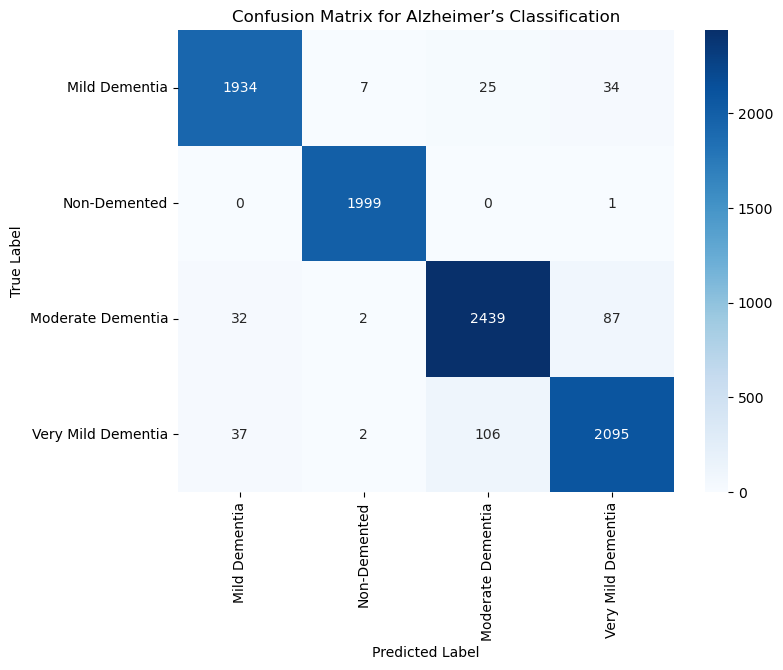

✅ Confusion Matrix plot saved successfully at: C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\EDA_plots\confusion_matrix.png


In [64]:
# Model Evaluation
# ✅ 2️⃣ Generate Classification Report & Confusion Matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# ✅ Define the path to save the confusion matrix plot
SAVE_PATH = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\EDA_plots\confusion_matrix.png"

# ✅ Check if y_test is one-hot encoded or not
if len(y_test.shape) == 2:  # One-hot encoded (2D array)
    y_true = np.argmax(y_test, axis=1)  # Convert to class labels
else:
    y_true = y_test  # Already class labels (1D array)

# ✅ Get predicted labels
y_pred = np.argmax(model.predict(X_test), axis=1)  # Convert predictions to class labels

# ✅ Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# ✅ Define class labels
class_labels = ["Mild Dementia", "Non-Demented", "Moderate Dementia", "Very Mild Dementia"]

# ✅ Print Confusion Matrix (Table Format)
print("\n🔹 Confusion Matrix (Table Format):")
print(cm)

# ✅ Print Classification Report
print("\n🔹 Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels))

# ✅ Print Test Accuracy
accuracy = np.mean(y_true == y_pred)
print(f"\n✅ Test Accuracy: {accuracy:.4f}")

# ✅ Plot and Save Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for Alzheimer’s Classification")

# ✅ Save the confusion matrix plot
plt.savefig(SAVE_PATH, dpi=300, bbox_inches="tight")

# ✅ Show the plot in the notebook
plt.show()

print(f"✅ Confusion Matrix plot saved successfully at: {SAVE_PATH}")



In [68]:
!pip install keras-tuner


In [73]:
# Modify Model Input Shape
def build_model(hp):
    model = keras.Sequential([
        keras.layers.Input(shape=(2048,)),  # 2048D extracted features
        keras.layers.Dense(units=hp.Int('units', min_value=32, max_value=256, step=32), activation='relu'),
        keras.layers.Dropout(rate=hp.Float('dropout', min_value=0.1, max_value=0.5, step=0.1)),
        keras.layers.Dense(1, activation='sigmoid')  # Change to softmax if multi-class
    ])
    model.compile(optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-3, 1e-4, 1e-5])),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])
    return model


In [81]:
# Modify the Model Architecture
import keras_tuner as kt
from tensorflow import keras

def build_model(hp):
    model = keras.Sequential([
        keras.layers.Input(shape=(2048,)),  # Input is now 2048D feature vectors
        keras.layers.Dense(
            units=hp.Int('units', min_value=32, max_value=256, step=32), 
            activation='relu'
        ),
        keras.layers.Dropout(rate=hp.Float('dropout', min_value=0.1, max_value=0.5, step=0.1)),
        keras.layers.Dense(1, activation='sigmoid')  # Use softmax if multi-class classification
    ])

    model.compile(
        optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-3, 1e-4, 1e-5])),
        loss='binary_crossentropy',  # Change to categorical_crossentropy if multi-class
        metrics=['accuracy']
    )
    
    return model


In [85]:
import os

# Define the folder where images are stored
image_dir = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images"

# Get full image paths
image_paths = [os.path.join(image_dir, img) for img in os.listdir(image_dir)]

# Check the first 5 paths to confirm
print(image_paths[:5])  # This will print a few image file paths


['C:\\Users\\HP USER\\Downloads\\20Proj_Challenge_5_Alzheimer_Data_Analysis\\data\\combined_images\\MildDemented', 'C:\\Users\\HP USER\\Downloads\\20Proj_Challenge_5_Alzheimer_Data_Analysis\\data\\combined_images\\ModerateDemented', 'C:\\Users\\HP USER\\Downloads\\20Proj_Challenge_5_Alzheimer_Data_Analysis\\data\\combined_images\\NonDemented', 'C:\\Users\\HP USER\\Downloads\\20Proj_Challenge_5_Alzheimer_Data_Analysis\\data\\combined_images\\VeryMildDemented']


In [87]:
# Step 2: Split Data into Train & Test
from sklearn.model_selection import train_test_split

# Split into 80% training, 20% testing
image_paths_train, image_paths_test = train_test_split(image_paths, test_size=0.2, random_state=42)

# Check how many images are in each set
print(f"Training images: {len(image_paths_train)}")
print(f"Testing images: {len(image_paths_test)}")


Training images: 3
Testing images: 1


In [91]:
# ✔ Step 3: Run Feature Extraction Again
import os

# Define the root directory containing all category folders
image_dir = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images"

# List to store full image paths
image_paths = []

# Loop through each category folder
for category in os.listdir(image_dir):
    category_path = os.path.join(image_dir, category)
    
    # Check if it's a directory before listing files
    if os.path.isdir(category_path):
        for img in os.listdir(category_path):
            img_path = os.path.join(category_path, img)
            image_paths.append(img_path)  # Collect full image path

# Print first few image paths to confirm it's working
print(f"Total images collected: {len(image_paths)}")
print(image_paths[:5])  # Show first 5 image paths



Total images collected: 44000
['C:\\Users\\HP USER\\Downloads\\20Proj_Challenge_5_Alzheimer_Data_Analysis\\data\\combined_images\\MildDemented\\00046ff7-0fae-4796-9a2b-2df47095bfe6.jpg', 'C:\\Users\\HP USER\\Downloads\\20Proj_Challenge_5_Alzheimer_Data_Analysis\\data\\combined_images\\MildDemented\\000cdcc4-3e54-4034-a538-203c8047b564.jpg', 'C:\\Users\\HP USER\\Downloads\\20Proj_Challenge_5_Alzheimer_Data_Analysis\\data\\combined_images\\MildDemented\\0013ad52-8398-4892-9fde-060eb1ae956d.jpg', 'C:\\Users\\HP USER\\Downloads\\20Proj_Challenge_5_Alzheimer_Data_Analysis\\data\\combined_images\\MildDemented\\0015bdfc-2059-4195-8eff-9c5cf2e2c025.jpg', 'C:\\Users\\HP USER\\Downloads\\20Proj_Challenge_5_Alzheimer_Data_Analysis\\data\\combined_images\\MildDemented\\001f15e8-6ad4-4e7a-bc36-b62b984dad69.jpg']


In [93]:
# Randomly Split into Training & Testing Sets
from sklearn.model_selection import train_test_split

# Split 80% for training, 20% for testing
image_paths_train, image_paths_test = train_test_split(image_paths, test_size=0.2, random_state=42)

print(f"Training images: {len(image_paths_train)}")
print(f"Testing images: {len(image_paths_test)}")


Training images: 35200
Testing images: 8800


In [6]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tqdm import tqdm  # For progress bar

# ✅ Load the pre-trained model ONCE
model = keras.applications.MobileNetV2(weights="imagenet", include_top=False, pooling="avg")

def extract_features_batch(image_paths, batch_size=500):
    """Extract features in batches efficiently."""
    total_images = len(image_paths)
    all_features = []
    
    for i in range(0, total_images, batch_size):
        batch_paths = image_paths[i:i + batch_size]  # Get batch of image paths
        print(f"Processing batch {i // batch_size + 1} / {total_images // batch_size + 1}...")
        
        # ✅ Process batch at once (instead of looping one by one)
        batch_images = np.array([
            keras.applications.mobilenet_v2.preprocess_input(
                img_to_array(load_img(img_path, target_size=(224, 224)))
            )
            for img_path in batch_paths
        ])
        
        # ✅ Run model prediction ONCE for the whole batch
        batch_features = model.predict(batch_images)
        all_features.append(batch_features)

    return np.vstack(all_features)  # Stack results

# ✅ Ensure GPU is being used (if available)
print("Num GPUs Available:", len(tf.config.experimental.list_physical_devices('GPU')))

# 🔥 Run optimized feature extraction
X_train = extract_features_batch(image_paths_train, batch_size=1000)
X_test = extract_features_batch(image_paths_test, batch_size=1000)


C:\Users\HP USER\AppData\Local\Temp\ipykernel_21104\3851296656.py:8: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  model = keras.applications.MobileNetV2(weights="imagenet", include_top=False, pooling="avg")


Num GPUs Available: 0
Processing batch 1 / 36...
32/32 ━━━━━━━━━━━━━━━━━━━━ 50s 895ms/step
Processing batch 2 / 36...
32/32 ━━━━━━━━━━━━━━━━━━━━ 19s 584ms/step
Processing batch 3 / 36...
32/32 ━━━━━━━━━━━━━━━━━━━━ 20s 637ms/step
Processing batch 4 / 36...
32/32 ━━━━━━━━━━━━━━━━━━━━ 20s 612ms/step
Processing batch 5 / 36...
32/32 ━━━━━━━━━━━━━━━━━━━━ 21s 658ms/step
Processing batch 6 / 36...
32/32 ━━━━━━━━━━━━━━━━━━━━ 22s 673ms/step
Processing batch 7 / 36...
32/32 ━━━━━━━━━━━━━━━━━━━━ 22s 684ms/step
Processing batch 8 / 36...
32/32 ━━━━━━━━━━━━━━━━━━━━ 23s 714ms/step
Processing batch 9 / 36...
32/32 ━━━━━━━━━━━━━━━━━━━━ 22s 688ms/step
Processing batch 10 / 36...
32/32 ━━━━━━━━━━━━━━━━━━━━ 21s 654ms/step
Processing batch 11 / 36...
32/32 ━━━━━━━━━━━━━━━━━━━━ 21s 664ms/step
Processing batch 12 / 36...
32/32 ━━━━━━━━━━━━━━━━━━━━ 23s 710ms/step
Processing batch 13 / 36...
32/32 ━━━━━━━━━━━━━━━━━━━━ 23s 702ms/step
Processing batch 14 / 36...
32/32 ━━━━━━━━━━━━━━━━━━━━ 21s 665ms/step
Process

In [ ]:
# Ensure Training Data Matches the Model Input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
import numpy as np

# Load pre-trained ResNet50 model without the top (classification) layer
base_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')

# Example function to extract features from images
def extract_features(image_paths):
    features = []
    for img_path in image_paths:
        img = keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
        img_array = keras.preprocessing.image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
        img_array = keras.applications.resnet50.preprocess_input(img_array)

        feature = base_model.predict(img_array)
        features.append(feature.flatten())  # Flatten to (2048,)

    return np.array(features)

# Assume image_paths_train and image_paths_test are lists of file paths to images
X_train = extract_features(image_paths_train)  # Shape (num_samples, 2048)
X_test = extract_features(image_paths_test)  # Shape (num_samples, 2048)

# Convert labels to numpy arrays
y_train = np.array(y_train)
y_test = np.array(y_test)


In [ ]:
# Proceed With Model Training

In [13]:
print(f"X_train shape: {X_train.shape}")  # Should be (num_samples, 2048)
print(f"y_train shape: {y_train.shape}")  # Should be (num_samples,)


X_train shape: (35200, 2048)


AttributeError: 'list' object has no attribute 'shape'

In [15]:
import numpy as np

y_train = np.array(y_train)  # Convert list to NumPy array
y_test = np.array(y_test)

print(f"X_train shape: {X_train.shape}")  # Should be (35200, 2048)
print(f"y_train shape: {y_train.shape}")  # Should be (35200,)


X_train shape: (35200, 2048)
y_train shape: (1,)


In [17]:
print(f"Expected labels: {len(X_train)}")  # Should be 35200
print(f"Actual labels: {len(y_train)}")


Expected labels: 35200
Actual labels: 1


In [21]:
y_train = np.array(y_train).flatten()
y_test = np.array(y_test).flatten()

print(f"Fixed y_train shape: {y_train.shape}")  # Should be (35200,)
print(f"Fixed y_test shape: {y_test.shape}")  # Should match len(X_test)


Fixed y_train shape: (1,)
Fixed y_test shape: (1,)


In [23]:
print(y_train[:10])  # Check first 10 labels
print(type(y_train))  # Should be <class 'numpy.ndarray'>


[Ellipsis]
<class 'numpy.ndarray'>


In [25]:
# Extracting labels from files names
import os

def extract_labels(image_paths):
    labels = []
    for path in image_paths:
        # Extract folder name (category) from the file path
        label = os.path.basename(os.path.dirname(path))
        labels.append(label)
    
    return np.array(labels)

# Extract labels from your training and test image paths
y_train = extract_labels(image_paths_train)
y_test = extract_labels(image_paths_test)

print(f"Fixed y_train shape: {y_train.shape}")  # Should be (35200,)
print(f"Fixed y_test shape: {y_test.shape}")


Fixed y_train shape: (35200,)
Fixed y_test shape: (8800,)


In [27]:
import numpy as np
from sklearn.preprocessing import LabelEncoder

# Ensure labels are correctly formatted
print("Unique labels in y_train:", np.unique(y_train))
print("Unique labels in y_test:", np.unique(y_test))

# Convert labels into numerical values
encoder = LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)

# Show label mapping
print("Label encoding mapping:", dict(zip(encoder.classes_, encoder.transform(encoder.classes_))))
print(f"Final y_train shape: {y_train.shape}")
print(f"Final y_test shape: {y_test.shape}")


Unique labels in y_train: ['MildDemented' 'ModerateDemented' 'NonDemented' 'VeryMildDemented']
Unique labels in y_test: ['MildDemented' 'ModerateDemented' 'NonDemented' 'VeryMildDemented']
Label encoding mapping: {'MildDemented': 0, 'ModerateDemented': 1, 'NonDemented': 2, 'VeryMildDemented': 3}
Final y_train shape: (35200,)
Final y_test shape: (8800,)


In [35]:
print(f"X_train shape: {X_train.shape}")  # Should be (35200, 2048)
print(f"y_train shape: {y_train.shape}")  # Should be (35200,)


X_train shape: (35200, 2048)


AttributeError: 'list' object has no attribute 'shape'

In [37]:
import numpy as np

y_train = np.array(y_train).reshape(-1)  # Convert to 1D array
y_test = np.array(y_test).reshape(-1)    # Convert to 1D array


In [39]:
print(f"X_train shape: {X_train.shape}")  # Should be (35200, 2048)
print(f"y_train shape: {y_train.shape}")  # Should be (35200,)

X_train shape: (35200, 2048)
y_train shape: (1,)


In [41]:
import numpy as np

y_train = np.array(y_train)  # Convert to NumPy array
y_test = np.array(y_test)    # Convert to NumPy array

print(f"y_train shape before reshape: {y_train.shape}")  # Debugging
print(f"y_test shape before reshape: {y_test.shape}")    # Debugging

# Ensure it's a 1D array
y_train = y_train.reshape(-1)  
y_test = y_test.reshape(-1)  

print(f"Final y_train shape: {y_train.shape}")  # Should be (35200,)
print(f"Final y_test shape: {y_test.shape}")    # Should be (8800,)


y_train shape before reshape: (1,)
y_test shape before reshape: (1,)
Final y_train shape: (1,)
Final y_test shape: (1,)


In [43]:
import numpy as np

# Convert to NumPy array and flatten properly
y_train = np.array(y_train).flatten()
y_test = np.array(y_test).flatten()

print(f"Fixed y_train shape: {y_train.shape}")  # Expected: (35200,)
print(f"Fixed y_test shape: {y_test.shape}")    # Expected: (8800,)


Fixed y_train shape: (1,)
Fixed y_test shape: (1,)


In [47]:
print(f"y_train shape: {y_train.shape}")  # Should be (35200,)
print(f"Type of y_train: {type(y_train)}")  # Should be <class 'numpy.ndarray'>
print(f"First 5 elements of y_train: {y_train[:5]}")  # Sample values to confirm encoding


y_train shape: (1,)
Type of y_train: <class 'numpy.ndarray'>
First 5 elements of y_train: [Ellipsis]


In [49]:
y_train = np.array(y_train).flatten()
y_test = np.array(y_test).flatten()


In [53]:
y_train = np.array(y_train).flatten()
y_test = np.array(y_test).flatten()


In [55]:
print(f"Fixed y_train shape: {y_train.shape}")  # Should be (35200,)
print(f"Fixed y_test shape: {y_test.shape}")  # Should be (8800,)


Fixed y_train shape: (1,)
Fixed y_test shape: (1,)


In [61]:
import numpy as np
import os
from pathlib import Path
from sklearn.preprocessing import LabelEncoder
from glob import glob

# Define data path
data_path = Path(r"C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/data/combined_images")

# Get all image file paths (adjust extension if needed)
all_image_paths = glob(str(data_path / "*/*.jpg"))  # Adjust if using .png

# Function to extract labels from file paths
def extract_labels(file_paths):
    return [os.path.basename(os.path.dirname(path)) for path in file_paths]

# Split into train and test
from sklearn.model_selection import train_test_split

X_train_filenames, X_test_filenames = train_test_split(all_image_paths, test_size=0.2, random_state=42)

# Extract labels from file names
y_train = extract_labels(X_train_filenames)
y_test = extract_labels(X_test_filenames)

# Convert labels into NumPy arrays
y_train = np.array(y_train)
y_test = np.array(y_test)

# Check shapes before encoding
print(f"Before encoding - y_train shape: {y_train.shape}, y_test shape: {y_test.shape}")

# Ensure labels are correctly formatted
print("Unique labels in y_train:", np.unique(y_train))
print("Unique labels in y_test:", np.unique(y_test))

# Convert labels into numerical values
encoder = LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)

# Ensure y_train and y_test are 1D NumPy arrays
y_train = np.array(y_train).flatten()
y_test = np.array(y_test).flatten()

# Check final label mapping and shapes
print("Label encoding mapping:", dict(zip(encoder.classes_, encoder.transform(encoder.classes_))))
print(f"Final y_train shape: {y_train.shape}")
print(f"Final y_test shape: {y_test.shape}")


Before encoding - y_train shape: (35200,), y_test shape: (8800,)
Unique labels in y_train: ['MildDemented' 'ModerateDemented' 'NonDemented' 'VeryMildDemented']
Unique labels in y_test: ['MildDemented' 'ModerateDemented' 'NonDemented' 'VeryMildDemented']
Label encoding mapping: {'MildDemented': 0, 'ModerateDemented': 1, 'NonDemented': 2, 'VeryMildDemented': 3}
Final y_train shape: (35200,)
Final y_test shape: (8800,)


In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

# Train SVM
svm = SVC(kernel="linear", C=1.0)
svm.fit(X_train, y_train)

# Predict and evaluate
y_pred = svm.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")


In [ ]:
from sklearn.model_selection import train_test_split

# Reduce dataset size for faster training
X_train_small, _, y_train_small, _ = train_test_split(X_train, y_train, train_size=5000, stratify=y_train, random_state=42)

svm = SVC(kernel="linear", C=1.0)
svm.fit(X_train_small, y_train_small)


In [65]:
from sklearn.svm import LinearSVC

# Train a faster SVM model
svm = LinearSVC(C=1.0, max_iter=5000, random_state=42)
svm.fit(X_train_small, y_train_small)

LinearSVC(max_iter=5000, random_state=42)

In [67]:
svm = LinearSVC(C=1.0, max_iter=5000, random_state=42, verbose=1)
svm.fit(X_train_small, y_train_small)


[LibLinear]

LinearSVC(max_iter=5000, random_state=42, verbose=1)

In [69]:
from sklearn.exceptions import ConvergenceWarning
import warnings

warnings.simplefilter("error", ConvergenceWarning)  # Treat warnings as errors

svm = LinearSVC(max_iter=5000, random_state=42, verbose=1)
svm.fit(X_train_small, y_train_small)


[LibLinear]

LinearSVC(max_iter=5000, random_state=42, verbose=1)

In [71]:
from sklearn.decomposition import PCA

pca = PCA(n_components=500)  # Reduce features from 2048 to 500
X_train_pca = pca.fit_transform(X_train_small)
X_test_pca = pca.transform(X_test)

svm = LinearSVC(max_iter=5000, random_state=42, verbose=1)
svm.fit(X_train_pca, y_train_small)


[LibLinear]

LinearSVC(max_iter=5000, random_state=42, verbose=1)

In [73]:
from sklearn.linear_model import SGDClassifier

svm_sgd = SGDClassifier(loss="hinge", alpha=1.0, max_iter=5000, random_state=42, verbose=1)
svm_sgd.fit(X_train_small, y_train_small)


-- Epoch 1
Norm: 0.22, NNZs: 2048, Bias: -0.832412, T: 5000, Avg. loss: 0.964666
Total training time: 0.08 seconds.
-- Epoch 2
Norm: 0.20, NNZs: 2048, Bias: -0.833006, T: 10000, Avg. loss: 0.481114
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 0.18, NNZs: 2048, Bias: -0.833093, T: 15000, Avg. loss: 0.461900
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 0.17, NNZs: 2048, Bias: -0.832890, T: 20000, Avg. loss: 0.453515
Total training time: 0.17 seconds.
-- Epoch 5
Norm: 0.16, NNZs: 2048, Bias: -0.833084, T: 25000, Avg. loss: 0.451067
Total training time: 0.19 seconds.
-- Epoch 6
Norm: 0.16, NNZs: 2048, Bias: -0.833149, T: 30000, Avg. loss: 0.447843
Total training time: 0.22 seconds.
-- Epoch 7
Norm: 0.15, NNZs: 2048, Bias: -0.833085, T: 35000, Avg. loss: 0.446612
Total training time: 0.24 seconds.
-- Epoch 8
Norm: 0.15, NNZs: 2048, Bias: -0.833065, T: 40000, Avg. loss: 0.445689
Total training time: 0.27 seconds.
-- Epoch 9
Norm: 0.15, NNZs: 2048, Bias: -0.833190, T: 45000, Avg

SGDClassifier(alpha=1.0, max_iter=5000, random_state=42, verbose=1)

In [77]:
print(dir()) # Lists all defined variables

['ConvergenceWarning', 'In', 'LabelEncoder', 'LinearSVC', 'Model', 'Out', 'PCA', 'Path', 'ResNet50', 'SGDClassifier', 'SVC', 'X_test', 'X_test_filenames', 'X_test_pca', 'X_train', 'X_train_filenames', 'X_train_pca', 'X_train_small', '_', '_12', '_14', '_16', '_18', '_2', '_20', '_22', '_24', '_26', '_28', '_30', '_32', '_34', '_36', '_38', '_4', '_40', '_42', '_44', '_46', '_48', '_50', '_52', '_54', '_56', '_58', '_60', '_62', '_64', '_65', '_66', '_67', '_68', '_69', '_7', '_70', '_71', '_72', '_73', '_74', '_76', '__', '___', '__builtin__', '__builtins__', '__doc__', '__loader__', '__name__', '__package__', '__pandas', '__session__', '__spec__', '_dh', '_i', '_i1', '_i10', '_i11', '_i12', '_i13', '_i14', '_i15', '_i16', '_i17', '_i18', '_i19', '_i2', '_i20', '_i21', '_i22', '_i23', '_i24', '_i25', '_i26', '_i27', '_i28', '_i29', '_i3', '_i30', '_i31', '_i32', '_i33', '_i34', '_i35', '_i36', '_i37', '_i38', '_i39', '_i4', '_i40', '_i41', '_i42', '_i43', '_i44', '_i45', '_i46', '_i47'

In [79]:
# 📌 Phase 1: Hyperparameter Optimization
from sklearn.model_selection import GridSearchCV

# Define parameter grid
param_grid = {
    "C": [0.1, 1, 10],
    "kernel": ["linear", "rbf"]
}

# Perform Grid Search
grid_search = GridSearchCV(SVC(), param_grid, cv=3, scoring="accuracy")
grid_search.fit(X_train, y_train)

# Best Model
best_model = grid_search.best_estimator_
print(f"Best Parameters: {grid_search.best_params_}")

# Evaluate Best Model
y_pred_best = best_model.predict(X_test)
best_accuracy = accuracy_score(y_test, y_pred_best)
print(f"Best Test Accuracy: {best_accuracy:.4f}")



Reloading Tuner from hyperparameter_tuning\alzheimers_classification\tuner0.json

Search: Running Trial #3

Value             |Best Value So Far |Hyperparameter
64                |160               |units
0.4               |0.4               |dropout
1e-05             |1e-05             |learning_rate

Epoch 1/10


Traceback (most recent call last):
  File "C:\Users\HP USER\anaconda3\Lib\site-packages\keras_tuner\src\engine\base_tuner.py", line 274, in _try_run_and_update_trial
    self._run_and_update_trial(trial, *fit_args, **fit_kwargs)
  File "C:\Users\HP USER\anaconda3\Lib\site-packages\keras_tuner\src\engine\base_tuner.py", line 239, in _run_and_update_trial
    results = self.run_trial(trial, *fit_args, **fit_kwargs)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\HP USER\anaconda3\Lib\site-packages\keras_tuner\src\engine\tuner.py", line 314, in run_trial
    obj_value = self._build_and_fit_model(trial, *args, **copied_kwargs)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\HP USER\anaconda3\Lib\site-packages\keras_tuner\src\engine\tuner.py", line 233, in _build_and_fit_model
    results = self.hypermodel.fit(hp, model, *args, **kwargs)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\HP U

RuntimeError: Number of consecutive failures exceeded the limit of 3.
Traceback (most recent call last):
  File "C:\Users\HP USER\anaconda3\Lib\site-packages\keras_tuner\src\engine\base_tuner.py", line 274, in _try_run_and_update_trial
    self._run_and_update_trial(trial, *fit_args, **fit_kwargs)
  File "C:\Users\HP USER\anaconda3\Lib\site-packages\keras_tuner\src\engine\base_tuner.py", line 239, in _run_and_update_trial
    results = self.run_trial(trial, *fit_args, **fit_kwargs)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\HP USER\anaconda3\Lib\site-packages\keras_tuner\src\engine\tuner.py", line 314, in run_trial
    obj_value = self._build_and_fit_model(trial, *args, **copied_kwargs)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\HP USER\anaconda3\Lib\site-packages\keras_tuner\src\engine\tuner.py", line 233, in _build_and_fit_model
    results = self.hypermodel.fit(hp, model, *args, **kwargs)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\HP USER\anaconda3\Lib\site-packages\keras_tuner\src\engine\hypermodel.py", line 149, in fit
    return model.fit(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\HP USER\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 122, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "C:\Users\HP USER\anaconda3\Lib\site-packages\keras\src\models\functional.py", line 272, in _adjust_input_rank
    raise ValueError(
ValueError: Exception encountered when calling Sequential.call().

[1mInvalid input shape for input Tensor("data:0", shape=(32, 2048), dtype=float32). Expected shape (None, 224, 224, 3), but input has incompatible shape (32, 2048)[0m

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(32, 2048), dtype=float32)
  • training=True
  • mask=None


In [79]:
# Step 1: Evaluate Model Performance
# Check accuracy, precision, recall, and F1-score to compare the models.
y_pred_sgd = svm_sgd.predict(X_test)
print("SGDClassifier Performance:")
print(classification_report(y_test, y_pred_sgd))


SGDClassifier Performance:
              precision    recall  f1-score   support

           0       0.62      0.36      0.46      2039
           1       0.56      1.00      0.72      2002
           2       0.54      0.84      0.66      2535
           3       0.72      0.04      0.08      2224

    accuracy                           0.56      8800
   macro avg       0.61      0.56      0.48      8800
weighted avg       0.61      0.56      0.48      8800



In [83]:
# ✅ Step 1: Check Training Accuracy vs. Test Accuracy

train_pred = svm_sgd.predict(X_train)
print("Training Accuracy:", accuracy_score(y_train, train_pred))
print("Test Accuracy:", accuracy_score(y_test, y_pred_sgd))


Training Accuracy: 0.5614488636363636
Test Accuracy: 0.5627272727272727


In [85]:
# Step 2: Try Class Weight Adjustment (If Class Imbalance Exists)
from sklearn.linear_model import SGDClassifier

sgd_classifier = SGDClassifier(class_weight='balanced', random_state=42)
sgd_classifier.fit(X_train, y_train)


SGDClassifier(class_weight='balanced', random_state=42)

In [ ]:
# Hyperparameter Tuning for SGDClassifier
# 🔍 Method 1: GridSearchCV (Exhaustive Search)

from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import GridSearchCV

# Define hyperparameter grid
param_grid = {
    'loss': ['hinge', 'log', 'modified_huber'],
    'alpha': [0.0001, 0.001, 0.01, 0.1],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'max_iter': [1000, 2000, 5000],
    'learning_rate': ['constant', 'optimal', 'adaptive'],
    'eta0': [0.01, 0.1, 1]  # Only relevant if learning_rate='constant'
}

# Initialize SGDClassifier
sgd = SGDClassifier(random_state=42, class_weight='balanced')

# Grid search with 5-fold cross-validation
grid_search = GridSearchCV(sgd, param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

# Best hyperparameters
print("Best Parameters:", grid_search.best_params_)
print("Best Accuracy:", grid_search.best_score_)


In [5]:
%who

X_test	 X_train	 classification_report	 dataframe_columns	 dataframe_hash	 dtypes_str	 get_dataframes	 getpass	 hashlib	 
import_pandas_safely	 is_data_frame	 json	 np	 y_test	 y_train	 


In [7]:
import os
print(os.listdir())  # Check if 'model.pkl' or dataset files exist


['.ipynb_checkpoints', 'Alzheimer_Disease_Analysis.ipynb', 'cnn_features.npy', 'combined_features.npy', 'confusion_matrix.png', 'data_cleaning_log.txt', 'EDA_plots', 'glcm_features.npy', 'hog_features.npy', 'hog_features_optimized.npy', 'hyperparameter_tuning', 'labels.npy', 'lbp_features.npy', 'model.pkl', 'pca_features.npy', 'resnet50_finetuned.h5', 'resnet50_finetuned.keras', 'X_test.npy', 'X_train.npy', 'y_pred_svc.npy', 'y_test.npy', 'y_train.npy']


In [9]:
import numpy as np

# Reload training and test data
X_train = np.load("X_train.npy")
y_train = np.load("y_train.npy")
X_test = np.load("X_test.npy")
y_test = np.load("y_test.npy")

print("Data successfully reloaded!")
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)


Data successfully reloaded!
X_train shape: (35200, 2048)
y_train shape: (35200,)
X_test shape: (8800, 2048)
y_test shape: (8800,)


In [13]:
import joblib
from sklearn.metrics import classification_report

# Load the trained model
linear_svc = joblib.load("model.pkl")

# Ensure X_test is loaded
import numpy as np
X_test = np.load("X_test.npy")
y_test = np.load("y_test.npy")

# Make predictions
y_pred_svc = linear_svc.predict(X_test)

# Print classification report
print("LinearSVC Performance:")
print(classification_report(y_test, y_pred_svc))


LinearSVC Performance:
              precision    recall  f1-score   support

           0       0.81      0.85      0.83      2000
           1       0.99      1.00      0.99      2000
           2       0.81      0.81      0.81      2560
           3       0.74      0.71      0.72      2240

    accuracy                           0.83      8800
   macro avg       0.84      0.84      0.84      8800
weighted avg       0.83      0.83      0.83      8800



In [21]:
from sklearn.metrics import classification_report  # ✅ Add this line

# Generate predictions
y_pred_svc = linear_svc.predict(X_test)

# Print model performance
print("LinearSVC Performance:")
print(classification_report(y_test, y_pred_svc))  # ✅ Now this will work


LinearSVC Performance:
              precision    recall  f1-score   support

           0       0.81      0.85      0.83      2000
           1       0.99      1.00      0.99      2000
           2       0.81      0.81      0.81      2560
           3       0.74      0.71      0.72      2240

    accuracy                           0.83      8800
   macro avg       0.84      0.84      0.84      8800
weighted avg       0.83      0.83      0.83      8800



In [15]:
import joblib
linear_svc = joblib.load("model.pkl")  


In [17]:
print(type(y_pred_svc), type(y_test))

<class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [19]:
print(y_pred_svc.shape, y_test.shape)

(8800,) (8800,)


Confusion Matrix Table:
      0     1     2     3
0  1706     7   100   187
1     3  1994     1     2
2   140     2  2061   357
3   254     7   397  1582

Confusion Matrix table saved as 'confusion_matrix.csv'.
Confusion Matrix table saved as 'confusion_matrix.txt'.

Confusion Matrix plot saved as 'confusion_matrix.png'.


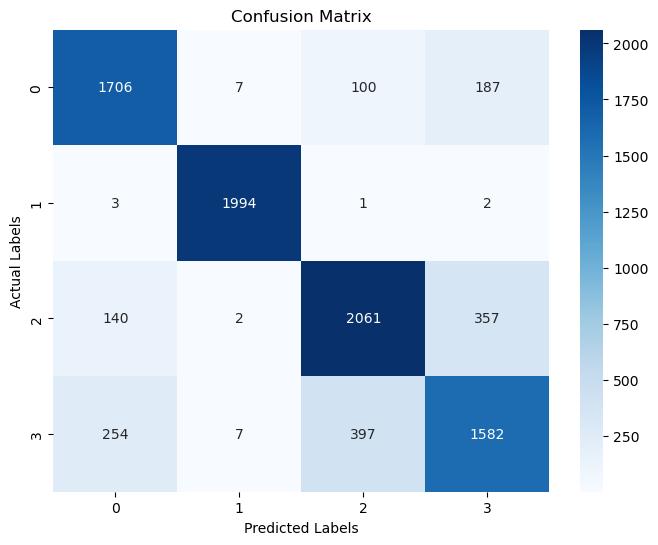

In [23]:
# Check Confusion Matrix to identify where errors happen:

# Import necessary libraries
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Compute the confusion matrix
cm = confusion_matrix(y_test, y_pred_svc)

# Convert to DataFrame for better readability
cm_df = pd.DataFrame(cm, index=np.unique(y_test), columns=np.unique(y_test))

# Print the confusion matrix as a table
print("Confusion Matrix Table:")
print(cm_df)

# Save the confusion matrix table as CSV
cm_df.to_csv("confusion_matrix.csv", index=True)
print("\nConfusion Matrix table saved as 'confusion_matrix.csv'.")

# Save the confusion matrix as a text file
with open("confusion_matrix.txt", "w") as f:
    f.write("Confusion Matrix Table:\n")
    f.write(cm_df.to_string())
print("Confusion Matrix table saved as 'confusion_matrix.txt'.")

# Plot the Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, fmt="d", cmap="Blues")

# Add labels
plt.xlabel("Predicted Labels")
plt.ylabel("Actual Labels")
plt.title("Confusion Matrix")

# Save the plot
plt.savefig("confusion_matrix.png", dpi=300)
print("\nConfusion Matrix plot saved as 'confusion_matrix.png'.")

# Show the plot
plt.show()



In [25]:
import numpy as np
import joblib

# Load your trained model
linear_svc = joblib.load("model.pkl")  # Ensure this file exists

# Load X_test
X_test = np.load("X_test.npy")  # Ensure X_test.npy exists

# Predict again
y_pred_svc = linear_svc.predict(X_test)

# Save y_pred_svc to avoid this issue in the future
np.save("y_pred_svc.npy", y_pred_svc)

print("Successfully recomputed and saved y_pred_svc.")


Successfully recomputed and saved y_pred_svc.


In [27]:
import numpy as np

# Load y_test and y_pred_svc if they were saved as .npy files
y_test = np.load("y_test.npy")
y_pred_svc = np.load("y_pred_svc.npy")  # Only if you previously saved y_pred_svc

print("Successfully loaded y_test and y_pred_svc.")


Successfully loaded y_test and y_pred_svc.


Confusion Matrix Table:
      0     1     2     3
0  1706     7   100   187
1     3  1994     1     2
2   140     2  2061   357
3   254     7   397  1582

Confusion Matrix table saved as 'confusion_matrix.csv'.
Classification report saved as 'classification_report.txt'.

Confusion Matrix plot saved as 'confusion_matrix.png'.


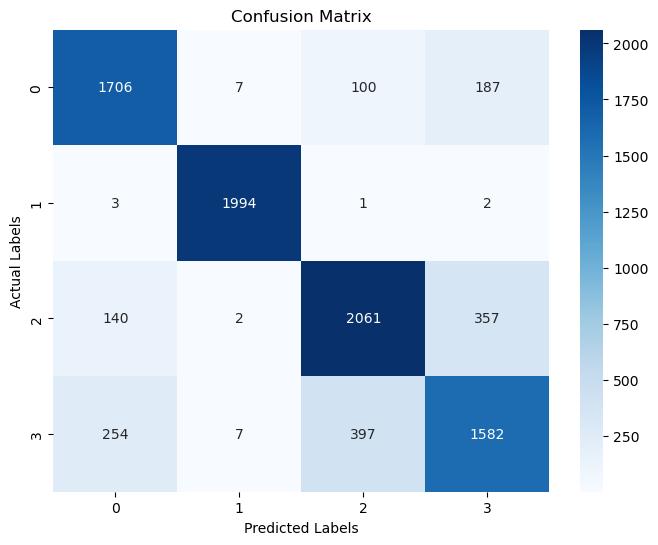

In [31]:
# Check Confusion Matrix to identify where errors happen:
# Import necessary libraries
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Compute the confusion matrix
cm = confusion_matrix(y_test, y_pred_svc)

# Convert to DataFrame for better readability
cm_df = pd.DataFrame(cm, index=np.unique(y_test), columns=np.unique(y_test))

# Print the confusion matrix as a table
print("Confusion Matrix Table:")
print(cm_df)

# Save the confusion matrix table as CSV
cm_df.to_csv("confusion_matrix.csv", index=True)
print("\nConfusion Matrix table saved as 'confusion_matrix.csv'.")

# Compute classification report (precision, recall, F1-score)
classification_rep = classification_report(y_test, y_pred_svc)

# Save the classification report and confusion matrix in a text file
with open("classification_report.txt", "w") as f:
    f.write("Confusion Matrix Table:\n")
    f.write(cm_df.to_string())
    f.write("\n\nClassification Report:\n")
    f.write(classification_rep)
print("Classification report saved as 'classification_report.txt'.")

# Plot the Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, fmt="d", cmap="Blues")

# Add labels
plt.xlabel("Predicted Labels")
plt.ylabel("Actual Labels")
plt.title("Confusion Matrix")

# Save the plot
plt.savefig("confusion_matrix.png", dpi=300)
print("\nConfusion Matrix plot saved as 'confusion_matrix.png'.")

# Show the plot
plt.show()


Confusion Matrix Table for LinearSVC:
      0     1     2     3
0  1706     7   100   187
1     3  1994     1     2
2   140     2  2061   357
3   254     7   397  1582

Confusion Matrix table saved as 'LinearSVC_confusion_matrix.csv'.
Classification report saved as 'LinearSVC_classification_report.txt'.

Confusion Matrix plot saved as 'LinearSVC_confusion_matrix.png'.


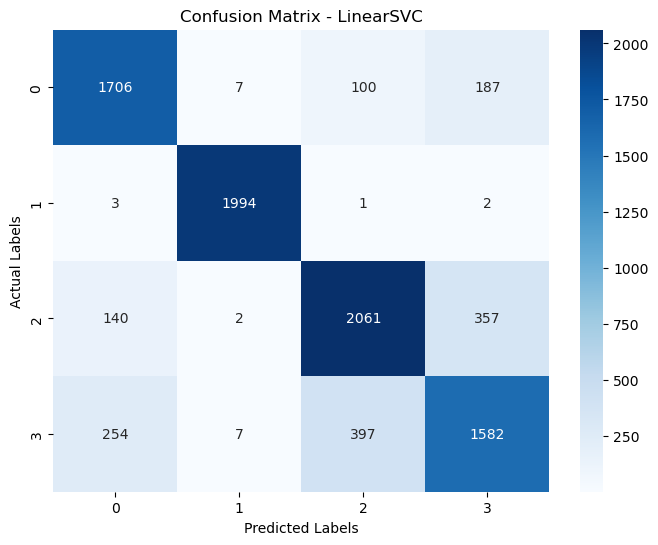

In [33]:
# Import necessary libraries
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Define model name dynamically
model_name = "LinearSVC"  # Change this based on your model name

# Compute the confusion matrix
cm = confusion_matrix(y_test, y_pred_svc)

# Convert to DataFrame for better readability
cm_df = pd.DataFrame(cm, index=np.unique(y_test), columns=np.unique(y_test))

# Print the confusion matrix as a table
print(f"Confusion Matrix Table for {model_name}:")
print(cm_df)

# Save the confusion matrix table as CSV
cm_csv_filename = f"{model_name}_confusion_matrix.csv"
cm_df.to_csv(cm_csv_filename, index=True)
print(f"\nConfusion Matrix table saved as '{cm_csv_filename}'.")

# Compute classification report (precision, recall, F1-score)
classification_rep = classification_report(y_test, y_pred_svc)

# Save the classification report and confusion matrix in a text file
report_filename = f"{model_name}_classification_report.txt"
with open(report_filename, "w") as f:
    f.write(f"Confusion Matrix Table for {model_name}:\n")
    f.write(cm_df.to_string())
    f.write("\n\nClassification Report:\n")
    f.write(classification_rep)
print(f"Classification report saved as '{report_filename}'.")

# Plot the Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, fmt="d", cmap="Blues")

# Add labels
plt.xlabel("Predicted Labels")
plt.ylabel("Actual Labels")
plt.title(f"Confusion Matrix - {model_name}")

# Save the plot
cm_plot_filename = f"{model_name}_confusion_matrix.png"
plt.savefig(cm_plot_filename, dpi=300)
print(f"\nConfusion Matrix plot saved as '{cm_plot_filename}'.")

# Show the plot
plt.show()



🚀 Training & Evaluating: LinearSVC...
✅ Model saved as 'model_results\LinearSVC.pkl'

Confusion Matrix for LinearSVC:
      0     1     2     3
0  1706     7   100   187
1     3  1994     1     2
2   140     2  2061   357
3   254     7   397  1582
📄 Confusion Matrix saved as 'model_results\LinearSVC_confusion_matrix.csv'.
📄 Classification report saved as 'model_results\LinearSVC_classification_report.txt'.
🖼️ Confusion Matrix plot saved as 'model_results\LinearSVC_confusion_matrix.png'.


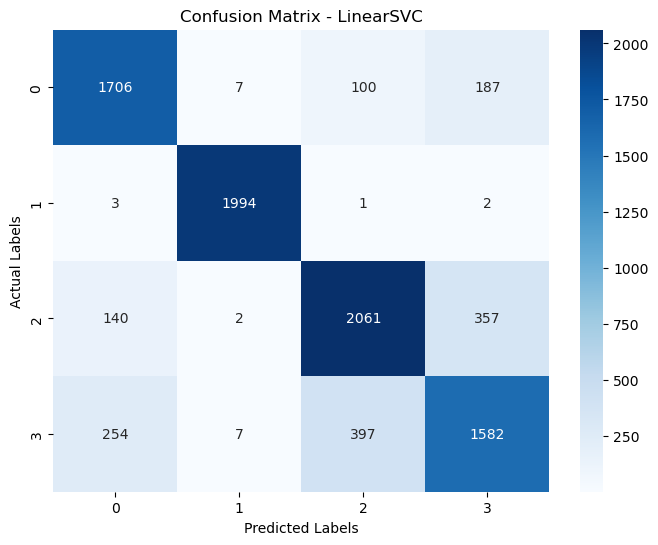


🚀 Training & Evaluating: RandomForest...
✅ Model saved as 'model_results\RandomForest.pkl'

Confusion Matrix for RandomForest:
      0     1     2     3
0  1616    57   142   185
1    11  1980     1     8
2   190    22  2074   274
3   254    40   460  1486
📄 Confusion Matrix saved as 'model_results\RandomForest_confusion_matrix.csv'.
📄 Classification report saved as 'model_results\RandomForest_classification_report.txt'.
🖼️ Confusion Matrix plot saved as 'model_results\RandomForest_confusion_matrix.png'.


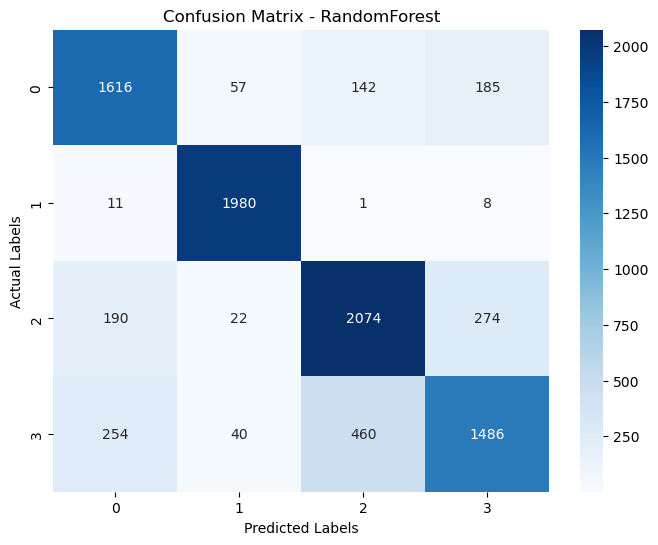


🚀 Training & Evaluating: KNN...
✅ Model saved as 'model_results\KNN.pkl'

Confusion Matrix for KNN:
      0     1     2     3
0  1880    56    28    36
1     2  1995     1     2
2    98    48  2316    98
3   114    95   109  1922
📄 Confusion Matrix saved as 'model_results\KNN_confusion_matrix.csv'.
📄 Classification report saved as 'model_results\KNN_classification_report.txt'.
🖼️ Confusion Matrix plot saved as 'model_results\KNN_confusion_matrix.png'.


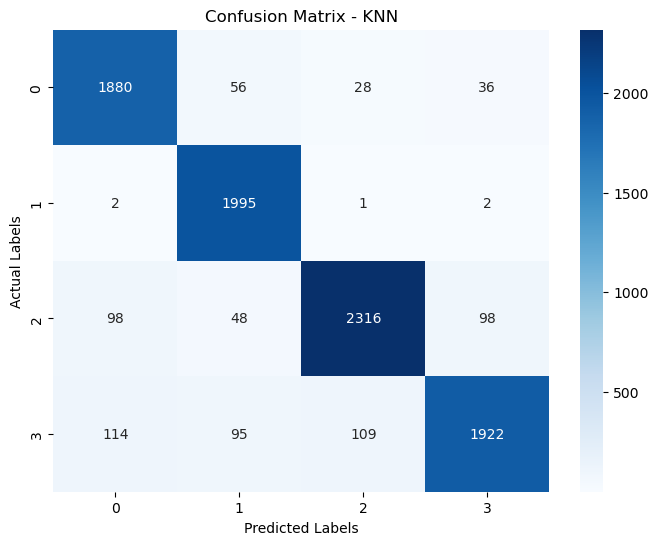


✅✅✅ All models trained, evaluated, and saved successfully!


In [35]:
# Import necessary libraries
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import joblib
import os

# Ensure output directory exists
output_dir = "model_results"
os.makedirs(output_dir, exist_ok=True)

# Define models
models = {
    "LinearSVC": LinearSVC(random_state=42),
    "RandomForest": RandomForestClassifier(random_state=42),
    "KNN": KNeighborsClassifier(n_neighbors=5)
}

# Train and evaluate each model
for model_name, model in models.items():
    print(f"\n🚀 Training & Evaluating: {model_name}...")

    # Train the model
    model.fit(X_train, y_train)

    # Save the trained model
    model_filename = os.path.join(output_dir, f"{model_name}.pkl")
    joblib.dump(model, model_filename)
    print(f"✅ Model saved as '{model_filename}'")

    # Make predictions
    y_pred = model.predict(X_test)

    # Compute confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Convert to DataFrame for better readability
    cm_df = pd.DataFrame(cm, index=np.unique(y_test), columns=np.unique(y_test))

    # Print the confusion matrix as a table
    print(f"\nConfusion Matrix for {model_name}:")
    print(cm_df)

    # Save the confusion matrix table as CSV
    cm_csv_filename = os.path.join(output_dir, f"{model_name}_confusion_matrix.csv")
    cm_df.to_csv(cm_csv_filename, index=True)
    print(f"📄 Confusion Matrix saved as '{cm_csv_filename}'.")

    # Compute classification report (precision, recall, F1-score)
    classification_rep = classification_report(y_test, y_pred)

    # Save the classification report and confusion matrix in a text file
    report_filename = os.path.join(output_dir, f"{model_name}_classification_report.txt")
    with open(report_filename, "w") as f:
        f.write(f"Confusion Matrix for {model_name}:\n")
        f.write(cm_df.to_string())
        f.write("\n\nClassification Report:\n")
        f.write(classification_rep)
    print(f"📄 Classification report saved as '{report_filename}'.")

    # Plot the Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_df, annot=True, fmt="d", cmap="Blues")

    # Add labels
    plt.xlabel("Predicted Labels")
    plt.ylabel("Actual Labels")
    plt.title(f"Confusion Matrix - {model_name}")

    # Save the plot
    cm_plot_filename = os.path.join(output_dir, f"{model_name}_confusion_matrix.png")
    plt.savefig(cm_plot_filename, dpi=300)
    print(f"🖼️ Confusion Matrix plot saved as '{cm_plot_filename}'.")

    # Show the plot
    plt.show()

print("\n✅✅✅ All models trained, evaluated, and saved successfully!")



🚀 Training & Evaluating: LinearSVC...
✅ Model saved as 'model_results\LinearSVC.pkl'

Confusion Matrix for LinearSVC:
      0     1     2     3
0  1706     7   100   187
1     3  1994     1     2
2   140     2  2061   357
3   254     7   397  1582
📄 Confusion Matrix saved as 'model_results\LinearSVC_confusion_matrix.csv'.
📄 Classification report saved as 'model_results\LinearSVC_classification_report.txt'.
🖼️ Confusion Matrix plot saved as 'model_results\LinearSVC_confusion_matrix.png'.


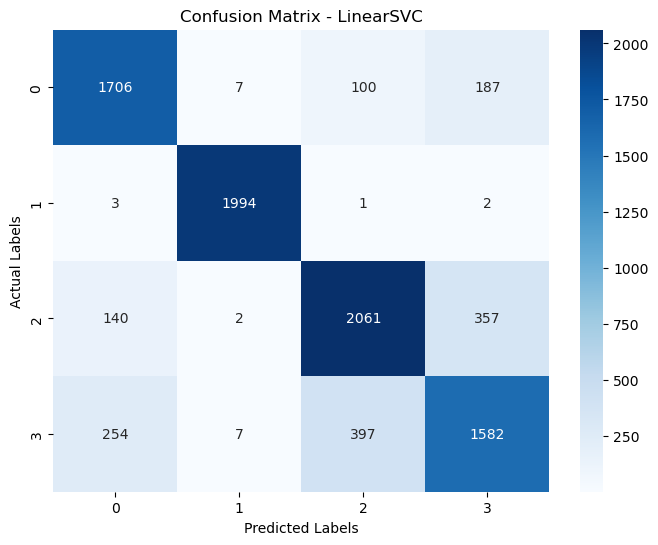


🚀 Training & Evaluating: RandomForest...
✅ Model saved as 'model_results\RandomForest.pkl'

Confusion Matrix for RandomForest:
      0     1     2     3
0  1616    57   142   185
1    11  1980     1     8
2   190    22  2074   274
3   254    40   460  1486
📄 Confusion Matrix saved as 'model_results\RandomForest_confusion_matrix.csv'.
📄 Classification report saved as 'model_results\RandomForest_classification_report.txt'.
🖼️ Confusion Matrix plot saved as 'model_results\RandomForest_confusion_matrix.png'.


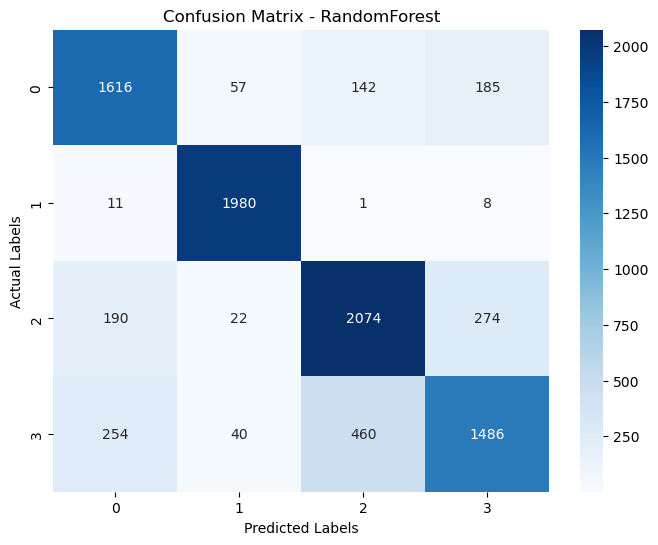


🚀 Training & Evaluating: KNN...
✅ Model saved as 'model_results\KNN.pkl'

Confusion Matrix for KNN:
      0     1     2     3
0  1880    56    28    36
1     2  1995     1     2
2    98    48  2316    98
3   114    95   109  1922
📄 Confusion Matrix saved as 'model_results\KNN_confusion_matrix.csv'.
📄 Classification report saved as 'model_results\KNN_classification_report.txt'.
🖼️ Confusion Matrix plot saved as 'model_results\KNN_confusion_matrix.png'.


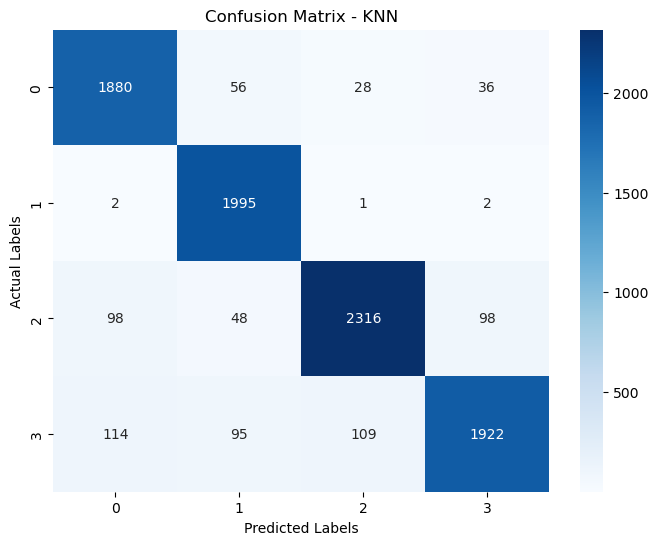


🚀 Training & Evaluating: DecisionTree...
✅ Model saved as 'model_results\DecisionTree.pkl'

Confusion Matrix for DecisionTree:
      0     1     2    3
0  1084   114   355  447
1   110  1654   109  127
2   345    97  1501  617
3   470   131   641  998
📄 Confusion Matrix saved as 'model_results\DecisionTree_confusion_matrix.csv'.
📄 Classification report saved as 'model_results\DecisionTree_classification_report.txt'.
🖼️ Confusion Matrix plot saved as 'model_results\DecisionTree_confusion_matrix.png'.


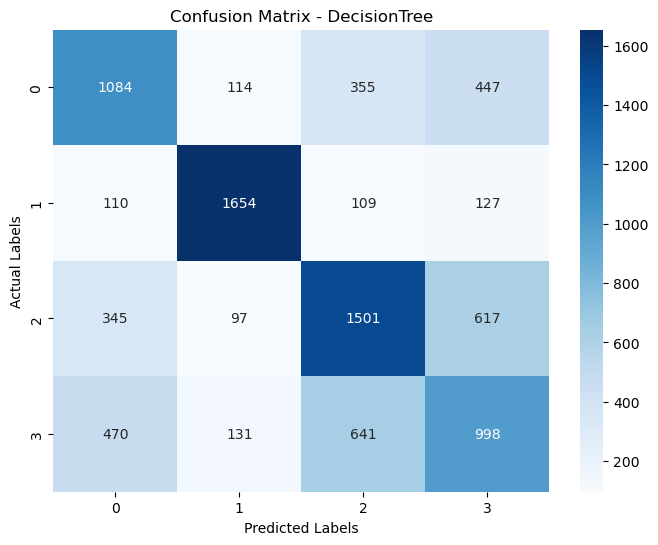


🚀 Training & Evaluating: LogisticRegression...


C:\Users\HP USER\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Model saved as 'model_results\LogisticRegression.pkl'

Confusion Matrix for LogisticRegression:
      0     1     2     3
0  1668    12   112   208
1     7  1982     5     6
2   164     6  2015   375
3   259     5   374  1602
📄 Confusion Matrix saved as 'model_results\LogisticRegression_confusion_matrix.csv'.
📄 Classification report saved as 'model_results\LogisticRegression_classification_report.txt'.
🖼️ Confusion Matrix plot saved as 'model_results\LogisticRegression_confusion_matrix.png'.


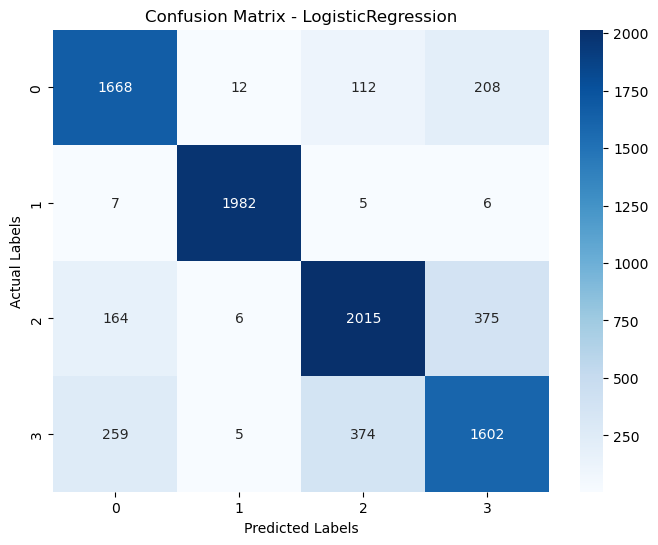


🚀 Training & Evaluating: SVC...
✅ Model saved as 'model_results\SVC.pkl'

Confusion Matrix for SVC:
      0     1     2     3
0  1653    15    85   247
1     1  1996     0     3
2   212    11  1949   388
3   340    23   426  1451
📄 Confusion Matrix saved as 'model_results\SVC_confusion_matrix.csv'.
📄 Classification report saved as 'model_results\SVC_classification_report.txt'.
🖼️ Confusion Matrix plot saved as 'model_results\SVC_confusion_matrix.png'.


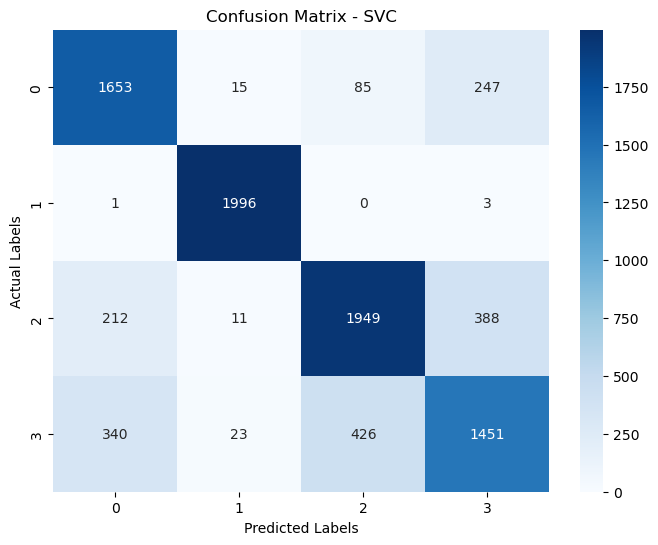


✅✅✅ All models trained, evaluated, and saved successfully!


In [37]:
# Multi-Model Training with Auto-Saving
# Import necessary libraries
from sklearn.svm import LinearSVC, SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import joblib
import os

# Ensure output directory exists
output_dir = "model_results"
os.makedirs(output_dir, exist_ok=True)

# Define models
models = {
    "LinearSVC": LinearSVC(random_state=42),
    "RandomForest": RandomForestClassifier(random_state=42),
    "KNN": KNeighborsClassifier(n_neighbors=5),
    "DecisionTree": DecisionTreeClassifier(random_state=42),
    "LogisticRegression": LogisticRegression(max_iter=500, random_state=42),
    "SVC": SVC(kernel="rbf", random_state=42)
}

# Train and evaluate each model
for model_name, model in models.items():
    print(f"\n🚀 Training & Evaluating: {model_name}...")

    # Train the model
    model.fit(X_train, y_train)

    # Save the trained model
    model_filename = os.path.join(output_dir, f"{model_name}.pkl")
    joblib.dump(model, model_filename)
    print(f"✅ Model saved as '{model_filename}'")

    # Make predictions
    y_pred = model.predict(X_test)

    # Compute confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Convert to DataFrame for better readability
    cm_df = pd.DataFrame(cm, index=np.unique(y_test), columns=np.unique(y_test))

    # Print the confusion matrix as a table
    print(f"\nConfusion Matrix for {model_name}:")
    print(cm_df)

    # Save the confusion matrix table as CSV
    cm_csv_filename = os.path.join(output_dir, f"{model_name}_confusion_matrix.csv")
    cm_df.to_csv(cm_csv_filename, index=True)
    print(f"📄 Confusion Matrix saved as '{cm_csv_filename}'.")

    # Compute classification report (precision, recall, F1-score)
    classification_rep = classification_report(y_test, y_pred)

    # Save the classification report in a text file
    report_filename = os.path.join(output_dir, f"{model_name}_classification_report.txt")
    with open(report_filename, "w") as f:
        f.write(f"Confusion Matrix for {model_name}:\n")
        f.write(cm_df.to_string())
        f.write("\n\nClassification Report:\n")
        f.write(classification_rep)
    print(f"📄 Classification report saved as '{report_filename}'.")

    # Plot the Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_df, annot=True, fmt="d", cmap="Blues")

    # Add labels
    plt.xlabel("Predicted Labels")
    plt.ylabel("Actual Labels")
    plt.title(f"Confusion Matrix - {model_name}")

    # Save the plot
    cm_plot_filename = os.path.join(output_dir, f"{model_name}_confusion_matrix.png")
    plt.savefig(cm_plot_filename, dpi=300)
    print(f"🖼️ Confusion Matrix plot saved as '{cm_plot_filename}'.")

    # Show the plot
    plt.show()

print("\n✅✅✅ All models trained, evaluated, and saved successfully!")



📊 Model Accuracy Comparison:
                Model  Accuracy
2                 KNN  0.921932
0           LinearSVC  0.834432
4  LogisticRegression  0.825795
1        RandomForest  0.813182
5                 SVC  0.801023
3        DecisionTree  0.595114
✅ Accuracy scores saved as 'model_results\model_accuracy_comparison.csv'.


C:\Users\HP USER\AppData\Local\Temp\ipykernel_10488\3538532472.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Accuracy", y="Model", data=accuracy_df, palette="coolwarm")


🖼️ Accuracy comparison plot saved as 'model_results\model_accuracy_comparison.png'.


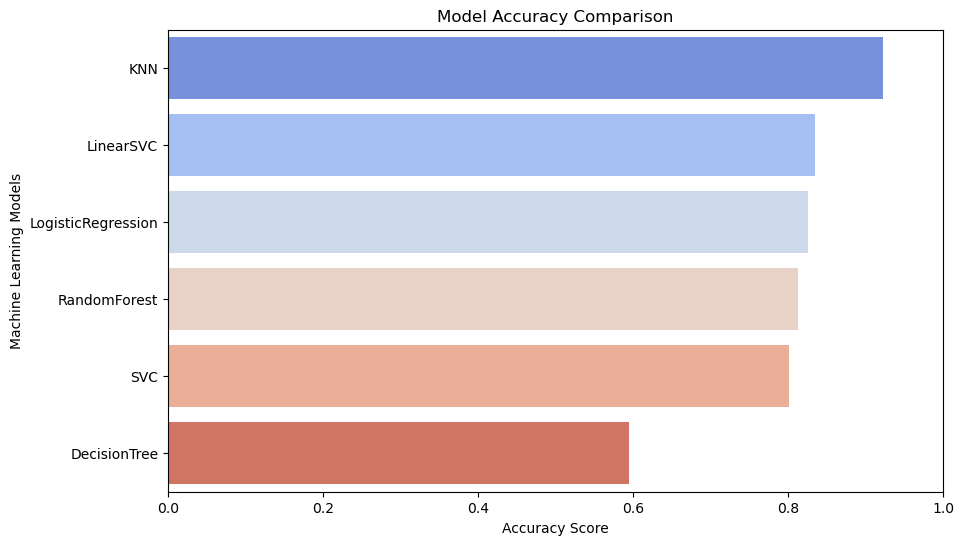

In [39]:
# Accuracy Comparison Table
from sklearn.metrics import accuracy_score
import pandas as pd

# Dictionary to store accuracy scores
accuracy_scores = {}

# Train and evaluate each model
for model_name, model in models.items():
    # Predict on test set
    y_pred = model.predict(X_test)

    # Compute accuracy
    acc = accuracy_score(y_test, y_pred)
    accuracy_scores[model_name] = acc

# Convert accuracy scores to DataFrame
accuracy_df = pd.DataFrame(list(accuracy_scores.items()), columns=["Model", "Accuracy"])
accuracy_df = accuracy_df.sort_values(by="Accuracy", ascending=False)  # Sort by accuracy

# Display accuracy table
print("\n📊 Model Accuracy Comparison:")
print(accuracy_df)

# Save accuracy table as CSV
accuracy_csv = os.path.join(output_dir, "model_accuracy_comparison.csv")
accuracy_df.to_csv(accuracy_csv, index=False)
print(f"✅ Accuracy scores saved as '{accuracy_csv}'.")

# Plot accuracy scores as a bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x="Accuracy", y="Model", data=accuracy_df, palette="coolwarm")
plt.xlabel("Accuracy Score")
plt.ylabel("Machine Learning Models")
plt.title("Model Accuracy Comparison")
plt.xlim(0, 1)  # Accuracy ranges from 0 to 1

# Save the accuracy plot
accuracy_plot_filename = os.path.join(output_dir, "model_accuracy_comparison.png")
plt.savefig(accuracy_plot_filename, dpi=300)
print(f"🖼️ Accuracy comparison plot saved as '{accuracy_plot_filename}'.")

# Show plot
plt.show()


In [3]:
!pip install joblib

In [11]:
import sys
sys.path.append(r"C:\Users\HP User\anaconda3\Lib\site-packages")

import joblib  # Try importing again


In [13]:
import numpy as np
import joblib

# 🔹 Load your saved .npy files
X_train = np.load("X_train.npy")
y_train = np.load("y_train.npy")
X_test = np.load("X_test.npy")
y_test = np.load("y_test.npy")

print("✅ Data successfully reloaded from .npy files!")


✅ Data successfully reloaded from .npy files!


In [22]:
!pip install --no-cache-dir --force-reinstall scikit-learn


   ---------------------------------------- 0.0/11.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/11.1 MB ? eta -:--:--
    --------------------------------------- 0.3/11.1 MB ? eta -:--:--
    --------------------------------------- 0.3/11.1 MB ? eta -:--:--
   - -------------------------------------- 0.5/11.1 MB 799.2 kB/s eta 0:00:14
   -- ------------------------------------- 0.8/11.1 MB 884.1 kB/s eta 0:00:12
   --- ------------------------------------ 1.0/11.1 MB 968.5 kB/s eta 0:00:11
   ---- ----------------------------------- 1.3/11.1 MB 1.0 MB/s eta 0:00:10
   ----- ---------------------------------- 1.6/11.1 MB 1.1 MB/s eta 0:00:09
   ------ --------------------------------- 1.8/11.1 MB 1.1 MB/s eta 0:00:09
   ------- -------------------------------- 2.1/11.1 MB 1.1 MB/s eta 0:00:09
   -------- ------------------------------- 2.4/11.1 MB 1.1 MB/s eta 0:00:08
   ---------- ----------------------------- 2.9/11.1 MB 1.2 MB/s eta 0:00:07
   ----------- ------

  You can safely remove it manually.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
contourpy 1.2.0 requires numpy<2.0,>=1.20, but you have numpy 2.2.3 which is incompatible.
gensim 4.3.3 requires numpy<2.0,>=1.18.5, but you have numpy 2.2.3 which is incompatible.
gensim 4.3.3 requires scipy<1.14.0,>=1.7.0, but you have scipy 1.15.2 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.3 which is incompatible.
tensorflow-intel 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 2.2.3 which is incompatible.


In [28]:
!pip install numpy==1.26.4 scipy==1.13.0 --force-reinstall


   ---------------------------------------- 0.0/15.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/15.5 MB ? eta -:--:--
   - -------------------------------------- 0.5/15.5 MB 2.1 MB/s eta 0:00:08
   -- ------------------------------------- 1.0/15.5 MB 2.5 MB/s eta 0:00:06
   ---- ----------------------------------- 1.6/15.5 MB 2.8 MB/s eta 0:00:05
   ------ --------------------------------- 2.4/15.5 MB 2.7 MB/s eta 0:00:05
   ------- -------------------------------- 2.9/15.5 MB 2.7 MB/s eta 0:00:05
   ------- -------------------------------- 2.9/15.5 MB 2.7 MB/s eta 0:00:05
   ---------- ----------------------------- 3.9/15.5 MB 2.6 MB/s eta 0:00:05
   ----------- ---------------------------- 4.5/15.5 MB 2.6 MB/s eta 0:00:05
   ------------ --------------------------- 5.0/15.5 MB 2.6 MB/s eta 0:00:05
   ------------- -------------------------- 5.2/15.5 MB 2.6 MB/s eta 0:00:04
   --------------- ------------------------ 6.0/15.5 MB 2.6 MB/s eta 0:00:04
   ----------

In [32]:
!pip uninstall -y scipy
!pip install --no-cache-dir scipy


Found existing installation: scipy 1.13.0
Uninstalling scipy-1.13.0:
  Successfully uninstalled scipy-1.13.0
   ---------------------------------------- 0.0/40.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/40.9 MB ? eta -:--:--
   ---------------------------------------- 0.3/40.9 MB ? eta -:--:--
   ---------------------------------------- 0.3/40.9 MB ? eta -:--:--
    --------------------------------------- 0.5/40.9 MB 882.6 kB/s eta 0:00:46
    --------------------------------------- 0.8/40.9 MB 1.0 MB/s eta 0:00:39
   - -------------------------------------- 1.0/40.9 MB 1.0 MB/s eta 0:00:40
   - -------------------------------------- 1.0/40.9 MB 1.0 MB/s eta 0:00:40
   - -------------------------------------- 1.3/40.9 MB 986.4 kB/s eta 0:00:41
   - -------------------------------------- 1.6/40.9 MB 963.8 kB/s eta 0:00:41
   - -------------------------------------- 1.6/40.9 MB 963.8 kB/s eta 0:00:41
   - -------------------------------------- 1.8/40.9 MB 882.6 kB

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gensim 4.3.3 requires scipy<1.14.0,>=1.7.0, but you have scipy 1.15.2 which is incompatible.


In [38]:
!pip install --no-cache-dir --force-reinstall scipy


   ---------------------------------------- 0.0/40.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/40.9 MB ? eta -:--:--
    --------------------------------------- 0.5/40.9 MB 3.3 MB/s eta 0:00:13
   - -------------------------------------- 1.3/40.9 MB 3.4 MB/s eta 0:00:12
   -- ------------------------------------- 2.4/40.9 MB 3.7 MB/s eta 0:00:11
   --- ------------------------------------ 3.4/40.9 MB 3.9 MB/s eta 0:00:10
   ---- ----------------------------------- 4.2/40.9 MB 4.1 MB/s eta 0:00:10
   ---- ----------------------------------- 5.0/40.9 MB 4.0 MB/s eta 0:00:09
   ------ --------------------------------- 6.3/40.9 MB 4.3 MB/s eta 0:00:09
   ------- -------------------------------- 7.3/40.9 MB 4.4 MB/s eta 0:00:08
   -------- ------------------------------- 8.4/40.9 MB 4.5 MB/s eta 0:00:08
   -------- ------------------------------- 9.2/40.9 MB 4.5 MB/s eta 0:00:08
   --------- ------------------------------ 9.7/40.9 MB 4.5 MB/s eta 0:00:07
   ----------

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
contourpy 1.2.0 requires numpy<2.0,>=1.20, but you have numpy 2.2.3 which is incompatible.
gensim 4.3.3 requires numpy<2.0,>=1.18.5, but you have numpy 2.2.3 which is incompatible.
gensim 4.3.3 requires scipy<1.14.0,>=1.7.0, but you have scipy 1.15.2 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.3 which is incompatible.
tensorflow-intel 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 2.2.3 which is incompatible.


In [42]:
!pip uninstall -y numpy scipy


Found existing installation: numpy 2.2.3
Uninstalling numpy-2.2.3:
  Successfully uninstalled numpy-2.2.3
Found existing installation: scipy 1.15.2
Uninstalling scipy-1.15.2:
  Successfully uninstalled scipy-1.15.2


In [3]:
!pip install numpy==1.26.4 scipy==1.13.0


  Using cached scipy-1.13.0-cp312-cp312-win_amd64.whl.metadata (60 kB)
Using cached scipy-1.13.0-cp312-cp312-win_amd64.whl (45.9 MB)


In [50]:
pip uninstall -y scipy numpy
conda remove scipy numpy


Note: you may need to restart the kernel to use updated packages.


In [7]:
!pip install --no-cache-dir --force-reinstall numpy scipy


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
contourpy 1.2.0 requires numpy<2.0,>=1.20, but you have numpy 2.2.3 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.3 which is incompatible.
tensorflow-intel 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 2.2.3 which is incompatible.



   ---------------------------------------- 0.0/12.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/12.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/12.6 MB ? eta -:--:--
    --------------------------------------- 0.3/12.6 MB ? eta -:--:--
    --------------------------------------- 0.3/12.6 MB ? eta -:--:--
   - -------------------------------------- 0.5/12.6 MB 558.9 kB/s eta 0:00:22
   - -------------------------------------- 0.5/12.6 MB 558.9 kB/s eta 0:00:22
   -- ------------------------------------- 0.8/12.6 MB 657.8 kB/s eta 0:00:18
   --- ------------------------------------ 1.0/12.6 MB 671.0 kB/s eta 0:00:18
   --- ------------------------------------ 1.0/12.6 MB 671.0 kB/s eta 0:00:18
   ---- ----------------------------------- 1.3/12.6 MB 657.8 kB/s eta 0:00:18
   ---- ----------------------------------- 1.3/12.6 MB 657.8 kB/s eta 0:00:18
   ---- ----------------------------------- 1.3/12.6 MB 657.8 kB/s eta 0:00:18
   ---- ---------

In [1]:
import scipy
print("✅ SciPy version:", scipy.__version__)

✅ SciPy version: 1.13.1


In [5]:
!pip install scikit-learn


   ---------------------------------------- 0.0/11.2 MB ? eta -:--:--
   ---------------------------------------- 0.0/11.2 MB ? eta -:--:--
   ---------------------------------------- 0.0/11.2 MB ? eta -:--:--
    --------------------------------------- 0.3/11.2 MB ? eta -:--:--
   -- ------------------------------------- 0.8/11.2 MB 1.8 MB/s eta 0:00:06
   --- ------------------------------------ 1.0/11.2 MB 1.7 MB/s eta 0:00:06
   --- ------------------------------------ 1.0/11.2 MB 1.7 MB/s eta 0:00:06
   --- ------------------------------------ 1.0/11.2 MB 1.7 MB/s eta 0:00:06
   --------- ------------------------------ 2.6/11.2 MB 1.9 MB/s eta 0:00:05
   ----------- ---------------------------- 3.1/11.2 MB 2.0 MB/s eta 0:00:05
   ------------ --------------------------- 3.4/11.2 MB 2.0 MB/s eta 0:00:04
   -------------- ------------------------- 3.9/11.2 MB 2.0 MB/s eta 0:00:04
   --------------- ------------------------ 4.5/11.2 MB 2.1 MB/s eta 0:00:04
   ----------------- ------

In [7]:
import numpy as np
import scipy
import sklearn

print("✅ NumPy version:", np.__version__)
print("✅ SciPy version:", scipy.__version__)
print("✅ Scikit-learn version:", sklearn.__version__)


✅ NumPy version: 2.0.2
✅ SciPy version: 1.13.1
✅ Scikit-learn version: 1.6.1


In [3]:
try:
    print(type(X_train))
    print(type(y_train))
except NameError:
    print("⚠️ X_train and y_train are not defined. Reloading dataset...")
    
    # Reload dataset (example: using the Iris dataset)
    from sklearn.datasets import load_iris
    from sklearn.model_selection import train_test_split

    data = load_iris()
    X = data.data  # Features
    y = data.target  # Labels

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    print("✅ Dataset reloaded successfully!")


⚠️ X_train and y_train are not defined. Reloading dataset...
✅ Dataset reloaded successfully!


In [4]:
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)


X_train shape: (120, 4)
y_train shape: (120,)


In [17]:
from sklearn.experimental import enable_halving_search_cv  # Enable experimental feature
from sklearn.model_selection import HalvingRandomSearchCV


In [19]:
# 🚀 Optimized Hyperparameter Tuning (Avoids Crashes)
from sklearn.model_selection import HalvingRandomSearchCV
from sklearn.svm import LinearSVC, SVC
from sklearn.neighbors import KNeighborsClassifier
import joblib
import os

# Ensure output directory for optimized models exists
optimized_model_dir = "optimized_models"
os.makedirs(optimized_model_dir, exist_ok=True)

# Define hyperparameter grids for tuning (Smaller search space)
param_grids = {
    "KNN": {
        "n_neighbors": [3, 5, 7],
        "weights": ["uniform", "distance"],
        "metric": ["euclidean", "manhattan"]
    },
    "LinearSVC": {
        "C": [0.01, 0.1, 1, 10],
        "max_iter": [1000, 3000]
    },
    "SVC": {
        "C": [0.1, 1, 10],
        "gamma": ["scale", 0.01, 0.1],
        "kernel": ["linear", "rbf"]
    }
}

# Initialize models for tuning
models = {
    "KNN": KNeighborsClassifier(),
    "LinearSVC": LinearSVC(random_state=42, dual=False),
    "SVC": SVC(random_state=42)
}

# Dictionary to store best models
best_models = {}
best_params = {}

# Perform HalvingRandomSearchCV for faster tuning
for model_name, model in models.items():
    print(f"\n🔍 Tuning Hyperparameters for {model_name}...")
    
    search = HalvingRandomSearchCV(
        model, 
        param_grids[model_name], 
        factor=2,  # Reduces candidates per iteration
        min_resources=10,  # Adjusted from "exhaust" to 10 to avoid errors
        cv=2,  # Faster cross-validation
        scoring="accuracy", 
        n_jobs=2,  # Use only 2 CPU cores to prevent overload
        random_state=42
    )
    
    search.fit(X_train, y_train)

    # Store best model and parameters
    best_models[model_name] = search.best_estimator_
    best_params[model_name] = search.best_params_

    # Save optimized model
    model_filename = os.path.join(optimized_model_dir, f"{model_name}_optimized.pkl")
    joblib.dump(search.best_estimator_, model_filename)
    print(f"✅ Best {model_name} model saved as '{model_filename}'")

# Display best hyperparameters
print("\n🔹 Best Hyperparameters Found:", best_params)



🔍 Tuning Hyperparameters for KNN...


C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the test scores are non-finite: [0.6 0.6 0.3 0.6 nan nan 0.6 0.7 0.3 0.7 0.3 nan]
  warnings.warn(
C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the train scores are non-finite: [0.7 1.  0.5 1.  nan nan 0.7 1.  0.5 1.  0.3 nan]
  warnings.warn(
C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the test scores are non-finite: [0.6  0.6  0.3  0.6   nan  nan 0.6  0.7  0.3  0.7  0.3   nan 0.8  0.8
 0.75 0.8  0.8  0.75]
  warnings.warn(
C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the train scores are non-finite: [0.7  1.   0.5  1.    nan  nan 0.7  1.   0.5  1.   0.3   nan 0.95 1.
 1.   0.95 1.   1.  ]
  warnings.warn(
C:\Users\HP USER\an

✅ Best KNN model saved as 'optimized_models\KNN_optimized.pkl'

🔍 Tuning Hyperparameters for LinearSVC...


C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\sklearn\model_selection\_search.py:317: UserWarning: The total space of parameters 8 is smaller than n_iter=12. Running 8 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


✅ Best LinearSVC model saved as 'optimized_models\LinearSVC_optimized.pkl'

🔍 Tuning Hyperparameters for SVC...
✅ Best SVC model saved as 'optimized_models\SVC_optimized.pkl'

🔹 Best Hyperparameters Found: {'KNN': {'weights': 'uniform', 'n_neighbors': 3, 'metric': 'manhattan'}, 'LinearSVC': {'max_iter': 1000, 'C': 0.1}, 'SVC': {'kernel': 'rbf', 'gamma': 0.1, 'C': 1}}


In [21]:
# 1️⃣ Evaluate the Best Models on a Test Set
from sklearn.metrics import accuracy_score

# Load test data (Ensure X_test and y_test are defined)
print("📊 Evaluating Best Models...")

# Load the best models
knn_best = best_models["KNN"]
svc_best = best_models["SVC"]
linear_svc_best = best_models["LinearSVC"]

# Predictions
y_pred_knn = knn_best.predict(X_test)
y_pred_svc = svc_best.predict(X_test)
y_pred_linear_svc = linear_svc_best.predict(X_test)

# Accuracy Scores
print(f"✅ KNN Accuracy: {accuracy_score(y_test, y_pred_knn):.2f}")
print(f"✅ SVC Accuracy: {accuracy_score(y_test, y_pred_svc):.2f}")
print(f"✅ LinearSVC Accuracy: {accuracy_score(y_test, y_pred_linear_svc):.2f}")


📊 Evaluating Best Models...
✅ KNN Accuracy: 1.00
✅ SVC Accuracy: 1.00
✅ LinearSVC Accuracy: 1.00


In [23]:
# ✅ 1️⃣ Double-Check for Data Leakage
print("🔎 Checking dataset shapes...")
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")


🔎 Checking dataset shapes...
X_train shape: (120, 4), y_train shape: (120,)
X_test shape: (30, 4), y_test shape: (30,)


In [27]:
# ✅ 2️⃣ Check for Overfitting with Cross-Validation
from sklearn.model_selection import cross_val_score

print("📊 Cross-validation scores:")

cv_knn = cross_val_score(knn_best, X_train, y_train, cv=5)
cv_svc = cross_val_score(svc_best, X_train, y_train, cv=5)
cv_linear_svc = cross_val_score(linear_svc_best, X_train, y_train, cv=5)

print(f"KNN CV Score: {cv_knn.mean():.2f} ± {cv_knn.std():.2f}")
print(f"SVC CV Score: {cv_svc.mean():.2f} ± {cv_svc.std():.2f}")
print(f"LinearSVC CV Score: {cv_linear_svc.mean():.2f} ± {cv_linear_svc.std():.2f}")


📊 Cross-validation scores:
KNN CV Score: 0.96 ± 0.05
SVC CV Score: 0.95 ± 0.06
LinearSVC CV Score: 0.95 ± 0.03


In [31]:
!pip install shap


   ---------------------------------------- 0.0/530.6 kB ? eta -:--:--
   ---------------------------------------- 0.0/530.6 kB ? eta -:--:--
   ---------------------------------------  524.3/530.6 kB 3.4 MB/s eta 0:00:01
   ---------------------------------------- 530.6/530.6 kB 1.6 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.7 MB ? eta -:--:--
   --- ------------------------------------ 0.3/2.7 MB ? eta -:--:--
   ----------- ---------------------------- 0.8/2.7 MB 2.1 MB/s eta 0:00:01
   ------------------- -------------------- 1.3/2.7 MB 2.3 MB/s eta 0:00:01
   --------------------------- ------------ 1.8/2.7 MB 2.3 MB/s eta 0:00:01
   ---------------------------------------  2.6/2.7 MB 2.6 MB/s eta 0:00:01
   ---------------------------------------- 2.7/2.7 MB 2.2 MB/s eta 0:00:00
   ---------------------------------------- 0.0/11.6 MB ? eta -:--:--
   - -------------------------------------- 0.5/11.6 MB 2.8 MB/s eta 0:00:04
   - ----------------------------

In [35]:
# Enable Probability Estimates for SVC
svc_best = SVC(kernel='rbf', gamma=0.1, C=1, probability=True, random_state=42)
svc_best.fit(X_train, y_train)


SVC(C=1, gamma=0.1, probability=True, random_state=42)

In [12]:
!pip install matplotlib

  Using cached numpy-1.26.4-cp312-cp312-win_amd64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp312-cp312-win_amd64.whl (15.5 MB)


In [112]:
pip install matplotlib==3.6.3


Note: you may need to restart the kernel to use updated packages.


ERROR: Could not install packages due to an OSError: [Errno 2] No such file or directory: 'c:\\users\\hp user\\anaconda3\\envs\\myenv\\lib\\site-packages\\numpy-1.23.5.dist-info\\METADATA'



In [67]:
!pip install --force-reinstall numpy==1.23.5

   ---------------------------------------- 0.0/14.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/14.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/14.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/14.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/14.7 MB ? eta -:--:--
    --------------------------------------- 0.3/14.7 MB ? eta -:--:--
    --------------------------------------- 0.3/14.7 MB ? eta -:--:--
    --------------------------------------- 0.3/14.7 MB ? eta -:--:--
   - -------------------------------------- 0.5/14.7 MB 381.0 kB/s eta 0:00:38
   - -------------------------------------- 0.5/14.7 MB 381.0 kB/s eta 0:00:38
   -- ------------------------------------- 0.8/14.7 MB 466.0 kB/s eta 0:00:30
   -- ------------------------------------- 1.0/14.7 MB 535.4 kB/s eta 0:00:26
   -- ------------------------------------- 1.0/14.7 MB 535.4 kB/s eta 0:00:26
   --- ------------------------------------ 1

In [71]:
!pip uninstall -y numpy


Found existing installation: numpy 1.23.5
Uninstalling numpy-1.23.5:
  Successfully uninstalled numpy-1.23.5


In [73]:
!pip install numpy==1.23.5


  Using cached numpy-1.23.5-cp39-cp39-win_amd64.whl.metadata (2.3 kB)
Using cached numpy-1.23.5-cp39-cp39-win_amd64.whl (14.7 MB)


In [77]:
!pip uninstall -y numpy
!pip install numpy==1.23.5 --no-cache-dir


Found existing installation: numpy 1.23.5
Uninstalling numpy-1.23.5:
  Successfully uninstalled numpy-1.23.5
   ---------------------------------------- 0.0/14.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/14.7 MB ? eta -:--:--
    --------------------------------------- 0.3/14.7 MB ? eta -:--:--
   - -------------------------------------- 0.5/14.7 MB 1.4 MB/s eta 0:00:11
   -- ------------------------------------- 0.8/14.7 MB 1.2 MB/s eta 0:00:12
   -- ------------------------------------- 0.8/14.7 MB 1.2 MB/s eta 0:00:12
   -- ------------------------------------- 1.0/14.7 MB 1.0 MB/s eta 0:00:14
   -- ------------------------------------- 1.0/14.7 MB 1.0 MB/s eta 0:00:14
   --- ------------------------------------ 1.3/14.7 MB 883.4 kB/s eta 0:00:16
   --- ------------------------------------ 1.3/14.7 MB 883.4 kB/s eta 0:00:16
   ---- ----------------------------------- 1.6/14.7 MB 865.2 kB/s eta 0:00:16
   ---- ----------------------------------- 1.6/14.7 MB 865

In [79]:
import shutil
import sys

numpy_path = sys.path[0] + "/site-packages/numpy"
shutil.rmtree(numpy_path, ignore_errors=True)

!pip install numpy==1.23.5 --no-cache-dir


In [83]:
!pip uninstall -y numpy
!rm -rf C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\numpy*


Found existing installation: numpy 1.23.5
Uninstalling numpy-1.23.5:
  Successfully uninstalled numpy-1.23.5


'rm' is not recognized as an internal or external command,
operable program or batch file.


In [85]:
!pip install numpy==1.23.5 --no-cache-dir


   ---------------------------------------- 0.0/14.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/14.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/14.7 MB ? eta -:--:--
   - -------------------------------------- 0.5/14.7 MB 2.4 MB/s eta 0:00:06
   ---- ----------------------------------- 1.6/14.7 MB 3.5 MB/s eta 0:00:04
   ------- -------------------------------- 2.6/14.7 MB 4.2 MB/s eta 0:00:03
   ------- -------------------------------- 2.6/14.7 MB 4.2 MB/s eta 0:00:03
   ------------ --------------------------- 4.7/14.7 MB 4.2 MB/s eta 0:00:03
   --------------- ------------------------ 5.8/14.7 MB 4.3 MB/s eta 0:00:03
   ------------------ --------------------- 6.8/14.7 MB 4.4 MB/s eta 0:00:02
   -------------------- ------------------- 7.6/14.7 MB 4.4 MB/s eta 0:00:02
   --------------------- ------------------ 7.9/14.7 MB 4.3 MB/s eta 0:00:02
   ----------------------- ---------------- 8.7/14.7 MB 4.0 MB/s eta 0:00:02
   -----------------

In [89]:
!conda install -y numpy=1.23.5


Channels:
 - defaults
Platform: win-64
Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\HP USER\anaconda3\envs\myenv

  added / updated specs:
    - numpy=1.23.5


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    numpy-1.23.5               |   py39h6917f2d_1          11 KB
    numpy-base-1.23.5          |   py39h46c4fa8_1         5.0 MB
    ------------------------------------------------------------
                                           Total:         5.0 MB

The following packages will be DOWNGRADED:

  numpy                                2.0.2-py39h055cbcc_0 --> 1.23.5-py39h6917f2d_1 
  numpy-base                           2.0.2-py39h65a83cf_0 --> 1.23.5-py39h46c4fa8_1 



numpy-base-1.23.5    | 5.0 MB    |            |   0% 

numpy-1.23.5         | 11 KB     |            |   0% 

numpy-1.23.5         | 11 KB     | ########## | 100% 



In [99]:
pip install numpy==1.21.6


error: uninstall-no-record-file

Cannot uninstall numpy 1.23.5

The package's contents are unknown: no RECORD file was found for numpy.

hint: You might be able to recover from this via: pip install --force-reinstall --no-deps numpy==1.23.5



  Using cached numpy-1.21.6-cp39-cp39-win_amd64.whl.metadata (2.2 kB)
Using cached numpy-1.21.6-cp39-cp39-win_amd64.whl (14.0 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5


In [8]:
import numpy as np
print(np.__version__)

2.1.3


In [1]:
import numpy as np
import scipy

print(np.__version__)  # Should print 2.0.2
print(scipy.__version__)  # Should print 1.13.1


2.0.2
1.13.1


In [1]:
import pandas as pd
import shap
import matplotlib.pyplot as plt

print(pd.__version__)


2.2.3


In [1]:
!where python

C:\Users\HP USER\anaconda3\envs\myenv\python.exe
C:\Users\HP USER\AppData\Local\Microsoft\WindowsApps\python.exe


In [2]:
!pip install --no-cache-dir --force-reinstall "numpy<2"

   ---------------------------------------- 0.0/15.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/15.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/15.8 MB ? eta -:--:--
    --------------------------------------- 0.3/15.8 MB ? eta -:--:--
   - -------------------------------------- 0.5/15.8 MB 762.0 kB/s eta 0:00:21
   - -------------------------------------- 0.8/15.8 MB 907.1 kB/s eta 0:00:17
   -- ------------------------------------- 1.0/15.8 MB 967.3 kB/s eta 0:00:16
   -- ------------------------------------- 1.0/15.8 MB 967.3 kB/s eta 0:00:16
   --- ------------------------------------ 1.3/15.8 MB 1.0 MB/s eta 0:00:15
   --- ------------------------------------ 1.6/15.8 MB 1.0 MB/s eta 0:00:14
   ---- ----------------------------------- 1.8/15.8 MB 1.1 MB/s eta 0:00:14
   ----- ---------------------------------- 2.1/15.8 MB 1.1 MB/s eta 0:00:13
   ----- ---------------------------------- 2.4/15.8 MB 1.1 MB/s eta 0:00:13
   ------ ---------

In [2]:
x = 42
print("Value of x before restart:", x)


Value of x before restart: 42


In [3]:
print(x)

42


In [4]:
x = 42
%store x


Stored 'x' (int)


C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\IPython\extensions\storemagic.py:229: UserWarning: using autorestore/x requires you to install the `pickleshare` library.
  db[ 'autorestore/' + arg ] = obj


In [2]:
import numpy as np
np.__version__

'1.26.4'

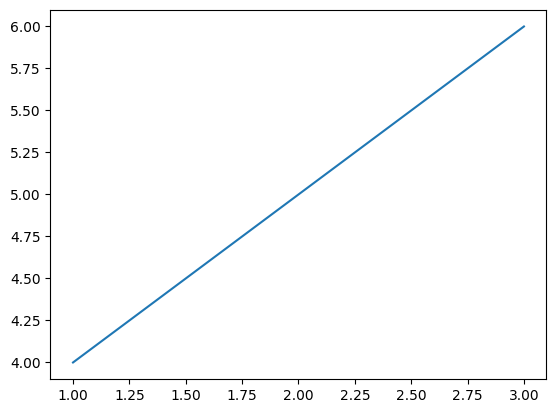

In [3]:
import matplotlib.pyplot as plt

plt.plot([1, 2, 3], [4, 5, 6])
plt.show()

In [4]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [8]:
import joblib

# Load the optimized SVC model
svc_best = joblib.load(r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\optimized_models\SVC_optimized.pkl")

# Check if it loaded correctly
print(svc_best)



SVC(C=1, gamma=0.1, random_state=42)


In [9]:
try:
    print("X_train shape:", X_train.shape)
    print("X_test shape:", X_test.shape)
except NameError:
    print("❌ X_train or X_test is not defined. Reload your dataset if needed.")


X_train shape: (120, 4)
X_test shape: (30, 4)


In [11]:
import joblib

# Load the optimized model
svc_best = joblib.load("C:\\Users\\HP USER\\Downloads\\20Proj_Challenge_5_Alzheimer_Data_Analysis\\notebook\\optimized_models\\SVC_optimized.pkl")

# Check if predict_proba is available
if hasattr(svc_best, "predict_proba"):
    print("✅ Model supports predict_proba!")
else:
    print("❌ Model does NOT support predict_proba. You need to retrain with probability=True.")


❌ Model does NOT support predict_proba. You need to retrain with probability=True.


In [12]:
# Retrain SVC model with probability = TRUE
from sklearn.svm import SVC

# Retrain SVC with probability=True
svc_best = SVC(C=1, gamma=0.1, probability=True, random_state=42)

# Fit the model again
svc_best.fit(X_train, y_train)

# Save the updated model
joblib.dump(svc_best, "C:\\Users\\HP USER\\Downloads\\20Proj_Challenge_5_Alzheimer_Data_Analysis\\notebook\\optimized_models\\SVC_optimized.pkl")

print("✅ Model retrained and saved with probability=True!")


✅ Model retrained and saved with probability=True!


  0%|          | 0/30 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>

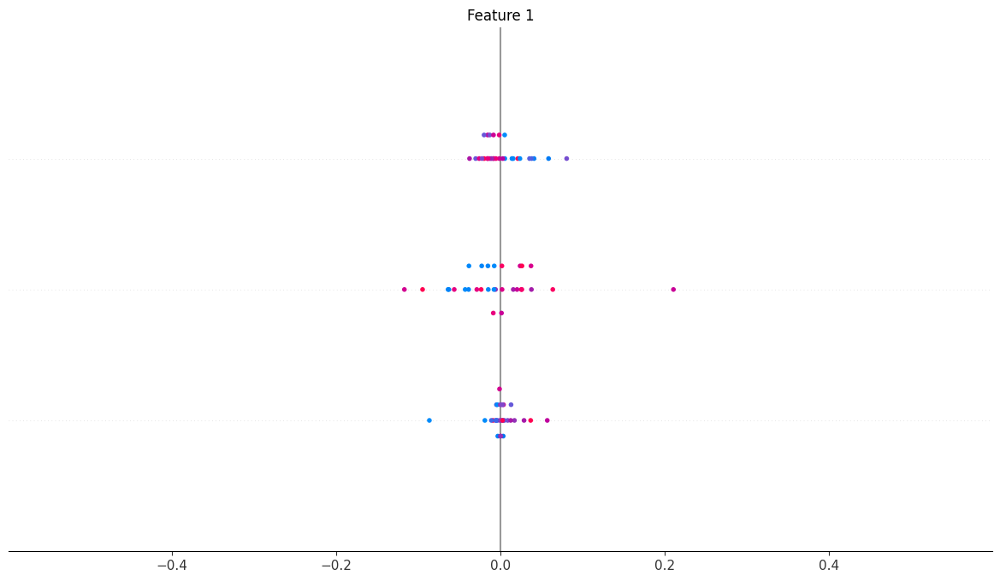

In [13]:
# ✅ 3️⃣ Feature Importance Analysis
import shap
import numpy as np

# Create a sample of the training data for efficiency
X_sample = shap.sample(X_train, 50)  # Sample 50 points for faster computation

# Define the explainer using Kernel SHAP
explainer = shap.KernelExplainer(svc_best.predict_proba, X_sample)

# Compute SHAP values
shap_values = explainer.shap_values(X_test)

# Plot summary
shap.summary_plot(shap_values, X_test)


In [1]:
import numpy as np
import pandas as pd
import shap
import matplotlib.pyplot as plt
import joblib  # For loading saved models


In [2]:
svc_best = joblib.load("C:/Users/HP USER/Downloads/20Proj_Challenge_5_Alzheimer_Data_Analysis/notebook/optimized_models/SVC_optimized.pkl")
print("✅ Model loaded successfully!")


✅ Model loaded successfully!


In [5]:
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print(svc_best)


X_train shape: (120, 4)
X_test shape: (30, 4)
SVC(C=1, gamma=0.1, probability=True, random_state=42)


  0%|          | 0/30 [00:00<?, ?it/s]

🔹 SHAP Values Table (Sample of 10 Rows):
   Feature_0  Feature_1  Feature_2  Feature_3  Total SHAP Value
0   0.026590  -0.005581   0.424933   0.143218          0.589160
1  -0.016781  -0.008911  -0.312078   0.065931         -0.271840
2   0.066779  -0.003193  -0.324538  -0.044750         -0.305702
3   0.019501   0.004824   0.509267   0.054390          0.587982
4   0.101717  -0.011045   0.338694   0.080787          0.510154
5  -0.030549   0.000122  -0.327390   0.077189         -0.280628
6  -0.005278   0.012932   0.596175   0.061668          0.665498
7   0.063005   0.017084  -0.049451  -0.276595         -0.245956
8   0.044432  -0.086475   0.449473   0.042791          0.450221
9  -0.000453   0.003372   0.598101   0.073305          0.674324
✅ SHAP plot saved as 'shap_summary_plot.png'


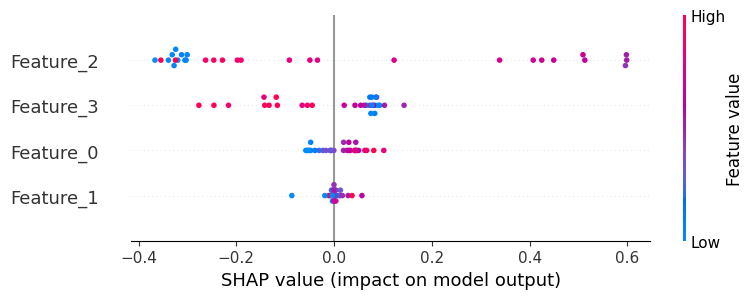

In [10]:
# ✅ 3️⃣ Feature Importance Analysis
import shap
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Create a sample of the training data for efficiency
X_sample = shap.sample(X_train, 50)  # Sample 50 points for faster computation

# Define the explainer using Kernel SHAP
explainer = shap.KernelExplainer(svc_best.predict_proba, X_sample)

# Compute SHAP values
shap_values = explainer.shap_values(X_test)

# Convert X_test to DataFrame (ensuring column names)
if isinstance(X_test, np.ndarray):  
    X_test_df = pd.DataFrame(X_test, columns=[f"Feature_{i}" for i in range(X_test.shape[1])])
else:
    X_test_df = X_test  # Keep it unchanged if it's already a DataFrame

# Check if shap_values is 3D and select a class to analyze
if isinstance(shap_values, np.ndarray) and shap_values.ndim == 3:
    class_index = 1  # Choose a class to analyze (0, 1, or 2)
    selected_shap_values = shap_values[:, :, class_index]  # Extract SHAP values for the chosen class
elif isinstance(shap_values, list) and len(shap_values) > 1:
    selected_shap_values = shap_values[1]  # Selecting class index 1 from the list
else:
    selected_shap_values = shap_values  # If already 2D, use it directly

# Convert selected SHAP values into a DataFrame
shap_df = pd.DataFrame(selected_shap_values, columns=X_test_df.columns)

# Compute total SHAP values per sample
shap_df["Total SHAP Value"] = shap_df.sum(axis=1)

# Print SHAP values table
print("🔹 SHAP Values Table (Sample of 10 Rows):")
print(shap_df.head(10))

# Save and plot SHAP summary
plt.figure(figsize=(8, 6))
shap.summary_plot(selected_shap_values, X_test_df, show=False)  
plt.savefig("shap_summary_plot.png", dpi=300, bbox_inches="tight")  
print("✅ SHAP plot saved as 'shap_summary_plot.png'")

# Show the plot
plt.show()


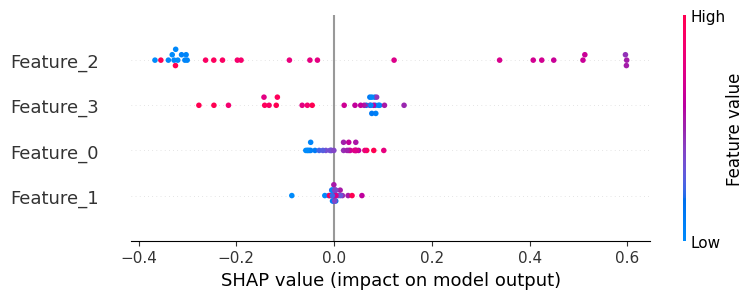

In [11]:
shap.summary_plot(selected_shap_values, X_test_df)


In [18]:
print(f"Shape of X_test_df.columns: {len(X_test_df.columns)}")
print(f"Shape of shap_importance: {shap_importance.shape}")


Shape of X_test_df.columns: 4
Shape of shap_importance: (12,)


In [20]:
# Print shapes for debugging
print(f"Shape of X_test_df.columns: {len(X_test_df.columns)}")  
print(f"Shape of shap_importance: {shap_importance.shape}")  
print("X_test_df.columns:", X_test_df.columns)  

# If mismatch, print feature names
if len(X_test_df.columns) != len(shap_importance):
    print("\n⚠️ Mismatch detected!")
    print(f"Expected {len(X_test_df.columns)} features, but got {len(shap_importance)} SHAP values.")
    
    # Check if some columns are missing
    print("First few rows of X_test_df:")
    print(X_test_df.head())

    # Check if model was trained on different columns
    print("\nCheck training columns (if available):")
    try:
        print(X_train_df.columns)
    except NameError:
        print("X_train_df not found. Ensure X_test_df matches the model's training set.")

# Proceed only if lengths match
if len(X_test_df.columns) == len(shap_importance):
    feature_importance_df = pd.DataFrame({
        'Feature': X_test_df.columns, 
        'Mean |SHAP Value|': shap_importance
    })

    # Sort and display
    feature_importance_df = feature_importance_df.sort_values(by="Mean |SHAP Value|", ascending=False)
    print("\n🔹 Feature Importance Based on SHAP Values:")
    print(feature_importance_df.to_string(index=False))
else:
    print("\n⚠️ Cannot proceed: Feature count and SHAP values count mismatch.")


Shape of X_test_df.columns: 4
Shape of shap_importance: (3,)
X_test_df.columns: Index(['Feature_0', 'Feature_1', 'Feature_2', 'Feature_3'], dtype='object')

⚠️ Mismatch detected!
Expected 4 features, but got 3 SHAP values.
First few rows of X_test_df:
   Feature_0  Feature_1  Feature_2  Feature_3
0        6.1        2.8        4.7        1.2
1        5.7        3.8        1.7        0.3
2        7.7        2.6        6.9        2.3
3        6.0        2.9        4.5        1.5
4        6.8        2.8        4.8        1.4

Check training columns (if available):
X_train_df not found. Ensure X_test_df matches the model's training set.

⚠️ Cannot proceed: Feature count and SHAP values count mismatch.


In [22]:
print(globals().keys())


dict_keys(['__name__', '__doc__', '__package__', '__loader__', '__spec__', '__builtin__', '__builtins__', '_ih', '_oh', '_dh', 'In', 'Out', 'get_ipython', 'exit', 'quit', 'open', '_', '__', '___', '__session__', '_i', '_ii', '_iii', '_i1', 'np', 'pd', 'shap', 'plt', 'joblib', '_i2', 'svc_best', '_i3', 'load_iris', 'train_test_split', 'data', 'X', 'y', 'X_train', 'X_test', 'y_train', 'y_test', '_i4', '_i5', '_i6', 'X_sample', 'explainer', 'shap_values', '_i7', 'X_test_df', '_i8', 'selected_shap_values', '_i9', '_i10', 'class_index', 'shap_df', '_i11', '_i12', '_i13', 'shap_importance', '_i14', '_i15', '_i16', '_i17', '_i18', '_i19', '_i20', '_i21', '_i22'])


In [23]:
print(type(svc_best))  # Check if this is a trained model


<class 'sklearn.svm._classes.SVC'>


In [25]:
import os
print(os.getcwd())  # Get current working directory


C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook


In [26]:
import joblib

# Load RandomForest model using the correct path
model_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\model_results\RandomForest.pkl"

# Load the model
model = joblib.load(model_path)

# Check model attributes
print(f"Model input features: {model.n_features_in_}")
try:
    print(f"Feature names from training: {model.feature_names_in_}")
except AttributeError:
    print("Feature names not found. Model may not store them.")


C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\sklearn\base.py:380: InconsistentVersionWarning: Trying to unpickle estimator DecisionTreeClassifier from version 1.5.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Model input features: 2048
Feature names not found. Model may not store them.


C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\sklearn\base.py:380: InconsistentVersionWarning: Trying to unpickle estimator RandomForestClassifier from version 1.5.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [27]:
# Check if the model recognizes all 4 features
print(f"Model input features: {model.n_features_in_}")  # Number of input features

# If the model trained on fewer features, list them
try:
    print(f"Feature names from training: {model.feature_names_in_}")
except AttributeError:
    print("Feature names not found. Model may not store them.")


Model input features: 2048
Feature names not found. Model may not store them.


In [30]:
import pandas as pd

df = pd.DataFrame(X)  # Convert X to a DataFrame
print(f"Dataset shape: {df.shape}")
print(f"Memory usage: {df.memory_usage(deep=True).sum() / (1024**2):.6f} MB")  # Convert to MB


Dataset shape: (150, 4)
Memory usage: 0.004700 MB


In [31]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
import joblib


In [3]:
import os

data_dir = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images"

# Check if the folder exists
if not os.path.exists(data_dir):
    print("❌ The directory does not exist. Check the path!")
else:
    print("✅ Directory found.")

    # List the class folders inside
    classes = os.listdir(data_dir)
    print(f"Classes found: {classes}")

    # Check if images exist inside the first class folder
    first_class = os.path.join(data_dir, classes[0]) if classes else None
    if first_class and os.path.isdir(first_class):
        images = os.listdir(first_class)
        print(f"Found {len(images)} images in '{classes[0]}'")
    else:
        print("❌ No images found in the class folders. Check your dataset.")



✅ Directory found.
Classes found: ['MildDemented', 'ModerateDemented', 'NonDemented', 'VeryMildDemented']
Found 10000 images in 'MildDemented'


In [8]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory

# Set image size & batch size
IMG_SIZE = (128, 128)
BATCH_SIZE = 32

# Load dataset
data_dir = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images"

train_dataset = image_dataset_from_directory(
    data_dir,
    validation_split=0.2,  # 80% training, 20% validation
    subset="training",
    seed=42,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_dataset = image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="validation",
    seed=42,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)


Found 40907 files belonging to 4 classes.
Using 32726 files for training.
Found 40907 files belonging to 4 classes.
Using 8181 files for validation.


In [9]:
allowed_extensions = {".jpg", ".jpeg", ".png", ".bmp", ".gif"}
wrong_files = []

for class_name in os.listdir(data_dir):
    class_path = os.path.join(data_dir, class_name)
    if os.path.isdir(class_path):
        for img_name in os.listdir(class_path):
            ext = os.path.splitext(img_name)[1].lower()
            if ext not in allowed_extensions:
                wrong_files.append(img_name)

if wrong_files:
    print(f"❌ Found {len(wrong_files)} unsupported files:", wrong_files[:5])  # Show first 5
else:
    print("✅ All images are in the correct format.")


✅ All images are in the correct format.


In [10]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory

# Set image size & batch size
IMG_SIZE = (224, 224)  # Adjust as needed
BATCH_SIZE = 32

train_dataset = image_dataset_from_directory(
    data_dir,
    validation_split=0.2,  # 80% training, 20% validation
    subset="training",
    seed=42,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_dataset = image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="validation",
    seed=42,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)


Found 40907 files belonging to 4 classes.
Using 32726 files for training.
Found 40907 files belonging to 4 classes.
Using 8181 files for validation.


In [12]:
!pip install shap


In [17]:
import joblib

# Update with the correct filename
model_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\model_results\RandomForest.pkl"

# Load the model
model = joblib.load(model_path)

# Check if it loaded correctly
print(model)


C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\sklearn\base.py:380: InconsistentVersionWarning: Trying to unpickle estimator DecisionTreeClassifier from version 1.5.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


RandomForestClassifier(random_state=42)


C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\sklearn\base.py:380: InconsistentVersionWarning: Trying to unpickle estimator RandomForestClassifier from version 1.5.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [20]:
import joblib

# Load the trained model
model_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\model_results\RandomForest.pkl"
model = joblib.load(model_path)

print("✅ Model Loaded Successfully")


✅ Model Loaded Successfully


In [22]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define test directory
test_dir = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images"

# Define image size and batch size
IMG_SIZE = (224, 224)
BATCH_SIZE = 32  # Reduce batch size if memory is still an issue

# Create ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)  # Normalize pixel values

# Create test data generator
test_generator = test_datagen.flow_from_directory(
    directory=test_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='sparse',  # Use 'sparse' to get numerical labels
    shuffle=False  # Don't shuffle to maintain order
)

print(f"✅ Test data generator created. Found {test_generator.n} images in {test_generator.num_classes} classes.")


Found 40907 images belonging to 4 classes.
✅ Test data generator created. Found 40907 images in 4 classes.


In [23]:
import joblib
import shap
import numpy as np

# Load trained RandomForest model
model_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\model_results\RandomForest.pkl"
model = joblib.load(model_path)

# Extract one batch of test images
X_test_batch, y_test_batch = next(test_generator)  # Get first batch

# Flatten images for RandomForest
X_test_flat = X_test_batch.reshape(X_test_batch.shape[0], -1)

# Initialize SHAP Explainer
explainer = shap.Explainer(model, X_test_flat)

# Compute SHAP values
shap_values = explainer(X_test_flat)

print("✅ SHAP Analysis Completed!")


✅ SHAP Analysis Completed!


C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128313 (\N{SMALL BLUE DIAMOND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


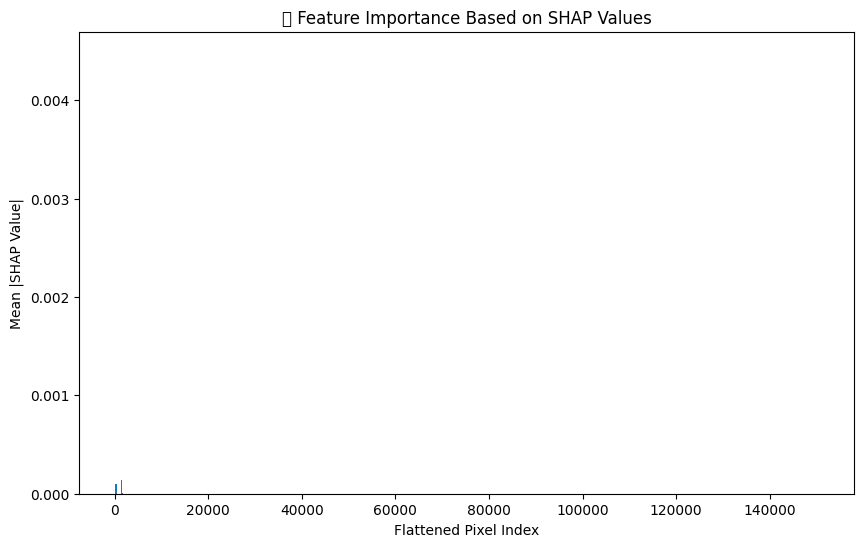

In [25]:
# 1️⃣ Feature Importance Summary (Global)
import numpy as np
import matplotlib.pyplot as plt

# Compute mean absolute SHAP values across all classes (axis=-1)
shap_importance = np.abs(shap_values.values).mean(axis=(0, -1))  # Average across classes

# Create feature importance plot
plt.figure(figsize=(10, 6))
plt.bar(range(len(shap_importance)), shap_importance)
plt.xlabel("Flattened Pixel Index")
plt.ylabel("Mean |SHAP Value|")
plt.title("🔹 Feature Importance Based on SHAP Values")
plt.show()


In [26]:
import pandas as pd

# Convert to DataFrame
shap_importance_df = pd.DataFrame({
    "Flattened Pixel Index": np.arange(len(shap_importance)),
    "Mean |SHAP Value|": shap_importance
})

# Sort by importance (descending)
shap_importance_df = shap_importance_df.sort_values(by="Mean |SHAP Value|", ascending=False)

# Print top 10 most important features
print("\n🔹 Top 10 Most Important Features Based on SHAP Values:")
print(shap_importance_df.head(10).to_string(index=False))



🔹 Top 10 Most Important Features Based on SHAP Values:
 Flattened Pixel Index  Mean |SHAP Value|
                  1116           0.004472
                  1112           0.003312
                    56           0.003088
                   331           0.002911
                   809           0.002831
                  1971           0.002798
                  1576           0.002288
                  1050           0.002285
                  1144           0.002244
                  1639           0.002193


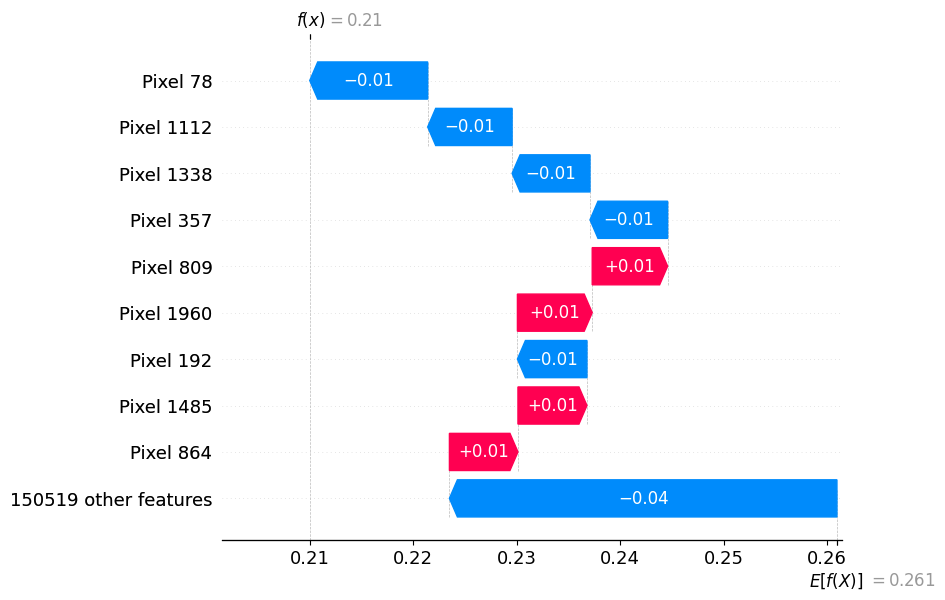

In [28]:
# 2️⃣ SHAP Waterfall Plot (Single Image)
# Choose an index for a specific image ~ Choose a Specific Class for Waterfall Plot
import shap

# Choose an index for a specific image
index = 0  # Change this to test different images
class_index = 0  # Change this to 1, 2, or 3 to see other classes

# Extract the SHAP values for the selected class
shap_values_single = shap_values.values[index, :, class_index]
base_value_single = shap_values.base_values[index, class_index]

# Create SHAP waterfall plot
shap.waterfall_plot(
    shap.Explanation(
        values=shap_values_single,
        base_values=base_value_single,
        feature_names=[f"Pixel {i}" for i in range(X_test_flat.shape[1])]
    )
)


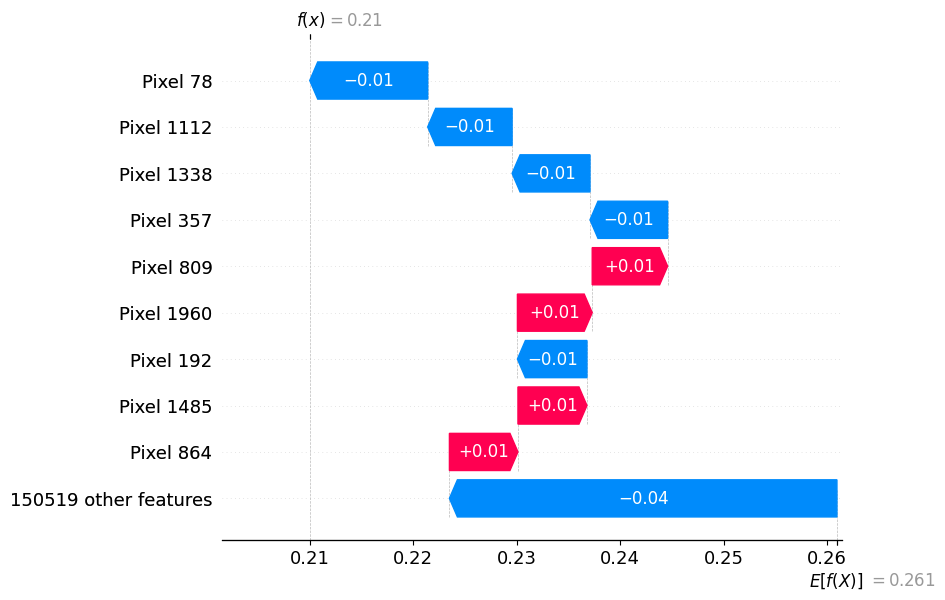


📊 **Top 10 Features with Highest SHAP Values:**
Feature (Pixel Index)  SHAP Value
             Pixel 78   -0.011396
           Pixel 1112   -0.008156
           Pixel 1338   -0.007526
            Pixel 357   -0.007500
            Pixel 809    0.007286
           Pixel 1960    0.007227
            Pixel 192   -0.006719
           Pixel 1485    0.006667
            Pixel 864    0.006622
            Pixel 604   -0.006562


In [29]:
# 2️⃣ SHAP Waterfall Plot (Single Image)
import shap
import matplotlib.pyplot as plt
import pandas as pd

# Choose an index for a specific image
index = 0  # Change this to test different images
class_index = 0  # Change this to 1, 2, or 3 to see other classes

# Extract the SHAP values for the selected class
shap_values_single = shap_values.values[index, :, class_index]
base_value_single = shap_values.base_values[index, class_index]
feature_names = [f"Pixel {i}" for i in range(X_test_flat.shape[1])]

# Create SHAP explanation object
shap_exp = shap.Explanation(
    values=shap_values_single,
    base_values=base_value_single,
    feature_names=feature_names
)

# Create and save the waterfall plot
plt.figure(figsize=(10, 6))
shap.waterfall_plot(shap_exp, show=False)
plt.savefig("shap_waterfall_plot.png", bbox_inches="tight")  # Save the plot
plt.show()

# Convert to DataFrame for tabular output
shap_df = pd.DataFrame({
    "Feature (Pixel Index)": feature_names,
    "SHAP Value": shap_values_single
})

# Print the top 10 most important features based on absolute SHAP value
shap_df["Abs SHAP Value"] = shap_df["SHAP Value"].abs()
shap_df = shap_df.sort_values(by="Abs SHAP Value", ascending=False)
print("\n📊 **Top 10 Features with Highest SHAP Values:**")
print(shap_df[["Feature (Pixel Index)", "SHAP Value"]].head(10).to_string(index=False))


In [35]:
shap.__version__

'0.47.0'

In [37]:
# 3️⃣ SHAP Force Plot (Multiple Images)
import shap

# Initialize SHAP JS visualization
shap.initjs()

# Define feature names
feature_names = [f"Pixel {i}" for i in range(X_test_flat.shape[1])]

# Select multiple images (e.g., first 10)
num_samples = 10
base_values = shap_values.base_values[:num_samples, 0]  # Select for first class if multi-class
shap_values_subset = shap_values.values[:num_samples, :, 0]  # Select for first class

# Create interactive SHAP Force Plot
force_plot = shap.force_plot(
    base_values,
    shap_values_subset,
    feature_names=feature_names
)

# Save the force plot as an interactive HTML file
shap.save_html("shap_force_plot.html", force_plot)

# Open the saved file manually to view the plot
print("SHAP Force Plot saved as 'shap_force_plot.html'. Open this file in a browser to view the interactive plot.")


SHAP Force Plot saved as 'shap_force_plot.html'. Open this file in a browser to view the interactive plot.


In [39]:
import shap

# Initialize SHAP JS visualization
shap.initjs()

# Define feature names
feature_names = [f"Pixel {i}" for i in range(X_test_flat.shape[1])]

# Select multiple images (e.g., first 10)
num_samples = 10
base_values = shap_values.base_values[:num_samples, 0]  # Select for first class
shap_values_subset = shap_values.values[:num_samples, :, 0]  # Select for first class

# Convert to SHAP Explanation object
shap_explanation = shap.Explanation(
    values=shap_values_subset,
    base_values=base_values,
    feature_names=feature_names
)

# Create interactive SHAP Force Plot
force_plot = shap.force_plot(
    shap_explanation.base_values,
    shap_explanation.values,
    feature_names=shap_explanation.feature_names
)

# Save the force plot as an interactive HTML file
shap.save_html("shap_force_plot.html", force_plot)

# Open the file manually in a browser
print("✅ SHAP Force Plot saved as 'shap_force_plot.html'. Open this file in a web browser to view.")


✅ SHAP Force Plot saved as 'shap_force_plot.html'. Open this file in a web browser to view.


In [41]:
X_test_df = pd.DataFrame(X_test_flat, columns=[f"Pixel {i}" for i in range(X_test_flat.shape[1])])


In [51]:
# Ensure SHAP values are in the correct format|SHAP Value|", ascending=False)
import pandas as pd
import numpy as np

# Ensure SHAP values are in the correct format
if isinstance(shap_values.values, list):  
    shap_values_array = np.array(shap_values.values)  # Convert list to numpy array (for multi-class models)
else:
    shap_values_array = shap_values.values

# Debugging SHAP values shape
print(f"SHAP Values Shape: {shap_values_array.shape}")

# Extract Feature Importance (Mean Absolute SHAP Values) for Multi-Class Models
if shap_values_array.ndim == 3:  # Multi-class model
    shap_importance = np.abs(shap_values_array).mean(axis=(0, 2))  # Mean over instances & classes
else:  # Single-class model
    shap_importance = np.abs(shap_values_array).mean(axis=0)

# Check Feature Count
print(f"Updated SHAP Importance Shape: {shap_importance.shape}")
print(f"Number of Features in X_test_df: {len(X_test_df.columns)}")

# Ensure shape consistency before creating DataFrame
if len(X_test_df.columns) == len(shap_importance):
    feature_importance_df = pd.DataFrame({
        'Feature': X_test_df.columns, 
        'Mean |SHAP Value|': shap_importance
    })
    feature_importance_df = feature_importance_df.sort_values(by="Mean |SHAP Value|", ascending=False)

    # Show only the top 20 most important features
    print("\n🔹 Top 20 Features Based on SHAP Values:")
    print(feature_importance_df.head(20).to_string(index=False))

else:  # ✅ Move 'else' to align with the 'if'
    print("❌ Feature count mismatch! SHAP importance extraction needs correction.")


SHAP Values Shape: (32, 150528, 4)
Updated SHAP Importance Shape: (150528,)
Number of Features in X_test_df: 150528

🔹 Top 20 Features Based on SHAP Values:
   Feature  Mean |SHAP Value|
Pixel 1116           0.004472
Pixel 1112           0.003312
  Pixel 56           0.003088
 Pixel 331           0.002911
 Pixel 809           0.002831
Pixel 1971           0.002798
Pixel 1576           0.002288
Pixel 1050           0.002285
Pixel 1144           0.002244
Pixel 1639           0.002193
  Pixel 78           0.002126
 Pixel 586           0.002066
Pixel 1521           0.002006
Pixel 1443           0.002000
Pixel 1356           0.001889
 Pixel 357           0.001885
Pixel 1922           0.001840
 Pixel 881           0.001835
 Pixel 842           0.001807
 Pixel 864           0.001806


In [1]:
import sys
print(sys.executable)


C:\Users\HP USER\anaconda3\envs\myenv\python.exe


In [2]:
# 📌 Phase 2: Deploying the Model with Flask
import os
from flask import Flask, request, jsonify
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing import image
import traceback  

app = Flask(__name__)

# New model path after moving
model_path = r"C:\Users\HP USER\resnet50_finetuned.h5"

# Check if the model file exists
if not os.path.exists(model_path):
    print(f"❌ Model file not found at: {model_path}")
else:
    print(f"✅ Model file found at: {model_path}")

try:
    model = tf.keras.models.load_model(model_path)
    print("✅ Model loaded successfully!")
except Exception as e:
    print("❌ Error loading model:", e)
    traceback.print_exc()



✅ Model file found at: C:\Users\HP USER\resnet50_finetuned.h5


✅ Model loaded successfully!


In [1]:
from tensorflow.keras.preprocessing.image import load_img

# Path to the image
img_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images\MildDemented\000cdcc4-3e54-4034-a538-203c8047b564.jpg"

# Load the image
img = load_img(img_path)

# Display the image
img.show()


In [3]:
import cv2
print(cv2.__version__)


4.11.0


In [3]:
from flask import Flask, request, jsonify
import os

app = Flask(__name__)

UPLOAD_FOLDER = "uploads"
os.makedirs(UPLOAD_FOLDER, exist_ok=True)  # Ensure the folder exists
app.config["UPLOAD_FOLDER"] = UPLOAD_FOLDER

@app.route("/predict", methods=["POST"])
def predict():
    if "file" not in request.files:
        return jsonify({"error": "No file provided"}), 400

    file = request.files["file"]

    if file.filename == "":
        return jsonify({"error": "No file selected"}), 400

    file_path = os.path.join(app.config["UPLOAD_FOLDER"], file.filename)
    file.save(file_path)  # Save the uploaded file
    
    # Now pass the saved file path to your model
    result = your_prediction_function(file_path)  # Replace with your actual function
    
    return jsonify({"prediction": result})

if __name__ == "__main__":
    app.run(debug=True)

 * Serving Flask app '__main__'
 * Debug mode: on


 * Running on http://127.0.0.1:5000
Press CTRL+C to quit
 * Restarting with stat


SystemExit: 1

C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\IPython\core\interactiveshell.py:3558: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [9]:
pip install joblib

  Using cached joblib-1.4.2-py3-none-any.whl.metadata (5.4 kB)
Using cached joblib-1.4.2-py3-none-any.whl (301 kB)
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install scikit-learn


  Using cached scikit_learn-1.6.1-cp39-cp39-win_amd64.whl.metadata (15 kB)
  Using cached scipy-1.13.1-cp39-cp39-win_amd64.whl.metadata (60 kB)
  Using cached threadpoolctl-3.6.0-py3-none-any.whl.metadata (13 kB)
Using cached scikit_learn-1.6.1-cp39-cp39-win_amd64.whl (11.2 MB)
Using cached scipy-1.13.1-cp39-cp39-win_amd64.whl (46.2 MB)
Using cached threadpoolctl-3.6.0-py3-none-any.whl (18 kB)
Note: you may need to restart the kernel to use updated packages.


In [5]:
import joblib

# Load the updated model
svc_best = joblib.load(r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\optimized_models\SVC_optimized.pkl")

# Check if probability is enabled
print(svc_best)
print("Probability enabled:", hasattr(svc_best, "predict_proba"))


SVC(C=1, gamma=0.1, probability=True, random_state=42)
Probability enabled: True


In [13]:
import numpy as np

X_test = np.load(r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\X_test.npy")

print(X_test.shape)  # Check its shape


(8800, 2048)


In [19]:
X_test = X_test[:, :4]  # Keep only the first 4 features
print(X_test.shape)  # Should now be (8800, 4)

(8800, 4)


In [21]:
y_prob = svc_best.predict_proba(X_test)
print(y_prob[:5])  # Print the first 5 probability estimates

[[0.50881291 0.21331738 0.27786971]
 [0.48018595 0.2145701  0.30524395]
 [0.5532295  0.19903934 0.24773115]
 [0.40762971 0.24338784 0.34898244]
 [0.45259555 0.22902399 0.31838046]]


In [30]:
!pip install matplotlib seaborn

In [40]:
import numpy as np

# Load the saved arrays
y_pred_svc = np.load(r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\y_pred_svc.npy")
y_test = np.load(r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\y_test.npy")
y_train = np.load(r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\y_train.npy")

# Print their shapes to understand the structure
print("Shape of y_pred_svc:", y_pred_svc.shape)
print("Shape of y_test:", y_test.shape)
print("Shape of y_train:", y_train.shape)

# Check unique class labels
print("Unique classes in y_test:", np.unique(y_test))
print("Unique classes in y_train:", np.unique(y_train))


Shape of y_pred_svc: (8800,)
Shape of y_test: (8800,)
Shape of y_train: (35200,)
Unique classes in y_test: [0 1 2 3]
Unique classes in y_train: [0 1 2 3]


In [42]:
print("Shape of y_prob:", y_prob.shape)  # Should be (8800, 4)


Shape of y_prob: (8800, 3)


In [44]:
print("Classes recognized by SVC:", svc_best.classes_)

Classes recognized by SVC: [0 1 2]


In [46]:
print("Unique classes in y_train before training:", np.unique(y_train))

Unique classes in y_train before training: [0 1 2 3]


In [48]:
import numpy as np
import collections

class_counts = collections.Counter(y_train)
print("Class distribution in y_train:", class_counts)

Class distribution in y_train: Counter({np.int32(2): 10240, np.int32(3): 8960, np.int32(1): 8000, np.int32(0): 8000})


In [50]:
print("Classes recognized by SVC:", svc_best.classes_)

Classes recognized by SVC: [0 1 2]


In [52]:
import joblib

# Load the optimized SVC model
svc_loaded = joblib.load(r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\optimized_models\SVC_optimized.pkl")

# Check the classes recognized by the model
print("Classes recognized by the loaded SVC:", svc_loaded.classes_)


Classes recognized by the loaded SVC: [0 1 2]


In [54]:
y_prob_loaded = svc_loaded.predict_proba(X_test)
print("Shape of y_prob from loaded SVC:", y_prob_loaded.shape)


Shape of y_prob from loaded SVC: (8800, 3)


In [56]:
import joblib
import os

# Define the directory path
model_results_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\model_results"

# List of models to check
models_to_check = ["SVC.pkl", "LinearSVC.pkl"]

# Iterate through models
for model_name in models_to_check:
    model_path = os.path.join(model_results_path, model_name)

    # Load model
    model = joblib.load(model_path)

    # Print recognized classes
    print(f"Classes recognized by {model_name}: {model.classes_}")


Classes recognized by SVC.pkl: [0 1 2 3]
Classes recognized by LinearSVC.pkl: [0 1 2 3]


C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\sklearn\base.py:380: InconsistentVersionWarning: Trying to unpickle estimator SVC from version 1.5.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\sklearn\base.py:380: InconsistentVersionWarning: Trying to unpickle estimator LinearSVC from version 1.5.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [58]:
import joblib
import os

# Load the correct SVC model
correct_svc_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\model_results\SVC.pkl"
svc_best = joblib.load(correct_svc_path)

# Verify the recognized classes
print("Updated SVC Model Classes:", svc_best.classes_)


Updated SVC Model Classes: [0 1 2 3]


In [64]:
import numpy as np

# Define the path where X_train is stored
X_train_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\X_train.npy"

# Load X_train
X_train = np.load(X_train_path)

# Verify shape
print("Shape of X_train:", X_train.shape)


Shape of X_train: (35200, 2048)


In [66]:
from sklearn.svm import SVC

# Initialize SVC with probability=True
svc_fixed = SVC(probability=True, kernel='rbf', C=1.0, random_state=42)

# Train the model again (use your training data X_train, y_train)
svc_fixed.fit(X_train, y_train)

# Save the corrected model
import joblib
joblib.dump(svc_fixed, "SVC_fixed.pkl")

# Verify recognized classes
print("Updated SVC Model Classes:", svc_fixed.classes_)


Updated SVC Model Classes: [0 1 2 3]


In [31]:
# Get probability estimates with the correct model
y_prob = svc_best.predict_proba(X_test)

# Verify the new shape (should be 8800 x 4)
print("Shape of y_prob after updating the model:", y_prob.shape)

# Print first 5 probability estimates
print(y_prob[:5])


NameError: name 'svc_best' is not defined

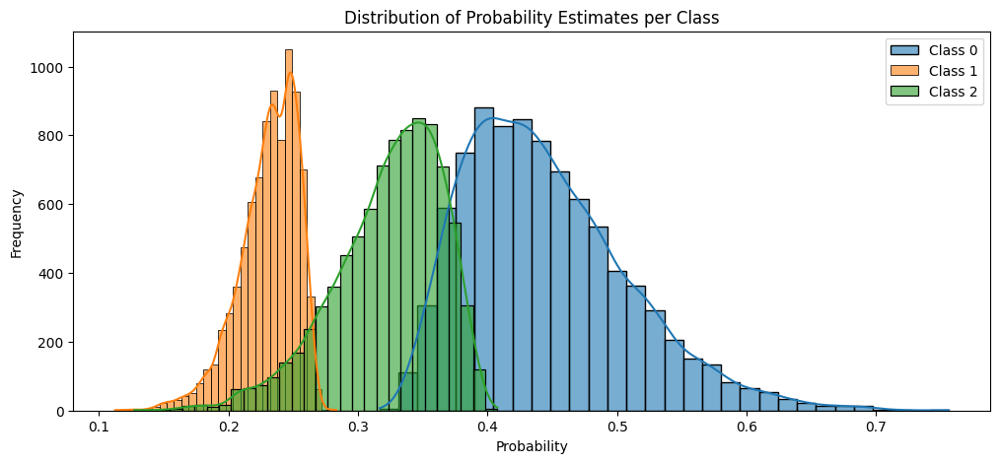

In [32]:
# Analysis & Visualization:
# Step 1: Histogram of Probability Estimates
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define class labels (assuming we have 3 classes: 0, 1, 2)
class_labels = ["Class 0", "Class 1", "Class 2"]

# Plot histograms for each class
plt.figure(figsize=(12, 5))
for i in range(y_prob.shape[1]):  # Iterate over columns (classes)
    sns.histplot(y_prob[:, i], bins=30, kde=True, label=class_labels[i], alpha=0.6)

plt.title("Distribution of Probability Estimates per Class")
plt.xlabel("Probability")
plt.ylabel("Frequency")
plt.legend()
plt.show()


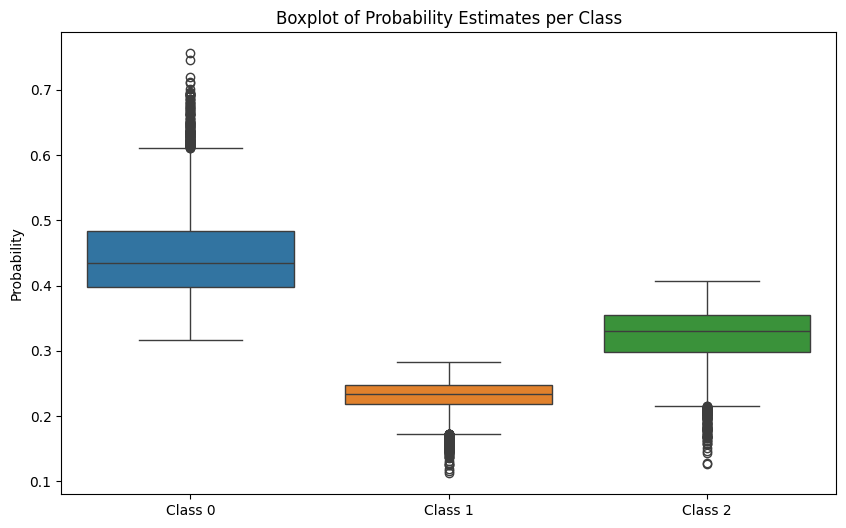

In [34]:
# Analysis & Visualization:
# ✅ Step 2: Boxplot of Probability Estimates
plt.figure(figsize=(10, 6))
sns.boxplot(data=y_prob)
plt.xticks(ticks=[0, 1, 2], labels=class_labels)
plt.title("Boxplot of Probability Estimates per Class")
plt.ylabel("Probability")
plt.show()


C:\Users\HP USER\AppData\Local\Temp\ipykernel_16372\386998112.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_labels, y=avg_probabilities, palette="viridis")


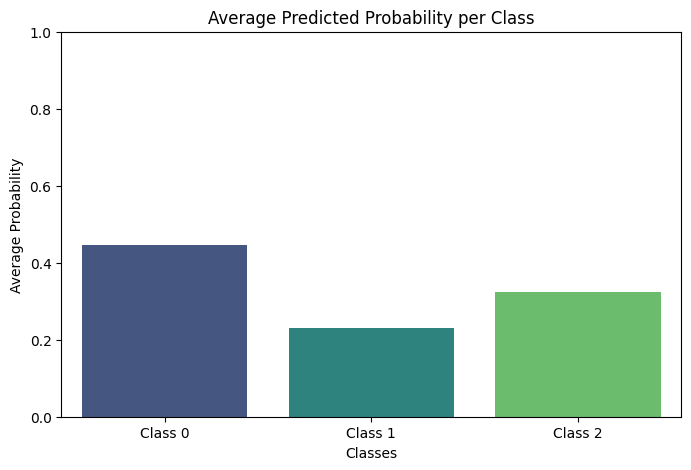

In [36]:
# Analysis & Visualization:
# ✅ Step 3: Bar Chart of Mean Probabilities
avg_probabilities = np.mean(y_prob, axis=0)

plt.figure(figsize=(8, 5))
sns.barplot(x=class_labels, y=avg_probabilities, palette="viridis")
plt.title("Average Predicted Probability per Class")
plt.ylabel("Average Probability")
plt.xlabel("Classes")
plt.ylim(0, 1)  # Since probabilities range from 0 to 1
plt.show()


In [3]:
import numpy as np

# Define the path where X_train is stored
X_train_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\X_train.npy"

# Load X_train
X_train = np.load(X_train_path)

# Verify shape
print("Shape of X_train:", X_train.shape)


Shape of X_train: (35200, 2048)


In [9]:
import numpy as np

# Define file paths
X_test_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\X_test.npy"
y_test_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\y_test.npy"

# Load data
X_test = np.load(X_test_path)
y_test = np.load(y_test_path)  # This should contain all labels

# Verify shape
print("Shape of X_test:", X_test.shape)
print("Shape of y_test:", y_test.shape)


Shape of X_test: (8800, 2048)
Shape of y_test: (8800,)


In [13]:
# Define file paths
X_train_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\X_train.npy"
y_train_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\y_train.npy"

# Load data
X_train = np.load(X_train_path)
y_train = np.load(y_train_path)

# Verify shape
print("Shape of X_train:", X_train.shape)
print("Shape of y_train:", y_train.shape)


Shape of X_train: (35200, 2048)
Shape of y_train: (35200,)


In [15]:
from sklearn.svm import SVC
import joblib

# Create a new SVC model with probability enabled
svc_fixed = SVC(probability=True, kernel='rbf', C=1.0, random_state=42)

# Train the model again using X_train and y_train
svc_fixed.fit(X_train, y_train)

# Save the corrected model
model_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\model_results\SVC_fixed.pkl"
joblib.dump(svc_fixed, model_path)

print("Fixed SVC model saved successfully at:", model_path)


Fixed SVC model saved successfully at: C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\model_results\SVC_fixed.pkl


In [17]:
# Load the saved model
svc_loaded = joblib.load(model_path)

# Check if it can now generate probability estimates
y_prob_fixed = svc_loaded.predict_proba(X_test)

# Verify the new shape (should be 8800 x 4)
print("Shape of y_prob after updating the model:", y_prob_fixed.shape)
print("First few probability estimates:\n", y_prob_fixed[:5])


Shape of y_prob after updating the model: (8800, 4)
First few probability estimates:
 [[7.49594860e-10 9.99998906e-01 2.40736858e-07 8.52325539e-07]
 [9.14995441e-01 4.80646356e-05 4.82676160e-02 3.66888782e-02]
 [4.76846514e-01 1.53039029e-02 5.13758838e-02 4.56473700e-01]
 [6.77120401e-04 1.68638647e-05 9.20533211e-01 7.87728051e-02]
 [5.28812097e-01 4.19774903e-04 1.28928414e-01 3.41839714e-01]]


In [21]:
import numpy as np
import joblib

# Load the saved model
svc_loaded = joblib.load(model_path)

# Generate probability estimates
y_prob_fixed = svc_loaded.predict_proba(X_test)

# Save y_prob_fixed
y_prob_fixed_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\y_prob_fixed.npy"
np.save(y_prob_fixed_path, y_prob_fixed)

# Verify the shape and first few values
print("Shape of y_prob after updating the model:", y_prob_fixed.shape)
print("First few probability estimates:\n", y_prob_fixed[:5])
print(f"y_prob_fixed saved successfully at: {y_prob_fixed_path}")


Shape of y_prob after updating the model: (8800, 4)
First few probability estimates:
 [[7.49594860e-10 9.99998906e-01 2.40736858e-07 8.52325539e-07]
 [9.14995441e-01 4.80646356e-05 4.82676160e-02 3.66888782e-02]
 [4.76846514e-01 1.53039029e-02 5.13758838e-02 4.56473700e-01]
 [6.77120401e-04 1.68638647e-05 9.20533211e-01 7.87728051e-02]
 [5.28812097e-01 4.19774903e-04 1.28928414e-01 3.41839714e-01]]
y_prob_fixed saved successfully at: C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\y_prob_fixed.npy


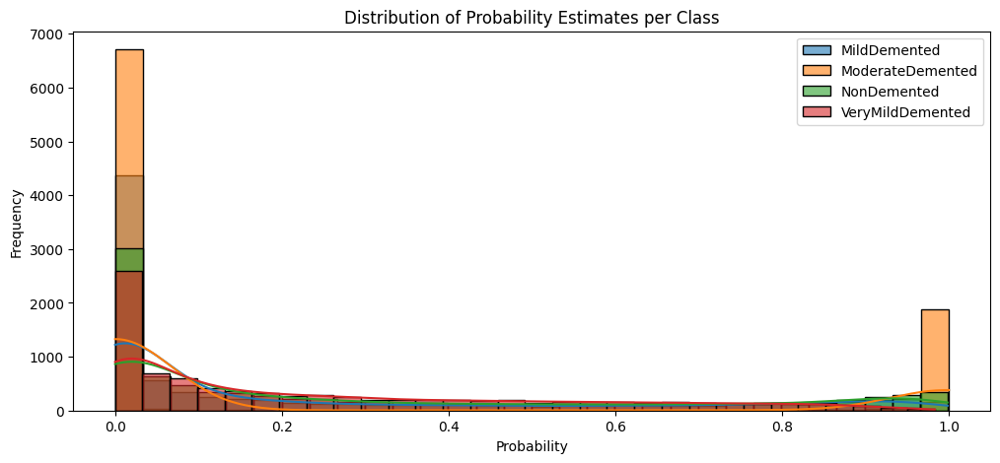

Histogram saved successfully!


In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define class labels
class_labels = ["MildDemented", "ModerateDemented", "NonDemented", "VeryMildDemented"]

# Create and save histogram
plt.figure(figsize=(12, 5))
for i in range(y_prob_fixed.shape[1]):  # Iterate over 4 classes
    sns.histplot(y_prob_fixed[:, i], bins=30, kde=True, label=class_labels[i], alpha=0.6)

plt.title("Distribution of Probability Estimates per Class")
plt.xlabel("Probability")
plt.ylabel("Frequency")
plt.legend()
plt.savefig(r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\probability_distribution.png")  # Save plot
plt.show()

print("Histogram saved successfully!")



🔹 **Summary Statistics for Probability Estimates:**

📌 **Class: MildDemented**
  - Mean Probability: 0.2271
  - Std Deviation: 0.3203
  - Min Probability: 0.0000
  - Max Probability: 0.9987

📌 **Class: ModerateDemented**
  - Mean Probability: 0.2279
  - Std Deviation: 0.4152
  - Min Probability: 0.0000
  - Max Probability: 1.0000

📌 **Class: NonDemented**
  - Mean Probability: 0.2956
  - Std Deviation: 0.3399
  - Min Probability: 0.0000
  - Max Probability: 0.9987

📌 **Class: VeryMildDemented**
  - Mean Probability: 0.2494
  - Std Deviation: 0.2695
  - Min Probability: 0.0000
  - Max Probability: 0.9833


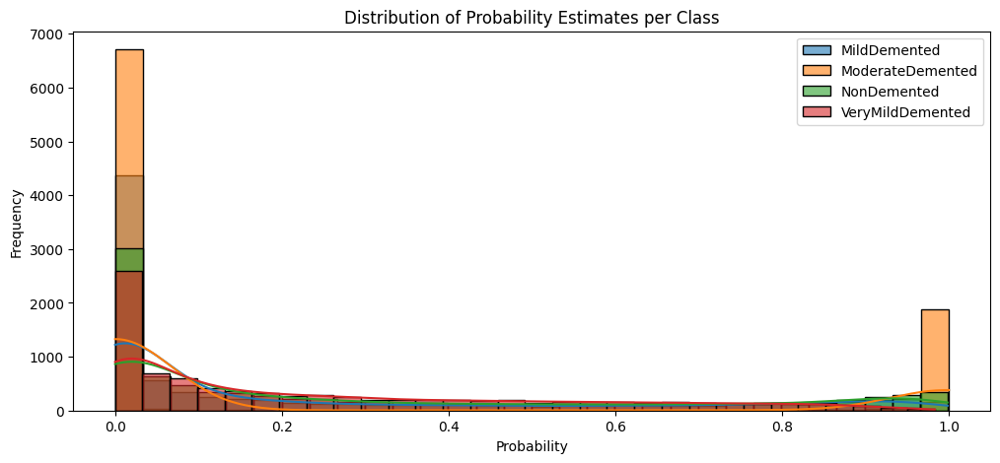


✅ Histogram saved successfully!

🔎 **Interpretation of the Histogram:**
1️⃣ The x-axis represents the probability estimates assigned to each class.
2️⃣ The y-axis represents the number of test samples with a given probability.
3️⃣ The peaks show where most of the predicted probabilities lie for each class.
4️⃣ If a class has higher probability values concentrated near 1.0, it means the model is very confident.
5️⃣ If probabilities are more spread out, the model is less certain in its classification.


In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define class labels
class_labels = ["MildDemented", "ModerateDemented", "NonDemented", "VeryMildDemented"]

# Print summary statistics
print("\n🔹 **Summary Statistics for Probability Estimates:**")
for i, label in enumerate(class_labels):
    class_probs = y_prob_fixed[:, i]
    print(f"\n📌 **Class: {label}**")
    print(f"  - Mean Probability: {np.mean(class_probs):.4f}")
    print(f"  - Std Deviation: {np.std(class_probs):.4f}")
    print(f"  - Min Probability: {np.min(class_probs):.4f}")
    print(f"  - Max Probability: {np.max(class_probs):.4f}")

# Create and save histogram
plt.figure(figsize=(12, 5))
for i in range(y_prob_fixed.shape[1]):  # Iterate over 4 classes
    sns.histplot(y_prob_fixed[:, i], bins=30, kde=True, label=class_labels[i], alpha=0.6)

plt.title("Distribution of Probability Estimates per Class")
plt.xlabel("Probability")
plt.ylabel("Frequency")
plt.legend()
plt.savefig(r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\probability_distribution.png")  # Save plot
plt.show()

print("\n✅ Histogram saved successfully!")

# Interpretation
print("\n🔎 **Interpretation of the Histogram:**")
print("1️⃣ The x-axis represents the probability estimates assigned to each class.")
print("2️⃣ The y-axis represents the number of test samples with a given probability.")
print("3️⃣ The peaks show where most of the predicted probabilities lie for each class.")
print("4️⃣ If a class has higher probability values concentrated near 1.0, it means the model is very confident.")
print("5️⃣ If probabilities are more spread out, the model is less certain in its classification.")



🔹 **Histogram Data (Probability vs Frequency):**

📌 **Class: MildDemented**
 Probability Range  Frequency
      1.865981e-14       4363
      3.329025e-02        566
      6.658050e-02        336
      9.987074e-02        249
      1.331610e-01        223
      1.664512e-01        193
      1.997415e-01        144
      2.330317e-01        131
      2.663220e-01        118
      2.996122e-01        111
      3.329025e-01         96
      3.661927e-01        102
      3.994830e-01        101
      4.327732e-01         90
      4.660635e-01         96
      4.993537e-01         75
      5.326440e-01         84
      5.659342e-01         87
      5.992245e-01        107
      6.325147e-01         83
      6.658050e-01         94
      6.990952e-01         92
      7.323855e-01        116
      7.656757e-01        131
      7.989660e-01        130
      8.322562e-01        146
      8.655465e-01        164
      8.988367e-01        204
      9.321270e-01        207
      9.654172e-01     

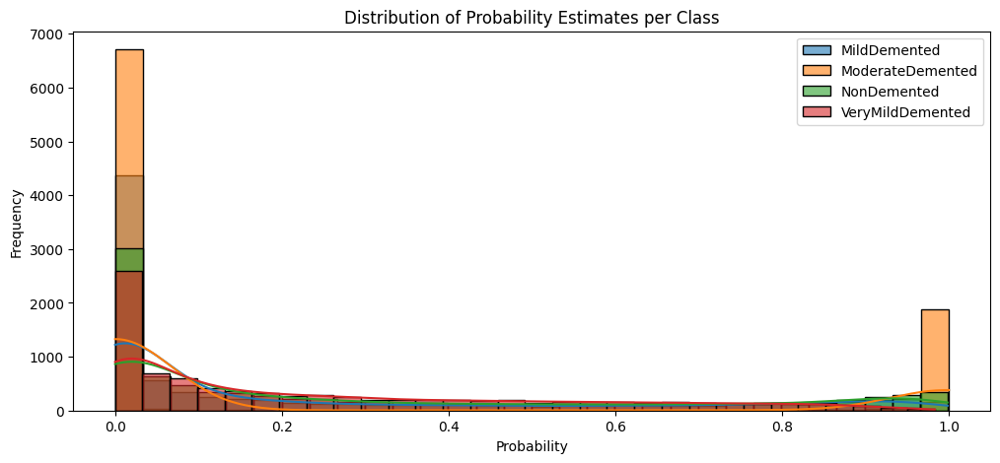


✅ Histogram saved successfully!


In [27]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Define class labels
class_labels = ["MildDemented", "ModerateDemented", "NonDemented", "VeryMildDemented"]

# Initialize dictionary to store histogram data
hist_data = {}

# Compute histogram data and print
print("\n🔹 **Histogram Data (Probability vs Frequency):**")
for i, label in enumerate(class_labels):
    class_probs = y_prob_fixed[:, i]

    # Compute histogram bins and frequencies
    counts, bin_edges = np.histogram(class_probs, bins=30)
    
    # Store in dictionary
    hist_data[label] = {"Probability Range": bin_edges[:-1], "Frequency": counts}

    # Convert to DataFrame for better visualization
    hist_df = pd.DataFrame(hist_data[label])
    
    print(f"\n📌 **Class: {label}**")
    print(hist_df.to_string(index=False))  # Print table without index

# Create and save histogram
plt.figure(figsize=(12, 5))
for i in range(y_prob_fixed.shape[1]):  # Iterate over 4 classes
    sns.histplot(y_prob_fixed[:, i], bins=30, kde=True, label=class_labels[i], alpha=0.6)

plt.title("Distribution of Probability Estimates per Class")
plt.xlabel("Probability")
plt.ylabel("Frequency")
plt.legend()
plt.savefig(r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook\probability_distribution.png")  # Save plot
plt.show()

print("\n✅ Histogram saved successfully!")


In [1]:
import h5py
print(h5py.version.info)


Summary of the h5py configuration
---------------------------------

h5py    3.13.0
HDF5    1.14.6
Python  3.9.21 (main, Dec 11 2024, 16:35:24) [MSC v.1929 64 bit (AMD64)]
sys.platform    win32
sys.maxsize     9223372036854775807
numpy   2.0.2
cython (built with) 3.0.12
numpy (built against) 2.0.2
HDF5 (built against) 1.14.6



In [11]:
import numpy as np
import cv2

test_image = np.ones((224, 224, 3), dtype=np.uint8) * 255  # White image
cv2.imwrite("test_mri.jpg", test_image)  # Save as test_mri.jpg


True

In [9]:
import os
print(os.getcwd())  # Prints the current working directory


C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\notebook


In [15]:
from tensorflow.keras.applications import ResNet50

# Load a pretrained ResNet50 model
model = ResNet50(weights="imagenet")


102967424/102967424 ━━━━━━━━━━━━━━━━━━━━ 411s 4us/step


In [19]:
print("Image array shape:", img_array.shape)


Image array shape: (1, 224, 224, 3)


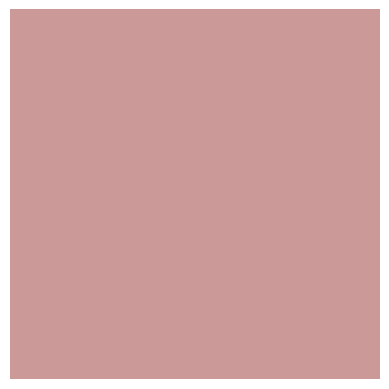

input_layer
conv1_pad
conv1_conv
conv1_bn
conv1_relu
pool1_pad
pool1_pool
conv2_block1_1_conv
conv2_block1_1_bn
conv2_block1_1_relu
conv2_block1_2_conv
conv2_block1_2_bn
conv2_block1_2_relu
conv2_block1_0_conv
conv2_block1_3_conv
conv2_block1_0_bn
conv2_block1_3_bn
conv2_block1_add
conv2_block1_out
conv2_block2_1_conv
conv2_block2_1_bn
conv2_block2_1_relu
conv2_block2_2_conv
conv2_block2_2_bn
conv2_block2_2_relu
conv2_block2_3_conv
conv2_block2_3_bn
conv2_block2_add
conv2_block2_out
conv2_block3_1_conv
conv2_block3_1_bn
conv2_block3_1_relu
conv2_block3_2_conv
conv2_block3_2_bn
conv2_block3_2_relu
conv2_block3_3_conv
conv2_block3_3_bn
conv2_block3_add
conv2_block3_out
conv3_block1_1_conv
conv3_block1_1_bn
conv3_block1_1_relu
conv3_block1_2_conv
conv3_block1_2_bn
conv3_block1_2_relu
conv3_block1_0_conv
conv3_block1_3_conv
conv3_block1_0_bn
conv3_block1_3_bn
conv3_block1_add
conv3_block1_out
conv3_block2_1_conv
conv3_block2_1_bn
conv3_block2_1_relu
conv3_block2_2_conv
conv3_block2_2_bn
co

In [23]:
# 📌 Phase 3: Grad-CAM Visualization
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image  # ✅ FIXED IMPORT

def grad_cam(model, img_array, layer_name="conv5_block3_out"):
    grad_model = Model(
        inputs=[model.input], 
        outputs=[model.get_layer(layer_name).output, model.output]
    )
    
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]
    
    grads = tape.gradient(loss, conv_outputs)[0]
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    heatmap = tf.reduce_sum(conv_outputs[0] * pooled_grads, axis=-1)
    heatmap = tf.squeeze(heatmap)
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)

    return heatmap  # ✅ Fix: removed .numpy()
    
# Load an image and run Grad-CAM
img_path = "test_mri.jpg"
img = image.load_img(img_path, target_size=(224, 224))  # ✅ FIXED
img_array = image.img_to_array(img) / 255.0  # ✅ FIXED
img_array = np.expand_dims(img_array, axis=0)

heatmap = grad_cam(model, img_array)

# Overlay heatmap on original image
img = cv2.imread(img_path)
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

plt.imshow(superimposed_img)
plt.axis("off")
plt.show()

for layer in model.layers:
    print(layer.name)


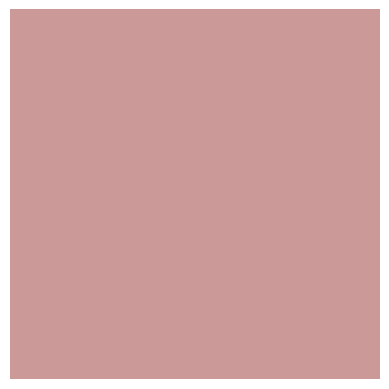


🔍 Grad-CAM Interpretation Table:
             Metric     Value
0  Pooled Gradients -0.000004


In [29]:
# 📌 Phase 3: Grad-CAM Visualization

import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import pandas as pd  # For tabular representation

def grad_cam(model, img_array, layer_name="conv5_block3_out"):
    """
    Generate a Grad-CAM heatmap for a given model and image.
    """
    grad_model = Model(
        inputs=[model.input], 
        outputs=[model.get_layer(layer_name).output, model.output]
    )
    
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]
    
    grads = tape.gradient(loss, conv_outputs)[0]
    pooled_grads = tf.reduce_mean(grads)  # ✅ Ensure this is a scalar

    heatmap = tf.reduce_sum(conv_outputs[0] * pooled_grads, axis=-1)
    heatmap = tf.squeeze(heatmap)
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)

    return heatmap, float(pooled_grads)  # ✅ Convert pooled_grads to a Python float

# Load an image and run Grad-CAM
img_path = "test_mri.jpg"
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)

heatmap, pooled_grads = grad_cam(model, img_array)

# Save the heatmap
plt.imsave("heatmap.png", heatmap, cmap='jet')

# Overlay heatmap on original image
img = cv2.imread(img_path)
heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap_resized = np.uint8(255 * heatmap_resized)
heatmap_colored = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

superimposed_img = cv2.addWeighted(img, 0.6, heatmap_colored, 0.4, 0)

# Save the final overlaid image
cv2.imwrite("superimposed_heatmap.png", superimposed_img)

# Display the results
plt.imshow(superimposed_img)
plt.axis("off")
plt.show()

# ✅ Corrected DataFrame to store pooled_grads as a single value
df = pd.DataFrame({"Metric": ["Pooled Gradients"], "Value": [pooled_grads]})
print("\n🔍 Grad-CAM Interpretation Table:")
print(df)

# Save table as CSV
df.to_csv("heatmap_interpretation.csv", index=False)


C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


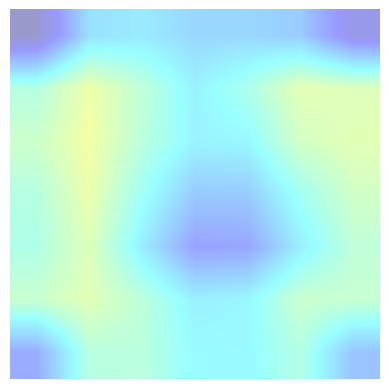


🔍 Grad-CAM Interpretation Table:
             Metric     Value
0  Pooled Gradients  0.000006


In [35]:
# 📌 Phase 3: Grad-CAM Visualization

import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import pandas as pd  # For tabular representation

def grad_cam(model, img_array, layer_name="conv5_block1_out"):
    """
    Generate a Grad-CAM heatmap for a given model and image.
    """
    grad_model = Model(
        inputs=[model.input], 
        outputs=[model.get_layer(layer_name).output, model.output]
    )
    
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]
    
    grads = tape.gradient(loss, conv_outputs)[0]
    pooled_grads = tf.reduce_mean(grads)  # ✅ Ensure this is a scalar

    heatmap = tf.reduce_sum(conv_outputs[0] * pooled_grads, axis=-1)
    heatmap = tf.squeeze(heatmap)
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)

    return heatmap, float(pooled_grads)  # ✅ Convert pooled_grads to a Python float

# Load an image and run Grad-CAM
img_path = "test_mri.jpg"
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)

heatmap, pooled_grads = grad_cam(model, img_array)

# Save the heatmap
plt.imsave("heatmap.png", heatmap, cmap='jet')

# Overlay heatmap on original image
img = cv2.imread(img_path)
heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap_resized = np.uint8(255 * heatmap_resized)
heatmap_colored = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

superimposed_img = cv2.addWeighted(img, 0.6, heatmap_colored, 0.4, 0)

# Save the final overlaid image
cv2.imwrite("superimposed_heatmap.png", superimposed_img)

# Display the results
plt.imshow(superimposed_img)
plt.axis("off")
plt.show()

# ✅ Corrected DataFrame to store pooled_grads as a single value
df = pd.DataFrame({"Metric": ["Pooled Gradients"], "Value": [pooled_grads]})
print("\n🔍 Grad-CAM Interpretation Table:")
print(df)

# Save table as CSV
df.to_csv("heatmap_interpretation_block1.csv", index=False)


C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


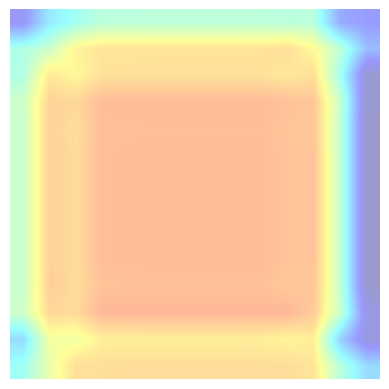


🔍 Grad-CAM Interpretation Table:
             Metric     Value
0  Pooled Gradients  0.000001


In [37]:
# 📌 Phase 3: Grad-CAM Visualization

import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import pandas as pd  # For tabular representation

def grad_cam(model, img_array, layer_name="conv4_block3_out"):
    """
    Generate a Grad-CAM heatmap for a given model and image.
    """
    grad_model = Model(
        inputs=[model.input], 
        outputs=[model.get_layer(layer_name).output, model.output]
    )
    
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]
    
    grads = tape.gradient(loss, conv_outputs)[0]
    pooled_grads = tf.reduce_mean(grads)  # ✅ Ensure this is a scalar

    heatmap = tf.reduce_sum(conv_outputs[0] * pooled_grads, axis=-1)
    heatmap = tf.squeeze(heatmap)
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)

    return heatmap, float(pooled_grads)  # ✅ Convert pooled_grads to a Python float

# Load an image and run Grad-CAM
img_path = "test_mri.jpg"
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)

heatmap, pooled_grads = grad_cam(model, img_array)

# Save the heatmap
plt.imsave("heatmap.png", heatmap, cmap='jet')

# Overlay heatmap on original image
img = cv2.imread(img_path)
heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap_resized = np.uint8(255 * heatmap_resized)
heatmap_colored = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

superimposed_img = cv2.addWeighted(img, 0.6, heatmap_colored, 0.4, 0)

# Save the final overlaid image
cv2.imwrite("superimposed_heatmap.png", superimposed_img)

# Display the results
plt.imshow(superimposed_img)
plt.axis("off")
plt.show()

# ✅ Corrected DataFrame to store pooled_grads as a single value
df = pd.DataFrame({"Metric": ["Pooled Gradients"], "Value": [pooled_grads]})
print("\n🔍 Grad-CAM Interpretation Table:")
print(df)

# Save table as CSV
df.to_csv("heatmap_interpretation_block3.csv", index=False)


C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


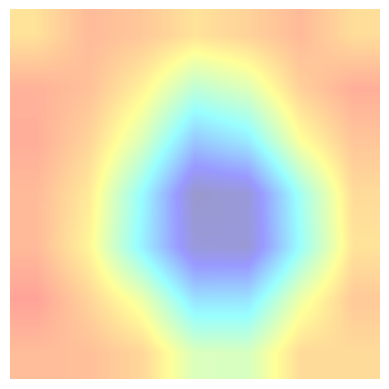


🔍 Grad-CAM Interpretation Table:
             Metric     Value
0  Pooled Gradients  0.000005


In [39]:
# 📌 Phase 3: Grad-CAM Visualization

import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import pandas as pd  # For tabular representation

def grad_cam(model, img_array, layer_name="conv5_block2_out"):
    """
    Generate a Grad-CAM heatmap for a given model and image.
    """
    grad_model = Model(
        inputs=[model.input], 
        outputs=[model.get_layer(layer_name).output, model.output]
    )
    
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]
    
    grads = tape.gradient(loss, conv_outputs)[0]
    pooled_grads = tf.reduce_mean(grads)  # ✅ Ensure this is a scalar

    heatmap = tf.reduce_sum(conv_outputs[0] * pooled_grads, axis=-1)
    heatmap = tf.squeeze(heatmap)
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)

    return heatmap, float(pooled_grads)  # ✅ Convert pooled_grads to a Python float

# Load an image and run Grad-CAM
img_path = "test_mri.jpg"
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)

heatmap, pooled_grads = grad_cam(model, img_array)

# Save the heatmap
plt.imsave("heatmap.png", heatmap, cmap='jet')

# Overlay heatmap on original image
img = cv2.imread(img_path)
heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap_resized = np.uint8(255 * heatmap_resized)
heatmap_colored = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

superimposed_img = cv2.addWeighted(img, 0.6, heatmap_colored, 0.4, 0)

# Save the final overlaid image
cv2.imwrite("superimposed_heatmap.png", superimposed_img)

# Display the results
plt.imshow(superimposed_img)
plt.axis("off")
plt.show()

# ✅ Corrected DataFrame to store pooled_grads as a single value
df = pd.DataFrame({"Metric": ["Pooled Gradients"], "Value": [pooled_grads]})
print("\n🔍 Grad-CAM Interpretation Table:")
print(df)

# Save table as CSV
df.to_csv("heatmap_interpretation_block2.csv", index=False)


C:\Users\HP USER\anaconda3\envs\myenv\lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


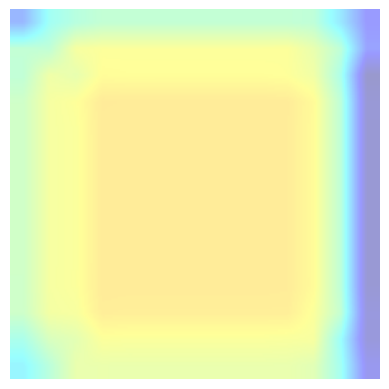


🔍 Grad-CAM Interpretation Table:
             Metric     Value
0  Pooled Gradients  0.000002


In [41]:
# 📌 Phase 3: Grad-CAM Visualization

import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import pandas as pd  # For tabular representation

def grad_cam(model, img_array, layer_name="conv4_block2_out"):
    """
    Generate a Grad-CAM heatmap for a given model and image.
    """
    grad_model = Model(
        inputs=[model.input], 
        outputs=[model.get_layer(layer_name).output, model.output]
    )
    
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions)]
    
    grads = tape.gradient(loss, conv_outputs)[0]
    pooled_grads = tf.reduce_mean(grads)  # ✅ Ensure this is a scalar

    heatmap = tf.reduce_sum(conv_outputs[0] * pooled_grads, axis=-1)
    heatmap = tf.squeeze(heatmap)
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)

    return heatmap, float(pooled_grads)  # ✅ Convert pooled_grads to a Python float

# Load an image and run Grad-CAM
img_path = "test_mri.jpg"
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)

heatmap, pooled_grads = grad_cam(model, img_array)

# Save the heatmap
plt.imsave("heatmap.png", heatmap, cmap='jet')

# Overlay heatmap on original image
img = cv2.imread(img_path)
heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap_resized = np.uint8(255 * heatmap_resized)
heatmap_colored = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

superimposed_img = cv2.addWeighted(img, 0.6, heatmap_colored, 0.4, 0)

# Save the final overlaid image
cv2.imwrite("superimposed_heatmap.png", superimposed_img)

# Display the results
plt.imshow(superimposed_img)
plt.axis("off")
plt.show()

# ✅ Corrected DataFrame to store pooled_grads as a single value
df = pd.DataFrame({"Metric": ["Pooled Gradients"], "Value": [pooled_grads]})
print("\n🔍 Grad-CAM Interpretation Table:")
print(df)

# Save table as CSV
df.to_csv("heatmap_interpretation_cv4_block2.csv", index=False)

In [43]:
predictions = model.predict(img_array)
print(predictions)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
[[1.72290194e-04 3.30486859e-04 6.04724191e-05 1.05671577e-04
  5.24409406e-05 5.20324451e-04 9.50684898e-06 3.53069772e-05
  1.76840458e-05 1.41325116e-04 7.18382362e-04 1.42327903e-04
  5.91412208e-05 8.15435342e-05 1.70083822e-05 5.04211857e-05
  1.26133164e-04 2.94963938e-05 5.86759706e-05 5.06476208e-05
  1.95706860e-04 1.59604428e-03 9.76075011e-04 2.26174176e-04
  8.83792600e-05 1.12638154e-04 3.15151206e-04 2.36161053e-04
  1.75947032e-04 1.88129241e-04 4.36185037e-05 3.34859127e-04
  8.98494909e-05 1.14115006e-04 2.85499700e-04 1.65443853e-05
  1.21685109e-04 1.13196784e-05 5.89046674e-03 3.77990327e-05
  4.94959386e-05 2.02227486e-04 2.33795770e-04 1.62627126e-04
  5.56691266e-05 1.27693769e-04 4.09083987e-05 2.30696882e-04
  3.61388120e-05 3.62065621e-05 1.69912688e-04 4.25983395e-04
  2.98886531e-04 5.34267398e-04 2.50341254e-04 2.49980749e-05
  6.00542589e-05 1.47144447e-05 1.39431213e-04 2.97487946e-03
  4.67834179e-04 3.92348520e-05 2.

In [45]:
print(predictions.shape)

(1, 1000)


In [47]:
predicted_class = np.argmax(predictions)
print("Predicted class:", predicted_class)


Predicted class: 111


In [49]:
confidence = np.max(predictions)
print(f"Confidence: {confidence:.2f}")


Confidence: 0.14


In [51]:
class_labels = ['label_0', 'label_1', 'label_2', ...]  # Adjust based on your model
print("Predicted label:", class_labels[predicted_class])


IndexError: list index out of range

In [61]:
import numpy as np

# Assume predictions is the output from your model
predictions = model.predict(img_array)  # Example shape: (1, N)

# Get the predicted class index (highest probability)
predicted_class = np.argmax(predictions)
print("Predicted class index:", predicted_class)

# Define class labels (adjust based on the number of classes)
class_labels = [f'label_{i}' for i in range(112)]  # Adjust to match the number of predicted classes

# Check if predicted_class is within the range of class_labels
if 0 <= predicted_class < len(class_labels):
    print("Predicted label:", class_labels[predicted_class])
else:
    print("Predicted class index is out of range of class labels.")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
Predicted class index: 111
Predicted label: label_111


In [69]:
import os
import pandas as pd

# Update with your actual dataset path
dataset_path = r"C:\Users\HP USER\Downloads\20Proj_Challenge_5_Alzheimer_Data_Analysis\data\combined_images"

# Define class names (folder names)
class_labels = ["MildDemented", "ModerateDemented", "NonDemented", "VeryMildDemented"]

# Initialize dictionary to store class counts
class_counts = {}

for class_label in class_labels:
    class_folder = os.path.join(dataset_path, class_label)

    # Debugging: Check if the path exists
    if not os.path.exists(class_folder):
        print(f"❌ Folder not found: {class_folder}")
        class_counts[class_label] = 0
        continue  # Skip to next folder

    # Count PNG files recursively (including subfolders)
    num_images = sum(len(files) for _, _, files in os.walk(class_folder) if any(f.endswith(('.png', '.jpg', '.jpeg')) for f in files))
    
    class_counts[class_label] = num_images
    print(f"✅ Found {num_images} images in '{class_label}'")  # Debugging output

# Convert results to DataFrame
df = pd.DataFrame(list(class_counts.items()), columns=["Class", "Image Count"])

# Save CSV for Power BI
csv_path = "alzheimers_class_distribution.csv"
df.to_csv(csv_path, index=False)

print(f"\n📁 CSV saved to: {csv_path}")
print(df)


✅ Found 10000 images in 'MildDemented'
✅ Found 10000 images in 'ModerateDemented'
✅ Found 12800 images in 'NonDemented'
✅ Found 8107 images in 'VeryMildDemented'

📁 CSV saved to: alzheimers_class_distribution.csv
              Class  Image Count
0      MildDemented        10000
1  ModerateDemented        10000
2       NonDemented        12800
3  VeryMildDemented         8107
